# Table of Contents:
    Business Prop
    Import Statements
    Organizing the Data
    EDA
    Data Cleaning
    Word Cloud
    TF-IDF
    Modeling
    FSM
    

# Business Prop:
Company A is stingy AF and doesn't want to mine their consumerbase for more data. THey want to squeeze every last delicious drop from the feedback they already receive. They have a review system in place that allows consumer to rate a place from one to five stars and leave a written review. As a way of getting more data out of this system they want hteir three star reviews disambiguated. Three star reviews create a problem by being notoriously flimsy in intent. Sometimes 3 stars is good, sometimes its bad, sometimes its just average. In an attempt to demystify these reviews company A would like a tool that will designate a review as positive or negative, no middle ground, no neutrals, no prisoners. 

In [1]:
import nltk
import random
import pickle
import pandas as pd
from sklearn.model_selection import train_test_split, GridSearchCV
from nltk.classify.scikitlearn import SklearnClassifier
from sklearn.naive_bayes import MultinomialNB,BernoulliNB
from sklearn.linear_model import LogisticRegression, SGDClassifier
from sklearn.svm import SVC, LinearSVC, NuSVC
from nltk.classify import ClassifierI
from statistics import mode
from nltk.tokenize import word_tokenize
import json
nltk.download('punkt')
import csv
from nltk.corpus import stopwords
from sklearn.feature_extraction.text import TfidfVectorizer
from sklearn.metrics import accuracy_score
from nltk.stem import PorterStemmer
import matplotlib
import matplotlib.pyplot as plt
import numpy as np
from sklearn.ensemble import StackingRegressor
import seaborn as sns

[nltk_data] Downloading package punkt to
[nltk_data]     C:\Users\edwardsrk\AppData\Roaming\nltk_data...
[nltk_data]   Package punkt is already up-to-date!


In [2]:
import sys
print(sys.maxsize)

9223372036854775807


# Organizing the Data

## creating an 80/20 split between test and train data


# EDA

In [85]:
nltk.download('tagsets')
nltk.help.upenn_tagset()
from nltk import pos_tag

$: dollar
    $ -$ --$ A$ C$ HK$ M$ NZ$ S$ U.S.$ US$
'': closing quotation mark
    ' ''
(: opening parenthesis
    ( [ {
): closing parenthesis
    ) ] }
,: comma
    ,
--: dash
    --
.: sentence terminator
    . ! ?
:: colon or ellipsis
    : ; ...
CC: conjunction, coordinating
    & 'n and both but either et for less minus neither nor or plus so
    therefore times v. versus vs. whether yet
CD: numeral, cardinal
    mid-1890 nine-thirty forty-two one-tenth ten million 0.5 one forty-
    seven 1987 twenty '79 zero two 78-degrees eighty-four IX '60s .025
    fifteen 271,124 dozen quintillion DM2,000 ...
DT: determiner
    all an another any both del each either every half la many much nary
    neither no some such that the them these this those
EX: existential there
    there
FW: foreign word
    gemeinschaft hund ich jeux habeas Haementeria Herr K'ang-si vous
    lutihaw alai je jour objets salutaris fille quibusdam pas trop Monte
    terram fiche oui corporis ...
IN: preposition or

[nltk_data] Downloading package tagsets to
[nltk_data]     C:\Users\edwardsrk\AppData\Roaming\nltk_data...
[nltk_data]   Package tagsets is already up-to-date!


In [86]:
def get_wordnet_pos(treebank_tag):
    '''
    Translate nltk POS to wordnet tags
    '''
    if treebank_tag.startswith('J'):
        return wordnet.ADJ
    elif treebank_tag.startswith('V'):
        return wordnet.VERB
    elif treebank_tag.startswith('N'):
        return wordnet.NOUN
    elif treebank_tag.startswith('R'):
        return wordnet.ADV
    else:
        return wordnet.NOUN

In [87]:
from nltk.stem import WordNetLemmatizer
from nltk.corpus import stopwords, wordnet
sw = stopwords.words('english')
def data_cleaner(doc, stop_words=sw):
    #rename to data cleaner
    '''
    
    :param doc: a document from the satire corpus 
    :return: a document string with words which have been 
            lemmatized, 
            parsed for stopwords, 
            made lowercase,
            and stripped of punctuation and numbers.
    '''
    
    regex_token = RegexpTokenizer(r"([a-zA-Z]+(?:’[a-z]+)?)")
    doc = regex_token.tokenize(doc)
    doc = [word.lower() for word in doc]
    doc = [word for word in doc if word not in sw]
    print(doc)
    doc = pos_tag(doc)
    doc = [(word[0], get_wordnet_pos(word[1])) for word in doc]
    lemmatizer = WordNetLemmatizer() 
    doc = [lemmatizer.lemmatize(word[0], word[1]) for word in doc]
    return ' '.join(doc)

In [88]:
from nltk.tokenize import regexp_tokenize, word_tokenize, RegexpTokenizer

In [75]:
sw = stopwords.words('english')
#add custom sopt words?
#custom_sw = stopwords.words('english')
#custom_sw.extend([words])
c_list = df.text.tolist()


clean_corpus = []
for doc in c_list:
    clean_corpus.append(data_cleaner(doc, sw))

NameError: name 'df' is not defined

In [32]:
df['clean'] = clean_corpus
df = df.drop(['text'], axis= 1)
df.head()

,tag,clean
0,pos,oh happy day finally cane near casa yes others...
1,pos,twice nice laid back tried weekend southern me...
2,pos,order delivery reviewi discovered place front ...
3,pos,close friend town instead taking well establis...
4,pos,coconut fish cafe fantastic five star fish caf...


# Viz of data change over cleaning

In [5]:
from os import path
from PIL import Image
from wordcloud import WordCloud, STOPWORDS, ImageColorGenerator

Random Stratified Sample

In [89]:
with open ('./data/pickles/40k_sample.p', "rb") as readfile: 
    X, y = pickle.load(readfile)

In [90]:
df_strat = X.copy()

In [91]:
df_strat['stars'] = y

In [92]:
df_strat.head()

,text,stars
7935619,Chips and salsa were awesome! Taco bowl was am...,4
6261538,"When you take acrylic nails off, your suppose ...",1
1261782,One of the best places for Turkish food in the...,5
7802386,So difficult to book appointments with. They r...,2
6792587,"Scheduled a ""do what you gotta do"" massage wit...",5


In [93]:
df_strat = df_strat[df_strat['stars'] != 3]

In [94]:
def num_to_cat(star):
    if star == 4 or star == 5:
        return 'pos'
    else:
        return 'neg'

In [95]:
df_strat['tag'] = df_strat.stars.apply(num_to_cat)

In [96]:
df_strat.head()

,text,stars,tag
7935619,Chips and salsa were awesome! Taco bowl was am...,4,pos
6261538,"When you take acrylic nails off, your suppose ...",1,neg
1261782,One of the best places for Turkish food in the...,5,pos
7802386,So difficult to book appointments with. They r...,2,neg
6792587,"Scheduled a ""do what you gotta do"" massage wit...",5,pos


In [97]:
sw = stopwords.words('english')
c_list_strat = df_strat.text.tolist()

#c_list_strat[0]
clean_corpus_strat = []
for docs in c_list_strat:
    clean_corpus_strat.append(data_cleaner(docs, sw))

['chips', 'salsa', 'awesome', 'taco', 'bowl', 'amazing', 'big', 'chunks', 'chicken', 'reason', 'stars', 'otherwise', 'taco', 'bowl', 'amazing', 'shell', 'fried', 'greasy', 'good']
['take', 'acrylic', 'nails', 'suppose', 'soak', 'cut', 'away', 'file', 'nail', 'tec', 'literally', 'pried', 'nails', 'cut', 'twice', 'fake', 'nail', 'pried', 'almost', 'tears', 'hurt', 'bad', 'told', 'much', 'hurt', 'walked', 'applied', 'shellac', 'even', 'get', 'close', 'nail', 'bed']
['one', 'best', 'places', 'turkish', 'food', 'area', 'interior', 'bit', 'cramped', 'cozy', 'smell', 'flavors', 'coming', 'grill', 'soon', 'walk', 'waitstaff', 'friendly', 'start', 'finish', 'although', 'prices', 'bit', 'higher', 'end', 'portions', 'large', 'able', 'share', 'mix', 'grill', 'two', 'people', 'bringing', 'entree', 'gave', 'us', 'fresh', 'warm', 'pita', 'bread', 'accompanied', 'two', 'sauces', 'good', 'one', 'usual', 'yogurt', 'less', 'creamy', 'spicier', 'type', 'main', 'plate', 'came', 'surprised', 'large', 'four'

['least', 'two', 'times', 'would', 'go', 'back', 'fianc', 'always', 'make', 'job', 'try', 'gnocchi', 'get', 'hands', 'aria', 'best', 'definitely', 'worth', 'trying', 'service', 'great', 'well', 'ambiance']
['could', 'give', 'less', 'would', 'worst', 'dealership', 'ever', 'dealt', 'wasted', 'time', 'long', 'story', 'short', 'better', 'options', 'pay', 'attention', 'whatever', 'put', 'car', 'scammy', 'scandalous', 'car', 'salesman']
['sure', 'hype', 'place', 'low', 'quality', 'dirty', 'food', 'horrible', 'got', 'grilled', 'chicken', 'sandwich', 'bland', 'chicken', 'flavor', 'wasnt', 'even', 'juicy', 'fries', 'stale', 'literally', 'chewy', 'fries', 'shoe', 'string', 'fries', 'like', 'rubbery', 'stale', 'fries', 'yr', 'old', 'wouldnt', 'even', 'eat', 'daughter', 'hot', 'dog', 'burnt', 'spots', 'restaurant', 'understands', 'kids', 'meal', 'burnt', 'stuff', 'never', 'good', 'daughters', 'friend', 'ordered', 'kids', 'mac', 'n', 'cheese', 'well', 'probably', 'say', 'big', 'spoonfuls', 'mac', '

['atmosphere', 'comes', 'restaurants', 'besides', 'food', 'customer', 'service', 'superb', 'trendy', 'spot', 'las', 'vegas', 'strip', 'definitely', 'vegetarian', 'pizza', 'amazing', 'ate', 'entire', 'thing', 'even', 'friends', 'trying', 'get', 'slice', 'pizza', 'ordered', 'glad', 'white', 'wine', 'perfectly', 'chilled', 'crisp', 'sitting', 'balcony', 'twice', 'however', 'return', 'appetite', 'iphone', 'please', 'enjoy', 'photos', 'tend', 'take', 'restaurant', 'tour', 'wait', 'food', 'besides', 'ultimate', 'foodie', 'photography', 'passion']
['craving', 'something', 'light', 'healthy', 'savory', 'bahnmi', 'way', 'go', 'highly', 'recommend', 'xa', 'xiu', 'bahnmi', 'marinated', 'pork', 'really', 'soft', 'delicious', 'also', 'get', 'toppings', 'siracha', 'jalape', 'os', 'spicy', 'flavor', 'add', 'fried', 'egg', 'extra', 'topping', 'fan', 'eggs', 'spicy', 'food', 'try', 'combo']
['ink', 'ivy', 'cute', 'stumbled', 'upon', 'visiting', 'charlotte', 'riding', 'scooters', 'blocks', 'le', 'meridi

['welcome', 'back', 'welcome', 'back', 'welcome', 'back', 'devastated', 'old', 'top', 'notch', 'bbq', 'food', 'truck', 'got', 'repossessed', 'pitmaster', 'jimmy', 'cole', 'else', 'going', 'get', 'beloved', 'cincyporkwich', 'towering', 'sandwich', 'tender', 'smoky', 'pulled', 'pork', 'smothered', 'rich', 'sweet', 'cincinnati', 'chili', 'well', 'month', 'jimmy', 'val', 'finally', 'opened', 'brick', 'mortar', 'version', 'beloved', 'top', 'notch', 'truck', 'killer', 'location', 'eastern', 'serene', 'doc', 'holliday', 'restaurant', 'space', 'previously', 'occupied', 'monstah', 'lobstah', 'pleased', 'report', 'familiar', 'flavors', 'back', 'taste', 'well', 'deserved', 'winner', 'las', 'vegas', 'weekly', 'nod', 'best', 'bbq', 'town', 'little', 'obsessed', 'cincy', 'chili', 'partly', 'get', 'one', 'place', 'vegas', 'make', 'way', 'sweet', 'favorite', 'sandwiches', 'ones', 'smothered', 'first', 'aforementioned', 'cincyporkwich', 'referred', 'menu', 'unobtrusively', 'pulled', 'pork', 'sandwich',

['reviewed', 'place', 'heard', 'might', 'go', 'away', 'let', 'collectively', 'take', 'moment', 'realize', 'nightclubs', 'vegas', 'pretty', 'much', 'cookie', 'cutter', 'fist', 'pumps', 'mind', 'c', 'mon', 'need', 'little', 'spicy', 'life', 'sin', 'city', 'real', 'santa', 'tooth', 'fairy', 'might', 'well', 'grab', 'laser', 'pen', 'daft', 'punk', 'turn', 'lights', 'living', 'room', 'put', 'glow', 'dark', 'dom', 'p', 'thanks', 'las', 'vegas', 'palazzo', 'saved', 'grand', 'reason', 'would', 'go', 'hotel', 'pick', 'mom', 'goes', 'wax', 'museum']
['absolutely', 'wonderful', 'service', 'went', 'beyond', 'help', 'situation', 'great', 'attitude', 'even', 'came', 'check', 'moving', 'stuff', 'really', 'appreciate', 'personalized', 'service', 'received', 'thank', 'place', 'also', 'super', 'clean', 'useful', 'moving', 'carts', 'everyone', 'use']
['else', 'mix', 'match', 'bulk', 'sweets', 'g', 'path', 'alone', 'gets', 'stars', 'please', 'ever', 'leave', 'visit', 'way', 'often', 'days', 'go', 'twice',

['lot', 'things', 'get', 'south', 'charlotte', 'gal', 'north', 'charlotte', 'establishment', 'something', 'special', 'always', 'wait', 'weekends', 'never', 'wait', 'minutes', 'service', 'efficient', 'love', 'give', 'ticket', 'bring', 'food', 'everything', 'ordered', 'whether', 'breakfast', 'lunch', 'phenomenal', 'area', 'need', 'awesome', 'incredibly', 'cheap', 'diner', 'food', 'place', 'go']
['started', 'branch', 'try', 'new', 'kinds', 'food', 'thought', 'would', 'give', 'place', 'try', 'disappoint', 'menu', 'cute', 'made', 'kind', 'wood', 'food', 'good', 'also', 'bright', 'colorful', 'food', 'served', 'fish', 'plate', 'made', 'day', 'adventurous', 'wanna', 'try', 'something', 'new', 'say', 'check', 'place']
['amazed', 'someone', 'could', 'give', 'hole', 'star', 'said', 'stink', 'omnipresent', 'carpets', 'laughably', 'dirty', 'linens', 'stained', 'badly', 'thick', 'obvious', 'disgusting', 'stains', 'windows', 'walls', 'like', 'cardboard', 'hear', 'everything', 'noisy', 'neighborhood',

['great', 'place', 'spend', 'night', 'good', 'food', 'friendly', 'staff', 'facelift', 'rooms', 'upscale']
['awesome', 'tried', 'tourtiere', 'best', 'mean', 'crust', 'perfect', 'side', 'veggie', 'brussels', 'sprouts', 'w', 'hazelnuts', 'yum', 'kudos', 'chef', 'one', 'good', 'ordered', 'pork', 'belly', 'pizza', 'go', 'road', 'trip', 'lovely', 'ambiance', 'nice', 'bar', 'friendly', 'waiter', 'opened', 'month', 'ago', 'met', 'owner', 'moses', 'far', 'things', 'looking', 'good', 'see', 'good', 'future', 'lucid', 'sure', 'back', 'nice', 'wines', 'list', 'glass', 'smooth', 'red', 'californian', 'sorry', 'forgot', 'name', 'coffee', 'americano', 'cup', 'capucinno', 'actually', 'hey', 'satisfying', 'creme', 'brulee', 'made', 'perfection', 'also', 'shared', 'shortcake', 'yummy', 'custard', 'good', 'mmm', 'enjoy', 'ps', 'enjoying', 'dinner', 'lady', 'gaga', 'stunt', 'double', 'walked', 'sat', 'bar', 'cool', 'well', 'let', 'say', 'could', 'pass', 'lady', 'gaga', 'stunt', 'double', 'think', 'gaga', 

['always', 'feel', 'like', 'family', 'come', 'tran', 'zen', 'always', 'takes', 'care', 'glad', 'teeth', 'looking', 'great']
['vegas', 'vacation', 'time', 'get', 'nails', 'done', 'back', 'home', 'found', 'place', 'decided', 'give', 'try', 'happy', 'staff', 'nice', 'funny', 'make', 'feel', 'comfortable', 'get', 'man', 'name', 'full', 'set', 'pedi', 'amazing', 'love', 'nails']
['colleague', 'chose', 'restaurant', 'birthday', 'lunch', 'group', 'expected', 'wait', 'bit', 'actually', 'waited', 'hour', 'food', 'arrived', 'purposely', 'arrived', 'avoid', 'rush', 'one', 'people', 'restaurant', 'kept', 'asking', 'food', 'would', 'arrive', 'server', 'kept', 'saying', 'ordered', 'personal', 'deep', 'dish', 'pizza', 'one', 'charged', 'small', 'pizza', 'two', 'difference', 'colleague', 'whose', 'birthday', 'celebrating', 'asked', 'wanted', 'complimentary', 'dessert', 'accepted', 'go', 'took', 'forever', 'arrive', 'charged', 'dessert', 'bill', 'many', 'many', 'deep', 'dish', 'pizzas', 'actually', 'ex

['virgin', 'prides', 'customer', 'care', 'total', 'joke', 'worst', 'phone', 'customer', 'care', 'wait', 'time', 'always', 'minutes', 'risk', 'getting', 'cut', 'like', 'three', 'separate', 'calls', 'add', 'insult', 'able', 'register', 'online', 'unless', 'credit', 'card', 'associated', 'canadian', 'address', 'whole', 'point', 'pay', 'go', 'hassle', 'free', 'aspect', 'virgin', 'adds', 'extra', 'hassle', 'taking', 'phone', 'back', 'would', 'avoid', 'virgin', 'mobile', 'costs', 'marketing', 'line', 'actual', 'experience', 'trying', 'set', 'phones', 'avoid']
['ear', 'pierced', 'twice', 'yesterday', 'whole', 'experience', 'moment', 'walked', 'door', 'walked', 'awesome', 'guys', 'super', 'nice', 'welcoming', 'first', 'time', 'went', 'went', 'lunch', 'break', 'get', 'info', 'wait', 'someone', 'help', 'right', 'ready', 'ask', 'could', 'help', 'spoke', 'jordan', 'piercer', 'went', 'back', 'later', 'suspected', 'due', 'awesome', 'reviews', 'much', 'busier', 'wait', 'bit', 'people', 'get', 'pierce

['place', 'great', 'came', 'switch', 'birth', 'control', 'methods', 'gave', 'options', 'would', 'work', 'place', 'ob', 'gyn', 'get', 'pregnant', 'office', 'nice', 'clean', 'date', 'designs', 'technology']
['love', 'dentist', 'mean', 'often', 'people', 'say', 'dr', 'pham', 'dentist', 'since', 'moved', 'vegas', 'years', 'ago', 'always', 'issues', 'teeth', 'need', 'regular', 'cleaning', 'treatments', 'let', 'honest', 'one', 'enjoys', 'going', 'dentist', 'even', 'simple', 'cleaning', 'dr', 'pham', 'makes', 'visit', 'much', 'better', 'less', 'stressful', 'done', 'lot', 'work', 'teeth', 'time', 'good', 'experience', 'bigger', 'closer', 'luxury', 'dental', 'offices', 'choose', 'stay', 'b', 'c', 'best', 'also', 'staff', 'linda', 'nice', 'helpful', 'well', 'hope', 'dr', 'pham', 'practices', 'long', 'time', 'b', 'c', 'want', 'go', 'anyone', 'else']
['first', 'time', 'cleveland', 'thought', 'would', 'check', 'place', 'hour', 'wait', 'service', 'incredible', 'say', 'enough', 'good', 'things', 'wai

['awesome', 'experience', 'food', 'delicious', 'staff', 'especially', 'manager', 'amazing', 'manager', 'brian', 'came', 'table', 'make', 'sure', 'great', 'time', 'certainly', 'would', 'highly', 'recommend', 'place', 'dinner', 'dessert']
['great', 'show', 'entertaining', 'amazing', 'handling', 'audience', 'eccentric', 'quirky', 'funny', 'magic', 'tricks', 'really', 'good']
['check', 'engine', 'light', 'weeks', 'took', 'dealer', 'told', 'needed', 'new', 'transmission', 'called', 'aamco', 'second', 'opinion', 'told', 'would', 'diagnose', 'problem', 'free', 'give', 'quote', 'turned', 'needed', 'solenoid', 'fluid', 'flush', 'dealer', 'quoted', 'k', 'got', 'taken', 'care', 'go', 'back', 'problems', 'auto', 'shop', 'trust']
['horrible', 'experience', 'pk', 'food', 'truck', 'live', 'next', 'store', 'front', 'location', 'great', 'experiences', 'food', 'value', 'ordered', 'chicken', 'stir', 'fry', 'without', 'exaggeration', 'size', 'normal', 'portions', 'small', 'pieces', 'chicken', 'expressed',

['reading', 'reviews', 'clear', 'people', 'either', 'love', 'place', 'hate', 'definitely', 'busy', 'understand', 'really', 'good', 'food', 'done', 'right', 'family', 'four', 'arrived', 'morning', 'around', 'tables', 'full', 'one', 'name', 'list', 'seated', 'us', 'asked', 'wait', 'outside', 'table', 'ready', 'cold', 'want', 'take', 'kids', 'outside', 'found', 'area', 'back', 'seated', 'within', 'mins', 'everything', 'smooth', 'sailing', 'kids', 'ordered', 'pancakes', 'bacon', 'whipped', 'cream', 'surprisingly', 'ate', 'almost', 'husband', 'ham', 'jalape', 'omelette', 'ordered', 'chicken', 'fried', 'steak', 'everything', 'done', 'well', 'server', 'rudy', 'really', 'reason', 'would', 'come', 'back', 'personable', 'acknowledged', 'small', 'hiccups', 'immediately', 'dining', 'often', 'much', 'experience', 'food']
['grew', 'getting', 'st', 'hubert', 'least', 'month', 'take', 'always', 'preferred', 'chicken', 'sauce', 'swiss', 'chalet', 'big', 'debate', 'amongst', 'student', 'university', 'la

['tried', 'place', 'st', 'time', 'evening', 'say', 'agree', 'everyone', 'staff', 'super', 'friendly', 'makes', 'feel', 'welcomed', 'important', 'part', 'food', 'absolutely', 'best', 'steak', 'cheese', 'sandwich', 'las', 'vegas', 'tell', 'steak', 'freshly', 'shaved', 'every', 'day', 'steak', 'cheese', 'sandwich', 'great', 'flavor', 'cooked', 'perfection', 'also', 'ordered', 'rings', 'watched', 'hand', 'batter', 'front', 'rings', 'also', 'huge', 'probly', 'around', 'definitely', 'gained', 'customer', 'life']
['loved', 'place', 'stayed', 'double', 'queen', 'spacious', 'service', 'bar', 'restaurants', 'pool', 'great', 'conference', 'everyone', 'friendly', 'wished', 'band', 'played', 'friday', 'saturday', 'would', 'play', 'little', 'later', 'pm']
['far', 'one', 'favorite', 'bars', 'valley', 'coming', 'watch', 'football', 'games', 'family', 'seems', 'like', 'week', 'something', 'improved', 'pretty', 'sure', 'patio', 'brand', 'new', 'televisions', 'along', 'new', 'tables', 'chairs', 'always',

['usually', 'come', 'since', 'close', 'house', 'came', 'today', 'lunch', 'walked', 'nobody', 'greeted', 'us', 'problem', 'find', 'place', 'seat', 'seated', 'servers', 'saw', 'us', 'one', 'approach', 'us', 'give', 'us', 'water', 'even', 'menu', 'stood', 'counter', 'come', 'place', 'even', 'busy', 'tables', 'servers', 'even', 'one', 'server', 'came', 'stood', 'left', 'plenty', 'pho', 'shops', 'street']
['wife', 'went', 'store', 'scottsdale', 'purchased', 'two', 'recliners', 'delivered', 'fine', 'also', 'purchased', 'two', 'end', 'tables', 'cocktail', 'table', 'told', 'back', 'order', 'would', 'two', 'weeks', 'would', 'get', 'delivery', 'called', 'today', 'said', 'would', 'least', 'weeks', 'would', 'delivery', 'suggestion', 'go', 'store', 'see', 'want', 'say', 'back', 'ordered', 'order', 'go', 'somewhere', 'else', 'associates', 'misled', 'us']
['tonight', 'first', 'visit', 'food', 'amazing', 'currently', 'decreasing', 'sugar', 'salt', 'intake', 'steamed', 'rice', 'teriyaki', 'salmon', 'pe

['dinner', 'burger', 'restaurant', 'last', 'week', 'friends', 'burger', 'everyone', 'else', 'naked', 'confit', 'wings', 'cooked', 'low', 'slow', 'rendered', 'chicken', 'fat', 'crispy', 'served', 'hot', 'sauce', 'choice', 'variety', 'sauces', 'also', 'french', 'onion', 'rings', 'brined', 'tempura', 'fried', 'followed', 'boozy', 'shake', 'bananas', 'foster', 'w', 'meyers', 'dark', 'rum', 'oh', 'yummy', 'regular', 'shakes', 'variety', 'shakes', 'alcohol', 'called', 'boozy', 'shakes', 'delicious', 'specialize', 'variety', 'burgers', 'also', 'cater', 'people', 'eat', 'burgers', 'located', 'end', 'palace', 'station', 'casino', 'left', 'access', 'outside', 'inside', 'casino', 'bar', 'restaurant', 'setting', 'tvs', 'service', 'excellent', 'waiter', 'attentive', 'friendly', 'big', 'table', 'although', 'slow', 'weekday', 'everyone', 'table', 'said', 'food', 'good', 'large', 'restaurant', 'also']
['cute', 'place', 'grab', 'breakfast', 'lunch', 'limited', 'seating', 'enjoyable', 'environment', 'gr

['visit', 'tuesday', 'sure', 'tech', 'town', 'pedicure', 'gel', 'manicure', 'ambiance', 'massage', 'amazing', 'nails', 'came', 'awful', 'paint', 'toes', 'looked', 'like', 'child', 'gel', 'nails', 'bubbled', 'paint', 'sides', 'disappointed', 'price', 'paid']
['location', 'busy', 'quality', 'burgers', 'excellent', 'staff', 'polite', 'friendly', 'quickly', 'clear', 'tables', 'people', 'sit', 'right', 'away']
['originally', 'boulder', 'city', 'come', 'back', 'visit', 'like', 'come', 'dinner', 'food', 'really', 'good', 'complaints']
['medicaid', 'patients', 'cash', 'patients', 'please', 'find', 'somewhere', 'else', 'office', 'worse', 'play', 'prices', 'offer', 'smile', 'saver', 'program', 'looks', 'like', 'u', 'got', 'good', 'deal', 'actually', 'office', 'much', 'cheaper', 'charged', 'us', 'exam', 'xrays', 'told', 'us', 'medicaid', 'covered', 'truth', 'quoted', 'us', 'crazy', 'high', 'amount', 'went', 'somewhere', 'else', 'quote', 'us', 'half', 'price', 'exact', 'procedure']
['roasted', 'bo

['bad', 'clean', 'huge', 'plus', 'non', 'smoking', 'quiet', 'also', 'next', 'mall', 'convenient', 'downside', 'forced', 'valet', 'parking', 'getting', 'car', 'busy', 'prepared', 'short', 'wait']
['great', 'experience', 'start', 'staff', 'overly', 'friendly', 'upon', 'walking', 'suggested', 'multiple', 'top', 'choices', 'restaurant', 'knowledgeable', 'product', 'music', 'point', 'good', 'volume', 'level', 'ordered', 'bbq', 'chicken', 'pizza', 'hawaiian', 'broccoli', 'crust', 'wow', 'miss', 'crust', 'philly', 'cheese', 'poutine', 'fries', 'poutine', 'home', 'run', 'well', 'going', 'back', 'broccoli', 'crust', 'amazing', 'would', 'eat', 'regular', 'basis', 'always', 'positive', 'support', 'new', 'businesses', 'especially', 'delicious', 'back', 'sure']
['read', 'lot', 'great', 'yelp', 'reviews', 'going', 'hole', 'wall', 'bagel', 'shop', 'base', 'mt', 'royal', 'bagels', 'good', 'fairly', 'priced', 'guess', 'expecting', 'would', 'place', 'sit', 'could', 'see', 'even', 'sell', 'coffee', 'opte

['second', 'visit', 'postino', 'winecafe', 'night', 'lets', 'break', 'food', 'stars', 'well', 'bruschetta', 'let', 'tell', 'ricotta', 'dates', 'pistachios', 'awesome', 'trust', 'one', 'also', 'ordered', 'prosciutto', 'figs', 'mascarpone', 'equally', 'amazing', 'waste', 'time', 'white', 'bean', 'tomatoes', 'parking', 'star', 'much', 'valet', 'little', 'self', 'park', 'ended', 'hobbling', 'cheap', 'butt', 'street', 'two', 'blocks', 'heels', 'meet', 'friend', 'inside', 'bueno', 'regardless', 'back', 'great', 'service', 'fun', 'atmosphere', 'best', 'bruschetta', 'town']
['amazing', 'ny', 'style', 'pizza', 'crust', 'perfect', 'cheese', 'great', 'good', 'amount', 'toppings', 'largest', 'pizza', 'huge', 'wings', 'great', 'also', 'nice', 'crispy', 'breaded', 'good', 'normal', 'tasting', 'medium', 'sauce', 'good', 'tasting', 'ranch', 'came', 'kids', 'sports', 'team', 'one', 'day', 'loved', 'much', 'brought', 'husband', 'back', 'next', 'night', 'offer', 'beer', 'pizza', 'wing', 'specials', 'gave

['huge', 'fans', 'place', 'first', 'time', 'th', 'st', 'location', 'food', 'remains', 'top', 'notch', 'sw', 'biscuits', 'gravy', 'egg', 'white', 'veggie', 'omelet', 'favorite', 'b', 'g', 'town', 'wife', 'loved', 'omelet', 'busy', 'always', 'attentive', 'quick', 'friendly', 'continue', 'visit', 'locations', 'years', 'come']
['delicious', 'drinks', 'salted', 'caramel', 'tea', 'coconut', 'jelly', 'loved', 'previous', 'visit', 'green', 'tea', 'boba', 'pretty', 'tasty', 'giant', 'teddy', 'cute', 'loved', 'relaxing', 'environment', 'staff', 'members', 'friendly', 'games', 'play', 'books', 'every', 'table', 'makes', 'wonderful', 'place', 'hang', 'friends', 'chill', 'read', 'definitely', 'go', 'back']
['excellent', 'option', 'area', 'fresh', 'clean', 'lunch', 'ordered', 'bibimbap', 'bowl', 'brown', 'rice', 'chicken', 'vegetables', 'least', 'different', 'kinds', 'sauce', 'amazing', 'forego', 'avoid', 'sugar', 'could', 'easily', 'split', 'two', 'lunches']
['crappy', 'service', 'crappy', 'food', 

['wedding', 'reception', 'back', 'october', 'still', 'friends', 'family', 'talking', 'perfect', 'location', 'fact', 'go', 'outside', 'stay', 'dance', 'inside', 'everything', 'amazing', 'ppl', 'everyone', 'downstairs', 'perfect', 'plus', 'full', 'band', 'fit', 'inside', 'venue', 'fine', 'icing', 'cake', 'looking', 'amazing', 'reception', 'experience', 'would', 'highly', 'highly', 'recommend', 'clayton', 'park']
['kai', 'amazing', 'pleasure', 'lashes', 'done', 'twice', 'love', 'work', 'time', 'takes', 'make', 'sure', 'happy', 'would', 'definitely', 'recommend', 'lashdaddy', 'friends', 'family']
['place', 'sucks', 'tell', 'lessen', 'sweetness', 'drink', 'still', 'tastes', 'like', 'diabetes', 'cup', 'people', 'working', 'need', 'listen', 'customers', 'tell', 'want', 'nd', 'bad', 'experience', 'regret', 'giving', 'nd', 'chance', 'never', 'continue', 'going', 'tea', 'street', 'boba', 'fix']
['wow', 'one', 'best', 'boba', 'places', 'service', 'nice', 'variety', 'delicious', 'drinks', 'highly'

['called', 'clear', 'drain', 'laundry', 'room', 'special', 'advertised', 'moment', 'door', 'nothing', 'hard', 'push', 'sell', 'absurd', 'prices', 'said', 'cleared', 'drain', 'cleared', 'call', 'back', 'days', 'later', 'tried', 'upsells', 'annoying', 'would', 'never', 'use', 'company']
['good', 'place', 'get', 'chinese', 'food', 'twice', 'first', 'time', 'amazing', 'second', 'time', 'great', 'got', 'beef', 'dish', 'definitely', 'cooked', 'way', 'beef', 'mostly', 'undercooked', 'fatty', 'giving', 'stars', 'specifically', 'first', 'time', 'great', 'hoping', 'second', 'time', 'bad', 'night']
['new', 'locals', 'bar', 'normal', 'rush', 'hours', 'since', 'bar', 'packed', 'play', 'games', 'like', 'warriors', 'ucla', 'games', 'drink', 'prices', 'awesome', 'moscow', 'mule', 'great', 'environment', 'watch', 'games', 'friends', 'like', 'end', 'quarter', 'raffles', 'football', 'games', 'really', 'livens', 'mood', 'friend', 'beer', 'mug', 'one', 'raffle', 'prizes', 'get', 'try', 'darts', 'section', 

['buy', 'tires', 'discount', 'travel', 'service', 'great', 'plus', 'tire', 'replacement', 'ins', 'fair', 'cyber', 'monday', 'traveling', 'needed', 'new', 'tire', 'employee', 'said', 'get', 'right', 'sitting', 'hours', 'van', 'done', 'bad', 'part', 'customers', 'told', 'us', 'would', 'take', 'long', 'stars', 'customers', 'sat', 'flip']
['one', 'seen', 'flyer', 'want', 'price', 'really', 'go', 'may', 'way', 'unless', 'items', 'meat', 'questionable', 'fish', 'dept', 'smelly', 'english', 'whatsoever', 'strange', 'location', 'located', 'new', 'building', 'whenever', 'go', 'dead', 'like', 'one', 'shopping', 'know', 'survive']
['went', 'past', 'weekend', 'good', 'overall', 'experience', 'get', 'restaurant', 'take', 'elevator', 'base', 'eiffel', 'tower', 'reach', 'restaurant', 'elevator', 'attendant', 'basically', 'helena', 'bonham', 'carter', 'straight', 'sweeney', 'todd', 'chalk', 'giving', 'restaurant', 'character', 'instead', 'incredibly', 'creepy', 'great', 'news', 'every', 'table', 'good

['possibly', 'worst', 'service', 'ever', 'experienced', 'really', 'wanted', 'like', 'place', 'live', 'right', 'boy', 'terrible', 'waiting', 'hour', 'food', 'wait', 'staff', 'completely', 'ignore', 'us', 'food', 'arrived', 'cold', 'also', 'unable', 'eat', 'cold', 'food', 'cutlery', 'ask', 'three', 'different', 'servers', 'cutlery', 'finally', 'received', 'literally', 'watched', 'waitress', 'go', 'around', 'tables', 'fill', 'water', 'jugs', 'go', 'back', 'chat', 'another', 'waitress', 'different', 'server', 'finally', 'got', 'us', 'cutlery', 'could', 'eat', 'cold', 'food', 'apologies', 'acknowledgement', 'reason', 'took', 'minutes', 'bring', 'us', 'cutlery', 'left', 'dissatisfied', 'wait', 'staff', 'never', 'apologized', 'acknowledged', 'terrible', 'service', 'even', 'asked', 'received', 'complimentary', 'anything', 'others', 'seem', 'gotten', 'first', 'negative', 'review', 'ever', 'written', 'life', 'hoping', 'overlook', 'bumps', 'new', 'restaurant', 'absurdly', 'horrible', 'felt', 'com

['melt', 'best', 'every', 'time', 'visit', 'cleveland', 'make', 'point', 'go', 'many', 'times', 'possible', 'love', 'beer', 'selection', 'bartenders', 'super', 'nice', 'especially', 'steve', 'first', 'visit', 'recommended', 'left', 'hand', 'brewing', 'company', 'nitro', 'milk', 'stout', 'since', 'become', 'favorite', 'beer', 'shame', 'brewery', 'located', 'colorado', 'distribute', 'home', 'state', 'california', 'yet', 'come', 'across', 'left', 'hand', 'even', 'far', 'boston', 'bummer', 'course', 'never', 'seen', 'many', 'grilled', 'cheese', 'varieties', 'ever', 'favorite', 'municipal', 'stadium', 'bratwurst', 'sauer', 'kraut', 'grilled', 'peppers', 'american', 'cheese', 'yum', 'reasonably', 'priced', 'bonus', 'clevelander', 'friends', 'family', 'always', 'complain', 'ridiculous', 'wait', 'times', 'actually', 'never', 'problem', 'even', 'busiest', 'able', 'walk', 'bar', 'get', 'seat', 'order', 'full', 'menu', 'even', 'went', 'far', 'get', 'tattoo', 'melt', 'grilled', 'cheese', 'could', 

['possibly', 'worst', 'pulled', 'pork', 'ever', 'served', 'basically', 'boiled', 'pork', 'discernible', 'smoke', 'flavor', 'matter', 'much', 'pork', 'flavor', 'chicken', 'nice', 'crisp', 'skin', 'smoke', 'flavor', 'whatsoever', 'rather', 'bitter', 'aftertaste', 'sides', 'bland', 'sauces', 'boring', 'eat', 'even', 'threat', 'death']
['admit', 'place', 'surprised', 'sister', 'chose', 'place', 'clean', 'inside', 'well', 'designed', 'families', 'dates', 'sporting', 'events', 'lots', 'beer', 'choice', 'beer', 'charts', 'wall', 'matching', 'food', 'beer', 'choices', 'beers', 'ice', 'cold', 'competitively', 'priced', 'wings', 'terrible', 'frozen', 'processed', 'bag', 'heated', 'even', 'eat', 'macaroni', 'cheese', 'make', 'selection', 'amazing', 'calzone', 'chicago', 'fantastic', 'baked', 'spaghetti', 'great', 'variation', 'margarita', 'tasty', 'price', 'competitive', 'already', 'back']
['first', 'time', 'went', 'smith', 'heard', 'new', 'little', 'hawaiian', 'restaurant', 'place', 'clean', 'ni

['know', 'place', 'existed', 'chic', 'place', 'lake', 'honestly', 'know', 'lake', 'vegas', 'staff', 'pretty', 'awesome', 'nice', 'food', 'appetizing', 'amazingly', 'delicious', 'mention', 'healthy', 'make', 'full', 'looking', 'lake', 'new', 'favorite', 'brunch', 'spot', 'sure', 'highly', 'recommend', 'everyone']
['place', 'gone', 'downhill', 'since', 'opened', 'started', 'charging', 'plus', 'tax', 'guacamole', 'would', 'expected', 'teaspoon', 'felt', 'like', 'slapped', 'things', 'together', 'back', 'location']
['previously', 'gotten', 'boba', 'tea', 'boba', 'tea', 'next', 'door', 'hunt', 'good', 'fried', 'rice', 'aware', 'restaurant', 'however', 'using', 'yelp', 'guide', 'way', 'decided', 'try', 'wait', 'minutes', 'open', 'worth', 'wait', 'shrimp', 'fried', 'rice', 'best', 'contained', 'plenty', 'plump', 'tasty', 'shrimp', 'least', 'greasy', 'rice', 'seen', 'also', 'order', 'chicken', 'katsu', 'tasty', 'greasy', 'prices', 'good', 'portions', 'plentiful']
['place', 'always', 'long', 'li

['delivery', 'service', 'however', 'pick', 'order', 'picked', 'order', 'people', 'said', 'would', 'done', 'minutes', 'impressed', 'quick', 'especially', 'friday', 'night', 'arrived', 'exactly', 'minutes', 'later', 'food', 'took', 'another', 'minutes', 'big', 'deal', 'however', 'got', 'home', 'sashimi', 'missing', 'paid', 'tip', 'remember', 'picked', 'food', 'think', 'generous', 'called', 'let', 'know', 'said', 'come', 'back', 'pick', 'point', 'want', 'anymore', 'asked', 'refunded', 'proceeded', 'tell', 'without', 'well', 'spend', 'rest', 'night', 'resolve', 'refund', 'besides', 'business', 'know', 'refund', 'phone', 'telling', 'rd', 'person', 'spoke', 'reason', 'canned', 'disclaimer', 'please', 'allow', 'see', 'refund', 'hmmm', 'done', 'refund', 'phone', 'seems', 'like', 'might', 'anyway', 'frustrating', 'call', 'kind', 'ruined', 'meal', 'great', 'gave', 'chicken', 'teriyaki', 'rinsed', 'gave', 'dogs', 'chicken', 'rubbery', 'dry', 'time', 'doused', 'sauce', 'sushi', 'earlier', 'day', '

['started', 'great', 'dinner', 'paid', 'bill', 'waitress', 'asked', 'us', 'vacate', 'pending', 'dinner', 'crowd', 'shocked', 'crowd', 'digging', 'rushed', 'nice', 'tip']
['great', 'guys', 'needed', 'last', 'moment', 'came', 'thing', 'day', 'hard', 'working', 'employees', 'know', 'try', 'upsell', 'things', 'need', 'cheapest', 'around']
['awesomeness', 'first', 'time', 'stay', 'harrah', 'hotel', 'decided', 'try', 'place', 'food', 'great', 'service', 'excellent', 'wait', 'long', 'servers', 'really', 'friendly', 'tried', 'fried', 'calamari', 'ny', 'clam', 'chowder', 'steak', 'last', 'day', 'ordered', 'seafood', 'risotto', 'onooooo', 'go', 'vegas', 'least', 'four', 'times', 'year', 'honestly', 'say', 'definitely', 'visit', 'place', 'mahalo', 'trent', 'great', 'service']
['small', 'store', 'moved', 'locations', 'great', 'stuff', 'super', 'cute', 'boutique', 'earthborn', 'holistic', 'food', 'great', 'westies', 'bought', 'collars', 'girls', 'r', 'really', 'durable', 'even', 'wrestling', 'great

['definitely', 'different', 'cafes', 'tried', 'strawberry', 'iced', 'latte', 'non', 'caffeinated', 'blueberry', 'iced', 'latte', 'watermelon', 'sweet', 'really', 'good', 'overly', 'sweet', 'whipped', 'cream', 'good', 'honest', 'prices', 'high', 'side', 'reason', 'place', 'get', 'stars', 'customer', 'service', 'excellent', 'nice', 'friendly', 'sitting', 'area', 'clean', 'comfortable', 'overall', 'good', 'experience']
['went', 'second', 'time', 'yesterday', 'trying', 'early', 'summer', 'small', 'wait', 'table', 'service', 'prompt', 'snagged', 'table', 'almost', 'immediately', 'friend', 'arrived', 'khao', 'soi', 'braised', 'beef', 'unreal', 'meat', 'tender', 'could', 'cut', 'spoon', 'nailed', 'level', 'spicy', 'asked', 'low', 'medium', 'sauce', 'perfect', 'goopy', 'runny', 'also', 'came', 'decidedly', 'generous', 'portion', 'size', 'would', 'definitely', 'return']
['say', 'ultas', 'one', 'favorites', 'would', 'definitely', 'go', 'often', 'hike', 'house', 'staff', 'amazing', 'butt', 'entir

['writing', 'second', 'review', 'went', 'back', 'second', 'time', 'tattoo', 'healed', 'really', 'well', 'since', 'offer', 'one', 'free', 'touch', 'session', 'within', 'first', 'couple', 'months', 'thought', 'take', 'advantage', 'one', 'two', 'spots', 'thought', 'could', 'get', 'touched', 'truly', 'healed', 'beautifully', 'blown', 'away', 'sammy', 'spent', 'much', 'time', 'touching', 'spent', 'first', 'time', 'focus', 'attention', 'detail', 'phenomenal', 'tatt', 'came', 'somehow', 'gorgeous', 'ever', 'grateful', 'definitely', 'hitting', 'future', 'work', 'clean', 'environment', 'great', 'people', 'sweet', 'atmosphere', 'awesome', 'service']
['place', 'awesome', 'visited', 'times', 'always', 'gotten', 'foot', 'massage', 'actuality', 'foot', 'massage', 'also', 'target', 'head', 'neck', 'back', 'shoulders', 'hands', 'calves', 'went', 'yesterday', 'minute', 'massage', 'massage', 'therapist', 'delores', 'amazing', 'always', 'call', 'make', 'appointment', 'woman', 'charge', 'front', 'desk', '

['love', 'place', 'tiny', 'tables', 'sushi', 'bar', 'staff', 'incredibly', 'accommodating', 'friendly', 'sushi', 'sashimi', 'rolls', 'amazing', 'come', 'generally', 'go', 'eat', 'ayce', 'really', 'great', 'value', 'depending', 'hungry', 'usually', 'eat', 'little', 'day', 'gear', 'handy', 'tip', 'folks', 'like', 'want', 'try', 'everything', 'get', 'ayce', 'order', 'half', 'rolls']
['pleasure', 'industry', 'dinner', 'service', 'excellent', 'expected', 'come', 'restaurant', 'especially', 'catered', 'hosting', 'person', 'party', 'begin', 'red', 'white', 'cheese', 'balls', 'caprese', 'salad', 'steak', 'tartare', 'w', 'raw', 'mushrooms', 'main', 'entree', 'filet', 'mignon', 'day', 'aged', 'bone', 'ny', 'strip', 'finish', 'gelato', 'sorbet', 'espresso', 'carnevino', 'excellent', 'cellar', 'wines', 'including', 'many', 'years', 'barolo', 'wine', 'favorite', 'additionally', 'impressed', 'served', 'plate', 'one', 'server', 'guest', 'setting', 'everyone', 'dish', 'unison', 'super', 'points', 'hig

['amazing', 'food', 'service', 'top', 'notch', 'food', 'great', 'loved', 'pot', 'bread', 'among', 'everything', 'else', 'tried', 'loved', 'place', 'much', 'repeat']
['best', 'wedge', 'salad', 'non', 'salty', 'french', 'onion', 'soup', 'great', 'cocktsils', 'lobster', 'mac', 'cheese', 'phenomenal', 'bathrooms', 'need', 'updating', 'complaint']
['hushpuppies', 'cheeseburger', 'egg', 'top', 'peanut', 'butter', 'jelly', 'la', 'mode', 'dessert', 'delicious', 'good', 'ambiance', 'great', 'prices', 'highly', 'recommended']
['went', 'sunday', 'lunch', 'finding', 'parking', 'around', 'really', 'hard', 'luckily', 'found', 'place', 'unluckily', 'ended', 'getting', 'ticket', 'regardless', 'food', 'gyu', 'kaku', 'quite', 'good', 'three', 'price', 'levels', 'super', 'happy', 'hour', 'lowest', 'price', 'level', 'pm', 'pm', 'monday', 'friday', 'also', 'happy', 'hour', 'sure', 'prices', 'reasonable', 'items', 'la', 'carte', 'menu', 'gyoza', 'moderate', 'value', 'get', 'ok', 'gyoza', 'fairly', 'crispy',

['going', 'salon', 'surreal', 'years', 'keiko', 'one', 'best', 'hair', 'stylist', 'around', 'say', 'hair', 'stylist', 'degree', 'architecture', 'really', 'design', 'housed', 'building', 'found', 'passion', 'hair', 'amazing', 'work', 'shows', 'always', 'make', 'sure', 'everything', 'symmetrical', 'everything', 'place', 'precise', 'angle', 'go', 'see']
['prefer', 'location', 'due', 'much', 'bigger', 'cozier', 'inside', 'yummy', 'food', 'recommend', 'chopped', 'salad', 'good', 'gets', 'stars', 'due', 'bit', 'pricey', 'well', 'guess', 'healthy', 'food', 'places', 'expensive']
['third', 'visit', 'great', 'full', 'patrons', 'slow', 'service', 'food', 'took', 'forever', 'soup', 'first', 'cold', 'warm', 'far', 'hot', 'bothered', 'could', 'health', 'hazard', 'salad', 'barely', 'dusting', 'cheese', 'tomato', 'chopped', 'small', 'like', 'salsa', 'chunks', 'worth', 'tip', 'places', 'offer', 'higher', 'quality', 'food']
['specifically', 'leaving', 'review', 'many', 'bad', 'ones', 'almost', 'order',

['zero', 'stars', 'option', 'waited', 'minutes', 'breakfast', 'ordered']
['place', 'amazing', 'best', 'burrito', 'ive', 'ever', 'downfall', 'every', 'time', 'go', 'lunch', 'line', 'service', 'crazy']
['love', 'first', 'watch', 'go', 'months', 'refer', 'everyone', 'know', 'go', 'kale', 'tonics', 'good', 'healthy', 'choices', 'incredible', 'staff', 'always', 'awesome', 'go', 'week', 'sometimes', 'twice']
['location', 'prime', 'easy', 'access', 'right', 'garage', 'parking', 'food', 'ordered', 'variety', 'appetizers', 'tagliatelle', 'fruti', 'di', 'mare', 'ribeye', 'steak', 'bistecca', 'alla', 'florentina', 'variety', 'desserts', 'tagilatelle', 'pasta', 'delicious', 'good', 'portions', 'seafood', 'ribeye', 'steak', 'excellent', 'marsala', 'sauce', 'bistecca', 'cool', 'see', 'prepared', 'table', 'flavor', 'great', 'deserts', 'wow', 'service', 'also', 'excellent']
['amazing', 'food', 'huge', 'portions', 'fabulous', 'wait', 'staff', 'great', 'live', 'music', 'real', 'speakeasy', 'look', 'like

['good', 'place', 'tear', 'hurry', 'hang', 'friends', 'coffee', 'excellent', 'music', 'little', 'young', 'pretty', 'old', 'ha', 'lived', 'nearby', 'would', 'live', 'also', 'owners', 'good', 'sense', 'funny', 'important', 'serious', 'cafe', 'sees', 'kinds', 'people']
['yelp', 'go', 'looking', 'place', 'eat', 'get', 'idea', 'expect', 'certain', 'place', 'turned', 'yelp', 'years', 'never', 'signed', 'menuderia', 'guanajuato', 'made', 'want', 'write', 'review', 'place', 'amazing', 'came', 'across', 'yelp', 'co', 'workers', 'always', 'looking', 'something', 'eat', 'since', 'limited', 'places', 'near', 'work', 'area', 'let', 'tell', 'isnt', 'close', 'takes', 'us', 'whole', 'lunch', 'time', 'travel', 'pick', 'food', 'get', 'back', 'worth', 'menudo', 'amazing', 'true', 'authentic', 'mexican', 'food', 'corn', 'tortillas', 'hand', 'made', 'masa', 'sopes', 'gorditas', 'smell', 'taste', 'fresh', 'corn', 'masa', 'biting', 'red', 'chicken', 'enchiladas', 'bomb', 'chilaquilles', 'mole', 'rice', 'ever

['worst', 'hotel', 'ever', 'stayed', 'incredibly', 'noisy', 'cheap', 'worn', 'furnishings', 'repairs', 'look', 'like', 'done', 'year', 'old', 'tried', 'overcharge', 'avoid', 'place']
['food', 'really', 'good', 'piping', 'hot', 'flavorful', 'wish', 'ordered', 'sausage', 'corn', 'potatoes', 'bag', 'spice', 'spicy', 'dial', 'level', 'ordered', 'beer', 'luke', 'warm', 'waitress', 'battled', 'attitude', 'told', 'service', 'okay', 'need', 'step', 'little', 'back']
['flooring', 'america', 'installed', 'new', 'wood', 'floors', 'fantastic', 'job', 'went', 'store', 'look', 'samples', 'everyone', 'store', 'really', 'helpful', 'owner', 'came', 'measure', 'give', 'us', 'estimate', 'floors', 'estimate', 'e', 'mailed', 'couple', 'hours', 'left', 'price', 'reasonable', 'ended', 'choosing', 'maple', 'hardwood', 'varying', 'plank', 'widths', 'inch', 'moved', 'furniture', 'including', 'antique', 'dining', 'room', 'set', 'great', 'care', 'finish', 'work', 'great', 'removed', 'old', 'baseboards', 'cut', 'i

['go', 'ramen', 'sour', 'chicken', 'wings', 'burnt', 'plus', 'food', 'overall', 'bad', 'plus', 'staff', 'care', 'mad', 'disappointed', 'think', 'bought', 'ratings']
['friday', 'went', 'ziplining', 'fianc', 'brother', 'wife', 'future', 'mother', 'law', 'treated', 'us', 'afternoon', 'awesome', 'actually', 'incredible', 'never', 'ziplining', 'nervous', 'excited', 'pleased', 'staff', 'took', 'time', 'orient', 'everyone', 'put', 'harness', 'position', 'ziplining', 'staff', 'interacted', 'afternoon', 'terrific', 'knew', 'great', 'weather', 'day', 'sunny', 'blue', 'skies', 'wish', 'time', 'activities', 'sure', 'go', 'back', 'area', 'much', 'fun']
['went', 'take', 'car', 'mentioned', 'appointments', 'get', 'would', 'longer', 'quickly', 'let', 'know', 'could', 'take', 'loaner', 'received', 'zero', 'communication', 'jeremy', 'waited', 'almost', 'two', 'hours', 'walk', 'tells', 'techs', 'went', 'straight', 'lunch', 'right', 'dropped', 'car', 'inspection', 'finally', 'get', 'loaner', 'worked', 'fi

['pleased', 'nails', 'lynn', 'great', 'job', 'professional', 'nice', 'pleasure', 'spend', 'time', 'next', 'stop', 'pedi', 'bowl']
['love', 'place', 'know', 'creatures', 'habits', 'buy', 'sort', 'stuff', 'fry', 'safeway', 'give', 'local', 'baker', 'shot', 'sure', 'impressed', 'love', 'canolis', 'lemon', 'bars', 'seem', 'go', 'place', 'leave', 'extras', 'french', 'bread', 'hook', 'never', 'go', 'frys', 'also', 'pies', 'think', 'long', 'time', 'since', 'non', 'frozen', 'pie', 'def', 'made', 'scratch', 'mind', 'blowing', 'apple', 'carmel', 'perfect', 'amount', 'tartness', 'getting', 'christmas', 'family']
['location', 'open', 'park', 'road', 'probably', 'five', 'six', 'times', 'consistently', 'good', 'always', 'get', 'cojita', 'salad', 'around', 'always', 'come', 'choice', 'protein', 'chicken', 'shrimp', 'fish', 'today', 'told', 'comes', 'chicken', 'add', 'salmon', 'shrimp', 'extra', 'crazy', 'paying', 'lunch', 'salad', 'thanks', 'got', 'salad', 'without', 'protein', 'getting', 'actually',

['fantastic', 'friendly', 'service', 'authentic', 'flavor', 'come', 'thru', 'food', 'great', 'chines', 'restaurant', 'nw', 'n', 'side', 'centenial', 'hills', 'egg', 'flour', 'bean', 'curd', 'soups', 'freshly', 'made', 'obvious', 'care', 'bulk', 'sitting', 'kitchen', 'hours']
['sat', 'half', 'booth', 'floor', 'table', 'littered', 'food', 'booth', 'combination', 'wet', 'sticky', 'quickly', 'wiped', 'done', 'properly', 'ordered', 'couple', 'draft', 'beers', 'two', 'burgers', 'two', 'fries', 'side', 'gravy', 'beer', 'flat', 'burgers', 'okay', 'received', 'one', 'order', 'fries', 'gravy', 'called', 'another', 'server', 'break', 'see', 'meal', 'said', 'needed', 'cutlery', 'another', 'order', 'fries', 'gravy', 'told', 'would', 'let', 'server', 'know', 'guess', 'never', 'husband', 'walk', 'around', 'restaurant', 'take', 'cutlery', 'tables', 'decided', 'eat', 'food', 'forgo', 'order', 'fries', 'gravy', 'towards', 'end', 'meal', 'manager', 'walked', 'us', 'gave', 'us', 'thumbs', 'across', 'resta

['ate', 'day', 'delicious', 'fried', 'chicken', 'collard', 'greens', 'mixed', 'cabbage', 'awesome', 'black', 'eye', 'peas', 'brought', 'fried', 'chicken', 'home', 'daughter', 'also', 'loved', 'owner', 'friendly', 'customers', 'would', 'go', 'back']
['trying', 'write', 'sick', 'clear', 'mind', 'go', 'came', 'obviously', 'feeling', 'well', 'first', 'attempted', 'call', 'make', 'quick', 'appointment', 'pcp', 'unavailable', 'end', 'january', 'option', 'feel', 'unwell', 'right', 'enter', 'urgent', 'care', 'take', 'appointments', 'walk', 'need', 'care', 'instantly', 'waiting', 'room', 'comfortable', 'enough', 'plenty', 'chairs', 'one', 'tv', 'get', 'checked', 'quickly', 'front', 'license', 'insurance', 'card', 'found', 'interesting', 'keep', 'go', 'second', 'desk', 'sign', 'life', 'away', 'acknowledge', 'may', 'pay', 'top', 'insurance', 'discriminate', 'authorization', 'see', 'something', 'hipo', 'medical', 'industry', 'greek', 'total', 'wait', 'time', 'getting', 'seen', 'whopping', 'hours',

['purchased', 'couch', 'understanding', 'could', 'return', 'satisfied', 'tried', 'return', 'said', 'something', 'wrong', 'return', 'never', 'buy', 'would', 'never', 'recommend', 'anyone', 'go', 'else']
['extremely', 'disappointed', 'place', 'really', 'expected', 'good', 'quality', 'food', 'much', 'like', 'backyard', 'taco', 'even', 'figure', 'make', 'quesadilla', 'correctly', 'one', 'step', 'eight', 'year', 'old', 'child', 'meat', 'incredibly', 'dry', 'tasted', 'like', 'sitting', 'around', 'days', 'went', 'salsa', 'bar', 'salsa', 'even', 'looked', 'like', 'old', 'cabbage', 'brown', 'fooled', 'pretty', 'sign', 'outside', 'promise', 'mesquite', 'grill', 'heart', 'put', 'food']
['make', 'half', 'star', 'would', 'ordered', 'caesar', 'salad', 'asked', 'croutons', 'anchovies', 'said', 'anchovy', 'half', 'anchovy', 'side', 'came', 'right', 'also', 'tasted', 'like', 'put', 'entire', 'bag', 'salt', 'dinner', 'father', 'ordered', 'salmon', 'vegetables', 'underneath', 'cold', 'salmon', 'dry', 'st

['sorry', 'review', 'years', 'late', 'looking', 'solar', 'screens', 'stop', 'search', 'done', 'business', 'glen', 'past', 'called', 'recently', 'ask', 'could', 'send', 'pictures', 'measurements', 'new', 'home', 'slc', 'see', 'could', 'make', 'send', 'screens', 'explained', 'handful', 'solar', 'screen', 'businesses', 'google', 'yelp', 'search', 'disbelief', 'called', 'prices', 'astronomical', 'offered', 'shades', 'black', 'grey', 'aestnetically', 'pleasing', 'home', 'slc', 'know', 'value', 'solar', 'screen', 'need', 'educated', 'value', 'saving', 'would', 'receive', 'power', 'bill', 'glen', 'gone', 'beyond', 'assist', 'track', 'reputable', 'solar', 'screen', 'businesses', 'uses', 'product', 'familiar', 'home', 'vegas', 'spoiled', 'solar', 'screens', 'live', 'without', 'longer', 'glen', 'truly', 'appreciate', 'craftsmanship', 'time', 'great', 'talking', 'highly', 'recommend', 'glen', 'solar', 'screen', 'needs', 'utmost', 'professional', 'work', 'anner', 'shoplocal', 'buylocal']
['husband

['went', 'place', 'leg', 'waxing', 'lady', 'clearly', 'know', 'job', 'well', 'applying', 'wax', 'random', 'directions', 'instead', 'direction', 'hair', 'made', 'process', 'painful', 'naturally', 'took', 'long', 'time', 'complete', 'pulling', 'hair']
['showers', 'mostly', 'clean', 'workout', 'equipmnt', 'often', 'gum', 'stuck', 'broken', 'belts', 'spits', 'gum', 'equipmnt', 'mgrs', 'get', 'sarcastic', 'wierd', 'staff', 'trainers', 'often', 'block', 'narrow', 'walkway', 'come', 'exit', 'members', 'cant', 'get', 'thru', 'mgrs', 'dont', 'manage', 'trainer', 'backed', 'stepped', 'hard', 'member', 'foot', 'yr', 'ago', 'old', 'man', 'night', 'could', 'care', 'less', 'az', 'seems', 'alot', 'low', 'beligerant', 'behavior']
['place', 'plain', 'old', 'awesome', 'nothing', 'fancy', 'creative', 'well', 'composed', 'food', 'place', 'packs', 'much', 'character', 'small', 'space', 'got', 'something', 'going', 'get', 'busy', 'days', 'plan', 'coming', 'early', 'least', 'waiting', 'one', 'tables', 'bar',

['year', 'ago', 'first', 'time', 'eat', 'impressed', 'place', 'way', 'food', 'tasted', 'seen', 'red', 'flags', 'chinese', 'waitress', 'overheard', 'conversation', 'buying', 'property', 'area', 'made', 'comment', 'going', 'certain', 'places', 'lot', 'blacks', 'since', 'gone', 'establishment', 'times', 'today', 'last', 'straw', 'upon', 'going', 'restaurant', 'noticed', 'outside', 'glass', 'absolutely', 'smudged', 'point', 'cannot', 'even', 'see', 'told', 'lady', 'look', 'cleaning', 'restaurant', 'better', 'response', 'clean', 'week', 'leaning', 'table', 'make', 'order', 'counter', 'sticky', 'mold', 'growing', 'side', 'pipes', 'water', 'comes', 'next', 'water', 'fountain', 'surprised', 'place', 'already', 'gone', 'busy', 'also', 'sharing', 'feedback', 'woman', 'counter', 'gives', 'blank', 'stare', 'looks', 'direction', 'perfect', 'project', 'dirty', 'diners', 'show']
['one', 'best', 'hotels', 'stayed', 'understand', 'people', 'say', 'rooms', 'outdated', 'run', 'stayed', 'many', 'many', 'h

['make', 'quick', 'simple', 'girl', 'came', 'breakfast', 'visit', 'vegas', 'type', 'people', 'check', 'yelp', 'everything', 'come', 'try', 'place', 'opinion', 'amazing', 'skillet', 'perfectly', 'balanced', 'seasoning', 'mixed', 'meats', 'eggs', 'potatoes', 'probably', 'places', 'good', 'vegas', 'well', 'awesome', 'thank', 'waiter', 'reyna', 'making', 'visit', 'enjoyable']
['love', 'movie', 'theater', 'seats', 'recline', 'get', 'choose', 'buy', 'tickets', 'buy', 'wine', 'draft', 'beer', 'plus', 'bavarian', 'pretzels', 'huge', 'nachos', 'come', 'lots', 'cheese', 'four', 'stars', 'discovered', 'another', 'theater', 'like', 'galaxy', 'better', 'closer', 'ask', 'never', 'tell', 'muhahahaaa']
['family', 'owned', 'business', 'gone', 'since', 'four', 'cars', 'later', 'still', 'loyal', 'customer', 'nothing', 'fancy', 'fast', 'quick', 'service', 'hard', 'spot', 'sits', 'parking', 'lot', 'next', 'convenience', 'store', 'directly', 'across', 'dominos', 'never', 'wait', 'takes', 'minutes', 'yearly'

['love', 'sunrise', 'donuts', 'live', 'close', 'smell', 'deliciousness', 'every', 'time', 'drive', 'stopped', 'bought', 'donuts', 'needless', 'say', 'know', 'names', 'point', 'looks', 'good', 'sure', 'enough', 'always', 'ladies', 'pack', 'donuts', 'delightful', 'donuts', 'wish', 'menu', 'told', 'us', 'go', 'line', 'print', 'one']
['even', 'begin', 'express', 'gratitude', 'navid', 'wonderful', 'business', 'absolute', 'honest', 'helpful', 'mechanic', 'ever', 'come', 'across', 'super', 'sweet', 'personality', 'icing', 'cake', 'quick', 'efficient', 'comes', 'repairs', 'beautiful', 'job', 'refuse', 'go', 'anywhere', 'else', 'highly', 'highly', 'highly', 'recommended']
['great', 'service', 'great', 'experience', 'go', 'see', 'mark', 'tudor', 'hassle', 'great', 'guy', 'work', 'wife', 'say', 'part', 'honda', 'family', 'thanks', 'honda', 'surprise']
['place', 'great', 'wonderful', 'selection', 'tap', 'beers', 'huge', 'selection', 'craft', 'beers', 'sale', 'also', 'make', 'great', 'pizza', 'ny',

['place', 'simply', 'amazing', 'boyfriend', 'stayed', 'close', 'b', 'b', 'montreal', 'year', 'decided', 'stroll', 'street', 'one', 'night', 'looking', 'dessert', 'like', 'places', 'stumbled', 'upon', 'little', 'chocolate', 'cafe', 'decided', 'give', 'try', 'ordered', 'fruit', 'crepe', 'semi', 'sweet', 'chocolate', 'shot', 'rum', 'delicious', 'chocolate', 'great', 'flavors', 'best', 'chocolate', 'far']
['phone', 'dies', 'take', 'corporate', 'store', 'dump', 'information', 'get', 'upset', 'think', 'fine', 'swear', 'threaten', 'swear', 'doug', 'store', 'manager', 'flaming', 'asshole', 'cant', 'believe', 'metro', 'jerk', 'working']
['best', 'perogies', 'get', 'dozen', 'every', 'week', 'great', 'every', 'time', 'know', 'great', 'tasting', 'also', 'get', 'next', 'time', 'area']
['food', 'amazing', 'friend', 'sat', 'bar', 'brunch', 'great', 'food', 'great', 'mimosa', 'back', 'lunch']
['gone', 'multiple', 'places', 'get', 'fillers', 'least', 'different', 'doctors', 'one', 'except', 'dr', 'kish

['holy', 'crap', 'best', 'croissant', 'ever', 'toronto', 'buttery', 'crispy', 'outside', 'moist', 'inside', 'well', 'balanced', 'could', 'eat', 'dozen', 'one', 'sitting', 'worry', 'health', 'concerns', 'dropped', 'star', 'due', 'location', 'hard', 'get', 'without', 'car', 'get', 'chance', 'go', 'eat', 'eat', 'well']
['went', 'mymy', 'chicken', 'husband', 'son', 'enjoyed', 'delicious', 'chicken', 'got', 'cheese', 'onion', 'flavours', 'prefer', 'cheese', 'one', 'onion', 'one', 'good', 'husband', 'wanted', 'try', 'spicy', 'chicken', 'considering', 'son', 'order', 'next', 'time', 'drop', 'might', 'get', 'spicy', 'ones']
['mad', 'dogs', 'wonderful', 'place', 'take', 'dog', 'grooming', 'bichon', 'poodle', 'mix', 'axel', 'loves', 'go', 'see', 'maddie', 'welcome', 'change', 'like', 'go', 'groomers', 'known', 'maddie', 'couple', 'years', 'shop', 'right', 'street', 'dobson', 'ranch', 'home', 'convenient', 'us', 'easy', 'schedule', 'keep', 'axel', 'day', 'wonderful', 'job', 'knows', 'also', 'cust

['read', 'reviews', 'going', 'place', 'friends', 'meeting', 'said', 'good', 'wrong', 'one', 'pride', 'serve', 'days', 'us', 'baked', 'potato', 'soup', 'sent', 'back', 'raw', 'potatoes', 'seriously', 'tried', 'salads', 'instead', 'croutons', 'must', 'made', 'day', 'main', 'meal', 'nothing', 'special', 'fries', 'barely', 'warm', 'cheap', 'even', 'reasonably', 'priced', 'would', 'never', 'darken', 'doorstep', 'many', 'good', 'restaurants', 'bother', 'going', 'back', 'reason', 'giving', 'stars', 'instead', 'brownie', 'dessert', 'warm', 'delicious', 'make', 'crap', 'meal', 'endured', 'go', 'elsewhere']
['place', 'great', 'service', 'wonderful', 'clean', 'complimentary', 'adult', 'beverages', 'lovely', 'touch', 'lived', 'town', 'would', 'definitely', 'back', 'often']
['open', 'till', 'pm', 'today', 'boo', 'meanwhile', 'tgifridays', 'next', 'door', 'open', 'getting', 'loads', 'business', 'guys', 'open', 'lunch']
['begin', 'came', 'tonight', 'party', 'tuesday', 'wait', 'totally', 'fine', 'mean

['cute', 'fun', 'restaurant', 'strip', 'outdoor', 'seating', 'open', 'air', 'seating', 'inside', 'awesome', 'selection', 'drinks', 'eggs', 'benedict', 'must', 'waiter', 'awesome', 'friendly', 'laughed', 'lot', 'get', 'name', 'happy', 'waiter', 'waitress', 'seen', 'since', 'vegas', 'days']
['nice', 'friendly', 'service', 'food', 'portion', 'good', 'reasonable', 'price', 'rice', 'great', 'looks', 'like', 'cooked', 'rice', 'cooker', 'kabobs', 'chickens', 'nice', 'tasty', 'salty']
['never', 'realized', 'independent', 'balloon', 'stores', 'really', 'toronto', 'went', 'looking', 'one', 'old', 'go', 'store', 'little', 'party', 'shop', 'far', 'way', 'atrocious', 'parking', 'situation', 'also', 'recently', 'bad', 'experience', 'big', 'box', 'party', 'store', 'party', 'city', 'looked', 'yellow', 'pages', 'online', 'neighbourhood', 'distinct', 'lack', 'balloon', 'stores', 'e', 'st', 'clair', 'west', 'near', 'keele', 'simple', 'order', 'helium', 'balloons', 'variety', 'colours', 'wanted', 'pick', 

['good', 'service', 'short', 'wait', 'times', 'food', 'tasty', 'must', 'try', 'around', 'markham', 'ambiance', 'makes', 'feel', 'like', 'japanese', 'cafe']
['service', 'great', 'staff', 'helpful', 'friendly', 'would', 'highly', 'recommend', 'repair', 'needs']
['totally', 'recommend', 'food', 'good', 'service', 'even', 'better', 'friendly', 'fast', 'clean', 'atmosphere', 'lots', 'food', 'buck']
['great', 'new', 'playplace', 'kiddos', 'definitely', 'different', 'change', 'others', 'town', 'padded', 'floors', 'unique', 'play', 'structures', 'friendly', 'staff', 'also', 'like', 'bunch', 'miscellaneous', 'toys', 'laying', 'around', 'clutter', 'would', 'suggest', 'toddler', 'size', 'tables', 'though', 'snacks', 'sell', 'coffee', 'kids', 'great', 'time', 'thank', 'opening', 'back', 'soon', 'support', 'business']
['theres', 'always', 'surprise', 'small', 'joints', 'like', 'super', 'good', 'curry', 'friendly', 'staff', 'hungry', 'happy', 'tummy', 'bombdiggity']
['really', 'cool', 'cheap', 'groc

['held', 'review', 'till', 'time', 'mature', 'accurate', 'depth', 'tell', 'tale', 'result', 'thought', 'done', 'research', 'reading', 'reviews', 'site', 'seems', 'discrepancy', 'seemingly', 'good', 'true', 'glowing', 'reports', 'others', 'actual', 'clouded', 'results', 'realized', 'complaint', 'sites', 'people', 'use', 'complain', 'sing', 'praises', 'rocket', 'science', 'recognize', 'heavily', 'salted', 'report', 'sounds', 'good', 'true', 'probably', 'true', 'one', 'career', 'choices', 'retired', 'computer', 'repair', 'employed', 'ibm', 'associated', 'various', 'companies', 'utilizing', 'micro', 'processor', 'driven', 'technical', 'products', 'disk', 'drive', 'computer', 'crashed', 'took', 'doctors', 'technology', 'longer', 'access', 'tools', 'trade', 'retired', 'replaced', 'drive', 'without', 'saving', 'data', 'files', 'loaded', 'discount', 'brand', 'microsoft', 'op', 'sys', 'acted', 'little', 'suspicious', 'explaining', 'version', 'software', 'employed', 'inauspiciously', 'made', 're

['super', 'friendly', 'young', 'lady', 'checked', 'us', 'walked', 'mall', 'casino', 'go', 'smokey', 'room', 'nice', 'tower', 'th', 'floor', 'comfy', 'beds', 'huge', 'tub', 'filled', 'tub', 'soaked', 'watched', 'tv', 'bathroom', 'nice', 'small', 'kitchenette', 'nicely', 'done', 'would', 'recommend']
['kyle', 'team', 'highline', 'european', 'top', 'notch', 'save', 'thousands', 'dollars', 'high', 'end', 'vehicle', 'repair', 'maintenance', 'quality', 'work', 'equivalent', 'better', 'dealerships', 'fraction', 'cost', 'worked', 'ferraris', 'rolls', 'royce', 'always', 'happy', 'work', 'highline', 'go', 'shop', 'anything', 'related', 'vehicles', 'questions', 'asked']
['old', 'fashioned', 'several', 'times', 'dinner', 'lunch', 'fun', 'menu', 'creative', 'fresh', 'take', 'supper', 'club', 'theme', 'would', 'definitely', 'skip', 'lunch', 'chaotic', 'process', 'ordering', 'seated', 'order', 'food', 'pay', 'bar', 'went', 'last', 'week', 'lunch', 'initially', 'seated', 'window', 'table', 'would', 'g

['worth', 'drive', 'part', 'henderson', 'rather', 'chinese', 'places', 'good', 'atmosphere', 'friendly', 'staff', 'delivery', 'food', 'greasy', 'lot', 'flavor', 'prices', 'cheap', 'big', 'plate', 'lunch', 'takeout', 'especially', 'good']
['actually', 'yet', 'wife', 'always', 'brings', 'home', 'pizza', 'wings', 'owe', 'dearly', 'thin', 'crust', 'pizza', 'excellent', 'rivals', 'thin', 'crust', 'producers', 'valley', 'namely', 'grimaldi', 'thoroughly', 'love', 'types', 'cheese', 'put', 'pizzas', 'including', 'goat', 'cheese', 'roasted', 'corn', 'pizza', 'part', 'last', 'meal', 'earth', 'would', 'request', 'delectable', 'baked', 'chicken', 'wings', 'know', 'baking', 'critical', 'component', 'making', 'tasty', 'wings', 'comparing', 'deep', 'friend', 'wings', 'bars', 'know', 'better', 'wings', 'consistently', 'meaty', 'juicy', 'flavorful', 'try', 'taste', 'difference', 'know', 'disappointed', 'top', 'things', 'blue', 'cheese', 'dipping', 'sauce', 'may', 'make', 'want', 'take', 'keg', 'home',

['coming', 'dine', 'konnichiwa', 'long', 'time', 'since', 'kid', 'least', 'ten', 'years', 'changed', 'slowly', 'time', 'dining', 'experience', 'remained', 'true', 'youngster', 'came', 'friend', 'recently', 'wrapped', 'lunch', 'service', 'close', 'couple', 'hours', 'reopening', 'dinner', 'ordered', 'soba', 'noodle', 'soup', 'shrimp', 'vegetable', 'tempura', 'side', 'getting', 'dish', 'years', 'changed', 'good', 'thing', 'delicious', 'comforting', 'cold', 'winter', 'day', 'friend', 'ordered', 'chirashi', 'snuck', 'piece', 'squid', 'delicious', 'normally', 'even', 'like', 'squid', 'highlight', 'meal', 'definitely', 'sushi', 'ordered', 'two', 'pieces', 'inari', 'two', 'pieces', 'uni', 'inari', 'great', 'huuuge', 'uni', 'best', 'uni', 'ever', 'honest', 'creamy', 'sweet', 'hint', 'bitterness', 'wish', 'could', 'right', 'baldwin', 'try', 'place']
['like', 'dim', 'sum', 'must', 'go', 'lunch', 'reason', 'dim', 'sum', 'prepared', 'fresh', 'brought', 'choose', 'go', 'order', 'dim', 'sum', 'going'

['favourite', 'starbucks', 'city', 'volume', 'clients', 'pretty', 'steady', 'know', 'order', 'every', 'day', 'usual', 'tall', 'blonde', 'usually', 'spiller', 'sometimes', 'get', 'couple', 'shots', 'flavour', 'like', 'raspberry', 'vanilla']
['fun', 'staff', 'kept', 'laughing', 'needed', 'somewhere', 'pre', 'flght', 'drink', 'without', 'waiting', 'forever', 'place', 'perfect']
['best', 'meatball', 'subs', 'vegas', 'fast', 'friendly', 'delivery', 'excellent', 'food', 'ask', 'nick', 'call', 'order', 'wait', 'try', 'items', 'menu', 'yummy']
['even', 'though', 'first', 'review', 'vig', 'mccormick', 'lunch', 'dinner', 'happy', 'hour', 'four', 'different', 'occasions', 'past', 'three', 'years', 'particular', 'visit', 'happy', 'hour', 'cold', 'rainy', 'weekday', 'experience', 'better', 'starters', 'modest', 'deals', 'draft', 'beers', 'excellent', 'deals', 'happy', 'hour', 'eats', 'edamame', 'plus', 'guacamole', 'salsa', 'chips', 'waitress', 'kelsee', 'nothing', 'short', 'amazing', 'personable',

['think', 'found', 'favorite', 'pub', 'mississauga', 'great', 'beer', 'selection', 'found', 'much', 'toronto', 'area', 'states', 'craft', 'beer', 'craze', 'every', 'much', 'canada', 'least', 'part', 'however', 'exception', 'wilcox', 'couple', 'really', 'good', 'ipas', 'sat', 'bar', 'really', 'like', 'vibe', 'place', 'turns', 'originally', 'house', 'back', 'food', 'good', 'interesting', 'menu', 'went', 'conservative', 'fish', 'chip', 'good', 'bar', 'tender', 'great', 'well', 'definitely', 'going', 'back', 'next', 'time', 'town']
['friends', 'invited', 'us', 'brunch', 'become', 'instant', 'fans', 'fabulous', 'menu', 'lots', 'choices', 'started', 'carafe', 'bloody', 'mary', 'ordered', 'green', 'chili', 'benedict', 'husband', 'ordered', 'breakfast', 'burger', 'staff', 'amazingly', 'helpful', 'food', 'delicious', 'definitely', 'want', 'come', 'back', 'try', 'items', 'insider', 'tip', 'met', 'chef', 'jason', 'new', 'menu', 'introduced', 'shortly', 'good', 'southern', 'inspired', 'hip', 'yumm

['wife', 'hopeful', 'new', 'chicken', 'place', 'would', 'worth', 'wait', 'sadly', 'service', 'subpar', 'almost', 'every', 'level', 'look', 'get', 'fast', 'food', 'restaurant', 'expecting', 'five', 'star', 'experience', 'however', 'knowledgeable', 'speedy', 'service', 'accompanied', 'smile', 'would', 'nice', 'wife', 'msg', 'intolerant', 'asked', 'young', 'woman', 'took', 'order', 'seasonings', 'young', 'lady', 'unsure', 'credit', 'checked', 'label', 'read', 'loud', 'ingredients', 'skipped', 'mono', 'sodium', 'glutamate', 'part', 'later', 'noticed', 'already', 'eaten', 'bottle', 'seasoning', 'table', 'contained', 'msg', 'wife', 'experiencing', 'headaches', 'seasoned', 'msg', 'seasoning', 'chicken', 'chicken', 'salad', 'excuses', 'chicken', 'average', 'best', 'great', 'bad', 'say', 'meal', 'overall', 'bland', 'less', 'satisfying', 'experience', 'roll', 'however', 'really', 'good', 'extremely', 'tasty', 'tea', 'good', 'well', 'despite', 'unflattering', 'review', 'would', 'willing', 'maybe'

['love', 'interior', 'location', 'pretentious', 'brunch', 'places', 'around', 'area', 'price', 'reasonable', 'coffee', 'decent', 'ordered', 'hogtown', 'benny', 'french', 'toast', 'latka', 'benny', 'thought', 'great', 'good', 'level', 'spice', 'nothing', 'soggy', 'come', 'noon', 'pm', 'avoid', 'line', 'ups', 'patio', 'open', 'helps', 'alleviate', 'lot', 'queue']
['say', 'whatever', 'want', 'team', 'calls', 'stadium', 'home', 'pnc', 'best', 'ballpark', 'america', 'always', 'promotions', 'giveaways', 'great', 'entertainment', 'innings', 'great', 'variety', 'places', 'eat', 'drink', 'costs', 'dollars', 'get', 'gates', 'throw', 'occassional', 'fireworks', 'night', 'concert', 'perfect', 'place', 'go', 'date', 'family']
['came', 'birthday', 'experience', 'much', 'better', 'last', 'time', 'tried', 'soft', 'crab', 'shell', 'sushi', 'amazing', 'service', 'times', 'better', 'last', 'time', 'food', 'came', 'much', 'faster', 'deserves', 'stars']
['neon', 'yellow', 'paint', 'colour', 'called', 'nucl

['yay', 'sometimes', 'want', 'sushi', 'sweatpants', 'foodie', 'call', 'delivered', 'pun', 'intended', 'driver', 'cool', 'sushi', 'right', 'took', 'cream', 'cheese', 'side', 'sriracha', 'soup', 'hot', 'got', 'continual', 'text', 'updates', 'food', 'knew', 'exactly', 'coming', 'big', 'plus', 'oh', 'bonus', 'points', 'got', 'stay', 'sweatpants', 'see', 'showcase', 'price', 'right', 'first', 'time', 'customer', 'mean', 'lifetime', 'customer']
['yikes', 'happened', 'place', 'used', 'great', 'place', 'grab', 'quick', 'friday', 'sushi', 'dinner', 'family', 'pretty', 'nasty', 'place', 'unkempt', 'smelly', 'good', 'idea', 'sushi', 'guess', 'low', 'price', 'management', 'feels', 'cleanliness', 'optional']
['food', 'n', 'convenance', 'food', 'favorite', 'lamb', 'kabab', 'amazing', 'fresh', 'made', 'also', 'fish', 'rice', 'yummy', 'go', 'often']
['tried', 'buffets', 'vegas', 'really', 'compare', 'definitely', 'say', 'best', 'quality', 'buffet', 'ever', 'almost', 'every', 'food', 'tastes', 'amazing

['madison', 'wisconsin', 'place', 'one', 'would', 'figure', 'great', 'indian', 'food', 'serious', 'gems', 'love', 'place', 'day', 'shopping', 'cheap', 'movie', 'often', 'found', 'dinner', 'service', 'great', 'put', 'napkins', 'laps', 'brought', 'us', 'warm', 'towel', 'dinner', 'water', 'never', 'left', 'unfilled', 'even', 'chased', 'coat', 'love', 'food', 'good', 'hard', 'stop', 'eating', 'boyfriend', 'loves', 'meat', 'vegetarian', 'pleased', 'hard', 'accomplish', 'always', 'welcomed', 'fed', 'well', 'reasonable', 'price', 'near', 'odana', 'hungry', 'try']
['went', 'response', 'article', 'weekly', 'disappointed', 'greeted', 'friendly', 'smile', 'server', 'one', 'sweetest', 'people', 'ever', 'met', 'wonderful', 'food', 'beef', 'ramen', 'spicy', 'shrimp', 'wonton', 'ramen', 'chinese', 'broccoli', 'oyster', 'sauce', 'salt', 'pepper', 'fried', 'pork', 'chop', 'chicken', 'wings', 'boiled', 'chicken', 'chose', 'dark', 'meat', 'rice', 'two', 'dipping', 'sauces', 'forget', 'called', 'garlic', 

['older', 'hotel', 'recently', 'renovated', 'hallway', 'carpet', 'filthy', 'walls', 'dirty', 'confusing', 'find', 'room', 'floors', 'room', 'looked', 'like', 'cleaned', 'weeks', 'bathroom', 'dingy', 'glasses', 'room', 'valet', 'misdirected', 'us', 'check', 'half', 'parking', 'garage', 'hotel', 'guests', 'long', 'way', 'smoke', 'filled', 'lobby', 'good', 'value', 'asked', 'glasses', 'thorough', 'cleaning', 'neither', 'occurred', 'housekeeping', 'staff', 'substandard', 'whoever', 'runs', 'incompetent', 'staying']
['came', 'thursday', 'evening', 'party', 'two', 'greeted', 'friendly', 'hostess', 'seated', 'outdoor', 'table', 'patio', 'requested', 'inside', 'packed', 'noise', 'level', 'extremely', 'high', 'level', 'would', 'make', 'nearly', 'impossible', 'conversation', 'without', 'yelling', 'decor', 'adorable', 'unique', 'friendly', 'gentleman', 'promptly', 'came', 'table', 'fill', 'water', 'glasses', 'brief', 'conversation', 'us', 'shortly', 'waitress', 'arrived', 'discuss', 'drink', 'men

['theater', 'closed', 'http', 'www', 'post', 'gazette', 'com', 'pg', 'stm', 'maybe', 'live', 'show', 'movies', 'another', 'day', 'maybe', 'least', 'giant', 'hotel', 'development', 'set', 'take', 'block', 'officially', 'small', 'favor', 'recession', 'old', 'time', 'sake', 'review', 'squirrel', 'hill', 'theater', 'forward', 'us', 'great', 'amenity', 'manor', 'close', 'hand', 'great', 'east', 'end', 'wanted', 'love', 'support', 'squirrel', 'hill', 'theater', 'tried', 'love', 'support', 'theater', 'bear', 'end', 'set', 'foot', 'theater', 'either', 'financial', 'hardship', 'profit', 'driven', 'approach', 'ownership', 'always', 'assumed', 'latter', 'closing', 'seems', 'suggest', 'former', 'rather', 'poorly', 'maintained', 'squirrel', 'hill', 'worse', 'two', 'last', 'time', 'went', 'probably', 'two', 'years', 'ago', 'hot', 'summer', 'day', 'thought', 'get', 'little', 'relief', 'movie', 'ac', 'home', 'nope', 'ac', 'simply', 'working', 'though', 'making', 'plenty', 'noise', 'must', 'degrees', '

['place', 'trying', 'bring', 'breakfast', 'crowd', 'walked', 'stench', 'old', 'cigarette', 'smell', 'bar', 'night', 'one', 'half', 'half', 'restaurant', 'eatery', 'day', 'good', 'combination', 'could', 'stomach', 'idea', 'sitting', 'whole', 'breakfast', 'meal', 'whole', 'group', 'decided', 'would', 'look', 'another', 'eating', 'establishment']
['one', 'go', 'locations', 'good', 'meal', 'food', 'always', 'hot', 'fresh', 'favorite', 'jumbo', 'shrimp', 'dinners', 'best', 'homemade', 'blue', 'cheese', 'dressing', 'lemonade', 'delicious']
['big', 'fan', 'place', 'much', 'say', 'brag', 'place', 'keep', 'short', 'morning', 'starters', 'opinion', 'far', 'best', 'pancakes', 'town', 'come', 'huge', 'unbelievably', 'good', 'favorite', 'drink', 'frozen', 'sangria', 'pre', 'made', 'frozen', 'margarita', 'sangria', 'drink', 'longer', 'made', 'favorite', 'pizza', 'meaty', 'salumeria', 'ingredients', 'flavors', 'second', 'none', 'also', 'live', 'music', 'sunday']
['probably', 'coming', 'back', 'anytim

['southwest', 'joke', 'even', 'deserve', 'one', 'star', 'patient', 'years', 'decided', 'wanted', 'signed', 'document', 'doctor', 'stating', 'need', 'antibiotics', 'teeth', 'cleaned', 'high', 'blood', 'pressure', 'course', 'schedule', 'appointment', 'months', 'future', 'showed', 'appointment', 'told', 'sorry', 'sorry', 'doctor', 'filled', 'form', 'faxed', 'x', 'sw', 'said', 'never', 'got', 'called', 'verify', 'got', 'said', 'resent', 'confirmed', 'receipt', 'call', 'later', 'saying', 'th', 'time', 'said', 'took', 'copy', 'case', 'push', 'deep', 'cleaning', 'expensive', 'mouth', 'wash', 'said', 'assistant', 'got', 'angry', 'another', 'appointment', 'signed', 'took', 'co', 'pay', 'sat', 'lobby', 'waiting', 'called', 'everyone', 'came', 'called', 'asked', 'going', 'told', 'oh', 'forgot', 'assistant', 'took', 'appointments', 'wait', 'hours', 'dr', 'braslow', 'head', 'sw', 'came', 'poke', 'poke', 'exam', 'seconds', 'x', 'rays', 'screen', 'tells', 'assistant', 'give', 'oral', 'surgery', 'refe

['unbelievable', 'venue', 'best', 'chicken', 'wings', 'ever', 'smoke', 'chicken', 'wings', 'mean', 'seriously', 'amazing', 'great', 'food', 'great', 'music', 'great', 'service', 'highly', 'recommend', 'venue', 'locals', 'tourists']
['seriously', 'fun', 'place', 'definitely', 'go', 'back', 'lv', 'went', 'group', 'good', 'drinks', 'tried', 'delicious', 'rum', 'got', 'hooked', 'sat', 'outside', 'got', 'prime', 'spot', 'great', 'music', 'great', 'drinks', 'great', 'time']
['tried', 'first', 'time', 'yyc', 'meh', 'shake', 'choc', 'kinda', 'bland', 'watery', 'whipped', 'cream', 'flavor', 'onion', 'rings', 'average', 'certainly', 'hot', 'fresh', 'signature', 'classic', 'dollar', 'burger', 'actually', 'like', 'grin', 'decent', 'size', 'half', 'pound', 'patty', 'flavor', 'ok', 'look', 'meat', 'outside', 'bite', 'meat', 'grey', 'kinda', 'reminds', 'white', 'castle', 'rat', 'burger', 'appearance', 'pretty', 'bizarre', 'charbroiled', 'burger', 'worth', 'paid', 'everything', 'damm', 'sure', 'stick'

['waitresses', 'nice', 'make', 'sure', 'feel', 'welcomed', 'however', 'mexican', 'salvadoran', 'food', 'really', 'expensive', 'mind', 'pay', 'eat', 'lol', 'pupusas', 'waaaay', 'bit', 'smaller', 'places', 'less', 'price', 'soon', 'walked', 'blast', 'music', 'ears', 'rock', 'music', 'actually', 'go', 'place', 'ahh', 'huge', 'probably', 'come', 'back', 'mean', 'places', 'loud', 'pricey', 'also', 'lot', 'variety', 'pupusas', 'menu', 'ask', 'like', 'calamari', 'seriously', 'mexican', 'salvadorean', 'food', 'common', 'shouldnt', 'pricey', 'like']
['review', 'frozen', 'hot', 'chocolate', 'order', 'like', 'ordering', 'frozen', 'hot', 'chocolate', 'walk', 'grab', 'seat', 'bar', 'skip', 'long', 'wait', 'favorite', 'regular', 'frozen', 'hot', 'chocolate', 'frozen', 'mint', 'hot', 'chocolate', 'make', 'sure', 'sharing', 'portion', 'quite', 'large', 'sweet', 'regular', 'one', 'yummy', 'sweet', 'hard', 'time', 'finishing', 'whole', 'thing', 'like', 'mint', 'one', 'sweet', 'drink', 'oh', 'time', 'als

['lovely', 'resort', 'food', 'catered', 'resort', 'day', 'convention', 'property', 'excellent', 'food', 'serving', 'staff', 'made', 'sure', 'good', 'service', 'food', 'whether', 'sit', 'dining', 'maricopa', 'ballroom', 'lovely', 'lunch', 'sunset', 'plaza', 'mention', 'hector', 'staff', 'ascencion', 'staff', 'made', 'sure', 'best', 'experience', 'scottsdale', 'resort', 'would', 'definitely', 'recommend', 'resort', 'personal', 'business', 'trip', 'scottsdale', 'az']
['irish', 'car', 'bombs', 'cool', 'outdoor', 'seating', 'area', 'pasty', 'really', 'good', 'filling', 'would', 'definitely', 'recommend', 'casual', 'dinner', 'drinks']
['last', 'couple', 'times', 'took', 'wife', 'car', 'dealership', 'oil', 'change', 'shorted', 'oil', 'vehicle', 'add', 'quarts', 'oil', 'get', 'full', 'line', 'first', 'time', 'add', 'quarts', 'fill', 'empty', 'manager', 'thought', 'someone', 'stealing', 'oil', 'car', 'take', 'nd', 'time', 'coincidence', 'add', 'quarts', 'would', 'think', 'mom', 'pop', 'shop', '

['say', 'enough', 'guys', 'joey', 'fantastic', 'work', 'top', 'notch', 'sign', 'front', 'office', 'reads', 'price', 'long', 'forgotten', 'quality', 'job', 'last', 'well', 'work', 'excellent', 'price', 'reasonable']
['disappointed', 'family', 'walked', 'greeted', 'employees', 'standing', 'behind', 'desk', 'said', 'hello', 'twice', 'response', 'service', 'declined', 'food', 'good', 'experience', 'consider', 'going', 'back']
['cannot', 'believe', 'originally', 'rated', 'place', 'stars', 'go', 'place', 'breakfast', 'several', 'times', 'since', 'original', 'review', 'seriously', 'love', 'place', 'favorite', 'thing', 'order', 'menu', 'stevie', 'wrap', 'need', 'warn', 'weird', 'wheat', 'wrap', 'pancakes', 'syrup', 'sausage', 'egg', 'pepper', 'jack', 'cheese', 'know', 'thinking', 'weird', 'combo', 'seriously', 'frequent', 'craving', 'mine', 'bring', 'order', 'anything', 'else', 'visit', 'also', 'og', 'everything', 'bagel', 'typical', 'egg', 'cheese', 'meat', 'bagel', 'sandwich', 'exactly', 'ex

['awful', 'service', 'cafe', 'staff', 'friendly', 'treat', 'dorm', 'cafeteria', 'went', 'group', 'friends', 'stay', 'line', 'hour', 'order', 'food', 'even', 'reservation', 'wanted', 'kick', 'us', 'staying', 'longer', 'expected', 'friend', 'birthday', 'asked', 'extra', 'utensils', 'said', 'cannot', 'provide', 'leave', 'min', 'asked', 'manager', 'aggressive', 'started', 'yelling', 'friend', 'go', 'back', 'food', 'ok', 'star', 'quality']
['shrimp', 'grits', 'amazing', 'service', 'amazing', 'natalie', 'awesome', 'eating', 'lot']
['wednesday', 'evening', 'busy', 'nice', 'evening', 'sit', 'outside', 'hostess', 'stand', 'employees', 'recognizing', 'people', 'door', 'hostess', 'finally', 'arrived', 'said', 'available', 'seats', 'patio', 'empty', 'tables', 'pm', 'reserved', 'big', 'tops', 'left', 'love', 'margarita', 'selection', 'food', 'found', 'accommodating', 'staff', 'road', 'employee', 'mentality', 'good', 'bottom', 'line']
['mean', 'love', 'doughnuts', 'place', 'another', 'level', 'peanu

['go', 'ridiculously', 'priced', 'guacamole', 'good', 'forgot', 'price', 'jalapeno', 'shooters', 'genius', 'wish', 'ordered', 'double', 'barrel', 'six', 'shooter', 'appetizers', 'one', 'visit', 'spotted', 'donkey', 'enough', 'mind', 'drive', 'carefree', 'second', 'time', 'obligatory', 'stay', 'boulders', 'case', 'drive', 'home']
['looking', 'bartenders', 'know', 'mix', 'drinks', 'place', 'town', 'hit', 'best', 'places', 'cocktails', 'travel', 'place', 'top', 'notch', 'tried', 'food', 'food', 'quality', 'drinks', 'treat']
['best', 'place', 'delicious', 'cheap', 'eats', 'danforth', 'lot', 'greek', 'restaurants', 'strip', 'best', 'recommend', 'greek', 'fries', 'chicken', 'souvlaki', 'pita', 'french', 'fries', 'inside', 'delicious', 'always', 'ask', 'extra', 'tzatziki', 'love']
['nice', 'response', 'owner', 'manager', 'pleasure', 'polite', 'response', 'going', 'back', 'week', 'yummy', 'food']
['town', 'past', 'weekend', 'stopped', 'place', 'atmosphere', 'food', 'awesome', 'could', 'tell', 

['strange', 'place', 'coffee', 'pastries', 'quite', 'good', 'owner', 'friendly', 'really', 'cool', 'huge', 'coffee', 'roaster', 'actually', 'use', 'focal', 'point', 'room', 'one', 'could', 'actually', 'see', 'room', 'dark', 'black', 'walls', 'perhaps', 'darker', 'still', 'pentagrams', 'goat', 'heads', 'scattered', 'gotta', 'say', 'love', 'good', 'quirky', 'coffee', 'shop', 'bizarre', 'dark', 'arts', 'feel', 'contrived', 'though', 'may', 'much', 'turn', 'certainly', 'need', 'gingham', 'curtains', 'frilly', 'aprons', 'feel', 'home', 'coffee', 'shop', 'also', 'want', 'feel', 'like', 'coven', 'black', 'robes', 'gonna', 'walking', 'carrying', 'black', 'candles', 'second', 'disappointing', 'say', 'pleased', 'coffee', 'shop', 'nearby', 'place', 'awesome', 'coffee', 'roaster', 'centerpiece', 'potential', 'great', 'upscale', 'place', 'area', 'really', 'could', 'use', 'sadly', 'guess', 'case', 'guess', 'practitioner', 'dark', 'arts', 'put', 'black', 'robe', 'place', 'pretty', 'much', 'everyone',

['service', 'pretty', 'bad', 'visited', 'group', 'menu', 'style', 'completely', 'like', 'deer', 'garden', 'except', 'drinks', 'must', 'smaller', 'quality', 'way', 'worse', 'price', 'less', 'deer', 'garden', 'one', 'toppings', 'ordered', 'japanese', 'bbq', 'pork', 'came', 'side', 'plate', 'covered', 'different', 'surprisingly', 'bland', 'broth', 'rather', 'bowl', 'noodles', 'took', 'extra', 'minutes', 'arrive', 'pieces', 'toppings', 'shrimp', 'fish', 'puffs', 'bean', 'curd', 'tasted', 'like', 'came', 'straight', 'freezer', 'could', 'taste', 'freezer', 'water', 'bit', 'food', 'variations', 'broths', 'bland', 'noodles', 'soggy', 'broke', 'immediately', 'tried', 'pick', 'chopsticks', 'drinks', 'came', 'meal', 'watered', 'cups', 'hot', 'drink', 'inside', 'cup', 'hot', 'would', 'say', 'would', 'little', 'warmer', 'room', 'temperature', 'size', 'drink', 'much', 'smaller', 'deer', 'garden', 'gave', 'small', 'cup', 'tea', 'beginning', 'despite', 'us', 'finished', 'tea', 'cups', 'halfway', 'meal

['thick', 'crispy', 'flavorful', 'bacon', 'awesome', 'crepe', 'style', 'pancakes', 'personal', 'favorite', 'enough', 'said', 'know', 'make', 'medium', 'eggs', 'reasonable', 'prices', 'cool', 'throwback', 'decor', 'mixed', 'outstanding', 'breakfast', 'us', 'coming', 'back', 'sure']
['first', 'visit', 'joe', 'disappointed', 'cool', 'place', 'great', 'family', 'cheese', 'tillamook', 'cheddar', 'cheese', 'grilled', 'onions', 'bun', 'awesome', 'burger', 'nice', 'grilled', 'taste', 'top', 'fresh', 'vegetables', 'back', 'try', 'menu', 'selections']
['store', 'allowed', 'spend', 'anything', 'extra', 'right', 'love', 'store', 'first', 'started', 'going', 'plrg', 'met', 'owner', 'told', 'people', 'worked', 'work', 'special', 'needs', 'adults', 'make', 'lotions', 'soaps', 'kinds', 'little', 'fun', 'things', 'cat', 'nice', 'offered', 'let', 'us', 'sell', 'products', 'store', 'crew', 'loved', 'would', 'go', 'week', 'bring', 'new', 'products', 'pick', 'older', 'stuff', 'flirt', 'girls', 'behind', 'c

['went', 'remedy', 'week', 'loved', 'kelley', 'wonderful', 'instructor', 'really', 'cares', 'clients', 'patient', 'excited', 'teaching', 'walks', 'around', 'checks', 'client', 'really', 'appreciated', 'shows', 'top', 'notch', 'teacher', 'took', 'two', 'classes', 'kelley', 'reformer', 'burn', 'barre', 'loved', 'burn', 'barre', 'actually', 'workout', 'yell', 'commands', 'stand', 'corner', 'client', 'think', 'great', 'instructor', 'works', 'left', 'feeling', 'like', 'million', 'bucks', 'even', 'though', 'sweaty', 'care', 'fun', 'working', 'wonderful', 'studio', 'offers', 'many', 'different', 'classes', 'barre', 'trx', 'reformer', 'tower']
['limited', 'buffet', 'items', 'taste', 'good', 'expensive', 'compared', 'others', 'indian', 'restaurants', 'charlotte']
['disclaimer', 'vegan', 'view', 'often', 'bother', 'reviewing', 'restaurants', 'poor', 'vegan', 'choices', 'feel', 'compelled', 'one', 'even', 'get', 'salad', 'sufficient', 'thought', 'get', 'pizza', 'cheese', 'pizza', 'dough', 'egg', 

['clerk', 'friendly', 'several', 'sports', 'drink', 'specials', 'able', 'get', 'bottles', 'little', 'price', 'one', 'decent', 'assortment', 'food', 'items', 'walking', 'distance', 'bus', 'stop', 'jiujitsu', 'facility', 'need', 'sports', 'drink', 'snack', 'gym', 'place', 'go', 'would', 'get', 'thepricing', 'selection', 'protein', 'energy', 'bars', 'little', 'better']
['stars', 'expecting', 'top', 'notch', 'service', 'electrician', 'never', 'even', 'showed', 'kept', 'getting', 'run', 'around', 'people', 'office', 'worst', 'customer', 'service', 'ever', 'received', 'good', 'luck', 'business', 'continue', 'treat', 'customers', 'like']
['casa', 'manila', 'truly', 'authentic', 'filipino', 'food', 'much', 'prettier', 'setting', 'usual', 'places', 'dole', 'styrofoam', 'plates', 'plastic', 'cutlery', 'great', 'place', 'please', 'filipino', 'friends', 'also', 'serve', 'introduction', 'filipino', 'food', 'non', 'pinoy', 'friends', 'decor', 'music', 'make', 'great', 'atmosphere', 'special', 'event

['lucky', 'us', 'found', 'mr', 'lucky', 'ba', 'dum', 'tss', 'seriousness', 'great', 'place', 'open', 'incredibly', 'close', 'proximity', 'hotel', 'room', 'place', 'also', 'served', 'amazing', 'food', 'ordered', 'prime', 'rib', 'french', 'dip', 'sandwich', 'decent', 'size', 'decent', 'amount', 'prime', 'rib', 'provolone', 'cheese', 'inside', 'meat', 'tasted', 'fantastic', 'sandwich', 'whole', 'delicious', 'fries', 'side', 'enough', 'feed', 'two', 'people', 'au', 'jus', 'good', 'enough', 'drink', 'service', 'great', 'waitress', 'look', 'happy', 'understand', 'liking', 'midnight', 'ship', 'least', 'fake', 'smile', 'restaurant', 'one', 'reasons', 'people', 'stay', 'hard', 'rock']
['located', 'close', 'yonge', 'cummer', 'katsuya', 'japanese', 'restaurant', 'serving', 'great', 'katsu', 'set', 'dishes', 'menu', 'features', 'different', 'types', 'katsu', 'cutlets', 'served', 'rice', 'salad', 'various', 'sauces', 'stuffed', 'cheese', 'katsu', 'spicy', 'garlic', 'sauce', 'feeling', 'traditional'

['always', 'enjoy', 'dining', 'lazy', 'dog', 'restaurant', 'menu', 'many', 'choices', 'love', 'chicken', 'tortilla', 'soup', 'get', 'started', 'desserts', 'staff', 'location', 'friendly', 'accommodating', 'looking', 'great', 'comfort', 'food', 'highly', 'recommend', 'lazy', 'dog']
['whenever', 'come', 'charlotte', 'know', 'meeting', 'big', 'group', 'seoul', 'food', 'meat', 'co', 'go', 'portions', 'generous', 'come', 'happy', 'hour', 'tr', 'believe', 'get', 'food', 'amazing', 'price', 'since', 'happier', 'hour', 'try', 'make', 'point', 'coming', 'times', 'beat', 'sides']
['first', 'last', 'time', 'tonight', 'arrive', 'pm', 'seated', 'immediately', 'ordered', 'get', 'food', 'minutes', 'later', 'patient', 'understanding', 'check', 'came', 'charged', 'several', 'things', 'add', 'order', 'instead', 'maybe', 'considering', 'give', 'blank', 'order', 'forms', 'filled', 'asked', 'remembered', 'zero', 'intentions', 'spending', 'almost', 'pre', 'tip', 'dinner', 'thought', 'sushi', 'complementary'

['great', 'experience', 'clean', 'room', 'wow', 'huge', 'housekeeper', 'fantastic', 'problems', 'whatsoever', 'loved', 'tequila', 'bar', 'bartenders', 'super', 'friendly', 'fast', 'beat', 'tacos', 'margaritas']
['woah', 'first', 'thing', 'said', 'stepped', 'brand', 'new', 'mega', 'big', 'box', 'home', 'decor', 'superstore', 'home', 'henderson', 'like', 'costco', 'lowes', 'ikea', 'rolled', 'one', 'homegoods', 'steroids', 'background', 'based', 'texas', 'company', 'acquires', 'old', 'stores', 'goes', 'business', 'repurposes', 'hence', 'former', 'kmart', 'sears', 'outlet', 'home', 'one', 'stop', 'shop', 'indoor', 'outdoor', 'home', 'furnishings', 'decor', 'seasonal', 'goods', 'affordable', 'reasonable', 'retail', 'prices', 'gonna', 'put', 'largest', 'selection', 'seen', 'rugs', 'wall', 'art', 'pillows', 'five', 'stars', 'perfect', 'blingy', 'sparkly', 'furry', 'girly', 'glam', 'stuff', 'dressing', 'makeup', 'room', 'still', 'designing', 'scored', 'ft', 'wardrobe', 'mirror', 'edged', 'crac

['review', 'applies', 'breakfast', 'reason', 'come', 'maple', 'whipped', 'cream', 'everything', 'whether', 'pancakes', 'french', 'toast', 'merely', 'delivery', 'vehicle', 'delicious', 'maple', 'cream', 'high', 'hopes', 'coconut', 'coffee', 'maple', 'feel', 'way', 'short', 'expectations', 'decided', 'melt', 'small', 'dark', 'chocolate', 'square', 'side', 'three', 'minutes', 'stirring', 'taste', 'finally', 'matched', 'expectations', 'minus', 'one', 'star', 'maple', 'syrup', 'provided', 'tables', 'best', 'quality', 'good', 'ingredient', 'necessarily', 'good', 'topping', 'february', 'bonus', 'come', 'take', 'walk', 'around', 'many', 'interesting', 'bookstores', 'music', 'shops']
['going', 'years', 'stuck', 'got', 'undeserving', 'inaccurate', 'negative', 'press', 'still', 'love', 'place', 'keep', 'making', 'food', 'keep', 'eating', 'favorite', 'pizza', 'nortena', 'extra', 'crispy', 'extra', 'green', 'chilis', 'sides', 'hot', 'salsa', 'verde', 'must', 'request', 'salsa', 'verde', 'green', 'r

['always', 'knew', 'dfs', 'gym', 'since', 'passed', 'daily', 'assumption', 'private', 'gym', 'guy', 'way', 'one', 'evening', 'driving', 'past', 'saw', 'nick', 'owner', 'front', 'gym', 'group', 'women', 'looked', 'like', 'boot', 'camp', 'previously', 'taken', 'boot', 'camp', 'another', 'facility', 'knowing', 'loved', 'immediately', 'reached', 'right', 'double', 'hernia', 'repair', 'surgery', 'came', 'excess', 'weight', 'gain', 'desperate', 'get', 'would', 'lying', 'say', 'initially', 'intended', 'take', 'week', 'boot', 'camp', 'course', 'return', 'planet', 'fitness', 'financial', 'reasons', 'anything', 'new', 'nervous', 'get', 'started', 'nick', 'incredibly', 'awesome', 'ladies', 'boot', 'camp', 'welcomed', 'right', 'supportive', 'different', 'levels', 'fitness', 'ability', 'knew', 'lbs', 'signing', 'next', 'week', 'course', 'like', 'mentioned', 'also', 'recovering', 'intensive', 'surgery', 'nick', 'accommodating', 'knew', 'help', 'push', 'challenge', 'without', 'harm', 'stomach', 'grea

['came', 'today', 'try', 'place', 'disappointed', 'got', 'good', 'ole', 'pepperoni', 'pizza', 'slightly', 'larger', 'personal', 'pizza', 'could', 'serve', 'two', 'meals', 'pay', 'slightly', 'toppings', 'speciality', 'definitely', 'coming', 'back', 'try', 'pizzas', 'sounded', 'unique', 'large', 'variety', 'fresh', 'toppings', 'people', 'working', 'really', 'nice', 'pleasant']
['wow', 'industry', 'particular', 'service', 'food', 'comme', 'ca', 'met', 'expectations', 'fine', 'dining', 'restaurant', 'server', 'brett', 'outstanding', 'friendly', 'knowledgeable', 'girlfriend', 'chose', 'v', 'day', 'dinner', 'cosmopolitan', 'usually', 'sushi', 'chose', 'eat', 'french', 'change', 'table', 'right', 'next', 'window', 'outstanding', 'view', 'strip', 'started', 'signature', 'cocktails', 'followed', 'awesome', 'wine', 'extensive', 'wine', 'list', 'food', 'part', 'crab', 'cake', 'phenomenal', 'focused', 'crab', 'meat', 'remoulade', 'went', 'perfect', 'smoked', 'salmon', 'tartar', 'went', 'smooth', '

['walked', 'specifically', 'asked', 'took', 'insurance', 'claimed', 'got', 'huge', 'bill', 'doctor', 'misdiagnosed', 'sprained', 'finger', 'broken', 'avoid', 'scammers', 'southern', 'hills']
['tyler', 'amazing', 'wonderful', 'wonderful', 'wonderful', 'individual', 'great', 'server', 'excellent', 'service', 'provides', 'overall', 'made', 'guest', 'feel', 'loved', 'great', 'able', 'answer', 'questions', 'even', 'though', 'may', 'seemed', 'ridiculous', 'spot', 'would', 'recommend', 'asking', 'arrive']
['booked', 'rooms', 'daughter', 'wedding', 'front', 'desk', 'staff', 'really', 'blew', 'reserve', 'rooms', 'floor', 'facing', 'strip', 'promised', 'booked', 'directly', 'hotel', 'two', 'months', 'advance', 'however', 'audrey', 'king', 'manager', 'fixed', 'everything', 'handled', 'well', 'give', 'place', 'stars', 'stepped', 'rebooked', 'moved', 'us', 'appropriate', 'tower', 'truly', 'miraculous', 'service', 'recovery', 'hotel', 'great', 'rooms', 'great', 'service', 'staff', 'never', 'issues',

['adorable', 'space', 'delicious', 'coffee', 'smoked', 'salmon', 'veggie', 'eggs', 'bennies', 'alright', 'opinion', 'chips', 'thinly', 'sliced', 'potato', 'wedges', 'fried', 'crisp', 'w', 'parmesan', 'shavings', 'fantastic', 'also', 'loved', 'little', 'touches', 'meal', 'gold', 'cutlery', 'rosemary', 'lemon', 'infused', 'water', 'nice', 'flourishes', 'coffee', 'double', 'espresso', 'shots', 'default']
['average', 'best', 'overpriced', 'several', 'much', 'better', 'caribbean', 'restaurants', 'charlotte', 'less', 'expensive', 'seek', 'instead']
['came', 'hamptons', 'girls', 'brunch', 'great', 'idea', 'moment', 'came', 'attentively', 'waited', 'starting', 'bottomless', 'mimosa', 'good', 'deal', 'never', 'let', 'classes', 'go', 'empty', 'food', 'excellent', 'avocado', 'toast', 'classic', 'breakfast', 'chicken', 'waffles', 'thank', 'staff', 'management']
['tried', 'red', 'robin', 'first', 'time', 'disappointed', 'ordered', 'take', 'first', 'best', 'let', 'us', 'order', 'extra', 'fries', 'fr

['excited', 'see', 'new', 'owners', 'done', 'salon', 'clean', 'fun', 'environment', 'drawback', 'wait', 'time', 'appointment', 'extremely', 'busy', 'due', 'grand', 'opening', 'specials', 'kind', 'offered', 'service', 'wait', 'time', 'definitely', 'back', 'next', 'time', 'bring', 'sisters']
['guys', 'great', 'offer', 'shipping', 'services', 'ups', 'store', 'half', 'cost', 'plus', 'offer', 'fedex', 'support', 'small', 'local', 'business', 'owners']
['yikes', 'hot', 'spot', 'strip', 'service', 'drinks', 'sure', 'suck', 'ordered', 'stella', 'brought', 'maybe', 'minutes', 'later', 'beer', 'lines', 'definitely', 'dirty', 'beer', 'garbage', 'return', 'got', 'vodka', 'redbull', 'mess', 'gf', 'ordered', 'beer', 'well', 'lines', 'bar', 'know', 'clean', 'lines', 'constantly', 'ordered', 'beef', 'brisket', 'return', 'well', 'dry', 'even', 'bbq', 'sauce', 'save', 'extremely', 'disappointed', 'long', 'everything', 'took', 'quality', 'would', 'never', 'recommend', 'place', 'anyone', 'sad', 'cause', '

['worst', 'customer', 'experience', 'ever', 'first', 'get', 'pm', 'order', 'big', 'stella', 'pm', 'big', 'heineken', 'comes', 'ok', 'everybody', 'makes', 'mistake', 'pm', 'stella', 'comes', 'server', 'gives', 'wrong', 'table', 'take', 'getting', 'pissed', 'tables', 'two', 'drinks', 'gets', 'table', 'friend', 'go', 'explain', 'happened', 'waitress', 'checks', 'us', 'finally', 'comes', 'pm', 'minutes', 'get', 'beer', 'bad', 'could', 'gone', 'bj', 'ordered', 'beer', 'drank', 'come', 'back', 'seat', 'bother', 'instead', 'comping', 'would', 'done', 'oh', 'sorry', 'still', 'paying', 'last', 'twin', 'peaks', 'ever', 'get', 'word', 'mouth', 'guys', 'long', 'wait', 'time', 'beers', 'twin', 'peaks', 'place', 'u', 'ridiculous']
['pleasant', 'surprise', 'huge', 'menu', 'everything', 'amazing', 'especially', 'rolls', 'salad', 'dressing', 'jack', 'daniels', 'chicken', 'salad']
['liked', 'much', 'better', 'reviews', 'indicate', 'margarita', 'pizza', 'hummus', 'plate', 'happy', 'hour', 'great', 'price

['place', 'real', 'deal', 'fresh', 'yummy', 'get', 'acai', 'bowl', 'delicious', 'alex', 'great']
['glad', 'great', 'company', 'spend', 'rare', 'weekly', 'lunch', 'outside', 'work', 'food', 'blah', 'cheese', 'burrito', 'velveeta', 'tasted', 'wrong', 'rice', 'accompanying', 'burrito', 'strange', 'flavor', 'give', 'chips', 'salsa', 'better', 'make', 'experience', 'weird', 'opened', 'window', 'middle', 'winter', 'guess', 'guys', 'kitchen', 'hot', 'heard', 'fan', 'trendy', 'place', 'layout', 'reminded', 'old', 'cozumel', 'miss', 'place', 'mexican', 'restaurant', 'service', 'ok', 'guess', 'three', 'tables', 'wait', 'give', 'stars', 'chips', 'salsa', 'way', 'go']
['say', 'enough', 'great', 'things', 'fred', 'promoter', 'prior', 'vegas', 'trip', 'june', 'searching', 'good', 'promoter', 'could', 'get', 'guest', 'list', 'marquee', 'free', 'drinks', 'staying', 'cosmo', 'came', 'across', 'fred', 'page', 'decided', 'contact', 'due', 'countless', 'amazing', 'reviews', 'fred', 'incredibly', 'professi

['would', 'define', 'eat', 'ayce', 'well', 'would', 'expect', 'pay', 'certain', 'amount', 'let', 'say', 'instance', 'everything', 'menu', 'would', 'available', 'us', 'right', 'degrees', 'hot', 'pot', 'sister', 'husband', 'walked', 'place', 'around', 'pm', 'late', 'sister', 'wanted', 'try', 'ayce', 'hot', 'pot', 'buffet', 'boy', 'mistake', 'ayce', 'price', 'include', 'seafood', 'additional', 'believe', 'upgrade', 'seafood', 'menu', 'little', 'know', 'upgrade', 'consist', 'piece', 'salmon', 'shrimp', 'mussels', 'squid', 'clams', 'split', 'people', 'would', 'piece', 'salmon', 'shrimp', 'mussels', 'squid', 'clam', 'ayce', 'ask', 'waitress', 'said', 'oh', 'get', 'hell', 'started', 'ordering', 'beef', 'noddles', 'since', 'going', 'get', 'filled', 'seafood', 'waiting', 'hour', 'food', 'flagged', 'waitress', 'asked', 'food', 'words', 'kitchen', 'staff', 'eating', 'dinner', 'wait', 'wtf', 'hearing', 'words', 'waiter', 'stopped', 'table', 'told', 'waitress', 'basically', 'shut', 'get', 'us', 'fo

['salon', 'cole', 'wonderful', 'hair', 'knows', 'pro', 'doubt', 'like', 'visiting', 'friend', 'looking', 'friendly', 'clean', 'convenient', 'salon', 'green', 'turtle', 'salon']
['cool', 'little', 'short', 'order', 'kitchen', 'amazing', 'coffee', 'tons', 'beers', 'draft', 'specialty', 'everything', 'really', 'great', 'reuben', 'sandwich', 'decent', 'scrambled', 'sausage', 'cheese', 'tortilla', 'really', 'nice', 'staff', 'super', 'industrial', 'styled', 'layout']
['worst', 'er', 'ever', 'husband', 'came', 'unable', 'breath', 'blood', 'pressure', 'told', 'us', 'wait', 'lobby', 'hand', 'full', 'serious', 'patients', 'hours', 'husband', 'breath', 'sitting', 'wheelchair', 'never', 'saw', 'dr', 'one', 'would', 'tell', 'us', 'anything']
['would', 'never', 'recommend', 'feel', 'brain', 'cells', 'existing', 'body', 'every', 'second', 'stay', 'every', 'second', 'soul', 'asking', 'go']
['disclaimer', 'go', 'sushi', 'hibachi', 'husband', 'usually', 'sit', 'bar', 'talk', 'staff', 'enjoy', 'really', 

['part', 'time', 'employee', 'airport', 'one', 'favorite', 'restaurants', 'go', 'hit', 'head', 'outrageous', 'prices', 'staff', 'work', 'really', 'hard', 'small', 'beer', 'tap', 'selection', 'good', 'liquor', 'selection', 'sit', 'take', 'food', 'go', 'leave', 'hungry', 'onion', 'rings', 'bomb']
['food', 'really', 'great', 'poke', 'bowl', 'wish', 'salmon', 'pieces', 'bigger', 'paid', 'extra', 'avocado', 'barely', 'bowl', 'disappointing', 'raspberry', 'tea', 'wonderful', 'employee', 'awesome', 'great', 'attitude', 'helpful', 'wait', 'come', 'back', 'try', 'sushi']
['amazing', 'food', 'love', 'spicy', 'greasy', 'food', 'apps', 'drinks', 'desserts', 'sit', 'least', 'one', 'item', 'want', 'page', 'menu', 'great', 'cost', 'huge', 'portions']
['would', 'recommend', 'flooring', 'done', 'carpets', 'go', 'stand', 'work', 'promises', 'around', 'sq', 'ft', 'hardwood', 'flooring', 'done', 'one', 'installers', 'turn', 'well', 'uneven', 'edges', 'passed', 'around', 'different', 'representative', 'com

['shame', 'usually', 'love', 'place', 'made', 'reservation', 'today', 'friday', 'nd', 'jan', 'months', 'ago', 'great', 'upon', 'arrival', 'expected', 'seated', 'reservation', 'supposedly', 'us', 'frustrating', 'even', 'worse', 'believe', 'us', 'asked', 'prove', 'called', 'screenshot', 'call', 'history', 'check', 'accidental', 'made', 'mistake', 'downstairs', 'restaurant', 'absolutely', 'absurd', 'showed', 'called', 'answered', 'th', 'call', 'said', 'oh', 'sorry', 'end', 'day', 'place', 'great', 'fun', 'food', 'great', 'bad', 'experience', 'let', 'known', 'place', 'good', 'customer', 'service']
['super', 'cute', 'understated', 'bar', 'small', 'come', 'large', 'group', 'either', 'make', 'reservation', 'call', 'ahead', 'tiki', 'bar', 'theme', 'drinks', 'around', 'tropical', 'themed', 'sad', 'food', 'though', 'drinks', 'located', 'underground', 'inside', 'sip', 'coffee', 'bar', 'kinda', 'hard', 'find', 'theres', 'sign', 'outside']
['went', 'dinner', 'using', 'groupon', 'pleasantly', 'surpr

['loved', 'place', 'got', 'truffled', 'egg', 'sandwich', 'delish', 'everyone', 'liked', 'got', 'servers', 'friendly', 'cute', 'clean', 'restaurant', 'good', 'options', 'pick']
['worst', 'service', 'absolute', 'worst', 'food', 'entre', 'combo', 'garlic', 'chicken', 'dry', 'dry', 'dry', 'tasted', 'really', 'bad', 'place', 'stay', 'business']
['love', 'locations', 'glad', 'closer', 'us', 'wait', 'drive', 'open', 'huge', 'fans', 'chicken', 'stake', 'tacos', 'also', 'love', 'crazy', 'potato', 'first', 'go', 'friends', 'family', 'visiting', 'love', 'new', 'places', 'location', 'large', 'lots', 'room', 'sit', 'new', 'decor', 'awesome', 'super', 'friendly', 'service', 'every', 'time', 'fast']
['impressed', 'quickly', 'jd', 'towing', 'came', 'broken', 'side', 'road', 'made', 'contact', 'told', 'came', 'literally', 'min', 'told', 'also', 'type', 'car', 'someone', 'pick', 'run', 'store', 'real', 'quick', 'pick', 'antifreeze', 'came', 'back', 'hooked', 'ready', 'go', 'gave', 'auto', 'body', 'shop'

['figured', 'montreal', 'might', 'well', 'try', 'poutine', 'fortunately', 'disappointed', 'spicy', 'italian', 'sausage', 'poutine', 'delicious', 'atmosphere', 'k', 'servers', 'nice', 'friendly', 'time', 'got', 'see', 'server', 'served', 'time', 'pay', 'bill', 'tsk', 'tsk', 'tsk', 'tried', 'lemonade', 'drink', 'refreshing', 'would', 'taken', 'seconds', 'would', 'come', 'back', 'sure', 'close', 'old', 'port', 'montreal', 'great', 'scenery', 'around', 'area', 'love']
['guys', 'great', 'brought', 'car', 'rear', 'ended', 'stupid', 'taxi', 'got', 'right', 'away', 'representative', 'falon', 'take', 'car', 'estimate', 'get', 'insurance', 'throughout', 'process', 'sent', 'updates', 'email', 'nice', 'way', 'call', 'called', 'time', 'bumper', 'fixed', 'looking', 'better', 'first', 'bought', 'car', 'honestly', 'everyone', 'encountered', 'friendly', 'whole', 'transaction', 'guys', 'smooth', 'awesome', 'experience', 'back', 'another', 'stupid', 'distracted', 'driver', 'slam']
['favorite', 'place', '

['authentic', 'mexican', 'enchilada', 'meat', 'tortillas', 'bag', 'chile', 'poblanos', 'cold', 'center', 'reheated', 'served', 'cold', 'everything', 'extremely', 'salty', 'way', 'priced', 'servers', 'nice', 'great', 'customer', 'skills']
['mean', 'starbucks', 'starbucks', 'workers', 'super', 'nice', 'welcoming', 'bit', 'line', 'got', 'maybe', 'people', 'deep', 'banged', 'orders', 'super', 'fast', 'mins', 'also', 'open', 'hours', 'alone', 'stars']
['saturday', 'night', 'great', 'fall', 'evening', 'reservation', 'loire', 'could', 'go', 'wrong', 'everything', 'first', 'greeted', 'long', 'going', 'truly', 'embarrassed', 'tre', 'asked', 'waiter', 'manager', 'greeted', 'offensive', 'question', 'scolded', 'minutes', 'late', 'courteous', 'called', 'beforehand', 'difficult', 'manage', 'two', 'seatings', 'needless', 'say', 'left', 'drinks']
['shrimp', 'lobster', 'crab', 'comment', 'food', 'would', 'great', 'inform', 'party', 'seating', 'us', 'taking', 'drink', 'orders']
['dr', 'prado', 'absolute

['great', 'price', 'really', 'simple', 'yummy', 'boba', 'drinks', 'come', 'really', 'often', 'owner', 'works', 'hard']
['came', 'second', 'time', 'good', 'toronto', 'definitely', 'better', 'dim', 'sum', 'new', 'york', 'wait', 'min', 'food', 'worth']
['bottomless', 'bellini', 'mamosa', 'bloody', 'mary', 'straight', 'point', 'ricotta', 'pancakes', 'pancotto', 'pleased', 'meal', 'atmosphere', 'vegas', 'mother', 'day', 'brunch', 'server', 'kylin', 'exemplify', 'degree', 'service', 'always', 'aware', 'needs']
['probably', 'one', 'best', 'plain', 'frozen', 'yogurt', 'aten', 'usually', 'frozen', 'yogurt', 'places', 'tends', 'sweet', 'would', 'end', 'chugging', 'water', 'afterwards', 'dekefir', 'froyo', 'clean', 'creamy', 'light', 'really', 'taste', 'difference', 'interior', 'store', 'also', 'clean', 'simple', 'nice', 'happy', 'found', 'place', 'definitely', 'must', 'try', 'around', 'area']
['know', 'grooming', 'products', 'dog', 'addicted', 'af', 'bakery', 'dog', 'treats', 'especially', 'turk

['absolutely', 'hated', 'food', 'got', 'food', 'poisoning', 'twice', 'shakes', 'amazing', 'used', 'make', 'mine', 'little', 'bigger', 'leave', 'inch', 'top', 'ingredients', 'fresh', 'sometimes', 'let', 'dishes', 'sit', 'dirty', 'sink', 'water', 'manager', 'asshole', 'employees', 'sometimes', 'druggies', 'extremely', 'great', 'actual', 'owners', 'sweet', 'though', 'food', 'completely', 'ehhh', 'put', 'enough', 'bacon', 'blts', 'sandwiches', 'like', 'gyro', 'plain', 'awful', 'glad', 'decided', 'work', 'anymore', 'food', 'making', 'supposedly', 'others', 'place', 'wanted', 'working', 'shakes', 'yes', 'sandwiches', 'always', 'made', 'sure', 'kept', 'place', 'extremely', 'clean', 'slight', 'germ', 'phobe', 'always', 'made', 'sure', 'every', 'customer', 'knew', 'work', 'bags', 'good', 'menu', 'back', 'since', 'sure', 'like', 'parking', 'lot', 'always', 'empty', 'waiting', 'close']
['far', 'best', 'presotea', 'location', 'honestly', 'best', 'spot', 'get', 'bubble', 'tea', 'menu', 'expansive',

['baguette', 'cafe', 'always', 'amazing', 'owner', 'sweet', 'remembers', 'guests', 'like', 'family', 'feel', 'cafe', 'often', 'mentions', 'wife', 'mom', 'brother', 'everything', 'menu', 'gold', 'fresh', 'pressed', 'juices', 'soups', 'pastries', 'favorite', 'acai', 'bowl', 'yum', 'many', 'times', 'back', 'many']
['one', 'favourite', 'sushi', 'standbys', 'unreal', 'lunch', 'specials', 'everything', 'lots', 'choices', 'quality', 'always', 'point', 'great', 'ayce', 'group', 'regular', 'menu', 'always', 'come', 'back']
['say', 'want', 'wal', 'mart', 'like', 'location', 'close', 'open', 'hours', 'convenient', 'need', 'run', 'grab', 'things', 'etc', 'hella', 'freezing', 'wifey', 'wanted', 'chicken', 'dumplings', 'got', 'needed', 'else', 'see', 'meyer', 'lemons', 'best', 'lemons', 'ever', 'bag', 'four', 'huge', 'lemons', 'steal', 'whipping', 'dinner', 'juiced', 'bad', 'boys', 'ounces', 'juice', 'lemons', 'cut', 'lemon', 'peels', 'blanched', 'candied', 'yuzu', 'soda', 'ring', 'bell', 'voila', '

['kosher', 'classy', 'sure', 'la', 'spoiled', 'salads', 'good', 'chicken', 'plate', 'also', 'good', 'diet', 'drinks', 'available']
['ridiculously', 'good', 'bakery', 'heart', 'mt', 'washington', 'first', 'bakery', 'place', 'big', 'like', 'bake', 'shop', 'store', 'sorts', 'bake', 'wares', 'big', 'got', 'bunny', 'cake', 'easter', 'pretty', 'much', 'awesome', 'also', 'got', 'cookie', 'etc', 'etc', 'extremely', 'reasonably', 'priced', 'highly', 'recommended']
['run', 'company', 'owners', 'get', 'scalp', 'design', 'micro', 'pigmentation', 'forehead', 'bunch', 'blue', 'different', 'size', 'dots', 'feel', 'insecure', 'mistreated', 'nothing', 'even', 'stuck', 'back', 'head', 'follow', 'ask', 'repeatedly', 'free', 'services', 'supposingly', 'testimonials', 'help', 'market', 'scalp', 'design', 'service', 'years', 'micro', 'pigment', 'work', 'doubt', 'glamour', 'cost', 'run']
['update', 'previous', 'review', 'regarding', 'cake', 'letters', 'william', 'owner', 'sent', 'private', 'email', 'regardin

['tried', 'place', 'first', 'time', 'last', 'night', 'amazing', 'shared', 'app', 'dips', 'chicken', 'tenders', 'delicious', 'burger', 'came', 'perfect', 'alcoholic', 'drinks', 'fairly', 'cheap', 'good', 'size', 'definitely', 'eat', 'often', 'service', 'overly', 'impressive', 'also', 'terrible']
['disappointment', 'jaleo', 'dc', 'one', 'top', 'favorite', 'restaurants', 'going', 'vegas', 'th', 'wedding', 'anniversary', 'thought', 'would', 'treat', 'great', 'meal', 'boy', 'wrong', 'pet', 'peeve', 'mine', 'patronizing', 'lovely', 'expensive', 'restaurant', 'romantic', 'dinner', 'seated', 'right', 'next', 'another', 'couple', 'plenty', 'open', 'seats', 'happen', 'watched', 'happen', 'several', 'times', 'dining', 'seats', 'empty', 'yet', 'couples', 'sat', 'right', 'next', 'another', 'couple', 'hostess', 'trained', 'way', 'ease', 'servers', 'much', 'space', 'tables', 'needs', 'retrained', 'idle', 'servers', 'bussers', 'food', 'deliverers', 'employees', 'working', 'also', 'saw', 'hostess', 'at

['great', 'place', 'stop', 'couple', 'hungry', 'boys', 'soccer', 'match', 'great', 'burgers', 'fries', 'drinks', 'love', 'guys']
['visited', 'salon', 'monday', 'located', 'near', 'doctor', 'office', 'sns', 'nails', 'tips', 'needed', 'removed', 'costs', 'normal', 'experience', 'horrible', 'young', 'lady', 'greeted', 'kind', 'good', 'thing', 'nail', 'technician', 'worked', 'nails', 'tammy', 'absolutely', 'would', 'recommend', 'anyone', 'began', 'drilling', 'polish', 'afterwards', 'began', 'clipping', 'tips', 'tips', 'short', 'clipped', 'straight', 'across', 'really', 'hurt', 'told', 'hurt', 'completely', 'ignored', 'began', 'clipping', 'side', 'already', 'cracked', 'two', 'real', 'nails', 'knew', 'broken', 'nails', 'started', 'drilling', 'drilled', 'top', 'nails', 'would', 'normally', 'clip', 'fingernail', 'clipper', 'clearly', 'annoyed', 'jerked', 'hand', 'away', 'painful', 'one', 'occasion', 'worst', 'part', 'nails', 'paper', 'thin', 'thin', 'point', 'peeled', 'nubs', 'never', 'nubs', 

['kurth', 'reliable', 'attorney', 'since', 'started', 'years', 'ago', 'recommend', 'anyone', 'better', 'anyone', 'lost', 'one', 'case', 'yet', 'appreciate', 'kurth']
['hard', 'review', 'restaurant', 'probably', 'almost', 'every', 'negative', 'positive', 'comment', 'read', 'true', 'please', 'consider', 'restaurant', 'one', 'busiest', 'ayce', 'places', 'toronto', 'intended', 'cheaper', 'end', 'sushi', 'place', 'second', 'aji', 'sai', 'location', 'visited', 'ayce', 'quite', 'delicious', 'great', 'selection', 'rolls', 'quality', 'fish', 'shabby', 'pricing', 'pretty', 'decent', 'would', 'recommend', 'go', 'place', 'ayce', 'rather', 'meals', 'individual', 'rolls', 'fair', 'warning', 'place', 'busy', 'hell', 'necessarily', 'organized', 'could', 'tell', 'host', 'trying', 'best', 'keep', 'everyone', 'waiting', 'seated', 'balance', 'responsibilities', 'overwhelmed', 'waiters', 'waitresses', 'fairly', 'friendly', 'service', 'slow', 'decor', 'aji', 'sai', 'pretty', 'nice', 'want', 'decent', 'selec

['second', 'time', 'buddy', 'went', 'place', 'first', 'time', 'happy', 'hour', 'thursday', 'night', 'sometime', 'january', 'back', 'couple', 'weeks', 'ago', 'saturday', 'night', 'watch', 'game', 'bar', 'section', 'food', 'ok', 'nothing', 'fantastic', 'price', 'bar', 'section', 'crammed', 'wall', 'feel', 'gets', 'space', 'love', 'get', 'going', 'back', 'anytime', 'soon', 'additional', 'comment', 'give', 'another', 'shot', 'warmer', 'month', 'think', 'going', 'help', 'much', 'bar', 'section', 'trying', 'watch', 'game', 'promise', 'try']
['place', 'good', 'full', 'vegan', 'menu', 'reason', 'went', 'pleased', 'find', 'helpful', 'staff', 'great', 'prices', 'got', 'dragon', 'bowl', 'added', 'good', 'amount', 'additional', 'toppings', 'everything', 'fresh', 'tasty', 'love', 'many', 'different', 'toppings', 'sauces', 'staff', 'friendly', 'helpful', 'definitely', 'back']
['mood', 'good', 'japanese', 'cuisine', 'tatemono', 'pops', 'head', 'instantly', 'need', 'fulfill', 'craving', 'came', 'satur

['workers', 'nice', 'took', 'good', 'care', 'us', 'employees', 'patient', 'undecided', 'one', 'workers', 'helped', 'shoot', 'since', 'scared', 'stayed', 'right', 'sides', 'shooting', 'cousin', 'loved', 'love', 'service', 'gun', 'lol', 'must', 'go', 'like', 'shooting']
['first', 'claim', 'jumper', 'visit', 'best', 'steak', 'long', 'time', 'waiter', 'animir', 'friendly', 'excellent', 'glad', 'came']
['new', 'favorite', 'spot', 'gabe', 'kay', 'kay', 'kick', 'ass', 'came', 'grand', 'opening', 'instantly', 'got', 'hooked', 'took', 'theur', 'recommendations', 'tried', 'ton', 'different', 'whiskeys', 'including', 'crazy', 'wall', 'ones', 'try', 'banana', 'whiskey']
['unprofessional', 'cheap', 'poorly', 'removed', 'gels', 'applied', 'cheap', 'gel', 'cracked', 'peeled', 'within', 'hours', 'worth', 'technician', 'answered', 'phone', 'twice', 'applying', 'lotion', 'hands', 'tools', 'container', 'clean', 'would', 'recommended', 'place', 'zero', 'stars']
['friend', 'traveling', 'minnesota', 'recomm

['think', 'guy', 'kinda', 'harsh', 'place', 'kept', 'fairly', 'clean', 'price', 'ordering', 'go', 'real', 'deal', 'eyes', 'ordered', 'large', 'custom', 'pizzas', 'large', 'order', 'cheesesticks', 'large', 'order', 'cinnamon', 'rolls', 'dollars', 'flat', 'perfect', 'fight', 'night', 'friends', 'made', 'everything', 'fresh', 'skimp', 'verify', 'every', 'single', 'pizza', 'correct', 'looked', 'ok', 'always', 'friendly', 'staff', 'always', 'fairly', 'tidy', 'yes', 'crowd', 'sometimes', 'little', 'normal', 'pizza', 'always', 'glamorous', 'cheap', 'top', 'rated', 'healthy', 'dining', 'mens', 'health', 'magizine', 'manager', 'nice', 'guy', 'talked', 'times', 'runs', 'good', 'establishment', 'seems', 'keep', 'staff', 'good', 'spirits', 'help', 'needed', 'think', 'guy', 'kinda', 'shaftd', 'stars', 'gave', 'extra', 'one', 'make', 'anything', 'want', 'top', 'favorite', 'pizza', 'deep', 'dish', 'pep', 'macaroni', 'buffalo', 'wing', 'sausage', 'tied', 'rd', 'also', 'white', 'pizzas', 'healthier', '

['awesome', 'local', 'family', 'business', 'passionate', 'local', 'crafts', 'cornish', 'pasties', 'awesome', 'back', 'every', 'week', 'love', 'supporting', 'local', 'unique', 'businesses', 'great', 'date', 'night', 'men', 'women', 'disappointed', 'please', 'give', 'shot', 'owners', 'wicked', 'nice', 'helpful']
['friend', 'dined', 'saw', 'britney', 'spears', 'around', 'pm', 'place', 'empty', 'maybe', 'tables', 'dining', 'hawaiian', 'style', 'chicken', 'sandwich', 'side', 'sweet', 'potato', 'fries', 'everything', 'delicious', 'service', 'fast', 'super', 'friendly', 'next', 'time', 'visit', 'vegas', 'definitely', 'return']
['jackrabbit', 'nursery', 'whole', 'front', 'yard', 'mike', 'nick', 'james', 'tore', 'old', 'bushes', 'trees', 'irrigation', 'planted', 'new', 'cactus', 'types', 'plants', 'yard', 'reasonable', 'price', 'mike', 'helpful', 'knowledgeable', 'plants', 'trees', 'use', 'yard', 'huge', 'selection', 'cactus', 'trees', 'shrubs', 'etc', 'say', 'enough', 'positive', 'things', 'us

['going', 'several', 'years', 'every', 'trip', 'vegas', 'consist', 'trip', 'sw', 'steakhouse', 'bread', 'butter', 'salads', 'steak', 'dessert', 'everything', 'superb', 'service', 'ambiance', 'water', 'show', 'far', 'one', 'go', 'favorite', 'places', 'never', 'bad', 'meal', 'great', 'selection', 'wines', 'side', 'dishes', 'cuts', 'cooked', 'perfection', 'desserts', 'oh', 'desserts', 'almost', 'every', 'including', 'specials', 'never', 'disappointed', 'good', 'nice', 'dinner', 'date', 'group', 'gathering', 'special', 'occasion', 'outside', 'seating', 'beautiful', 'las', 'vegas', 'night', 'best']
['tom', 'thumb', 'great', 'hike', 'length', 'miles', 'round', 'trip', 'begin', 'hiking', 'onward', 'upward', 'mcdowell', 'mountains', 'difficult', 'part', 'hike', 'switchback', 'section', 'power', 'though', 'however', 'find', 'hiking', 'upon', 'ridge', 'eventually', 'gets', 'tom', 'thumb', 'even', 'saturday', 'trail', 'populated', 'nothing', 'worse', 'constant', 'right', 'hikers', 'trails', 'pinn

['reservations', 'made', 'weeks', 'advance', 'via', 'yelp', 'tuesday', 'night', 'dinner', 'bringing', 'friends', 'la', 'clearly', 'regretting', 'decision', 'take', 'taco', 'shop', 'gourmet', 'tacos', 'street', 'tacos', 'taco', 'order', 'comes', 'tacos', 'pretty', 'huge', 'started', 'guacamole', 'appetizer', 'get', 'order', 'sheet', 'check', 'mix', 'ins', 'want', 'loved', 'guacamole', 'came', 'lot', 'chips', 'thrice', 'cooked', 'wings', 'also', 'great', 'meat', 'fell', 'bone', 'fish', 'sauce', 'taste', 'distinct', 'like', 'get', 'wings', 'given', 'weight', 'asked', 'many', 'pieces', 'appetizer', 'enough', 'people', 'got', 'baja', 'taco', 'tempura', 'white', 'fish', 'cabbage', 'onion', 'radish', 'jalapeno', 'relish', 'first', 'thought', 'fish', 'huge', 'loved', 'slaw', 'top', 'fish', 'overall', 'really', 'digging', 'taco', 'overall', 'fish', 'crispy', 'would', 'liked', 'got', 'little', 'soggy', 'friends', 'complimented', 'bistec', 'well']
['best', 'blue', 'fin', 'tuna', 'las', 'vas', 've

['food', 'tasty', 'huge', 'variety', 'food', 'quality', 'thing', 'kind', 'enjoyed', 'sweet', 'gulaab', 'jaman', 'worth', 'price']
['nd', 'visit', 'international', 'market', 'really', 'enjoyed', 'shopping', 'items', 'tend', 'grouped', 'international', 'genre', 'selection', 'expansive', 'service', 'friendly', 'location', 'eadybto', 'get', 'free', 'parking']
['really', 'great', 'see', 'business', 'owner', 'trying', 'defend', 'shitty', 'company']
['group', 'party', 'ordered', 'food', 'advance', 'everything', 'went', 'well', 'doubt', 'keep', 'coming', 'back']
['came', 'ordered', 'told', 'wait', 'would', 'minutes', 'watched', 'everyone', 'came', 'us', 'different', 'people', 'receive', 'orders', 'first', 'apparently', 'order', 'given', 'someone', 'else', 'skipped', 'entirely', 'coming']
['food', 'service', 'standing', 'local', 'definitely', 'going', 'back']
['score', 'found', 'east', 'coast', 'luke', 'lobster', 'las', 'vegas', 'storefront', 'tiny', 'hut', 'right', 'front', 'neiman', 'marcus',

['ombr', 'less', 'painful', 'natural', 'looking', 'love', 'outcome', 'eyebrows', 'come', 'back', 'starts', 'fade', 'konnie', 'great', 'got', 'good', 'hands', 'perfectionist', 'fell', 'asleep', 'time', 'tattooing', 'ombr', 'painful', 'expected', 'ombr', 'eyebrows', 'like', 'lot']
['one', 'tricky', 'gourmet', 'restaurant', 'wide', 'variety', 'steak', 'seafood', 'definitely', 'take', 'extra', 'time', 'review', 'entire', 'menu', 'order', 'really', 'like', 'expensive', 'item', 'necessarily', 'best', 'item', 'personal', 'pallet', 'crab', 'legs', 'tater', 'tots', 'massive', 'swol', 'succulent', 'crustacean', 'limbs', 'salty', 'sea', 'paired', 'handcrafted', 'crispalicious', 'amazingly', 'seasoned', 'tater', 'tots', 'best', 'tater', 'tots', 'planet', 'earth', 'far', 'concerned', 'tots', 'inches', 'wide', 'inch', 'thic', 'good', 'kind', 'thicc', 'lol', 'anyway', 'crab', 'legs', 'perfect', 'texture', 'flavor', 'good', 'oz', 'fillet', 'underneath', 'seemed', 'like', 'garnish', 'lol', 'staff', 'wa

['thanks', 'god', 'placed', 'showed', 'pittsburgh', 'favorite', 'place', 'eat', 'pittsburgh', 'outstanding', 'food', 'especially', 'know', 'business', 'worries', 'everything', 'still', 'slap', 'face', 'delicious', 'menu', 'rotates', 'frequently', 'tell', 'want', 'order', 'definitely', 'check', 'small', 'plates', 'sauces', 'perfectly', 'balanced', 'dishes', 'tend', 'heavy', 'side', 'less', 'emphasis', 'veges', 'byob', 'prices', 'stay', 'way', 'reasonable', 'high', 'quality', 'food', 'fear', 'vegetarians', 'owner', 'used', 'vegetarian', 'happy', 'whip', 'something', 'let', 'know', 'need', 'go', 'like', 'eating']
['ordered', 'large', 'pizza', 'exaggerating', 'say', 'took', 'hour', 'minutes', 'arrive', 'live', 'less', 'kms', 'away', 'called', 'hour', 'ask', 'problem', 'person', 'phone', 'terrible', 'attitude', 'acted', 'though', 'bothering', 'pizza', 'arrived', 'cold', 'delivery', 'driver', 'said', 'sitting', 'steel', 'rack', 'near', 'counter', 'also', 'told', 'place', 'particularly', 'bus

['took', 'boyfriend', 'first', 'time', 'loved', 'staff', 'attentive', 'friendly', 'helpful', 'asked', 'food', 'get', 'oysters', 'must']
['writing', 'review', 'hopes', 'others', 'read', 'wasting', 'time', 'money', 'sorry', 'lengthy', 'review', 'hoping', 'help', 'others', 'avoid', 'mistake', 'certainly', 'read', 'reviews', 'going', 'made', 'appt', 'week', 'prior', 'arrived', 'minutes', 'early', 'one', 'finally', 'minutes', 'opened', 'rocio', 'owner', 'pulled', 'opened', 'shop', 'came', 'asked', 'showed', 'appt', 'clearly', 'happy', 'walked', 'apology', 'lateness', 'another', 'minute', 'wait', 'made', 'coffee', 'tells', 'extra', 'hair', 'long', 'inch', 'past', 'shoulders', 'chose', 'color', 'without', 'asking', 'approved', 'went', 'applying', 'mixture', 'nothing', 'applied', 'around', 'forehead', 'ears', 'back', 'neck', 'keep', 'dye', 'bleeding', 'skin', 'finished', 'rinsing', 'product', 'quickly', 'dried', 'front', 'hair', 'bangs', 'rang', 'promoting', 'products', 'desk', 'arrived', 'hom

['enjoyed', 'eating', 'many', 'la', 'salsita', 'across', 'valley', 'location', 'new', 'one', 'ordered', 'carne', 'asada', 'plate', 'looked', 'great', 'presented', 'couple', 'quick', 'bites', 'meat', 'got', 'whipping', 'flour', 'tacos', 'could', 'taste', 'meat', 'bad', 'pieces', 'tried', 'cooked', 'everyone', 'knows', 'strange', 'taste', 'dated', 'meat', 'funk', 'automatically', 'lost', 'appetite', 'explained', 'nicely', 'person', 'took', 'order', 'something', 'right', 'meat', 'went', 'told', 'cook', 'scoffed', 'spanish', 'suggestion', 'came', 'back', 'said', 'could', 'get', 'something', 'else', 'already', 'minutes', 'minute', 'lunch', 'desire', 'tempt', 'fate', 'total', 'price', 'plate', 'told', 'girl', 'refund', 'back', 'card', 'call', 'good', 'minutes', 'passed', 'different', 'lady', 'came', 'forward', 'completed', 'full', 'refund', 'thanked', 'spoke', 'good', 'english', 'never', 'apologized', 'one', 'bit', 'transpired', 'left', 'bad', 'taste', 'mouth', 'say', 'least', 'mean', 'know'

['stand', 'corrected', 'first', 'experience', 'fabulous', 'almost', 'immediately', 'owner', 'establishment', 'reaches', 'set', 'appointment', 'nails', 'completely', 'redone', 'slightly', 'longer', 'first', 'time', 'perfectly', 'polished', 'french', 'tip', 'charged', 'anything', 'additional', 'new', 'set', 'moon', 'results', 'thank', 'owner', 'jennifer', 'manager', 'especially', 'kelly', 'amazing', 'job', 'make', 'experience', 'much', 'better', 'happy', 'folks', 'truly', 'care', 'customers', 'whatever', 'takes', 'please', 'thank', 'much', 'regular', 'customer', 'refer', 'friends', 'family', 'give', 'salon', 'try', 'thank']
['even', 'know', 'begin', 'place', 'bbq', 'magic', 'open', 'door', 'immediately', 'greeted', 'heavenly', 'smell', 'seated', 'friendly', 'people', 'owners', 'place', 'greet', 'explain', 'different', 'choices', 'sauce', 'ribs', 'literally', 'fall', 'bone', 'without', 'fear', 'say', 'best', 'ever', 'tried', 'side', 'note', 'one', 'kids', 'broke', 'toy', 'brought', 'kind'

['last', 'two', 'terrible', 'reviews', 'see', 'fine', 'example', 'doctor', 'staff', 'make', 'break', 'practice', 'lesson', 'dr', 'husein', 'learn', 'hard', 'way', 'guess', 'glad', 'doctor', 'want', 'side', 'since', 'replaced', 'office', 'staff', 'concerned', 'capable', 'friendly', 'helpful', 'people', 'cross', 'dot', 'dr', 'husein', 'impressed', 'professional', 'human', 'opts', 'serve', 'low', 'income', 'families', 'south', 'mountain', 'trying', 'find', 'specialist', 'neighborhood', 'like', 'looking', 'lit', 'match', 'giant', 'black', 'hole', 'never', 'makes', 'feel', 'rushed', 'really', 'listens', 'reluctant', 'order', 'tests', 'need', 'treats', 'like', 'sentient', 'human', 'never', 'feel', 'talked', 'always', 'walk', 'away', 'feeling', 'confident', 'ability', 'diagnose', 'heal', 'former', 'new', 'yorker', 'never', 'confident', 'anyone', 'need', 'great', 'cardiologist', 'dr', 'husein', 'man']
['looking', 'best', 'veggie', 'burger', 'town', 'look', 'first', 'tried', 'houston', 'veg', '

['please', 'adopt', 'pets', 'update', 'standards', 'hate', 'think', 'animals', 'living', 'cages', 'least', 'two', 'cats', 'adopted', 'september', 'diagnosed', 'herpes', 'virus', 'vet', 'contagious', 'cats', 'aka', 'likely', 'shelter', 'staff', 'washing', 'hands', 'handling', 'pets', 'testing', 'virus', 'fatal', 'kittens', 'recently', 'adopted', 'kitten', 'shelter', 'picked', 'pittsburgh', 'public', 'market', 'adoption', 'station', 'told', 'tested', 'common', 'feline', 'viruses', 'date', 'vaccinations', 'untrue', 'statements', 'kitten', 'herpes', 'virus', 'vaccinated', 'roommate', 'warned', 'upper', 'respiratory', 'infection', 'uri', 'occur', 'virus', 'others', 'told', 'neither', 'tested', 'vaccinated', 'herpes', 'virus', 'gave', 'paper', 'vaccinations', 'vet', 'speak', 'took', 'word', 'furthermore', 'shelter', 'staff', 'put', 'kitten', 'roommate', 'name', 'mistakenly', 'claimed', 'called', 'would', 'fix', 'mistake', 'got', 'sick', 'one', 'clinic', 'would', 'return', 'calls', 'guessing'

['got', 'new', 'ford', 'explorer', 'tinted', 'guys', 'friendly', 'helpful', 'showed', 'us', 'products', 'decided', 'ceramic', 'tint', 'best', 'price', 'way', 'less', 'tint', 'shops', 'car', 'done', 'hrs', 'turned', 'amazing', 'thank', 'honest', 'pricing', 'professionalism', 'recommend', 'friends', 'coming', 'back', 'get', 'jeep', 'wrangler', 'done']
['friendly', 'staff', 'able', 'go', 'vacation', 'kids', 'special', 'definitely', 'worth', 'cost', 'two', 'hours', 'play', 'kids', 'lot', 'fun', 'definitely', 'go', 'back']
['outstanding', 'pizza', 'plenty', 'meat', 'toppings', 'could', 'tell', 'ingredients', 'high', 'quality', 'delivery', 'also', 'much', 'quicker', 'quoted', 'phone', 'order']
['visited', 'chatime', 'fan', 'bubble', 'tea', 'lots', 'variety', 'everyone', 'find', 'something', 'drink', 'disappointments', 'quality', 'drinks', 'beyond', 'expectations', 'downside', 'small', 'order', 'counter', 'creates', 'jam', 'ones', 'ordered', 'us', 'still', 'waiting', 'bubble', 'tea', 'line', 

['always', 'get', 'order', 'wrong', 'plus', 'burn', 'coffee', 'rather', 'wait', 'line', 'better', 'cup', 'coffee', 'rushed', 'odd', 'reason', 'order', 'bad', 'long', 'drive']
['havent', 'good', 'exerience', 'dragon', 'rolls', 'times', 'came', 'service', 'always', 'poor', 'quality', 'food', 'okay', 'last', 'time', 'flag', 'waiters', 'refill', 'tea', 'cup', 'eventually', 'ask', 'hot', 'tea', 'kept', 'pouring', 'cold', 'green', 'tea', 'also', 'eat', 'ton', 'raw', 'fish', 'usually', 'order', 'wok', 'menu', 'beef', 'always', 'dry', 'tough', 'chewy', 'cold', 'disappointing', 'also', 'odd', 'kept', 'storing', 'customers', 'dirty', 'dishes', 'left', 'food', 'right', 'next', 'table', 'floor']
['windsor', 'brunch', 'everything', 'menu', 'delicious', 'donut', 'holes', 'sinfully', 'delicious', 'cheddar', 'harsh', 'mouthwatering', 'greatness', 'mouth', 'matidor', 'right', 'amount', 'favor', 'explosions', 'mouth', 'pancakes', 'leave', 'speechless', 'wonder', 'life']
['markell', 'amazing', 'always', 

['add', 'one', 'yelp', 'list', 'give', 'review', 'love', 'market', 'couple', 'times', 'gotten', 'several', 'items', 'meat', 'counter', 'deli', 'counter', 'place', 'everything', 'eastern', 'european', 'home', 'made', 'dolmas', 'vienna', 'sausages', 'natural', 'casing', 'franks', 'kinds', 'hard', 'sausages', 'salamis', 'marinated', 'meats', 'every', 'european', 'side', 'dish', 'condiment', 'could', 'imagine', 'see', 'lot', 'mediterranean', 'hungarian', 'items', 'versed', 'well', 'enough', 'cultures', 'languages', 'differentiate', 'lot', 'items', 'needless', 'say', 'gem', 'southwest', 'find', 'anyone', 'looking', 'specialty', 'items', 'awesome', 'goodies', 'throw', 'grill', 'definitely', 'regular']
['new', 'stylish', 'modern', 'brunch', 'today', 'world', 'brunch', 'everything', 'safe', 'say', 'instagram', 'exist', 'without', 'brunch', 'snooze', 'perfect', 'mid', 'mo', 'mad', 'men', 'vibing', 'day', 'instagramable', 'brunch', 'spot', 'finally', 'bringing', 'little', 'west', 'coast', 'denve

['many', 'mentioned', 'heard', 'lots', 'place', 'experience', 'fantastic', 'read', 'reviews', 'owners', 'good', 'nature', 'generosity', 'exact', 'impression', 'generous', 'patient', 'samples', 'three', 'curious', 'kids', 'one', 'kid', 'wild', 'bizarre', 'concoction', 'owner', 'made', 'new', 'one', 'would', 'accept', 'love', 'local', 'love', 'personality', 'customer', 'service', 'back', 'many', 'times', 'wait', 'spread', 'word']
['called', 'ford', 'directly', 'get', 'windshield', 'replaced', 'thing', 'needed', 'done', 'early', 'next', 'day', 'latest', 'left', 'town', 'forwarded', 'gecko', 'must', 'say', 'absolutely', 'amazing', 'moment', 'phone', 'office', 'lady', 'leslie', 'believe', 'forgive', 'terrible', 'names', 'nothing', 'great', 'helpful', 'able', 'squeeze', 'early', 'afternoon', 'come', 'house', 'surprise', 'like', 'said', 'windshield', 'tinted', 'across', 'top', 'arrived', 'mine', 'done', 'way', 'worry', 'getting', 'done', 'got', 'back', 'town', 'two', 'guys', 'showed', 'super'

['dr', 'blanchard', 'staff', 'fantastic', 'clean', 'professional', 'office', 'say', 'enough', 'wendy', 'heather', 'work', 'getting', 'time', 'make', 'coming', 'pahrump', 'times', 'week', 'adjusted', 'moved', 'appointments', 'regularly', 'smile', 'mariah', 'angela', 'kept', 'pace', 'speedy', 'recovery', 'understanding', 'professional', 'far', 'fast', 'pushing', 'dr', 'blanchard', 'always', 'willing', 'take', 'quick', 'question', 'quick', 'hi', 'way', 'always', 'professional', 'really', 'listening', 'condition', 'thanks', 'guys']
['moved', 'new', 'home', 'began', 'looking', 'pool', 'contractor', 'contacted', 'four', 'pool', 'contractors', 'get', 'estimates', 'new', 'pool', 'spa', 'one', 'companies', 'poolscapes', 'went', 'office', 'set', 'appointment', 'ken', 'come', 'measure', 'yard', 'seemed', 'interested', 'finding', 'obtained', 'financing', 'instead', 'designing', 'pool', 'wanted', 'told', 'getting', 'estimates', 'budget', 'told', 'pools', 'cost', 'would', 'come', 'measure', 'yard', 

['pros', 'much', 'better', 'saks', 'fifth', 'home', 'town', 'katy', 'tx', 'cleaner', 'organized', 'better', 'selection', 'cons', 'hot', 'phoenix', 'outdoor', 'shopping', 'mall', 'could', 'feel', 'skin', 'burning']
['love', 'place', 'owners', 'extreamly', 'nice', 'also', 'grocery', 'store', 'next', 'door', 'food', 'delicious', 'tell', 'ingrediants', 'fresh', 'first', 'time', 'came', 'brought', 'two', 'good', 'friends', 'love', 'middle', 'eastern', 'food', 'joy', 'best', 'phoenix', 'owners', 'came', 'talked', 'us', 'even', 'nice', 'conversation', 'day', 'recognize', 'us', 'everytime', 'come', 'support', 'small', 'business', 'good', 'people', 'good', 'food', 'disappointed', 'try', 'chicken', 'shwarma', 'sandwitch', 'baklava']
['usually', 'give', 'places', 'benefit', 'doubt', 'zanzibar', 'gets', 'two', 'stars', 'girlfriend', 'checked', 'place', 'nice', 'inside', 'great', 'decor', 'customer', 'service', 'ruined', 'us', 'server', 'bit', 'attitude', 'brought', 'food', 'wrong', 'table', 'serve

['every', 'couple', 'years', 'come', 'lenscrafters', 'location', 'eye', 'exam', 'typically', 'get', 'glasses', 'location', 'caa', 'members', 'get', 'discount', 'lenscrafters', 'recently', 'issue', 'right', 'eye', 'went', 'see', 'optometrist', 'normally', 'get', 'basic', 'eye', 'exam', 'roughly', 'instead', 'went', 'extended', 'exam', 'around', 'dr', 'geer', 'seen', 'half', 'optometrists', 'professional', 'friendly', 'knowledgeable', 'ended', 'medical', 'issue', 'right', 'eye', 'good', 'news', 'pay', 'full', 'covered', 'ohip', 'instead', 'paid', 'referral', 'see', 'ophthalmologist', 'issues', 'payment', 'available', 'cash', 'credit', 'debit', 'card', 'hoping', 'come', 'back', 'often', 'lenscrafters', 'quality', 'frames', 'glasses', 'always', 'superb', 'take', 'time', 'make', 'sure', 'glasses', 'fit', 'properly', 'answer', 'questions', 'wear', 'contact', 'lenses', 'optometrist', 'area', 'order', 'simply', 'get', 'call', 'ready', 'come', 'pay', 'pick']
['four', 'us', 'went', 'early', 'din

['john', 'needs', 'sons', 'working', 'saturday', 'night', 'certainly', 'seemed', 'understaffed', 'service', 'slow', 'disorganized', 'get', 'go', 'theme', 'continued', 'throughout', 'meal', 'complaints', 'food', 'though', 'good', 'particularly', 'lobster', 'poutine', 'said', 'well']
['place', 'great', 'people', 'like', 'spicy', 'food', 'usually', 'skeptical', 'see', 'chili', 'pepper', 'indicating', 'item', 'menu', 'hot', 'los', 'dos', 'molinos', 'lie', 'adovada', 'ribs', 'spicy', 'shrimp', 'blazing', 'hot', 'must', 'give', 'cooks', 'credit', 'though', 'flavorful', 'dishes', 'heat', 'overwhelm', 'actual', 'flavor', 'food', 'spices']
['tasted', 'various', 'starters', 'main', 'course', 'dessert', 'offered', 'sala', 'modern', 'thai', 'simply', 'taste', 'fantastic', 'also', 'impressed', 'plating', 'elegant', 'presentations', 'effort', 'spent', 'dish', 'level', 'fine', 'dining', 'restaurants', 'shrimp', 'chips', 'always', 'favourite', 'must', 'say', 'best', 'one', 'sala', 'modern', 'thai', 'a

['worst', 'pizza', 'ever', 'yeech', 'gotta', 'also', 'love', 'overcharged', 'yay']
['started', 'getting', 'stomach', 'ache', 'got', 'halfway', 'burrito', 'taste', 'worth', 'salsa', 'spicy', 'place', 'freezing', 'recommend']
['hotel', 'awesome', 'though', 'rebuilt', 'hotel', 'really', 'liked', 'really', 'clean', 'smoky', 'room', 'got', 'comfy', 'chic', 'liked', 'simple', 'elegance', 'hotel', 'casino', 'kinda', 'small', 'much', 'smoky', 'feel', 'boutique', 'shops', 'nice', 'need', 'add', 'restaurants', 'quick', 'kind', 'food', 'places', 'overall', 'gotta', 'say', 'hotel', 'well', 'worth', 'staying']
['best', 'burger', 'find', 'long', 'literally', 'street', 'home', 'patty', 'melt', 'delish', 'found', 'breakfast', 'day', 'gonna', 'new', 'favorite', 'spot']
['disappointing', 'service', 'first', 'quote', 'given', 'plus', 'tx', 'dropped', 'car', 'time', 'payment', 'handling', 'credit', 'card', 'asked', 'plus', 'tx', 'gentleman', 'said', 'yes', 'ended', 'paying', 'plus', 'tx', 'bad', 'trusting

['thank', 'food', 'gods', 'happy', 'new', 'needed', 'addition', 'noda', 'food', 'scene', 'came', 'billy', 'jacks', 'evening', 'blown', 'away', 'experience', 'evening', 'right', 'walk', 'greeted', 'friendly', 'smiling', 'staff', 'insane', 'disco', 'ball', 'customer', 'service', 'blew', 'away', 'loved', 'beer', 'selection', 'quality', 'food', 'suburb', 'gm', 'even', 'came', 'table', 'see', 'really', 'happy', 'truly', 'say', 'found', 'new', 'fav', 'spot', 'noda', 'crazy', 'try', 'hood']
['first', 'place', 'ever', 'boba', 'oldest', 'daughter', 'brought', 'made', 'try', 'chose', 'almond', 'milk', 'tea', 'hooked', 'coming', 'years', 'always', 'always', 'preferred', 'place', 'location', 'size', 'large', 'drink', 'actually', 'large', 'drink', 'little', 'medium', 'cup', 'prices', 'great', 'taste', 'drinks', 'amazing', 'fruit', 'drinks', 'made', 'fresh', 'fruit', 'syrups', 'powders', 'give', 'try', 'love']
['fast', 'mexican', 'food', 'place', 'really', 'good', 'pollo', 'asado', 'bowl', 'advacado

['unassuming', 'place', 'good', 'meal', 'lot', 'gluten', 'free', 'menu', 'items', 'kid', 'friendly', 'tilapia', 'crisps', 'ahi', 'tuna', 'salad', 'delicious', 'flavorful', 'like', 'unique', 'creations', 'terms', 'items', 'put', 'together', 'appetizer', 'dish', 'say', 'surprisingly', 'still', 'hungry', 'prices', 'seemed', 'reasonable', 'waitress', 'really', 'nice', 'truly', 'enjoyed', 'outdoor', 'patio', 'imagine', 'even', 'hotter', 'day', 'coming', 'back', 'drink']
['took', 'elisa', 'cycle', 'class', 'morning', 'amazing', 'great', 'music', 'energy', 'always', 'leave', 'dreanched', 'ready', 'tackle', 'weekend', 'try', 'get', 'little', 'early', 'classes', 'fill', 'staff', 'desk', 'great', 'always', 'nice', 'polite', 'helpful', 'great', 'club', 'get', 'great', 'workout']
['come', 'least', 'week', 'lunch', 'break', 'lunch', 'specials', 'pm', 'ranging', 'come', 'combination', 'pho', 'think', 'best', 'dish', 'offer', 'probably', 'place', 'serves', 'pho', 'side', 'town', 'call', 'ahead', 'ord

['absolutely', 'one', 'best', 'trendy', 'restaurants', 'vegas', 'food', 'amazing', 'atmosphere', 'relaxing', 'service', 'fantastic', 'definitely', 'going', 'back']
['nice', 'leisurely', 'lunch', 'ladies', 'food', 'good', 'service', 'suited', 'dynamic', 'made', 'feel', 'welcome']
['miso', 'soup', 'probably', 'best', 'ever', 'salmon', 'sashimi', 'awesome', 'great', 'temp', 'good', 'size', 'slices', 'totally', 'enjoyed', 'original', 'visit', 'date']
['love', 'place', 'customer', 'service', 'excellent', 'staff', 'friendly', 'food', 'fall', 'love', 'every', 'bite', 'definitely', 'coming', 'near', 'future']
['friday', 'night', 'released', 'information', 'still', 'contacted', 'better', 'customer', 'service', 'would', 'give', 'number', 'contact', 'management']
['servers', 'brought', 'us', 'food', 'super', 'kind', 'super', 'packed', 'came', 'admittedly', 'bit', 'wait', 'items', 'come', 'definitely', 'worth', 'highly', 'recommended', 'salmon', 'pizza', 'w', 'caviar', 'cream', 'cheese', 'peppers'

['read', 'manila', 'best', 'hoping', 'comparable', 'serenitea', 'unfortunately', 'visited', 'last', 'week', 'two', 'people', 'sign', 'read', 'closed', 'would', 'return', 'confused', 'decided', 'would', 'visit', 'another', 'time', 'came', 'today', 'someone', 'else', 'try', 'bubble', 'tea', 'boba', 'shop', 'next', 'door', 'new', 'korea', 'mart', 'ordered', 'large', 'black', 'milk', 'tea', 'boba', 'ice', 'person', 'ordered', 'medium', 'raspberry', 'blended', 'drink', 'cashier', 'informed', 'person', 'raspberry', 'changed', 'strawberry', 'total', 'came', 'large', 'black', 'milk', 'tea', 'boba', 'person', 'medium', 'strawberry', 'drink', 'strawberry', 'popping', 'boba', 'sales', 'tax', 'steep', 'pricing', 'bubble', 'tea', 'boba', 'shop', 'paying', 'sitting', 'cashier', 'informed', 'black', 'milk', 'tea', 'taken', 'aback', 'black', 'milk', 'tea', 'steak', 'potatoes', 'almost', 'bubble', 'tea', 'boba', 'shops', 'shops', 'would', 'least', 'take', 'time', 'make', 'scratch', 'add', 'told', 'payi

['many', 'times', 'love', 'every', 'time', 'today', 'jasmine', 'worked', 'many', 'kinks', 'back', 'exactly', 'needed', 'beautiful', 'serene', 'environment', 'rooms', 'comfortable', 'amenities', 'many', 'staff', 'kind', 'experienced', 'services', 'well', 'thought', 'vary', 'based', 'needs', 'highly', 'recommend']
['one', 'new', 'favorite', 'places', 'sunday', 'brunch', 'drink', 'specials', 'awesome', 'food', 'always', 'great', 'service', 'also', 'expectations', 'overall', 'definite', 'recommendation', 'go', 'wrong', 'order', 'whether', 'burger', 'breakfast', 'brunch', 'huge', 'salads', 'worth', 'money', 'without', 'breaking', 'bank']
['know', 'everyone', 'know', 'visiting', 'old', 'town', 'scottsdale', 'goes', 'fun', 'clubs', 'fun', 'hotels', 'appears', 'hotel', 'valley', 'ho', 'chasing', 'away', 'people', 'faster', 'attracting', 'rather', 'obvious', 'business', 'good', 'staff', 'service', 'would', 'look', 'w', 'andaz', 'number', 'places', 'attitude', 'told', 'hotel', 'sleeping', 'right

['yea', 'place', 'rocks', 'fun', 'food', 'great', 'wonderful', 'place', 'take', 'towners', 'business', 'cohorts', 'friends', 'food', 'superb', 'service', 'spotty', 'knock', 'star', 'rocks']
['non', 'vegan', 'health', 'lover', 'place', 'awesome', 'remember', 'friend', 'took', 'one', 'morning', 'first', 'time', 'ended', 'going', 'back', 'night', 'good', 'ordered', 'mushroom', 'pizza', 'soooooooo', 'good', 'vegan', 'cheese', 'delicious', 'creamy', 'buffalo', 'wings', 'cauliflower', 'covered', 'yummy', 'buffalo', 'sauce', 'amazing', 'ranch', 'side', 'also', 'tried', 'mac', 'n', 'cheese', 'good', 'end', 'meal', 'recommend', 'vegan', 'ice', 'cream', 'sundae', 'bomb', 'taste', 'difference', 'vegan', 'food', 'real', 'comfort', 'food', 'difference', 'feel', 'guilty', 'leaving', 'place', 'go', 'vegenation', 'need', 'sacrifice', 'taste', 'pricing', 'definitely', 'cheap', 'crazy', 'expensive', 'either', 'expected', 'vegan', 'food', 'tastes', 'good', 'amazing', 'indulgence', 'really', 'enjoy', 'pla

['moved', 'las', 'vegas', 'nv', 'july', 'help', 'mom', 'mid', 'stages', 'dementia', 'yes', 'plumbing', 'c', 'available', 'decided', 'look', 'yelp', 'noticed', 'arturo', 'amazing', 'reviews', 'figured', 'texted', 'asked', 'come', 'could', 'look', 'toilet', 'kitchen', 'sink', 'hall', 'bathroom', 'sink', 'main', 'bathroom', 'sink', 'apparently', 'lot', 'rust', 'vegas', 'replied', 'back', 'within', 'minutes', 'saw', 'days', 'later', 'fixed', 'main', 'bathroom', 'toilet', 'easily', 'basically', 'plumbing', 'pulling', 'stuff', 'straws', 'made', 'toilet', 'stick', 'flush', 'total', 'come', 'look', 'fix', 'waited', 'repairs', 'honestly', 'overwhelmed', 'moment', 'weeks', 'later', 'yes', 'plumbing', 'came', 'quoted', 'new', 'kitchen', 'faucet', 'decided', 'text', 'arturo', 'second', 'opinion', 'came', 'days', 'later', 'replaced', 'kitchen', 'faucet', 'half', 'yes', 'quoted', 'coming', 'back', 'next', 'week', 'hall', 'bathroom', 'sink', 'main', 'bathroom', 'obviously', 'guy', 'beyond', 'reasonab

['clean', 'friendly', 'considerate', 'attentive', 'staff', 'manager', 'great', 'flavors', 'big', 'portions', 'definitely', 'new', 'rib', 'spot']
['problem', 'vehicle', 'stuck', 'side', 'blue', 'diamond', 'pm', 'within', 'minutes', 'truck', 'hooked', 'way', 'home', 'juan', 'courteous', 'first', 'thing', 'offer', 'bottle', 'cold', 'water', 'keeper', 'aaa']
['wells', 'fargo', 'worst', 'customer', 'service', 'vegas', 'glad', 'bank', 'neither', 'went', 'tuesday', 'morning', 'waited', 'line', 'get', 'front', 'waiting', 'next', 'cashier', 'new', 'cashier', 'opens', 'looks', 'directly', 'tells', 'come', 'assistance', 'begin', 'walk', 'looks', 'like', 'manager', 'dayson', 'h', 'completely', 'cuts', 'walks', 'directly', 'front', 'takes', 'customer', 'new', 'cashier', 'realize', 'may', 'get', 'soon', 'line', 'open', 'new', 'register', 'assist', 'cut', 'people', 'line', 'patiently', 'waiting', 'cuts', 'others', 'line', 'goes', 'chit', 'chat', 'another', 'manager', 'completely', 'ignoring', 'fact',

['honestly', 'best', 'spray', 'tan', 'ever', 'gotten', 'fair', 'skin', 'different', 'undertones', 'always', 'difficult', 'get', 'spray', 'tan', 'without', 'feeling', 'like', 'come', 'looking', 'like', 'oompa', 'loopa', 'taylor', 'able', 'achieve', 'perfect', 'color', 'skin', 'flawless', 'left', 'perfect', 'natural', 'glow', 'definitely', 'returning']
['like', 'honey', 'wheat', 'bread', 'seems', 'like', 'beg', 'buy', 'today', 'told', 'longer', 'sell', 'bread', 'followed', 'retraction', 'one', 'loaf', 'ever', 'one', 'loaf', 'reluctantly', 'sold', 'usually', 'go', 'panera', 'bread', 'stores', 'stock', 'refrigerator', 'since', 'sell', 'one', 'loaf', 'store', 'tried', 'ordering', 'online', 'ignore', 'finally', 'found', 'store', 'sells', 'comparable', 'product', 'never', 'darken', 'door', 'panera', 'bread']
['love', 'place', 'people', 'nice', 'booze', 'food', 'cheap', 'never', 'run', 'anyone', 'know', 'yay']
['sushi', 'roll', 'basically', 'frozen', 'disappointed', 'got', 'dha', 'roll', 'look

['dinner', 'group', 'people', 'saturday', 'evening', 'underestimated', 'amount', 'time', 'show', 'felt', 'pretty', 'rushed', 'reason', 'restaurant', 'cold', 'heat', 'turned', 'saturday', 'night', 'enter', 'door', 'right', 'hand', 'side', 'room', 'cold', 'however', 'due', 'rush', 'ended', 'eating', 'anyways', 'food', 'really', 'decent', 'ordered', 'bunch', 'dishes', 'pineapple', 'rice', 'highlight', 'sure', 'interesting', 'drinks', 'also', 'pretty', 'neat', 'interesting', 'dishes', 'pigs', 'feet', 'frog', 'legs', 'actually', 'quite', 'delicious', 'spicy', 'foods', 'quite', 'spicy', 'personally', 'favour', 'super', 'spicy', 'things', 'felt', 'still', 'ok', 'eat', 'really', 'like', 'really', 'spicy', 'food', 'could', 'probably', 'go', 'little', 'bit', 'spicy', 'even', 'felt', 'mild', 'moderate', 'spicy', 'level', 'went', 'couple', 'people', 'really', 'love', 'spicy', 'things', 'people', 'working', 'seemed', 'really', 'nice', 'service', 'right', 'probably', 'busy', 'took', 'seemed', 'least

['think', 'first', 'time', 'ever', 'really', 'crepes', 'glad', 'place', 'packed', 'saturday', 'morning', 'could', 'tell', 'hit', 'haha', 'even', 'tables', 'open', 'thought', 'going', 'get', 'food', 'go', 'sit', 'restaurant', 'next', 'door', 'luckily', 'table', 'opened', 'snagged', 'right', 'away', 'also', 'bit', 'line', 'seemed', 'move', 'pretty', 'quickly', 'smaller', 'expected', 'cool', 'coffee', 'house', 'type', 'vibe', 'liked', 'clean', 'excited', 'check', 'yelp', 'get', 'free', 'tea', 'decided', 'loose', 'leaf', 'earl', 'grey', 'fave', 'tea', 'free', 'complain', 'two', 'savory', 'vegetarian', 'crepe', 'options', 'thought', 'horseradish', 'buckwheat', 'one', 'would', 'much', 'went', 'mi', 'vegetable', 'crepe', 'also', 'spilt', 'first', 'time', 'dessert', 'nutella', 'banana', 'presentation', 'fancy', 'loved', 'one', 'downside', 'portions', 'small', 'though', 'would', 'good', 'place', 'come', 'light', 'meal', 'recommend', 'wanting', 'good', 'hearty', 'meal', 'unless', 'spending', 'lo

['claudia', 'attended', 'nice', 'welcoming', 'tables', 'clean', 'highchair', 'food', 'good']
['purchased', 'leased', 'number', 'cars', 'years', 'transaction', 'far', 'easiest', 'entire', 'staff', 'top', 'bottom', 'total', 'professionals']
['wish', 'could', 'rate', 'actual', 'experience', 'unfortunately', 'arrived', 'booking', 'turned', 'away', 'due', 'system', 'glitch', 'gentlemen', 'desk', 'told', 'system', 'rebooted', 'last', 'night', 'resulting', 'multiple', 'double', 'bookings', 'make', 'sense', 'made', 'appointment', 'morning', 'existing', 'bookings', 'populated', 'additionally', 'seeing', 'though', 'provide', 'phone', 'number', 'making', 'appointment', 'one', 'would', 'think', 'receptionist', 'would', 'call', 'try', 'reschedule', 'prior', 'appointment', 'time', 'avoid', 'inconvenience', 'several', 'others', 'asked', 'return', 'later', 'date', 'offered', 'promotion', 'upon', 'return', 'desirable', 'given', 'fact', 'rushed', 'work', 'opposite', 'direction', 'home', 'get', 'want', '

['restaurant', 'modern', 'trendy', 'attracts', 'younger', 'crowd', 'open', 'become', 'noisy', 'busy', 'almost', 'always', 'great', 'patio', 'restaurant', 'done', 'great', 'job', 'flowers', 'plants', 'make', 'oasis', 'sorts', 'even', 'though', 'located', 'location', 'plaza', 'speak', 'lunch', 'dinner', 'since', 'brunch', 'absolutely', 'amazing', 'breakfast', 'tacos', 'split', 'order', 'fresh', 'scones', 'friend', 'say', 'best', 'breakfast', 'tacos', 'ever', 'flavour', 'combinations', 'scones', 'die', 'friend', 'chicken', 'waffles', 'could', 'say', 'enough', 'good', 'things', 'coffee', 'fantastic', 'harper', 'landing', 'pricer', 'side', 'definitely', 'treat', 'type', 'brunch', 'spot', 'girls', 'like', 'start', 'girls', 'day', 'parking', 'little', 'tricky', 'businesses', 'plaza', 'open', 'since', 'busy', 'restaurant', 'overall', 'huge', 'deal']
['place', 'yummy', 'atlanta', 'came', 'visit', 'place', 'brunch', 'left', 'satisfied', 'food', 'served', 'fast', 'waiters', 'waitresses', 'friendl

['multuple', 'times', 'since', 'opened', 'mississauga', 'location', 'original', 'pickering', 'one', 'non', 'desi', 'hakka', 'halal', 'restaurant', 'options', 'gta', 'fan', 'overall', 'almost', 'always', 'order', 'stuffed', 'chicken', 'breast', 'sauce', 'buttery', 'delicious', 'creamy', 'spinach', 'pita', 'dip', 'amazing', 'attached', 'photo', 'chicken', 'pasta', 'steak', 'pasta', 'menu', 'requested', 'chicken', 'instead', 'good', 'except', 'much', 'sauce', 'sauce', 'liquidy', 'need', 'work', 'consistency', 'speed', 'service', 'including', 'bringing', 'food', 'group', 'time']
['brisket', 'sandwich', 'really', 'good', 'baked', 'beans', 'solid', 'try', 'spicy', 'bbq', 'sauce', 'bad', 'kick', 'good', 'flavor']
['quality', 'nails', 'quality', 'nails', 'patronized', 'shop', 'saturday', 'afternoon', 'appointment', 'shop', 'busy', 'bookings', 'continued', 'take', 'walk', 'ins', 'techs', 'rushed', 'thru', 'pedi', 'fill', 'result', 'designs', 'sloppy', 'amatuerish', 'looking', 'especially', 'ann

['impressed', 'ordered', 'pineapple', 'sorbet', 'bar', 'whatever', 'called', 'dipped', 'dark', 'chocolate', 'bar', 'taste', 'like', 'pineapple', 'super', 'sweet', 'popsicle', 'chocolate', 'good', 'either', 'really', 'sweet', 'rich', 'bitter', 'dark', 'chocolate', 'taste', 'took', 'maybe', 'bites', 'threw', 'son', 'wanted', 'chocolate', 'ice', 'cream', 'cone', 'dipped', 'chocolate', 'flavored', 'ice', 'cream', 'add', 'slight', 'brown', 'color', 'outside', 'vanilla', 'ice', 'cream', 'call', 'chocolate', 'flavored']
['located', 'right', 'next', 'unlv', 'place', 'many', 'college', 'students', 'come', 'cheap', 'well', 'cooked', 'meal', 'food', 'pretty', 'good', 'heard', 'banh', 'mi', 'best', 'thing', 'customer', 'service', 'really', 'good', 'well', 'came', 'large', 'group', 'efficiently', 'handled', 'everything', 'tried', 'best', 'help', 'us', 'humorous', 'waiter', 'really', 'nice', 'communicative', 'would', 'recommend', 'place', 'others']
['ordered', 'oreo', 'creme', 'br', 'l', 'e', 'shake

['two', 'months', 'late', 'figured', 'better', 'late', 'never', 'actually', 'remembered', 'leave', 'leave', 'negative', 'review', 'previous', 'company', 'car', 'financed', 'go', 'jim', 'marsh', 'kia', 'bf', 'wonderful', 'car', 'buying', 'experience', 'credit', 'union', 'driving', 'car', 'lady', 'ran', 'red', 'light', 'ended', 'totaling', 'three', 'cars', 'mine', 'included', 'obviously', 'okay', 'sure', 'drivers', 'hope', 'anyways', 'got', 'car', 'tuned', 'next', 'day', 'since', 'little', 'older', 'going', 'car', 'little', 'even', 'two', 'days', 'later', 'radiator', 'cracked', 'repair', 'alone', 'car', 'worth', 'weeks', 'time', 'carless', 'miserable', 'month', 'referred', 'credit', 'union', 'coworker', 'able', 'meet', 'joe', 'dan', 'sometime', 'end', 'october', 'dan', 'helped', 'us', 'find', 'cars', 'fit', 'needs', 'perfectly', 'joe', 'helped', 'us', 'get', 'paperwork', 'explaining', 'everything', 'thoroughly', 'making', 'super', 'simple', 'process', 'office', 'exactly', 'one', 'month',

['great', 'little', 'diner', 'small', 'intimate', 'family', 'five', 'seated', 'quickly', 'great', 'breakfast', 'food', 'friendly', 'staff']
['delicious', 'drinks', 'like', 'getting', 'regular', 'glasses', 'huuuuuge', 'vats', 'put', 'straws', 'people', 'gather', 'around', 'get', 'good', 'swig', 'music', 'bit', 'loud', 'come', 'friday', 'saturday', 'night', 'chat', 'part', 'fun']
['nd', 'eq', 'store', 'shopped', 'pretty', 'nice', 'spacious', 'well', 'lit', 'well', 'kept', 'service', 'prompt', 'useful', 'bonus', 'toddler', 'friendly', 'trying', 'upgrade', 'look', 'living', 'space', 'eq', 'line', 'pet', 'friendly', 'materials', 'called', 'urban', 'xx', 'given', 'two', 'furry', 'animals', 'home', 'needed', 'willing', 'pay', 'extra', 'proven', 'easy', 'care', 'quality', 'years', 'ago', 'bought', 'lounge', 'chaise', 'king', 'st', 'day', 'foam', 'still', 'firm', 'lumpy', 'least', 'still', 'looks', 'nice', 'overall', 'easy', 'spot', 'clean', 'cat', 'interested', 'clawing', 'fabric', 'sought', '

['store', 'heaven', 'safe', 'place', 'unicorn', 'rolled', 'one', 'widest', 'selection', 'glitter', 'colors', 'textures', 'ever', 'seen', 'best', 'part', 'get', 'touch', 'play', 'samples', 'strongly', 'encourage', 'always', 'classes', 'show', 'use', 'glitter', 'crafts', 'even', 'go', 'festivals', 'rave', 'makeup', 'pretty', 'much', 'know', 'regular', 'store', 'buy', 'glitter', 'even', 'hooked', 'free', 'samples', 'glitter', 'recommend', 'anybody', 'absolutely', 'love', 'store', 'anyone', 'loves', 'glitter', 'need', 'go', 'joke', 'facebook', 'videos', 'dude', 'taking', 'shoes', 'pimpin', 'glitter', 'uses', 'company']
['new', 'york', 'style', 'pizza', 'fresh', 'tasty', 'waiter', 'nice', 'service', 'great']
['visited', 'place', 'first', 'time', 'yesterday', 'birthday', 'party', 'fun', 'colorful', 'place', 'bring', 'kids', 'tire', 'lol', 'keep', 'door', 'back', 'closed', 'one', 'employees', 'needs', 'scan', 'badge', 'order', 'get', 'felt', 'made', 'things', 'really', 'safe', 'sign', 'waiver

['sad', 'found', 'place', 'recently', 'basically', 'shopping', 'plaza', 'gym', 'husband', 'came', 'last', 'night', 'friends', 'right', 'closing', 'ordered', 'hokkaido', 'milk', 'tea', 'oh', 'goodness', 'best', 'milk', 'tea', 'vegas', 'far', 'since', 'living', 'handful', 'boba', 'shops', 'one', 'place', 'actually', 'enjoyed', 'milk', 'tea', 'place', 'well', 'drink', 'many', 'dimensions', 'tasted', 'coconut', 'floral', 'hints', 'caramel', 'husband', 'ordered', 'usual', 'passion', 'fruit', 'green', 'tea', 'loved', 'friends', 'enjoyed', 'drinks', 'well', 'remember', 'ordered', 'overall', 'would', 'definitely', 'recommend', 'place', 'yes', 'coming', 'back', 'much', 'often']
['could', 'give', 'less', 'one', 'star', 'would', 'salon', 'full', 'women', 'pay', 'absolutely', 'attention', 'clients', 'worst', 'heather', 'one', 'hair', 'stylists', 'never', 'fails', 'ruin', 'someone', 'hair', 'even', 'basic', 'dye', 'job', 'always', 'turns', 'horribly', 'going', 'go', 'salon', 'please', 'avoid', 'cos

['huge', 'fan', 'king', 'w', 'big', 'fan', 'patria', 'even', 'bigger', 'fan', 'sharing', 'plates', 'may', 'bias', 'spanish', 'tapas', 'restaurant', 'hits', 'pretty', 'much', 'notes', 'exceptions', 'review', 'service', 'good', 'proficient', 'overly', 'friendly', 'busy', 'friendly', 'want', 'friendly', 'want', 'good', 'delver', 'busy', 'wait', 'anything', 'water', 'wine', 'etc', 'service', 'solid', 'star', 'handful', 'times', 'recently', 'table', 'asked', 'server', 'bring', 'assortment', 'dishes', 'confirming', 'likes', 'allergies', 'presented', 'perfect', 'mix', 'foods', 'one', 'exception', 'one', 'annoyance', 'two', 'paella', 'seafood', 'meat', 'good', 'know', 'else', 'put', 'good', 'rice', 'cooked', 'properly', 'proteins', 'dishes', 'way', 'cooked', 'missing', 'melding', 'flavours', 'make', 'love', 'good', 'paella', 'dish', 'es', 'rioja', 'chardonnay', 'half', 'bottle', 'fabulous', 'last', 'note', 'lighting', 'needs', 'revisit', 'appreciate', 'look', 'dimmed', 'lighting', 'yet', 'impe

['place', 'since', 'changed', 'owners', 'couple', 'times', 'finally', 'closed', 'one', 'knows', 'good', 'chees', 'steak', 'place', 'vegas', 'please', 'let', 'know']
['variety', 'great', 'food', 'pizza', 'man', 'candy', 'time', 'great', 'atmosphere', 'personable', 'bartenders']
['great', 'service', 'communication', 'follow', 'technician', 'kept', 'updated', 'arrival', 'time', 'great', 'job', 'repairing', 'chip', 'windshield', 'highly', 'recommend', 'using', 'windshield', 'repair', 'replacement', 'thank', 'glass']
['terrible', 'pizza', 'first', 'website', 'say', 'size', 'pizza', 'little', 'larger', 'dinner', 'plate', 'ordered', 'different', 'flavors', 'three', 'burnt', 'one', 'side', 'toppings', 'okay', 'sauce', 'okay', 'crust', 'much', 'crust', 'seemed', 'two', 'layers', 'came', 'apart', 'want', 'pizza', 'fast', 'mind', 'mediocre', 'means', 'feel', 'free', 'want', 'good', 'pizza', 'well', 'good', 'things', 'come', 'wait', 'tried', 'blaze', 'got', 'card', 'free', 'pizza', 'figured', 'end

['going', 'paradise', 'nail', 'bar', 'specifically', 'lv', 'salon', 'years', 'amazing', 'w', 'freehand', 'nail', 'art', 'replicate', 'anything', 'find', 'pinterest', 'anywhere', 'else', 'prices', 'reasonable', 'sign', 'text', 'message', 'coupons', 'husband', 'also', 'get', 'pedicures', 'well', 'techs', 'great', 'pedis', 'eyebrow', 'waxing', 'well', 'never', 'disappointed', 'salon', 'clean', 'tons', 'gel', 'colors', 'acrylic', 'colors', 'polish', 'rhinestones', 'foils', 'anything', 'else', 'might', 'possibly', 'want', 'try', 'highly', 'recommend']
['got', 'back', 'az', 'home', 'summer', 'retreat', 'found', 'new', 'choice', 'neighborhood', 'driving', 'riggs', 'road', 'coming', 'west', 'dobson', 'stopped', 'try', 'couple', 'items', 'take', 'worth', 'schnitzel', 'plate', 'great', 'sides', 'red', 'cabbage', 'mashed', 'potatoes', 'tasted', 'homemade', 'also', 'purchased', 'ruben', 'sandwich', 'hot', 'baked', 'rhubarb', 'piece', 'pie', 'wife', 'loved', 'owner', 'let', 'taste', 'items', 'waite

['circle', 'k', 'use', 'one', 'cleaner', 'ones', 'neighborhood', 'workers', 'always', 'friendly', 'heir', 'best', 'make', 'sure', 'clean', 'new', 'management', 'months', 'old', 'workers', 'fired', 'quit', 'dirty', 'many', 'bums', 'gather', 'sleeping', 'front', 'store', 'gather', 'side', 'longer', 'feel', 'safe', 'go', 'children', 'guess', 'circle', 'ks', 'ghetto']
['browsing', 'around', 'yelp', 'wanted', 'see', 'place', 'still', 'around', 'yup', 'give', 'positive', 'review', 'place', 'yelp', 'license', 'revoked', 'late', 'us', 'still', 'saved', 'avoid', 'place']
['worst', 'location', 'ever', 'popeyes', 'go', 'slow', 'service', 'food', 'always', 'fresh']
['best', 'best', 'mexican', 'restaurant', 'town', 'service', 'friendly', 'awesome', 'margaritas', 'like', 'everything']
['bbq', 'okay', 'true', 'texas', 'bbq', 'used', 'really', 'hurt', 'visit', 'loud', 'small', 'areas', 'disabled', 'vet', 'hearing', 'anxiety', 'issues', 'also', 'issues', 'small', 'spaces', 'loud', 'noises', 'literally'

['town', 'event', 'family', 'decided', 'stop', 'bite', 'eat', 'soon', 'walked', 'knew', 'going', 'great', 'dinner', 'welcomed', 'sabrina', 'server', 'evening', 'amazing', 'absolutely', 'adore', 'gave', 'great', 'recommendations', 'asked', 'kids', 'likes', 'dislikes', 'made', 'sure', 'completely', 'satisfied', 'meals', 'food', 'good', 'portions', 'huge', 'sometimes', 'means', 'quality', 'good', 'case', 'food', 'cooked', 'perfection', 'feta', 'garlic', 'fries', 'ridiculously', 'good', 'looking', 'classic', 'dishes', 'kabobs', 'gyro', 'disappoint', 'bottom', 'line', 'looking', 'excellent', 'food', 'even', 'better', 'service', 'head', 'sorry']
['went', 'dinner', 'tonight', 'wanted', 'try', 'happy', 'hour', 'big', 'outside', 'patio', 'hostess', 'give', 'us', 'choice', 'sit', 'took', 'us', 'inside', 'asked', 'seated', 'outside', 'told', 'chair', 'sit', 'inside', 'think', 'serious', 'asked', 'said', 'yes', 'left', 'sat', 'inside', 'waiter', 'really', 'great', 'food', 'bread', 'cold', 'dry', '

['location', 'served', 'chocolate', 'ice', 'cream', 'least', 'two', 'years', 'live', 'block', 'away', 'one', 'started', 'driving', 'one', 'aliante']
['tip', 'seat', 'would', 'ok', 'small', 'venue', 'show', 'amazing', 'funny', 'fun', 'watch', 'makes', 'wanna', 'get', 'dance']
['z', 'oo', 'hz', 'zy', 'cy', 'tyha', 'u', 'u', 'uuu']
['aware', 'issues', 'consigners', 'trend', 'review', 'based', 'consigning', 'shopping', 'trend', 'great', 'reputation', 'quite', 'years', 'ago', 'one', 'main', 'consignment', 'stores', 'city', 'got', 'quite', 'turned', 'started', 'really', 'restricting', 'number', 'drop', 'bags', 'dates', 'fact', 'book', 'get', 'cheque', 'parking', 'lot', 'tiny', 'never', 'anywhere', 'park', 'seems', 'hassle', 'get', 'willing', 'put', 'effort', 'found', 'awesome', 'new', 'place', 'consign', 'clothing', 'willing', 'take', 'bags', 'walk', 'right', 'collect', 'cash']
['get', 'better', 'hair', 'extensions', 'wonderful', 'team', 'katie', 'jen', 'katie', 'makes', 'sure', 'look', 'fab

['craving', 'spanish', 'food', 'recommended', 'place', 'absolutely', 'delicious', 'definitely', 'hits', 'spot', 'chicken', 'good', 'dry', 'complaint', 'rice', 'bit', 'dryer', 'side', 'every', 'side', 'yummy', 'also', 'homemade', 'juices', 'really', 'good', 'definite', 'must', 'sauces', 'good']
['place', 'legit', 'walked', 'greeted', 'extremely', 'friendly', 'front', 'desk', 'staff', 'maxmillian', 'took', 'tour', 'explained', 'important', 'stabilization', 'training', 'introduced', 'jeremy', 'set', 'trainer', 'excited', 'see', 'ripped', 'get', 'next', 'months', 'oh', 'movie', 'theater', 'whaaaat']
['last', 'year', 'nelson', 'came', 'offered', 'us', 'killer', 'deal', 'paint', 'house', 'unable', 'take', 'advantage', 'offer', 'time', 'fortunately', 'came', 'weekend', 'deal', 'jumped', 'saturday', 'monday', 'crew', 'showed', 'performed', 'prep', 'work', 'patching', 'cleaning', 'painting', 'two', 'story', 'home', 'exterior', 'trim', 'garage', 'door', 'property', 'walls', 'finished', 'entire',

['moment', 'walked', 'london', 'gold', 'looking', 'possible', 'engagement', 'rings', 'day', 'wedding', 'band', 'engagement', 'ring', 'soldered', 'every', 'person', 'worked', 'amazing', 'truly', 'enjoyed', 'working', 'staff', 'buy', 'future', 'diamonds', 'london', 'gold', 'products', 'great', 'prices', 'awesome', 'always', 'cookies', 'get', 'better']
['best', 'food', 'came', 'cali', 'visit', 'family', 'tried', 'waitress', 'jay', 'best', 'friendly', 'best', 'charcoal', 'grilled', 'kabab', 'best', 'ever', 'tried', 'even', 'anything', 'close', 'cali', 'best', 'pheonix']
['sydney', 'best', 'server', 'sushi', 'roku', 'every', 'time', 'come', 'makes', 'feel', 'home', 'would', 'give', 'stars', 'could', 'place', 'awesome', 'definitely', 'check']
['convenient', 'yes', 'good', 'selection', 'yes', 'expensive', 'yes']
['favorite', 'eat', 'sushi', 'place', 'far', 'love', 'food', 'overall', 'service', 'great']
['day', 'heard', 'manager', 'yell', 'employee', 'reason', 'heard', 'everything', 'said', 'n

['used', 'one', 'favorite', 'buffets', 'happened', 'u', 'buffet', 'omelet', 'bar', 'quality', 'fallen', 'far', 'impossible', 'come', 'back']
['went', 'buffet', 'sunday', 'morning', 'glad', 'decided', 'give', 'try', 'husband', 'favorite', 'chicken', 'tikka', 'massala', 'buffet', 'pretty', 'new', 'indian', 'food', 'many', 'options', 'many', 'things', 'liked', 'service', 'amazing', 'water', 'glasses', 'constantly', 'full', 'good', 'considering', 'food', 'really', 'spicy', 'area', 'neighborhood', 'would', 'consider', 'going']
['say', 'already', 'said', 'fortunate', 'enough', 'matched', 'much', 'raved', 'akia', 'lemme', 'tell', 'well', 'deserves', 'praises', 'moment', 'sat', 'ease', 'seriously', 'felt', 'like', 'hanging', 'friend', 'talented', 'passionate', 'hilarious', 'friend', 'first', 'let', 'talk', 'communication', 'seamless', 'make', 'appointment', 'literally', 'came', 'across', 'services', 'happenstance', 'thought', 'come', 'room', 'doll', 'sure', 'night', 'flying', 'vegas', 'regular

['friends', 'ate', 'night', 'really', 'liked', 'sooo', 'gave', 'try', 'food', 'soooo', 'soooo', 'good', 'owner', 'sweet', 'came', 'perfect', 'suggestion', 'four', 'year', 'old', 'eat', 'noodles', 'came', 'spicey', 'hot', 'husbands', 'salad', 'soooo', 'good', 'ginger', 'dressing', 'charts', 'really', 'happy', 'place', 'moved', 'neighborhood', 'like', 'thai', 'food', 'place', 'must', 'try', 'p', 'portions', 'buffet', 'size', 'good', 'anyone', 'anyways', 'portions', 'appropriate', 'tummy', 'leave', 'feeling', 'full', 'stuffed', 'good', 'thing', 'healthy', 'wishes', 'atamian', 'family']
['get', 'often', 'man', 'stuff', 'sinfully', 'good', 'still', 'love', 'little', 'biscut', 'cookies', 'hard', 'pronounce', 'names', 'baci', 'alessi', 'example', 'got', 'well', 'amaretti', 'hubby', 'shared', 'cup', 'hot', 'chocolate', 'flavour', 'called', 'dark', 'side', 'mug', 'lol', 'figures', 'hubby', 'would', 'pick', 'one', 'star', 'wars', 'fan', 'mimics', 'one', 'phrases', 'dark', 'side', 'force', 'anyho

['tattoos', 'done', 'shop', 'personally', 'always', 'get', 'tattooed', 'armand', 'amazing', 'going', 'year', 'professional', 'knows', 'job', 'well', 'gets', 'done', 'listens', 'want', 'give', 'exactly', 'looking', 'sure', 'want', 'helpful', 'giving', 'ideas', 'creative', 'takes', 'time', 'rush', 'really', 'cares', 'giving', 'quality', 'work', 'look', 'amazing']
['working', 'chris', 'ackermann', 'service', 'department', 'two', 'weeks', 'happier', 'customer', 'service', 'extremely', 'responsive', 'phone', 'calls', 'emails', 'discussed', 'punch', 'list', 'items', 'able', 'get', 'done', 'minus', 'one', 'first', 'try', 'understand', 'bought', 'moving', 'earthquakes', 'something', 'done', 'first', 'need', 'show', 'little', 'grace', 'assume', 'happen', 'second', 'go', 'round', 'looking', 'forward', 'working', 'years', 'come']
['girlfriends', 'ate', 'last', 'night', 'second', 'time', 'eno', 'always', 'view', 'food', 'great', 'tom', 'hand', 'nothing', 'write', 'home', 'asked', 'sample', 'two', 

['miso', 'ramen', 'delicious', 'ramen', 'noodles', 'perfectly', 'chewy', 'soup', 'fantastic', 'according', 'year', 'old', 'foodie', 'service', 'nice']
['went', 'see', 'ka', 'cirque', 'du', 'soleil', 'walking', 'mgm', 'grand', 'looking', 'nice', 'place', 'dinner', 'top', 'get', 'wrong', 'love', 'places', 'michelin', 'stars', 'sometimes', 'hungry', 'want', 'something', 'else', 'came', 'across', 'china', 'tang', 'got', 'table', 'right', 'away', 'nice', 'dining', 'room', 'felt', 'like', 'salon', 'service', 'amazing', 'much', 'expected', 'ordered', 'appetizers', 'shared', 'entree', 'angus', 'beef', 'truffle', 'fried', 'rice', 'loved', 'everything', 'tried', 'single', 'thing', 'tasted', 'bland', 'cold', 'arrived', 'table', 'really', 'complain', 'romantic', 'dinner', 'two', 'excellent', 'service', 'attentive', 'staff', 'members', 'taking', 'care', 'us']
['loved', 'whole', 'experience', 'different', 'anything', 'vegas', 'corey', 'server', 'fantastic', 'ask', 'go', 'try', 'old', 'fashioned', 'f

['mull', 'list', 'must', 'try', 'places', 'awhile', 'finally', 'stopped', 'yesterday', 'surprised', 'husband', 'birthday', 'well', 'aware', 'possible', 'long', 'lines', 'outside', 'seating', 'neither', 'bother', 'arrived', 'early', 'sat', 'close', 'water', 'misters', 'ordered', 'meat', 'combos', 'brisket', 'pulled', 'chicken', 'ribs', 'hubby', 'enjoyed', 'pulled', 'pork', 'hot', 'links', 'brisket', 'got', 'mac', 'n', 'cheese', 'got', 'yams', 'enjoyed', 'green', 'beans', 'everything', 'delicious', 'see', 'lot', 'hard', 'work', 'love', 'goes', 'preparing', 'food', 'staff', 'friendly', 'wait', 'next', 'visit']
['even', 'half', 'star', 'ran', 'credit', 'without', 'say', 'wanted', 'price', 'bike', 'give', 'one', 'even', 'want', 'negotiate', 'price', 'said', 'except', 'offered', 'counter', 'offer', 'call', 'email', 'text', 'potential', 'customer', 'suck', 'stay', 'away']
['really', 'diamond', 'rough', 'fourth', 'floor', 'gem', 'amazing', 'went', 'spa', 'special', 'facial', 'massage', 'heaven

['know', 'foodie', 'shows', 'host', 'winks', 'camera', 'tells', 'ask', 'menu', 'well', 'listen', 'ask', 'menu', 'covered', 'amazing', 'authentic', 'delicious', 'sichuan', 'food', 'even', 'real', 'honest', 'god', 'mouth', 'numbing', 'tongue', 'tingling', 'hot', 'hot', 'hot', 'pot', 'certain', 'days', 'aware', 'tripe', 'tongue', 'appetizer', 'die', 'general', 'tso', 'chicken', 'americanized', 'chinese', 'dishes', 'friends', 'happy', 'eat', 'adventurous', 'cause', 'obviously', 'adventurous', 'one', 'got', 'party', 'rooms', 'back', 'massive', 'round', 'tables', 'huge', 'lazy', 'susans', 'make', 'sharing', 'sampling', 'eating', 'traditional', 'way', 'really', 'easy', 'prices', 'reasonable', 'service', 'friendly', 'occasionally', 'bit', 'hard', 'communicate']
['bet', 'know', 'least', 'one', 'person', 'knows', 'place', 'go', 'hallway', 'enter', 'magical', 'little', 'place', 'cooking', 'delicious', 'pizza', 'start', 'base', 'slice', 'add', 'many', 'toppings', 'want', 'pay', 'per', 'topping', '

['one', 'thing', 'never', 'forget', 'childhood', 'seemed', 'vegas', 'kid', 'chicago', 'teachers', 'would', 'go', 'around', 'asking', 'students', 'born', 'california', 'utah', 'arizona', 'seemed', 'common', 'answers', 'followed', 'hawaii', 'mississippi', 'louisiana', 'coming', 'third', 'place', 'foreign', 'countries', 'particularly', 'mexico', 'philippines', 'always', 'unicorn', 'scenarios', 'even', 'remember', 'couple', 'times', 'students', 'would', 'look', 'like', 'chicago', 'nowadays', 'seem', 'run', 'people', 'chicago', 'everywhere', 'around', 'city', 'kinda', 'warms', 'heart', 'inside', 'okay', 'know', 'everyone', 'wondering', 'getting', 'well', 'large', 'community', 'migrants', 'inevitably', 'leads', 'bringing', 'culture', 'former', 'locale', 'many', 'years', 'wide', 'variety', 'chicago', 'related', 'businesses', 'popping', 'place', 'mostly', 'food', 'related', 'year', 'two', 'ago', 'garrett', 'popcorn', 'opened', 'location', 'even', 'location', 'harold', 'chicken', 'back', 'since

['loud', 'noisy', 'place', 'due', 'hard', 'floor', 'walls', 'workers', 'dragging', 'charts', 'tables', 'around', 'trying', 'eat', 'sweeping', 'around', 'table', 'eating', 'big', 'discourteous', 'patrons', 'manager', 'completely', 'apathetic', 'brought', 'things', 'attention', 'even', 'apologize', 'back']
['left', 'review', 'showing', 'trying', 'important', 'carlos', 'amazing', 'exceeded', 'expectations', 'staff', 'friendly', 'informative', 'professional']
['made', 'call', 'earlier', 'day', 'managed', 'get', 'cousin', 'sunday', 'admit', 'nails', 'absolute', 'mess', 'missing', 'rest', 'looked', 'horrible', 'sky', 'nail', 'technician', 'fabulous', 'job', 'got', 'fill', 'repairs', 'everything', 'said', 'done', 'absolutely', 'stunned', 'looked', 'like', 'gotten', 'pink', 'white', 'nail', 'set', 'first', 'time', 'took', 'time', 'nails', 'far', 'best', 'pink', 'white', 'nails', 'ever', 'love', 'next', 'time', 'vegas', 'definitely', 'return', 'highly', 'recommended']
['wife', 'happens', 'south

['went', 'lunch', 'course', 'pretty', 'busy', 'employees', 'really', 'friendly', 'checking', 'everything', 'good', 'ordered', 'big', 'kahana', 'cheese', 'steak', 'alright', 'pretty', 'decent', 'amount', 'meat', 'barely', 'mushrooms', 'jalape', 'os']
['went', 'happy', 'hour', 'bartender', 'worst', 'ever', 'encountered', 'wast', 'time', 'head', 'anywhere', 'instead', 'bartender', 'obnoxious', 'behavior', 'ruined', 'table', 'would', 'never', 'consider', 'going', 'back', 'actually', 'put', 'damper', 'whole', 'night', 'would', 'rate', 'could', 'keep', 'mind', 'bartender']
['jessie', 'helpful', 'knowledgeable', 'take', 'care', 'new', 'pets', 'kids', 'really', 'enjoyed', 'experience', 'highly', 'recommended', 'place']
['place', 'authentic', 'great', 'mexican', 'food', 'best', 'part', 'service', 'well', 'attended', 'perfect', 'place', 'food']
['bit', 'greasy', 'pizza', 'crust', 'pizza', 'gone', 'big', 'oil', 'slick', 'box', 'also', 'pieces', 'floppy', 'nice', 'people', 'ok', 'service', 'though

['took', 'painstakingly', 'long', 'time', 'gel', 'manicure', 'regular', 'pedicure', 'place', 'nearly', 'hours', 'sitting', 'technician', 'painted', 'corrected', 'mistake', 'mistake', 'nails', 'saw', 'clients', 'enter', 'get', 'service', 'done', 'leave', 'even', 'close', 'finishing', 'completely', 'threw', 'entire', 'schedule', 'day', 'rather', 'mediocre', 'job', 'would', 'think', 'nails', 'would', 'immaculate', 'long', 'service', 'nails', 'actually', 'filed', 'unevenly', 'sides', 'nail', 'missing', 'polish', 'staff', 'really', 'friendly', 'salon', 'needs', 'maintenance', 'piece', 'pedicure', 'chair', 'broke', 'pedicure', 'towels', 'stained', 'think', 'rather', 'pay', 'extra', 'speed', 'quality', 'surrounding', 'salons', 'going', 'forward']
['vegan', 'pizza', 'place', 'located', 'opposite', 'christie', 'pits', 'park', 'vegan', 'however', 'friend', 'highly', 'recommended', 'spot', 'description', 'even', 'know', 'vegan', 'right', 'got', 'slice', 'fat', 'mac', 'pizza', 'inspired', 'big', '

['came', 'last', 'time', 'menudo', 'delicious', 'nd', 'time', 'small', 'hole', 'wall', 'good', 'seating', 'good', 'music', 'hospitality']
['finally', 'chinese', 'restaurant', 'outside', 'chinatown', 'worth', 'going', 'mention', 'live', 'minutes', 'away', 'ordered', 'crab', 'rangoons', 'egg', 'drop', 'soup', 'salt', 'n', 'pepper', 'wings', 'szechuan', 'beef', 'roast', 'duck', 'give', 'hole', 'wall', 'spots', 'try', 'atleast', 'never', 'know', 'glad', 'found', 'place', 'clean', 'friendly', 'staff', 'food', 'came', 'fast', 'everything', 'tasted', 'good', 'little', 'refinements', 'place', 'blossom']
['two', 'guys', 'showed', 'overall', 'decent', 'job', 'except', 'one', 'guys', 'end', 'everything', 'completed', 'really', 'irritated', 'paying', 'partner', 'goes', 'around', 'put', 'two', 'stickers', 'one', 'garage', 'door', 'one', 'garage', 'door', 'opener', 'okay', 'problem', 'sticker', 'actual', 'garage', 'door', 'slapped', 'crooked', 'one', 'put', 'wall', 'garage', 'pissed', 'walls', 'pain

['day', 'pretty', 'easy', 'get', 'table', 'bar', 'lunch', 'service', 'typically', 'quick', 'food', 'consistently', 'good', 'servers', 'great', 'fun', 'atmosphere', 'esp', 'night']
['barrington', 'everything', 'expected', 'husband', 'hearing', 'years', 'finally', 'decided', 'try', 'parents', 'started', 'mussels', 'charcuterie', 'board', 'honest', 'normally', 'order', 'mussels', 'sauce', 'bread', 'however', 'mussels', 'big', 'good', 'never', 'mussels', 'much', 'meat', 'dad', 'ordered', 'charcuterie', 'board', 'pretzel', 'came', 'delicious', 'like', 'pretzels', 'entree', 'mom', 'got', 'short', 'rib', 'regular', 'mashed', 'potatoes', 'tender', 'buttery', 'husband', 'went', 'flounder', 'dad', 'scallops', 'everything', 'fresh', 'great', 'flavors', 'rabbit', 'pot', 'pie', 'good', 'comment', 'little', 'salt', 'otherwise', 'great', 'flavor', 'desserts', 'also', 'delicious', 'chocolate', 'cake', 'little', 'rich', 'special', 'dessert', 'perfect', 'going', 'back', 'soon', 'love', 'atmosphere', 'sm

['went', 'friend', 'today', 'dinner', 'try', 'indonesian', 'malaysian', 'food', 'ordered', 'winterlicious', 'menu', 'left', 'amazed', 'food', 'tasted', 'excellent', 'spices', 'dishes', 'blended', 'perfectly', 'spicy', 'food', 'burnt', 'mouth', 'spices', 'brought', 'delicious', 'flavor', 'food', 'definitely', 'fan', 'return', 'service', 'excellent', 'although', 'saddened', 'friend', 'see', 'one', 'server', 'juggling', 'five', 'tables', 'still', 'managing', 'deliver', 'good', 'service', 'matahari', 'management', 'please', 'schedule', 'servers', 'make', 'dinner', 'rush', 'easier', 'lighting', 'dim', 'resort', 'annoying', 'flash', 'photography', 'please', 'increase', 'brightness', 'lights', 'patrons', 'take', 'pictures', 'food', 'memories', 'review', 'food', 'tried', 'others', 'dishes', 'loved', 'starter', 'chicken', 'satay', 'chicken', 'satay', 'soft', 'full', 'flavors', 'went', 'really', 'well', 'peanut', 'sauce', 'good', 'way', 'start', 'amazing', 'dinner', 'main', 'char', 'kway', 'teow

['hoping', 'place', 'get', 'better', 'time', 'goes', 'like', 'previous', 'reviewer', 'greg', 'p', 'underwhelmed', 'watching', 'waiting', 'months', 'anticipation', 'sauce', 'open', 'hoping', 'neighbourhood', 'answer', 'leslieville', 'comrade', 'dundas', 'w', 'cocktail', 'bar', 'took', 'quite', 'get', 'attention', 'staff', 'behind', 'bar', 'order', 'drink', 'opening', 'night', 'place', 'packed', 'mind', 'like', 'greg', 'asked', 'see', 'cocktail', 'list', 'select', 'one', 'promised', 'inspired', 'cocktails', 'told', 'drink', 'menus', 'still', 'printer', 'could', 'make', 'whatever', 'wanted', 'like', 'greg', 'asked', 'suggestions', 'hoping', 'something', 'inventive', 'unique', 'suggestions', 'immediately', 'forthcoming', 'narrowed', 'something', 'vodka', 'gin', 'based', 'bartender', 'owner', 'suggested', 'french', 'legit', 'cocktail', 'said', 'look', 'make', 'maybe', 'drink', 'much', 'pretty', 'easy', 'drink', 'remember', 'gin', 'simple', 'syrup', 'lemon', 'sparkling', 'upside', 'made', 't

['wonderful', 'studio', 'start', 'review', 'diverse', 'classes', 'offered', 'average', 'class', 'schedule', 'private', 'group', 'session', 'potential', 'different', 'formats', 'modalities', 'pilates', 'basic', 'advance', 'equipment', 'machines', 'mat', 'class', 'yoga', 'pound', 'step', 'aerobics', 'zumba', 'strength', 'interval', 'barbell', 'fascial', 'stretch', 'therapy', 'many', 'others', 'well', 'constantly', 'adding', 'classes', 'meet', 'demand', 'classes', 'speciality', 'groups', 'women', 'silver', 'sneakers', 'coming', 'soon', 'im', 'sure', 'reasonable', 'request', 'new', 'class', 'owner', 'look', 'possibilities', 'instructors', 'top', 'notch', 'areas', 'unlike', 'commodity', 'chain', 'facilities', 'lot', 'instructors', 'take', 'weekend', 'course', 'get', 'certified', 'instructors', 'seasoned', 'pros', 'know', 'teach', 'beat', 'various', 'class', 'styles', 'teach', 'diverse', 'class', 'audience', 'classes', 'ages', 'virtually', 'actively', 'involved', 'instructors', 'know', 'cate

['moment', 'walked', 'door', 'treated', 'wonderfully', 'danny', 'hostess', 'made', 'good', 'small', 'talk', 'friendly', 'phil', 'server', 'excellent', 'job', 'explaining', 'expect', 'food', 'bar', 'quick', 'answer', 'questions', 'recommendations', 'descriptions', 'pointe', 'go', 'ask', 'phil', 'treated', 'like', 'royalty', 'food', 'great', 'ordered', 'chicken', 'coq', 'au', 'vin', 'spelling', 'may', 'great', 'chicken', 'juciy', 'tender', 'oh', 'flavorful', 'delicious', 'mushroom', 'sauce', 'cremini', 'mushrooms', 'onion', 'bacon', 'bed', 'great', 'mashed', 'potatoes', 'half', 'ordered', 'filet', 'mushroom', 'kabob', 'mixed', 'veggies', 'filet', 'cooked', 'perfection', 'marinade', 'perfect', 'kabob', 'taste', 'reviewers', 'opinion', 'loved', 'atmosphere', 'staff', 'well', 'deserving', 'rating', 'wait', 'try']
['went', 'cici', 'nails', 'really', 'great', 'job', 'sweet', 'ton', 'experience', 'first', 'time', 'coming', 'definitely', 'back']
['friendly', 'staff', 'great', 'good', 'got', 'ko

['enjoyed', 'cabin', 'woods', 'room', 'much', 'definitely', 'going', 'back', 'friends', 'soon', 'hopefully', 'get', 'room', 'time', 'look', 'forward', 'trying', 'new', 'rooms', 'coming', 'soon', 'much', 'much', 'harder', 'anticipated', 'place', 'perfect', 'date', 'nights', 'large', 'groups', 'work', 'events', 'wish', 'gave', 'two', 'hours', 'instead', 'one']
['fan', 'asian', 'fusion', 'restaurants', 'general', 'lee', 'pleasant', 'experience', 'based', 'recommendation', 'waiter', 'ordered', 'singapore', 'slaw', 'duck', 'slaw', 'huge', 'really', 'taste', 'flavors', 'layered', 'together', 'little', 'sweet', 'side', 'end', 'dish', 'getting', 'sick', 'finish', 'also', 'getting', 'full', 'main', 'courses', 'thought', 'duck', 'interesting', 'interpretation', 'traditional', 'peking', 'duck', 'get', 'chinese', 'restaurants']
['love', 'house', 'tricks', 'great', 'wine', 'selection', 'killer', 'patio', 'always', 'love', 'coming', 'glass', 'rose', 'nice', 'cocktail', 'cheese', 'plate', 'time', 'wr

['amazing', 'food', 'service', 'great', 'prices', 'would', 'eat', 'heartbeat']
['cute', 'quaint', 'delicious', 'great', 'place', 'families', 'small', 'children', 'eat', 'outside', 'shade', 'let', 'lil', 'ones', 'giggle', 'wiggles', 'bring', 'change', 'clothes', 'water', 'feature', 'bonus']
['going', 'dr', 'wood', 'four', 'years', 'staff', 'set', 'bar', 'high', 'never', 'go', 'another', 'dentist', 'moved', 'near', 'dr', 'wood', 'office', 'downtown', 'phoenix', 'never', 'thought', 'switching', 'dentist', 'also', 'treated', 'daughter', 'care', 'expertise', 'would', 'expect', 'someone', 'caliber', 'recommend', 'dr', 'wood', 'staff', 'highly']
['bit', 'pricey', 'worth', 'lobster', 'filet', 'mignon', 'sushi', 'caviar', 'endless', 'champagne', 'mimosas', 'also', 'bloody', 'mary', 'bar']
['tried', 'place', 'close', 'hotel', 'yelp', 'said', 'good', 'yelp', 'right', 'pulled', 'pork', 'brisket', 'amazing', 'mac', 'cheese', 'beans', 'coleslaw', 'greens', 'also', 'delicious', 'super', 'reasonable',

['sushi', 'burritos', 'delicious', 'amigos', 'wrapped', 'seaweed', 'got', 'side', 'wasabi', 'add', 'little', 'kick', 'boyfriend', 'triple', 'devoured', 'first', 'visit', 'definitely', 'return', 'keep', 'trying', 'burritos', 'service', 'also', 'helpful', 'friendly']
['came', 'drive', 'thru', 'teller', 'friendly', 'wait', 'long', 'needed', 'done', 'went', 'way', 'location', 'convenient', 'issues', 'going', 'parking', 'lot']
['perfect', 'overly', 'active', 'month', 'old', 'staff', 'four', 'peaks', 'grill', 'accommodating', 'got', 'sit', 'patio', 'enjoy', 'good', 'beer', 'get', 'yummy', 'food', 'go', 'mom', 'dad', 'enjoy', 'baby', 'bedtime', 'every', 'server', 'manager', 'made', 'point', 'come', 'say', 'hi', 'talk', 'us', 'baby', 'definitely', 'back', 'highly', 'recommend', 'restaurant', 'everyone']
['fresh', 'pasta', 'pizza', 'hard', 'beat', 'good', 'wine', 'list', 'friendly', 'staff', 'love', 'authentic', 'italian', 'seating', 'decor']
['completely', 'surreal', 'still', 'trying', 'sort',

['great', 'addition', 'madison', 'food', 'scene', 'modern', 'fusion', 'takes', 'korean', 'classics', 'fun', 'creative', 'staff', 'owner', 'friendly', 'attentive', 'bulgogi', 'rangoon', 'hands', 'best', 'small', 'plate', 'forbidden', 'black', 'rice', 'flavorful', 'great', 'twist', 'standard', 'sticky', 'rice', 'several', 'varieties', 'kimchi', 'little', 'understated', 'quite', 'robust', 'flavor', 'would', 'like', 'maybe', 'makes', 'modern']
['food', 'delicious', 'impressive', 'book', 'tea', 'options', 'oz', 'sirloin', 'also', 'cooked', 'perfection']
['eat', 'crawfish', 'every', 'time', 'go', 'vegas', 'try', 'spiciest', 'sauce', 'die', 'girls', 'remind', 'hooter', 'girls', 'lol', 'young', 'w', 'tight', 'clothes', 'sister', 'ordered', 'lobster', 'whole', 'thing', 'came', 'peeled', 'anything', 'wear', 'white', 'expect', 'get', 'dirty', 'delicious', 'quality', 'crawfish', 'favorite', 'come', 'back', 'every', 'time', 'vegas']
['casinos', 'say', 'rivers', 'casino', 'quite', 'sometime', 'hubby

['negative', 'reviews', 'accurate', 'bought', 'case', 'oil', 'amazon', 'never', 'delivered', 'somehow', 'hide', 'bad', 'reviews', 'see', 'bunch', 'seller', 'page', 'show', 'amazon', 'page', 'many', 'say', 'receive', 'delivery', 'crooks']
['highly', 'recommend', 'emily', 'stiebel', 'worldsalon', 'keep', 'hair', 'short', 'always', 'looking', 'something', 'new', 'edgy', 'absolute', 'perfectionist', 'comes', 'giving', 'look', 'polished', 'sophisticated', 'prices', 'great', 'cut', 'flexible', 'comes', 'accomodating', 'schedule']
['overrated', 'chaotic', 'process', 'different', 'lines', 'asada', 'al', 'pastor', 'adobada', 'guts', 'tongue', 'suadero', 'cabeza', 'etc', 'want', 'one', 'guess', 'make', 'different', 'lines', 'stand', 'one', 'long', 'time', 'take', 'tray', 'register', 'pay', 'getting', 'tacos', 'sit', 'eat', 'last', 'day', 'vegas', 'heard', 'hype', 'tacos', 'place', 'opens', 'arrived', 'doors', 'already', 'opened', 'serving', 'lines', 'formed', 'one', 'entrance', 'guide', 'go', 't

['love', 'place', 'couple', 'things', 'place', 'go', 'back', 'onion', 'strings', 'bbq', 'bacon', 'cheese', 'burger', 'service', 'bunch', 'times', 'always', 'order', 'thing', 'usually', 'fantastic', 'would', 'give', 'stars', 'lot', 'time', 'onion', 'strings', 'cooked', 'rounded', 'onion', 'strings', 'good', 'great', 'hot', 'dogs', 'good', 'vanilla', 'shake', 'great', 'chocolate', 'shake', 'pretty', 'good', 'smash', 'fries', 'good', 'rosemary', 'vegie', 'frites', 'good', 'expensive', 'offer', 'grilled', 'onions', 'charge', 'sauces', 'great', 'guess', 'like', 'back', 'note', 'whatever', 'listed', 'burger', 'burger', 'want', 'tomatoes', 'letuce', 'didnt', 'mention', 'description', 'order']
['store', 'july', 'helpful', 'shopping', 'experience', 'ever', 'grocery', 'store', 'every', 'single', 'person', 'encountered', 'whether', 'people', 'stocking', 'shelves', 'cashier', 'pleasant', 'beyond', 'helpful', 'people', 'stocking', 'shelves', 'stopped', 'walked', 'products', 'trying', 'find', 'cashi

['delicious', 'chicken', 'salads', 'expect', 'variety', 'chicken', 'salads', 'italian', 'pesto', 'dried', 'tomato', 'chicken', 'salad', 'delicious', 'try', 'place', 'homey', 'nice', 'btw', 'first', 'time', 'life', 'left', 'purse', 'restaurant', 'called', 'minutes', 'later', 'purse', 'even', 'though', 'closed', 'waited', 'come', 'back', 'get', 'offered', 'money', 'refused', 'sweet', 'woman', 'said', 'glad', 'able', 'return', 'harm', 'done']
['like', 'goes', 'fast', 'staff', 'really', 'friendly', 'always', 'get', 'drink', 'right', 'highly', 'recommend']
['customer', 'service', 'terrible', 'food', 'made', 'friend', 'sick', 'waited', 'drinks', 'minutes', 'get', 'food', 'hour', 'food', 'nothing', 'special', 'friend', 'threw', 'tacos', 'ate', 'later', 'night', 'never', 'go']
['really', 'go', 'ice', 'cream', 'friend', 'midwest', 'said', 'needed', 'try', 'full', 'fat', 'creamy', 'treat', 'could', 'say', 'four', 'times', 'past', 'two', 'months', 'hooked', 'biased', 'since', 'never', 'frozen', '

['big', 'fan', 'buddy', 'fan', 'buddy', 'vs', 'priced', 'mediocre', 'food', 'highlight', 'garlic', 'bread', 'spaghetti', 'runny', 'pizza', 'little', 'hard', 'hopefully', 'carlos', 'bakery', 'better', 'stick', 'know', 'buddy']
['store', 'big', 'go', 'crowd', 'expect', 'close', 'people', 'pawn', 'shop', 'ton', 'jewelry', 'much', 'might', 'want', 'thorough', 'search', 'cases', 'pieces', 'jewelry', 'art', 'collector', 'expect', 'walk', 'cheap', 'souvenir', 'fan', 'though', 'show', 'items', 'collect', 'go', 'never', 'know', 'might', 'find', 'find', 'perfect', 'wedding', 'band', 'replace', 'one', 'lost', 'years', 'ago', 'kept', 'husband', 'lost', 'band', 'reasonably', 'priced', 'soldered', 'engagement', 'ring', 'free', 'make', 'look', 'like', 'perfect', 'set']
['consistently', 'good', 'food', 'everytime', 'dine', 'especially', 'like', 'indoor', 'outdoor', 'feel', 'service', 'great', 'yesterday', 'seemed', 'lot', 'noisier', 'usual']
['botox', 'appt', 'trevor', 'informative', 'friendly', 'defi

['love', 'shake', 'shack', 'stop', 'asking', 'see', 'one', 'anywhere', 'go', 'spicy', 'chicken', 'double', 'cheeseburger', 'chili', 'anything', 'sooooo', 'good']
['best', 'naan', 'gyro', 'ever', 'staff', 'friendly', 'hard', 'working', 'go', 'back', 'try', 'lamb', 'kebabs']
['food', 'delicious', 'service', 'excellent', 'definitely', 'return', 'look', 'forward', 'henderson', 'location']
['ordered', 'restaurant', 'using', 'door', 'dash', 'times', 'various', 'locations', 'gilbert', 'san', 'tan', 'baseline', 'locations', 'amount', 'chips', 'large', 'bags', 'getting', 'less', 'half', 'full', 'chip', 'bags', 'expensive', 'little', 'amount', 'receive', 'unhappy', 'customer', 'purchase', 'food', 'often', 'stop']
['best', 'food', 'cheapest', 'prices', 'place', 'dope', 'clean', 'fast', 'loved', 'food', 'husband', 'loved', 'much', 'went', 'back', 'next', 'day', 'without', 'sadface']
['lucky', 'enough', 'yelps', 'seats', 'event', 'got', 'see', 'gem', 'show', 'free', 'love', 'vegas', 'captures', 'gl

['strongly', 'recommend', 'bulgogi', 'tacos', 'bulgogi', 'burrito', 'meat', 'perfectly', 'marinated', 'fusion', 'style', 'blends', 'everything', 'perfection', 'house', 'blend', 'hot', 'sauce', 'kim', 'chi', 'bits', 'must', 'try', 'hot', 'flavorful', 'even', 'give', 'orange', 'dessert', 'great', 'price', 'point', 'amazing', 'service', 'basically', 'place', 'flawless']
['great', 'hair', 'experience', 'hair', 'perience', 'staff', 'friendly', 'welcoming', 'also', 'variety', 'complimentary', 'beverages', 'alcoholic', 'non', 'alcoholic', 'far', 'two', 'visits', 'first', 'color', 'consult', 'jessica', 'expressed', 'interest', 'bleaching', 'part', 'hair', 'talked', 'whole', 'process', 'brought', 'issues', 'hair', 'might', 'process', 'talking', 'decided', 'go', 'ombre', 'instead', 'whole', 'head', 'bleaching', 'made', 'appointment', 'advised', 'bring', 'looks', 'next', 'time', 'since', 'dark', 'hair', 'took', 'two', 'appointments', 'bleach', 'tone', 'hair', 'color', 'wanted', 'jessica', 'even',

['stopped', 'late', 'lunch', 'friday', 'afternoon', 'wait', 'staff', 'attentive', 'service', 'quick', 'tried', 'shrimp', 'po', 'boy', 'side', 'mac', 'cheese', 'coleslaw', 'shrimp', 'po', 'boy', 'well', 'made', 'fresh', 'tomatoes', 'lettuce', 'onion', 'red', 'pepper', 'deep', 'fried', 'shrimp', 'remoulade', 'sauce', 'bun', 'better', 'locally', 'still', 'keeping', 'good', 'traditional', 'po', 'boy', 'mac', 'cheese', 'also', 'good', 'baked', 'cheddar', 'top', 'good', 'lunch', 'plan', 'stop', 'try', 'menu']
['great', 'crepe', 'cafe', 'spot', 'goat', 'cheese', 'honey', 'crepes', 'service', 'little', 'slow']
['way', 'mall', 'decided', 'stop', 'brunch', 'walk', 'airy', 'spaciousness', 'feeling', 'modern', 'contemporary', 'feel', 'still', 'traditional', 'diner', 'look', 'barstools', 'set', 'counter', 'outdoor', 'patio', 'additional', 'seating', 'ordered', 'el', 'patron', 'skillet', 'california', 'club', 'delicious', 'back', 'sure']
['little', 'new', 'gem', 'opened', 'town', 'donut', 'bar', 'kn

['hard', 'review', 'write', 'sum', 'neighborhood', 'could', 'really', 'two', 'part', 'review', 'attempt', 'write', 'like', 'daylight', 'hours', 'like', 'night', 'time', 'hours', 'strip', 'district', 'truly', 'everything', 'make', 'hour', 'destination', 'daylight', 'hours', 'one', 'hundred', 'percent', 'crazy', 'mean', 'much', 'love', 'one', 'say', 'pittsburgh', 'institution', 'place', 'busy', 'mingle', 'busy', 'beehive', 'full', 'defense', 'mode', 'busy', 'people', 'everywhere', 'even', 'think', 'anybody', 'try', 'stopping', 'second', 'look', 'something', 'one', 'two', 'things', 'happen', 'bumped', 'repeatedly', 'line', 'forming', 'behind', 'people', 'regard', 'traffic', 'either', 'traffic', 'totally', 'respectful', 'people', 'want', 'get', 'across', 'street', 'get', 'buy', 'everything', 'imagine', 'buy', 'available', 'popcorn', 'tennis', 'shoes', 'tip', 'iceberg', 'multiple', 'occasions', 'able', 'hit', 'everything', 'wanted', 'enough', 'time', 'tired', 'ran', 'strength', 'carry', 'it

['loooooooove', 'pdq', 'always', 'crave', 'church', 'sunday', 'go', 'drive', 'thru', 'go', 'inside', 'get', 'crispy', 'chicken', 'sandwich', 'without', 'mayo', 'add', 'ranch', 'homemade', 'ranch', 'amazing', 'get', 'side', 'fries', 'fries', 'fantastic', 'seasoning', 'perfect', 'right', 'size', 'definitely', 'helps', 'coca', 'cola', 'freestyle', 'machine', 'definitely', 'recommend']
['chocolate', 'tart', 'size', 'milk', 'duds', 'squashed', 'together', 'uh', 'white', 'oreo', 'chocolate', 'bar', 'better', 'get', 'hell', 'away', 'summoned', 'power', 'sarrrisssssss', 'sarrrisssss', 'destroy', 'foe', 'hellbound', 'velvety', 'cough', 'affordable', 'cough', 'incredibly', 'tempting', 'fury', 'suffocate', 'shroud', 'chocolate', 'evil']
['ordered', 'edamame', 'spicy', 'tuna', 'roll', 'scallop', 'dynamite', 'roll', 'crab', 'scallops', 'baked', 'spicy', 'sauce', 'top', 'served', 'without', 'rice', 'ebi', 'yakisoba', 'pan', 'fried', 'shrimp', 'vegetables', 'noddles', 'presented', 'cast', 'iron', 'pl

['patient', 'dr', 'samarel', 'lived', 'charlotte', 'moved', 'two', 'years', 'ago', 'beyond', 'overdue', 'writing', 'review', 'never', 'able', 'find', 'pediatrician', 'like', 'since', 'moving', 'atlanta', 'first', 'year', 'kiddos', 'life', 'picked', 'everything', 'sun', 'daycare', 'kids', 'first', 'always', 'scheduled', 'us', 'promptly', 'min', 'dr', 'walked', 'greeted', 'hug', 'little', 'guy', 'would', 'get', 'big', 'kiss', 'treated', 'like', 'family', 'physician', 'large', 'peds', 'number', 'miss', 'dr', 'nurses', 'staff', 'dearly']
['saw', 'lot', 'great', 'reviews', 'wanted', 'check', 'chef', 'nice', 'advertised', 'food', 'good', 'like', 'open', 'kitchen', 'know', 'everything', 'nice', 'clean', 'definitely', 'run', 'immaculate', 'kitchen', 'help', 'feel', 'better', 'went', 'parents', 'following', 'massaman', 'curry', 'think', 'needed', 'little', 'salt', 'otherwise', 'nice', 'flavor', 'went', 'great', 'jasmine', 'rice', 'definitely', 'looking', 'forward', 'trying', 'curries', 'however

['pleased', 'service', 'received', 'needed', 'alterations', 'done', 'gina', 'great', 'pleasant', 'deal', 'prices', 'reasonable', 'service', 'great']
['monique', 'toy', 'cool', 'bunch', 'get', 'u', 'set', 'good', 'storage', 'unit', 'friendly', 'staff', 'good', 'prices']
['first', 'time', 'good', 'experience', 'waitress', 'knowledgable', 'menu', 'nice', 'us', 'ordered', 'spicy', 'penne', 'pasta', 'grilled', 'chicken', 'served', 'piping', 'hot', 'love', 'expected', 'pasta', 'options', 'see', 'seafood', 'maybe', 'missed', 'menu', 'steaks', 'risotto', 'fish', 'dish', 'special', 'lasagna', 'restaurant', 'lots', 'booths', 'really', 'liked']
['theory', 'behind', 'orange', 'theory', 'burn', 'fat', 'work', 'orange', 'zone', 'goes', 'grey', 'green', 'orange', 'red', 'grey', 'resting', 'green', 'comfortable', 'working', 'orange', 'pushing', 'red', 'craziness', 'give', 'heart', 'rate', 'monitor', 'see', 'exactly', 'level', 'every', 'minute', 'workout', 'large', 'screens', 'throughout', 'gym', 'nobo

['got', 'back', 'wonderful', 'vacation', 'cleveland', 'ohio', 'beginning', 'planning', 'tasked', 'renting', 'car', 'fail', 'booked', 'car', 'rental', 'lakewood', 'airport', 'took', 'shuttle', 'airport', 'enterprise', 'rental', 'place', 'told', 'expensive', 'switched', 'airport', 'location', 'better', 'interest', 'go', 'lakewood', 'lyfted', 'lakewood', 'fail', 'get', 'check', 'portion', 'rental', 'process', 'thoroughly', 'explained', 'going', 'agreeing', 'luck', 'strikes', 'reserved', 'debit', 'card', 'without', 'issue', 'since', 'state', 'driver', 'needed', 'provide', 'credit', 'card', 'present', 'credit', 'card', 'denied', 'try', 'still', 'denied', 'call', 'apparently', 'brought', 'card', 'reported', 'missing', 'stolen', 'way', 'get', 'temp', 'print', 'way', 'get', 'numbers', 'read', 'enterprise', 'need', 'physical', 'card', 'present', 'could', 'win', 'thankfully', 'boyfriend', 'amazing', 'mother', 'rushed', 'used', 'card', 'added', 'additional', 'driver', 'day', 'thankfully', 'way', 

['awesome', 'venue', 'really', 'spacious', 'lots', 'area', 'meander', 'beer', 'hand', 'limited', 'tables', 'seating', 'place', 'feet', 'enjoy', 'games', 'four', 'game', 'areas', 'shuffleboard', 'tables', 'indoor', 'shuffleboard', 'courts', 'outdoor', 'shuffleboard', 'courts', 'pop', 'shot', 'b', 'ball', 'game', 'played', 'shuffleboard', 'tables', 'per', 'person', 'per', 'hour', 'cheap', 'entertainment', 'fun', 'environment', 'pro', 'tip', 'shuffleboard', 'tables', 'slick', 'least', 'relative', 'hotz', 'cafe', 'gentle', 'apart', 'games', 'food', 'drank', 'also', 'solid', 'large', 'cocktail', 'menu', 'good', 'craft', 'beer', 'list', 'offerings', 'rhinegeist', 'jackie', 'columbus', 'etc', 'food', 'menu', 'small', 'tasty', 'designed', 'active', 'social', 'atmosphere', 'blue', 'moon', 'bakery', 'serving', 'handheld', 'sandwiches', 'empanadas', 'visited', 'believe', 'different', 'pop', 'serving', 'food', 'rotating', 'every', 'month', 'great', 'addition', 'cleveland', 'back', 'practice', 'shu

['place', 'amazing', 'interior', 'design', 'food', 'served', 'love', 'wagyu', 'gyoza', 'well', 'samba', 'strip', 'roll', 'lobster', 'fresh', 'berkshire', 'pork', 'belly', 'soft', 'delicious', 'got', 'yellow', 'tail', 'japanese', 'wagyu', 'crispy', 'taquitos', 'amazing', 'finally', 'seared', 'wagyu', 'die', 'cocktails', 'great', 'well']
['located', 'flamingo', 'decatur', 'sin', 'city', 'place', 'open', 'claustrophobic', 'promptly', 'seated', 'wait', 'staff', 'friendly', 'orders', 'arrived', 'within', 'reasonable', 'time', 'crawfish', 'shrimp', 'clams', 'cooked', 'right', 'sauce', 'whole', 'sha', 'bang', 'medium', 'great', 'oysters', 'fresh', 'tasty', 'order', 'rice', 'meal', 'tasted', 'delicious', 'sauce', 'prices', 'reasonable', 'cost', 'little', 'lbs', 'crawfish', 'shrimp', 'clams', 'dozen', 'oysters', 'small', 'order', 'gumbo', 'cups', 'rice', 'several', 'times', 'come', 'back', 'craving', 'hits']
['pretty', 'crowded', 'went', 'special', 'guest', 'dj', 'took', 'get', 'drink', 'ok', '

['enjoyed', 'training', 'session', 'daniel', 'rather', 'stubborn', 'like', 'told', 'feel', 'like', 'daniel', 'yelled', 'mean', 'even', 'made', 'laugh', 'twice', 'helped', 'spark', 'motivation', 'push', 'dealt', 'running', 'injuries', 'last', 'year', 'frustrating', 'shape', 'unable', 'return', 'competitive', 'running', 'daniel', 'background', 'physical', 'therapy', 'understands', 'healing', 'process', 'let', 'sit', 'sideline', 'learned', 'basics', 'foam', 'rolling', 'always', 'tried', 'incorporate', 'fitness', 'routines', 'know', 'correct', 'way', 'safely', 'feel', 'confident', 'rolling', 'muscles', 'going', 'hurt', 'causing', 'damage', 'also', 'showed', 'important', 'strength', 'training', 'moves', 'overtime', 'would', 'help', 'build', 'muscles', 'help', 'prevent', 'future', 'injuries', 'running', 'injuries', 'caused', 'overuse', 'liked', 'run', 'days', 'week', 'training', 'final', 'long', 'distance', 'race', 'enough', 'put', 'edge', 'want', 'give', 'daniel', 'huge', 'thank', 'showing'

['new', 'management', 'renee', 'new', 'manager', 'best', 'try', 'disappointed']
['fantastic', 'dining', 'experience', 'whole', 'place', 'ran', 'like', 'well', 'oiled', 'machine', 'andy', 'waiter', 'extremely', 'seasoned', 'happier', 'hubs', 'plan', 'sharing', 'andy', 'came', 'set', 'us', 'straight', 'got', 'fried', 'green', 'tomatoes', 'blt', 'holy', 'hell', 'world', 'dinner', 'split', 'chicken', 'waffles', 'happy', 'shared', 'even', 'eat', 'much', 'food', 'tall', 'boy', 'pbr', 'happy', 'carrying', 'pbr', 'might', 'add', 'lol', 'old', 'fashioned', 'good', 'sipped', 'slowly', 'thru', 'entire', 'meal', 'also', 'questions', 'holding', 'event', 'andy', 'got', 'manager', 'showed', 'us', 'private', 'room', 'ah', 'uh', 'pleased', 'service', 'extremely', 'attentive', 'around', 'fantastic', 'busboys', 'waiters', 'waitresses', 'everyone', 'kind', 'andy', 'deff', 'made', 'wonderful', 'dining', 'experience', 'shall', 'back', 'also', 'wait', 'la', 'store', 'open', 'stars', 'beyond', 'place']
['holy

['first', 'would', 'say', 'amazing', 'entire', 'experience', 'location', 'came', 'interested', 'adopting', 'french', 'bulldog', 'hesitant', 'first', 'never', 'dog', 'rick', 'helped', 'answered', 'questions', 'helped', 'find', 'furry', 'friend', 'perfect', 'knowledgeable', 'took', 'time', 'help', 'entire', 'staff', 'amazing', 'keeping', 'posted', 'little', 'baby', 'health', 'tashena', 'store', 'manager', 'awesome', 'well', 'know', 'staff', 'always', 'resource', 'pup', 'future', 'chelsea', 'kelsey', 'pam', 'also', 'helpful', 'puppy', 'would', 'highly', 'recommend', 'place', 'looking', 'take', 'home', 'puppy', 'really', 'take', 'care', 'dogs', 'genuinely', 'care', 'wellbeing', 'animals']
['okay', 'bolt', 'hype', 'like', 'truth', 'yes', 'vitamin', 'c', 'bowl', 'pretty', 'good', 'honestly', 'smoothies', 'okay', 'bowls', 'salads', 'also', 'okay', 'irksome', 'thing', 'though', 'service', 'last', 'time', 'unaware', 'menu', 'changed', 'still', 'always', 'see', 'inconspicuous', 'dry', 'erase', '

['soo', 'good', 'got', 'revitalize', 'juice', 'strawberry', 'avocado', 'toast', 'bit', 'pricey', 'total']
['patient', 'vwfw', 'many', 'years', 'pleased', 'services', 'lori', 'driggs', 'professional', 'swift', 'nice', 'help', 'smile', 'see', 'even', 'though', 'know', 'many', 'patients', 'time', 'precious', 'lori', 'always', 'manages', 'make', 'feel', 'one', 'gives', 'time', 'attention', 'took', 'many', 'years', 'finally', 'find', 'great', 'medical', 'group', 'think', 'ever', 'leaving', 'thank', 'providing', 'sound', 'medical', 'attention', 'well', 'warm', 'atmosphere']
['disappointed', 'restaurant', 'u', 'take', 'reservations', 'book', 'private', 'party', 'even', 'notify', 'scheduled', 'private', 'party', 'went', 'find', 'someone', 'talk', 'think', 'owner', 'manager', 'nothing', 'ruid', 'hell', 'understand', 'place', 'received', 'many', 'horrible', 'reviews', 'sure', 'tell', 'others', 'go', 'ever']
['emissions', 'testing', 'nobody', 'likes', 'lot', 'people', 'searching', 'online', 'emis

['um', 'asked', 'side', 'caesar', 'salad', 'available', 'told', 'yes', 'actually', 'got', 'ordered', 'chicken', 'ceasar', 'salad', 'lettuce', 'bits', 'parmesan', 'dressing', 'side', 'oh', 'yes', 'chicken', 'croutons', 'ceasar', 'salad', 'also', 'mention', 'could', 'order', 'chicken', 'ceasar', 'salad', 'wanted', 'ceasar', 'tell', 'important', 'good', 'also', 'burger', 'came', 'avocado', 'cheddar', 'bacon', 'decent', 'nothing', 'special', 'also', 'excited', 'see', 'location', 'website', 'tomato', 'soup', 'menu', 'got', 'told', 'butternut', 'squash', 'soup', 'chili', 'tomato', 'soup', 'much', 'bummer', 'little', 'helpfulness', 'top', 'told', 'name', 'guess', 'wrote', 'name', 'similar', 'mine', 'sound', 'normally', 'mind', 'case', 'really', 'irked', 'started', 'feel', 'like', 'care', 'anything', 'food', 'order', 'name', 'overall', 'thanks']
['racist', 'organization', 'ever', 'worked', 'licensed', 'professional', 'clinicians', 'must', 'caucasian', 'minority', 'ethnic', 'person', 'better', 

['dairy', 'allergy', 'soon', 'ordered', 'food', 'without', 'cheese', 'sour', 'cream', 'waitress', 'immediately', 'asked', 'allergy', 'confirmed', 'immediately', 'told', 'chips', 'guacamole', 'cheese', 'said', 'would', 'bring', 'new', 'dairy', 'free', 'batch', 'chips', 'ordered', 'taco', 'salad', 'even', 'cheese', 'taco', 'shell', 'replaced', 'allergy', 'free', 'chips', 'never', 'accommodated', 'allergy', 'restaurant', 'ever', 'salad', 'absolutely', 'delicious', 'deal', 'fear', 'realizing', 'dairy', 'good', 'fun', 'lovely', 'atmosphere', 'incredibly', 'accommodating', 'servers', 'unbelievably', 'friendly']
['great', 'place', 'breakfast', 'everything', 'ever', 'good', 'favorite', 'mexican', 'benedict', 'corned', 'beef', 'hash', 'special', 'today', 'wonderful', 'order', 'counter', 'get', 'number', 'food', 'delivered', 'always', 'quickly', 'table', 'small', 'kitchen', 'extremely', 'efficient', 'front', 'house', 'workers', 'including', 'owner', 'friendly', 'helpful', 'restaurant', 'also', '

['nice', 'hotel', 'suites', 'nice', 'clean', 'huge', 'staff', 'friendly', 'polite', 'focused', 'giving', 'great', 'customer', 'service', 'guest', 'hotel', 'actually', 'call', 'concierge', 'put', 'guest', 'list', 'tao', 'lavo', 'tao', 'awsome', 'since', 'hot', 'women', 'numbered', 'men', 'woowoo', 'stayed', 'many', 'hotels', 'vegas', 'far', 'experience', 'venetian', 'one', 'remember']
['images', 'restaurant', 'surprising', 'gem', 'hidden', 'inside', 'rainbow', 'club', 'wife', 'found', 'restaurant', 'said', 'let', 'go', 'arrived', 'casino', 'first', 'confused', 'walked', 'casino', 'made', 'sense', 'food', 'service', 'great', 'wife', 'restaurant', 'industry', 'california', 'know', 'look', 'restaurant', 'insiders', 'perspective', 'pricing', 'beat', 'business', 'math', 'simple', 'casino', 'offset', 'service', 'great', 'staff', 'well', 'glad', 'found', 'place', 'next', 'time', 'las', 'vegas', 'henderson', 'make', 'point', 'return']
['month', 'since', 'moved', 'place', 'everything', 'good', '

['possible', 'buy', 'vehicle', 'larry', 'miller', 'hyundai', 'bell', 'road', 'sold', 'hyundai', 'tucson', 'couple', 'years', 'back', 'sure', 'salesperson', 'knew', 'time', 'vehicle', 'overpriced', 'upside', 'loan', 'car', 'worth', 'k', 'less', 'paying', 'hefty', 'monthly', 'payment', 'salesperson', 'never', 'sold', 'vehicle', 'price', 'asked', 'recently', 'contacted', 'twice', 'dealership', 'saying', 'wanted', 'buy', 'car', 'back', 'told', 'situation', 'told', 'would', 'able', 'get', 'loan', 'failed', 'twice', 'said', 'nothing', 'could', 'done', 'screwed', 'please', 'car', 'shopping', 'elsewhere', 'get', 'ripped', 'review', 'also', 'yelp']
['ok', 'ok', 'year', 'late', 'review', 'toronto', 'learn', 'lot', 'cities', 'unfortunately', 'never', 'get', 'free', 'wheeling', 'food', 'truck', 'offerings', 'cities', 'enjoy', 'take', 'naaco', 'truck', 'mixture', 'indian', 'mexican', 'themes', 'love', 'foods', 'lets', 'pony', 'window', 'order', 'naaco', 'pulled', 'pork', 'came', 'apricot', 'chutney

['cool', 'spot', 'chill', 'neighborhood', 'nothing', 'special', 'decent', 'food']
['year', 'old', 'window', 'fell', 'onto', 'commode', 'window', 'intact', 'security', 'film', 'damage', 'called', 'christobal', 'quality', 'glass', 'real', 'close', 'sun', 'city', 'summerlin', 'responsive', 'ordered', 'parts', 'returned', 'within', 'reasonable', 'time', 'frame', 'adeptly', 'repaired', 'window', 'lining', 'worn', 'metal', 'clips', 'required', 'bending', 'twisting', 'order', 'property', 'fit', 'window', 'allow', 'opening', 'closing', 'expertise', 'knowledgeable', 'professional', 'glad', 'know', 'around', 'calling', 'sure', 'due', 'age', 'home', 'windows', 'installed', 'pleased', 'pricing', 'moreover', 'service']
['pho', 'spring', 'rolls', 'several', 'vietnamese', 'restaurants', 'one', 'favorite', 'places', 'always', 'get', 'rare', 'beef', 'pho', 'tender', 'also', 'reasonably', 'priced', 'thai', 'tea', 'potstickers', 'bbq', 'pork', 'fried', 'rice', 'vermicelli', 'plate', 'name', 'grilled', 'p

['love', 'place', 'best', 'burgers', 'tempe', 'best', 'prices', 'fries', 'great']
['grosses', 'cut', 'bread', 'right', 'counter', 'seem', 'sanitary', 'even', 'wipe', 'counters', 'see', 'assume', 'worst']
['food', 'outstanding', 'steak', 'cooked', 'perfectly', 'absolutely', 'worth', 'wait', 'line']
['incredible', 'food', 'friendly', 'staff', 'bad', 'prices', 'get']
['far', 'hit', 'place', 'three', 'times', 'since', 'moved', 'iced', 'lychee', 'black', 'teaspresso', 'w', 'milk', 'honey', 'boba', 'iced', 'coconut', 'green', 'tea', 'w', 'milk', 'honey', 'bobs', 'go', 'bf', 'tried', 'mango', 'smoothie', 'boba', 'loved', 'great', 'place']
['coming', 'like', 'times', 'week', 'therapy', 'therapist', 'david', 'always', 'kind', 'always', 'cheerful', 'mood', 'feel', 'comfortable', 'coming', 'people', 'work', 'ladies', 'front', 'desk', 'great', 'customer', 'service']
['wow', 'ok', 'went', 'super', 'impressed', 'interior', 'design', 'elegance', 'every', 'person', 'spoke', 'hard', 'understand', 'need

['waiting', 'month', 'try', 'place', 'every', 'time', 'starving', 'ready', 'eat', 'wait', 'hour', 'tonight', 'prepared', 'evening', 'knowing', 'going', 'long', 'wait', 'put', 'names', 'went', 'target', 'last', 'minute', 'things', 'house', 'back', 'time', 'text', 'table', 'ready', 'sat', 'patio', 'beautiful', 'waitress', 'nice', 'ordered', 'drinks', 'appetizers', 'appetizer', 'arrived', 'asked', 'buzzer', 'silverware', 'said', 'ok', 'left', 'never', 'come', 'ate', 'appetizer', 'chips', 'waitress', 'came', 'take', 'order', 'asked', 'silverware', 'left', 'never', 'come', 'busser', 'delivered', 'dinner', 'us', 'one', 'meal', 'show', 'one', 'meal', 'incorrect', 'response', 'buzzer', 'wrong', 'meal', 'well', 'want', 'asked', 'busser', 'could', 'silverware', 'saw', 'come', 'back', 'clear', 'table', 'silverware', 'nice', 'blonde', 'helping', 'server', 'maya', 'cleared', 'stack', 'appetizer', 'plates', 'sitting', 'front', 'considerate', 'asked', 'silverware', 'come', 'minutes', 'later', 'waitre

['yep', 'service', 'stinks']
['vegan', 'gluten', 'free', 'makes', 'feel', 'great', 'hard', 'find', 'dishes', 'even', 'time', 'cook', 'dish', 'fits', 'eating', 'requirements', 'found', 'veg', 'walking', 'farmers', 'markets', 'fell', 'love', 'first', 'sample', 'sweet', 'almond', 'rice', 'amazing', 'delicious', 'food', 'gluten', 'dairy', 'free', 'since', 'trying', 'watch', 'calorie', 'intake', 'always', 'ask', 'calorie', 'counts', 'good', 'estimate', 'know', 'might', 'annoying', 'like', 'know', 'eating', 'every', 'week', 'new', 'selection', 'foods', 'labeled', 'ingredients', 'expiration', 'dates', 'favorite', 'far', 'sweet', 'almond', 'rice', 'cheeze', 'sauce', 'used', 'veggies', 'tofu', 'noodles', 'great', 'week', 'bought', 'spinach', 'artichoke', 'dip', 'tamales', 'couple', 'creates', 'dishes', 'kind', 'take', 'credit', 'cards', 'thank', 'gosh', 'since', 'always', 'cash', 'post', 'facebook', 'page', 'days', 'advance', 'week', 'thing', 'gluten', 'free', 'cake', 'cookies', 'said', 'workin

['way', 'shape', 'form', 'hiker', 'love', 'pretend', 'driving', 'top', 'gorgeous', 'mountain', 'taking', 'pictures', 'arizonians', 'bring', 'guests', 'beautiful', 'view', 'valley', 'everything', 'offer', 'really', 'bad', 'come', 'drive', 'mountain', 'beautiful', 'journey']
['taken', 'time', 'get', 'know', 'people', 'work', 'joined', 'truly', 'care', 'people', 'going', 'daily', 'except', 'sunday', 'church', 'day', 'happy', 'fit', 'employees', 'need', 'ask', 'help', 'gym', 'dedication', 'spirit', 'make']
['fairly', 'new', 'tanning', 'girls', 'talked', 'super', 'helpful', 'even', 'new', 'want', 'help', 'get', 'tanned', 'definitely', 'enjoyed', 'visits', 'far']
['family', 'th', 'escalade', 'first', 'cadillac', 'south', 'charlotte', 'honestly', 'say', 'easiest', 'fastest', 'car', 'purchase', 'start', 'finish', 'show', 'room', 'staff', 'sales', 'team', 'great']
['awesome', 'food', 'people', 'great', 'vibe', 'happy', 'stumbled', 'upon', 'place', 'totally', 'legit', 'italian', 'fare', 'unbelie

['fantastic', 'bbq', 'terrible', 'service', 'smile', 'stopped', 'wife', 'two', 'kids', 'enjoyed', 'everything', 'place', 'wish', 'waitress', 'busy', 'order', 'half', 'rack', 'ribs', 'asked', 'side', 'sauce', 'arrive', 'received', 'bill', 'wife', 'asked', 'pepsi', 'never', 'came', 'waitress', 'forgot', 'kids', 'drinks', 'asked', 'twice', 'may', 'good', 'idea', 'responsible', 'tables', 'inside', 'outside', 'made', 'seems', 'like', 'important', 'customers', 'sitting', 'inside']
['great', 'food', 'great', 'service', 'terrific', 'bar', 'staff', 'reason', 'go', 'anywhere', 'else', 'oakmont']
['jean', 'phillipe', 'patisserie', 'probably', 'one', 'place', 'got', 'food', 'vegas', 'actually', 'planned', 'boy', 'glad', 'make', 'stop', 'looking', 'christmas', 'display', 'bellagio', 'one', 'thing', 'seen', 'jean', 'phillipe', 'world', 'record', 'chocolate', 'fountain', 'know', 'however', 'sheer', 'selection', 'pastries', 'sweet', 'treats', 'much', 'chocolate', 'fountain', 'soon', 'approach', 'shop'

['super', 'close', 'monte', 'carlo', 'reasonably', 'priced']
['cupcake', 'queen', 'also', 'fat', 'nothing', 'tried', 'many', 'cupcakes', 'years', 'even', 'called', 'famous', 'ones', 'mislead', 'believe', 'say', 'cupcakes', 'kate', 'absolute', 'best', 'country', 'hands', 'super', 'moist', 'fresh', 'super', 'sweet', 'make', 'forget', 'name', 'matter', 'coming', 'worth', 'drive', 'workers', 'extremely', 'nice', 'friendly', 'well', 'love', 'supporting', 'businesses', 'great', 'way', 'around']
['fresh', 'salad', 'company', 'like', 'higher', 'class', 'version', 'souper', 'salad', 'much', 'better', 'tasting', 'version', 'sweet', 'tomatoes', 'difference', 'still', 'get', 'make', 'salad', 'option', 'always', 'choose', 'one', 'salad', 'menu', 'addition', 'salads', 'also', 'wraps', 'menu', 'make', 'wrap', 'option', 'decided', 'would', 'make', 'wrap', 'would', 'damn', 'tasty', 'chose', 'garlic', 'herb', 'wrap', 'decided', 'fill', 'many', 'vegetables', 'would', 'virtual', 'veggie', 'fiesta', 'mouth

['juliano', 'catered', 'bridal', 'shower', 'food', 'delicious', 'staff', 'sent', 'outstanding', 'family', 'friends', 'stop', 'raving', 'great', 'food', 'nice', 'treated', 'staff', 'members', 'also', 'many', 'leftovers', 'due', 'generous', 'portion', 'sizes', 'able', 'take', 'home', 'later', 'could', 'asked', 'anything', 'better', 'service', 'juliano', 'provided', 'us', 'memorable', 'day', 'life', 'sauce', 'reminded', 'much', 'grandfathers', 'truly', 'appreciate', 'time', 'rosanne', 'nick', 'took', 'workout', 'details', 'venue', 'providing', 'us', 'real', 'silverware', 'short', 'notice', 'day', 'absolutely', 'perfect', 'huge', 'thanks', 'juliano', 'hope', 'many', 'events', 'use', 'juliano', 'future', 'thank', 'much']
['great', 'place', 'good', 'food', 'friendly', 'crazy', 'atmosphere', 'new', 'breakfast', 'places']
['place', 'tucked', 'away', 'main', 'strip', 'vegas', 'upon', 'entering', 'line', 'people', 'host', 'informed', 'us', 'wait', 'bar', 'area', 'sat', 'greeted', 'almost', 'imme

['best', 'pizza', 'charlotte', 'cheese', 'changed', 'mozz', 'seems', 'using', 'half', 'cheese', 'half', 'filler', 'crap', 'use', 'chains', 'hint', 'initials', 'p', 'j', 'pizzas', 'said', 'calzones', 'usually', 'good', 'cheesesteak', 'sandwiches', 'however', 'days', 'whoever', 'cooking', 'winging', 'using', 'swiss', 'calzones', 'adding', 'tomatoes', 'cheesesteak', 'sandwiches', 'restaurant', 'hit', 'miss']
['limoz', 'helped', 'us', 'big', 'event', 'last', 'night', 'great', 'professional', 'helpful', 'recommend', 'enough', 'thanks', 'limoz']
['boyfriend', 'dinner', 'reservation', 'saturday', 'night', 'loved', 'atmosphere', 'lively', 'overdone', 'fancy', 'server', 'also', 'extremely', 'nice', 'shared', 'small', 'charcuterie', 'board', 'delicious', 'huge', 'definitely', 'good', 'portion', 'two', 'people', 'also', 'appreciated', 'wide', 'variety', 'mortadella', 'prosciutto', 'pickled', 'mushrooms', 'chicken', 'liver', 'pate', 'etc', 'ordered', 'short', 'ribs', 'also', 'pretty', 'sizeable', 

['member', 'transfer', 'another', 'location', 'moved', 'difficult', 'process', 'transfer', 'even', 'main', 'concern', 'still', 'charged', 'palm', 'valley', 'location', 'calling', 'month', 'august', 'told', 'would', 'credited', 'back', 'credit', 'card', 'never', 'charged', 'september', 'time', 'tried', 'messaging', 'website', 'hoping', 'owner', 'manager', 'would', 'reply', 'days', 'response', 'call', 'talk', 'consultant', 'told', 'credited', 'back', 'frustrated', 'hope', 'hear', 'manager', 'owner', 'get', 'two', 'months', 'fees', 'back']
['pretty', 'solid', 'wings', 'recommend', 'sweet', 'hawaiian', 'ones', 'come', 'real', 'black', 'scared', 'color', 'hot', 'gold', 'also', 'pretty', 'solid', 'super', 'hot', 'wanna', 'go', 'catch', 'game']
['really', 'wanted', 'like', 'place', 'sounds', 'like', 'used', 'really', 'popular', 'heard', 'burgers', 'good', 'upon', 'time', 'tried', 'ok', 'nice', 'people', 'though', 'plenty', 'seating', 'good', 'place', 'watch', 'game', 'probably', 'bar']
['awes

['one', 'complain', 'place', 'however', 'feel', 'like', 'waited', 'mins', 'served', 'nothing', 'bad', 'got', 'seated', 'ordered', 'quickly', 'proceeded', 'wait', 'another', 'mins', 'appetizers', 'come', 'mention', 'even', 'longer', 'main', 'plates', 'come', 'come', 'time', 'got', 'ordered', 'cold', 'sure', 'many', 'servers', 'feeling', 'mainly', 'kitchens', 'fault', 'manager', 'pretty', 'nice', 'tho', 'still', 'worth', 'payed']
['ordering', 'years', 'food', 'great', 'always', 'impressed', 'yummy', 'food', 'quick', 'delivery', 'seriously', 'order', 'minutes', 'later', 'got', 'today', 'today', 'placed', 'order', 'employee', 'lunch', 'called', 'expecting', 'usual', 'quick', 'delivery', 'would', 'perfect', 'lunch', 'driver', 'showed', 'employee', 'lunch', 'pm', 'driver', 'speak', 'english', 'completely', 'made', 'scene', 'standing', 'lobby', 'understand', 'guy', 'already', 'went', 'back', 'work', 'paying', 'lunch', 'called', 'place', 'call', 'driver', 'got', 'transferred', 'x', 'one', 'und

['slowest', 'service', 'ever', 'experience', 'busy', 'food', 'cool', 'may', 'wait', 'said', 'number', 'saved', 'phone', 'visit', 'every', 'time', 'come', 'charlotte', 'yummy']
['renting', 'least', 'monthly', 'years', 'never', 'problem', 'easy', 'particularly', 'rental', 'car', 'spot', 'parking', 'garage', 'immediately', 'across', 'main', 'terminal', 'rental', 'car', 'weekend', 'regular', 'midsize', 'rates', 'bmw', 'x', 'would', 'ford', 'escape', 'buick', 'something', 'ford', 'fusion', 'selection', 'terrific', 'people', 'work', 'pleasant', 'quick', 'thanks', 'national']
['yum', 'delicious', 'knows', 'cook', 'steak', 'bravo', 'everything', 'excellent', 'hostess', 'bartender', 'waiter', 'meals', 'dessert', 'excellence']
['ron', 'super', 'friendly', 'nice', 'takes', 'business', 'reviews', 'site', 'others', 'seriously', 'maybe', 'little', 'personally', 'livelihood', 'respect', 'times', 'big', 'fan', 'fries', 'pork', 'taco', 'nate', 'dog', 'everything', 'good', 'fresh', 'flavor', 'need', 'ma

['food', 'cheap', 'delicious', 'great', 'quality', 'would', 'recommend', 'anyone', 'looking', 'delicious', 'ramen', 'spot', 'fast', 'service', 'polite', 'attentive', 'servers']
['bark', 'ave', 'best', 'pet', 'store', 'male', 'akita', 'parvo', 'puppy', 'major', 'digestion', 'issues', 'staff', 'especially', 'rick', 'knowledgeable', 'spent', 'lot', 'time', 'finding', 'right', 'fit', 'akita', 'eats', 'every', 'meal', 'longer', 'chews', 'hot', 'spots', 'fur', 'put', 'price', 'healthy', 'dog', 'even', 'expensive', 'food', 'costs', 'less', 'day', 'feed', 'pet', 'staff', 'experience', 'animals', 'use', 'find', 'best', 'items', 'pet', 'whoever', 'reviewed', 'said', 'take', 'time', 'talk', 'customers', 'must', 'lonely', 'person', 'never', 'felt', 'rushed', 'pushed', 'aside', 'place', 'comes', 'highly', 'recommended']
['love', 'fiiz', 'berry', 'good', 'doctor', 'coke', 'zero', 'fave', 'sure', 'get', 'punch', 'card', 'double', 'punch', 'wednesdays']
['thank', 'shana', 'awesome', 'service', 'helpin

['unfortunately', 'comment', 'yoga', 'class', 'came', 'meet', 'friend', 'class', 'subsequently', 'unpleasant', 'encounter', 'studio', 'owner', 'pre', 'registered', 'online', 'completed', 'waiver', 'ahead', 'first', 'class', 'first', 'time', 'visiting', 'studio', 'took', 'wrong', 'turn', 'way', 'class', 'ended', 'walking', 'studio', 'minutes', 'start', 'time', 'politely', 'apologized', 'lateness', 'explained', 'happened', 'man', 'owns', 'studio', 'informed', 'would', 'allowed', 'join', 'friend', 'class', 'would', 'disturb', 'whole', 'class', 'simply', 'walking', 'unrolling', 'mat', 'corner', 'understand', 'important', 'arrive', 'time', 'however', 'late', 'reasonable', 'explanation', 'well', 'planned', 'meet', 'friend', 'friend', 'informed', 'studio', 'running', 'minutes', 'late', 'owner', 'rude', 'uptight', 'certainly', 'would', 'want', 'deal', 'circumstances', 'left', 'feeling', 'fairly', 'upset', 'keep', 'going', 'current', 'studio', 'lovely', 'staff', 'excellent', 'instructors']
['lo

['alright', 'maybe', 'mother', 'cute', 'organic', 'market', 'definitely', 'wee', 'bit', 'grit', 'everyone', 'someone', 'done', 'fair', 'share', 'market', 'work', 'place', 'certainly', 'weeds', 'weak', 'quickly', 'top', 'mix', 'different', 'fruit', 'veggie', 'vendors', 'appear', 'truck', 'farmers', 'non', 'producers', 'cheese', 'places', 'lots', 'different', 'meats', 'seafood', 'great', 'little', 'bakery', 'type', 'places', 'mix', 'best', 'opinion', 'bagel', 'place', 'back', 'left', 'corner', 'montreal', 'bagels', 'weeee', 'crafty', 'arty', 'land', 'also', 'place', 'lots', 'dried', 'foods', 'goodies', 'beware', 'though', 'seen', 'many', 'kid', 'launch', 'hand', 'open', 'bins', 'fondle', 'dried', 'apples', 'candies', 'within', 'great', 'stop', 'late', 'sunday', 'saturday', 'morning', 'grab', 'bagels', 'fruit', 'snacks', 'breakfast', 'wander', 'sculpture', 'garden', 'nearby', 'park', 'lazily', 'start', 'day', 'producer', 'non', 'producer', 'withstanding', 'st', 'lawrence', 'market', 'must

['auto', 'repair', 'shop', 'terrible', 'repeat', 'bring', 'vehicle', 'crap', 'job', 'car', 'employees', 'lazy', 'get', 'someone', 'else', 'redo', 'awful', 'body', 'work', 'car', 'cost', 'grand', 'places', 'misaligned', 'panels', 'windows', 'placed', 'sealed', 'properly', 'nuts', 'bolts', 'missing', 'place', 'proper', 'list', 'goes', 'quote', 'reputable', 'body', 'shop', 'owner', 'awful', 'body', 'work', 'ever', 'seen', 'years', 'working']
['amazing', 'food', 'touch', 'pricey', 'side', 'well', 'worth', 'dining', 'experience', 'nice', 'decor']
['tres', 'bon', 'poulet', 'roti', 'la', 'peruvienne', 'bon', 'service', 'tres', 'grand', 'et', 'des', 'tables', 'en', 'masses', 'pour', 'les', 'groupes', 'etc', 'les', 'sauces', 'piquantes', 'table', 'et', 'le', 'pain', 'servi', 'et', 'chaud']
['great', 'new', 'deli', 'near', 'office', 'terrific', 'bagels', 'sandwiches', 'great', 'corn', 'beef', 'opened', 'next', 'one', 'stop', 'twice', 'already']
['first', 'say', 'second', 'time', 'come', 'first',

['couple', 'times', 'never', 'disappoint', 'today', 'brooklyn', 'bagel', 'crunchberry', 'french', 'toast', 'honeys', 'favorite', 'corn', 'beef', 'hash', 'always', 'busy', 'always', 'friendly', 'getting', 'people', 'seated', 'quickly', 'crunch', 'berry', 'french', 'toast', 'delicious', 'take', 'picture', 'cause', 'tasted', 'gone', 'quick', 'anything', 'new', 'try', 'always', 'good', 'super', 'friendly', 'af']
['first', 'reflexology', 'session', 'know', 'expect', 'ralph', 'friendly', 'informative', 'patient', 'went', 'medical', 'history', 'goals', 'session', 'thoroughly', 'getting', 'actual', 'reflexology', 'addressing', 'detail', 'carefully', 'reflexology', 'session', 'relaxing', 'enjoyable', 'obvious', 'ralph', 'years', 'experience', 'dedicated', 'clients', 'seeing', 'results', 'shared', 'addition', 'reflexology', 'certified', 'also', 'arizona', 'reflexology', 'board', 'excited', 'go', 'back', 'another', 'session']
['smoothies', 'great', 'waiting', 'min', 'drive', 'thru', 'crazy', 'exc

['first', 'went', 'gmp', 'get', 'apr', 'performance', 'software', 'audi', 'great', 'experience', 'awesome', 'deal', 'get', 'extra', 'hp', 'ton', 'torque', 'german', 'car', 'need', 'see', 'business', 'many', 'years', 'exact', 'started', 'parts', 'company', 'gmp', 'german', 'motoring', 'parts', 'opportunity', 'return', 'month', 'friend', 'sara', 'also', 'got', 'audi', 'apr', 'tuned', 'went', 'beyond', 'diagnose', 'come', 'alternate', 'fix', 'taillight', 'saving', 'hundreds', 'also', 'proud', 'show', 'around', 'look', 'exotic', 'project', 'cars', 'work', 'charlotte', 'facility', 'well', 'worth', 'drive', 'charlotte', 'german', 'vehicle']
['recently', 'moved', 'neighborhood', 'called', 'last', 'night', 'order', 'lady', 'rude', 'fuck', 'ok', 'let', 'go', 'everyone', 'bad', 'day', 'right', 'order', 'time', 'mins', 'like', 'said', 'guy', 'delivers', 'nice', 'nothin', 'bad', 'say', 'food', 'bad', 'even', 'sugar', 'coat', 'guessing', 'use', 'frozen', 'spinach', 'ur', 'pizza', 'gross', 'stand', 

['really', 'wish', 'place', 'would', 'improve', 'girlfriend', 'love', 'bbq', 'first', 'time', 'ate', 'food', 'delicious', 'brisket', 'tender', 'juicy', 'sides', 'fresh', 'tasted', 'great', 'quality', 'control', 'great', 'however', 'last', 'times', 'come', 'extremely', 'disappointing', 'brisket', 'bone', 'dry', 'tough', 'always', 'something', 'meat', 'side', 'wise', 'like', 'workers', 'care', 'recent', 'time', 'prompted', 'review', 'bought', 'family', 'pack', 'wanted', 'get', 'brisket', 'jalapeno', 'cheddar', 'sausage', 'informed', 'got', 'home', 'realized', 'give', 'us', 'bbq', 'sauce', 'mac', 'cheese', 'runny', 'almost', 'liquid', 'like', 'thing', 'done', 'okay', 'mashed', 'potatoes', 'expected', 'much', 'better', 'food', 'quality', 'guys', 'want', 'restaurant', 'close', 'hire', 'another', 'manager', 'gives', 'damn', 'rather', 'eat', 'taco', 'bell', 'place', 'point']
['came', 'yesterday', 'evening', 'visit', 'burgers', 'priest', 'pro', 'tip', 'go', 'avoid', 'pleasantly', 'surprised', 

['somehow', 'pinky', 'fell', 'radar', 'couple', 'years', 'assumed', 'anything', 'gluten', 'free', 'menu', 'got', 'burger', 'fix', 'elsewhere', 'turns', 'wrong', 'fact', 'gf', 'buns', 'burgers', 'despite', 'notation', 'menu', 'pinky', 'always', 'good', 'new', 'patio', 'bomb', 'generous', 'breeze', 'blows', 'soundtrack', 'always', 'killer', 'regular', 'warm', 'weather', 'months', 'get', 'patio', 'love', 'variety', 'non', 'alcoholic', 'drinks', 'us', 'partake', 'housemade', 'sodas', 'crisp', 'refreshing', 'also', 'thoroughly', 'enjoy', 'sparkle', 'pony', 'homemade', 'italian', 'cream', 'soda', 'topped', 'whipped', 'cream', 'cherry', 'go', 'orange', 'flavor', 'delightful', 'also', 'pleasantly', 'surprised', 'sandwiches', 'menu', 'uptown', 'tuna', 'melt', 'better', 'decent', 'ginger', 'wasabi', 'mayo', 'adds', 'fun', 'kick', 'tony', 'baloney', 'low', 'brow', 'food', 'done', 'exceptionally', 'well', 'ordered', 'westside', 'style', 'chili', 'slaw', 'go', 'homemade', 'potato', 'chips', 'ranch'

['everything', 'great', 'marinated', 'hanger', 'steak', 'fantastic', 'would', 'order', 'anything', 'else', 'loved', 'steels', 'cooked', 'correctly', 'flavorful', 'sourdough', 'bread', 'hot', 'crunch', 'great', 'butter', 'order', 'fish', 'chips', 'greasy', 'good']
['outstanding', 'brunch', 'phoenix', 'humbled', 'chef', 'phx', 'knows', 'ingredients', 'constructs', 'dishes', 'well', 'well', 'done', 'chef', 'justin']
['went', 'family', 'birthday', 'dinner', 'food', 'delicious', 'server', 'danikka', 'great']
['gem', 'came', 'sunday', 'afternoon', 'try', 'tasting', 'flight', 'enjoy', 'beers', 'high', 'quality', 'welcomed', 'handshake', 'bartender', 'steve', 'great', 'guy', 'friendly', 'enthusiastic', 'beer', 'taster', 'four', 'beers', 'enjoyed', 'peach', 'pale', 'ale', 'scottsdale', 'blonde', 'drinkable', 'fire', 'station', 'red', 'coconut', 'joe', 'loved', 'beers', 'could', 'really', 'taste', 'meant', 'fire', 'station', 'red', 'popped', 'cinnamon', 'coco', 'joe', 'clearly', 'coffee', 'cocon

['every', 'time', 'go', 'happy', 'service', 'extremley', 'happy', 'hannah', 'always', 'excellent', 'job', 'nails', 'love', 'place']
['best', 'food', 'truck', 'food', 'ever', 'found', 'vegas', 'streats', 'months', 'ago', 'happy', 'going', 'ges', 'today', 'way', 'home', 'lunch', 'ordered', 'nacho', 'da', 'big', 'boaz', 'pho', 'licious', 'tacos', 'tacos', 'best', 'flavor', 'yummy', 'da', 'big', 'boaz', 'good', 'except', 'meat', 'bit', 'chewy', 'yummy', 'always']
['wanted', 'love', 'place', 'anxiously', 'waiting', 'open', 'could', 'support', 'local', 'small', 'business', 'think', 'back', 'unless', 'change', 'menu', 'quality', 'food', 'good', 'stuff', 'ambiance', 'awesome', 'many', 'large', 'tv', 'open', 'spacious', 'nice', 'seating', 'options', 'great', 'patio', 'friendly', 'staff', 'food', 'presentation', 'looked', 'nice', 'disappointments', 'food', 'oh', 'goodness', 'gringa', 'midwest', 'mexican', 'food', 'flavorful', 'authentic', 'establishment', 'tortillas', 'taste', 'like', 'mission',

['review', 'ballpark', 'experience', 'watching', 'asu', 'play', 'baseball', 'first', 'ballpark', 'three', 'stars', 'baby', 'seats', 'comfortable', 'bring', 'cushion', 'even', 'beach', 'towel', 'sit', 'forget', 'shade', 'day', 'games', 'may', 'unpleasant', 'food', 'consistently', 'mediocre', 'improved', 'bit', 'year', 'elevated', 'concession', 'area', 'past', 'third', 'base', 'decent', 'hot', 'dogs', 'garlic', 'fries', 'occasional', 'specials', 'ask', 'fried', 'onions', 'peppers', 'hot', 'dog', 'buy', 'garlic', 'fries', 'sit', 'near', 'asu', 'baseball', 'five', 'stars', 'well', 'years', 'asu', 'consistently', 'talented', 'interesting', 'baseball', 'team', 'usually', 'rated', 'top', 'almost', 'always', 'going', 'playoffs', 'year', 'however', 'play', 'offs', 'former', 'coach', 'murphy', 'got', 'caught', 'ncaa', 'recruiting', 'violations', 'takes', 'lot', 'away', 'experience', 'much', 'less', 'root', 'next', 'year', 'everything', 'back', 'normal', 'weather', 'nice', 'usually', 'night', 'ga

['zero', 'warning', 'button', 'yelp', 'please', 'biggest', 'joke', 'ever', 'parked', 'today', 'machine', 'didnt', 'seem', 'take', 'reason', 'space', 'making', 'instead', 'maybe', 'key', 'pad', 'didnt', 'get', 'hit', 'hard', 'enough', 'two', 'knows', 'know', 'credit', 'card', 'charged', 'paid', 'put', 'receipt', 'window', 'proof', 'came', 'note', 'saying', 'disrespected', 'property', 'damaging', 'mine', 'wth', 'way', 'make', 'phoenix', 'attractive', 'place', 'visit', 'phone', 'number', 'follow', 'sticker', 'like', 'glue', 'let', 'talk', 'defacing', 'property', 'jerk', 'actually', 'pay', 'rent', 'time', 'lot', 'reporting', 'guys', 'b', 'c', 'disgusting', 'least', 'warning', 'phone', 'number', 'call', 'ridiculous']
['went', 'see', 'xavier', 'mortimer', 'tonight', 'say', 'without', 'hesitation', 'amazing', 'experience', 'lot', 'choices', 'magic', 'shows', 'vegas', 'want', 'pure', 'technical', 'magic', 'find', 'shows', 'like', 'penn', 'teller', 'performing', 'magic', 'longer', 'xavier', 'al

['multiple', 'times', 'business', 'events', 'nice', 'club', 'good', 'vegas', 'vibe', 'staff', 'friendly', 'complaints', 'drinks', 'free']
['delicious', 'hidden', 'gem', 'work', 'walking', 'distance', 'definitely', 'going', 'go', 'back', 'ambience', 'customer', 'service', 'espresso', 'beverages', 'phenomenal', 'iced', 'latte', 'almond', 'milk', 'wait', 'try', 'cold', 'brew', 'coffee', 'next']
['billie', 'flat', 'amazing', 'get', 'fast', 'thorough', 'able', 'deal', 'stacked', 'washer', 'dryer', 'like', 'absolutely', 'nothing', 'theyre', 'extremely', 'knowledgeable', 'extremely', 'pleasant', 'extremely', 'efficient', 'really', 'amazing', 'watching', 'work', 'know', 'speed', 'taking', 'gadget', 'apart', 'putting', 'back', 'together', 'come', 'work', 'time', 'take', 'dog', 'walk', 'bring', 'back', 'job', 'thought', 'pretty', 'complex', 'one', 'finished', 'like', 'shot', 'thing', 'extremely', 'grateful', 'called', 'yesterday', 'today', 'thought', 'would', 'languishing', 'days', 'able', 'get'

['always', 'good', 'food', 'wondrous', 'try', 'lavender', 'lemonade', 'shot', 'bourbon']
['tried', 'call', 'order', 'woman', 'put', 'hold', 'hold', 'minutes', 'listening', 'classical', 'music', 'way', 'want', 'post', 'screenshot', 'call', 'history', 'post', 'walked', 'line', 'phone', 'cashier', 'station', 'know', 'hold', 'picked', 'nice', 'apologized', 'even', 'gave', 'discount', 'trouble', 'way', 'noticed', 'woman', 'cashier', 'station', 'phone', 'good', 'cashier', 'name', 'joshua', 'great', 'customer', 'service', 'keep', 'give', 'raise', 'keeping', 'customer', 'get', 'rid', 'woman', 'cashier', 'customer', 'service', 'skills', 'put', 'hold', 'minutes', 'star', 'time']
['amazing', 'regret', 'buy', 'dozen', 'everything', 'bagels', 'bring', 'home', 'everything', 'cream', 'cheese', 'site', 'took', 'home', 'jalape', 'cheddar', 'spicy', 'sesame', 'pumpernickel', 'solid', 'coconut', 'white', 'chocolate', 'exotic', 'pretzel', 'bagel', 'delicious']
['om', 'nom', 'nom', 'dewey', 'pizza', 'exper

['plenty', 'parking', 'strip', 'mall', 'customers', 'slightly', 'nervous', 'greeted', 'offered', 'seat', 'clean', 'place', 'ordered', 'vermicelli', 'beef', 'chicken', 'shrimp', 'egg', 'rolls', 'bean', 'sprouts', 'cucumbers', 'food', 'came', 'quickly', 'bowl', 'large', 'size', 'ingredients', 'fresh', 'yummy', 'took', 'home', 'nice', 'staff', 'reasonable', 'prices']
['one', 'favorite', 'restaurants', 'love', 'interior', 'view', 'food', 'almost', 'always', 'great', 'whatever', 'make', 'right', 'oscar', 'best', 'server', 'inexpensive', 'worth', 'savor', 'shrimp', 'hot', 'stone', 'deep', 'fried', 'scungilli', 'desserts', 'die']
['love', 'place', 'got', 'chicken', 'fried', 'steak', 'flintstone', 'size', 'yummy', 'mash', 'potatoes', 'mixed', 'vegis', 'prime', 'rib', 'dinner', 'delicious', 'everything', 'waitresses', 'walked', 'table', 'looked', 'amazing', 'place', 'make', 'wish', 'cow', 'four', 'stomachs', 'could', 'pick', 'four', 'meals', 'even', 'bogo', 'check', 'deal', 'right']
['place', '

['meeting', 'going', 'needs', 'mercedes', 'happily', 'agreed', 'let', 'shop', 'perform', 'custom', 'exhaust', 'upgrades', 'class', 'top', 'notch', 'work', 'fair', 'pricing', 'excellent', 'service', 'back', 'sure']
['top', 'le', 'restaurant', 'est', 'super', 'beau', 'ils', 'ont', 'su', 'recr', 'e', 'une', 'ambiance', 'vraiment', 'agr', 'able', 'qui', 'nous', 'fait', 'voyager', 'dans', 'un', 'autre', 'monde', 'la', 'nourriture', 'est', 'bonne', 'le', 'service', 'aussi', 'c', 'est', 'sur', 'le', 'principe', 'de', 'tapas', 'donc', 'petite', 'quantit', 'cela', 'peu', 'co', 'cher', 'si', 'un', 'gros', 'app', 'tit', 'il', 'souvent', 'beaucoup', 'de', 'monde']
['ok', 'chinese', 'fast', 'food', 'price', 'cheap']
['dont', 'bother', 'restaurant', 'many', 'better', 'choices', 'philly', 'sliders', 'cheese', 'curds', 'nachos', 'cheese', 'curds', 'previously', 'frozen', 'heated', 'philly', 'sliders', 'werent', 'good', 'either', 'disappointed']
['love', 'put', 'whatever', 'want', 'pizza', 'great', 'cr

['dos', 'equis', 'pool', 'table', 'friends', 'brought', 'many', 'friends', 'bar', 'always', 'great', 'night', 'place', 'relax', 'good', 'time', 'friends']
['far', 'best', 'thai', 'place', 'city', 'try', 'go', 'every', 'time', 'downtown', 'prices', 'reasonable', 'portions', 'usually', 'big', 'enough', 'two', 'meals', 'unless', 'go', 'really', 'hungry', 'eat']
['wife', 'drops', 'major', 'coin', 'time', 'become', 'favorite', 'clothing', 'store', 'rated', 'stars', 'clothing', 'always', 'makes', 'look', 'hot', 'approve']
['pork', 'shumai', 'pork', 'buns', 'shumai', 'good', 'decided', 'go', 'back', 'order', 'shumai', 'catering', 'ordered', 'shumai', 'party', 'platter', 'plus', 'tax', 'around', 'ish', 'guy', 'told', 'pm', 'arrived', 'pm', 'told', 'going', 'minutes', 'started', 'throwing', 'pot', 'guy', 'told', 'busy', 'advice', 'someone', 'whos', 'service', 'industry', 'awhile', 'work', 'service', 'appearance', 'family', 'hang', 'front', 'clean', 'place', 'looks', 'like', 'hurricane', 'went']

['beyond', 'belief', 'worst', 'experience', 'ever', 'arrived', 'stood', 'long', 'line', 'people', 'waiting', 'basic', 'acknowledgement', 'minuets', 'stayed', 'hopeful', 'finally', 'acknowledged', 'wait', 'another', 'minuets', 'cleared', 'tables', 'way', 'enough', 'tables', 'seat', 'us', 'clean', 'finally', 'came', 'seat', 'us', 'waitress', 'handed', 'us', 'menus', 'carry', 'table', 'like', 'us', 'favor', 'finally', 'got', 'sat', 'opportunity', 'order', 'water', 'waitress', 'preceded', 'carry', 'one', 'waters', 'armpit', 'fortunately', 'california', 'given', 'straws', 'gross', 'dropping', 'water', 'tried', 'order', 'waitress', 'walked', 'away', 'invisible', 'sat', 'observed', 'another', 'minuets', 'staff', 'meandered', 'around', 'aimlessly', 'working', 'ignore', 'customers', 'angry', 'customers', 'walk', 'counter', 'ask', 'services', 'coffee', 'bill', 'got', 'bill', 'walk', 'back', 'ask', 'get', 'purgatory', 'hell', 'multiple', 'people', 'got', 'fed', 'left', 'yet', 'hopeful', 'finally'

['great', 'service', 'great', 'product', 'within', 'minutes', 'got', 'exactly', 'looking', 'professional', 'staff', 'good', 'prices', 'well', 'highly', 'recommend', 'area', 'stop', 'next', 'gift']
['hugo', 'cellar', 'almost', 'like', 'body', 'experience', 'believe', 'something', 'classy', 'nice', 'dive', 'casino', 'like', 'four', 'queens', 'fremont', 'street', 'enjoy', 'fremont', 'experience', 'stayed', 'four', 'queens', 'hotel', 'hugo', 'something', 'else', 'much', 'said', 'experience', 'would', 'like', 'add', 'hot', 'rock', 'appetizer', 'consideration', 'next', 'visit', 'pieces', 'beef', 'filet', 'swordfish', 'chicken', 'shrimp', 'cooked', 'sizzling', 'hot', 'stone', 'table', 'garlic', 'paste', 'spead', 'stone', 'turn', 'meat', 'enough', 'times', 'meet', 'taste', 'done', 'ness', 'choice', 'plum', 'suace', 'hot', 'mustard', 'bernaise', 'sauce', 'dip', 'morsal', 'outstanding', 'enough', 'interfere', 'dinner', 'salad', 'prepared', 'table', 'suggest', 'get', 'salad', 'favorites', 'ask', 

['best', 'place', 'town', 'weither', 'hard', 'day', 'want', 'relax', 'hangout', 'friends', 'even', 'watch', 'game', 'always', 'make', 'feel', 'home', 'great', 'happy', 'hour', 'shots', 'like', 'double', 'staff', 'amazing', 'foods', 'really', 'good', 'perfect', 'place', 'mood']
['best', 'spinach', 'artichoke', 'dip', 'ever', 'company', 'town', 'place', 'great', 'choice', 'family', 'friends', 'always', 'super', 'impressed', 'food', 'beer', 'college', 'crowd', 'limited', 'parking', 'bit', 'annoying', 'dip', 'pint', 'kilt', 'lifter', 'makes', 'worth']
['place', 'one', 'best', 'places', 'ever', 'lived', 'friendly', 'punctual', 'problems', 'occur', 'love', 'fully', 'equipped', 'everything', 'need', 'comfortable', 'home']
['would', 'agree', 'reviewers', 'place', 'really', 'decent', 'raw', 'fish', 'fan', 'ayce', 'used', 'lot', 'cooked', 'items', 'fantastic', 'service', 'extremely', 'friendly', 'initial', 'greeting', 'exit', 'location', 'large', 'modern', 'appeal', 'clean', 'server', 'friendly'

['ok', 'ordered', 'sal', 'twice', 'one', 'week', 'smh', 'know', 'resist', 'slice', 'ordered', 'perfect', 'times', 'fried', 'ravioli', 'good', 'cannoli', 'amazing', 'believe', 'ordering', 'possibly', 'today', 'delicious']
['food', 'area', 'soooooo', 'horrible', 'waited', 'pepperoni', 'pizza', 'minutes', 'ready', 'gave', 'people', 'wait', 'another', 'min', 'pepperoni', 'pizza', 'came', 'quick', 'bite', 'kids', 'expecting', 'whole', 'freaking', 'hour', 'never', 'time', 'try', 'costco']
['enjoyed', 'spa', 'treatments', 'massage', 'great', 'looking', 'spa', 'prices', 'control', 'away', 'tourist', 'areas', 'town', 'drove', 'san', 'diego', 'wanting', 'book', 'treatment', 'costly', 'big', 'hotel', 'resorts', 'everyone', 'nice', 'professional', 'found', 'front', 'desk', 'personal', 'friendly', 'daughter', 'fun', 'would', 'come', 'back', 'next', 'time', 'visiting', 'las', 'vegas', 'area', 'problem', 'saw', 'got', 'mixed', 'treatments', 'things', 'got', 'straighened', 'quickly', 'minimal', 'stree

['place', 'one', 'boyfriend', 'favorite', 'lunch', 'spots', 'healthy', 'full', 'flavor', 'bomb', 'sauces']
['company', 'lies', 'make', 'deals', 'back', 'careful', 'dealing', 'dealer', 'left', 'went', 'auto', 'nation', 'got', 'fair', 'deal']
['favorite', 'least', 'favorite', 'place', 'never', 'good', 'reason', 'mean', 'car', 'issues', 'never', 'good', 'guys', 'always', 'make', 'feel', 'better', 'lack', 'car', 'knowledge', 'get', 'car', 'going', 'hassle', 'honest', 'nice', 'funny', 'stuck', 'waiting', 'car', 'fixed', 'worse', 'places', 'importantly', 'always', 'know', 'count', 'honest', 'wrong', 'honda', 'fix', 'define', 'trustworthy', 'service', 'keep', 'coming', 'back']
['absolutely', 'worst', 'customer', 'service', 'tried', 'make', 'appointment', 'since', 'granddaughter', 'gave', 'massage', 'christmas', 'cancelled', 'rescheduled', 'times', 'finally', 'appointment', 'never', 'called', 'anything', 'waste', 'money']
['husband', 'went', 'vegas', 'weekend', 'trip', 'decided', 'yelp', 'coff

['need', 'give', 'huge', 'shout', 'amy', 'balboa', 'pizza', 'helping', 'plan', 'husband', 'surprise', 'party', 'last', 'night', 'handled', 'everything', 'beautifully', 'made', 'incredibly', 'easy', 'pull', 'great', 'event', 'ever', 'need', 'spot', 'hold', 'gathering', 'highly', 'recommend', 'entire', 'staff', 'took', 'care', 'guests', 'kept', 'food', 'drinks', 'coming', 'smile', 'able', 'enjoy', 'party', 'without', 'stressing', 'say', 'enough', 'amy', 'team']
['done', 'sure', 'prescribed', 'wrong', 'medication', 'medication', 'aparently', 'even', 'manufactured', 'anymore', 'calling', 'week', 'finally', 'got', 'call', 'back', 'spending', 'morning', 'hold', 'told', 'doctor', 'finally', 'wrote', 'prescription', 'right', 'medication', 'found', 'refill', 'completely', 'different', 'medication', 'already', 'prescribed', 'found', 'doctor', 'wait', 'another', 'days', 'get', 'back', 'complete', 'negligence', 'would', 'strongly', 'advice', 'stay', 'away']
['staff', 'super', 'amazing', 'facilitie

['best', 'buffet', 'vegas', 'period', 'nd', 'time', 'wicked', 'spoon', 'first', 'time', 'kids', 'tow', 'sure', 'cost', 'pricey', 'adult', 'kids', 'cost', 'worth', 'quality', 'food', 'unconventional', 'options', 'bone', 'marrow', 'lamb', 'snow', 'crab', 'gelato', 'name', 'arrived', 'sunday', 'night', 'lot', 'large', 'parties', 'wait', 'staff', 'sometimes', 'gets', 'bit', 'lazy', 'pick', 'plates', 'never', 'stopped', 'us', 'loading', 'goodness', 'wicked', 'spoon', 'offer', 'ended', 'eating', 'total', 'plates', 'food', 'including', 'dessert', 'plate', 'stuffed', 'eyeballs', 'tip', 'vacation', 'calories', 'count', 'foodie', 'kids', 'ages', 'loved', 'loved', 'loved', 'wicked', 'spoon', 'hands', 'picked', 'favorite', 'days', 'culinary', 'vacation', 'vegas', 'planning', 'one', 'buffet', 'las', 'vegas', 'wicked', 'spoon', 'definitely', 'one']
['friendly', 'man', 'terrible', 'job', 'go', 'regular', 'mani', 'pedi', 'others', 'talking', 'sns', 'maybe', 'better', 'job', 'product']
['great', 'threa

['ordered', 'take', 'order', 'paid', 'tonkinois', 'supposed', 'grilled', 'flank', 'steak', 'got', 'chicken', 'instead', 'also', 'charged', 'higher', 'price', 'steak', 'called', 'restaurant', 'tell', 'error', 'phone', 'continuously', 'busy', 'check', 'order', 'leave', 'restaurant']
['ok', 'good', 'bad', 'good', 'dinner', 'buffet', 'great', 'prime', 'rib', 'rib', 'bones', 'side', 'takin', 'sid', 'cafe', 'breakfast', 'fantastic', 'loved', 'thick', 'toast', 'food', 'prep', 'hotel', 'meh', 'change', 'rooms', 'twice', 'due', 'bathroom', 'cleanliness', 'issues', 'nd', 'change', 'desk', 'lady', 'bumped', 'us', 'superior', 'room', 'nice', 'however', 'stationery', 'pen', 'room', 'unfortunately', 'chose', 'cancel', 'reservations', 'march', 'th', 'stay', 'baker', 'vegas', 'event', 'stay', 'elsewhere', 'understand', 'transition', 'keep', 'top', 'daily', 'business', 'want', 'customers', 'keep', 'pouring', 'customer', 'flow', 'needed', 'order', 'maximize', 'time', 'share', 'customer', 'base']
['love'

['great', 'piece', 'las', 'vegas', 'history', 'liberace', 'las', 'vegas', 'home', 'originally', 'homes', 'combined', 'larger', 'home', 'terrible', 'decay', 'martyn', 'ravenhill', 'purchased', 'property', 'started', 'restoring', 'read', 'first', 'building', 'receive', 'historical', 'designation', 'clark', 'county', 'graceland', 'enter', 'house', 'take', 'tour', 'least', 'yet', 'fun', 'walk', 'around', 'take', 'pictures', 'gates', 'restored', 'exterior', 'restored', 'former', 'glory', 'house', 'low', 'key', 'area', 'plenty', 'space', 'get', 'take', 'pictures', 'parking', 'problem', 'time']
['food', 'cook', 'freshly', 'served', 'waiters', 'name', 'richard', 'great', 'customer', 'service', 'definitely', 'good', 'back', 'soon', 'place']
['fresh', 'tasty', 'delicious', 'drove', 'tom', 'bbq', 'small', 'line', 'people', 'gathered', 'door', 'waiting', 'enter', 'restraunt', 'say', 'smell', 'parking', 'lot', 'great', 'even', 'better', 'enter', 'restaurant', 'tom', 'menus', 'wall', 'including', 'l

['four', 'seasons', 'every', 'way', 'nice', 'room', 'superior', 'service', 'etc', 'whilst', 'rooms', 'extreme', 'luxury', 'flat', 'screen', 'bath', 'room', 'darkening', 'shades', 'offer', 'killer', 'views', 'strip', 'ensure', 'ask', 'room', 'strip', 'view', 'addition', 'views', 'hotel', 'undeniably', 'best', 'breakfast', 'la']
['place', 'unreal', 'pizza', 'comes', 'oven', 'looks', 'like', 'piece', 'art', 'looks', 'good', 'want', 'devour', 'want', 'look', 'admire', 'start', 'cauliflower', 'hesitated', 'getting', 'cause', 'cant', 'stand', 'stuff', 'oh', 'god', 'love', 'also', 'margarita', 'pizza', 'um', 'yeah', 'delish', 'im', 'going', 'get', 'salsiccia', 'next', 'visit', 'try', 'pasta', 'pappardelle', 'bolognese', 'great', 'pasta', 'made', 'fresh', 'house', 'tell', 'ate', 'much', 'room', 'dessert', 'next', 'time', 'made', 'point', 'go', 'week', 'want', 'try', 'everything', 'menu', 'prices', 'great', 'two', 'beers', 'like', 'said', 'place', 'must', 'look', 'pics', 'see', 'im', 'talkin', 

['excellent', 'tried', 'today', 'meat', 'threes', 'boyfriend', 'agreed', 'hushpuppies', 'mac', 'cheese', 'absolute', 'faves', 'everything', 'amazing', 'though', 'biscuits', 'collard', 'greens', 'fried', 'chicken', 'fried', 'sweet', 'potatoes', 'definitely', 'recommend']
['finished', 'eating', 'junkyard', 'skillet', 'flavorful', 'meal', 'way', 'like', 'hash', 'browns', 'crispy', 'back', 'tomorrow']
['place', 'amazing', 'offer', 'quality', 'donuts', 'sorts', 'best', 'vegan', 'slot', 'em', 'offer', 'crullers', 'offered', 'friday', 'make', 'sure', 'show', 'freaking', 'delicious', 'place', 'gem', 'pure', 'awesomeness']
['ok', 'warning', 'family', 'small', 'kids', 'children', 'hotel', 'sure', 'lot', 'kids', 'activities', 'much', 'nieces', 'nephews', 'great', 'time', 'rides', 'games', 'cc', 'however', 'strongly', 'suggest', 'stay', 'somewhere', 'nicer', 'get', 'service', 'things', 'want', 'u', 'pay', 'cigarettes', 'smoke', 'smell', 'strong', 'totally', 'healthy', 'kids', 'infant', 'anyone', '

['posting', 'even', 'tried', 'burger', 'idea', 'lining', 'behind', 'velvet', 'rope', 'kept', 'waiting', 'clearly', 'tables', 'available', 'absolute', 'pretentious', 'bullshit', 'asked', 'sit', 'bar', 'told', 'couldnt', 'sit', 'guy', 'given', 'surface', 'cursory', 'wipe', 'cloth', 'seen', 'better', 'days', 'apparently', 'health', 'code', 'crap', 'really', 'hope', 'food', 'makes', 'jumped', 'condescending', 'staff', 'updated', 'show', 'picture', 'six', 'staff', 'casually', 'chatting', 'customers', 'wait', 'behind', 'velvet', 'rope', 'zero', 'customer', 'service']
['went', 'oil', 'change', 'inspection', 'strongly', 'suggested', 'several', 'repairs', 'right', 'axle', 'timing', 'belt', 'transmission', 'service', 'power', 'steering', 'service', 'almost', 'agreed', 'trusted', 'opinion', 'honest', 'well', 'aware', 'recently', 'graduated', 'hired', 'working', 'days', 'sure', 'took', 'advantage', 'went', 'check', 'brakes', 'told', 'pads', 'left', 'needed', 'replacement', 'horrible', 'shock', 'si

['great', 'food', 'family', 'dining', 'good', 'service', 'price']
['berry', 'quool', 'recently', 'opened', 'lincoln', 'ave', 'welcome', 'unique', 'addition', 'long', 'line', 'barber', 'shops', 'pizza', 'shops', 'salons', 'seem', 'open', 'close', 'blink', 'eye', 'bellevue', 'never', 'froyo', 'place', 'self', 'serve', 'popping', 'everywhere', 'city', 'seem', 'quite', 'following', 'berry', 'quool', 'looks', 'clean', 'bright', 'welcoming', 'white', 'interior', 'modern', 'style', 'design', 'construction', 'outside', 'currently', 'hoping', 'outside', 'seats', 'available', 'soon', 'friend', 'went', 'berry', 'quool', 'dog', 'recently', 'pretty', 'dog', 'friendly', 'btw', 'bring', 'anything', 'water', 'front', 'free', 'dog', 'treats', 'inside', 'inside', 'line', 'yogurt', 'flavors', 'including', 'cheesecake', 'mint', 'blueberry', 'peach', 'lot', 'remember', 'lot', 'toppings', 'choose', 'including', 'crunchy', 'bits', 'like', 'granola', 'chocolate', 'covered', 'pretzels', 'standard', 'fair', 'li

['finally', 'visited', 'le', 'thai', 'glad', 'debbie', 'never', 'le', 'thai', 'wanted', 'try', 'le', 'thai', 'bar', 'hopping', 'reservation', 'made', 'pm', 'setback', 'bit', 'due', 'table', 'located', 'patio', 'area', 'wind', 'acting', 'crazy', 'last', 'night', 'ordered', 'pad', 'see', 'ewe', 'beef', 'spicy', 'level', 'slices', 'beef', 'tender', 'flavorful', 'actually', 'whole', 'bowl', 'flat', 'rice', 'noodle', 'flavorful', 'short', 'rib', 'fried', 'rice', 'delicious', 'well', 'got', 'spice', 'level', 'tasted', 'cooked', 'spice', 'maybe', 'fried', 'rice', 'cooked', 'wok', 'used', 'cook', 'something', 'else', 'spice', 'next', 'time', 'ask', 'wedge', 'lime', 'lemon', 'add', 'touch', 'citrus', 'note', 'entree', 'debbie', 'ordered', 'awesome', 'noodle', 'spicy', 'level', 'earl', 'pad', 'see', 'ewe', 'level', 'spicier', 'debbie', 'highly', 'advised', 'start', 'level', 'ask', 'spice', 'rack', 'service', 'lacking', 'still', 'return', 'food', 'pass', 'free', 'check', 'yelp', 'offer', 'free', 

['favorite', 'steak', 'place', 'new', 'favorite', 'tenderloin', 'medalians', 'every', 'bite', 'steak', 'stone', 'hot', 'steaks', 'tendor', 'great', 'flavor', 'also', 'smoked', 'meat', 'wife', 'smoked', 'ribs', 'loved', 'grant', 'waiter', 'great', 'job', 'friendly', 'also', 'made', 'great', 'elder', 'beer', 'drink', 'wife', 'gin', 'ginger', 'beer', 'based', 'drink']
['update', 'returned', 'kare', 'kare', 'lechon', 'guinataan', 'impressed', 'please', 'please', 'please', 'support', 'resteraunt', 'awesome', 'finally', 'filipino', 'resteraunt', 'side', 'town', 'definitely', 'back', 'next', 'week']
['stayed', 'new', 'linq', 'newly', 'remodeled', 'casino', 'floor', 'along', 'shea', 'guy', 'fieri', 'promenade', 'facing', 'restaurants', 'large', 'big', 'improvement', 'old', 'dated', 'imperial', 'palace', 'however', 'actual', 'rooming', 'accommodations', 'leave', 'lot', 'desired', 'essentially', 'old', 'imperial', 'palace', 'bones', 'slight', 'mods', 'worst', 'parts', 'experience', 'limited', 'a

['always', 'amazing', 'always', 'perfect', 'coffee', 'sick', 'tired', 'bull', 'plop', 'get', 'starbucks', 'shops', 'like', 'check', 'place', 'conversation', 'insighting', 'artwork', 'coffee', 'always', 'perfect', 'never', 'burnt', 'feel', 'like', 'always', 'fresh', 'baked', 'goods', 'bakery', 'way', 'recently', 'acquired', 'contract', 'gourmet', 'popsicles', 'coffee', 'fair', 'trade', 'organic', 'talk', 'like', 'advertising', 'campaign', 'like', 'know', 'place', 'amazing', 'ground', 'may', 'wait', 'little', 'longer', 'drink', 'choice', 'disappointed']
['great', 'staff', 'great', 'way', 'unwind']
['restaurant', 'clean', 'bright', 'time', 'staff', 'welcoming', 'engage', 'conversation', 'genuinely', 'seem', 'happy', 'came', 'three', 'times', 'different', 'items', 'time', 'everything', 'great', 'fish', 'tacos', 'shrimp', 'burrito', 'steak', 'tacos', 'breakfast', 'tacos', 'everything', 'tortillas', 'great', 'texture', 'flavour', 'loved', 'cartinas', 'go', 'check']
['multiple', 'times', 'tim

['best', 'dive', 'bar', 'ever', 'marcelo', 'owner', 'coolest', 'bar', 'owner', 'ever', 'meet', 'staff', 'friendly', 'awesome', 'mixology', 'knowledge', 'talking', 'elizabeth', 'great', 'music', 'super', 'clean', 'environment', 'amazing', 'atmosphere', 'hard', 'find', 'impossible', 'unfind', 'stereo', 'video', 'equipment', 'top', 'notch', 'dragged', 'friends', 'birthday', 'everyone', 'blast', 'definitely', 'worth', 'drive', 'looking', 'diamond', 'rough']
['large', 'topping', 'pizza', 'fantastic', 'cheap', 'good', 'delivery', 'taxes', 'came', 'terrible', 'either', 'quality', 'pizza', 'fine', 'expect', 'anything', 'gourmet', 'great', 'asu', 'students', 'asu', 'alum', 'want', 'delivery', 'budget']
['burger', 'possibilities', 'endless', 'price', 'course', 'though', 'ever', 'delicious', 'burgers', 'realistic', 'outcomes', 'trigger', 'happy', 'ordering', 'enjoyed', 'kobe', 'beef', 'hate', 'ordering', 'lamb', 'burger', 'normally', 'would', 'rate', 'establishment', 'reasonable', 'balance', 'qua

['awesome', 'food', 'excellent', 'service', 'everything', 'came', 'kitchen', 'amazing', 'group', 'guys', 'agree', 'highly', 'recommend']
['image', 'tone', 'voice', 'accent', 'called', 'hour', 'late', 'said', 'motorcycle', 'motorcycle', 'know', 'talking', 'click', 'hang', 'lol']
['extremely', 'clean', 'amazing', 'staff', 'son', 'ivy', 'extremely', 'talented', 'works', 'art', 'judge', 'cause', 'guy', 'sons', 'nail', 'game', 'point', 'precision', 'care', 'put', 'detail', 'really', 'shown', 'lovely', 'works', 'many', 'colors', 'choose', 'really', 'good', 'top', 'quality', 'colors', 'course', 'opi', 'ibd', 'chairs', 'built', 'electronic', 'massagers', 'many', 'setting', 'hit', 'right', 'spots', 'offer', 'water', 'well', 'polite', 'love', 'place', 'definitely', 'coming', 'point', 'system', 'offers', 'rewards', 'definitely', 'plus', 'p', 'hand', 'massage', 'leg', 'massage', 'get', 'mmmmmmm', 'good', 'thank', 'son', 'maybe', 'catch', 'edc', 'definitely', 'want', 'hand', 'massage', 'hahaha', 'g

['noodle', 'perfection', 'place', 'way', 'better', 'noodle', 'pot', 'chinatown', 'rumor', 'family', 'ran', 'beijing', 'noodle', 'cafe', 'east', 'side', 'seems', 'like', 'made', 'good', 'business', 'decision', 'moving', 'new', 'location', 'since', 'packed', 'asians', 'lunch', 'time', 'even', 'short', 'wait', 'noodles', 'hand', 'made', 'come', 'right', 'time', 'see', 'pulling', 'dough', 'making', 'noodles', 'got', 'witness', 'knife', 'shaving', 'noodles', 'since', 'open', 'kitchen', 'sitting', 'bar', 'onto', 'food', 'really', 'hard', 'time', 'deciding', 'get', 'since', 'wanted', 'order', 'everything', 'went', 'mongolian', 'beef', 'pancake', 'dough', 'nice', 'crispy', 'little', 'bit', 'chewiness', 'tender', 'beef', 'patty', 'inside', 'served', 'daikon', 'soy', 'dipping', 'sauce', 'suggest', 'shoving', 'daikon', 'dough', 'pocket', 'dipping', 'ultimate', 'umami', 'flavor', 'shangxi', 'knife', 'sliced', 'soup', 'noodle', 'pretty', 'much', 'non', 'spicy', 'version', 'lan', 'zhou', 'beef', 'no

['visited', 'store', 'coming', 'red', 'rock', 'google', 'map', 'little', 'give', 'says', 'arrived', 'little', 'corner', 'store', 'little', 'stuff', 'love', 'old', 'door', 'knobs', 'sewing', 'spools', 'kinds', 'old', 'metal', 'parts', 'much', 'guy', 'rang', 'order', 'super', 'nice', 'friendly', 'would', 'visit', 'shop', 'love', 'old', 'signage', 'boy', 'make', 'sure', 'check', 'swag', 'antiques', 'vegas']
['reason', 'giving', 'place', 'four', 'star', 'bar', 'food', 'really', 'good', 'nice', 'causal', 'restaurant', 'good', 'place', 'family', 'meal']
['ordered', 'salad', 'described', 'grilled', 'chicken', 'grilled', 'vegetables', 'lettuce', 'cheesy', 'flatbread', 'side', 'got', 'mound', 'iceberg', 'lettuce', 'raw', 'chunky', 'carrot', 'sticks', 'thick', 'bell', 'pepper', 'slices', 'little', 'shriveled', 'slices', 'zucchini', 'flatbread', 'bread', 'stale', 'thin', 'cracker', 'kid', 'little', 'sprinkle', 'grated', 'cheese', 'middle']
['great', 'customer', 'service', 'great', 'work', 'boyfri

['company', 'recommended', 'l', 'friend', 'flooring', 'dental', 'office', 'issue', 'tile', 'purchased', 'felt', 'unethical', 'lay', 'tile', 'ready', 'walk', 'away', 'job', 'half', 'laid', 'wanted', 'right', 'would', 'make', 'money', 'spent', 'whole', 'morning', 'driving', 'around', 'son', 'picking', 'new', 'tile', 'resolving', 'problem', 'first', 'supplier', 'would', 'recommend', 'company', 'anybody', 'everybody', 'looking', 'help', 'home', 'office']
['best', 'mole', 'poblano', 'service', 'excellent', 'everything', 'chips', 'salsa', 'perfectly', 'seasoned']
['got', 'permit', 'wedding', 'photos', 'taken', 'garden', 'great', 'stars', 'around', 'staff', 'horrible', 'person', 'manning', 'place', 'claimed', 'bathrooms', 'complained', 'group', 'standing', 'twice', 'warned', 'us', 'time', 'come', 'find', 'really', 'want', 'long', 'time', 'since', 'treated', 'rudely', 'go', 'garden', 'avoid', 'staff']
['countless', 'times', 'never', 'disappointing', 'experience', 'snack', 'menu', 'steal', 'ite

['love', 'pizza', 'place', 'handsdown', 'best', 'ever', 'like', 'thin', 'pizza', 'lots', 'variety', 'always', 'ask', 'little', 'extra', 'cooking', 'crunch', 'crust', 'gawd', 'love', 'chicken', 'wings', 'also', 'amazing', 'comparable', 'popeyes', 'kfc', 'highly', 'highly', 'recommend']
['fast', 'friendly', 'service', 'even', 'clean', 'table', 'recommend', 'place', 'everyone', 'know']
['populated', 'lots', 'lots', 'old', 'people', 'bad', 'sign', 'sure', 'enough', 'sauces', 'tomatoey', 'touch', 'sweet', 'sort', 'chef', 'boy', 'r', 'dee', 'like', 'little', 'hint', 'garlic', 'none', 'herbs', 'sum', 'service', 'bit', 'slow', 'dining', 'rooms', 'nice', 'cozy', 'skip', 'iceberg', 'salads', 'order', 'garlic', 'bread']
['delicious', 'food', 'friendly', 'service', 'carrabba', 'california', 'husband', 'hour', 'layover', 'phoenix', 'sky', 'harbor', 'airport', 'took', 'lyft', 'miles', 'eat', 'everything', 'delicious', 'love', 'free', 'bread', 'herb', 'mix', 'olive', 'oil', 'sausage', 'lentil', 'soup

['find', 'hair', 'fried', 'rice', 'make', 'sick', 'poor', 'service', 'ask', 'tips', 'pay', 'never', 'see']
['couple', 'time', 'ask', 'ozzy', 'best', 'server', 'food', 'awesome', 'eat', 'beat', 'bucks']
['manager', 'panda', 'express', 'ashamed', 'called', 'manager', 'running', 'business', 'always', 'understaffed', 'causing', 'major', 'time', 'delays', 'food', 'served', 'customers', 'want', 'spend', 'time', 'standing', 'long', 'lines', 'food', 'disappointed', 'cause', 'happens', 'daily', 'basis']
['great', 'place', 'delicious', 'food', 'staff', 'chef', 'welcoming', 'chef', 'generous', 'accomodate', 'request', 'fish', 'enchiladas', 'craving', 'enchiladas', 'want', 'veggie', 'enchilada', 'eat', 'meat', 'music', 'nice', 'definitely', 'back']
['awful', 'experience', 'managers', 'helpful', 'resolving', 'anything', 'food', 'good', 'cooked', 'wrong', 'temperatures', 'bartenders', 'clue', 'menu', 'went', 'celebrate', 'birthday', 'eat', 'alone', 'entrees', 'wrong']
['second', 'time', 'using', 'se

['food', 'good', 'portion', 'sizes', 'huge', 'poke', 'outstanding', 'service', 'really', 'good', 'family', 'owned', 'nice', 'see', 'line', 'consistent', 'impressive', 'opening', 'weekend', 'mochiko', 'wings', 'really', 'great', 'crunchy', 'know', 'mochiko', 'style', 'chicken', 'would', 'highly', 'recommend', 'definitely', 'going', 'back']
['heard', 'nothing', 'great', 'things', 'thg', 'convenient', 'located', 'right', 'inside', 'caesar', 'palace', 'service', 'fast', 'ordered', 'falafel', 'plate', 'weird', 'salad', 'rice', 'falafel', 'crispy', 'inside', 'soft', 'moist', 'inside', 'white', 'red', 'sauce', 'delicious', 'spicy', 'spicy', 'spicy', 'careful', 'also', 'side', 'fries', 'hot', 'greasy']
['great', 'service', 'atmosphere', 'busy', 'location', 'definitely', 'worth', 'waiter', 'awesome', 'loved', 'steamed', 'pork', 'buns', 'truffle', 'parmesan', 'fries', 'sundried', 'tomato', 'sauce', 'amazing', 'great', 'angus', 'burger']
['tried', 'location', 'spoon', 'fork', 'several', 'excellen

['roaming', 'streets', 'vegas', 'almost', 'starting', 'forget', 'actually', 'lots', 'easily', 'vegetarian', 'options', 'great', 'lunch', 'buffet', 'like', 'especially', 'great', 'since', 'spent', 'least', 'much', 'crappy', 'omelet', 'since', 'thing', 'could', 'eat', 'previous', 'menu', 'spent', 'much', 'yummy', 'pasta', 'cooked', 'veggies', 'veggie', 'spring', 'rolls', 'hummus', 'bit', 'bland', 'life', 'good', 'guacamole', 'least', 'decent', 'made', 'day', 'happy', 'veggie', 'quesadillas', 'cheese', 'enchiladas', 'save', 'room', 'dessert', 'fruit', 'cobbler', 'soft', 'serve', 'ice', 'creme', 'top', 'piece', 'strawberry', 'shortcake', 'yum']
['enjoy', 'food', 'keep', 'coming', 'back', 'love', 'bottomless', 'pot', 'coffee', 'get', 'order', 'different', 'egg', 'dishes']
['going', 'healing', 'touch', 'spa', 'since', 'opened', 'hooked', 'owners', 'steve', 'cathy', 'created', 'little', 'hawaiian', 'get', 'away', 'right', 'scottsdale', 'moment', 'check', 'feel', 'like', 'walked', 'spa', 'foun

['joe', 'master', 'mechanic', 'literally', 'saved', 'life', 'bank', 'account', 'would', 'highly', 'recommend', 'visiting', 'area', 'able', 'fix', 'many', 'small', 'issues', 'car', 'goodness', 'heart', 'also', 'worked', 'hard', 'get', 'reasonable', 'prices', 'joe', 'really', 'took', 'time', 'talk', 'help', 'understand', 'required', 'fix', 'else', 'look', 'talked', 'like', 'fixing', 'car', 'really', 'appreciate', 'gained', 'loyal', 'customer', 'rear', 'differential', 'replaced', 'fan', 'belt', 'fixed', 'winter', 'tires', 'purchased', 'installed', 'also', 'rear', 'brakes', 'rotors', 'replaced', 'front', 'brakes', 'serviced', 'stuff', 'vehicle', 'paid', 'around', 'parts', 'service', 'labour', 'initially', 'car', 'towed', 'subaru', 'dealer', 'quoted', 'rear', 'differential', 'parts', 'labour', 'include', 'things', 'joe', 'master', 'mechanic', 'fixed', 'tires', 'almost', 'bald', 'purchase', 'new', 'seasons', 'winters', 'yet', 'offer', 'continental', 'winter', 'tires', 'installation', 'probab

['giggle', 'water', 'tommy', 'gun', 'shooting', 'moonshine', 'sawed', 'pump', 'action', 'shotgun', 'inches', 'canary', 'real', 'looker', 'drinking', 'museum', 'case', 'mob', 'museum', 'speakeasy', 'vibe', 'provides', 'immersive', 'look', 'history', 'go', 'around', 'back', 'museum', 'look', 'barrel', 'go', 'staircase', 'ring', 'passwords', 'change', 'weekly', 'follow', 'ig', 'get', 'latest', 'solid', 'craft', 'cocktail', 'program', 'nod', 'gin', 'rye', 'distilled', 'site', 'moonshine', 'rock', 'rye', 'botanical', 'take', 'old', 'fashion', 'sweetness', 'self', 'controlled', 'stick', 'rock', 'sugar', 'spot', 'cinn', 'city', 'moonshine', 'infused', 'various', 'kinds', 'cinnamon', 'great', 'aroma', 'finishing', 'hot', 'cinnamon', 'burn', 'rustic', 'flavorful', 'wanting', 'straight', 'shot', 'something', 'rarer', 'cask', 'strength', 'distiller', 'reserve', 'check', 'serve', 'dispensers', 'hey', 'places', 'load', 'wine', 'one', 'filled', 'whiskey', 'fair', 'pricing', 'average', 'cocktail', 'e

['found', 'place', 'listed', 'sunset', 'magazine', 'best', 'ice', 'cream', 'shops', 'west', 'little', 'disappointed', 'ice', 'cream', 'flavors', 'choose', 'cool', 'thing', 'many', 'ways', 'ice', 'cream', 'like', 'ice', 'cream', 'sandwich', 'milk', 'shake', 'even', 'pretzel', 'cone', 'got', 'vietnamese', 'coffee', 'coconut', 'macaroon', 'cookie', 'gluten', 'free', 'option', 'good', 'say', 'extraordinary', 'seating', 'front', 'plenty', 'outdoor', 'seating', 'back', 'shop', 'enjoy', 'ice', 'cream']
['say', 'best', 'bbq', 'comes', 'kansas', 'city', 'however', 'place', 'comes', 'pretty', 'darn', 'close', 'live', 'road', 'strip', 'mall', 'bbq', 'joint', 'mouthwatering', 'good', 'call', 'bbq', 'pork', 'meal', 'pig', 'good', 'oh', 'ribs', 'well', 'meat', 'falls', 'bone', 'usually', 'two', 'folks', 'main', 'guy', 'looks', 'like', 'old', 'school', 'bbq', 'man', 'south', 'order', 'give', 'money', 'whips', 'roll', 'cash', 'pays', 'back', 'change', 'old', 'school', 'style', 'forget', 'cash', 'regis

['absolutely', 'breathtaking', 'place', 'many', 'jaw', 'dropping', 'views', 'amazing', 'yes', 'rocks', 'really', 'red', 'fire', 'one', 'point', 'singing', 'rocks', 'fireeeee', 'beautiful', 'beautiful', 'place', 'must', 'go', 'place', 'also', 'hiking', 'trail', 'otherwise', 'take', 'lots', 'pictures']
['great', 'prices', 'excellent', 'service', 'loraine', 'awesome', 'makes', 'feel', 'comfortable', 'makes', 'wax', 'appointment', 'go', 'fast', 'wait', 'see', 'next', 'month']
['never', 'returning', 'went', 'fill', 'gel', 'polish', 'pedi', 'assigned', 'manager', 'chris', 'fill', 'wendy', 'pedi', 'chris', 'nails', 'requested', 'lilac', 'ombr', 'diamonds', 'ring', 'finger', 'showed', 'clear', 'picture', 'illustrating', 'exactly', 'wanted', 'start', 'cut', 'finger', 'sharp', 'file', 'regularly', 'get', 'ombr', 'omg', 'chris', 'version', 'ombr', 'embarrassing', 'one', 'bit', 'blended', 'bubbly', 'see', 'pics', 'wendy', 'pedi', 'extremely', 'pleasant', 'great', 'job', 'would', 'definitely', 'ret

['got', 'pieces', 'gushi', 'original', 'rice', 'little', 'spicy', 'powering', 'japanese', 'pickles', 'nice', 'touch', 'purple', 'rice', 'special', 'flavor', 'goes', 'well', 'chicken', 'would', 'definitely', 'go', 'back', 'absolutely', 'delicious']
['wife', 'leased', 'two', 'cars', 'mentor', 'nissan', 'past', 'four', 'months', 'pleased', 'customer', 'service', 'car', 'buying', 'experience', 'staff', 'gone', 'way', 'put', 'us', 'cars', 'fit', 'budget', 'met', 'needs', 'reason', 'tried', 'dealer', 'great', 'lease', 'offer', 'nissan', 'rogue', 'spring', 'going', 'test', 'drive', 'vehicle', 'nissan', 'rogue', 'shop', 'around', 'low', 'price', 'meeting', 'sales', 'staff', 'hearing', 'commit', 'us', 'want', 'shop', 'elsewhere', 'thing', 'happened', 'summer', 'wanted', 'trade', 'buick', 'called', 'randy', 'abrams', 'salesman', 'deals', 'ask', 'could', 'help', 'get', 'affordable', 'sedan', 'great', 'mpg', 'talking', 'knew', 'deal', 'mentor', 'nissan', 'certain', 'find', 'car', 'dealer', 'qualit

['ramen', 'pretty', 'good', 'vegetarian', 'ramen', 'lot', 'flavor', 'also', 'tried', 'spicy', 'edamame', 'wonderful', 'lots', 'flavor', 'veggie', 'egg', 'rolls', 'also', 'pretty', 'good', 'like', 'tiny', 'ones', 'preference', 'place', 'good', 'service', 'pretty', 'clean', 'small', 'spot', 'ready', 'incase', 'busy']
['une', 'cuisine', 'inventive', 'et', 'surtout', 'vegan', 'le', 'cadre', 'est', 'globalement', 'assez', 'aust', 'et', 'peu', 'chaleureux', 'ce', 'qui', 'n', 'est', 'pas', 'du', 'tout', 'le', 'cas', 'du', 'chef', 'propri', 'taire', 'italien', 'et', 'haut', 'en', 'couleur', 'c', 'est', 'une', 'bouffe', 'g', 'n', 'reuse', 'tout', 'comme', 'la', 'volubilit', 'du', 'chef', 'vient', 'pour', 'le', 'c', 'vegan', 'tr', 'copieux', 'et', 'bon', 'une', 'v', 'ritable', 'surprise', 'l', 'emplacement', 'un', 'ancien', 'restaurant', 'cor', 'en', 'chef', 'agr', 'able', 'sympathique', 'et', 'qui', 'c', 'ur', 'de', 'combler', 'une', 'client', 'le', 'vegan', 'exigeante', 'et', 'mini', 'qui', 's

['lousy', 'service', 'even', 'pre', 'paid', 'reservation', 'wait', 'minutes', 'car', 'checking', 'counter', 'staff', 'rude', 'unhelpful', 'definitely', 'try', 'another', 'rental', 'car', 'company', 'calgary', 'airport']
['visited', 'place', 'first', 'opened', 'like', 'years', 'ago', 'second', 'visit', 'week', 'ordered', 'takeout', 'hard', 'time', 'choosing', 'delicious', 'options', 'menu', 'ended', 'getting', 'enchilada', 'burrito', 'sweet', 'potato', 'black', 'beans', 'walnuts', 'avocado', 'basically', 'everything', 'delicious', 'serve', 'chips', 'salsa', 'also', 'tasty', 'portion', 'massive', 'embarrassed', 'say', 'ate', 'half', 'car', 'dipping', 'enchilada', 'sauce', 'wait', 'drove', 'home', 'haha', 'good', 'tasted', 'fresh', 'love', 'vegan', 'food', 'sometimes', 'feel', 'like', 'leave', 'veggie', 'restaurants', 'still', 'feeling', 'hungry', 'portion', 'huge', 'filling', 'incredibly', 'expensive', 'either', 'also', 'ambiance', 'really', 'nice', 'relaxed', 'plan', 'dine', 'next', 'ti

['great', 'straight', 'forward', 'mexican', 'good', 'service', 'little', 'odd', 'think', 'fast', 'food', 'drive', 'thru', 'definitely', 'worth', 'go', 'pleased', 'spicey', 'pallet', 'plain', 'taco', 'palate']
['place', 'great', 'many', 'ways', 'first', 'purely', 'selfish', 'reasons', 'love', 'house', 'rice', 'really', 'close', 'house', 'second', 'get', 'stroopwafels', 'delicious', 'dutch', 'cookies', 'yes', 'predominately', 'asian', 'grocery', 'supply', 'store', 'also', 'carries', 'international', 'food', 'stuffs', 'small', 'jam', 'packed', 'full', 'goodies', 'great', 'place', 'go', 'hour', 'spend', 'wandering', 'aisles', 'lee', 'lees', 'ranch', 'market']
['come', 'fifties', 'ice', 'cream', 'sell', 'things', 'like', 'water', 'candy', 'huge', 'water', 'purifying', 'system', 'think', 'lot', 'people', 'like', 'come', 'buy', 'water', 'probably', 'drinking', 'water', 'eating', 'ice', 'cream']
['dr', 'ostler', 'staff', 'excellent', 'patient', 'thorough', 'professional', 'going', 'office', 'y

['st', 'impression', 'clean', 'restaurant', 'many', 'burger', 'choices', 'went', 'grind', 'shine', 'burger', 'w', 'holy', 'chuck', 'fries', 'girl', 'counter', 'accommodating', 'cute', 'bad', 'thing', 'fries', 'much', 'chili', 'fries', 'enough', 'fries', 'chili', 'also', 'drive', 'pickering', 'location', 'mins', 'pickering', 'location', 'needs', 'priority', 'really', 'like', 'would', 'definitely', 'order', 'stars', 'take', 'star', 'travel']
['cheba', 'hut', 'kicks', 'ass', 'many', 'reasons', 'important', 'sandwiches', 'havegood', 'creative', 'sandwiches', 'menu', 'wont', 'find', 'average', 'sanwich', 'shop', 'bad', 'sub', 'yet', 'going', 'cheba', 'hut', 'years', 'theme', 'place', 'marijuana', 'sandwiches', 'named', 'different', 'strains', 'weed', 'everyone', 'working', 'lax', 'wonder', 'friendly', 'get', 'busy', 'lunch', 'worth', 'sandwiches', 'toasted', 'perfection', 'also', 'brownies', 'giant', 'rice', 'crispy', 'treats', 'great', 'potatoe', 'salad', 'dont', 'partake', 'erb', 'smokin'

['quick', 'service', 'large', 'menu', 'options', 'everyone', 'great', 'pizza', 'especially', 'hand', 'stretched', 'hurt', 'wine', 'delicious', 'cheap']
['visiting', 'brother', 'phoenix', 'wanted', 'decent', 'place', 'eat', 'without', 'drive', 'far', 'place', 'right', 'street', 'tried', 'place', 'strip', 'mall', 'aversion', 'strip', 'mall', 'establishments', 'overlooked', 'walked', 'tuesday', 'evening', 'place', 'decent', 'amount', 'patrons', 'good', 'sign', 'started', 'bacon', 'wrapped', 'shrimp', 'yummy', 'eggplant', 'could', 'replaced', 'something', 'else', 'ordered', 'pasta', 'good', 'sauce', 'heavy', 'liked', 'brother', 'ribs', 'fell', 'bone', 'came', 'fries', 'portion', 'quite', 'big', 'bf', 'sea', 'scallops', 'cooked', 'perfection', 'bed', 'mashed', 'potatoes', 'dish', 'delicious', 'toward', 'end', 'start', 'feel', 'bit', 'rich', 'heavy', 'also', 'margarita', 'rocks', 'generous', 'good', 'experience', 'probably', 'would', 'go', 'back', 'back', 'area']
['restaurant', 'far', 'one',

['twice', 'two', 'different', 'dining', 'experiences', 'believe', 'reviewed', 'yet', 'work', 'less', 'five', 'minutes', 'away', 'restaurant', 'obviously', 'popular', 'destination', 'people', 'work', 'atmosphere', 'homey', 'welcoming', 'looks', 'like', 'huge', 'log', 'cabin', 'also', 'read', 'many', 'good', 'reviews', 'restaurant', 'see', 'coworkers', 'came', 'winter', 'happy', 'hour', 'work', 'ten', 'us', 'quickly', 'efficiently', 'accommodated', 'group', 'cocktail', 'good', 'remember', 'long', 'ago', 'remember', 'exactly', 'burger', 'fries', 'happy', 'hour', 'menu', 'good', 'deal', 'burger', 'huge', 'flavorful', 'worth', 'well', 'opinion', 'fries', 'rosemary', 'seasoning', 'one', 'favorite', 'flavors', 'fries', 'yummy', 'friend', 'also', 'surprised', 'taking', 'brunch', 'past', 'weekend', 'early', 'birthday', 'present', 'large', 'mimosa', 'beat', 'buffet', 'everything', 'expected', 'much', 'typical', 'breakfast', 'foods', 'course', 'prepared', 'much', 'higher', 'standard', 'brunch', '

['staff', 'personality', 'atmosphere', 'stale', 'food', 'lacking', 'anything', 'truly', 'sets', 'apart', 'ordered', 'tempura', 'mahi', 'mahi', 'bites', 'supposed', 'come', 'oyster', 'cocktail', 'sauce', 'ramekin', 'full', 'ketchup', 'went', 'back', 'nd', 'time', 'make', 'sure', 'feelings', 'restaurant', 'fluke', 'say', 'staff', 'lacking', 'personality', 'food', 'ok', 'probably', 'go', 'back']
['undoubtedly', 'one', 'best', 'meals', 'ever', 'started', 'street', 'corn', 'chips', 'guacamole', 'cod', 'trust', 'taco', 'ceviche', 'tostada', 'main', 'finished', 'key', 'lime', 'popsicle', 'first', 'put', 'order', 'questioning', 'choice', 'fish', 'dishes', 'realized', 'made', 'right', 'choice', 'cod', 'lightly', 'battered', 'spicey', 'whereas', 'ceviche', 'obviously', 'light', 'clean', 'complimented', 'well', 'back', 'many', 'times', 'side', 'note', 'beer', 'prices', 'norm', 'cocktails', 'getting', 'price', 'wise', 'think', 'specialty', 'drinks']
['unless', 'want', 'see', 'big', 'security', 'gu

['place', 'look', 'like', 'cemetery', 'really', 'horrible', 'place', 'come', 'really', 'recomend']
['chris', 'awesome', 'guides', 'friendly', 'curious', 'concerned', 'making', 'great', 'experience', 'need', 'driven', 'atv', 'enjoy', 'activity', 'highly', 'recommend', 'full', 'hour', 'tour', 'larger', 'group', 'left', 'another', 'hour', 'time', 'ride', 'us', 'guides', 'well', 'worth', 'money']
['one', 'favorite', 'places', 'get', 'solid', 'healthy', 'meal', 'one', 'places', 'actually', 'fills', 'hummus', 'amazing', 'fresh', 'pita', 'bread', 'lamb', 'steak', 'skewer', 'plate', 'never', 'disappoints', 'would', 'eat', 'everyday', 'could']
['came', 'group', 'wait', 'staff', 'jump', 'get', 'tables', 'together', 'immediately', 'could', 'sit', 'right', 'beautiful', 'window', 'view', 'without', 'blink', 'server', 'came', 'side', 'drinks', 'appetizers', 'ordered', 'within', 'ten', 'minutes', 'salami', 'board', 'enough', 'fed', 'six', 'people', 'sourdough', 'board', 'dinner', 'cavatelli', 'huge',

['visited', 'sapphire', 'nail', 'spa', 'monday', 'mani', 'pedi', 'french', 'manicure', 'gel', 'set', 'wonderful', 'relaxing', 'experience', 'atmosphere', 'calm', 'relaxing', 'clean', 'greeted', 'friendliness', 'door', 'every', 'worker', 'received', 'prompt', 'service', 'lovely', 'lady', 'named', 'trish', 'trish', 'friendly', 'nail', 'tech', 'easy', 'talk', 'takes', 'time', 'quality', 'nails', 'giving', 'great', 'mani', 'pedi', 'diligent', 'precise', 'leaving', 'nails', 'feeling', 'clean', 'looking', 'good', 'filed', 'nail', 'asked', 'wanted', 'liking', 'needed', 'anything', 'else', 'painted', 'made', 'sure', 'nails', 'painted', 'wanted', 'pedicure', 'thank', 'trish', 'love', 'nails', 'going', 'back', 'second', 'round', 'highly', 'recommend', 'nail', 'shop', 'great', 'job', 'friendly', 'customer', 'service', 'atmosphere', 'spacious', 'clean']
['per', 'person', 'dinner', 'took', 'automatically', 'weekend', 'discount', 'lover', 'things', 'hot', 'pot', 'course', 'loved', 'place', 'sad', 't

['restaurant', 'use', 'real', 'stuff', 'real', 'miso', 'soup', 'real', 'shrimp', 'real', 'fish', 'real', 'everything', 'love', 'super']
['would', 'never', 'eat', 'first', 'place', 'smells', 'like', 'nail', 'salon', 'would', 'never', 'eaten', 'family', 'one', 'likes', 'walking', 'food', 'restaurant', 'smelling', 'acetone', 'got', 'classic', 'burger', 'boring', 'taste', 'good', 'mom', 'got', 'wrap', 'sucked', 'dad', 'got', 'melt', 'inedible', 'wish', 'never', 'eat', 'like', 'food', 'either']
['order', 'bell', 'regular', 'basis', 'husband', 'get', 'enough', 'favorite', 'items', 'st', 'louis', 'ribs', 'pulled', 'chicken', 'pulled', 'pork', 'every', 'side', 'unique', 'amazing', 'love', 'hot', 'tots', 'desserts', 'jar', 'wow', 'wow', 'banana', 'pudding', 'must', 'try', 'sum', 'absolutely', 'love', 'bells', 'bbq', 'mention', 'deliver', 'makes', 'life', 'easier', 'long', 'day', 'disappointed']
['better', 'west', 'side', 'madison', 'laundromats', 'cheaper', 'less', 'busy', 'machines', 'wifi', '

['decided', 'give', 'place', 'try', 'years', 'buffet', 'still', 'pretty', 'bad', 'buffet', 'small', 'food', 'quality', 'stars', 'best', 'hold', 'stars', 'absolute', 'disasters', 'food', 'little', 'taste', 'interesting', 'seafood', 'shrimp', 'buffet', 'wonton', 'soup', 'chicken', 'vegetables', 'soggy', 'pork', 'bad', 'chicken', 'dishes', 'ok', 'mostly', 'dark', 'meat', 'decent', 'business', 'including', 'carryout', 'back']
['sure', 'much', 'excitement', 'place', 'first', 'service', 'way', 'slow', 'taking', 'orders', 'making', 'sandwiches', 'ingredients', 'already', 'cooked', 'take', 'quite', 'long', 'understandable', 'places', 'like', 'bahmi', 'boys', 'guys', 'prepping', 'cooking', 'needed', 'pace', 'place', 'frustrating', 'second', 'sandwich', 'served', 'cold', 'bread', 'hot', 'meat', 'cool', 'take', 'seconds', 'even', 'warm', 'bread', 'combo', 'beef', 'brisket', 'charamoula', 'mayo', 'horseradish', 'brisket', 'okay', 'nothing', 'special', 'easily', 'better', 'elsewhere', 'btw', 'anyon

['corned', 'beef', 'hash', 'good', 'get', 'slow', 'cooked', 'corned', 'beef', 'caramelized', 'onion', 'house', 'potatoes', 'beautiful', 'add', 'egg', 'whites', 'wheat', 'toast', 'asparagus', 'life', 'good']
['second', 'comments', 'robert', 'old', 'sink', 'years', 'old', 'since', 'new', 'build', 'literally', 'became', 'detached', 'underneath', 'granite', 'countertop', 'held', 'epoxy', 'dried', 'stop', 'gap', 'used', 'x', 'keep', 'place', 'calling', 'granite', 'doctor', 'decided', 'simply', 'replacing', 'double', 'sink', 'granite', 'countertop', 'bridge', 'divide', 'basins', 'would', 'removed', 'allow', 'single', 'sink', 'tried', 'work', 'original', 'granite', 'countertop', 'firm', 'builder', 'see', 'could', 'said', 'liability', 'reasons', 'touch', 'thought', 'replacing', 'entire', 'countertop', 'want', 'spend', 'k', 'like', 'existing', 'granite', 'great', 'shape', 'saw', 'advertisement', 'granite', 'doctor', 'showing', 'exactly', 'looking', 'granite', 'doctor', 'team', 'lionel', 'chris'

['first', 'time', 'girlfriend', 'lucked', 'jake', 'server', 'guided', 'us', 'thru', 'menu', 'made', 'visit', 'great', 'food', 'stars', 'service', 'stars']
['really', 'nice', 'nail', 'tech', 'clean', 'place', 'good', 'pricing', 'took', 'short', 'notice', 'totally', 'recommend']
['counterpoint', 'vegan', 'adventure', 'day', 'met', 'friends', 'town', 'devour', 'southern', 'style', 'cuisine', 'comprising', 'mostly', 'meat', 'ordered', 'two', 'pit', 'boss', 'platters', 'pulled', 'pork', 'poutine', 'cajun', 'shrimps', 'appetizer', 'cajun', 'shrimps', 'good', 'really', 'strike', 'try', 'kinda', 'way', 'maybe', 'place', 'needs', 'serve', 'crawfish', 'instead', 'pulled', 'pork', 'poutine', 'tasty', 'unhealthy', 'soft', 'pork', 'gooey', 'yet', 'still', 'crunchy', 'fries', 'love', 'platter', 'excellent', 'ribs', 'highlight', 'tender', 'soft', 'need', 'work', 'bit', 'bone', 'could', 'eaten', 'another', 'rack', 'cue', 'sauce', 'fantastic', 'sweet', 'went', 'great', 'meat', 'chicken', 'good', 'found

['simply', 'put', 'chipotle', 'best', 'quick', 'burrito', 'around', 'write', 'update', 'shrine', 'chipotle', 'experience', 'store', 'amazing', 'say', 'eaten', 'hundreds', 'burritos', 'one', 'best', 'since', 'leaving', 'colorado', 'home', 'chipotle', 'burrito', 'somereason', 'today', 'much', 'better', 'also', 'want', 'thank', 'staff', 'thier', 'ability', 'make', 'laugh', 'give', 'favorite', 'burrito', 'luv', 'ya', 'review', 'time', 'curbage', 'newer', 'store', 'good', 'curbage', 'p', 'factor', 'everything', 'clean', 'everone', 'friendly', 'visit', 'store', 'future', 'late', 'gordo']
['love', 'place', 'food', 'good', 'service', 'good', 'bit', 'expensive', 'burgers', 'beers', 'kiosks', 'every', 'table', 'make', 'paying', 'reordering', 'convenient', 'would', 'appreciate', 'healthy', 'menu', 'options']
['looking', 'get', 'fast', 'painless', 'home', 'loan', 'stop', 'bryan', 'team', 'took', 'care', 'loan', 'processing', 'original', 'lender', 'came', 'back', 'pretty', 'high', 'rates', 'glad', 

['relatives', 'brought', 'dinner', 'vegas', 'alright', 'casino', 'cafe', 'parking', 'busy', 'loud', 'gamblers', 'machines', 'food', 'good', 'portions', 'good', 'price', 'wasnt', 'bad', 'service', 'great', 'staff', 'friendly', 'helpful']
['knew', 'full', 'service', 'gas', 'station', 'still', 'existed', 'jack', 'bridwell', 'gave', 'personal', 'friend', 'name', 'range', 'rover', 'would', 'good', 'go', 'person', 'questions', 'customerservice']
['talk', 'service', 'moment', 'make', 'feel', 'like', 'home', 'enjoying', 'meal', 'nate', 'tuc', 'constantly', 'checking', 'right', 'times', 'making', 'sure', 'well', 'super', 'friendly', 'manager', 'awesome', 'showed', 'son', 'ring', 'bell', 'use', 'birthdays', 'food', 'amazing', 'music', 'awesome', 'definitely', 'recommend', 'back']
['read', 'reviews', 'beforehand', 'bad', 'meal', 'people', 'alcoholic', 'beverages', 'would', 'say', 'like', 'expensive', 'panda', 'express', 'service', 'slow', 'restaurant', 'empty']
['love', 'smoked', 'meat', 'would',

['relatively', 'new', 'location', 'wait', 'time', 'usually', 'instant', 'busy', 'may', 'take', 'get', 'seated', 'turn', 'per', 'table', 'pretty', 'good', 'max', 'wait', 'like', 'would', 'say', 'mins', 'good', 'friendly', 'staff', 'food', 'expect', 'okay', 'good', 'ayce', 'sushi', 'place', 'miso', 'soup', 'must', 'sounds', 'odd', 'right', 'one', 'thing', 'right', 'must', 'things', 'right', 'right']
['speak', 'catering', 'delivery', 'experience', 'general', 'delivery', 'department', 'friendly', 'helpful', 'sarah', 'patient', 'trying', 'work', 'order', 'budget', 'interested', 'delivery', 'catering', 'service', 'definitely', 'check', 'delivery', 'menu', 'delivery', 'fee', 'another', 'additional', 'including', 'tips', 'delivery', 'time', 'set', 'professional', 'provided', 'tableclothes', 'bread', 'butter', 'sauces', 'dressings', 'extra', 'cheese', 'utensils', 'everything', 'imagine', 'need', 'food', 'ok', 'best', 'definitely', 'bad', 'definitely', 'affordable', 'option', 'corporate', 'event

['great', 'time', 'pickup', 'timely', 'easy', 'hotel', 'location', 'strip', 'called', 'said', 'would', 'drove', 'us', 'atv', 'location', 'helmets', 'fit', 'provided', 'gloves', 'great', 'drive', 'around', 'everyone', 'friendly', 'professional']
['terrible', 'food', 'drinks', 'place', 'gone', 'hill', 'sure', 'got', 'fettuccine', 'seriously', 'smelled', 'like', 'vomit', 'took', 'home', 'leftover', 'brother', 'even', 'mentioned', 'smell', 'food', 'threw', 'away', 'nooooooot', 'go', 'like', 'food']
['fast', 'friendly', 'service', 'sikin', 'error', 'booking', 'accommodating', 'problem', 'resolved', 'quickly']
['last', 'night', 'small', 'decent', 'restaurant', 'beside', 'lake', 'beautifully', 'decorated', 'soup', 'house', 'special', 'yellow', 'curry', 'yummy', 'fried', 'rice', 'ok', 'spicy', 'chicken', 'ordered', 'spicy', 'compared', 'thai', 'food', 'ate', 'service', 'excellent', 'food', 'star', 'added', 'service']
['best', 'nightclub', 'vegas', 'really', 'came', 'saw', 'skrillex', 'probably

['overpriced', 'mediocre', 'food', 'uninformed', 'disinterested', 'service', 'return']
['imho', 'best', 'pizza', 'cleveland', 'since', 'able', 'get', 'mama', 'santa', 'really', 'excuse', 'mom', 'lives', 'little', 'italy', 'today', 'bit', 'cluster', 'ordered', 'takeout', 'wife', 'hopped', 'car', 'run', 'get', 'food', 'meanwhile', 'keep', 'circling', 'anyone', 'hill', 'knows', 'barely', 'anywhere', 'park', 'constant', 'stream', 'traffic', 'foot', 'car', 'ten', 'minutes', 'laps', 'emerged', 'pizzas', 'swooped', 'back', 'extract', 'minute', 'set', 'foot', 'back', 'car', 'familiar', 'smell', 'tickled', 'olfactory', 'senses', 'contain', 'happiness', 'hightailed', 'moms', 'eat', 'ordered', 'large', 'pep', 'onion', 'mushroom', 'green', 'pepper', 'small', 'cheese', 'son', 'nephew', 'crust', 'perfectly', 'cooked', 'nice', 'crunch', 'thinner', 'side', 'right', 'alley', 'like', 'hybrid', 'ny', 'cle', 'pizza', 'loaded', 'toppings', 'used', 'perfect', 'amount', 'cheese', 'thing', 'ties', 'together',

['kitchen', 'faucet', 'broke', 'home', 'warranty', 'company', 'sent', 'eric', 'collins', 'commercial', 'services', 'eric', 'showed', 'time', 'professional', 'took', 'care', 'problem', 'time', 'much', 'appreciated']
['mindy', 'co', 'explained', 'process', 'simple', 'terms', 'careful', 'insure', 'solar', 'conversion', 'would', 'actually', 'helpful', 'us', 'financial', 'burden', 'impressed', 'electric', 'bill', 'months', 'rebate', 'check', 'hand', 'st', 'payment', 'due', 'came', 'month', 'spending', 'electricity', 'less', 'monthly', 'expense', 'k', 'increase', 'property', 'value', 'helping', 'environment', 'yet', 'see', 'downside', 'work', 'completed', 'schedule', 'communication', 'excellent', 'thank', 'sunny', 'energy']
['always', 'get', 'frozen', 'kefir', 'fresh', 'fruit', 'nut', 'toppings', 'try', 'toasted', 'walnuts', 'good', 'small', 'shop', 'tucked', 'path', 'easiest', 'way', 'get', 'ground', 'level', 'bay', 'st', 'take', 'elevator', 'first', 'shop', 'front']
['know', 'throughout', 

['great', 'detailed', 'cleaning', 'house', 'short', 'notice', 'price', 'high', 'side', 'overall', 'good', 'job', 'staff', 'nice']
['went', 'buy', 'new', 'pair', 'running', 'shoes', 'one', 'helped', 'even', 'acknowledged', 'busy', 'someone', 'could', 'least', 'said', 'minute', 'waiting', 'minutes', 'left', 'reason', 'ever', 'go', 'back', 'rather', 'make', 'longer', 'drive', 'runner', 'den', 'ignored']
['coming', 'garcia', 'ever', 'since', 'remember', 'favorite', 'place', 'eat', 'disappointed', 'become', 'food', 'quality', 'used', 'service']
['want', 'something', 'different', 'corporate', 'chain', 'definitely', 'stop', 'one', 'morning', 'slowthings', 'busy', 'bit', 'really', 'great', 'environment', 'staff', 'super', 'friendly']
['restaurant', 'totally', 'vegetarian', 'yet', 'tastes', 'good', 'indian', 'authentic', 'taste', 'die', 'service', 'excellent', 'loved', 'buffet', 'options', 'prefer', 'la', 'carte', 'service', 'staff', 'warm', 'friendly', 'ready', 'help', 'pleasant', 'full', 'res

['wanted', 'try', 'place', 'seeing', 'reviews', 'finding', 'groupon', 'left', 'couple', 'messages', 'tried', 'calling', 'handful', 'times', 'two', 'day', 'period', 'never', 'received', 'call', 'back', 'week']
['truly', 'horrendous', 'experiences', 'auto', 'repair', 'shops', 'town', 'wary', 'anxious', 'bringing', 'car', 'new', 'repair', 'shop', 'beyond', 'amusing', 'receptionist', 'patient', 'warm', 'knowledgeable', 'car', 'repaired', 'absolutely', 'correctly', 'might', 'add', 'owner', 'came', 'answered', 'myriad', 'questions', 'also', 'accompanied', 'test', 'drive', 'explained', 'testing', 'procedures', 'used', 'vehicle', 'risk', 'sounding', 'repetitive', 'still', 'say', 'asked', 'anything', 'next', 'time', 'problem', 'cars', 'need', 'spend', 'second', 'figuring', 'take', 'mercie', 'j', 'would', 'recommend', 'absolutely']
['bait', 'switch', 'elderly', 'couple', 'asked', 'service', 'man', 'take', 'pictures', 'unit', 'started', 'work', 'took', 'approximately', 'photos', 'handed', 'camera

['autobuses', 'en', 'mal', 'estado', 'paradas', 'identificadas', 'cambios', 'de', 'ruta', 'saltos', 'de', 'parada', 'sin', 'previo', 'aviso', 'en', 'lineas', 'general', 'lo', 'recomiendo', 'visitado', 'ciudades', 'como', 'paris', 'londres', 'donde', 'si', 'es', 'un', 'servicio', 'estrellas']
['lia', 'belia', 'went', 'beyond', 'make', 'feel', 'comfortable', 'make', 'sure', 'needs', 'met', 'birthday', 'right', 'around', 'corner', 'thanks', 'acne', 'facial', 'beautiful', 'soft', 'smooth', 'skin', 'event', 'matter', 'funky', 'schedule', 'ultra', 'flexible', 'making', 'appointments', 'well', 'excited', 'try', 'many', 'services', 'offers']
['absolutely', 'fantastic', 'best', 'tacos', 'nachos', 'ever', 'crispy', 'chicken', 'taco', 'carne', 'asada', 'taco', 'good', 'service', 'fast', 'exceptional', 'wish', 'able', 'come']
['first', 'excited', 'try', 'place', 'food', 'great', 'customer', 'service', 'terrible', 'food', 'came', 'us', 'cold', 'fries', 'seemed', 'like', 'left', 'overnight', 'warmed

['took', 'computer', 'service', 'geek', 'squad', 'fantastic', 'said', 'would', 'days', 'repairs', 'received', 'call', 'hours', 'later', 'everything', 'done', 'everyone', 'nice', 'pleasant', 'ams', 'knowledgeable', 'great', 'job']
['solid', 'stars', 'multiple', 'visits', 'steak', 'eggs', 'eggs', 'cooked', 'order', 'hashbrowns', 'outstanding', 'toast', 'spot', 'steak', 'maybe', 'oz', 'cooked', 'order', 'good', 'deal', 'three', 'dueces', 'eggs', 'cooked', 'perfectly', 'toast', 'spot', 'sausage', 'ok', 'french', 'toast', 'excellent', 'cant', 'beat', 'prime', 'rib', 'x', 'order', 'oz', 'cut', 'prime', 'rib', 'solid', 'oz', 'ordered', 'served', 'medium', 'rare', 'outstanding', 'baked', 'potato', 'cooked', 'broccoli', 'fine', 'salad', 'dressing', 'good', 'outstanding', 'meal', 'better', 'ellis', 'island', 'cafe', 'new', 'york', 'steak', 'solid', 'oz', 'cut', 'cooked', 'medium', 'rare', 'order', 'ditto', 'last', 'review', 'potato', 'broccoli', 'salad', 'good', 'deal', 'overall', 'really', 'lik

['hands', 'best', 'place', 'brunch', 'socal', 'scramble', 'california', 'dip', 'sandwich', 'amazing', 'best', 'eaten', 'far', 'u', 'especially', 'sandwich', 'scramble', 'light', 'well', 'done', 'crunchy', 'toast', 'attention', 'detail', 'makes', 'place', 'good']
['jenny', 'amazing', 'best', 'liquid', 'gel', 'manicure', 'ever', 'highly', 'recommend']
['visited', 'office', 'one', 'teeth', 'got', 'swollen', 'root', 'canal', 'another', 'dentist', 'dentists', 'advised', 'extract', 'visiting', 'dr', 'cho', 'office', 'instead', 'simply', 'extracting', 'tooth', 'took', 'reviewed', 'x', 'ray', 'carefully', 'decided', 'retreat', 'tooth', 'even', 'though', 'low', 'chance', 'success', 'retreatment', 'also', 'shared', 'x', 'ray', 'college', 'professors', 'find', 'best', 'way', 'save', 'tooth', 'result', 'retreatment', 'successfully', 'done', 'glad', 'extract', 'tooth', 'implant', 'visited', 'lot', 'dental', 'offices', 'las', 'vegas', 'got', 'ripped', 'treated', 'doctors', 'cared', 'money', 'however

['food', 'amazing', 'check', 'place', 'long', 'waits', 'sometimes', 'busy', 'especially', 'weekends', 'always', 'go', 'back', 'place', 'charlotte']
['cool', 'atmosphere', 'parm', 'grinder', 'huge', 'tastes', 'incredible', 'tell', 'everything', 'fresh']
['years', 'hacked', 'one', 'various', 'former', 'walmart', 'greeters', 'neighborhood', 'superclipteamcuts', 'franchise', 'decided', 'stop', 'letting', 'pipe', 'hitting', 'vagrants', 'hack', 'head', 'scissors', 'something', 'resembling', 'grand', 'mal', 'seizure', 'would', 'give', 'prayer', 'card', 'decided', 'go', 'global', 'hipster', 'urbanist', 'aging', 'eventually', 'must', 'donnie', 'blair', 'man', 'plan', 'knows', 'texturize', 'leave', 'looking', 'lot', 'like', 'us', 'senator', 'less', 'like', 'jerry', 'springer', 'guest', 'recently', 'fended', 'chair', 'attack', 'looking', 'forward', 'tepid', 'shower', 'trailer', 'wherein', 'might', 'rub', 'head', 'bar', 'great', 'value', 'minty', 'green', 'soap', 'taking', 'evening', 'hee', 'haw',

['looking', 'place', 'bring', 'electronics', 'repair', 'good', 'reviews', 'decided', 'call', 'place', 'young', 'pumk', 'answers', 'phone', 'like', 'ready', 'kill', 'someone', 'could', 'even', 'get', 'question', 'without', 'acting', 'like', 'smart', 'continually', 'interrupting', 'tried', 'ask', 'question', 'third', 'time', 'hung', 'simply', 'unbelievable', 'place', 'even', 'business', 'even', 'patience', 'hear', 'potential', 'customer', 'answer', 'question', 'properly', 'think', 'electronics', 'hence', 'would', 'stay', 'away', 'place', 'costs', 'live', 'lv', 'well', 'la', 'case', 'wondering']
['fantastic', 'beer', 'delicious', 'food', 'relaxing', 'ambiance', 'speaking', 'recent', 'winter', 'spring', 'month', 'experiences', 'sitting', 'inside', 'upstairs', 'first', 'choice', 'thirst', 'hungry', 'strike', 'time', 'inside', 'looks', 'tiny', 'area', 'upstairs', 'overlooks', 'front', 'restaurant', 'back', 'brewing', 'area', 'service', 'always', 'great', 'even', 'though', 'feel', 'like', 'tu

['excellent', 'food', 'service', 'great', 'meal', 'daughter', 'volleyball', 'tournament', 'everyone', 'group', 'loved', 'meal', 'service', 'perfect', 'even', 'quinoa', 'salad', 'hit', 'elk', 'burger', 'lettuce', 'outstanding', 'probably', 'best', 'burger', 'make', 'please', 'expand', 'dmv']
['nice', 'local', 'restaurant', 'fresh', 'food', 'christian', 'staff', 'done', 'fantastic', 'job', 'bringing', 'goodness', 'rocky', 'river', 'love', 'grab', 'breakfast', 'quinoa', 'oatmeal', 'fantastic', 'lunch', 'take', 'home', 'bake', 'dinner', 'keep', 'great', 'work']
['reviewers', 'mentioned', 'dr', 'wyatt', 'extremely', 'nice', 'gentle', 'extremely', 'gentle', 'takes', 'pride', 'wife', 'going', 'office', 'several', 'years', 'discovered', 'dr', 'wyatt', 'worked', 'building', 'office', 'would', 'consider', 'going', 'anywhere', 'else', 'dr', 'wyatt', 'like', 'dentists', 'trying', 'upgrade', 'additional', 'services', 'things', 'need', 'done', 'try', 'make', 'quick', 'dollar', 'highly', 'recommend',

['spot', 'suggested', 'family', 'members', 'small', 'corner', 'strip', 'mall', 'diner', 'walk', 'seat', 'pretty', 'busy', 'easily', 'found', 'table', 'ordered', 'belgian', 'waffle', 'w', 'fresh', 'strawberries', 'coffee', 'unimpressed', 'belgian', 'part', 'waffle', 'thick', 'deep', 'pockets', 'expecting', 'importantly', 'cold', 'individual', 'butter', 'pats', 'even', 'melt', 'asked', 'waffle', 'made', 'least', 'reheated', 'toasted', 'syrup', 'sticky', 'plastic', 'bottle', 'log', 'cabin', 'needless', 'say', 'unheated', 'however', 'best', 'part', 'breakfast', 'fresh', 'strawberries', 'cold', 'oh', 'yeah', 'suppose', 'red', 'sweet', 'whipped', 'cream', 'coffee', 'luke', 'warm', 'weak', 'ask', 'hot', 'fresh', 'cup', 'hoping', 'would', 'stronger', 'others', 'group', 'traditional', 'egg', 'breakfasts', 'omelets', 'meat', 'potatos', 'toast', 'ok', 'place', 'barely', 'average', 'best', 'definitely', 'skip', 'waffle', 'surprised', 'nick', 'full', 'people', 'surprise', 'az', 'pun', 'intended']
[

['lot', 'airports', 'never', 'write', 'reviews', 'felt', 'needed', 'time', 'security', 'line', 'long', 'tsa', 'pre', 'check', 'line', 'open', 'even', 'expedited', 'line', 'tsa', 'lady', 'scanner', 'rudest', 'ever', 'experienced', 'made', 'snide', 'remarks', 'even', 'say', 'anything', 'sure', 'people', 'evaluated', 'regular', 'basis', 'apparently', 'measured', 'customer', 'service', 'understand', 'meant', 'friendly', 'job', 'least', 'civil']
['reserve', 'pool', 'area', 'guests', 'early', 'year', 'catering', 'excellent']
['pleasant', 'lunch', 'thai', 'iced', 'tea', 'exactly', 'shrimp', 'pad', 'thai', 'included', 'nice', 'cup', 'rather', 'bland', 'soup', 'tasty', 'egg', 'roll', 'extra', 'fried', 'rice', 'service', 'good', 'cafe', 'nice', 'clean', 'food', 'served', 'hot', 'fresh', 'would', 'like', 'place', 'food', 'tastier', 'hoping', 'thai', 'spice', 'tasted', 'like', 'good', 'chinese', 'portion', 'ample', 'acceptable', 'value', 'really', 'wanted', 'thai', 'flavor', 'though']
['looking', 

['oh', 'man', 'surprise', 'fan', 'place', 'place', 'bookmarked', 'glad', 'finally', 'checked', 'since', 'called', 'carnitas', 'king', 'course', 'try', 'carnitas', 'great', 'say', 'best', 'great', 'product', 'price', 'location', 'quantity', 'ordered', 'carnitas', 'torta', 'special', 'day', 'carnitas', 'nachos', 'pricing', 'fair', 'generous', 'amount', 'meat', 'give', 'spent', 'total', 'full', 'already', 'eating', 'half', 'nachos', 'tried', 'torta', 'next', 'day', 'reheating', 'still', 'good', 'assume', 'would', 'better', 'fresh', 'tried', 'bite', 'cold', 'bread', 'tough', 'definitely', 'eat', 'warmed', 'would', 'go', 'back', 'try', 'items', 'looks', 'like', 'special', 'every', 'day', 'week', 'also', 'raspados', 'aaaaaand', 'special', 'pizzas', 'like', 'al', 'pastor', 'pizza', 'carnitas', 'pizza', 'someone', 'front', 'ordered', 'al', 'pastor', 'pizza', 'looked', 'delicious', 'highly', 'recommended', 'quick', 'bite']
['tried', 'pasta', 'past', 'week', 'really', 'quite', 'good', 'tried', '

['one', 'worst', 'experiences', 'ever', 'nail', 'salon', 'came', 'work', 'trip', 'gel', 'manicure', 'regular', 'pedicure', 'place', 'nice', 'people', 'friendly', 'guy', 'pedicure', 'cut', 'bad', 'stop', 'stop', 'bleeding', 'told', 'man', 'removing', 'gel', 'hands', 'give', 'manicure', 'want', 'waste', 'time', 'gel', 'could', 'get', 'full', 'mani', 'pedi', 'back', 'home', 'toe', 'healed', 'took', 'gel', 'trimmed', 'cuticles', 'charged', 'shocked', 'left', 'band', 'aid', 'toe', 'worst', 'manicure', 'ever', 'understand', 'accidents', 'happen', 'customer', 'service', 'ridiculous', 'laughed', 'said', 'told', 'leaving', 'worse', 'came', 'paid', 'tired', 'argue', 'someone', 'understand', 'customer', 'service', 'would', 'avoid', 'place', 'costs']
['stopped', 'lunch', 'menu', 'much', 'offer', 'prices', 'high', 'offer', 'mainly', 'cold', 'sandwiches', 'salads', 'soup', 'ordered', 'turkey', 'brie', 'sandwich', 'croissant', 'good', 'although', 'plenty', 'turkey', 'sandwich', 'overwhelmed', 'lettuc

['great', 'place', 'wings', 'burgers', 'love', 'hottest', 'wings', 'find', 'zombie', 'wings', 'witch', 'one', 'level', 'suicide', 'contain', 'sliced', 'jalapenos', 'ingredients', 'used', 'sauce', 'floating', 'sauce', 'also', 'wing', 'challenge', 'win', 'tee', 'shirt', 'picture', 'eat', 'wings', 'mins', 'record', 'last', 'time', 'secs', 'great', 'staff', 'atmosphere', 'return', 'multiple', 'times']
['original', 'mattress', 'factory', 'customer', 'service', 'top', 'notch', 'love', 'pressure', 'sales', 'tactics', 'used', 'employees', 'recently', 'searching', 'new', 'bed', 'replace', 'year', 'old', 'futon', 'bed', 'first', 'stop', 'omf', 'near', 'waterfront', 'sean', 'told', 'us', 'layout', 'store', 'invited', 'us', 'try', 'beds', 'offered', 'answer', 'questions', 'might', 'hour', 'laying', 'beds', 'settled', 'serenity', 'memory', 'foam', 'bed', 'bed', 'delivered', 'days', 'later', 'delivery', 'men', 'wait', 'early', 'astonished', 'also', 'home', 'big', 'deal', 'would', 'come', 'back', 'ho

['today', 'good', 'day', 'place', 'usually', 'great', 'service', 'today', 'waitress', 'tables', 'worked', 'really', 'slow', 'people', 'table', 'left', 'waitress', 'take', 'order', 'showed', 'table', 'gave', 'menus', 'disappeared', 'minutes', 'ordered', 'coffee', 'wanted', 'refill', 'took', 'minutes', 'receive', 'refill', 'got', 'check', 'charged', 'coffee', 'refill', 'menu', 'says', 'free', 'refills', 'additionally', 'asked', 'apple', 'pies', 'charged', 'us', 'complained', 'extra', 'charges', 'gave', 'us', 'new', 'check', 'accused', 'extra', 'charges', 'register', 'know', 'would', 'approved', 'health', 'department', 'waitress', 'nails', 'inches', 'long', 'serving', 'us', 'food', 'hope', 'place', 'close']
['get', 'heck', 'yeah', 'pet', 'supermarket', 'coupons', 'live', 'less', 'mile', 'cotswold', 'petsmart', 'venture', 'miles', 'away', 'dilworth', 'pet', 'supermarket', 'dog', 'food', 'shopping', 'blue', 'buffalo', 'prices', 'slightly', 'lower', 'slightly', 'lower', 'prices', 'monthly', 

['welcome', 'chicken', 'donuts', 'much', 'needed', 'foodie', 'paradise', 'knowing', 'expect', 'thinking', 'chicken', 'donuts', 'would', 'take', 'chicken', 'waffles', 'flavors', 'quality', 'food', 'insanely', 'better', 'place', 'foodies', 'love', 'certainly', 'go', 'expecting', 'kfc', 'waffle', 'house', 'dunkin', 'donuts', 'type', 'fare', 'fast', 'food', 'joint', 'like', 'eat', 'certainly', 'able', 'appreciate', 'complexity', 'delicious', 'flavors', 'place', 'offer', 'chicken', 'local', 'fresh', 'full', 'hormones', 'unbleached', 'incredibly', 'rare', 'find', 'eating', 'flavors', 'incredible', 'liked', 'korean', 'chili', 'best', 'sides', 'go', 'along', 'fried', 'chicken', 'unique', 'delicious', 'cake', 'donut', 'side', 'surprisingly', 'perfect', 'food', 'even', 'got', 'toddy', 'cold', 'brewed', 'coffee', 'tasty', 'cheap', 'learned', 'locally', 'brewed', 'phoenix', 'really', 'excited', 'try', 'gourmet', 'flavors', 'donuts', 'offer', 'look', 'like', 'something', 'cupcake', 'bakery', 'would

['went', 'saturday', 'get', 'oil', 'change', 'prius', 'showed', 'little', 'early', 'appointment', 'bit', 'line', 'assume', 'normal', 'saturday', 'mornings', 'greeted', 'within', 'minute', 'got', 'info', 'minutes', 'later', 'greeted', 'service', 'person', 'randy', 'scott', 'told', 'steering', 'wheel', 'pulls', 'left', 'thought', 'needed', 'alignment', 'gave', 'price', 'oil', 'change', 'alignment', 'said', 'ok', 'work', 'waiting', 'area', 'multiple', 'large', 'tvs', 'free', 'coffee', 'donuts', 'comfy', 'chairs', 'settled', 'watch', 'world', 'cup', 'car', 'done', 'randy', 'told', 'put', 'car', 'alignment', 'machine', 'alignment', 'fine', 'test', 'drove', 'car', 'determined', 'steel', 'belts', 'separating', 'tires', 'tires', 'least', 'years', 'old', 'rotated', 'tires', 'front', 'rear', 'help', 'situation', 'bit', 'recommendation', 'look', 'replacing', 'tires', 'would', 'charge', 'alignment', 'tire', 'rotation', 'test', 'drives', 'final', 'incentive', 'downloaded', 'yelp', 'coupon', 'took',

['experience', 'company', 'complete', 'nightmare', 'use', 'poly', 'level', 'raise', 'sidewalk', 'garage', 'floor', 'workers', 'left', 'poly', 'sidewalk', 'vinyl', 'siding', 'bricks', 'stained', 'everything', 'worst', 'part', 'poly', 'erupted', 'onto', 'driveway', 'completely', 'stained', 'dark', 'brown', 'color', 'made', 'lousy', 'attempt', 'clean', 'everything', 'pretty', 'much', 'told', 'nothing', 'could', 'thanks', 'nothing', 'would', 'highly', 'recommend', 'reconsidering', 'using', 'company']
['people', 'terrible', 'started', 'second', 'yelp', 'page', 'try', 'lose', 'bad', 'reviews', 'brought', 'new', 'page', 'way', 'two', 'whole', 'stars', 'good', 'job', 'clowns']
['great', 'service', 'food', 'favorite', 'sushi', 'place', 'north', 'west', 'side', 'town', 'highly', 'recommend']
['avoid', 'school', 'school', 'messed', 'students', 'grades', 'expelled', 'called', 'weekish', 'later', 'say', 'messed', 'could', 'come', 'back', 'charged', 'classes', 'even', 'take', 'started', 'expelled']


['really', 'enjoy', 'pizza', 'rock', 'came', 'months', 'first', 'time', 'order', 'exact', 'thing', 'every', 'time', 'go', 'manhattan', 'calzone', 'reasonably', 'priced', 'item', 'menu', 'absolutely', 'delicious', 'highly', 'recommend', 'least', 'favorite', 'thing', 'restaurant', 'pay', 'metered', 'parking', 'vicinity', 'lot']
['friend', 'took', 'last', 'night', 'sat', 'outdoors', 'bar', 'bartender', 'friendly', 'attentive', 'great', 'beer', 'selection', 'lot', 'craft', 'beers', 'tap', 'menu', 'made', 'hard', 'choose', 'dinner', 'went', 'best', 'turkey', 'sandwich', 'included', 'cranberry', 'chutney', 'toasted', 'tomatoes', 'dill', 'havarti', 'crave', 'sandwich', 'pretzel', 'bun', 'thought', 'gave', 'unique', 'flavor', 'feel', 'different', 'bread', 'would', 'absolutely', 'go', 'back', 'next', 'time', 'area', 'highly', 'suggest', 'restaurant']
['boss', 'took', 'us', 'saw', 'man', 'vs', 'food', 'ordered', 'famous', 'del', 'rey', 'torta', 'meal', 'huge', 'absolutely', 'delicious', 'able', 

['went', 'anniversary', 'dinner', 'server', 'kept', 'hiding', 'kitchen', 'rude', 'terrible', 'waiter', 'never', 'checked', 'us', 'food', 'dry', 'chicken', 'parm', 'cannellonis', 'sauce', 'owner', 'busy', 'worrying', 'gumbas', 'free', 'food', 'comprehend', 'going', 'around', 'regular', 'overlooked', 'never', 'return']
['smaller', 'thought', 'would', 'bartender', 'funny', 'made', 'experience', 'fun', 'photographer', 'good', 'took', 'many', 'pictures', 'wanted', 'little', 'expensive', 'thought', 'would', 'drinks', 'really', 'good']
['wife', 'taking', 'picture', 'together', 'one', 'trails', 'got', 'yelled', 'park', 'staff', 'said', 'posing', 'together', 'picture', 'became', 'commercial', 'photography', 'allowed', 'take', 'pictures', 'scenery', 'people', 'point', 'got', 'across', 'kind', 'dumb', 'rule', 'book']
['dope', 'sneaka', 'spot', 'great', 'non', 'local', 'x', 'much', 'appreciated', 'spot', 'game', 'changing', 'x', 'small', 'spots', 'taking', 'overrrrr', 'errrr', 'ftl', 'x', 'champs'

['love', 'location', 'open', 'late', 'always', 'seems', 'happy', 'hour', 'sushi', 'rolls', 'newbie', 'sushi', 'first', 'place', 'popped', 'cherry', 'little', 'biased', 'review', 'ordered', 'shrimp', 'tempura', 'roll', 'love', 'green', 'tea', 'pretty', 'meh', 'something', 'color', 'throws', 'looks', 'like', 'seaweed', 'water', 'service', 'great', 'efficient', 'stay', 'coming', 'back', 'shrimp', 'tempura']
['good', 'authentic', 'food', 'cheap', 'limitless', 'dog', 'choices', 'sub', 'choices', 'rather', 'limited', 'turkey', 'italian', 'bread', 'toppings', 'fresh', 'steps', 'away', 'mong', 'incline', 'mount', 'washington']
['think', 'place', 'needs', 'work', 'im', 'talking', 'everything', 'including', 'wallpaper', 'peeling', 'corner', 'place', 'also', 'urinal', 'awkwardly', 'positioned', 'open', 'door', 'standing', 'uncomfortably', 'awkwardly', 'close', 'person', 'pissing', 'rubbing', 'shoulders', 'let', 'start', 'service', 'came', 'table', 'ordered', 'food', 'came', 'wierdest', 'order', '

['excellent', 'customer', 'service', 'everyone', 'extremely', 'friendly', 'well', 'decorated', 'great', 'lighting', 'clean', 'highly', 'recommend']
['cannot', 'get', 'better', 'boyfriend', 'come', 'week', 'sit', 'bar', 'bartender', 'johnny', 'already', 'drink', 'prepared', 'sit', 'yes', 'regulars', 'many', 'customers', 'come', 'johnny', 'amazing', 'bartender', 'best', 'customer', 'service', 'thank', 'uncle', 'sals', 'johnny', 'making', 'dining', 'experience', 'feel', 'like', 'home', 'every', 'time']
['located', 'venetian', 'came', 'breakfast', 'conference', 'ordered', 'beignets', 'came', 'hot', 'yummy', 'basically', 'round', 'doughnuts', 'covered', 'yummy', 'sugar', 'cinnamon', 'mixture', 'order', 'comes', 'four', 'ate', 'gotta', 'order', 'least', 'sure', 'order', 'though', 'ordered', 'spinach', 'omelet', 'substituted', 'tomatoes', 'button', 'mushrooms', 'meh', 'ever', 'order', 'egg', 'dry', 'sooo', 'much', 'spinach', 'pulled', 'leaving', 'plate', 'little', 'cooked', 'taste', 'well', '

['really', 'appreciate', 'time', 'consideration', 'donald', 'employees', 'put', 'rebuilding', 'transmission', 'considerate', 'financial', 'situation', 'tried', 'keep', 'cost', 'shown', 'parts', 'replaced', 'obvious', 'work', 'needed', 'done', 'sometimes', 'concern', 'familiar', 'car', 'issues', 'may', 'taken', 'advantage', 'concerned', 'feel', 'like', 'trust', 'work']
['awesome', 'prices', 'food', 'top', 'notch', 'sushi', 'department', 'service', 'also', 'great', 'really', 'great', 'happy', 'hour']
['vibe', 'tequila', 'bookworm', 'sigh', 'much', 'say', 'worm', 'lot', 'history', 'three', 'reincarnations', 'current', 'state', 'think', 'one', 'identity', 'crisis', 'pointed', 'history', 'great', 'eclectic', 'cafe', 'moved', 'kind', 'retained', 'status', 'changed', 'became', 'lap', 'top', 'central', 'focused', 'book', 'magazine', 'selection', 'owned', 'lovely', 'jeff', 'worked', 'way', 'ranks', 'good', 'manager', 'needs', 'pick', 'one', 'vision', 'get', 'jeff', 'coming', 'assumption', 'want

['delta', 'install', 'toilets', 'home', 'depot', 'installers', 'showed', 'time', 'professional', 'installation', 'cleaned', 'took', 'old', 'toilets', 'boxes', 'also', 'personable', 'way', 'installations']
['coming', 'since', 'daughter', 'six', 'months', 'old', 'preschooler', 'instructors', 'awesome', 'high', 'energy', 'really', 'get', 'know', 'kids', 'push', 'students', 'anything', 'want', 'foster', 'encouraging', 'positive', 'environment', 'kid', 'loves', 'coming']
['stopped', 'today', 'waiting', 'haircut', 'next', 'door', 'wow', 'noticed', 'place', 'times', 'never', 'hungry', 'wait', 'haircut', 'place', 'awesome', 'reminds', 'italian', 'deli', 'around', 'corner', 'grandparents', 'house', 'pittsburgh', 'fresh', 'fresh', 'fresh', 'capicola', 'hard', 'salami', 'provolone', 'sub', 'bread', 'obviously', 'baked', 'day', 'meat', 'cheese', 'fresh', 'would', 'thought', 'cows', 'pigs', 'back', 'continue', 'get', 'mediocre', 'haircut', 'excuse', 'drive', 'way', 'food']
['loved', 'spot', 'health

['many', 'thanks', 'hanna', 'las', 'vegas', 'year', 'finally', 'found', 'forever', 'nail', 'spa']
['amazing', 'sushi', 'best', 'cleveland', 'best', 'ever', 'anywhere', 'every', 'roll', 'ever', 'amazing', 'delectable', 'many', 'neat', 'fun', 'kinds', 'try', 'find', 'anywhere', 'else']
['happy', 'finally', 'dragged', 'husband', 'try', 'gem', 'restaurant', 'service', 'great', 'hard', 'make', 'mind', 'wanted', 'order', 'many', 'things', 'eventually', 'settled', 'eggplant', 'parmigiana', 'quattro', 'fromage', 'pizza', 'eggplant', 'parmigiana', 'delicious', 'pizza', 'mouthwatering', 'drawback', 'portions', 'rather', 'small', 'sangria', 'quite', 'refreshing', 'next', 'time', 'order', 'appetizer', 'make', 'small', 'portions', 'main', 'dishes', 'definitely', 'going', 'back']
['great', 'company', 'home', 'feel', 'environment', 'work', 'place', 'friendly', 'helpful', 'staff', 'employees']
['employees', 'nice', 'scheduled', 'appointment', 'week', 'advance', 'came', 'time', 'somehow', 'seen', 'hour

['pleased', 'service', 'received', 'kc', 'helpful', 'amazing', 'helping', 'get', 'needed', 'atmosphere', 'great', 'store', 'clean', 'plan', 'coming', 'even', 'way']
['first', 'time', 'staying', 'room', 'okay', 'nothing', 'fancy', 'asked', 'king', 'room', 'roll', 'shower', 'exactly', 'got', 'stayed', 'mgm', 'resorts', 'never', 'room', 'originally', 'booked', 'staff', 'excalibur', 'nice', 'accommodating', 'budget', 'would', 'recommend', 'staying']
['great', 'place', 'go', 'lunch', 'work', 'drink', 'yummy', 'food', 'highly', 'recommend']
['multiple', 'scheduling', 'issues', 'say', 'service', 'every', 'weeks', 'try', 'schedule', 'every', 'get', 'automated', 'call', 'hours', 'night', 'leaving', 'zero', 'time', 'reach', 'someone', 'reschedule', 'different', 'techs', 'say', 'different', 'things', 'thatched', 'started', 'service', 'yet', 'nobody', 'told', 'us', 'last', 'guy', 'said', 'cut', 'grass', 'super', 'short', 'middle', 'july', 'questioned', 'temps', 'would', 'burn', 'said', 'importantl

['professional', 'athlete', 'getting', 'meals', 'foodie', 'fit', 'break', 'everything', 'meal', 'calories', 'fats', 'carbs', 'protein', 'label', 'calories', 'ton', 'variety', 'flavor', 'meals', 'anything', 'like', 'staff', 'friendly', 'knowledgeable', 'highly', 'recommend']
['dominicks', 'central', 'phoenix', 'biltmore', 'amazing', 'expensive', 'classy', 'great', 'scene', 'another', 'stellar', 'steakhouse', 'phoenix', 'seafood', 'steaks', 'delicious', 'well', 'presented', 'service', 'absolutely', 'par', 'feel', 'place', 'awesome', 'seafood', 'display', 'convoluted', 'multi', 'room', 'feel', 'give', 'desired', 'privacy', 'bistro', 'feel', 'bring', 'wallet', 'enjoy', 'great', 'meal']
['crystal', 'amazing', 'met', 'within', 'minutes', 'calling', 'extremely', 'fast', 'repairing', 'chipped', 'windshield', 'definite', 'recommend', 'also', 'gave', 'lifetime', 'free', 'chip', 'repair', 'one', 'chip', 'great', 'price']
['located', 'right', 'heart', 'downtown', 'charlotte', 'stadium', 'surprisin

['truly', 'disappointed', 'experience', 'volunteer', 'two', 'rescues', 'several', 'veterinary', 'clinics', 'around', 'gta', 'surrounding', 'area', 'throughout', 'years', 'fosters', 'fur', 'babies', 'first', 'experience', 'tveh', 'ended', 'golden', 'retriever', 'declining', 'quickly', 'quick', 'exam', 'presented', 'action', 'plan', 'pretty', 'outrageous', 'began', 'questioning', 'incredibly', 'invasive', 'treatment', 'plan', 'costs', 'vet', 'became', 'incredibly', 'condescending', 'began', 'scolding', 'cost', 'never', 'issue', 'us', 'diagnostics', 'run', 'make', 'sense', 'many', 'boy', 'symptoms', 'match', 'invasive', 'tests', 'would', 'testing', 'flat', 'refusal', 'start', 'x', 'rays', 'ultrasound', 'got', 'fluids', 'pain', 'medication', 'ended', 'leaving', 'going', 'cavan', 'hills', 'several', 'positive', 'experiences', 'never', 'disappoint', 'vet', 'took', 'one', 'look', 'murray', 'said', 'point', 'starting', 'procedures', 'like', 'joint', 'tap', 'something', 'serious', 'clearly', 'g

['awesome', 'facility', 'individual', 'cages', 'change', 'speed', 'ball', 'feel', 'comfortable', 'important', 'indoor', 'worry', 'arizona', 'heat', 'staff', 'always', 'friendly', 'well', 'always', 'help']
['came', 'across', 'salon', 'yelp', 'sitting', 'las', 'vegas', 'hotel', 'room', 'wanting', 'get', 'hair', 'cut', 'reviews', 'great', 'location', 'perfect', 'couple', 'miles', 'strip', 'called', 'got', 'appointment', 'tatjana', 'within', 'two', 'hours', 'showed', 'pic', 'style', 'would', 'like', 'excellent', 'job', 'come', 'vegas', 'often', 'enough', 'could', 'say', 'new', 'salon', 'hair', 'cuts', 'happy', 'cut', 'style', 'would', 'recommend', 'anyone', 'wanting', 'get', 'hair', 'cut', 'go', 'see', 'tatjana', 'friendly', 'kind', 'knowledgeable']
['food', 'good', 'service', 'exceptional', 'typically', 'sit', 'patio', 'mario', 'section', 'house', 'margaritas', 'well', 'prepared', 'worth', 'cost', 'queso', 'fundido', 'extremely', 'tasty', 'fajita', 'veggies', 'addition', 'cheese', 'ground

['recommend', 'place', 'friendly', 'need', 'due', 'poor', 'job', 'performance', 'manicurist', 'polite', 'talkative', 'simple', 'manicure', 'uneven', 'cut', 'short', 'requested', 'push', 'polish', 'buffing', 'pedicure', 'returning']
['flew', 'phoenix', 'last', 'night', 'planned', 'take', 'p', 'bus', 'final', 'destination', 'bus', 'come', 'homeless', 'people', 'greyhound', 'station', 'people', 'shooting', 'heroin', 'men', 'commented', 'clothing', 'purse', 'shoes', 'think', 'sex', 'traffickers', 'trying', 'see', 'runaway', 'entire', 'group', 'scariest', 'looking', 'people', 'ever', 'seen', 'hanging', 'around', 'outside', 'either', 'drug', 'addicts', 'criminals', 'take', 'pick', 'needed', 'charge', 'phone', 'homeless', 'one', 'eyed', 'man', 'cat', 'using', 'charging', 'station', 'p', 'enough', 'waiting', 'announcements', 'bus', 'take', 'uber', 'find', 'hotel', 'called', 'today', 'see', 'bus', 'last', 'night', 'found', 'finally', 'arrived', 'kidding', 'supposed', 'wait', 'hours', 'derelict'

['soooooo', 'excited', 'went', 'first', 'time', 'yesterday', 'delicious', 'cheez', 'wiz', 'steak', 'like', 'back', 'home', 'thank', 'pops', 'delicious', 'steaks', 'bread', 'used', 'toooo', 'miss', 'good', 'bread', 'cheese', 'steaks', 'cheese', 'fries', 'bomb', 'husband', 'time']
['great', 'meal', 'last', 'night', 'coldest', 'beer', 'long', 'time', 'enjoyed', 'standard', 'japanese', 'steak', 'house', 'menu', 'offer', 'lot', 'service', 'good', 'employees', 'dealt', 'freindly', 'happy']
['receiving', 'botox', 'since', 'late', 'years', 'melanie', 'botox', 'last', 'year', 'half', 'since', 'moved', 'la', 'vegas', 'first', 'provider', 'contacted', 'go', 'anywhere', 'else', 'always', 'gets', 'right', 'providers', 'standard', 'treatments', 'addressing', 'horizontal', 'line', 'across', 'bridge', 'nose', 'mixed', 'black', 'white', 'treating', 'areas', 'face', 'aging', 'eyes', 'also', 'becoming', 'hooded', 'point', 'point', 'wearing', 'eye', 'shadow', 'melanie', 'profound', 'ability', 'access', 'f

['pizza', 'great', 'got', 'small', 'olives', 'mushrooms', 'perfect', 'little', 'pizza', 'car', 'date']
['price', 'location', 'quality', 'unbelievable', 'really', 'enjoy', 'atmosphere', 'great', 'music', 'japchae', 'salad', 'brisket', 'favorite', 'shall', 'new', 'kbq', 'home', 'base']
['beautiful', 'studio', 'super', 'duper', 'clean', 'well', 'maintained', 'receptionist', 'polite', 'friendly', 'easy', 'going', 'changeroom', 'showers', 'bathrooms', 'huge', 'clean', 'love', 'put', 'lockers', 'combinations', 'set', 'tried', 'saturday', 'morning', 'community', 'class', 'studio', 'large', 'floors', 'clean', 'quick', 'scan', 'class', 'seemed', 'men', 'women', 'class', 'pretty', 'different', 'studios', 'found', 'instruction', 'good', 'class', 'seemed', 'bit', 'advanced', 'wish', 'offered', 'modifications', 'poses', 'definitely', 'looking', 'forward', 'next', 'class']
['great', 'friendly', 'staff', 'dry', 'knowledgeable', 'handled', 'state', 'medical', 'card', 'professionally', 'quickly', 'clea

['horrible', 'service', 'offer', 'shuttle', 'pickups', 'weekdays', 'even', 'need', 'cancel', 'within', 'hour', 'booking', 'charge', 'dollar', 'cancellation', 'fee', 'anyways']
['needed', 'photoshopped', 'picture', 'printed', 'high', 'quality', 'photo', 'paper', 'holiday', 'gift', 'james', 'come', 'even', 'charge', 'since', 'single', 'print', 'quality', 'print', 'came', 'great', 'suitable', 'framing', 'left', 'business', 'cards', 'letterhead', 'envelopes', 'get', 'quote', 'additional', 'print', 'work', 'definitely', 'back', 'future', 'services']
['tried', 'first', 'time', 'last', 'week', 'happy', 'lived', 'asia', 'years', 'great', 'find', 'vietnamese', 'place', 'good', 'flavor', 'portions', 'good', 'broth', 'piping', 'hot', 'tasty', 'peppers', 'condiments', 'made', 'excellent', 'authenticity', 'downright', 'delicious', 'say', 'least', 'sliced', 'beef', 'pho', 'btw', 'returning', 'recommend', 'two', 'thumbs']
['took', 'bridesmaid', 'dress', 'could', 'better', 'experience', 'appointments'

['neat', 'paletas', 'store', 'mexican', 'popsicles', 'make', 'house', 'strawberries', 'cream', 'delicious', 'ate', 'fast', 'missed', 'taking', 'picture', 'dollars', 'quick', 'refreshing', 'dessert', 'make', 'feel', 'guilty']
['really', 'like', 'park', 'plenty', 'parking', 'nice', 'variety', 'resources', 'jog', 'husband', 'disc', 'golfs', 'also', 'operation', 'boot', 'camp', 'well', 'could', 'ask', 'great', 'time', 'saturday', 'went', 'demo', 'workout', 'actually', 'surprised', 'many', 'people', 'saturday', 'morning', 'place', 'packed', 'fun', 'stuff', 'good', 'location']
['view', 'great', 'wings', 'cooked', 'claims', 'fish', 'tacos', 'good', 'visit']
['recommended', 'see', 'jared', 'true', 'image', 'friend', 'piercings', 'decided', 'give', 'shot', 'called', 'make', 'appointment', 'friendly', 'bat', 'dude', 'super', 'friendly', 'super', 'accommodating', 'knowledgeable', 'clean', 'professional', 'walk', 'whole', 'process', 'also', 'cleaned', 'tools', 'used', 'new', 'pairs', 'gloves', 'to

['panera', 'provides', 'quick', 'efficient', 'service', 'food', 'good', 'par', 'paneras', 'drive', 'bit', 'slow', 'expected', 'food', 'made', 'order', 'mcdonald', 'grab', 'pre', 'made', 'burger', 'plop', 'bag', 'complicated', 'order', 'longer', 'wait', 'ordered', 'inside', 'get', 'sit', 'car', 'wait', 'drive', 'good', 'job', 'rapid', 'delivery', 'order', 'online', 'pick', 'food', 'faster', 'option', 'drive', 'importantly', 'get', 'order', 'right', 'oh', 'people', 'complaining', 'prices', 'price', 'paneras', 'think', 'expensive', 'worth', 'value', 'frequenting', 'mcdonald', 'cook', 'value', 'menus', 'think', 'quality', 'match', 'prices', 'take', 'corporate', 'find', 'customer', 'service', 'location', 'quite', 'good', 'aim', 'please', 'ever', 'problem', 'order', 'tell', 'someone', 'resolve', 'exactly']
['first', 'let', 'say', 'love', 'new', 'car', 'amazing', 'promise', 'something', 'deliver', 'salesperson', 'justin', 'said', 'would', 'get', 'set', 'floormats', 'car', 'purchased', 'missin

['first', 'time', 'beauty', 'essex', 'heard', 'good', 'things', 'new', 'york', 'location', 'made', 'reservations', 'party', 'sunday', 'night', 'promptly', 'seated', 'nice', 'booth', 'arrived', 'menu', 'tapas', 'style', 'everything', 'comes', 'smaller', 'sharable', 'servings', 'ordered', 'following', 'east', 'west', 'oysters', 'exactly', 'name', 'suggests', 'tasted', 'fresh', 'complaints', 'apple', 'kale', 'salad', 'okay', 'little', 'sweet', 'side', 'taste', 'someone', 'enjoys', 'kale', 'salads', 'would', 'probably', 'like', 'dish', 'yellowtail', 'sashimi', 'favorite', 'everything', 'ordered', 'situated', 'citrus', 'soy', 'sauce', 'complemented', 'fish', 'well', 'tasted', 'fresh', 'would', 'ordered', 'full', 'end', 'roasted', 'bone', 'marrow', 'good', 'flavor', 'coarse', 'sea', 'salt', 'fatty', 'like', 'pairs', 'nicely', 'spread', 'toasted', 'bread', 'house', 'made', 'cavatelli', 'comes', 'light', 'red', 'sauce', 'sausage', 'tasty', 'worth', 'ordering', 'restaurant', 'like', 'unique', '

['well', 'heard', 'new', 'establishment', 'created', 'fine', 'people', 'worked', 'coronado', 'restaurant', 'place', 'vegan', 'serving', 'locally', 'brewed', 'xanadu', 'coffee', 'make', 'milk', 'pastries', 'house', 'highly', 'recommend', 'cinnamon', 'roll', 'simply', 'delicious', 'plum', 'cake', 'raspberry', 'cinnamon', 'roll', 'salted', 'carmel', 'cookie', 'also', 'must', 'try', 'items', 'menu', 'service', 'great', 'wait', 'coffee', 'made', 'order', 'know', 'rush', 'perfection', 'people', 'lol', 'stars', 'ask', 'well', 'prices', 'bit', 'steep', 'definitely', 'worth', 'example', 'paid', 'bucks', 'drinks', 'pastries', 'terrible', 'took', 'one', 'star', 'highly', 'recommend', 'spot', 'remember', 'eat', 'drink', 'merry', 'friends']
['called', 'ahead', 'time', 'make', 'sure', 'correct', 'battery', 'momma', 'ride', 'store', 'pulling', 'old', 'night', 'freezing', 'rain', 'sux', 'get', 'minutes', 'installed', 'cleaned', 'work']
['support', 'gorgeous', 'building', 'good', 'wine', 'absinthe', 'h

['years', 'ago', 'moved', 'seattle', 'friend', 'decided', 'swing', 'great', 'grappling', 'florida', 'train', 'cation', 'experience', 'downright', 'fantastic', 'everyone', 'pleasure', 'talk', 'drill', 'roll', 'mats', 'high', 'end', 'clean', 'spacious', 'instruction', 'top', 'notch', 'professor', 'jeremy', 'clearly', 'loves', 'jiujitsu', 'teaching', 'facts', 'apparent', 'detail', 'oriented', 'instruction', 'well', 'constructed', 'curriculum', 'back', 'several', 'times', 'since', 'initial', 'visit', 'including', 'flying', 'back', 'seattle', 'good', 'training', 'good', 'people', 'recommend', 'training', 'enough']
['oh', 'yeah', 'awesome', 'wait', 'staff', 'great', 'stuffy', 'accommodating', 'ignorant', 'first', 'time', 'newbies', 'ambiance', 'interesting', 'say', 'least', 'love', 'music', 'spinning', 'food', 'reason', 'anyone', 'would', 'go', 'restaurant', 'like', 'awesome', 'ordered', 'mackerel', 'sashimi', 'special', 'johnny', 'chu', 'came', 'went', 'briefly', 'blow', 'torch', 'flavor', 

['great', 'local', 'coffee', 'shop', 'run', 'self', 'proclaimed', 'workaholic', 'mark', 'todd', 'stop', 'warm', 'beverage', 'stay', 'chat', 'mr', 'todd']
['good', 'kbbq', 'groups', 'good', 'environment', 'lot', 'choice', 'various', 'price', 'different', 'time', 'close', 'late', 'night', 'night']
['yikes', 'even', 'looking', 'reviews', 'months', 'ago', 'regarding', 'overbooking', 'efficient', 'look', 'like', 'much', 'changed', 'location', 'luckily', 'wedding', 'know', 'coming', 'pretty', 'frustrating', 'experiences', 'three', 'times', 'one', 'find', 'dress', 'altered', 'pick', 'dress', 'seamstresses', 'back', 'responsible', 'booking', 'alteration', 'appointments', 'twice', 'overbooked', 'appointment', 'time', 'really', 'nice', 'say', 'want', 'please', 'customer', 'however', 'appointments', 'made', 'reason', 'need', 'strict', 'allow', 'walk', 'ins', 'random', 'drop', 'ins', 'respectful', 'time', 'made', 'appointment', 'using', 'future', 'would', 'rather', 'go', 'local', 'alterations', 'p

['ate', 'dinner', 'brillobox', 'last', 'tuesday', 'extremely', 'pleased', 'overall', 'dining', 'experience', 'summer', 'released', 'new', 'menu', 'tons', 'great', 'additions', 'new', 'apps', 'salads', 'sandwiches', 'vegetarian', 'vegan', 'different', 'options', 'endless', 'boyfriend', 'sat', 'bar', 'pm', 'tuesday', 'place', 'lively', 'ambiance', 'unique', 'eclectic', 'cor', 'inside', 'several', 'different', 'paintings', 'artwork', 'lights', 'strung', 'around', 'restaurant', 'retractable', 'side', 'wall', 'opens', 'entirely', 'warmer', 'days', 'fresh', 'air', 'aside', 'bar', 'tables', 'around', 'restaurant', 'couches', 'comfortable', 'chairs', 'front', 'retractable', 'wall', 'well', 'cozy', 'spot', 'staff', 'friendly', 'staff', 'particular', 'waiter', 'welcoming', 'rest', 'staff', 'eager', 'offer', 'refills', 'ask', 'needed', 'anything', 'waiter', 'knowledgeable', 'different', 'menu', 'items', 'beers', 'draft', 'offering', 'us', 'honest', 'opinion', 'food', 'well', 'beer', 'samples', 'f

['favorite', 'art', 'museum', 'find', 'two', 'times', 'year', 'renovation', 'last', 'went', 'think', 'done', 'exhibits', 'never', 'ever', 'boring', 'staff', 'always', 'friendly', 'parking', 'lot', 'rather', 'small', 'never', 'hard', 'time', 'finding', 'spot', 'street']
['came', 'party', 'girls', 'group', 'sunday', 'afternoon', 'difficulty', 'find', 'places', 'fit', 'us', 'retro', 'cute', 'interiors', 'fun', 'menu', 'big', 'portion', 'smily', 'service', 'spacious', 'dining', 'space', 'impressive', 'thing', 'resto', 'waiter', 'even', 'without', 'asking', 'perfectly', 'separated', 'bill', 'including', 'shared', 'pitcher', 'burger', 'sounds', 'normal', 'trust', 'rare', 'perfect', 'bill', 'dare', 'complain', 'small', 'mistakes', 'recommend', 'come', 'group', 'friends', 'fun']
['place', 'amazing', 'wings', 'extra', 'crispy', 'customer', 'service', 'fantastic', 'everyone', 'nice', 'friendly', 'let', 'sample', 'sauces', 'get', 'prices', 'bad', 'especially', 'get', 'got', 'twc', 'style', 'wings

['found', 'today', 'employee', 'fills', 'sold', 'stores', 'fuels', 'took', 'city', 'stops', 'valley', 'fuels', 'sells', 'sinclair', 'fuel', 'convenient', 'store', 'eleven', 'anyway', 'today', 'stopped', 'getting', 'massage', 'next', 'door', 'walked', 'inside', 'doors', 'haft', 'open', 'selling', 'fuel', 'asked', 'employee', 'selling', 'drinks', 'said', 'today', 'remodel', 'turn', 'fills', 'eleven', 'even', 'told', 'eleven', 'redoing', 'car', 'wash', 'already', 'replaced', 'graffiti', 'gas', 'pumps', 'new', 'ones', 'nice', 'know', 'store', 'finally', 'transforming', 'expansive', 'store', 'convenient', 'eleven', 'back', 'gas', 'prices', 'due', 'remodeling', 'nice']
['place', 'stinks', 'food', 'average', 'best', 'service', 'poor', 'importantly', 'would', 'absolutely', 'never', 'recommend', 'catering', 'event', 'staff', 'never', 'informed', 'us', 'minimums', 'meet', 'resulting', 'hundreds', 'dollars', 'upcharge', 'forced', 'charges', 'several', 'different', 'ways', 'plus', 'add', 'gratuity

['member', 'village', 'since', 'moved', 'az', 'love', 'em', 'em', 'started', 'since', 'beautiful', 'carin', 'moved', 'back', 'old', 'town', 'scottsdale', 'months', 'ago', 'switched', 'back', 'camelback', 'location', 'primary', 'club', 'membership', 'lets', 'us', 'use', 'clubs', 'worked', 'mostly', 'dc', 'ranch', 'gainey', 'ranch', 'lived', 'north', 'scottsdale', 'facilities', 'terrific', 'since', 'remodeled', 'camelback', 'location', 'bring', 'par', 'others', 'probably', 'better', 'gainey', 'although', 'love', 'steam', 'room', 'gainey', 'village', 'sinks', 'steam', 'room', 'shave', 'steam', 'room', 'pretty', 'sweet', 'class', 'taker', 'done', 'yoga', 'classes', 'times', 'nothing', 'beautiful', 'carin', 'class', 'taker', 'loves', 'classes', 'instructors', 'runner', 'cardiac', 'lifter', 'kind', 'guy', 'regular', 'exercise', 'play', 'squash', 'equipment', 'date', 'good', 'shape', 'village', 'also', 'great', 'job', 'events', 'members', 'casino', 'night', 'really', 'fun', 'included', 'membe

['food', 'good', 'service', 'kind', 'lacking', 'would', 'definitely', 'sit', 'sushi', 'bar', 'next', 'time', 'get', 'full', 'attention', 'like', 'sashimi', 'nigiri', 'poke', 'get', 'premium', 'worth', 'also', 'order', 'larger', 'sushi', 'rolls', 'end', 'otherwise', 'get', 'full', 'fast', 'order']
['pleasure', 'meeting', 'paul', 'hillier', 'numerous', 'events', 'shot', 'never', 'experienced', 'poor', 'professionalism', 'paul', 'part', 'always', 'gracious', 'even', 'venue', 'packed', 'practically', 'less', 'standing', 'room', 'reposado', 'elite', 'event', 'case', 'huge', 'events', 'spanning', 'across', 'multiple', 'locations', 'toronto', 'comic', 'arts', 'festival', 'tcaf', 'despite', 'pressures', 'never', 'saw', 'paul', 'lose', 'cool', 'act', 'rude', 'anyone', 'experience', 'quite', 'opposite', 'really', 'impressed', 'shots', 'paul', 'took', 'said', 'events', 'first', 'person', 'turned', 'husband', 'needed', 'professional', 'head', 'shots', 'taken', 'websites', 'individual', 'projects',

['medical', 'patient', 'used', 'love', 'store', 'staff', 'less', 'helpful', 'seem', 'care', 'helping', 'going', 'back']
['love', 'place', 'three', 'set', 'menus', 'pick', 'person', 'around', 'person', 'around', 'person', 'ordering', 'drinks', 'stuff', 'bill', 'almost', 'per', 'person', 'think', 'worth', 'stuffed', 'satisfied', 'walk', 'door']
['went', 'college', 'alumni', 'gathering', 'saturday', 'three', 'rivers', 'art', 'fest', 'secluded', 'upstairs', 'area', 'loved', 'atmosphere', 'classy', 'martinis', 'unique', 'tasty', 'dropped', 'serious', 'money', 'drinks', 'coupon', 'foursquare', 'free', 'appetizer', 'ordered', 'truffle', 'fries', 'delicious', 'would', 'recommend', 'coming', 'cocktail', 'two', 'looking', 'put', 'away', 'drinks', 'could', 'get', 'buck', 'somewhere', 'else', 'come']
['fast', 'healthy', 'eats', 'convenient', 'location', 'easy', 'easy', 'small', 'bowl', 'salmon', 'hawaiian', 'tuna', 'mixed', 'spring', 'mix', 'white', 'rice', 'sprinkled', 'toppings', 'delish', 'sele

['love', 'noodle', 'house', 'food', 'served', 'hot', 'tasty', 'ramen', 'portions', 'large', 'flavorful', 'shrimp', 'swirl', 'pops', 'spring', 'rolls', 'garlic', 'edamame', 'appetizers', 'three', 'delicious', 'husband', 'favorite', 'ramen', 'shoyu', 'love', 'vegetable', 'ramen', 'would', 'definitely', 'recommend', 'restaurant', 'servers', 'great', 'attentive', 'enjoy', 'every', 'time', 'visit', 'definitely', 'back']
['great', 'spot', 'man', 'pedicure', 'took', 'great', 'care']
['wonderful', 'place', 'stay', 'incredible', 'service', 'closest', 'home', 'type', 'rooms', 'nice', 'amenities', 'shuttle', 'helps', 'whole', 'lot', 'nice', 'pool', 'laundry', 'room', 'small', 'yet', 'decent', 'gym', 'honestly', 'wish', 'stayed', 'one', 'night']
['never', 'disappointed', 'never', 'go', 'menu', 'front', 'ask', 'surprise', 'get', 'excited', 'love', 'friendly', 'broistas', 'give', 'free', 'drink', 'first', 'time', 'going', 'awesome', 'customer', 'service']
['love', 'cupcakes', 'especially', 'strawber

['love', 'place', 'dogs', 'kids', 'never', 'horrible', 'feeling', 'pit', 'stomach', 'leaving', 'strangers', 'drive', 'away', 'owners', 'staff', 'wonderful', 'completely', 'trust', 'never', 'felt', 'way', 'anywhere', 'else', 'roland', 'delilah', 'best', 'hands', 'always', 'come', 'home', 'unstressed', 'looking', 'great', 'really', 'care', 'dogs', 'would', 'never', 'go', 'anywhere', 'else']
['customer', 'service', 'people', 'work', 'gracious', 'remember', 'us', 'greet', 'seat', 'immediately', 'attentive', 'periodically', 'check', 'assistance', 'needed', 'food', 'served', 'within', 'min', 'cleanliness', 'clean', 'matter', 'busy', 'food', 'several', 'times', 'bf', 'always', 'order', 'thing', 'damn', 'good', 'order', 'soy', 'ramen', 'thinner', 'soup', 'base', 'compared', 'miso', 'ramen', 'little', 'salty', 'nothing', 'overwhelming', 'comes', 'noodles', 'boiled', 'egg', 'thin', 'slice', 'soft', 'char', 'siu', 'pork', 'piece', 'seaweed', 'bean', 'sprouts', 'ask', 'side', 'taste', 'savory', 'f

['used', 'love', 'coming', 'place', 'feel', 'ramen', 'full', 'msg', 'food', 'quality', 'def', 'went', 'since', 'years', 'ago', 'price', 'still', 'pretty', 'decent', 'def', 'much', 'better', 'ramen', 'price', 'portion', 'decent', 'side', 'dishes', 'still', 'pretty', 'good', 'personally', 'find', 'food', 'way', 'oily', 'service', 'good']
['finally', 'got', 'around', 'trying', 'famous', 'establishment', 'awesome', 'experience', 'coming', 'back', 'often', 'started', 'meat', 'board', 'great', 'bucatini', 'prefer', 'spicy', 'pasta', 'got', 'spicy', 'oil', 'peppers', 'side', 'one', 'better', 'restaurant', 'pastas', 'life', 'tiramisu', 'also', 'top', 'notch', 'wine', 'menu', 'slighter', 'higher', 'normal', 'mark', 'great', 'selection']
['food', 'great', 'sangria', 'even', 'better', 'would', 'given', 'stars', 'service', 'poor', 'waited', 'hour', 'mains', 'waitress', 'familiar']
['amazing', 'food', 'service', 'everyone', 'welcomes', 'atmosphere', 'great', 'strongly', 'recommend', 'eat', 'love', 

['yes', 'finally', 'got', 'check', 'awesome', 'spot', 'vegas', 'arts', 'district', 'lack', 'better', 'description', 'turns', 'right', 'next', 'hop', 'nuts', 'brewing', 'another', 'relatively', 'new', 'business', 'meaning', 'try', 'sure', 'lavender', 'anything', 'would', 'good', 'gave', 'latte', 'try', 'fantastic', 'definitely', 'going', 'try', 'making', 'lavender', 'simple', 'syrup', 'homemade', 'lavender', 'lattes', 'half', 'good', 'happy', 'also', 'suddenly', 'got', 'hungry', 'ordered', 'arepa', 'benny', 'one', 'points', 'getting', 'eggs', 'benedict', 'hollandaise', 'case', 'mother', 'sauce', 'replaced', 'chimichurri', 'english', 'muffins', 'replaced', 'arepas', 'eggs', 'perfectly', 'poached', 'bloody', 'brilliant', 'dog', 'friendly', 'patio', 'makers', 'finders', 'could', 'new', 'bi', 'weekly', 'chill', 'spot']
['sometimes', 'yelp', 'reviews', 'misleading', 'rarely', 'especially', 'many', 'people', 'saying', 'things', 'certain', 'topic', 'matter', 'flew', 'fianc', 'e', 'weekend', 'c

['family', 'style', 'dinner', 'rib', 'eye', 'garlic', 'shrimp', 'broke', 'da', 'mouf', 'perfectly', 'cooked', 'sauces', 'really', 'make', 'dish', 'order', 'extra', 'sauce', 'love']
['new', 'go', 'halal', 'place', 'town', 'excited', 'found', 'lol', 'super', 'yummy', 'food', 'reasonable', 'prices']
['really', 'good', 'food', 'glad', 'found', 'wish', 'would', 'sell', 'al', 'la', 'cart', 'friend', 'also', 'wish', 'served', 'beer']
['note', 'dairy', 'queen', 'also', 'serves', 'orange', 'julius', 'products', 'thank', 'god', 'thirsty', 'walkin', 'round', 'south', 'park', 'heat', 'got', 'classic', 'orange', 'julius', 'hits', 'spot', 'hellbound', 'scorcher', 'day', 'one', 'years', 'century', 'iii', 'mall', 'shit', 'want', 'one', 'every', 'sunday', 'morning', 'wash', 'farmer', 'breakfast', 'way', 'get', 'yer', 'vitamin', 'c']
['needed', 'huge', 'overgrown', 'palm', 'two', 'trees', 'trimmed', 'guys', 'great', 'job', 'worked', 'fast', 'better', 'price', 'two', 'places', 'called']
['came', 'breakfa

['one', 'best', 'dining', 'experiences', 'vegas', 'elsewhere', 'exceptional', 'atmosphere', 'service', 'including', 'spot', 'advice', 'doneness', 'grilled', 'meats', 'yielded', 'best', 'chops', 'veal', 'lamb', 'dinners', 'negative', 'reviewers', 'must', 'dined', 'different', 'mesa', 'meal', 'mesa', 'outstanding', 'proximity', 'caesar', 'coliseum', 'made', 'easy', 'move', 'dinner', 'seinfeld', 'show']
['wow', 'incredible', 'experience', 'left', 'passport', 'coat', 'pocket', 'went', 'cleaner', 'via', 'another', 'cleaner', 'city', 'flight', 'next', 'morning', 'found', 'owner', 'linkedin', 'sent', 'message', 'sunday', 'evening', 'responded', 'within', 'minutes', 'went', 'family', 'visitation', 'minutes', 'away', 'look', 'passport', 'night', 'operation', 'opening', 'amazing']
['order', 'bridesmaid', 'dress', 'paid', 'fee', 'expedited', 'took', 'months', 'dress', 'arrive', 'manager', 'angela', 'assured', 'would', 'get', 'fitting', 'today', 'call', 'told', 'need', 'wait', 'another', 'week', '

['got', 'forbidden', 'rice', 'salmon', 'added', 'sides', 'spinach', 'eggplant', 'everything', 'delicious', 'also', 'got', 'chicken', 'curry', 'soup', 'perfect', 'size', 'tasted', 'good', 'bill', 'delicious']
['tasty', 'fresh', 'ramen', 'noodles', 'much', 'sodium', 'lots', 'flavor', 'nice', 'comfortable', 'casual', 'vibe', 'visit', 'calgary', 'definitely', 'back', 'everything', 'super', 'delicious', 'flavorful']
['go', 'use', 'cool', 'bathroom', 'tents', 'stay', 'air', 'fried', 'spinach']
['first', 'walked', 'store', 'super', 'excited', 'greeted', 'told', 'everything', 'finally', 'went', 'purchase', 'bedroom', 'headboard', 'asked', 'exactly', 'saw', 'sales', 'floor', 'size', 'queen', 'headboard', 'storage', 'even', 'decided', 'splurge', 'delivered', 'week', 'weekends', 'holidays', 'bed', 'frame', 'delivered', 'set', 'went', 'see', 'storage', 'rolled', 'surprise', 'pulled', 'receipt', 'said', 'storage', 'delivery', 'guys', 'saying', 'call', 'order', 'call', 'corporate', 'basically', 'tol

['need', 'help', 'payroll', 'human', 'resources', 'jimmy', 'tes', 'one', 'call', 'good', 'businessman', 'takes', 'pride', 'work', 'feel', 'trust', 'jimmy', 'company', 'employees', 'recommending', 'jimmy', 'businesses', 'network']
['love', 'unique', 'subtle', 'flavours', 'overrated', 'check', 'also', 'big', 'ice', 'cream', 'person', 'perfect']
['really', 'great', 'experience', 'today', 'receiving', 'massage', 'purchased', 'groupon', 'back', 'shoulder', 'arm', 'pain', 'numbness', 'issues', 'got', 'great', 'start', 'relieving', 'issues', 'today', 'definitely', 'back']
['favorite', 'mexican', 'spot', 'go', 'tempe', 'arizona', 'shrimp', 'quesadilla', 'joke', 'sad', 'take', 'photo']
['food', 'top', 'notch', 'go', 'time', 'one', 'best', 'mexican', 'restaurants', 'town', 'need', 'start', 'making', 'horchata']
['first', 'appointment', 'tula', 'received', 'email', 'welcoming', 'instead', 'listed', 'series', 'rules', 'must', 'arrive', 'minutes', 'appointment', 'waned', 'minute', 'earlier', 'would

['whoa', 'traveled', 'world', 'never', 'experienced', 'legalized', 'robbery', 'mo', 'race', 'day', 'cafe', 'group', 'us', 'went', 'ordered', 'full', 'meals', 'drinks', 'end', 'meal', 'asked', 'go', 'cups', 'remaining', 'drinks', 'styrofoam', 'cups', 'bought', 'upon', 'receiving', 'bill', 'noticed', 'double', 'charged', 'drinks', 'wow', 'counter', 'inquired', 'extra', 'charges', 'individual', 'cooking', 'appeared', 'person', 'charge', 'matter', 'fact', 'informed', 'yes', 'going', 'charge', 'additional', 'styrofoam', 'cup', 'ordered', 'accustomed', 'type', 'service', 'gratitude', 'patronizing', 'establishment', 'means']
['f', 'place', 'ask', 'wife', 'leave', 'cause', 'smelled', 'like', 'marijuana', 'dumb', 'idiots', 'clue', 'waited', 'minutes', 'clown', 'looking', 'waitress', 'told', 'us', 'serve', 'us', 'drinks', 'eating', 'chips', 'told', 'call', 'cops', 'said', 'nothing', 'morans', 'never', 'get', 'business', 'ever', 'looking', 'file', 'complaint', 'real', 'manager', 'balls', 'reply',

['went', 'new', 'sushi', 'restaurant', 'first', 'time', 'birthday', 'nothing', 'good', 'things', 'say', 'place', 'great', 'food', 'great', 'service', 'affordable', 'pricing', 'ichiban', 'roll', 'best', 'thing', 'menu', 'order', 'anything', 'come', 'away', 'satisfied', 'staff', 'genuinely', 'friendly', 'helpful', 'glad', 'decided', 'come', 'definitely', 'coming', 'back']
['solid', 'beers', 'christmas', 'ale', 'defines', 'holiday', 'season', 'moved', 'away', 'long', 'time', 'ago', 'whenever', 'home', 'try', 'make', 'stop', 'great', 'lakes', 'great', 'vibe', 'super', 'chill', 'stellar', 'food', 'beer']
['friends', 'visited', 'town', 'last', 'night', 'bartender', 'tell', 'well', 'drinks', 'ended', 'spending', 'tip', 'included', 'two', 'drinks', 'two', 'shots', 'unfortunately', 'lemon', 'drops', 'shots', 'bad', 'tasted', 'like', 'actually', 'toilet', 'water', 'would', 'drink', 'second', 'one', 'drinks', 'also', 'tasted', 'rather', 'watered', 'long', 'island', 'teas', 'club', 'bad', 'needs',

['dog', 'patient', 'rainbow', 'animal', 'hospital', 'years', 'always', 'happy', 'care', 'received', 'office', 'staff', 'always', 'friendly', 'helpful', 'within', 'last', 'months', 'impressed', 'staff', 'courteous', 'helpful', 'however', 'considering', 'care', 'dog', 'received', 'length', 'time', 'vet', 'overlooked', 'morning', 'noticed', 'blood', 'dogs', 'urine', 'called', 'explained', 'problem', 'told', 'booked', 'could', 'refer', 'er', 'wanted', 'go', 'option', 'wait', 'tomorrow', 'never', 'problem', 'getting', 'see', 'one', 'vets', 'urgent', 'circumstance', 'woman', 'phone', 'blunt', 'curt', 'extremely', 'unhelpful', 'said', 'hung', 'know', 'respond']
['honest', 'competant', 'fair', 'prices', 'stand', 'behind', 'work', 'using', 'services', 'last', 'year', 'older', 'car', 'could', 'asked', 'better', 'place', 'thanks']
['contacted', 'scott', 'owner', 'nearly', 'one', 'month', 'ago', 'questions', 'signature', 'hand', 'wash', 'scott', 'professionalism', 'courtesy', 'beyond', 'scheduled'

['really', 'responsive', 'text', 'chris', 'super', 'friendly', 'helpful', 'change', 'clubs', 'times', 'due', 'fickle', 'friends', 'accommodated', 'nicely', 'saving', 'number', 'site', 'next', 'visit', 'got', 'club', 'problems', 'glad', 'find', 'minimum', 'lines', 'pay', 'cover', 'unnecessarily', 'site', 'also', 'easy', 'use']
['solid', 'japanese', 'restaurant', 'would', 'come', 'back', 'lunch', 'roll', 'lunch', 'special', 'rolls', 'bit', 'small', 'side', 'basic', 'rolls', 'tuna', 'california', 'one', 'one', 'also', 'quite', 'noisy', 'lot', 'bay', 'street', 'boys', 'really', 'care', 'around', 'yuzu', 'prices', 'par', 'quantity', 'quality', 'better', 'based', 'high', 'prices', 'go', 'somewhere', 'else']
['service', 'excellent', 'first', 'time', 'enjoying', 'cuisine', 'last', 'mofongo', 'favorite', 'grilled', 'chicken', 'great', 'flavor', 'empanada', 'pork', 'flaky', 'fresh', 'crust', 'full', 'deliciousness', 'pleased', 'offerings', 'price', 'food', 'dies', 'take', 'time', 'worth', 'check

['good', 'service', 'lots', 'employees', 'would', 'recommend', 'place', 'friends', 'family', 'definitely', 'back']
['really', 'happy', 'service', 'easily', 'arrange', 'good', 'communication', 'outset', 'filled', 'quote', 'form', 'telling', 'kevin', 'tv', 'information', 'property', 'mount', 'wanted', 'soon', 'enough', 'accurate', 'cost', 'quote', 'time', 'slot', 'within', 'days', 'installation', 'arrival', 'kevin', 'helpful', 'courteous', 'got', 'job', 'done', 'quickly', 'quick', 'made', 'wonder', 'installtion', 'charge', 'little', 'high', 'consideration', 'professional', 'finish', 'peace', 'mind', 'done', 'correctly', 'worth', 'cost', 'kevin', 'mindful', 'clean', 'went', 'dust', 'area', 'definitely', 'recommend']
['first', 'time', 'coming', 'sisters', 'birthday', 'ambiance', 'great', 'food', 'ok', 'waitress', 'nice', 'complain', 'goes', 'manager', 'mistaken', 'name', 'ashley', 'moment', 'seated', 'til', 'left', 'observed', 'going', 'surrounding', 'tables', 'greeting', 'asking', 'food',

['surprisingly', 'packed', 'lunch', 'hot', 'summer', 'monday', 'opted', 'sit', 'deck', 'overlooking', 'lv', 'blvd', 'pleasant', 'cool', 'misters', 'really', 'worth', 'waiting', 'sit', 'inside', 'thought', 'signature', 'frozen', 'hot', 'chocolate', 'looked', 'super', 'overpriced', 'almost', 'everyone', 'else', 'us', 'ordered', 'taco', 'salad', 'ridiculously', 'huge', 'tons', 'toppings', 'guacamole', 'beans', 'salsa', 'cheese', 'sour', 'cream', 'three', 'taquitos', 'wife', 'ordered', 'spaghetti', 'meatballs', 'three', 'giant', 'meatballs', 'meals', 'quite', 'delicious', 'guess', 'theme', 'place', 'huge', 'portions', 'many', 'people', 'leaving', 'pink', 'takeout', 'bags', 'leftovers', 'end', 'although', 'enterees', 'bit', 'pricy', 'think', 'ever', 'taco', 'salad', 'considering', 'right', 'heart', 'strip', 'quality', 'food', 'excellent', 'would', 'definitely', 'recommend', 'place', 'especially', 'margaritaville', 'gets', 'busy']
['wold', 'give', 'stars', 'could', 'gave', 'minutes', 'barely

['good', 'house', 'coffee', 'better', 'coffee', 'use', 'lattes', 'e', 'cappuccino', 'acidic', 'services', 'improved', 'full', 'house', 'nice', 'fast', 'services', 'smiles', 'back', 'next', 'condo']
['looking', 'permanent', 'stylist', 'since', 'moving', 'las', 'vegas', 'reached', 'times', 'course', 'days', 'laurie', 'finding', 'groupon', 'full', 'highlights', 'first', 'time', 'reached', 'voice', 'mail', 'return', 'call', 'second', 'time', 'answered', 'said', 'client', 'could', 'call', 'back', 'minutes', 'call', 'back', 'last', 'final', 'texted', 'said', 'would', 'check', 'schedule', 'let', 'know', 'within', 'minutes', 'days', 'call', 'text', 'back', 'still', 'appointment', 'give', 'want', 'colour', 'wait', 'refund', 'groupon', 'sadly', 'groupon', 'let', 'review', 'service', 'get', 'opinion', 'star', 'review', 'groupon', 'true', 'fulfil', 'offer', 'take', 'offer']
['one', 'top', 'three', 'pizza', 'restaurants', 'one', 'frequent', 'service', 'always', 'first', 'rate', 'would', 'recommend'

['uh', 'may', 'zing', 'travel', 'vegas', 'twice', 'month', 'work', 'get', 'really', 'bummed', 'time', 'eat', 'poke', 'express', 'nondescript', 'strip', 'mall', 'let', 'location', 'fool', 'real', 'deal', 'dine', 'place', 'enjoy', 'run', 'grab', 'variety', 'yumminess', 'run', 'move', 'day', 'great', 'variety', 'super', 'fresh', 'fishy', 'smell', 'poke', 'place', 'tried', 'variety', 'poke', 'offerings', 'well', 'veggie', 'dishes', 'service', 'fast', 'friendly', 'offer', 'samples', 'describe', 'dish', 'curious', 'fresh', 'flavorful', 'totally', 'reasonable', 'prices', 'go', 'regret']
['beautiful', 'wanted', 'knock', 'resort', 'one', 'star', 'allowing', 'smoking', 'gambling', 'know', 'going', 'booking', 'anything', 'obviously', 'many', 'hotels', 'within', 'minute', 'walk', 'rooms', 'beyond', 'gorgeous', 'one', 'shared', 'queen', 'deluxe', 'suite', 'great', 'ladies', 'including', 'bride', 'huge', 'luxury', 'suite', 'four', 'bedrooms', 'everything', 'great']
['love', 'show', 'front', 'row', '

['one', 'new', 'favorite', 'places', 'top', 'amd', 'enjoy', 'view', 'spectacular', 'glad', 'furloughs', 'shut', 'place', 'achievable', 'hike', 'amazingly', 'beautiful', 'summit']
['place', 'best', 'brunch', 'spot', 'charlotte', 'least', 'found', 'great', 'food', 'ranging', 'healthy', 'breakfast', 'salads', 'artery', 'clogging', 'bunny', 'rancheros', 'favorite', 'staff', 'always', 'helpful', 'attentive', 'downside', 'generally', 'pretty', 'long', 'wait', 'weekends', 'definitely', 'worth']
['https', 'www', 'ktnv', 'com', 'news', 'dirty', 'dining', 'rats', 'albertsons', 'dirty', 'dining', 'employee', 'called', 'fired', 'ufcw', 'never', 'stepped', 'shame']
['threw', 'st', 'birthday', 'party', 'amazing', 'suite', 'roughly', 'sq', 'ft', 'enough', 'rock', 'friends', 'hotel', 'beautiful', 'things', 'updated', 'nice', 'hotel', 'stay']
['excited', 'take', 'daughter', 'alamo', 'see', 'movie', 'rather', 'disappointing', 'experience', 'thought', 'would', 'share', 'things', 'wish', 'known', 'went', 

['give', 'place', 'stars', 'could', 'walk', 'afternoon', 'crystal', 'front', 'desk', 'tell', 'like', 'lenses', 'glasses', 'recently', 'stepped', 'smashed', 'transferred', 'identical', 'frame', 'older', 'prescription', 'eg', 'swap', 'lenses', 'immediately', 'said', 'problem', 'took', 'backroom', 'could', 'even', 'get', 'estimate', 'minutes', 'later', 'done', 'says', 'charge', 'buy', 'either', 'pair', 'glasses', 'custom', 'eyes', 'despite', 'protest', 'tossed', 'currency', 'way', 'went', 'custom', 'eyes', 'reading', 'reviews', 'yelp', 'obviously', 'folks', 'steered', 'right', 'thrilled', 'reiterate', 'best', 'customer', 'service', 'ever', 'received', 'order', 'glasses', 'online', 'years', 'unlikely', 'need', 'return', 'custom', 'eyes', 'experienced', 'need', 'exam', 'new', 'glasses', 'contacts', 'want', 'go', 'retail', 'route', 'sure', 'appears', 'custom', 'eyes', 'choice', 'thank', 'crystal']
['pretty', 'bummed', 'lack', 'quality', 'work', 'stopped', 'area', 'good', 'luck', 'different',

['years', 'veggie', 'house', 'continues', 'deliver', 'great', 'veg', 'chinese', 'menu', 'varied', 'service', 'quite', 'god', 'one', 'better', 'ones', 'area', 'non', 'veg', 'vegan', 'easily', 'pleased', 'faux', 'meat']
['everyone', 'said', 'negative', 'stuff', 'tripping', 'one', 'go', 'hard', 'chipotles', 'go', 'hard', 'one', 'hardest', 'ones', 'lie', 'man', 'give', 'bomb', 'food', 'hungry', 'gonna', 'lot', 'take', 'home', 'eat', 'later']
['good', 'thing', 'dog', 'groomed', 'within', 'two', 'hours', 'bad', 'part', 'worst', 'hair', 'cut', 'ever', 'would', 'never', 'go', 'back']
['spa', 'mandarin', 'oriental', 'always', 'excellent', 'experience', 'suggest', 'getting', 'spa', 'early', 'enjoy', 'offer', 'usually', 'get', 'hot', 'stone', 'massage', 'relaxing', 'give', 'try', 'sure']
['really', 'enjoy', 'spot', 'patio', 'seating', 'great', 'views', 'park', 'indoor', 'seating', 'also', 'nice', 'especially', 'exterior', 'doors', 'wide', 'open', 'making', 'indoor', 'outdoor', 'blend', 'together'

['staff', 'pleasant', 'unfortunately', 'business', 'usual', 'airline', 'delays', 'delays', 'delays']
['food', 'great', 'owner', 'point', 'come', 'check', 'disappointed', 'new', 'well', 'done', 'new', 'twist', 'traditional', 'breakfast', 'yet', 'amazing']
['pretty', 'dang', 'good', 'spring', 'rolls', 'crab', 'wontons', 'vermicelli', 'bowl', 'service', 'good', 'complaint', 'needed', 'bit', 'ventilation', 'place', 'customer', 'service', 'good', 'back']
['last', 'time', 'gave', 'place', 'try', 'food', 'sucked', 'gave', 'stars', 'recent', 'vegas', 'trip', 'flight', 'gate', 'nearby', 'decided', 'give', 'another', 'chance', 'time', 'around', 'food', 'still', 'sucked', 'employees', 'even', 'worse', 'happened', 'ordered', 'following', 'items', 'bean', 'rice', 'cheese', 'burrito', 'bottle', 'diet', 'pepsi', 'since', 'backpack', 'stuff', 'hand', 'forgot', 'bottle', 'diet', 'pepsi', 'counter', 'paid', 'meal', 'went', 'counter', 'get', 'settled', 'spot', 'eat', 'get', 'napkins', 'utensils', 'etc', 

['going', 'dr', 'jacobsen', 'approx', 'years', 'always', 'best', 'dental', 'care', 'dr', 'jacobsen', 'caring', 'towards', 'patients', 'makes', 'sure', 'dental', 'procedures', 'fully', 'explained', 'starting', 'treatment', 'years', 'changes', 'staff', 'always', 'seems', 'get', 'best', 'employees', 'work', 'good', 'staff', 'turn', 'take', 'great', 'pride', 'work', 'referred', 'new', 'patients', 'years', 'nothing', 'compliments', 'office']
['could', 'give', 'dr', 'q', 'staff', 'lone', 'mountain', 'stars', 'would', 'cat', 'complicated', 'diabetes', 'since', 'tiny', 'kitten', 'found', 'trash', 'recently', 'got', 'sick', 'took', 'another', 'clinic', 'closer', 'home', 'several', 'hospital', 'stays', 'answers', 'many', 'expensive', 'tests', 'recommended', 'specialty', 'clinic', 'told', 'expensive', 'tests', 'giving', 'answers', 'treated', 'poorly', 'top', 'wits', 'end', 'really', 'losing', 'hope', 'friend', 'recommended', 'dr', 'q', 'lone', 'mountain', 'animal', 'hospital', 'talked', 'bringing

['ninja', 'best', 'sushi', 'town', 'love', 'going', 'staff', 'always', 'friendly', 'helpful', 'love', 'place', 'never', 'disappointed']
['dont', 'ever', 'stay', 'worst', 'customer', 'service', 'checked', 'pm', 'apparently', 'suits', 'sold', 'lie', 'manager', 'front', 'desk', 'clerk', 'super', 'rude', 'room', 'gave', 'filthy', 'old', 'gross', 'toilet', 'bathtub', 'dirty', 'nasty', 'stained', 'carpet', 'sheets', 'material', 'hard', 'itchy', 'give', 'star', 'would', 'deserve', 'star', 'especially', 'front', 'desk', 'peope', 'rude']
['stayed', 'past', 'october', 'strip', 'night', 'half', 'marathon', 'given', 'discount', 'event', 'rooms', 'extremely', 'comfortable', 'tv', 'large', 'lot', 'interesting', 'channels', 'smoke', 'smell', 'hate', 'smoke', 'view', 'outside', 'window', 'bad', 'could', 'see', 'across', 'mandalay', 'bay', 'casino', 'bathrooms', 'large', 'provided', 'nice', 'fluffy', 'towels', 'guests', 'beds', 'awesome', 'fell', 'asleep', 'right', 'away', 'distant', 'steady', 'beat', 

['line', 'wait', 'food', 'anywhere', 'whenever', 'go', 'vegas', 'first', 'place', 'go', 'reason', 'stay', 'palace', 'oyster', 'bar', 'loose', 'money', 'anywhere', 'else', 'vegas', 'keep', 'going', 'back', 'oyster', 'bar', 'ciopino', 'great', 'best', 'cooks', 'bob', 'ricardo', 'flavor', 'unique', 'entree', 'seafood', 'fresh', 'eat', 'seafood', 'anywhere', 'grew', 'fresh', 'seafood', 'even', 'without', 'heat', 'food', 'good', 'whiners', 'please', 'stay', 'line']
['th', 'review', 'duo', 'duo', 'one', 'word', 'delicious', 'mom', 'recently', 'found', 'place', 'addicted', 'go', 'almost', 'weekly', 'either', 'sit', 'coffee', 'date', 'pick', 'stuff', 'aka', 'feed', 'hungry', 'daughter', 'late', 'afternoon', 'unfortunately', 'lot', 'choice', 'since', 'everything', 'gone', 'pastries', 'soft', 'flaky', 'die', 'pastries', 'tried', 'butcher', 'names', 'since', 'horrible', 'memory', 'black', 'sesame', 'round', 'thing', 'looks', 'like', 'cinnamon', 'bun', 'yummy', 'authentic', 'black', 'sesame', 'fla

['food', 'good', 'toasted', 'sandwich', 'burnt', 'crisp', 'one', 'side', 'missing', 'promissed', 'avacado', 'waiter', 'jessiah', 'charming', 'hard', 'working', 'reason', 'stars', 'instead']
['place', 'yummy', 'get', 'fresh', 'healthy', 'items', 'burritos', 'huge', 'consistent', 'fast', 'everyone', 'seems', 'work', 'hard', 'really', 'know', 'hire', 'people', 'wish', 'success', 'introduced', 'many', 'friends', 'fans']
['place', 'amazing', 'friendly', 'staff', 'informative', 'available', 'allowed', 'picky', 'eater', 'order', 'according', 'taste', 'came', 'correctly', 'ordered', 'pasta', 'delicious', 'noodles', 'cooked', 'right', 'hot', 'sauce', 'delicate', 'light', 'tasting', 'overpowering', 'one', 'ingredient', 'another', 'pizza', 'new', 'york', 'style', 'paper', 'thin', 'way', 'suppose', 'foldable', 'jealous', 'order', 'next', 'time', 'definitely', 'come', 'best', 'lunch', 'special']
['ariival', 'met', 'sloth', 'hostess', 'crumbs', 'floor', 'infront', 'hostess', 'stand', 'food', 'score'

['great', 'service', 'thorough', 'get', 'busy', 'may', 'want', 'make', 'plans', 'leave', 'vehicle', 'call', 'done']
['absolutely', 'fantastic', 'service', 'moment', 'walked', 'door', 'paloma', 'amazing', 'artist', 'wait', 'come', 'back', 'thank', 'outstanding', 'service']
['baristas', 'friendly', 'coffee', 'point', 'order', 'wrong', 'times', 'big', 'deal', 'drive', 'thru', 'line', 'ridiculous', 'blocks', 'traffic', 'shopping', 'center', 'better', 'going', 'inside']
['heard', 'lots', 'good', 'things', 'place', 'told', 'get', 'duck', 'got', 'went', 'side', 'dishes', 'amazing', 'many', 'enjoyed', 'pancake', 'lot', 'duck', 'found', 'better', 'average', 'juicy', 'thing', 'like', 'fatty', 'parts', 'along', 'got', 'bimbim', 'naengmyeon', 'good', 'friend', 'thought', 'okay', 'overall', 'thought', 'satisfactory', 'would', 'come', 'back']
['great', 'place', 'worth', 'every', 'penny', 'husband', 'bought', 'group', 'idea', 'expect', 'detox', 'big', 'deal', 'relaxing', 'say', 'necessary', 'highly',

['paid', 'grand', 'brand', 'new', 'system', 'working', 'properly', 'techs', 'failed', 'fix', 'finally', 'field', 'supervisors', 'came', 'sealed', 'leak', 'days', 'later', 'still', 'blowing', 'hot', 'air', 'point', 'taken', 'time', 'work', 'different', 'days', 'last', 'weeks', 'try', 'helpful', 'definitely', 'fix', 'problems', 'well', 'outside', 'monday', 'friday', 'schedule']
['reservation', 'placed', 'corner', 'seat', 'smelled', 'like', 'bathroom', 'gross', 'food', 'good', 'except', 'antipasto', 'misto', 'left', 'something', 'desired', 'compared', 'italian', 'places', 'service', 'okay', 'experience', 'worth', 'price', 'debit', 'cash', 'credit']
['like', 'library', 'bookstore', 'salesperson', 'hassling', 'could', 'enjoy', 'book']
['best', 'flour', 'tortilla', 'chips', 'extra', 'fresh', 'thick', 'would', 'suggest', 'ordering', 'chips', 'spicy', 'salsa', 'happy', 'hour', 'menu', 'many', 'appetizer', 'items', 'discounted', 'would', 'suggest', 'going', 'time', 'get', 'good', 'deal']
['skip

['little', 'chinese', 'restaurant', 'usual', 'choices', 'decor', 'food', 'cooked', 'well', 'wife', 'egg', 'foo', 'young', 'cooked', 'well', 'watery', 'hot', 'spicy', 'beef', 'pleasantly', 'good', 'amount', 'heat', 'egg', 'rolls', 'also', 'cooked', 'well', 'fancy', 'place', 'great', 'ordinary', 'chinese', 'food', 'good', 'basic', 'cuisine']
['experience', 'millers', 'ale', 'house', 'average', 'server', 'bree', 'seemed', 'busy', 'table', 'even', 'make', 'eye', 'contact', 'us', 'taking', 'order', 'person', 'brought', 'plates', 'acted', 'like', 'bothering', 'asked', 'side', 'ranch', 'last', 'sat', 'patio', 'dining', 'area', 'hear', 'warriors', 'rocket', 'basketball', 'game', 'even', 'hear', 'sound', 'bartender', 'time', 'loud', 'yelling', 'cussing', 'voice', 'drowned', 'speakers', 'enjoy', 'coming', 'millers', 'ale', 'house', 'saturday', 'night', 'staff', 'welcoming', 'vibe', 'eating', 'mistake']
['place', 'incredible', 'always', 'look', 'bagels', 'came', 'oven', 'warm', 'better', 'persona

['work', 'across', 'street', 'love', 'hava', 'java', 'morning', 'crew', 'friendly', 'coffee', 'great', 'big', 'fan', 'swiss', 'chocolate', 'blend', 'flavored', 'blends', 'matter', 'really', 'flavorful', 'without', 'tasting', 'artificial', 'buy', 'hava', 'java', 'beans', 'brew', 'home', 'stop', 'quick', 'cup', 'coffee', 'always', 'good', 'experience']
['great', 'food', 'friendly', 'service', 'bean', 'dip', 'chips', 'waiting', 'excellent']
['dr', 'saher', 'botros', 'father', 'amazing', 'doctors', 'pets', 'years', 'even', 'moving', 'away', 'vegas', 'bring', 'dog', 'procedures', 'need', 'done', 'amazingly', 'affordable', 'really', 'care', 'every', 'animal', 'multiple', 'friends', 'transfer', 'pets', 'aaa', 'hospital', 'well', 'thanks', 'everything', 'dr', 'botros']
['read', 'reviews', 'online', 'seem', 'like', 'good', 'place', 'upon', 'entering', 'place', 'seemed', 'warm', 'humid', 'asked', 'warm', 'mentioned', 'air', 'turned', 'one', 'young', 'lady', 'mentioned', 'air', 'working', 'well',

['crunchy', 'pork', 'belly', 'roast', 'duck', 'favorite', 'probably', 'eat', 'month']
['excited', 'finally', 'try', 'somewhere', 'new', 'new', 'since', 'stick', 'spots', 'sadly', 'visit', 'left', 'us', 'unimpressed', 'took', 'little', 'server', 'greet', 'us', 'long', 'manager', 'finally', 'came', 'water', 'server', 'greeted', 'us', 'stuck', 'water', 'bf', 'ordered', 'root', 'beer', 'float', 'took', 'entirely', 'long', 'time', 'delivered', 'manager', 'finally', 'dropped', 'root', 'beer', 'float', 'made', 'bottled', 'boylan', 'root', 'beer', 'thankfully', 'good', 'went', 'saucey', 'balls', 'spinach', 'almond', 'pesto', 'mashed', 'potatoes', 'meal', 'initially', 'brought', 'potatoes', 'waited', 'awhile', 'server', 'fix', 'problem', 'finally', 'asked', 'host', 'walked', 'bf', 'ordered', 'saucey', 'balls', 'sauce', 'mac', 'cheese', 'thankfully', 'food', 'good', 'filling', 'waited', 'forever', 'server', 'get', 'boxes', 'check', 'service', 'terrible', 'left', 'crappy', 'first', 'impression', 

['went', 'salon', 'bad', 'used', 'dirty', 'tool', 'nails', 'guy', 'nails', 'literally', 'slapped', 'hand', 'way', 'tell', 'relax', 'shocked', 'got', 'nails', 'long', 'asked', 'even', 'work', 'rude', 'place', 'dirty', 'never', 'go', 'back']
['im', 'eating', 'rn', 'broth', 'one', 'flavorful', 'ones', 'ive', 'az', 'hands', 'pho', 'dac', 'biet', 'bamb', 'good', 'portion', 'smaller', 'person', 'cafe', 'sua', 'da', 'perfff', 'service', 'great', 'asked', 'studying', 'quick', 'service', 'didnt', 'brush', 'like', 'asian', 'resteraunts', 'coming', 'back']
['got', 'back', 'spending', 'almost', 'week', 'caesar', 'palace', 'seems', 'like', 'wan', 'alto', 'least', 'day', 'couple', 'drinks', 'play', 'video', 'poker', 'place', 'really', 'cool', 'vibe', 'music', 'night', 'loud', 'make', 'really', 'good', 'drinks', 'david', 'great', 'bartender', 'bartenders', 'alright', 'david', 'attentive', 'fun', 'talk', 'recommend', 'stopping', 'looking', 'place', 'hang', 'favorite', 'place', 'strip']
['finally', 'bl

['yelp', 'friends', 'sugarcane', 'raw', 'bar', 'grill', 'given', 'stars', 'completely', 'agree', 'sugarcane', 'raw', 'bar', 'grill', 'located', 'restaurant', 'row', 'venetian', 'palazzo', 'closer', 'venetian', 'would', 'recommend', 'getting', 'reservation', 'matter', 'time', 'come', 'came', 'lunch', 'time', 'tuesday', 'tables', 'available', 'luckily', 'seats', 'available', 'bar', 'menu', 'made', 'shared', 'crudos', 'section', 'hamachi', 'crudo', 'hot', 'kitchen', 'section', 'bacon', 'wrapped', 'dates', 'bone', 'marrow', 'open', 'fire', 'grill', 'section', 'spanish', 'octopus', 'hamachi', 'crudo', 'thin', 'slices', 'hamachi', 'serrano', 'onion', 'relish', 'sea', 'asparagus', 'japanese', 'chili', 'lime', 'soy', 'sauce', 'hamachi', 'fresh', 'nice', 'raw', 'touch', 'complement', 'rest', 'order', 'bacon', 'wrapped', 'dates', 'huge', 'juicy', 'bacon', 'wrapped', 'dates', 'compared', 'ones', 'seen', 'tapas', 'places', 'came', 'fresh', 'greens', 'top', 'smear', 'aged', 'spanish', 'cheese', 'bo

['admit', 'cold', 'rainy', 'afternoon', 'planning', 'cooking', 'game', 'night', 'wanted', 'chill', 'hubby', 'craving', 'pepperoni', 'sausage', 'pizza', 'place', 'full', 'disclosure', 'ive', 'never', 'papa', 'murphys', 'reason', 'cook', 'pizza', 'delivered', 'fresh', 'exactly', 'want', 'time', 'without', 'touch', 'oven', 'leave', 'comfy', 'couch', 'pjs', 'always', 'spoils', 'agreed', 'try', 'go', 'person', 'see', 'walked', 'read', 'menu', 'sadly', 'menu', 'read', 'online', 'available', 'location', 'instantly', 'disappointed', 'vision', 'wanted', 'already', 'starting', 'wrong', 'let', 'go', 'idea', 'customized', 'medium', 'pizza', 'extra', 'cheese', 'sun', 'dried', 'tomato', 'green', 'onions', 'mushrooms', 'say', 'better', 'expected', 'stopped', 'wing', 'store', 'next', 'door', 'case', 'like', 'pizza', 'creation', 'overall', 'great', 'flavor', 'get', 'burn', 'bottom', 'oven', 'variations', 'crazy', 'eat', 'every', 'slice', 'give', 'full', 'five', 'stars', 'due', 'followed', 'instructions

['home', 'cleveland', 'browns', 'football', 'travel', 'miles', 'every', 'sunday', 'come', 'see', 'team', 'incredibly', 'friendly', 'staff', 'great', 'food', 'specials', 'well', 'worth', 'drive']
['wonderful', 'service', 'great', 'food', 'waitress', 'attentive', 'accommodating', 'homemade', 'beer', 'battered', 'bacon', 'unbelievable']
['say', 'kristin', 'isaac', 'amazing', 'head', 'hair', 'would', 'make', 'mufassa', 'lion', 'blush', 'somehow', 'every', 'time', 'kristin', 'gives', 'cut', 'looks', 'great', 'importantly', 'one', 'manage', 'love', 'atmosphere', 'friendly', 'chatty', 'stylists', 'getting', 'hair', 'done', 'going', 'see', 'kristin', 'best', 'time', 'ever', 'brazilian', 'blow', 'blowing', 'mind', 'thanks', 'thanks', 'thanks']
['prepaid', 'lanes', 'people', 'months', 'advance', 'special', 'event', 'frdiay', 'arrived', 'vegas', 'received', 'call', 'trying', 'get', 'hold', 'let', 'know', 'reservation', 'cancelled', 'saturday', 'obviously', 'lie', 'asked', 'long', 'trying', 'get',

['great', 'atmosphere', 'delicious', 'southern', 'food', 'twist', 'server', 'william', 'wonderful', 'save', 'room', 'banana', 'pudding', 'oh']
['east', 'number', 'times', 'dinner', 'brunch', 'definitely', 'one', 'favorite', 'places', 'craving', 'comfort', 'american', 'cuisine', 'brunch', 'scene', 'particular', 'great', 'getting', 'group', 'friends', 'together', 'crew', 'actually', 'individuals', 'vegetarian', 'physical', 'dietary', 'restrictions', 'typically', 'poses', 'challenge', 'finding', 'good', 'restaurant', 'place', 'offers', 'wonderful', 'menu', 'something', 'delicious', 'everyone', 'eaten', 'chicken', 'desserts', 'recently', 'french', 'toast', 'liked', 'sure', 'things', 'try', 'next', 'time', 'simply', 'put', 'combination', 'good', 'dishes', 'paired', 'cozy', 'quaint', 'environment', 'kept', 'coming', 'back', 'plan', 'visit', 'would', 'suggest', 'getting', 'reservation', 'since', 'fairly', 'common', 'dining', 'spot', 'area', 'plus', 'sunday', 'tends', 'draw', 'crowd', 'people'

['review', 'long', 'overdue', 'using', 'jen', 'team', 'years', 'business', 'related', 'insurance', 'well', 'renters', 'insurance', 'recently', 'purchase', 'private', 'insurance', 'husband', 'left', 'job', 'cobra', 'expired', 'forget', 'gals', 'name', 'sorry', 'specialist', 'office', 'deals', 'health', 'insurance', 'answered', 'questions', 'accessible', 'whenever', 'needed', 'follow', 'questions', 'love', 'local', 'agent', 'stop', 'chat', 'someone', 'try', 'explain', 'anything', 'phone', 'referred', 'several', 'people', 'personal', 'professional', 'car', 'insurance', 'jen', 'team', 'fantastic', 'thanks', 'toys', 'office', 'yr', 'old', 'happily', 'distracted', 'filled', 'paperwork']
['dinner', 'amazing', 'totally', 'recommend', 'chicken', 'souvlaki', 'dinner', 'one', 'best', 'awhile', 'server', 'alicia', 'attentive', 'helpful', 'recommendations', 'great', 'food', 'great', 'service']
['busy', 'guy', 'time', 'bunch', 'salon', 'frills', 'elaborate', 'pony', 'show', 'distracts', 'core', 'sim

['always', 'get', 'eyebrows', 'threaded', 'apparently', 'staff', 'makes', 'fun', 'one', 'staff', 'members', 'blond', 'hair', 'took', 'one', 'look', 'laughed', 'trying', 'hide', 'making', 'extremely', 'uncomfortable', 'embarrassing', 'situation', 'coming', 'back', 'best', 'eyebrows', 'whole', 'city', 'bet', 'giving', 'penny', 'lady', 'laughed', 'bottom', 'line', 'change', 'attitude', 'public']
['going', 'mcmanus', 'auctions', 'year', 'found', 'new', 'passion', 'great', 'fun', 'experience', 'staff', 'friendly', 'helpful', 'answer', 'questions', 'may', 'cant', 'wait', 'till', 'thursdays', 'see', 'next', 'auction', 'posted', 'plan', 'sunday']
['great', 'customer', 'service', 'reliable', 'friendly', 'great', 'job', 'chandler', 'awesome', 'home', 'tech', 'called', 'ask', 'anything', 'special', 'needed', 'done', 'problems', 'attentive', 'quality', 'work']
['delicious', 'sushi', 'fun', 'friendly', 'staff', 'beautiful', 'fresh', 'fish', 'great', 'price', 'amazing', 'thanks', 'nick']
['stopped',

['maybe', 'expectations', 'high', 'event', 'based', 'price', 'tag', 'loved', 'chihuly', 'exhibit', 'luminaries', 'really', 'add', 'much', 'exhibit', 'without', 'chihuly', 'sure', 'would', 'go', 'event', 'think', 'way', 'overpriced', 'paths', 'chihuly', 'pieces', 'dark', 'paths', 'luminaries', 'absolutely', 'nothing', 'see', 'thought', 'desert', 'plants', 'would', 'lighting', 'dark', 'paths', 'desert', 'nice', 'walk', 'around', 'could', 'go', 'walk', 'dark', 'desert', 'flashlight', 'get', 'effect', 'entertainment', 'interesting', 'nothing', 'charts', 'going', 'save', 'future']
['place', 'pretty', 'good', 'boba', 'around', 'southwest', 'area', 'feenin', 'boba', 'check', 'place', 'although', 'busy', 'time', 'wait', 'long', 'due', 'excellent', 'service', 'even', 'owner', 'mind', 'helping', 'employees', 'behind', 'counter', 'tell', 'lot', 'place', 'recommend', 'ordering', 'hokkaido', 'milk', 'tea', 'boba', 'one', 'thing', 'need', 'somehow', 'expand', 'space', 'much', 'tables', 'seats', 'cho

['great', 'find', 'ceviche', 'shrimp', 'diablo', 'die', 'salsa', 'fresh', 'excellent']
['showed', 'cute', 'clean', 'nails', 'got', 'fully', 'disappointed', 'truly', 'upset', 'color', 'changing', 'nails', 'even', 'change', 'color', 'convinced', 'rip', 'people']
['love', 'good', 'sized', 'breakfast', 'apparently', 'american', 'way', 'true', 'sometimes', 'leave', 'restaurant', 'canada', 'still', 'quite', 'satiated', 'sure', 'right', 'portion', 'size', 'american', 'way', 'sizes', 'right', 'unlike', 'places', 'believe', 'portion', 'size', 'taste', 'place', 'well', 'categories', 'believe', 'huevos', 'rancheros', 'perfect', 'like', 'huevos', 'hometown', 'houston', 'perfect', 'everything', 'guacamole', 'beans', 'lime', 'cilantro', 'coffee', 'good', 'maybe', 'rarity', 'find', 'good', 'coffee', 'breakfast', 'spot', 'definitely', 'stop', 'make', 'queen', 'west']
['someone', 'super', 'picky', 'eyebrows', 'highly', 'recommend', 'place', 'going', 'alora', 'sri', 'depending', 'availability', 'helped'

['opinion', 'gross', 'fried', 'meat', 'covered', 'rice', 'meh', 'could', 'better', 'home', 'came', 'recommendatiin', 'bummed', 'went']
['best', 'service', 'world', 'baseline', 'pub', 'locals', 'coolest', 'bartender', 'beth', 'best', 'wings', 'next', 'door', 'bomb']
['small', 'japanese', 'cafe', 'delectible', 'treats', 'great', 'coffee', 'tried', 'yuzu', 'cake', 'moist', 'light', 'perfect', 'amount', 'sweetness', 'tried', 'dacquoise', 'similar', 'macaroon', 'little', 'chewier', 'nice', 'little', 'space', 'kensington', 'stop', 'warm', 'drink', 'treat']
['amazing', 'grill', 'buffet', 'great', 'date', 'night', 'idea', 'lot', 'fun', 'regular', 'menu', 'also', 'good', 'go', 'regularly', 'never', 'disappointed', 'bento', 'box', 'great', 'cheap', 'meal', 'usually', 'switch', 'basic', 'sushi', 'comes', 'unagi', 'spicy', 'salmon', 'salad', 'dressing', 'also', 'best', 'ever', 'sushi', 'restaurant', 'always', 'excellent', 'pick']
['yummy', 'pizza', 'offers', 'delivery', 'carryout', 'much', 'better

['son', 'started', 'program', 'year', 'loves', 'happy', 'everything', 'learning', 'pleased', 'able', 'interact', 'kids', 'age', 'location', 'convenient', 'us', 'looking', 'forward', 'continuing', 'programs', 'pre', 'k', 'highly', 'recommend', 'best', 'pals', 'preschool']
['great', 'rates', 'great', 'instructors', 'boys', 'enrolled']
['owner', 'nice', 'helpful', 'wide', 'variety', 'crepes', 'create', 'tea', 'amazing', 'well', 'coffee', 'food', 'delicious', 'differently', 'coming', 'back']
['planned', 'birthday', 'dinner', 'parents', 'papi', 'chulo', 'one', 'favorite', 'restaurants', 'able', 'get', 'back', 'room', 'large', 'party', 'even', 'brought', 'extra', 'small', 'table', 'gifts', 'cake', 'manager', 'john', 'extremely', 'helpful', 'throughout', 'planning', 'main', 'server', 'alex', 'attentive', 'friendly', 'efficient', 'guests', 'loved', 'food', 'medium', 'large', 'party', 'size', 'able', 'order', 'regular', 'menu', 'require', 'set', 'menu', 'restaurants', 'even', 'kids', 'loved', '

['visited', 'pin', 'kaow', 'evening', 'vowing', 'return', 'least', 'year', 'months', 'ago', 'evening', 'walked', 'sat', 'server', 'took', 'order', 'ordered', 'bee', 'iced', 'tea', 'soup', 'waiter', 'never', 'brought', 'beer', 'add', 'soup', 'watery', 'tasteless', 'asked', 'beer', 'ordered', 'response', 'forgot', 'management', 'unfriendly', 'unresponsive', 'never', 'return', 'star', 'seems', 'generous']
['loved', 'cream', 'br', 'l', 'e', 'original', 'latte', 'bit', 'priced', 'filed', 'cup', 'expensive', 'starbucks', 'sure', 'latte', 'starbucks', 'tastes', 'better', 'serradura', 'ordered', 'mango', 'flavored', 'tasted', 'awful', 'sweet', 'hard', 'little', 'mango', 'flavor']
['silkys', 'great', 'place', 'go', 'want', 'enjoy', 'view', 'river', 'boats', 'deck', 'hurry', 'last', 'week', 'friend', 'appear', 'busy', 'looking', 'mid', 'day', 'drinks', 'sun', 'hostess', 'advised', 'would', 'least', 'hour', 'wait', 'food', 'time', 'actually', 'order', 'said', 'oh', 'problem', 'getting', 'drinks',

['super', 'fast', 'oil', 'change', 'especially', 'child', 'excellent', 'customer', 'service']
['concept', 'drive', 'oven', 'chicken', 'breakfast', 'establishment', 'almost', 'complete', 'culture', 'shock', 'puts', 'chicken', 'tenders', 'oven', 'roasts', 'breakfast', 'bojangles', 'breakfast', 'freakfest', 'food', 'good', 'little', 'bit', 'ordinary', 'vats', 'sweetened', 'unsweetened', 'ice', 'teas', 'sort', 'ordinary', 'vs', 'drinks', 'least', 'fresh', 'foul', 'appear', 'believe', 'ketch', 'yet', 'boy', 'love', 'cherry', 'pop', 'mean', 'soda', 'refer', 'pop', 'cherry', 'pop', 'tastes', 'like', 'toothpaste', 'yea', 'next', 'time', 'water', 'maybe', 'invest', 'ketch', 'mad', 'props', 'free', 'wifi', 'qwerty', 'little', 'bit', 'complimentary', 'chicken', 'grease', 'probably', 'good', 'thing', 'ketch', 'else', 'laptop', 'would']
['sprint', 'worse', 'service', 'ever', 'consistent', 'dropped', 'calls', 'slowwwwwwwww', 'internet', 'bad', 'customer', 'service', 'deny', 'bad', 'connections', 'ca

['paid', 'dye', 'ruben', 'assistant', 'although', 'expensive', 'left', 'salon', 'happy', 'afterall', 'salon', 'great', 'reviews', 'felt', 'good', 'hands', 'first', 'wash', 'devastated', 'beautiful', 'dye', 'job', 'turned', 'horrific', 'tone', 'gross', 'rushed', 'back', 'salon', 'told', 'time', 'fix', 'work', 'guaranteed', 'guaranteed', 'wow', 'wish', 'would', 'saved', 'receipt', 'one', 'call', 'lawyer', 'would', 'fixed', 'would', 'recommend', 'salon', 'anyone']
['best', 'location', 'favourite', 'food', 'lunch', 'really', 'love', 'california', 'turkey', 'club', 'yummy', 'crispy', 'love', 'love']
['slow', 'service', 'watching', 'people', 'come', 'take', 'window', 'leave', 'lot', 'energy', 'food', 'ok', 'overpriced', 'would', 'better', 'great', 'service', 'carnitas', 'taco', 'delicious', 'sadly', 'would', 'come', 'ever', 'recommend', 'many', 'choices', 'great', 'idea', 'concept', 'poor', 'execution', 'dan', 'dan', 'noodles', 'lacked', 'acid', 'flat', 'air', 'margarita', 'good', 'sat', 'co

['office', 'beyond', 'impressed', 'beautiful', 'office', 'affordable', 'prices', 'staff', 'extremely', 'friendly', 'traci', 'laser', 'hair', 'removal', 'amazing', 'explained', 'entire', 'process', 'got', 'started', 'made', 'sure', 'answered', 'questions', 'sessions', 'far', 'excited', 'really', 'working', 'wanted', 'years', 'happening', 'thank', 'traci', 'modern', 'body', 'clinic', 'making', 'posdible']
['first', 'time', 'checking', 'perch', 'yesterday', 'pleasantly', 'surprised', 'good', 'stuff', 'packed', 'quirky', 'little', 'spot', 'took', 'town', 'family', 'great', 'time', 'service', 'good', 'dustin', 'friendly', 'hard', 'working', 'made', 'experience', 'good', 'back', 'enjoy', 'great', 'atmosphere', 'good', 'food', 'rooftop', 'sunsets']
['tried', 'crujiente', 'tacos', 'times', 'fan', 'restaurant', 'layout', 'food', 'deserves', 'better', 'setting', 'recommend', 'ordering', 'lots', 'different', 'tacos', 'pick', 'favorites', 'next', 'time', 'date', 'night', 'restaurant']
['sooo', 'vi

['understand', 'large', 'parties', 'take', 'longer', 'serve', 'hours', 'dine', 'completely', 'ridiculous', 'watched', 'waitress', 'serve', 'grab', 'checks', 'refill', 'drinks', 'bring', 'back', 'checks', 'came', 'back', 'fill', 'glass', 'melted', 'ice', 'actually', 'go', 'bar', 'order', 'drinks', 'waitresses', 'missing', 'took', 'hour', 'clear', 'empty', 'appetizer', 'dishes', 'way', 'ordered', 'porterhouse', 'medium', 'came', 'well', 'done', 'edges', 'crispy', 'two', 'hours', 'meal', 'decided', 'leave', 'alone', 'friend', 'mentioned', 'steak', 'waitress', 'immediately', 'fixed', 'issue', 'could', 'see', 'nasty', 'looks', 'cooks', 'issue', 'saw', 'pointing', 'table', 'disgusted', 'looks', 'faces', 'whole', 'experience', 'unpleasant', 'friend', 'wanted', 'save', 'candles', 'birthday', 'cake', 'asked', 'waitress', 'could', 'bring', 'napkin', 'table', 'us', 'told', 'us', 'bring', 'bar', 'napkins', 'table', 'time', 'like', 'seriously', 'collectively', 'spent', 'table', 'bring', 'us', 'disp

['rude', 'got', 'order', 'wrong', 'driver', 'came', 'yelling', 'saying', 'serious', 'called', 'store', 'explain', 'told', 'never', 'order', 'ever', 'talk', 'customer', 'said', 'fine', 'hung', 'face', 'worst', 'customer', 'service', 'ever', 'recommend']
['member', 'week', 'still', 'awe', 'amazing', 'place', 'compared', 'gym', 'anywhere', 'let', 'talk', 'price', 'join', 'prepaying', 'membership', 'came', 'per', 'month', 'including', 'hour', 'personal', 'training', 'per', 'month', 'sessions', 'first', 'month', 'cheap', 'facilities', 'rock', 'favorite', 'part', 'insane', 'amount', 'classes', 'far', 'loving', 'body', 'pump']
['horrible', 'service', 'front', 'desk', 'staff', 'horrible', 'well', 'bother', 'people', 'make', 'appointment', 'hour', 'ridiculous', 'came', 'appointment', 'still', 'seen', 'apologies', 'nothing', 'attempting', 'reschedule', 'got', 'attitude', 'people', 'plan', 'medical', 'visits', 'take', 'time', 'work', 'clearly', 'something', 'staff', 'cares', 'went', 'back', 'appo

['great', 'experience', 'town', 'ended', 'severe', 'tooth', 'ache', 'extremely', 'helpful', 'contacting', 'understanding', 'dental', 'history', 'regular', 'dentist', 'california', 'dentist', 'able', 'provide', 'necessary', 'care', 'going', 'extra', 'mile', 'understand', 'dental', 'history', 'made', 'feel', 'like', 'dentist', 'thank', 'great', 'care', 'dr', 'mathur']
['place', 'awesome', 'waitress', 'dressed', 'kimono', 'place', 'great', 'ambiance', 'felt', 'like', 'transported', 'japan', 'ordered', 'california', 'roll', 'spider', 'roll', 'plus', 'miso', 'soup', 'less', 'bucks', 'coming', 'back', 'soon']
['krissy', 'amazing', 'super', 'friendly', 'excellent', 'job', 'salon', 'super', 'cute', 'clean', 'management', 'overall', 'customer', 'service', 'treat', 'clients', 'exceptional', 'following', 'appointment', 'voiced', 'concerns', 'lot', 'lash', 'loss', 'one', 'eye', 'management', 'followed', 'answer', 'questions', 'ended', 'going', 'back', 'refill', 'comped', 'service', 'super', 'happy

['love', 'store', 'go', 'try', 'give', 'stars', 'owner', 'yolo', 'field', 'years', 'personally', 'plays', 'creates', 'kinds', 'ice', 'green', 'tea', 'love', 'nature', 'colors', 'brings', 'eyes', 'taste', 'wonderful', 'experience', 'go', 'try', 'know', 'told']
['hair', 'stylists', 'lily', 'true', 'master', 'lily', 'seasoned', 'knows', 'without', 'hesitation', 'california', 'many', 'well', 'known', 'salons', 'never', 'better', 'stylist', 'look', 'picture', 'show', 'analyze', 'nail', 'also', 'bang', 'whisper', 'anyone', 'bangs', 'knows', 'go', 'really', 'wrong', 'really', 'fast', 'lily', 'hands', 'listens', 'ensures', 'always', 'leave', 'exactly', 'asked', 'someone', 'good', 'pay', 'forward', 'happy', 'hairstyling']
['like', 'place', 'anymore', 'plays', 'spanish', 'music', 'idea', 'playing', 'said', 'obvious', 'place', 'supports', 'anything', 'american', 'patriotism', 'spanish', 'music', 'imposed', 'everybody', 'walks', 'doors', 'mexico', 'everyone', 'speaks', 'language', 'plus', 'place',

['several', 'years', 'thought', 'food', 'delicious', 'seem', 'slacking', 'quality', 'food', 'especially', 'service', 'normally', 'care', 'restaurant', 'allow', 'substitutions', 'place', 'even', 'allow', 'substitutions', 'allergies', 'even', 'el', 'bulli', 'takes', 'allergies', 'consideration', 'gilbert', 'arizona', 'need', 'flexible', 'menu', 'sorry', 'friend', 'party', 'got', 'apparently', 'common', 'blas', 'lecture', 'waitress', 'aforementioned', 'policy', 'last', 'understand', 'substitutions', 'policy', 'sometimes', 'necessary', 'places', 'high', 'volume', 'turnover', 'order', 'keep', 'kitchen', 'efficient', 'please', 'line', 'cook', 'going', 'lose', 'sleep', 'leaving', 'mushrooms', 'dish', 'whatever', 'ordered', 'kasseri', 'chicken', 'dish', 'fairly', 'bland', 'nearly', 'remembered', 'place', 'regards', 'flavors', 'person', 'group', 'agreed', 'food', 'adequate', 'used', 'quite', 'like', 'place', 'understand', 'happened', 'last', 'year', 'less', 'nights', 'nights', 'please']
['walma

['beer', 'selection', 'fantastic', 'staff', 'friendly', 'knowledgeable', 'great', 'place']
['want', 'best', 'korean', 'bbq', 'toronto', 'need', 'come', 'definitely', 'ritz', 'come', 'food', 'amazing', 'pretty', 'reasonably', 'priced', 'staff', 'great', 'family', 'run', 'around', 'least', 'years', 'make', 'sure', 'come', 'every', 'time', 'live', 'edmonton', 'find', 'anything', 'like', 'craving', 'months', 'nothing', 'like', 'jones', 'ing', 'something', 'travel', 'kms', 'lol', 'bottom', 'line', 'gotta', 'eat']
['place', 'nice', 'clean', 'inside', 'staff', 'quick', 'efficient', 'im', 'particular', 'eyebrows', 'absolutely', 'little', 'leary', 'trying', 'place', 'never', 'im', 'glad', 'stopped', 'young', 'lady', 'followed', 'requests', 'letter', 'made', 'happy', 'price', 'slightly', 'higher', 'eyebrows', 'r', 'us', 'usual', 'haunt', 'seeing', 'place', 'closer', 'house', 'may', 'stopping', 'little', 'bit', 'regularly']
['definitely', 'fans', 'tried', 'place', 'saw', 'pan', 'roasts', 'like', 

['food', 'alright', 'service', 'worse', 'long', 'time', 'never', 'zipps', 'let', 'start', 'cheese', 'many', 'zipps', 'fries', 'never', 'good', 'make', 'work', 'cheese', 'waitress', 'brings', 'back', 'nasty', 'looking', 'cheese', 'looks', 'like', 'grits', 'lol', 'let', 'know', 'cheese', 'another', 'location', 'like', 'cheese', 'whiz', 'goes', 'says', 'let', 'ask', 'first', 'instead', 'coming', 'back', 'saying', 'like', 'offer', 'location', 'would', 'better', 'response', 'manager', 'come', 'say', 'offer', 'manager', 'old', 'female', 'says', 'zipps', 'years', 'never', 'time', 'retirement', 'say', 'argumentative', 'nature', 'turned', 'us', 'manager', 'years', 'better', 'way', 'say', 'would', 'way', 'stated', 'either', 'way', 'take', 'cheese', 'stuck', 'nasty', 'fries', 'lastly', 'check', 'comes', 'leave', 'usually', 'waitress', 'said', 'need', 'change', 'tries', 'come', 'back', 'ones', 'get', 'tip', 'higher', 'frustrating', 'part', 'need', 'ones', 'since', 'played', 'game', 'got', 'less', 

['food', 'service', 'great', 'super', 'satisfied', 'glad', 'made', 'first', 'meal', 'vegas', 'trip', 'staying', 'venetian', 'stumbled', 'place', 'loved', 'look', 'feel', 'hostess', 'super', 'pleasant', 'gave', 'us', 'favorites', 'ended', 'trying', 'waiter', 'awesome', 'attentive', 'funny', 'patient', 'top', 'refills', 'going', 'back', 'breakfast', 'get', 'coupon', 'promised', 'breakfast', 'menu', 'equally', 'satisfying']
['best', 'bbq', 'ever', 'need', 'sauce', 'although', 'sauces', 'good', 'portion', 'large', 'price', 'reasonable', 'service', 'staff', 'super', 'friendly', 'become', 'favorite', 'bbq', 'place', 'go', 'every', 'time', 'visit', 'vegas']
['rude', 'girls', 'working', 'got', 'served', 'dry', 'chicken', 'greasy', 'biscuits', 'food', 'really', 'gross', 'never', 'ever', 'return', 'churches']
['oh', 'god', 'sure', 'location', 'go', 'since', 'familiar', 'vegas', 'friend', 'drove', 'us', 'however', 'say', 'really', 'loved', 'place', 'wait', 'like', 'minutes', 'maybe', 'less', 'sea

['many', 'options', 'lunch', 'path', 'one', 'top', 'picks', 'turkey', 'chilli', 'standard', 'lunch', 'week', 'pulled', 'pork', 'sandwich', 'monster', 'eat', 'hungry', 'dinner', 'later']
['get', 'food', 'fast', 'think', 'best', 'mcdonald', 'ever', 'highly', 'recommend', 'everyone', 'smh', 'sad']
['havent', 'even', 'tried', 'food', 'yet', 'service', 'worth', 'stars', 'change', 'food', 'horrible', 'came', 'leaving', 'horrible', 'experience', 'another', 'restaurant', 'great', 'friendly', 'accomodating', 'staff']
['husband', 'craving', 'cookies', 'cheat', 'meal', 'honestly', 'lazy', 'make', 'nutella', 'stuffed', 'cookie', 'second', 'best', 'options', 'yelp', 'crumbl', 'cookie', 'top', 'result', 'search', 'cookie', 'yelp', 'called', 'asked', 'possible', 'keep', 'store', 'open', 'minutes', 'longer', 'around', 'nice', 'wait', 'us', 'cookie', 'amazing', 'favorite', 'molten', 'lava', 'sweet', 'lava', 'amazing', 'husband', 'favorite', 'peanut', 'butter', 'prefers', 'cookie', 'sweeter', 'dizzily',

['love', 'ordering', 'take', 'food', 'gotten', 'tasty', 'fresh', 'pizza', 'one', 'favorite', 'things', 'get', 'would', 'recommend', 'place', 'one', 'looking', 'good', 'place', 'try']
['amazing', 'selection', 'great', 'addition', 'downtown', 'phoenix', 'convenient', 'location', 'pregaming', 'show', 'van', 'buren', 'crescent']
['horrible', 'place', 'getting', 'basically', 'bread', 'sauce', 'example', 'chicken', 'tikamasala', 'chicken', 'foods', 'fried', 'onion', 'pepper', 'real', 'hygiene', 'problem', 'got', 'sick', 'eating', 'greasy', 'food', 'throw', 'charge', 'extra', 'dollars', 'top', 'everything', 'even', 'though', 'small', 'amount', 'food', 'left', 'catch', 'gross', 'food', 'eat', 'wise', 'get', 'charged', 'remaining', 'stay', 'away']
['friends', 'visited', 'china', 'poblano', 'birthday', 'dinner', 'dinner', 'left', 'lot', 'desired', 'incredibly', 'disappointed', 'put', 'damper', 'evening', 'ceviche', 'probably', 'best', 'dish', 'however', 'order', 'chips', 'separately', 'since', '

['expensive', 'small', 'dishes', 'place', 'waiting', 'bankruptcy', 'sat', 'pm', 'pm', 'empty', 'one', 'large', 'party', 'one', 'else', 'massive', 'restaurant', 'fine', 'chinese', 'dining', 'everything', 'stingy', 'dishes', 'half', 'size', 'standard', 'dish', 'twice', 'price', 'admit', 'though', 'gd', 'quality', 'def', 'worth', 'price', 'get', 'also', 'forgot', 'dish', 'came', 'large', 'meal', 'fit', 'like', 'getting', 'appetizer', 'dessert', 'also', 'b', 'c', 'small', 'party', 'rooms', 'freezing', 'heat', 'except', 'small', 'fan', 'heater']
['hugo', 'cellar', 'hidden', 'restaurant', 'queens', 'good', 'surprise', 'find', 'place', 'service', 'good', 'staff', 'friendly', 'went', 'dinner', 'thursday', 'night', 'restaurant', 'pretty', 'full', 'mix', 'population', 'tourist', 'locals', 'business', 'event', 'food', 'typical', 'american', 'steack', 'house', 'added', 'value', 'free', 'giant', 'salad', 'caesar', 'sauce', 'anchovy', 'flavour', 'didnt', 'like', 'famous', 'banana', 'flambee', 'made'

['could', 'give', 'stars', 'would', 'worst', 'customer', 'service', 'ever', 'food', 'disgusting', 'ordered', 'hotels', 'room', 'service', 'unaware', 'done', 'rd', 'party', 'told', 'food', 'would', 'arrive', 'mins', 'hour', 'hour', 'minutes', 'later', 'decided', 'waiting', 'longer', 'called', 'cancel', 'told', 'delivery', 'guy', 'downstairs', 'went', 'unfortunately', 'decided', 'take', 'order', 'really', 'hungry', 'point', 'big', 'mistake', 'got', 'upstairs', 'food', 'cold', 'fries', 'soggy', 'buffalo', 'wings', 'sauce', 'kind', 'called', 'restaurant', 'directly', 'expedite', 'everything', 'spoke', 'manny', 'first', 'apologetic', 'wanted', 'know', 'could', 'make', 'right', 'asked', 'refund', 'wings', 'chicken', 'strips', 'seemed', 'willing', 'soon', 'said', 'everything', 'cold', 'flipped', 'decision', 'said', 'video', 'putting', 'sauce', 'wings', 'said', 'wings', 'differently', 'use', 'oil', 'buffalo', 'wings', 'plain', 'also', 'cold', 'disgusting', 'became', 'rude', 'said', 'us', 'file

['great', 'sandwiches', 'great', 'vibe', 'stopped', 'today', 'first', 'time', 'years', 'great', 'chat', 'owners', 'reuben', 'sandwich', 'great', 'flavor', 'owners', 'friendly', 'place', 'fun', 'clean', 'inviting', 'great', 'scottsdale', 'gem']
['today', 'service', 'pastor', 'dustin', 'life', 'changing', 'rd', 'visit', 'enjoyed', 'service', 'time', 'parking', 'lot', 'team', 'music', 'message', 'welcome', 'team', 'enjoyed', 'almost', 'everything', 'church', 'figure', 'exit', 'parking', 'lot', 'timely', 'worth', 'tho']
['place', 'much', 'fun', 'ages', 'gem', 'right', 'across', 'hard', 'rock', 'affordable', 'great', 'music', 'memorabilia', 'loved', 'glow', 'dark', 'make', 'sure', 'dress', 'golf', 'balls', 'glow', 'dark', 'well', 'employees', 'friendly', 'helpful', 'well', 'find', 'fun', 'affordable', 'family', 'option', 'good', 'time', 'vegas']
['cafe', 'raymond', 'set', 'bar', 'pretty', 'high', 'first', 'trip', 'pittsburgh', 'definitely', 'appears', 'place', 'locals', 'hangout', 'loved', 

['food', 'excellent', 'packed', 'flavor', 'bring', 'appetite', 'servings', 'huge', 'reasonable', 'pricing', 'service', 'wonderful', 'ask', 'shelley', 'server', 'amazing']
['horrible', 'customer', 'service', 'waiter', 'took', 'minutes', 'comeback', 'take', 'order', 'told', 'need', 'moment', 'finish', 'everyone', 'else', 'orders', 'group', 'take', 'minutes', 'come', 'back', 'ask', 'friend', 'loudly', 'grab', 'another', 'waiters', 'attention', 'order', 'order', 'taken', 'food', 'good', 'customer', 'service', 'horrible', 'cocktails', 'weak', 'worth', 'cost', 'much', 'better', 'concepts', 'places', 'go', 'recommend', 'place', 'anyone', 'know', 'especially', 'first', 'review', 'deleted', 'page']
['salon', 'neat', 'clean', 'kimberly', 'c', 'best', 'appointment', 'got', 'little', 'early', 'took', 'back', 'right', 'away', 'relaxing', 'shampoo', 'cut', 'blow', 'hair', 'looked', 'amazing', 'definitely', 'recommend', 'vent', 'boutique', 'best', 'hair', 'everyday', 'goseekimberlyc', 'ventboutique',

['referred', 'restaurant', 'hosting', 'wedding', 'reception', 'called', 'catherine', 'directly', 'asked', 'particular', 'date', 'available', 'said', 'yes', 'go', 'ahead', 'email', 'sample', 'photos', 'centerpiece', 'ideas', 'immediately', 'emailed', 'photos', 'within', 'minutues', 'hear', 'back', 'days', 'called', 'claimed', 'receive', 'email', 'verified', 'correct', 'email', 'forwarded', 'email', 'phone', 'couple', 'days', 'later', 'emailed', 'back', 'saying', 'booked', 'date', 'wow', 'really', 'catherine', 'terrible', 'customer', 'service', 'highly', 'suggest', 'bring', 'business', 'company', 'disrespects', 'waste', 'time']
['speak', 'everyone', 'working', 'one', 'older', 'woman', 'extremely', 'rude', 'unaccommodating', 'vegan', 'asked', 'way', 'take', 'cream', 'butter', 'passive', 'clearly', 'annoyed', 'horrible', 'service', 'recommend', 'anyone', 'ever']
['cash', 'delicious', 'ice', 'cream', 'gelatos', 'sly', 'shoes', 'puppy', 'cones', 'perfect', 'experience', 'day', 'beautiful', '

['sister', 'amazing', 'psychic', 'reading', 'readings', 'totally', 'different', 'point', 'brought', 'tears', 'certain', 'points', 'highly', 'recommend']
['always', 'impressed', 'level', 'service', 'get', 'mini', 'scottsdale', 'tempe']
['friendly', 'staff', 'great', 'traditional', 'cappuccino', 'sweet', 'latte', 'got', 'thai', 'chicken', 'soup', 'two', 'days', 'row', 'good', 'breakfast', 'less', 'also', 'got', 'one', 'beanies', 'soft', 'gotten', 'many', 'compliments']
['place', 'excellent', 'value', 'great', 'italian', 'food', 'fun', 'atmosphere', 'really', 'comfy', 'family', 'feel', 'meals', 'include', 'salad', 'cappuccino', 'delicious', 'red', 'white', 'wine', 'drink', 'seriously', 'drinking', 'fast', 'possible', 'kept', 'bringing', 'visited', 'vegas', 'bachelorette', 'party', 'definitely', 'return', 'love', 'love', 'love', 'little', 'old', 'man', 'plays', 'accordian', 'sweet', 'sang', 'bachelorette']
['hoped', 'would', 'taken', 'cupcakes', 'new', 'direction', 'explored', 'treats', 'g

['absolutely', 'love', 'spot', 'ordered', 'garlic', 'knots', 'highly', 'recommend', 'great', 'service', 'amazing', 'food']
['property', 'absolutely', 'sucks', 'pictures', 'website', 'priceline', 'incorrect', 'deceiving', 'doors', 'open', 'hot', 'outside', 'tend', 'sweat', 'carpet', 'bed', 'gross', 'checked', 'check', 'right', 'back', 'never']
['recommended', 'donley', 'recently', 'happy', 'went', 'got', 'little', 'rocky', 'start', 'tech', 'incorrect', 'phone', 'number', 'rueben', 'arrived', 'promptly', 'prepared', 'performed', 'diagnostics', 'units', 'great', 'job', 'explaining', 'unit', 'works', 'lay', 'mens', 'terms', 'impressed', 'sure', 'use', 'rueben', 'future', 'jobs']
['pedicure', 'coco', 'spa', 'nails', 'initially', 'happy', 'started', 'chipping', 'day', 'service', 'within', 'week', 'badly', 'chipped', 'going', 'remove', 'polish', 'aesthetician', 'neglected', 'swipe', 'nails', 'polish', 'remover', 'remove', 'oils', 'leg', 'foot', 'massage', 'prior', 'putting', 'nail', 'polish',

['hey', 'chicago', 'people', 'shop', 'aldi', 'well', 'place', 'like', 'better', 'particular', 'one', 'miles', 'apt', 'phoenix', 'tell', 'fresh', 'fruits', 'vegetables', 'even', 'discount', 'section', 'changes', 'daily', 'great', 'packaged', 'go', 'fresh', 'meals', 'organic', 'white', 'cheddar', 'snack', 'must', 'buy', 'lites', 'turkey', 'sausage', 'cheese', 'croissants', 'also', 'must', 'buy', 'breakfast', 'every', 'morning', 'job', 'get', 'huge', 'sandwiches', 'bucks', 'best', 'part', 'entire', 'store', 'self', 'checkout', 'hardly', 'ever', 'lines', 'case', 'need', 'assistance', 'someone', 'always', 'assist']
['guys', 'dicks', 'bicycle', 'repair', 'shop', 'outstanding', 'fooled', 'place', 'might', 'look', 'like', 'fact', 'one', 'bigger', 'local', 'bike', 'shops', 'charlotte', 'area', 'guys', 'professional', 'really', 'know', 'importantly', 'extremely', 'fair', 'brought', 'bike', 'actually', 'able', 'save', 'part', 'bike', 'rather', 'replacing', 'gone', 'several', 'times', 'would', 're

['one', 'professional', 'well', 'run', 'enterprise', 'locations', 'rent', 'times', 'month', 'work', 'never', 'problem', 'usually', 'takes', 'minutes', 'less', 'get', 'everything', 'taken', 'care', 'door', 'car', 'continue', 'use', 'location', 'future', 'rentals']
['tried', 'veggie', 'chicken', 'tried', 'habanero', 'cheddar', 'crust', 'well', 'cheddar', 'crust', 'everything', 'amazing', 'definitely', 'going', 'back', 'probably', 'get', 'family', 'size', 'put', 'freezer', 'grab', 'another', 'family', 'size', 'night', 'tasted', 'like', 'gourmet', 'chef', 'mom', 'came', 'cook', 'night']
['hands', 'tastiest', 'food', 'city', 'beautifully', 'presented', 'consistent', 'made', 'high', 'quality', 'ingredients', 'favourite', 'restaurant', 'period', 'busy', 'hell', 'peak', 'brunch', 'times', 'course', 'save', 'hassle', 'go', 'eat', 'incredible', 'food', 'afternoon', 'weekdays']
['always', 'great', 'love', 'breakfast', 'breakfast', 'always', 'great', 'giant', 'pillowy', 'biscuits', 'fresh', 'organ

['park', 'many', 'trails', 'range', 'wide', 'paved', 'narrow', 'wooded', 'knowing', 'started', 'steps', 'mcgill', 'university', 'side', 'took', 'way', 'top', 'lot', 'strenuous', 'less', 'scenic', 'intended', 'got', 'map', 'reached', 'top', 'took', 'wooded', 'meandering', 'trail', 'woods', 'way', 'back', 'whole', 'park', 'beautiful', 'interesting', 'stops', 'throughout', 'next', 'time', 'start', 'map', 'take', 'picnic', 'lunch', 'enjoy', 'lake']
['location', 'step', 'rest', 'last', 'time', 'visited', 'one', 'restaurants', 'greatest', 'however', 'location', 'excellent', 'food', 'even', 'excellent', 'staff', 'large', 'party', 'well', 'taken', 'care', 'food', 'came', 'promptly', 'drinks', 'always', 'full', 'great', 'time']
['phone', 'receptionist', 'rude', 'first', 'point', 'contact', 'friendly', 'waiting', 'prescription', 'filled', 'since', 'morning', 'finally', 'clock', 'called', 'speak', 'michael', 'yudaz', 'medical', 'assistant', 'answered', 'told', 'get', 'chart', 'left', 'hold', 'min

['lamb', 'korma', 'garlic', 'naan', 'best', 'ever', 'tried', 'food', 'unique', 'flavor', 'far', 'best', 'indian', 'food', 'ever']
['great', 'service', 'door', 'extremely', 'loud', 'time', 'impression', 'door', 'afford', 'replace', 'door', 'let', 'go', 'dealt', 'noise', 'called', 'helmuth', 'someone', 'day', 'assess', 'problem', 'said', 'door', 'motor', 'came', 'back', 'next', 'day', 'replaced', 'always', 'questioning', 'whether', 'door', 'closing', 'quiet', 'tech', 'great', 'even', 'answered', 'many', 'questions', 'fascinated', 'year', 'old', 'wanted', 'watch', 'highly', 'recommend', 'helmuth', 'garage', 'door']
['pyramid', 'cafe', 'good', 'quality', 'food', 'top', 'notch', 'chicken', 'waffles', 'good', 'frangelico', 'syrup', 'chicken', 'cooked', 'perfect']
['came', 'awesome', 'group', 'friends', 'even', 'wait', 'long', 'people', 'atmosphere', 'amazing', 'food', 'taste', 'awesome', 'great', 'service', 'menu', 'selective', 'friend', 'got', 'hell', 'kitchen', 'burger', 'got', 'farm', 'bu

['family', 'run', 'place', 'going', 'years', 'consistent', 'great', 'food', 'home', 'made', 'sweets', 'awesome', 'falafels', 'nest', 'town', 'price', 'unbeatable', 'old', 'restaurant', 'bit', 'clean', 'staff', 'owner', 'nice', 'recommend']
['love', 'food', 'normally', 'leave', 'without', 'even', 'order', 'taken', 'sat', 'outside', 'waited', 'minutes', 'get', 'drink', 'order', 'taken', 'waited', 'another', 'ten', 'minutes', 'three', 'tables', 'people', 'orders', 'taken', 'arrived', 'us', 'horrible', 'experience', 'likely', 'never', 'coming', 'back']
['vandalized', 'dollar', 'bills', 'spread', 'like', 'gorgeous', 'fabric', 'walls', 'eatery', 'regardless', 'situation', 'always', 'go', 'joint', 'bang', 'generally', 'leave', 'whimper', 'sweet', 'potato', 'fries', 'ridiculously', 'good', 'philly', 'cheese', 'steaks', 'phenomenal', 'club', 'feast', 'gorge', 'philly', 'cheese', 'steak', 'wiz', 'wit', 'cheese', 'wiz', 'fried', 'onions', 'two', 'sides', 'mayonnaise', 'times', 'two', 'amount', 'p

['strip', 'baked', 'potato', 'veg', 'salad', 'overcooked', 'dry', 'flavor', 'even', 'sauce', 'baked', 'potato', 'straight', 'steamer', 'amazing', 'would', 'compare', 'golden', 'coral', 'way', 'way', 'way', 'priced', 'attentive', 'service', 'follow', 'attitude', 'made', 'mistake', 'would', 'definitely', 'go', 'elsewhere']
['moving', 'rental', 'called', 'around', 'try', 'find', 'someone', 'help', 'last', 'minute', 'know', 'last', 'minute', 'chances', 'slim', 'lorenzo', 'offered', 'next', 'day', 'grateful', 'found', 'someone', 'help', 'flying', 'chicago', 'next', 'day', 'needed', 'finish', 'cleaning', 'never', 'showed', 'idea', 'would', 'say', 'could', 'provide', 'cleaning', 'crew', 'booked', 'ever', 'business', 'pristine', 'update', 'based', 'response', 'pristine', 'feel', 'compelled', 'update', 'review', 'response', 'factually', 'inaccurate', 'never', 'told', 'pristine', 'found', 'someone', 'else', 'clean', 'last', 'call', 'office', 'asking', 'going', 'show', 'hours', 'late', 'promised'

['food', 'great', 'banana', 'muffin', 'mexican', 'omelette', 'three', 'pigs', 'omelette', 'great', 'home', 'fries', 'good', 'bit', 'salty', 'karla', 'server', 'great']
['love', 'breakfast', 'burritos', 'priced', 'reasonable', 'size', 'good', 'compared', 'roberto', 'taste', 'good', 'salsa', 'fire', 'definitely', 'recommend', 'carne', 'assad', 'egg', 'burritos', 'bucks', 'worth']
['moment', 'discovered', 'caffeine', 'exact', 'moment', 'discovered', 'different', 'type', 'emotion', 'emotion', 'awake', 'hard', 'describe', 'find', 'words', 'best', 'explain', 'taking', 'sips', 'enjoying', 'coffee', 'tea', 'place', 'start', 'everyone', 'wants', 'feel', 'perk', 'morning', 'even', 'mid', 'afternoon', 'slump', 'feeling', 'little', 'tired', 'know', 'highly', 'addicted', 'starbucks', 'man', 'oh', 'man', 'love', 'place', 'officially', 'fallen', 'coffe', 'bean', 'tea', 'leaf', 'one', 'simple', 'drink', 'japanese', 'cherry', 'green', 'tea', 'latte', 'yelped', 'see', 'everyone', 'suggesting', 'drink', 

['went', 'husband', 'around', 'eat', 'going', 'movie', 'place', 'half', 'full', 'pizza', 'fantastic', 'service', 'horrible', 'though', 'planning', 'appetizer', 'dessert', 'well', 'server', 'chatting', 'away', 'half', 'staff', 'bar', 'took', 'much', 'time', 'took', 'minutes', 'come', 'back', 'take', 'order', 'taking', 'drink', 'order', 'unfriendly', 'seemed', 'disinterested', 'took', 'minutes', 'pizzas', 'come', 'delicious', 'good', 'wait', 'minutes', 'server', 'never', 'came', 'even', 'ask', 'everything', 'busy', 'chatting', 'staff', 'skip', 'dessert', 'going', 'miss', 'movie', 'restaurant', 'half', 'full', 'slow', 'service', 'never', 'coming', 'back']
['got', 'store', 'locked', 'doors', 'close', 'evening', 'man', 'locking', 'saw', 'look', 'face', 'like', 'noooooo', 'pleeaasssse', 'let', 'unlocked', 'doors', 'let', 'earrings', 'drop', 'cleaning', 'decided', 'try', 'rings', 'lady', 'helping', 'patient', 'helpful', 'ended', 'buying', 'infinity', 'ring', 'truly', 'awesome', 'customer', 's

['love', 'ladies', 'bellies', 'babies', 'danielle', 'angie', 'give', 'best', 'massages', 'knowledgble', 'feels', 'like', 'pregnant', 'woman', 'safe', 'walk', 'yoga', 'classes', 'always', 'fun', 'pressure', 'experienced', 'certain', 'size']
['clean', 'brand', 'new', 'restaurant', 'maintains', 'friendly', 'family', 'atmosphere', 'classic', 'vietnamese', 'dishes', 'rib', 'eye', 'plate', 'delicious', 'although', 'would', 'definitely', 'describe', 'filet', 'mignon', 'cut', 'cute', 'little', 'bites', 'came', 'jasmine', 'rice', 'done', 'right', 'veggies', 'date', 'cambodian', 'noodles', 'pictured', 'broth', 'side', 'better', 'broth', 'standard', 'get', 'shrimp', 'eggrolls', 'crunchy', 'delicious', 'sauce', 'serve', 'die']
['disgusting', 'food', 'everything', 'served', 'either', 'way', 'cooked', 'way', 'cooked', 'biscuits', 'old', 'stale', 'tasted', 'like', 'yesterday', 'batch', 'brisket', 'like', 'shoe', 'leather', 'tasted', 'like', 'leftovers', 'microwaved', 'filled', 'comment', 'card', 'tol

['sure', 'doctor', 'receives', 'positive', 'reviews', 'sites', 'really', 'arrogant', 'condescending', 'another', 'poster', 'stated', 'got', 'minutes', 'early', 'appointment', 'waited', 'hour', 'past', 'appointed', 'time', 'saw', 'minutes', 'assistant', 'also', 'impersonal', 'unfriendly', 'unprofessional', 'dr', 'mahoney', 'walks', 'tells', 'wrong', 'never', 'looked', 'injury', 'close', 'asked', 'questions', 'asked', 'opinion', 'whether', 'get', 'surgery', 'try', 'steroids', 'made', 'flip', 'comment', 'predict', 'future', 'told', 'make', 'another', 'appointment', 'weeks', 'walked', 'wow', 'wasted', 'co', 'pay']
['one', 'unanticipated', 'nights', 'coming', 'together', 'long', 'unseen', 'friends', 'everyday', 'acquaintances', 'coalesces', 'something', 'magical', 'supposed', 'mens', 'night', 'men', 'ladies', 'night', 'ladies', 'could', 'go', 'separate', 'ways', 'men', 'realized', 'loved', 'ladies', 'ladies', 'loved', 'men', 'together', 'decided', 'deny', 'company', 'sex', 'unanimously', 'w

['delicious', 'big', 'wac', 'samosas', 'bbq', 'salad', 'fresh', 'wonderful', 'service', 'really', 'good', 'back']
['went', 'friends', 'get', 'nails', 'done', 'event', 'got', 'gel', 'nails', 'redone', 'lady', 'used', 'drill', 'take', 'gel', 'rather', 'using', 'acetone', 'damaged', 'nails', 'also', 'asked', 'french', 'nails', 'assuming', 'would', 'let', 'choose', 'color', 'go', 'tips', 'put', 'clear', 'coat', 'without', 'asking', 'wanted', 'color', 'could', 'see', 'damage', 'done', 'nails', 'worst', 'part', 'nail', 'chipped', 'day', 'got', 'done', 'never', 'gel', 'nails', 'chip', 'charged', 'nails', 'list', 'prices', 'clearly', 'said', 'gel', 'nails', 'really', 'upset', 'frustrating', 'broke', 'college', 'kid', 'ripped']
['upack', 'great', 'part', 'problems', 'upack', 'people', 'phone', 'california', 'toronto', 'wholly', 'different', 'story', 'used', 'two', 'times', 'times', 'problems', 'people', 'toronto', 'moved', 'stuff', 'different', 'members', 'toronto', 'staff', 'kept', 'calling', 

['never', 'go', 'suggest', 'six', 'months', 'ago', 'brought', 'car', 'oil', 'change', 'check', 'vibration', 'car', 'whenever', 'drove', 'mph', 'goodyear', 'charged', 'said', 'done', 'drove', 'car', 'away', 'still', 'vibrating', 'brought', 'car', 'back', 'goodyear', 'complain', 'told', 'nothing', 'could', 'actually', 'fixed', 'problem', 'bent', 'rim', 'cause', 'vibration', 'would', 'additional', 'learned', 'lesson', 'moved', 'however', 'couple', 'weeks', 'ago', 'driving', 'cleveland', 'hit', 'pothole', 'surprise', 'decided', 'flat', 'tire', 'reason', 'go', 'goodyear', 'give', 'second', 'chance', 'bought', 'road', 'damage', 'insurance', 'tires', 'biggest', 'bait', 'switch', 'tactic', 'ever', 'brought', 'car', 'shop', 'minute', 'hassle', 'manager', 'tom', 'pleasant', 'fellow', 'let', 'tell', 'finally', 'relented', 'uphold', 'road', 'damage', 'insurance', 'indeed', 'bought', 'give', 'tire', 'much', 'surprise', 'coincidentally', 'ended', 'finding', 'screw', 'another', 'tire', 'day', 'course

['truly', 'pleased', 'facility', 'awesome', 'staff', 'kids', 'ball', 'yr', 'old', 'great', 'needless', 'say', 'impressed']
['checked', 'place', 'first', 'time', 'recently', 'opened', 'awesome', 'great', 'beer', 'selection', 'food', 'really', 'great', 'try', 'lamp', 'pops', 'best', 'town', 'separates', 'though', 'service', 'hostesses', 'super', 'gracious', 'pleasant', 'bartenders', 'kelly', 'marco', 'warm', 'welcoming', 'great', 'job', 'tour', 'guiding', 'favor', 'check', 'place']
['terrible', 'experience', 'food', 'might', 'ok', 'never', 'got', 'far', 'owner', 'rude', 'walked', 'extremely', 'bad', 'karma', 'charming', 'old', 'town', 'scottsdale']
['ill', 'start', 'saying', 'never', 'thought', 'much', 'people', 'working', 'liquor', 'store', 'mean', 'hey', 'would', 'people', 'know', 'stuff', 'knew', 'booze', 'way', 'sure', 'id', 'drunk', 'first', 'ill', 'say', 'every', 'one', 'else', 'huge', 'selection', 'tons', 'beer', 'tons', 'wine', 'go', 'selected', 'days', 'sample', 'wine', 'liquor'

['apartments', 'great', 'place', 'live', 'management', 'dose', 'amazing', 'great', 'person', 'maintenance', 'guy', 'fix', 'thing', 'right', 'away', 'something', 'wrong', 'great', 'apartments', 'stay', 'price', 'good']
['welcoming', 'friendly', 'space', 'impressed', 'space', 'concept', 'needed', 'environment', 'want', 'cool', 'workplace', 'somewhere', 'connect', 'others']
['stayed', 'begging', 'june', 'hotel', 'located', 'mile', 'strip', 'catacorner', 'hardrock', 'hotel', 'hotel', 'sufficient', 'parking', 'many', 'entrances', 'hotel', 'walked', 'saturday', 'pm', 'check', 'line', 'greeted', 'nice', 'lady', 'named', 'michelle', 'gave', 'us', 'full', 'undivided', 'attention', 'whole', 'check', 'process', 'informed', 'us', 'complimentary', 'shuttle', 'takes', 'planet', 'hollywood', 'airport', 'nice', 'bonus', 'since', 'times', 'thru', 'day', 'pm', 'room', 'spacious', 'couch', 'table', 'wet', 'bar', 'comfy', 'bed', 'vanity', 'swivel', 'flat', 'screen', 'tv', 'room', 'big', 'pull', 'bed', 'se

['place', 'owned', 'former', 'disgruntled', 'employees', 'romados', 'unfortunately', 'chicken', 'good', 'romados', 'even', 'romados', 'crap', 'dry', 'definitely', 'day', 'made', 'fries', 'fresh', 'even', 'cooked', 'properly', 'read', 'raw', 'yuck', 'sumol', 'laranja', 'buy', 'absolutely', 'unthinkable', 'portuguese', 'restaurant', 'frankly', 'coming', 'back', 'eat', 'maybe', 'better', 'summer', 'customers', 'damn', 'ever', 'suck']
['place', 'pricey', 'quality', 'food', 'bad', 'ordered', 'chicken', 'salad', 'sandwich', 'onions', 'chicken', 'would', 'recommend']
['wait', 'long', 'good', 'saw', 'dr', 'tse', 'right', 'noon', 'maybe', 'lunch', 'time', 'new', 'town', 'told', 'need', 'primary', 'care', 'doctor', 'know', 'asked', 'said', 'nope', 'gave', 'prescription', 'muscle', 'pain', 'explain', 'anything', 'asked', 'gave', 'something', 'said', 'handled', 'left', 'room', 'never', 'saw', 'explanation', 'anything', 'nice']
['one', 'worst', 'n', 'completely', 'messed', 'whole', 'order', 'order'

['wife', 'went', 'happy', 'hour', 'try', 'something', 'new', 'split', 'sampled', 'caprese', 'salad', 'italian', 'sandwich', 'charcuterie', 'board', 'also', 'tried', 'crafted', 'brews', 'recommend', 'apache', 'trail', 'ale', 'everything', 'outstanding', 'location', 'open', 'weeks', 'went', 'chris', 'server', 'knowledgeable', 'friendly', 'highly', 'recommend', 'visiting', 'chandler', 'live', 'east', 'valley', 'great', 'atmosphere', 'food', 'also', 'massive', 'wine', 'selection']
['stellar', 'hangar', 'steak', 'mashed', 'spinach', 'wow', 'great', 'glass', 'wine', 'pair', 'definitely', 'back', 'go', 'clean', 'relaxed', 'great', 'service', 'yeah']
['listen', 'nacho', 'daddy', 'truth', 'definitely', 'expect', 'impressed', 'nachos', 'sure', 'yelpers', 'exaggerating', 'started', 'order', 'ceviche', 'comparable', 'favorite', 'mexican', 'market', 'ceviche', 'margarita', 'excellent', 'patron', 'bottom', 'shelf', 'tequila', 'tasted', 'much', 'sweet', 'sour', 'finally', 'got', 'golden', 'knights', 

['loved', 'place', 'regret', 'sooner', 'wife', 'shrimp', 'grits', 'wonderful', 'chicken', 'corn', 'fritters', 'short', 'story', 'real', 'authentic', 'food', 'cooked', 'way', 'use', 'delicious', 'dinning', 'room', 'open', 'conformable', 'never', 'heard', 'many', 'omg', 'wife']
['found', 'donut', 'place', 'searching', 'gourmet', 'bakery', 'shop', 'pictures', 'looked', 'great', 'tried', 'today', 'got', 'go', 'since', 'extremely', 'expensive', 'size', 'got', 'cream', 'cheese', 'drizzles', 'cake', 'ones', 'cashier', 'put', 'cream', 'cheese', 'bottom', 'brown', 'bag', 'put', 'rest', 'cake', 'donuts', 'top', 'time', 'ready', 'eat', 'cream', 'cheese', 'drizzles', 'stuck', 'waxed', 'paper', 'thank', 'god', 'buy', 'guests', 'price', 'would', 'assume', 'would', 'presentable', 'taste', 'dense', 'tasted', 'like', 'bit', 'doughy']
['husband', 'get', 'takeout', 'fairly', 'often', 'love', 'levetto', 'dishes', 'little', 'inconsistent', 'sometimes', 'much', 'cheese', 'sometimes', 'enough', 'oil', 'missi

['first', 'time', 'eating', 'schlotzsky', 'decided', 'get', 'beef', 'bacon', 'smokecheesy', 'dark', 'rye', 'delicious', 'friend', 'ham', 'cheese', 'original', 'style', 'shared', 'turkey', 'avacado', 'cobb', 'salad', 'spectacularly', 'good', 'filling', 'definitely', 'recommend', 'eating', 'bread', 'made', 'fresh', 'service', 'fast']
['great', 'pizza', 'long', 'wait', 'put', 'us', 'wait', 'list', 'thru', 'yelp', 'sure', 'made', 'difference', 'upon', 'arrival', 'order', 'pizza', 'save', 'lot', 'time']
['great', 'atmosphere', 'nice', 'staff', 'clean', 'office', 'vet', 'quick', 'great', 'handling', 'doggie', 'definitely', 'coming', 'back']
['new', 'sugar', 'shack', 'todd', 'trish', 'helm', 'wonderful', 'neighborhood', 'tap', 'love', 'everybody', 'knows', 'name', 'drink', 'prices', 'great']
['vegan', 'maybe', 'vegetarian', 'remember', 'everything', 'menu', 'smoothie', 'parfaits', 'thing', 'place', 'went', 'first', 'time', 'mins', 'closing', 'accidentally', 'sorry', 'sweet', 'helpful', 'would

['pump', 'house', 'opened', 'wanting', 'try', 'place', 'busy', 'schedule', 'finally', 'got', 'chance', 'love', 'decorations', 'outside', 'view', 'beautiful', 'staff', 'friendly', 'hostess', 'servers', 'first', 'experience', 'server', 'philip', 'amazing', 'made', 'us', 'feel', 'comfortable', 'goes', 'beyond', 'would', 'recommend', 'server', 'food', 'delicious', 'appetizers', 'started', 'fried', 'green', 'tomatoes', 'favorite', 'meatballs', 'hickory', 'nut', 'gap', 'pork', 'belly', 'cornbread', 'amazingly', 'delicious', 'entrees', 'citrus', 'braised', 'short', 'rib', 'fingerling', 'roasted', 'sweet', 'peppers', 'sauteed', 'haricots', 'verts', 'beef', 'jus', 'side', 'pimento', 'mac', 'n', 'cheese', 'pan', 'seared', 'filet', 'mignon', 'summer', 'squash', 'local', 'heirloom', 'tomato', 'risotto', 'veal', 'demi', 'glance', 'springer', 'mountain', 'chicken', 'peach', 'tea', 'brined', 'spinach', 'sweet', 'pepper', 'creamy', 'pimento', 'mac', 'cheese', 'grilled', 'chilean', 'salmon', 'summer', 

['years', 'poor', 'experiences', 'leasing', 'management', 'teams', 'apartment', 'units', 'coming', 'altera', 'highland', 'breath', 'fresh', 'air', 'altera', 'highland', 'team', 'including', 'kaytee', 'liz', 'priscilla', 'exceeded', 'expectations', 'every', 'turn', 'experiencing', 'issues', 'c', 'unit', 'upon', 'moving', 'team', 'went', 'beyond', 'solving', 'problem', 'putting', 'us', 'hotel', 'night', 'taking', 'every', 'possible', 'measure', 'fix', 'problem', 'quickly', 'efficiently', 'always', 'pleasant', 'mood', 'conversational', 'interaction', 'everyone', 'maintenance', 'staff', 'front', 'office', 'customer', 'service', 'focused', 'pleasant', 'deal', 'also', 'find', 'better', 'deal', 'location', 'square', 'footage', 'premises', 'amenities', 'clean', 'property', 'unit', 'little', 'issues', 'fully', 'upgraded', 'steal', 'price', 'pleased', 'far', 'wanted', 'publicly', 'commend', 'altera', 'highland', 'staff', 'excellent', 'made', 'experience', 'date']
['amazing', 'show', 'entertainin

['first', 'full', 'day', 'vegas', 'wednesday', 'first', 'dining', 'destination', 'recommended', 'highly', 'others', 'everything', 'quiet', 'early', 'think', 'prefer', 'way', 'nice', 'build', 'meal', 'worked', 'maze', 'lobby', 'venetian', 'fancy', 'elevator', 'fancy', 'hallway', 'pretty', 'music', 'playing', 'restaurant', 'space', 'fairly', 'high', 'big', 'beautiful', 'windows', 'high', 'ceilings', 'cor', 'simple', 'elegant', 'hostess', 'friendly', 'peppy', 'given', 'early', 'hour', 'probably', 'got', 'around', 'friend', 'chose', 'split', 'two', 'dishes', 'sourdough', 'waffles', 'walnuts', 'bananas', 'breakfast', 'ricaine', 'latter', 'included', 'coffee', 'fresh', 'juice', 'choice', 'pastry', 'chose', 'sticky', 'bun', 'sausage', 'bacon', 'two', 'eggs', 'thick', 'slice', 'brioche', 'toast', 'quite', 'perfect', 'breakfast', 'long', 'time', 'waffles', 'perfectly', 'sweet', 'ricaine', 'great', 'deal', 'price', 'even', 'better', 'getting', 'half', 'amazes', 'different', 'egg', 'toast', 'one'

['best', 'cakes', 'town', 'come', 'celebration', 'goodies', 'offer', 'cakes', 'bundlets', 'bundntinis', 'big', 'small', 'sizes', 'cake', 'also', 'come', 'equipped', 'balloons', 'cards', 'plates', 'candles', 'whatever', 'need', 'cakes', 'super', 'moist', 'frosting', 'absolutely', 'delightful', 'sweet', 'fluffy', 'perfect', 'recipe', 'edible', 'frosting', 'frosting', 'laid', 'top', 'cake', 'like', 'dreadlocks', 'interesting', 'unusual', 'layout', 'cares', 'sooooooo', 'good', 'cakes', 'chocolate', 'chip', 'chunks', 'makes', 'mouthful', 'surprise', 'never', 'know', 'get', 'bite', 'received', 'cake', 'birthday', 'one', 'year', 'hooked', 'ever', 'since', 'store', 'also', 'offers', 'free', 'bite', 'size', 'samples', 'try', 'buy', 'hope', 'enjoy', 'much', 'ps', 'get', 'red', 'velvet', 'chocolate', 'chocolate', 'chip', 'two', 'flavors', 'never', 'get', 'old']
['straight', 'middle', 'allowed', 'decent', 'service', 'ok', 'coffee', 'nice', 'space', 'expensive', 'casino', 'vegas', 'think', 'could',

['service', 'great', 'waiter', 'made', 'great', 'recommendations', 'food', 'amazing', 'definitely', 'come', 'town']
['normally', 'leave', 'reviews', 'believe', 'two', 'stars', 'given', 'party', 'six', 'people', 'literally', 'get', 'leave', 'minutes', 'without', 'single', 'server', 'even', 'making', 'eye', 'contact', 'exception', 'take', 'hard', 'pass', 'place', 'go', 'thai', 'joint', 'street']
['matthews', 'mint', 'hill', 'needed', 'love', 'come', 'unwind', 'work', 'great', 'wine', 'selections', 'small', 'plates', 'atmosphere', 'usually', 'good', 'crowd', 'hope', 'make', 'downfall', 'may', 'pricey', 'area', 'think', 'specials', 'anything', 'like', 'lot', 'restaurants']
['place', 'quite', 'big', 'nice', 'ambience', 'dj', 'alright', 'came', 'around', 'pm', 'saturday', 'busy', 'food', 'good', 'flavours', 'portion', 'tiny', 'partner', 'got', 'wings', 'small', 'pieces', 'immediately', 'felt', 'sorry', 'maybe', 'appetizer', 'lunch', 'got', 'fried', 'chicken', 'sandwich', 'least', 'came', 'fr

['would', 'expect', 'mexican', 'restaurant', 'cleveland', 'area', 'combination', 'authentic', 'dishes', 'american', 'adapted', 'favorites', 'quickly', 'greeted', 'warm', 'chips', 'salsa', 'always', 'easy', 'get', 'seat', 'interior', 'colorful', 'clean', 'good', 'service', 'happy', 'see', 'local', 'business', 'like', 'well', 'pick', 'combo', 'burrito', 'quesadilla', 'another', 'entree', 'chipotle', 'chicken', 'traditional', 'dish', 'moderately', 'priced', 'go', 'restaurant', 'mexican', 'food']
['food', 'good', 'service', 'horrible', 'took', 'ayce', 'orders', 'items', 'never', 'came', 'happened', 'twice', 'one', 'seating', 'items', 'order', 'accused', 'us', 'already', 'explained', 'never', 'came', 'believe', 'us', 'pretty', 'crappy', 'attitude', 'never', 'offered', 'apology', 'value', 'ayce', 'put', 'service']
['leave', 'cali', 'also', 'concerned', 'one', 'pipes', 'thought', 'main', 'line', 'lady', 'took', 'call', 'said', 'arrange', 'someone', 'soon', 'turned', 'main', 'line', 'irrigatio

['awful', 'food', 'awful', 'service', 'family', 'coming', 'margaritaville', 'years', 'wow', 'place', 'really', 'gone', 'unfortunate', 'usually', 'stay', 'flamingo', 'regularly', 'used', 'enjoy', 'popping', 'place', 'friday', 'night', 'dinner', 'seafood', 'mac', 'n', 'cheese', 'dry', 'unflavored', 'ask', 'extra', 'sauce', 'several', 'times', 'super', 'excited', 'unfortunately', 'disappointed', 'bf', 'fish', 'n', 'chips', 'dish', 'seemed', 'ok', 'waitress', 'basically', 'non', 'existent', 'tried', 'next', 'morning', 'breakfast', 'wish', 'would', 'gone', 'somewhere', 'else', 'eggs', 'benedict', 'way', 'cooked', 'runny', 'yokes', 'bf', 'steak', 'eggs', 'much', 'gristle', 'throughout', 'meat', 'kinda', 'eat', 'meals', 'one', 'hungry', 'meals', 'pricy', 'two', 'waitress', 'barely', 'ever', 'stopped', 'took', 'forever', 'get', 'water', 'approx', 'ever', 'got', 'order', 'come', 'unfortunate', 'always', 'family', 'favorite']
['delicious', 'fresh', 'fish', 'tender', 'yummy', 'hushpuppies', 'frie

['wow', 'awesome', 'dining', 'experience', 'smoked', 'bourbon', 'meet', 'maker', 'drinks', 'charts', 'beef', 'wellington', 'even', 'better', 'expected', 'got', 'pic', 'michelle']
['molumby', 'pleasure', 'work', 'took', 'excellent', 'care', 'range', 'rover', 'sport', 'love', 'blacked', 'wheels', 'happy', 'went', 'recommendation', 'make', 'semi', 'gloss', 'instead', 'flat', 'black', 'also', 'went', 'beyond', 'replace', 'three', 'tinted', 'windows', 'since', 'small', 'bubbles', 'checked', 'driver', 'side', 'front', 'known', 'two', 'later', 'big', 'thanks']
['working', 'david', 'barton', 'gym', 'upstairs', 'decided', 'get', 'post', 'workout', 'meal', 'hearing', 'place', 'joke', 'see', 'going', 'european', 'really', 'european', 'nothing', 'special', 'pretty', 'much', 'place', 'basic', 'americans', 'think', 'fancy', 'coffee', 'black', 'weak', 'see', 'tasted', 'like', 'water', 'mediterranean', 'omelette', 'cold', 'hash', 'browns', 'crunchy', 'fresh', 'orange', 'juice', 'probably', 'two', 'ora

['awesome', 'happy', 'hour', 'great', 'margaritas', 'crujente', 'tacos', 'amazing', 'habanero', 'tomatillo', 'salsa', 'killer', 'great', 'happy', 'hour', 'specials', 'taco', 'tuesday', 'staple', 'morgan', 'great', 'server', 'first', 'experience', 'answered', 'questions', 'great', 'giving', 'us', 'tour', 'menu', 'rock', 'star']
['service', 'started', 'great', 'warm', 'inviting', 'greeting', 'proper', 'smile', 'genuine', 'thank', 'ordered', 'orange', 'chicken', 'steamed', 'brown', 'rice', 'food', 'good', 'extremely', 'impressed', 'level', 'cleanliness', 'location', 'floors', 'including', 'tile', 'grout', 'deep', 'cleaned', 'impressed', 'overall', 'cleanliness', 'awesome', 'something', 'pay', 'close', 'attention', 'eating', 'goto', 'eatery']
['always', 'great', 'service', 'drinks', 'never', 'disappoint', 'verbena', 'secret', 'drink', 'get', 'comes', 'flower', 'atmosphere', 'festive', 'loud', 'fun', 'want', 'love', 'bar']
['kind', 'accommodation', 'comfortable', 'quality', 'essence', 'unde

['steak', 'burgers', 'amazing', 'steak', 'perfectly', 'seasoned', 'patties', 'flavorful', 'burger', 'combo', 'shakes', 'great']
['really', 'enjoyed', 'food', 'much', 'grilled', 'cheese', 'everything', 'hello', 'winner', 'mac', 'n', 'cheese', 'sandwich', 'crazy', 'good', 'mother', 'dragons', 'good', 'might', 'wish', 'jon', 'snow', 'table', 'stark', 'know']
['used', 'renaissance', 'meeting', 'early', 'january', 'price', 'meeting', 'good', 'food', 'top', 'notch', 'service', 'great', 'restaurant', 'nice', 'water', 'fountain', 'middle', 'sets', 'feeling', 'whole', 'place', 'southpark', 'mall', 'right', 'across', 'street', 'multiple', 'high', 'end', 'restaurants', 'local', 'area']
['beginning', 'wonder', 'trained', 'telecom', 'customer', 'support', 'staff', 'customer', 'service', 'place', 'terrible', 'made', 'phone', 'call', 'inquire', 'product', 'going', 'rma', 'instructed', 'manufacturer', 'got', 'service', 'desk', 'guy', 'blatantly', 'responded', 'look', 'buddy', 'trying', 'help', 'tellin

['excellent', 'experience', 'picking', 'new', 'mattress', 'annette', 'charles', 'helpful', 'knowledgeable', 'great', 'local', 'business', 'great', 'customer', 'service', 'true', 'meaning', 'customer', 'comes', 'first', 'push', 'type', 'sales', 'pitches', 'want', 'provide', 'great', 'mattress', 'great', 'price']
['normally', 'vanilla', 'ice', 'cream', 'type', 'walked', 'store', 'thinking', 'get', 'vanilla', 'ice', 'cream', 'young', 'man', 'behind', 'counter', 'gave', 'bit', 'strange', 'look', 'started', 'telling', 'different', 'items', 'could', 'make', 'plain', 'vanilla', 'ice', 'cream', 'expanded', 'vanilla', 'mango', 'show', 'began', 'surprise', 'guys', 'work', 'ice', 'cream', 'certainly', 'go', 'back', 'may', 'even', 'try', 'something', 'likely', 'vanilla', 'maybe', 'mango', 'marshmallow', 'watch', 'put', 'together', 'great', 'place', 'great', 'service', 'kids', 'love']
['pear', 'pickle', 'cafe', 'darn', 'charming', 'took', 'town', 'guests', 'brunch', 'loved', 'quaint', 'adorable', '

['eaten', 'twice', 'times', 'service', 'terrible', 'seems', 'constantly', 'things', 'huge', 'menu', 'shocking', 'many', 'things', 'run', 'first', 'time', 'breakfast', 'sausages', 'also', 'number', 'menu', 'choices', 'granola', 'good', 'portion', 'joke', 'much', 'paid', 'cup', 'granola', 'cup', 'yogurt', 'couple', 'berries', 'fresh', 'pressed', 'juice', 'warm', 'even', 'add', 'ice', 'unless', 'go', 'due', 'diet', 'restrictions', 'would', 'pass']
['stayed', 'st', 'birthday', 'okay', 'let', 'start', 'beginning', 'late', 'check', 'completely', 'fault', 'pre', 'birthday', 'dinner', 'family', 'end', 'getting', 'till', 'originally', 'suite', 'comp', 'room', 'event', 'hotel', 'got', 'downgraded', 'deluxe', 'big', 'bummer', 'boyfriend', 'thought', 'deluxe', 'amazing', 'spacious', 'bed', 'favorite', 'part', 'layers', 'blankets', 'heavy', 'cool', 'one', 'like', 'view', 'nice', 'especially', 'night', 'strip', 'lite', 'hardly', 'downside', 'oh', 'wait', 'got', 'one', 'entrance', 'shower', 'door', '

['love', 'hotel', 'staff', 'amazing', 'everyone', 'warm', 'friendly', 'eager', 'please', 'major', 'bonus', 'dog', 'friendly', 'hotel', 'pups', 'walking', 'around', 'lobby', 'people', 'one', 'bats', 'eyelash', 'every', 'pet', 'friendly', 'hotel', 'stayed', 'staff', 'always', 'seem', 'act', 'annoyed', 'anyone', 'walks', 'dog', 'also', 'food', 'amazing']
['great', 'experience', 'establishment', 'bad', 'things', 'say', 'like', 'reviews', 'service', 'great', 'food', 'tasty', 'come', 'bj', 'busy', 'glad', 'area', 'check', 'place', 'looking', 'place', 'drink', 'get', 'roudy', 'strictly', 'bar']
['far', 'least', 'liked', 'location', 'love', 'pei', 'wei', 'one', 'closer', 'house', 'remember', 'going', 'way', 'go', 'rd', 'bell', 'location', 'service', 'horrible', 'staff', 'working', 'phones', 'desk', 'takeout', 'usually', 'young', 'extremely', 'rude', 'usually', 'cannot', 'get', 'phone', 'sooner', 'hold', 'minutes', 'told', 'wait', 'hour', 'half', 'tonight', 'exception', 'girls', 'order', 'liter

['food', 'ok', 'definitely', 'best', 'wings', 'pizza', 'area', 'tolerable', 'got', 'take', 'couple', 'weeks', 'ago', 'girl', 'took', 'order', 'repeated', 'correct', 'order', 'back', 'us', 'picked', 'brought', 'home', 'completely', 'wrong', 'asked', 'grilled', 'chicken', 'salad', 'got', 'fried', 'instead', 'blue', 'cheese', 'got', 'ranch', 'buffalo', 'chicken', 'hoagie', 'asked', 'lettuce', 'blue', 'cheese', 'hoagie', 'buffalo', 'chicken', 'like', 'said', 'food', 'ok', 'worth', 'paying', 'something', 'ordered']
['isi', 'del', 'grosso', 'horrible', 'horrible', 'horrible', 'installed', 'upgraded', 'tile', 'new', 'construction', 'horrible', 'job', 'gave', 'opportunity', 'correct', 'terrible', 'workmanship', 'repair', 'worse', 'original', 'botched', 'job', 'allow', 'back', 'need', 'aggravation', 'horrible', 'performance', 'lack', 'communication', 'unprofessional', 'attitude']
['new', 'coffee', 'shop', 'opened', 'time', 'coffee', 'family', 'owned', 'coffee', 'shop', 'great', 'start', 'much',

['pricey', 'good', 'good', 'stuff', 'plenty', 'variation', 'good', 'flavour', 'combinations', 'takoyaki', 'amazing', 'recommend', 'trying', 'modern', 'trendy', 'good', 'stuff', 'pricey', 'enough', 'space', 'crowded', 'hectic', 'regular', 'thursday', 'hard', 'hear', 'staff', 'asking', 'noise', 'levels', 'like', 'someone', 'mentioned', 'try', 'much', 'different', 'items', 'price', 'acye', 'sushi', 'trendy', 'place', 'good', 'worth', 'trying', 'decent', 'enough', 'come', 'back', 'recommend', 'take', 'due', 'crowding']
['living', 'area', 'last', 'couple', 'years', 'seen', 'lot', 'changes', 'area', 'known', 'regent', 'park', 'really', 'grown', 'changed', 'better', 'phenomenal', 'recent', 'addition', 'vicino', 'adding', 'area', 'passing', 'commute', 'almost', 'everyday', 'checked', 'tonight', 'amazing', 'weather', 'cooperated', 'windows', 'open', 'patio', 'lights', 'service', 'prompt', 'staff', 'even', 'owners', 'assume', 'always', 'making', 'sure', 'check', 'even', 'looking', 'make', 'sure'

['greatest', 'steak', 'las', 'vegas', 'service', 'excellent', 'bone', 'filet', 'mouthwatering', 'added', 'scampi', 'steak', 'boy', 'amazing', 'shrimp', 'big', 'lobster', 'tail', 'old', 'homestead', 'classic', 'steakhouse', 'vegas', 'flair', 'must', 'try']
['creative', 'paradise', 'lived', 'name', 'miguel', 'great', 'listening', 'desires', 'creating', 'nice', 'courtyard', 'area', 'enjoy', 'low', 'maintenance', 'beautiful', 'paradise', 'created', 'amazing', 'crew', 'friendly', 'people', 'lance', 'site', 'important', 'times', 'ready', 'explain', 'anything', 'creative', 'paradise', 'referred', 'highly', 'recommend', 'anyone']
['never', 'las', 'vegas', 'convention', 'center', 'far', 'one', 'largest', 'conference', 'center', 'us', 'enjoy', 'walking', 'like', 'give', 'great', 'workout', 'make', 'sure', 'wear', 'comfy', 'shoes', 'got', 'give', 'staff', 'hands', 'round', 'applause', 'hard', 'working', 'crew', 'made', 'sure', 'everyone', 'safe', 'comfortable', 'great', 'time', 'company', 'provid

['nothing', 'beats', 'hot', 'bowl', 'ramen', 'cold', 'fall', 'night', 'las', 'vegas', 'stopped', 'bowl', 'killing', 'miso', 'softly', 'spicy', 'ramen', 'warmed', 'flavorful', 'broth', 'spicy', 'manageable', 'knock', 'half', 'egg', 'used', 'ramen', 'egg', 'white', 'yolk', 'slightly', 'cooked', 'yolk', 'runny', 'enough', 'dissolve', 'broth', 'making', 'thicker', 'richer', 'instead', 'yolk', 'hard', 'partially', 'dried', 'resulting', 'clumps', 'yolk', 'floating', 'broth', 'overall', 'enjoyed', 'ramen', 'would', 'gladly', 'make', 'another', 'visit', 'also', 'wanted', 'grilled', 'octopus', 'appetizer', 'sold', 'one', 'popular', 'items', 'would', 'think', 'would', 'mean', 'order', 'enough', 'cover', 'anticipated', 'sales', 'apparently', 'case', 'venue', 'bit', 'quirky', 'bar', 'area', 'well', 'lot', 'main', 'dining', 'area', 'sparse', 'lighting', 'opted', 'seat', 'bar', 'like', 'see', 'eat', 'staff', 'friendly', 'helpful', 'checked', 'several', 'times', 'evening', 'water', 'glass', 'never', 

['wanna', 'honor', 'sale', 'voucher', 'offer', 'went', 'today', 'lunch', 'wife', 'take', 'advantage', 'dealfind', 'voucher', 'cannot', 'believe', 'turn', 'away', 'understand', 'say', 'reservation', 'required', 'never', 'turned', 'away', 'restaurant', 'empty', 'really', 'stopping', 'turning', 'around', 'call', 'make', 'reservation', 'already', 'mention', 'place', 'empty', 'though', 'mr', 'lube', 'commercial', 'funny', 'bit', 'exaggerated', 'believe', 'real', 'business', 'pull', 'stunt', 'http', 'www', 'youtube', 'com', 'watch', 'v', 'jhmf', 'ppg', 'zi', 'nr', 'intention', 'use', 'dealfind', 'promo', 'business', 'believe', 'promoted', 'restaurant', 'customer', 'unfriendly', 'stubborn', 'non', 'flexible', 'needs', 'customer', 'might', 'well', 'throw', 'money', 'spend', 'promo', 'business', 'drain', 'horrible', 'even', 'food', 'yet']
['jacky', 'food', 'excellent', 'refreshing', 'authentic', 'mexican', 'food', 'far', 'west', 'valley', 'large', 'selection', 'items', 'prices', 'reasonable', '

['beef', 'gyro', 'pleased', 'meat', 'super', 'greasy', 'taziki', 'sauce', 'point', 'around', 'solid', 'meal']
['place', 'freaking', 'lovely', 'never', 'realized', 'beautiful', 'hotel', 'lounges', 'bars', 'restaurants', 'nicely', 'decorated', 'never', 'seen', 'inside', 'regular', 'rooms', 'hotel', 'say', 'suites', 'freaking', 'top', 'notch', 'mean', 'business', 'could', 'think', 'beautiful', 'perfect', 'woman', 'beautiful', 'perfect', 'mandalay', 'seem']
['talk', 'radio', 'sometimes', 'doctor', 'ordered', 'listen', 'time', 'see', 'alley', 'enjoyed', 'many', 'drive', 'listening', 'folks', 'always', 'enjoyed', 'everyone', 'radio', 'station', 'brought', 'many', 'smile', 'mug']
['came', 'craving', 'local', 'food', 'soon', 'walked', 'reminded', 'l', 'l', 'claiming', 'local', 'food', 'made', 'non', 'locals', 'ordered', 'mini', 'chicken', 'katsu', 'kalbi', 'portuguese', 'sausage', 'fried', 'rice', 'fried', 'rice', 'dark', 'brownish', 'black', 'color', 'almost', 'whole', 'thing', 'coated', 'sho

['travel', 'pit', 'heard', 'much', 'abt', 'thai', 'restaurant', 'get', 'disappointed', 'open', 'yap', 'show', 'open', 'google', 'show', 'pm', 'fine', 'wait', 'get', 'see', 'new', 'business', 'hr', 'n', 'guess', 'standing', 'street', 'waiting', 'n', 'call', 'phone', 'one', 'answer', 'sign', 'life', 'form', 'u', 'honor', 'basic', 'principles', 'good', 'ur', 'food', 'u', 'even', 'keep', 'ur', 'standard']
['bad', 'fucking', 'customer', 'service', 'manager', 'attitude', 'register', 'good', 'fucking', 'manners', 'customers']
['one', 'two', 'places', 'came', 'dim', 'sum', 'aunt', 'uncle', 'year', 'ago', 'raved', 'busy', 'place', 'friendly', 'attentive', 'service', 'great', 'taiwanese', 'dim', 'sum', 'cuisine', 'dim', 'sum', 'dinner', 'excellent', 'limited', 'dinener', 'two', 'waitresses', 'coming', 'around', 'one', 'steamed', 'items', 'fried', 'baked', 'items', 'including', 'desserts', 'shrimp', 'ton', 'crispy', 'greasless', 'suculent', 'seasoned', 'shrimp', 'perfect', 'sweet', 'sour', 'sauce

['u', 'like', 'authentic', 'hong', 'kong', 'style', 'noodle', 'bbq', 'place', 'get', 'items', 'rice', 'roast', 'pork', 'roast', 'duck', 'love', 'place', 'kind', 'small', 'always', 'crowded', 'noodle', 'u', 'pick', 'different', 'combinations', 'items', 'u', 'pick', 'different', 'noodle', 'also', 'got', 'half', 'roast', 'duck', 'go', 'tasty', 'yummy', 'compare', 'place', 'price', 'little', 'high', 'worth', 'credit', 'card', 'cash']
['came', 'michael', 'first', 'time', 'looking', 'amazing', 'steak', 'thats', 'exactly', 'got', 'service', 'amazing', 'food', 'truly', 'top', 'notch', 'wines', 'world', 'owner', 'management', 'one', 'kind', 'willing', 'go', 'extra', 'mile', 'make', 'customer', 'happy', 'would', 'give', 'establishment', 'star', 'star', 'could', 'find', 'flaw']
['super', 'bummed', 'paid', 'kind', 'person', 'even', 'got', 'tip', 'asking', 'one', 'ugh', 'looks', 'super', 'ugly', 'look', 'going', 'pink', 'top', 'nails', 'long', 'whites', 'ridiculous']
['nicest', 'hotel', 'ever', 'st

['okay', 'try', 'really', 'hard', 'positive', 'label', 'definitely', 'beautiful', 'venue', 'however', 'really', 'frustrating', 'go', 'first', 'expensive', 'okay', 'know', 'going', 'bartenders', 'polite', 'enough', 'waitresses', 'always', 'dressed', 'cute', 'security', 'guards', 'least', 'polite', 'go', 'area', 'area', 'nope', 'go', 'either', 'told', 'table', 'costs', 'vip', 'access', 'get', 'knows', 'whether', 'would', 'bought', 'areas', 'vip', 'except', 'ivory', 'lounge', 'nice', 'enough', 'cuts', 'everything', 'everyone', 'seems', 'beautiful', 'holding', 'area', 'less', 'elite', 'label', 'three', 'times', 'really', 'really', 'wanted', 'like', 'upside', 'social', 'media', 'presence', 'gotten', 'bit', 'friendlier', 'checked', 'twitter', 'square', 'thanked', 'finally', 'followed', 'back', 'start', 'still', 'frustrated', 'lack', 'communication', 'club', 'patron', 'tell', 'friends', 'sit', 'everywhere', 'upscale', 'price', 'means', 'upscale', 'service', 'afraid', 'venue', 'fall', 'grace',

['loving', 'place', 'co', 'owners', 'making', 'personable', 'alex', 'rishi', 'great', 'ambiance', 'come', 'check', 'happy', 'hour', 'pm', 'great', 'cheese', 'plates', 'awesome', 'wine', 'choices', 'go', 'wrong', 'cornish', 'pasty']
['best', 'donuts', 'charlotte', 'yet', 'lots', 'different', 'flavors', 'choose', 'pretty', 'basic', 'comes', 'donuts', 'make', 'great', 'glazed', 'donut', 'regular', 'also', 'mention', 'give', 'bag', 'free', 'glazed', 'mini', 'every', 'dozen']
['update', 'happy', 'dined', 'restaurant', 'friend', 'male', 'waiter', 'ran', 'card', 'wrong', 'table', 'proceeded', 'run', 'card', 'check', 'full', 'amount', 'paid', 'half', 'cash', 'brought', 'sign', 'called', 'went', 'back', 'ran', 'correct', 'amount', 'pissed', 'ran', 'card', 'wrong', 'table', 'okay', 'took', 'cash', 'ran', 'card', 'full', 'amount', 'okay', 'offered', 'meal', 'free', 'discounted', 'eat', 'least', 'times', 'month', 'disappointed', 'upset', 'attaching', 'photo', 'bank', 'statement', 'showing', 'charg

['went', 'friend', 'bday', 'surprise', 'dinner', 'back', 'february', 'atmosphere', 'staff', 'food', 'also', 'accommodating', 'child', 'years', 'old', 'thought', 'would', 'family', 'friendly', 'fish', 'chips', 'sweet', 'potato', 'fries', 'kid']
['goes', 'glendale', 'hand', 'car', 'wash', 'stole', 'heart', 'rate', 'monitor', 'glove', 'box', 'cash', 'bottom', 'chinese', 'food', 'menus', 'know', 'dug', 'also', 'poor', 'job', 'vacuuming', 'pet', 'hair', 'carpets', 'answer', 'phones', 'either', 'never', 'ever', 'returning']
['never', 'problem', 'go', 'store', 'every', 'worker', 'always', 'willing', 'help', 'give', 'makeover', 'free', 'sometimes', 'buy', 'anything', 'still', 'give', 'free', 'makeover', 'small', 'store', 'get', 'really', 'crowded', 'try', 'go', 'weekends', 'late', 'day']
['amazing', 'place', 'delicious', 'coconut', 'curry', 'pad', 'thai', 'good', 'huge', 'menu', 'many', 'options', 'choose', 'wait', 'go', 'back', 'try']
['location', 'excellent', 'right', 'near', 'bellagio', 'fo

['rude', 'staff', 'doctors', 'call', 'back', 'found', 'wife', 'mistreated', 'left', 'lawsuit']
['checked', 'ahi', 'even', 'reading', 'reviews', 'see', 'reviews', 'spot', 'service', 'staff', 'slow', 'getting', 'water', 'wasabi', 'tube', 'squeezed', 'portion', 'uneven', 'gotten', 'wife', 'promo', 'running', 'plates', 'dollars', 'selection', 'decent', 'quality', 'subpar', 'basic', 'california', 'rolls', 'gross', 'rice', 'seem', 'hard', 'unusual', 'rolls', 'like', 'banana', 'tempura', 'rolls', 'lettuce', 'best', 'roll', 'explosion', 'ahi', 'roll', 'quality', 'price', 'consistent', 'rolls', 'seem', 'good', 'value', 'rolls', 'items', 'like', 'jello', 'bucks', 'rip', 'also', 'got', 'dessert', 'flavors', 'mochi', 'ice', 'cream', 'bucks', 'rip', 'bucks', 'ice', 'cream', 'little', 'whip', 'cream', 'chocolate', 'syrup', 'place', 'insanely', 'lit', 'felt', 'like', 'dining', 'inside', 'walmart', 'fluorescent', 'lights', 'returning', 'establishment', 'ones', 'much', 'better', 'area']
['need', 'say',

['general', 'manager', 'michelle', 'unprofessional', 'reserved', 'room', 'expedia', 'option', 'cancel', 'hours', 'charged', 'card', 'days', 'checking', 'called', 'said', 'busy', 'weekend', 'never', 'informed', 'prior', 'charging', 'card', 'called', 'left', 'messages', 'michelle', 'never', 'called', 'back', 'spoke', 'person', 'said', 'hotel', 'policy', 'checked', 'expedia', 'listed', 'also', 'blaming', 'staff', 'giving', 'incorrect', 'information', 'incredibly', 'rude', 'dismissive', 'hotel', 'raggedy', 'uncomfortable', 'beds', 'stains', 'carpet', 'needs', 'remodeling', 'stuffy', 'stale', 'smell', 'room', 'probably', 'carpets', 'need', 'cleaning', 'least', 'windows', 'need', 'able', 'open', 'one', 'star', 'breakfast', 'many', 'options', 'included', 'price']
['best', 'veggie', 'food', 'vegas', 'great', 'flavours', 'like', 'times', 'time', 'enjoyed', 'chef', 'kenny', 'owner', 'nice', 'staff', 'good', 'service', 'especially', 'non', 'veg', 'person', 'u', 'still', 'like', 'place', 'veg', 'n

['located', 'near', 'uptown', 'across', 'blue', 'blaze', 'great', 'place', 'bring', 'friend', 'dog', 'grab', 'beer', 'food', 'food', 'truck', 'see', 'website', 'busy', 'small', 'yoga', 'group', 'inside', 'lots', 'seating', 'inside', 'first', 'floor', 'bar', 'rear', 'little', 'lounge', 'area', 'stairs', 'looking', 'something', 'quiet', 'outside', 'even', 'tables', 'including', 'picnic', 'tables', 'rear', 'lawn', 'water', 'dog', 'chillin', 'unwind', 'long', 'day', 'atmosphere', 'favorite', 'beer', 'carolina', 'thread', 'trail', 'ipa', 'located', 'near', 'irwin', 'creek', 'stewart', 'creek', 'greenway', 'less', 'mile', 'third', 'ward', 'frasier', 'park', 'walking', 'biking']
['generally', 'dramatic', 'person', 'still', 'scarred', 'using', 'company', 'many', 'years', 'ago', 'reminiscing', 'reliving', 'trauma', 'family', 'decided', 'look', 'yelp', 'see', 'still', 'business', 'sad', 'see', 'held', 'stuff', 'hostage', 'charging', 'double', 'quoted', 'knowing', 'full', 'well', 'business', 'mod

['smashburger', 'food', 'always', 'great', 'food', 'came', 'like', 'order', 'staff', 'friendly', 'listened', 'well', 'checked', 'us', 'often', 'make', 'sure', 'food', 'good', 'needed', 'anything', 'overall', 'nice', 'dining', 'experience', 'lunch']
['lunch', 'dinner', 'much', 'better', 'money', 'vegas', 'buffets', 'unlike', 'ayce', 'korean', 'bbq', 'directly', 'get', 'food', 'grill', 'wide', 'variety', 'kalbi', 'dinner', 'small', 'salad', 'bar', 'meats', 'sushi', 'bar', 'chinese', 'dishes', 'korean', 'side', 'dishes', 'place', 'clean', 'ventilation', 'system', 'ensures', 'smoky', 'inside', 'best', 'korean', 'bbq', 'ever', 'lot']
['frankie', 'awesome', 'great', 'place', 'drink', 'tiki', 'drinks', 'go', 'every', 'time', 'bar', 'tenders', 'friendly', 'open']
['great', 'greasy', 'spoon', 'breakfast', 'craving', 'cheap', 'hotdog', 'burger', 'fixins', 'look', 'enjoy', 'food', 'super', 'cheap', 'really', 'go', 'wrong', 'fan', 'chilli', 'fries']
['best', 'thing', 'place', 'hour', 'delivery', '

['actually', 'pleasantly', 'surprised', 'place', 'meet', 'friend', 'dinner', 'live', 'work', 'city', 'chose', 'place', 'chose', 'based', 'yelp', 'reviews', 'actually', 'thank', 'fellow', 'yelpers', 'quite', 'good', 'despite', 'cheesy', 'staff', 'little', 'black', 'dresses', 'rita', 'coined', 'lbds', 'everything', 'really', 'good', 'certainly', 'know', 'downtown', 'age', 'size', 'attire', 'customers', 'cool', 'need', 'hip', 'factor', 'time', 'fact', 'refreshing', 'shared', 'tuna', 'tacos', 'sweet', 'potato', 'fries', 'tandoori', 'chicken', 'flatbread', 'lettuce', 'wraps', 'chicken', 'everything', 'tasted', 'fresh', 'delicious', 'damn', 'good', 'chain', 'vibe', 'feels', 'like', 'jack', 'astors', 'food', 'much', 'better', 'live', 'anywhere', 'near', 'totally', 'get', 'place', 'packed', 'tuesday', 'night', 'semi', 'suburbanites', 'must', 'thrilled', 'place', 'hood', 'tons', 'choices', 'mind', 'joey', 'around', 'either']
['used', 'work', 'across', 'street', 'honeywell', 'ate', 'oscar', 'fai

['great', 'experience', 'feel', 'location', 'smaller', 'compared', 'locations', 'still', 'offer', 'awesome', 'stuff', 'also', 'pink', 'location', 'sells', 'asu', 'stuff', 'yay', 'since', 'busy', 'location', 'things', 'sell', 'fast', 'especially', 'annual', 'sale', 'even', 'though', 'mall', 'arizona', 'mills', 'lot', 'factory', 'stores', 'victoria', 'secrets', 'outlet', 'accept', 'coupons', 'sent', 'vs', 'great', 'customer', 'service', 'store', 'busy', 'girls', 'still', 'worked', 'hard', 'make', 'sure', 'everyone', 'helped']
['komex', 'raised', 'vegas', 'place', 'hands', 'best', 'vegas', 'wyatt', 'daniella', 'rudy', 'pleasant', 'informative', 'gotta', 'try', 'short', 'rib', 'tacos', 'arancini', 'kimchee', 'balls', 'korean', 'wings', 'fast', 'hot', 'n', 'delicioso']
['yes', 'oh', 'lord', 'yes', 'friends', 'used', 'live', 'west', 'coast', 'went', 'n', 'burger', 'thought', 'fast', 'food', 'good', 'horribly', 'mistaken', 'fantastic', 'idea', 'secret', 'menu', 'regular', 'burgers', 'symbols'

['ordered', 'wings', 'put', 'sauce', 'side', 'literally', 'gave', 'sauces', 'even', 'right', 'sauces', 'heck', 'going', 'sauces', 'let', 'alone', 'wrong', 'ones', 'called', 'let', 'know', 'manager', 'even', 'care', 'problem', 'basically', 'said', 'nothing', 'upset', 'really', 'wanted', 'buffalo', 'wild', 'wings', 'long', 'time', 'finally', 'convinced', 'husband', 'go', 'back', 'even', 'get', 'right', 'stuff', 'never', 'go', 'back']
['bought', 'machines', 'company', 'tried', 'call', 'many', 'many', 'times', 'times', 'never', 'get', 'response', 'problem', 'machine', 'never', 'hear', 'anything', 'back', 'call', 'back', 'getting', 'scared', 'machine', 'fails', 'going', 'fix', 'recommend', 'buying', 'company', 'want', 'sell', 'sale', 'support', 'hope', 'company', 'go', 'business', 'soon']
['nice', 'meal', 'recommend', 'carpaccio', 'chicken', 'scallopine', 'friendly', 'waitstaff', 'good', 'service', 'good', 'deals', 'drinks', 'apps', 'happy', 'hour']
['absolutely', 'love', 'place', 'beautifu

['atmosphere', 'place', 'fantastic', 'made', 'great', 'use', 'reclaimed', 'elements', 'rustic', 'decorations', 'make', 'space', 'feel', 'cozy', 'inviting', 'appetizers', 'fried', 'oysters', 'pimiento', 'cheese', 'good', 'steak', 'eggs', 'honestly', 'thought', 'undersized', 'seasoned', 'would', 'like', 'go', 'back', 'try', 'dinner', 'heard', 'much', 'better', 'brunch']
['part', 'airport', 'great', 'food', 'options', 'take', 'sit', 'bound', 'find', 'something', 'things', 'group', 'concourse', 'bojangles', 'bagel', 'bakery', 'stock', 'car', 'cafe', 'farmers', 'market', 'news', 'gifts', 'starbucks', 'places', 'along', 'concourse', 'b', 'gates']
['cheese', 'overpriced', 'fresh', 'cheesecurds', 'vacuum', 'sealed', 'stand', 'months', 'shelf', 'fresh', 'cheese', 'curds', 'supposed', 'pack', 'compared', 'tops', 'fresh', 'factory', 'place', 'ripoff', 'gave', 'stars', 'cuz', 'venison', 'sticks', 'good']
['love', 'popeyes', 'location', 'ridiculous', 'customer', 'service', 'experienced', 'staff', '

['walked', 'panera', 'today', 'saw', 'woman', 'emotional', 'support', 'puppy', 'poodle', 'sitting', 'right', 'next', 'booth', 'sharing', 'bagel', 'dog', 'bench', 'drooling', 'licking', 'table', 'two', 'employees', 'walked', 'right', 'nothing', 'left']
['damian', 'professional', 'friendly', 'type', 'person', 'company', 'would', 'want', 'working']
['let', 'start', 'saying', 'want', 'go', 'based', 'negative', 'reviews', 'boyfriend', 'purchased', 'couples', 'massage', 'groupon', 'reviews', 'discourage', 'boyfriend', 'hyped', 'going', 'let', 'say', 'impressed', 'receptionist', 'sweet', 'rooms', 'clean', 'message', 'therapist', 'knew', 'exactly', 'pain', 'worked', 'knotted', 'nerves', 'ok', 'ok', 'yes', 'get', 'really', 'upset', 'tip', 'walked', 'room', 'tip', 'left', 'bed', 'walked', 'two', 'massage', 'therapist', 'looked', 'pretty', 'upset', 'thinking', 'leaving', 'tip', 'one', 'received', 'bucks', 'truly', 'deserved']
['went', 'car', 'dealership', 'ask', 'couple', 'questions', 'leasing', 

['preface', 'even', 'though', 'star', 'review', 'interactions', 'antonella', 'young', 'lady', 'sold', 'vehicle', 'always', 'pleasant', 'respectful', 'would', 'highly', 'recommend', 'sincere', 'requisite', 'soft', 'communication', 'skills', 'made', 'overall', 'process', 'painless', 'thank', 'antonella', 'final', 'piece', 'signing', 'necessary', 'paperwork', 'deal', 'agreed', 'upon', 'reference', 'brought', 'separate', 'funds', 'dealership', 'make', 'purchase', 'neither', 'requested', 'needed', 'financing', 'dealership', 'thus', 'need', 'fill', 'credit', 'application', 'refused', 'fill', 'credit', 'application', 'promptly', 'got', 'attention', 'another', 'gentleman', 'believe', 'manager', 'insisted', 'fill', 'comply', 'identity', 'verification', 'reiterated', 'gentleman', 'need', 'financing', 'since', 'brought', 'separate', 'funds', 'nowhere', 'disclaimer', 'say', 'anything', 'even', 'remotely', 'verifying', 'applicant', 'identity', 'fact', 'seen', 'tactic', 'gross', 'misleading', 'repre

['could', 'give', 'stars', 'would', 'fantastic', 'customer', 'service', 'internet', 'pricing', 'organized', 'top', 'muscle', 'heads', 'love', 'place', 'pleasure', 'working', 'couple', 'different', 'staff', 'members', 'every', 'time', 'experience', 'gets', 'better', 'today', 'came', 'buy', 'different', 'preworkout', 'instead', 'pressuring', 'buying', 'something', 'might', 'like', 'freddie', 'gave', 'couple', 'samples', 'told', 'try', 'first', 'never', 'spend', 'money', 'another', 'nutrition', 'store', 'neither']
['omg', 'used', 'garlic', 'olive', 'oil', 'bought', 'yesterday', 'btw', 'homemade', 'pasta', 'dish', 'ahmazing', 'even', 'boyfriend', 'commented', 'yummy', 'oil', 'smelled', 'opened', 'bottle', 'took', 'dinner', 'tasty', 'fabulous', 'store', 'great', 'kinds', 'olive', 'oils', 'vinegars', 'also', 'sold', 'pasta', 'sauces', 'staff', 'helpful', 'earth', 'friendly', 'top', 'ton', 'samples', 'interesting', 'suggestions', 'ways', 'use', 'products', 'great', 'place', 'definitely', 'goi

['say', 'love', 'donuts', 'loved', 'old', 'fashion', 'donuts', 'forget', 'dk', 'also', 'sell', 'breads', 'glad', 'live', 'near', 'place', 'heard', 'might', 'building', 'krispy', 'kreme', 'huntersville', 'oh', 'boy']
['cute', 'place', 'party', 'vibe', 'st', 'birthday', 'anything', 'special', 'kinda', 'bummed', 'food', 'decent', 'great', 'ideas', 'quality', 'could', 'followed', 'better', 'ex', 'pancakes', 'dry', 'service', 'ok', 'friendly', 'go', 'breakfast', 'place', 'fun', 'special', 'occasion']
['pretty', 'disappointed', 'visit', 'jack', 'flaps', 'high', 'hopes', 'month', 'prior', 'cleveland', 'originally', 'sister', 'made', 'brunch', 'reservations', 'us', 'la', 'petite', 'triangle', 'cafe', 'ohio', 'city', 'great', 'meal', 'experience', 'told', 'sister', 'wanted', 'although', 'wanted', 'keep', 'venturing', 'different', 'hot', 'brunch', 'locations', 'around', 'cle', 'looked', 'online', 'recommended', 'jack', 'flaps', 'next', 'adventure', 'came', 'yelp', 'see', 'looked', 'great', 'got'

['looked', 'credit', 'card', 'statement', 'spent', 'place', 'must', 'say', 'something', 'many', 'poke', 'bowl', 'places', 'never', 'ever', 'disappoint', 'hands', 'best', 'poke', 'bowl', 'favorite', 'salad', 'scoops', 'octopus', 'think', 'employees', 'know', 'come', 'almost', 'everyday', 'gym', 'want', 'say', 'today', 'poke', 'bowl', 'something', 'went', 'wrong', 'bowl', 'sauce', 'much', 'asked', 'employees', 'something', 'could', 'bowls', 'think', 'name', 'kevin', 'manager', 'kindly', 'bowls', 'food', 'industry', 'hate', 'sending', 'back', 'food', 'take', 'away', 'brother', 'took', 'salty', 'bowls', 'home', 'thought', 'crazy', 'mother', 'situation', 'got', 'new', 'bowls', 'sauce', 'side', 'new', 'favorite', 'way', 'eat', 'bottom', 'line', 'learned', 'new', 'way', 'eat', 'bowl', 'respect', 'ahi', 'pokes', 'customer', 'service', 'whole', 'family', 'loves', 'remain', 'customer', 'ahi', 'poke', 'bowl', 'forever']
['girls', 'beautiful', 'however', 'clearly', 'tell', 'dying', 'inside', 'due'

['great', 'people', 'great', 'ice', 'cream', 'though', 'partial', 'mint', 'hill', 'find', 'carolina', 'creamery', 'worth', 'drive', 'one', 'mom', 'pop', 'ice', 'creameries', 'around', 'good', 'selection', 'flavors', 'nice', 'portions', 'excellent', 'ingredients', 'e', 'g', 'serve', 'whole', 'nuts', 'cherries', 'etc', 'serve', 'best', 'ice', 'cream', 'ever', 'handily', 'best', 'area']
['terrible', 'customer', 'service', 'never', 'willing', 'help', 'go', 'extra', 'mile', 'years', 'closing', 'account', 'soon']
['gotten', 'newest', 'glasses', 'prescription', 'unfortunately', 'much', 'stronger', 'prior', 'one', 'good', 'able', 'get', 'reasonably', 'priced', 'glasses', 'however', 'also', 'want', 'stress', 'pleased', 'dr', 'john', 'mabry', 'seen', 'times', 'including', 'last', 'visit', 'knew', 'eyesight', 'deteriorated', 'worse', 'thought', 'exam', 'said', 'felt', 'needed', 'dilate', 'eyes', 'wanted', 'check', 'retinas', 'diabetic', 'could', 'say', 'fortunately', 'bleeding', 'see', 'md', 'oph

['great', 'burger', 'hotdog', 'frozen', 'custard', 'shop', 'burgers', 'fries', 'similar', 'steak', 'shake', 'always', 'fresh', 'hot', 'great', 'service']
['always', 'check', 'reviews', 'location', 'hope', 'attend', 'naturally', 'pin', 'curlz', 'parlor', 'positive', 'reviews', 'specific', 'hair', 'salon', 'made', 'confident', 'scheduling', 'appointment', 'mom', 'called', 'late', 'tuesday', 'afternoon', 'hoping', 'schedule', 'next', 'day', 'booked', 'already', 'good', 'sign', 'returning', 'customers', 'instead', 'wednesday', 'put', 'thursday', 'pm', 'worked', 'perfectly', 'schedule', 'got', 'quote', 'haircut', 'ombre', 'set', 'good', 'reasonable', 'price', 'come', 'thursday', 'time', 'appointment', 'sat', 'candice', 'friendly', 'understanding', 'going', 'chop', 'inches', 'hair', 'dye', 'first', 'time', 'ever', 'candice', 'friendly', 'asked', 'multiple', 'times', 'throughout', 'process', 'took', 'half', 'hours', 'alright', 'comfortable', 'rinsing', 'drying', 'hair', 'took', 'extra', 'time

['love', 'crew', 'blaze', 'pizza', 'managers', 'wonderful', 'people', 'lots', 'smile', 'good', 'food', 'good', 'service']
['ecodry', 'came', 'remove', 'wall', 'ceiling', 'due', 'pipe', 'busting', 'house', 'technicians', 'arrived', 'kyle', 'carl', 'professional', 'amazing', 'work', 'clean', 'cut', 'lines', 'drywall', 'ceiling', 'mess', 'left', 'addition', 'initial', 'consult', 'brad', 'determine', 'work', 'needed', 'done', 'good', 'explained', 'process', 'work', 'needed', 'done']
['postino', 'never', 'disappoints', 'good', 'appetizers', 'sandwiches', 'love', 'varieties', 'bruschetta', 'yummy', 'dessert', 'love', 'go', 'girls', 'night']
['restaurant', 'experience', 'great', 'first', 'wait', 'minutes', 'get', 'seated', 'got', 'seated', 'another', 'minutes', 'someone', 'asked', 'wanted', 'water', 'anything', 'spot', 'put', 'way', 'noisy', 'asked', 'sit', 'patio', 'nice', 'view', 'another', 'minutes', 'get', 'order', 'food', 'option', 'great', 'coming', 'back']
['yelpers', 'come', 'truly', 

['awesome', 'place', 'eat', 'visiting', 'oregon', 'daughters', 'soccer', 'team', 'players', 'showcase', 'gluten', 'dairy', 'intolerant', 'pizza', 'places', 'difficult', 'hole', 'wall', 'best', 'ways', 'pizza', 'great', 'service', 'friendly', 'danyelle', 'nikhole', 'rock']
['moved', 'la', 'reading', 'reviews', 'decided', 'give', 'try', 'owner', 'terry', 'sprayed', 'great', 'made', 'feel', 'comfortable', 'tan', 'came', 'perfect', 'color']
['great', 'experience', 'pipe', 'dreams', 'cj', 'zach', 'repaired', 'hot', 'water', 'slab', 'leak', 'painstakingly', 'traced', 'respectful', 'apologetic', 'cut', 'eliminate', 'leak', 'appreciate', 'concern', 'cj', 'explaining', 'every', 'step', 'process', 'highly', 'recommend', 'pipe', 'dreams', 'plumbers', 'use', 'future']
['usually', 'get', 'beef', 'salad', 'go', 'really', 'fresh', 'feels', 'healthy', 'even', 'though', 'eating', 'red', 'meat', 'always', 'quick', 'friendly', 'yet', 'eat', 'restaurant', 'far', 'happy']
['seen', 'blues', 'singer', 'rober

['happening', 'year', 'always', 'treat', 'collection', 'improvised', 'theater', 'done', 'troupes', 'throughout', 'country', 'course', 'also', 'feature', 'local', 'performers', 'sat', 'entire', 'event', 'volunteered', 'festival', 'well', 'shows', 'inspire']
['expect', 'froyo', 'great', 'really', 'enjoy', 'huge', 'variety', 'flavors', 'essentials', 'happy', 'one', 'thing', 'saw', 'seen', 'anywhere', 'else', 'yet', 'different', 'colored', 'mochi', 'pieces', 'really', 'yummy', 'long', 'fun', 'day', 'red', 'rock', 'perfect', 'place', 'come', 'cool', 'friends']
['come', 'kids', 'place', 'looks', 'clean', 'today', 'jose', 'extra', 'nice', 'staff', 'usually', 'good', 'never', 'problem']
['met', 'short', 'leash', 'phoenix', 'public', 'market', 'maybe', 'circle', 'records', 'still', 'establishment', 'across', 'street', 'invented', 'carnie', 'since', 'bentley', 'also', 'gone', 'cinnamon', 'chow', 'setter', 'mix', 'yet', 'try', 'carnie', 'would', 'like', 'bentley', 'b', 'equally', 'amazing', 'love

['delicious', 'hunt', 'particular', 'tonkosu', 'ramen', 'flavor', 'experienced', 'new', 'york', 'many', 'ramen', 'places', 'tonkosu', 'ramen', 'resembled', 'experience', 'new', 'york', 'mmmm', 'flavor', 'good', 'ordered', 'tonkosu', 'ramen', 'rich', 'broth', 'extra', 'definitely', 'fan', 'definitely', 'plan', 'come', 'back', 'place', 'also', 'clean', 'service', 'great', 'sat', 'side', 'facing', 'prepare', 'food', 'chef', 'friendly', 'shouts', 'someone', 'enters', 'says', 'thank', 'bye', 'leave', 'wait', 'try', 'dishes', 'might', 'difficult', 'since', 'hard', 'choose', 'something', 'tonkosu', 'ramen', 'lol']
['say', 'quite', 'disappointed', 'customer', 'service', 'particular', 'fat', 'tuesday', 'location', 'went', 'celebrate', 'th', 'birthday', 'mother', 'friend', 'excited', 'get', 'slushy', 'asked', 'bartender', 'could', 'try', 'bellini', 'asked', 'peach', 'flavored', 'one', 'threw', 'sample', 'across', 'bar', 'pointed', 'menu', 'said', 'flavors', 'busy', 'customers', 'simply', 'talkin

['love', 'place', 'everything', 'delicious', 'burgers', 'sooo', 'good', 'fries', 'perfectly', 'crispy', 'salty', 'biscuits', 'sausage', 'gravy', 'really', 'good', 'burgers', 'pretty', 'classic', 'experimental', 'toppings', 'flavours', 'classic', 'well', 'atmosphere', 'intimate', 'cool', 'great', 'groups', 'seating', 'bar', 'style', 'better', 'going', 'one', 'person', 'chefs', 'cook', 'open', 'watch', 'cook', 'eat', 'owner', 'always', 'cooking', 'really', 'cool', 'get', 'hankering', 'burger', 'fries', 'want']
['stayed', 'townhouse', 'twice', 'two', 'separate', 'occasions', 'cold', 'winter', 'months', 'group', 'friends', 'sole', 'purpose', 'bachelor', 'parties', 'fortunately', 'damage', 'anything', 'good', 'place', 'wonderful', 'bed', 'breakfast', 'property', 'spanning', 'block', 'townhouse', 'really', 'pimp', 'excellent', 'meeting', 'ground', 'see', 'photos', 'guests', 'allowed', 'beverage', 'main', 'concierge', 'sadly', 'chose', 'drink', 'port', 'members', 'concierge', 'attractive', 's

['fast', 'professional', 'service', 'great', 'price', 'coming', 'home', 'clean', 'every', 'weeks', 'happy', 'found', 'thanks', 'zesty', 'cleaning', 'service']
['went', 'dt', 'bistro', 'brunch', 'friend', 'lives', 'annex', 'sitting', 'open', 'windows', 'flowers', 'small', 'candles', 'tables', 'gave', 'place', 'sweet', 'unrushed', 'ambiance', 'meals', 'fresh', 'tasty', 'coffee', 'check', 'shared', 'gelato', 'dessert', 'despite', 'array', 'luring', 'desserts', 'behind', 'glass', 'display', 'service', 'average']
['ordered', 'corn', 'chowder', 'bread', 'bowl', 'pretty', 'good', 'love', 'soups', 'seating', 'service', 'fast', 'friendly', 'would', 'come', 'back', 'location']
['wifi', 'dryers', 'great', 'minutes', 'lots', 'washing', 'machines', 'various', 'costs', 'low', 'rating', 'cuz', 'cjose', 'location', 'one', 'closer', 'wifi', 'figured', 'something', 'waiting', 'clothes', 'super', 'cold']
['employees', 'always', 'happy', 'helpful', 'great', 'location', 'vacuums', 'work', 'great', 'car', '

['things', 'vegas', 'try', 'buffet', 'check', 'conference', 'group', 'decided', 'come', 'last', 'day', 'good', 'lunch', 'like', 'buffet', 'compared', 'others', 'take', 'reservations', 'large', 'parties', 'extremely', 'helpful', 'wait', 'tables', 'came', 'around', 'pm', 'still', 'brunch', 'time', 'restaurant', 'clean', 'spacious', 'food', 'good', 'great', 'definitely', 'one', 'better', 'buffets', 'ever', 'think', 'dinner', 'menu', 'would', 'better', 'non', 'breakfast', 'options', 'would', 'preferred', 'brunch', 'want', 'pm', 'waiters', 'constantly', 'checking', 'table', 'make', 'sure', 'need', 'anything', 'would', 'recommend', 'coming', 'would', 'probably', 'wait', 'till', 'pm', 'dinner', 'menu']
['place', 'hands', 'one', 'best', 'restaurants', 'montreal', 'small', 'cozy', 'atmosphere', 'always', 'great', 'times', 'never', 'disappointed', 'amazing', 'tapas', 'even', 'better', 'waiters', 'stick', 'much', 'yet', 'magically', 'always', 'table', 'second', 'even', 'think', 'need', 'amazing',

['owned', 'sushi', 'restaurant', 'takes', 'lot', 'impress', 'quality', 'portion', 'size', 'fish', 'flavour', 'consistency', 'sushi', 'rice', 'krazy', 'roll', 'nails', 'regular', 'continue', 'supporting', 'fantastic', 'family', 'run', 'business']
['totally', 'disappointed', 'place', 'dirty', 'food', 'good', 'except', 'lentil', 'soup', 'especially', 'price', 'waitress', 'personality', 'wet', 'paper', 'bag', 'drinks', 'filled', 'spilling', 'table', 'waitress', 'left', 'mess', 'made', 'clean', 'good', 'thing', 'came', 'today', 'saved', 'dog', 'heat', 'exhaustion', 'possibly', 'worse', 'call', 'police', 'older', 'couple', 'left', 'golden', 'retriever', 'car', 'sat', 'c', 'dinner', 'degrees', 'today', 'smh']
['craving', 'tacos', 'hour', 'researching', 'places', 'authentic', 'tacos', 'also', 'vegetarian', 'options', 'settled', 'place', 'ordering', 'system', 'really', 'confusing', 'guy', 'worked', 'kind', 'rude', 'asked', 'questions', 'worked', 'grab', 'tray', 'stand', 'different', 'lines', 'o

['really', 'great', 'food', 'interesting', 'menu', 'without', 'eclectic', 'nice', 'relaxed', 'atmosphere', 'definitely', 'character', 'good', 'service', 'back']
['places', 'nostrils', 'fire', 'smelled', 'good', 'stop', 'smelling', 'air', 'big', 'crowd', 'went', 'since', 'place', 'fairly', 'new', 'air', 'expected', 'perks', 'place', 'everything', 'cooked', 'fresh', 'order', 'see', 'making', 'food', 'downfalls', 'visit', 'tea', 'machine', 'low', 'tea', 'sweet', 'tea', 'tasted', 'awful', 'really', 'taste', 'anyone', 'ever', 'reads', 'review', 'write', 'place', 'serves', 'fried', 'chicken', 'wings', 'biggest', 'pet', 'peeve', 'feathers', 'chicken', 'feathers', 'every', 'piece', 'chicken', 'ordered', 'men', 'back', 'cooking', 'made', 'huge', 'mistake', 'using', 'bowl', 'without', 'cleaning', 'mix', 'peoples', 'wings', 'different', 'sauces', 'nooooo', 'never', 'know', 'someone', 'allergic', 'like', 'overall', 'taste', 'flavor', 'amazing', 'enjoyed', 'taste', 'every', 'wing', 'removing', 'fea

['place', 'catered', 'work', 'lunch', 'one', 'day', 'chicken', 'carbonara', 'thought', 'really', 'good', 'inside', 'physical', 'location', 'really', 'comment', 'inside', 'service']
['place', 'awesome', 'pictures', 'justice', 'portions', 'one', 'could', 'feed', 'two', 'three', 'people', 'understand', 'place', 'packed']
['reason', 'went', 'dim', 'sum', 'last', 'sunday', 'lion', 'dance', 'performance', 'since', 'never', 'experience', 'dim', 'sum', 'lion', 'dance', 'performance', 'wanted', 'try', 'see', 'suggested', 'one', 'member', 'meetup', 'group', 'normally', 'lion', 'dance', 'first', 'sunday', 'following', 'chinese', 'new', 'year', 'however', 'trouble', 'locating', 'restaurant', 'restaurants', 'lion', 'dance', 'already', 'st', 'day', 'chinese', 'new', 'year', 'one', 'another', 'restaurant', 'silver', 'star', 'found', 'afterwards', 'da', 'fu', 'seafood', 'convenient', 'location', 'see', 'people', 'would', 'flock', 'restaurant', 'parking', 'also', 'inconvenient', 'may', 'trouble', 'find

['pinky', 'staple', 'charlotte', 'good', 'food', 'get', 'ready', 'weekend', 'fun', 'along', 'eclectic', 'environment', 'keep', 'eyes', 'moving', 'menu', 'adds', 'twist', 'american', 'favorites', 'suggest', 'trying', 'crab', 'puppies', 'corn', 'shrimp']
['great', 'time', 'simple', 'meal', 'great', 'drink', 'bar', 'staff', 'kind', 'quick', 'take', 'care', 'back']
['love', 'coming', 'meet', 'friend', 'catch', 'cup', 'iced', 'green', 'tea', 'family', 'relaxing', 'weekend', 'breakfast', 'game', 'checkers', 'kids', 'look', 'forward', 'smoothies', 'super', 'friendly', 'staff']
['horrible', 'greeted', 'acknowledged', 'longest', 'time', 'till', 'decided', 'speak', 'tell', 'ready', 'one', 'worst', 'chinese', 'restaurant', 'experiences', 'eating', 'nyc', 'san', 'diego', 'save', 'money', 'come', 'moved', 'new', 'location', 'big', 'tour', 'group', 'business', 'went', 'restricted', 'maybe', 'things', 'menu', 'woks', 'cooking', 'utensils', 'used', 'cook', 'food', 'bus', 'tours', 'ridiculous', 'wanted

['stored', 'trailer', 'never', 'problem', 'prices', 'good', 'natalie', 'sweetheart']
['visited', 'thursday', 'night', 'dined', 'roof', 'top', 'could', 'see', 'linq', 'gave', 'us', 'great', 'table', 'without', 'even', 'asked', 'shrimp', 'pasta', 'husbands', 'hamburger', 'excellent', 'beer', 'selection', 'best', 'part', 'great', 'chill', 'atmosphere', 'also', 'notable', 'reasonable', 'prices', 'fab', 'server', 'personable', 'knowledgable', 'menu', 'thrilled', 'find', 'chain', 'one', 'near', 'visit', 'home']
['hello', 'tocaya', 'found', 'living', 'southern', 'california', 'frequented', 'santa', 'monica', 'location', 'much', 'last', 'summer', 'returning', 'phoenix', 'school', 'excited', 'learn', 'tocaya', 'opening', 'kierland', 'location', 'lovely', 'cute', 'decor', 'wonderful', 'atmosphere', 'service', 'good', 'love', 'food', 'much', 'flavor', 'barrio', 'fruit', 'bowl', 'filling', 'yummy', 'tajin', 'top', 'love', 'vegan', 'cheese', 'options', 'salsas', 'wait', 'come', 'back', 'share', 're

['omg', 'worst', 'hotel', 'vegas', 'went', 'february', 'friends', 'birthday', 'us', 'girls', 'drove', 'didnt', 'get', 'valet', 'line', 'took', 'hour', 'guests', 'checking', 'seemed', 'little', 'ridiculous', 'especially', 'checked', 'nobody', 'line', 'first', 'clue', 'lobby', 'dirty', 'smells', 'construction', 'everywhere', 'areas', 'covered', 'black', 'tarps', 'walk', 'around', 'casino', 'get', 'elevators', 'pool', 'closed', 'forced', 'pay', 'resort', 'fee', 'horrible', 'customer', 'service', 'make', 'guest', 'pay', 'something', 'cant', 'use', 'customer', 'service', 'sucked', 'like', 'enough', 'employees', 'ones', 'care', 'less', 'got', 'room', 'half', 'mile', 'walk', 'sat', 'relax', 'getting', 'ready', 'chair', 'soaking', 'wet', 'gross', 'knows', 'vegas', 'could', 'anything', 'anything', 'farthest', 'casino', 'end', 'tucked', 'behind', 'excalibur', 'forced', 'stay', 'weekend', 'called', 'ahead', 'try', 'get', 'good', 'room', 'sort', 'view', 'lady', 'phone', 'said', 'really', 'good', '

['confusing', 'place', 'well', 'laid', 'organized', 'hard', 'find', 'parking', 'lot', 'rental', 'car', 'shuttle', 'hard', 'get', 'rental', 'car', 'lot', 'far', 'away', 'airport']
['love', 'place', 'always', 'friendly', 'hello', 'chicken', 'better', 'kfc', 'kane', 'dipping', 'sauces', 'wonderful', 'many', 'chose', 'favorite', 'garlic']
['favor', 'go', 'somewhere', 'else', 'priced', 'paid', 'dollars', 'crap', 'work', 'seem', 'interested', 'paying', 'customers', 'nails', 'rather', 'work', 'coworkers', 'nails', 'returning', 'ever']
['holly', 'great', 'really', 'good', 'job', 'friendly', 'take', 'good', 'care', 'love', 'nails', 'every', 'time', 'get', 'done', 'shape', 'color', 'lot', 'choices', 'colors', 'well', 'thank', 'holly']
['understand', 'guy', 'ordered', 'chicken', 'pizza', 'obviously', 'east', 'coast', 'know', 'real', 'new', 'york', 'pizza', 'taste', 'like', 'brothers', 'got', 'right', 'pizza', 'great', 'subs', 'like', 'foofy', 'california', 'pizza', 'kitchen', 'type', 'pizza', 'oc

['looking', 'something', 'different', 'saw', 'sign', 'taste', 'went', 'greeted', 'friendly', 'staff', 'ordered', 'surprisingly', 'food', 'amazing', 'would', 'highly', 'recommend', 'anyone', 'wanting', 'great', 'food', 'reasonable', 'price']
['couple', 'times', 'food', 'always', 'good', 'service', 'definitely', 'back']
['amazing', 'food', 'halal', 'best', 'steak', 'recommend', 'getting', 'medium', 'well', 'also', 'taramasui', 'die']
['worst', 'experience', 'ever', 'hour', 'wait', 'lounge', 'great', 'deal', 'pain', 'finally', 'get', 'called', 'back', 'wait', 'another', 'minutes', 'dr', 'tran', 'comes', 'greets', 'goes', 'downhill', 'got', 'aggravated', 'questions', 'stood', 'told', 'leave', 'go', 'er', 'instead', 'gonna', 'picked', 'antibiotics', 'pre', 'procedure', 'take', 'advice', 'go', 'spring', 'valley', 'hospital', 'also', 'rainbow', 'waited', 'minutes', 'immediately', 'seen', 'taken', 'care', 'treated', 'respect', 'reason', 'went', 'urgent', 'care', 'thought', 'cheaper', 'comparin

['best', 'chocolate', 'chip', 'cookie', 'long', 'long', 'long', 'time', 'easy', 'quick', 'cookies', 'amazing', 'got', 'pack', 'delivered', 'warm', 'fresh', 'ate', 'cheap', 'nice', 'treat']
['donna', 'b', 'gave', 'great', 'customer', 'service', 'offered', 'deals', 'let', 'know', 'sales', 'smile', 'overload', 'came', 'counter', 'bag', 'bruh', 'killed', 'game', 'lol', 'seriously', 'keeps', 'companies', 'like', 'going', 'employees', 'spoke', 'way', 'super', 'impressed', 'location']
['bad', 'alternative', 'eating', 'makimono', 'dragon', 'roll', 'terms', 'price', 'selection', 'however', 'location', 'keep', 'catching', 'fire', 'fear', 'safety', 'employees', 'patrons', 'establishment', 'please', 'invest', 'proper', 'safety', 'measures', 'opt', 'takeout']
['property', 'beautiful', 'recently', 'new', 'management', 'took', 'yes', 'understand', 'transition', 'period', 'front', 'office', 'staff', 'rude', 'confronted', 'issues', 'questions', 'looks', 'residents', 'waste', 'time', 'trash', 'cans', 'a

['brian', 'great', 'job', 'fixing', 'hall', 'lights', 'others', 'look', 'prior', 'figure', 'pleasant', 'inexpensive', 'time', 'highly', 'recommend']
['times', 'place', 'enjoyable', 'always', 'go', 'taco', 'tuesdays', 'tacos', 'tacos', 'alright', 'greatest', 'biggest', 'issue', 'service', 'place', 'always', 'empty', 'makes', 'sense', 'service', 'terrible', 'couple', 'times', 'joined', 'friends', 'already', 'server', 'even', 'notice', 'new', 'people', 'table', 'waiting', 'good', 'min', 'server', 'finally', 'comes', 'asks', 'one', 'person', 'need', 'anything', 'instead', 'going', 'around', 'table', 'even', 'looking', 'see', 'anyone', 'else', 'needs', 'anything', 'walks', 'shout', 'chase', 'saying', 'want', 'order', 'server', 'never', 'comes', 'back', 'see', 'food', 'anything', 'alright', 'place', 'empty', 'slow', 'see', 'server', 'standing', 'around', 'nothing', 'lol', 'comes', 'getting', 'check', 'best', 'ask', 'order', 'food', 'otherwise', 'never', 'bring', 'even', 'come', 'asking', 'al

['nice', 'decor', 'really', 'reason', 'posting', 'open', 'answer', 'phone', 'called', 'times', 'drive', 'put', 'order', 'rude', 'nasty', 'placing', 'order', 'yea', 'customer', 'service', 'sucks', 'big', 'time']
['every', 'time', 'eat', 'bangkok', 'think', 'good', 'safe', 'food', 'many', 'times', 'often', 'lazy', 'think', 'somewhere', 'else', 'thai', 'food', 'sounds', 'well', 'safe', 'service', 'always', 'stellar', 'top', 'drink', 'refills', 'serve', 'soup', 'dish', 'rice', 'always', 'friendly', 'food', 'always', 'dependable', 'never', 'anything', 'bad', 'occasional', 'amazing', 'item', 'everything', 'else', 'ok', 'really', 'good', 'night', 'shrimp', 'pineapple', 'curry', 'really', 'enjoyable', 'noodle', 'dishes', 'done', 'well', 'good', 'amounts', 'vegetables', 'bit', 'tom', 'yum', 'soup', 'order', 'every', 'time', 'time', 'realize', 'time', 'time', 'bit', 'heavy', 'lime', 'juice', 'making', 'overly', 'sour', 'ingredients', 'chicken', 'mushrooms', 'lime', 'leaf', 'lemongrass', 'sort', 

['highly', 'sensitive', 'gluten', 'cross', 'contamination', 'excellent', 'find', 'great', 'ambience', 'vast', 'selection', 'gluten', 'free', 'options', 'non', 'gf', 'exception', 'curried', 'noodles', 'little', 'heavy', 'veggies', 'bit', 'dry', 'liking', 'hoping', 'heavier', 'sauce', 'like', 'buttered', 'noodles', 'straight', 'indian', 'curry', 'mixed', 'still', 'great', 'blend', 'flavors', 'texture', 'flatbread', 'margherita', 'added', 'grilled', 'chicken', 'delicious', 'opener', 'tasty', 'red', 'sauce', 'comparable', 'family', 'run', 'italian', 'restaurants', 'visited', 'new', 'york', 'florence']
['went', 'friend', 'keep', 'company', 'getting', 'kia', 'serviced', 'floored', 'place', 'dealerships', 'known', 'hospitality', 'atmosphere', 'guys', 'right', 'everything', 'clean', 'well', 'laid', 'everyone', 'friendly', 'fast', 'knew', 'stuff', 'manager', 'paul', 'really', 'seemed', 'care', 'positive', 'experience', 'congrats', 'making', 'dread', 'going', 'dealership', 'well', 'done', 'centu

['appalled', 'unprofessionalism', 'front', 'desk', 'made', 'appointment', 'months', 'advance', 'since', 'earliest', 'could', 'accommodate', 'even', 'though', 'willing', 'see', 'anyone', 'cleaning', 'given', 'information', 'time', 'appointment', 'made', 'never', 'called', 'confirmation', 'day', 'prior', 'receive', 'phone', 'call', 'minutes', 'appointment', 'telling', 'take', 'insurance', 'already', 'information', 'file', 'believe', 'months', 'appointment', 'scheduled', 'never', 'called', 'relay', 'information', 'call', 'minutes', 'yes', 'mean', 'minutes', 'exaggeration', 'appointment', 'absolutely', 'ridiculous', 'inconsiderate', 'extremely', 'disappointed', 'establishment', 'hopefully', 'learn', 'efficient', 'organized', 'future', 'needless', 'say', 'never', 'returning']
['fantastic', 'company', 'kris', 'b', 'came', 'installed', 'new', 'garage', 'openers', 'car', 'garage', 'planning', 'getting', 'one', 'however', 'chris', 'talked', 'getting', 'two', 'really', 'glad', 'kris', 'went', 'b

['four', 'peaks', 'beer', 'made', 'actual', 'brewery', 'tempe', 'stopped', 'saturday', 'afternoon', 'parking', 'issues', 'park', 'street', 'realized', 'packed', 'thought', 'waiting', 'minutes', 'got', 'party', 'people', 'seated', 'within', 'minutes', 'nice', 'stout', 'remember', 'name', 'really', 'good', 'server', 'patient', 'sweet', 'eight', 'us', 'ordered', 'different', 'stuff', 'wanting', 'add', 'leave', 'mushrooms', 'etc', 'got', 'everything', 'right', 'came', 'check', 'us', 'multiple', 'times', 'made', 'sure', 'give', 'generous', 'tip', 'fiance', 'garlic', 'cheesey', 'bread', 'appetizer', 'split', 'vegetarian', 'pizza', 'meal', 'also', 'ordered', 'side', 'salad', 'starving', 'cheesey', 'bread', 'loaded', 'garlic', 'beware', 'huge', 'fan', 'loving', 'huge', 'chunks', 'fresh', 'garlic', 'mixed', 'delicious', 'cheese', 'expecting', 'garlic', 'flavor', 'might', 'bit', 'strong', 'pizza', 'great', 'variety', 'vegetables', 'pesto', 'sauce', 'great', 'drawback', 'incredibly', 'salty', 'th

['could', 'give', 'negative', 'would', 'last', 'night', 'vegas', 'late', 'packing', 'decided', 'order', 'pizza', 'flyer', 'door', 'flyer', 'stated', 'brick', 'oven', 'pizza', 'trust', 'brick', 'oven', 'undercooked', 'cold', 'greesey', 'wings', 'also', 'cold', 'extremely', 'greesey', 'order', 'bad']
['one', 'worst', 'dining', 'experiences', 'ever', 'went', 'tonight', 'late', 'dinner', 'boyfriend', 'seated', 'immediately', 'noticed', 'garbage', 'floor', 'ordered', 'burger', 'ordered', 'steak', 'lobster', 'tail', 'special', 'explained', 'server', 'boyfriend', 'seafood', 'allergy', 'important', 'food', 'touch', 'mine', 'seafood', 'shortly', 'another', 'server', 'drops', 'water', 'soda', 'table', 'order', 'minute', 'later', 'comes', 'back', 'says', 'table', 'next', 'us', 'proceeds', 'take', 'table', 'sets', 'couple', 'next', 'us', 'received', 'food', 'overhear', 'woman', 'send', 'back', 'soup', 'cold', 'food', 'arrived', 'boyfriend', 'immediately', 'noticed', 'plate', 'dirty', 'dried', 'cru

['go', 'mexican', 'joint', 'food', 'delicious', 'friendly', 'efficient', 'wait', 'staff', 'place', 'tend', 'judge', 'american', 'ized', 'mexican', 'places', 'retried', 'beans', 'fair', 'policy', 'never', 'failed', 'make', 'good', 'beans', 'chances', 'fail', 'rest', 'thinking', 'dos', 'coronas', 'best', 'beans']
['came', 'belini', 'brunch', 'first', 'time', 'definitely', 'returning', 'food', 'fresh', 'good', 'price', 'good', 'service', 'excellent']
['seem', 'staffed', 'everytime', 'come', 'staff', 'best', 'like', 'feel', 'bad', 'everything', 'need', 'succeed', 'back', 'house', 'personality', 'tho', 'making', 'eye', 'contact', 'seems', 'like', 'worst', 'crime']
['came', 'family', 'graduation', 'dinner', 'seeing', 'great', 'reviews', 'place', 'food', 'great', 'service', 'great', 'well', 'ambience', 'also', 'nice', 'interesting', 'see', 'place', 'outside', 'idea', 'restaurant', 'inside', 'building', 'remember', 'exactly', 'got', 'shared', 'appetizer', 'two', 'ordered', 'entrees', 'ranging'

['train', 'wreck', 'hot', 'food', 'came', 'cold', 'drinks', 'came', 'food', 'even', 'though', 'ordered', 'first', 'waitress', 'non', 'existent', 'dirty', 'wine', 'glasses', 'served', 'needed', 'inspect', 'instead', 'taking', 'away', 'replacing', 'going', 'come', 'back', 'save', 'money', 'stay', 'away', 'much', 'better', 'choices', 'steps', 'away']
['biriyani', 'good', 'chicken', 'place', 'provides', 'whole', 'boiled', 'egg', 'biriyani']
['want', 'give', 'stars', 'really', 'bunch', 'idiots', 'work', 'fix', 'problems', 'correctly', 'urgency', 'companies', 'besides', 'one', 'would', 'rather', 'business', 'people', 'slow', 'automatic', 'system', 'sucks']
['thank', 'fine', 'effort', 'made', 'absolve', 'wrongdoing', 'video', 'tape', 'telling', 'charge', 'insurance', 'anything', 'charging', 'charged', 'telling', 'video', 'entitled', 'original', 'lenses', 'come', 'frames', 'basically', 'caught', 'many', 'lies', 'case', 'slam', 'dunk', 'see', 'court', 'rhonda', 'oh', 'good', 'day']
['horrible',

['oh', 'hate', 'place', 'fails', 'meet', 'high', 'expectations', 'went', 'telling', 'things', 'like', 'finally', 'real', 'seafood', 'place', 'calgary', 'let', 'say', 'heard', 'really', 'good', 'things', 'big', 'fish', 'experienced', 'degree', 'flip', 'expecting', 'proceed', 'recount', 'experience', 'let', 'say', 'calgary', 'location', 'expected', 'good', 'seafood', 'restaurants', 'take', 'review', 'mind', 'city', 'one', 'never', 'expect', 'recreate', 'seaside', 'eating', 'experience', 'best', 'ingredient', 'fish', 'recipe', 'freshness', 'less', 'fresh', 'fish', 'better', 'good', 'pal', 'andy', 'birthday', 'boy', 'got', 'big', 'fish', 'right', 'time', 'extremely', 'exited', 'check', 'place', 'sat', 'us', 'right', 'away', 'made', 'us', 'dump', 'starbucks', 'coffee', 'proper', 'cups', 'feeling', 'occurrence', 'labeled', 'us', 'turned', 'nose', 'point', 'well', 'waiting', 'friends', 'arrive', 'wanted', 'order', 'oysters', 'waited', 'waited', 'like', 'mins', 'offer', 'drinks', 'appetizers',

['absolute', 'favorite', 'sushi', 'restaurant', 'downtown', 'cleveland', 'shrimp', 'tempura', 'lunch', 'combo', 'go', 'order', 'every', 'time', 'get', 'two', 'different', 'rolls', 'sushi', 'order', 'side', 'udon', 'noodles', 'teriyaki', 'sauce', 'absolutely', 'delicious', 'whole', 'meal', 'comes', 'worth', 'every', 'penny']
['amazing', 'place', 'middle', 'ross', 'mall', 'second', 'floor', 'drawn', 'said', 'chocolate', 'sign', 'fudge', 'different', 'kinds', 'chocolate', 'staff', 'fantastic', 'willing', 'help', 'answer', 'questions', 'coarse', 'give', 'samples', 'see', 'like', 'fudge', 'really', 'good', 'tried', 'different', 'ones', 'also', 'tried', 'different', 'dark', 'chocolate', 'logs', 'ended', 'buying', 'different', 'ones', 'chocolate', 'totally', 'amazing', 'totally', 'delicious', 'believe', 'also', 'coffee', 'hot', 'chocolate', 'bar', 'well', 'sure', 'going', 'prices', 'resonable', 'staff', 'great', 'mood', 'chocolate', 'head', 'chocolate', 'moonshine', 'company', 'disappointed']

['best', 'cake', 'ever', 'loved', 'everything', 'ordered', 'food', 'cakes', 'cookies', 'drinks', 'place', 'always', 'take', 'family', 'friends', 'visit', 'real', 'treat']
['yuck', 'make', 'sure', 'sitting', 'near', 'lavatory', 'flight', 'run', 'away', 'place', 'high', 'price', 'fried', 'pieces', 'inappropriateforyelp', 'rude', 'service', 'long', 'creepy', 'fake', 'fingernails', 'staff', 'neon', 'green', 'orange', 'type', 'thing', 'want', 'handling', 'food', 'bleh']
['stores', 'like', 'starbucks', 'bad', 'reputation', 'slow', 'rude', 'make', 'drinks', 'standard', 'terrible']
['absolutely', 'love', 'older', 'rescue', 'babies', 'gentle', 'great', 'job', 'three', 'come', 'back', 'house', 'happy', 'acting', 'stress', 'chad', 'shows', 'happy', 'go', 'truck', 'oh', 'important', 'chemical', 'allergies', 'always', 'non', 'fragrance', 'non', 'toxic', 'shampoo', 'hand', 'keep', 'mind', 'similar', 'health', 'needs', 'kind', 'people', 'want', 'trust', 'someone', 'furry', 'babies']
['got', 'great', 

['called', 'quote', 'doug', 'came', 'end', 'work', 'day', 'gave', 'reasonable', 'quote', 'began', 'job', 'within', 'week', 'worked', 'hard', 'yard', 'looked', 'great', 'highly', 'recommended']
['hubby', 'stopped', 'dessert', 'quick', 'cone', 'shared', 'truly', 'unforgettable', 'lucky', 'enough', 'seen', 'pumpkin', 'pie', 'listed', 'flavor', 'menu', 'stopped', 'dead', 'tracks', 'waaaaaay', 'better', 'could', 'imagined', 'mouthfuls', 'fresh', 'pumpkin', 'pie', 'crust', 'sweet', 'ice', 'cream', 'overly', 'creamy', 'truly', 'perfection', 'going', 'call', 'tomorrow', 'find', 'anyway', 'gallon', 'shipped', 'ca']
['came', 'friend', 'get', 'foot', 'massages', 'would', 'describe', 'bizarre', 'experience', 'ever', 'arrived', 'older', 'lady', 'greeted', 'us', 'said', 'second', 'appointed', 'us', 'chairs', 'put', 'feet', 'bucket', 'water', 'got', 'phone', 'actually', 'called', 'people', 'going', 'give', 'us', 'massage', 'tick', 'tock', 'tick', 'tock', 'paid', 'time', 'running', 'minutes', 'later',

['heard', 'great', 'things', 'place', 'opted', 'go', 'last', 'night', 'date', 'night', 'wife', 'made', 'reservations', 'opentable', 'com', 'showed', 'find', 'closed', 'thursday', 'night', 'wt', 'really', 'wish', 'someone', 'would', 'communicate', 'fail']
['go', 'side', 'town', 'usual', 'go', 'strawberry', 'spinach', 'salad', 'added', 'sirloin', 'lick', 'bowl', 'clean', 'every', 'time', 'also', 'smoothie', 'last', 'time', 'remember', 'something', 'earthy', 'tasting', 'absolutely', 'excellent', 'reading', 'recommend', 'go']
['vegas', 'first', 'time', 'naturally', 'wanted', 'eat', 'hard', 'rock', 'cafe', 'signed', 'ok', 'pager', 'light', 'went', 'hostess', 'stand', 'expecting', 'seated', 'tell', 'us', 'stand', 'different', 'spot', 'hard', 'time', 'standing', 'given', 'seat', 'waiting', 'knew', 'wait', 'would', 'stayed', 'passed', 'several', 'empty', 'tables', 'booths', 'seated', 'back', 'kitchen', 'took', 'forever', 'waiter', 'came', 'another', 'minutes', 'get', 'sodas', 'lemonade', 'hour

['went', 'christmas', 'eve', 'seen', 'quickly', 'staff', 'friendly', 'professional', 'got', 'soon', 'possible']
['sudden', 'craving', 'indian', 'food', 'place', 'nearby', 'read', 'hours', 'wrong', 'arrived', 'minutes', 'p', 'therefore', 'time', 'closed', 'hours', 'p', 'p', 'p', 'found', 'something', 'meanwhile', 'still', 'craving', 'indian', 'food', 'arrived', 'minutes', 'p', 'soon', 'enter', 'restaurant', 'strong', 'aroma', 'may', 'little', 'overpowering', 'wanted', 'take', 'option', 'seated', 'bar', 'waiting', 'order', 'took', 'longer', 'expected', 'people', 'nice', 'kept', 'offering', 'drinks', 'took', 'order', 'lamb', 'tikka', 'masala', 'chicken', 'curry', 'played', 'phone', 'meanwhile', 'word', 'caution', 'order', 'naan', 'rice', 'home', 'looks', 'like', 'one', 'piece', 'naan', 'one', 'piece', 'garlic', 'naan', 'thank', 'arrived', 'food', 'paid', 'went', 'home', 'never', 'really', 'indian', 'food', 'fortunately', 'disappointed', 'choices', 'lamb', 'tikka', 'masala', 'chicken', 'cu

['avery', 'technician', 'service', 'center', 'power', 'rd', 'main', 'made', 'overall', 'experience', 'star', 'experience', 'sure', 'professional', 'took', 'time', 'explain', 'behind', 'issue', 'problem', 'solved', 'fix', 'well', 'honestly', 'say', 'avery', 'experience', 'would', 'great', 'travel', 'back', 'forth', 'merch', 'center', 'service', 'center', 'end', 'day', 'avery', 'made', 'experience', 'thank']
['wife', 'bought', 'first', 'house', 'doug', 'hopkins', 'agent', 'red', 'brick', 'realty', 'doug', 'suggested', 'new', 'development', 'gilbert', 'val', 'vista', 'williams', 'field', 'said', 'would', 'great', 'investment', 'time', 'val', 'vista', 'williams', 'field', 'dirt', 'roads', 'doug', 'said', 'area', 'set', 'boom', 'values', 'would', 'go', 'dramatically', 'purchased', 'home', 'k', 'ended', 'selling', 'house', 'k', 'doug', 'advice', 'made', 'huge', 'difference', 'lives', 'family', 'growing', 'needed', 'bigger', 'house', 'used', 'red', 'brick', 'list', 'current', 'house', 'help',

['love', 'place', 'harrisburg', 'great', 'selection', 'beer', 'owners', 'super', 'personable', 'customer', 'service', 'awesome', 'husband', 'plan', 'regulars']
['first', 'time', 'tried', 'famous', 'wisconsin', 'beer', 'cheese', 'soup', 'delicious', 'cheesy', 'sooooo', 'good', 'regular', 'burger', 'delicious', 'fried', 'egg', 'bacon', 'patty', 'thick', 'really', 'tasted', 'like', 'quality', 'beef', 'also', 'beer', 'selection', 'awesome', 'numerous', 'local', 'beers', 'least', 'beers', 'tap', 'quite', 'hard', 'decide', 'spotted', 'cow', 'beer', 'nice', 'compliment', 'cheese']
['ordered', 'chicken', 'sandwich', 'texas', 'toast', 'instead', 'bun', 'really', 'good', 'went', 'drive', 'moved', 'pretty', 'quickly', 'cashiers', 'nice', 'friendly']
['review', 'lunch', 'buffet', 'railroad', 'pass', 'casino', 'visited', 'today', 'noticed', 'signs', 'offering', 'special', 'lunch', 'buffet', 'deal', 'thought', 'well', 'deal', 'food', 'buffet', 'probably', 'worst', 'ever', 'casino', 'buffet', 'quite'

['favorite', 'store', 'forum', 'shops', 'sorry', 'say', 'closed', 'want', 'go', 'custo', 'waste', 'time', 'sadly', 'longer']
['well', 'worth', 'metro', 'ride', 'check', 'great', 'view', 'montreal', 'nice', 'glass', 'encased', 'funicular', 'ride']
['discovered', 'place', 'self', 'professed', 'lover', 'asian', 'dumplings', 'noodles', 'place', 'awesome', 'special', 'chow', 'mein', 'homemade', 'garlic', 'sauce', 'addicting', 'cant', 'wait', 'go', 'back']
['one', 'worst', 'places', 'ever', 'stay', 'vegas', 'shitty', 'old', 'rooms', 'check', 'line', 'like', 'line', 'ride', 'disneyland', 'inefficient', 'end', 'waiting', 'hour', 'tell', 'enough', 'rooms', 'wait', 'even', 'longer', 'room', 'become', 'free', 'people', 'sleeping', 'floor', 'line', 'money', 'would', 'save', 'staying', 'worth', 'wasting', 'time', 'better', 'pay', 'little', 'stay', 'better', 'place', 'save', 'hassle', 'stress', 'place', 'give']
['service', 'decent', 'friendly', 'quick', 'response', 'priced', 'chinese', 'take', 'cons

['would', 'definitely', 'come', 'back', 'boba', 'place', 'boba', 'sweet', 'bland', 'drinks', 'customizable', 'want', 'something', 'less', 'sweet', 'less', 'ice', 'wish', 'bit', 'seating', 'tables']
['one', 'top', 'best', 'meals', 'long', 'life', 'let', 'waiter', 'know', 'like', 'budget', 'let', 'sweep', 'feet']
['restaurant', 'combines', 'affordability', 'great', 'menu', 'variety', 'beef', 'lo', 'mein', 'wonderful', 'dining', 'someone', 'dietary', 'restrictions', 'china', 'palace', 'accommodating', 'everyone', 'kind', 'ask', 'far', 'service']
['could', 'give', 'minus', 'star', 'would', 'place', 'worst', 'customer', 'service', 'dive', 'shop', 'ever', 'proponent', 'small', 'business', 'decided', 'support', 'local', 'dive', 'shop', 'near', 'house', 'instead', 'purchasing', 'dive', 'equipment', 'leisure', 'pro', 'online', 'first', 'time', 'fine', 'shown', 'around', 'ended', 'purchasing', 'store', 'second', 'time', 'purchased', 'mask', 'boots', 'picked', 'pair', 'friend', 'two', 'weeks', 'r

['dirtiest', 'el', 'pollo', 'loco', 'ever', 'see', 'customer', 'service', 'bad', 'worse', 'ever', 'experienced', 'condiment', 'bar', 'complete', 'mess', 'empty', 'every', 'time', 'beverage', 'bar', 'bad', 'liquid', 'place', 'think', 'employee', 'could', 'take', 'two', 'mins', 'go', 'wipe', 'area', 'clean', 'mess', 'manager', 'roberto', 'lemus', 'needs', 'class', 'customer', 'service', 'thinks', 'amusing', 'talking', 'customer', 'spanish', 'knowing', 'understand', 'appalling', 'would', 'recommend', 'shit', 'hole', 'anyone', 'times', 'thinking', 'unusually', 'dirty', 'giving', 'benefit', 'doubt', 'last', 'time', 'going', 'steer', 'clear']
['stopped', 'friend', 'states', 'great', 'time', 'ordered', 'strawberry', 'mango', 'nitro', 'ice', 'creams', 'dragon', 'breath', 'disappointed', 'ice', 'cream', 'made', 'cream', 'frozen', 'fruit', 'sugar', 'nitrogen', 'creamy', 'tasted', 'way', 'icy', 'artificial', 'dragon', 'breath', 'puff', 'cheetos', 'soaked', 'nitrogen', 'fun', 'play', 'around', 'de

['offered', 'make', 'right', 'problem', 'complain', 'good', 'food', 'good', 'atmosphere', 'hopefully', 'working', 'customer', 'service']
['ordered', 'delivery', 'nights', 'ago', 'boyfriend', 'ordered', 'bacon', 'mushroom', 'pan', 'pizza', 'wings', 'extra', 'ranch', 'took', 'hour', 'get', 'paid', 'extra', 'ranch', 'get', 'sauce', 'middle', 'pizza', 'cheese', 'wings', 'really', 'soggy', 'fatty', 'get', 'full', 'ordered', 'dominos', 'first', 'time', 'issues', 'disappointed', 'enjoy', 'receive', 'everything', 'paid']
['used', 'deluxe', 'cab', 'company', 'number', 'times', 'go', 'airport', 'never', 'problem', 'require', 'make', 'reservation', 'hours', 'advance', 'always', 'showed', 'time', 'called', 'told', 'would', 'need', 'cab', 'following', 'morning', 'dispatcher', 'said', 'accepted', 'reservations', 'going', 'airport', 'would', 'need', 'call', 'back', 'morning', 'minutes', 'needed', 'cab', 'next', 'morning', 'called', 'dispatcher', 'told', 'call', 'back', 'minutes', 'needed', 'cab', 'wo

['regular', 'fried', 'chicken', 'winner', 'dinner', 'time', 'easily', 'best', 'fried', 'chicken', 'guys', 'know', 'mac', 'cheese', 'pretty', 'ok', 'chicken', 'worth', 'trip']
['really', 'nothing', 'better', 'fresh', 'made', 'customized', 'pastas', 'pizzas', 'always', 'loved', 'place', 'never', 'get', 'tired', 'thinking', 'trying', 'itt', 'waiting', 'get', 'amazing', 'price', 'amazing', 'service', 'pasta', 'made', 'fresh', 'store', 'watch', 'make', 'food', 'literally', 'scraping', 'bottom', 'bowl', 'left', 'overs', 'still', 'love', 'type', 'place', 'leave', 'full', 'breathe', 'still', 'desire', 'like', 'flown', 'straight', 'italy', 'like', 'everything', 'picked', 'garden', 'like', 'grandma', 'making', 'food', 'heart', 'idk', 'makes', 'sense', 'eat', 'food', 'read', 'know', 'mean', 'fallen', 'love', 'place', 'ik', 'crying', 'crying']
['stop', 'days', 'row', 'tables', 'ive', 'gotten', 'seat', 'time', 'waitress', 'really', 'nice', 'get', 'beef', 'tripe', 'meatballs', 'pho', 'really', 'fill

['know', 'ok', 'place', 'smoke', 'get', 'kinda', 'foggy', 'smelly', 'guess', 'bar', 'price', 'pay', 'sometimes', 'really', 'though', 'never', 'experienced', 'terrible', 'smoke', 'situation', 'cute', 'little', 'place', 'affordable', 'drink', 'prices', 'atmosphere', 'fun', 'mixed', 'peeps', 'music', 'scene', 'along', 'neighborhood', 'locals', 'others', 'ironically', 'seems', 'hipster', 'zone', 'yay', 'always', 'good', 'fun', 'bobby', 'l', 'spinning', 'tunes', 'oh', 'fried', 'pickles', 'mentioned', 'delish']
['first', 'time', 'visiting', 'topgolf', 'probably', 'last', 'granted', 'go', 'busy', 'friday', 'evening', 'say', 'terrible', 'service', 'bar', 'first', 'come', 'first', 'serve', 'quickly', 'sat', 'table', 'people', 'left', 'took', 'minutes', 'someone', 'actually', 'greeted', 'us', 'get', 'money', 'left', 'table', 'leave', 'came', 'back', 'minutes', 'later', 'ask', 'us', 'wanted', 'drink', 'asked', 'someone', 'could', 'wipe', 'table', 'tells', 'us', 'sit', 'dirty', 'table', 'assume', 

['best', 'indian', 'food', 'charlotte', 'far', 'wonderful', 'gracious', 'service', 'tony', 'third', 'time', 'still', 'loving']
['three', 'words', 'describe', 'sabatino', 'pretty', 'damned', 'good', 'mention', 'service', 'outstanding', 'totally', 'happy', 'employees', 'customers']
['crescent', 'one', 'favorite', 'venues', 'phoenix', 'area', 'host', 'large', 'variety', 'shows', 'staff', 'friendly', 'recently', 'expanded', 'patio', 'areas', 'helped', 'great', 'deal', 'alleviating', 'cramped', 'feeling', 'could', 'get', 'negative', 'thing', 'really', 'say', 'place', 'bathroom', 'situation', 'make', 'sure', 'stand', 'line', 'bathroom', 'need', 'go']
['ever', 'find', 'mississauga', 'always', 'choice', 'food', 'spicy', 'fried', 'chicken', 'die', 'hotness', 'level', 'dish', 'challenge', 'even', 'hardcore', 'spice', 'aficianado', 'seafood', 'dumplings', 'also', 'favorite', 'mine', 'plentiful', 'juicy', 'flavourful', 'also', 'recommend', 'fish', 'eggplant', 'dish', 'meal', 'fulfilling', 'every',

['sol', 'cool', 'place', 'twice', 'really', 'like', 'vibe', 'place', 'really', 'interested', 'coming', 'back', 'summer', 'hang', 'bar', 'garage', 'doors', 'open', 'anyway', 'like', 'mentioned', 'sol', 'cool', 'vibe', 'find', 'relaxing', 'hang', 'people', 'friendly', 'food', 'good', 'got', 'stars', 'menu', 'little', 'bit', 'vague', 'mean', 'first', 'time', 'ordered', 'chicken', 'croquettes', 'menu', 'said', 'ham', 'cheese', 'filled', 'got', 'potato', 'filled', 'good', 'ham', 'cheese', 'days', 'ago', 'wife', 'ordered', 'salmon', 'fantastic', 'menu', 'said', 'comes', 'roasted', 'veggies', 'sounds', 'great', 'got', 'plate', 'sweet', 'potato', 'cauliflower', 'odd', 'roasted', 'veggies', 'great', 'loved', 'wife', 'crazy', 'cauliflower', 'put', 'sweet', 'potato', 'cauliflower', 'menu', 'lastly', 'like', 'said', 'food', 'great', 'little', 'expensive', 'keep', 'mind', 'things', 'minor', 'know', 'thought', 'would', 'mention', 'check', 'place', 'go', 'least']
['point', 'many', 'bank', 'america', 

['sushi', 'best', 'vegas', 'awesome', 'service', 'freshest', 'fish', 'go', 'time']
['preparing', 'leave', 'vegas', 'googled', 'best', 'breakfast', 'places', 'wound', 'seated', 'promptly', 'hostess', 'podium', 'strike', 'tell', 'wants', 'sit', 'hear', 'conversations', 'girls', 'seat', 'people', 'server', 'pleasant', 'give', 'star', 'rating', 'food', 'mediocre', 'waffle', 'cold', 'crunchy', 'butter', 'melt', 'cold', 'waffle', 'use', 'syrup', 'ham', 'eggs', 'cold', 'overall', 'impressed', 'strike', 'friend', 'bacon', 'egg', 'potato', 'skillet', 'also', 'disappointed', 'bc', 'salty', 'warm', 'hot', 'strike', 'list', 'return', 'vegas', 'sad', 'really', 'high', 'hopes', 'reading', 'reviews']
['stopped', 'chop', 'last', 'weekend', 'casual', 'dinner', 'thought', 'food', 'quite', 'good', 'opted', 'ahi', 'tuna', 'wasabi', 'infused', 'mashed', 'potatoes', 'quite', 'tasty', 'although', 'would', 'preferred', 'tuna', 'without', 'sauce', 'reviews', 'fellow', 'diners', 'overall', 'good', 'also', 'enjo

['well', 'sports', 'bars', 'known', 'food', 'place', 'hits', 'new', 'low', 'decided', 'would', 'meatloaf', 'pretty', 'hard', 'mess', 'disgusting', 'meat', 'lathered', 'kraft', 'like', 'barbecue', 'sauce', 'sweet', 'ridiculous', 'came', 'mash', 'potatoes', 'nothing', 'else', 'came', 'bread', 'thought', 'son', 'ate', 'small', 'amount', 'stated', 'cornbread', 'badly', 'cooked', 'could', 'surprised', 'idea', 'oh', 'also', 'salad', 'came', 'meal', 'ask', 'son', 'burger', 'said', 'edible', 'non', 'discrete']
['keg', 'great', 'experience', 'waitresses', 'double', 'team', 'make', 'sure', 'waiting', 'served', 'yes', 'pricy', 'matter', 'comes', 'fine', 'dining', 'cooks', 'really', 'know', 'prepare', 'steak', 'explaining', 'needed', 'also', 'lobster', 'w', 'bacon', 'awesome', 'back']
['cousins', 'went', 'celebrate', 'birthday', 'lunch', 'time', 'friday', 'last', 'week', 'pretty', 'much', 'went', 'knowing', 'expect', 'without', 'prior', 'research', 'begin', 'starters', 'ordered', 'nodini', 'garlic

['lines', 'short', 'location', 'mo', 'helpful', 'choosing', 'drink', 'wanted', 'go', 'mo', 'let', 'sample', 'slushees', 'small', 'sample', 'cup', 'decided', 'mango', 'tasted', 'really', 'good', 'variety', 'cups', 'choose', 'list', 'prices', 'extra', 'shot', 'extra']
['honestly', 'best', 'korean', 'bbq', 'ever', 'meat', 'good', 'portion', 'size', 'give', 'much', 'little', 'always', 'point', 'customer', 'service', 'always', 'come', 'back', 'due', 'fact', 'customer', 'service']
['delicious', 'lots', 'choices', 'pizza', 'salad', 'toppings', 'excellent', 'service', 'serve', 'beer']
['needed', 'affordable', 'twin', 'mattress', 'daybed', 'recently', 'purchased', 'saw', 'truck', 'advertisement', 'parking', 'lot', 'figured', 'would', 'check', 'needed', 'decent', 'price', 'loaded', 'right', 'truck', 'minutes', 'browse', 'around', 'little', 'bit', 'smaller', 'store', 'compared', 'ashley', 'rc', 'willey', 'great', 'customer', 'service', 'nice', 'living', 'room', 'sets', 'fabric', 'swatches', 'cust

['pre', 'ordered', 'figure', 'april', 'months', 'later', 'still', 'received', 'figure', 'gave', 'benefit', 'doubt', 'waited', 'patiently', 'even', 'believed', 'excuses', 'send', 'listed', 'sold', 'knowledge', 'never', 'begin', 'saw', 'figure', 'stores', 'several', 'times', 'made', 'order', 'purchase', 'already', 'paid', 'sure', 'duclos', 'never', 'send', 'figure', 'tried', 'buy', 'elsewhere', 'price', 'risen', 'thanks', 'lot', 'duclos', 'try', 'actually', 'stock', 'list', 'make', 'promises', 'keep', 'never', 'terrible', 'e', 'mail', 'replies', 'either', 'replies', 'take', 'well', 'week', 'pretty', 'snarky', 'never', 'order', 'seen', 'lot', 'people', 'traders', 'groups', 'say']
['great', 'service', 'great', 'atmosphere', 'great', 'food', 'husband', 'looking', 'something', 'fun', 'labor', 'day', 'found', 'right', 'spot', 'server', 'josh', 'friendly', 'offered', 'great', 'recommendations', 'loved', 'pappardelle', 'pasta', 'dish', 'certainly', 'back']
['started', 'going', 'met', 'anna', 'c

['cheesesteaks', 'let', 'tell', 'meat', 'thinly', 'sliced', 'importantly', 'trace', 'nervy', 'fatty', 'parts', 'made', 'order', 'always', 'get', 'one', 'cheese', 'whiz', 'die', 'always', 'put', 'right', 'amount', 'cheese', 'overwhelming', 'finally', 'bun', 'fresh', 'fluffy', 'perfect', 'blanket', 'aforementioned', 'deliciousness', 'come', 'grilled', 'onion', 'personally', 'skip', 'also', 'recommend', 'fries', 'super', 'crispy', 'perfectly', 'seasoned', 'forget', 'fry', 'sauce']
['beautiful', 'view', 'food', 'ok', 'expected', 'expensive', 'expect', 'disappointed', 'food', 'bread', 'warm', 'tough', 'tasted', 'old', 'lobster', 'bisque', 'tasted', 'nothing', 'like', 'bisque', 'ate', 'tasted', 'like', 'pumpkin', 'pie', 'filling', 'asked', 'waiter', 'said', 'chef', 'adds', 'allspice', 'sent', 'back', 'got', 'potato', 'soup', 'instead', 'ok', 'get', 'charged', 'bisque', 'though', 'husband', 'got', 'ribeye', 'greasy', 'tough', 'skirt', 'steak', 'good', 'ordering', 'waiter', 'tell', 'us', 'ribe

['never', 'shop', 'anywhere', 'else', 'big', 'holiday', 'meal', 'reserved', 'roast', 'big', 'pressure', 'filled', 'extended', 'family', 'holiday', 'meal', 'gone', 'person', 'around', 'weeks', 'christmas', 'gotten', 'reserve', 'ticket', 'pickup', 'date', 'woman', 'reserved', 'barb', 'amazing', 'called', 'double', 'check', 'cut', 'made', 'us', 'feel', 'warm', 'well', 'taken', 'care', 'flash', 'forward', 'today', 'combined', 'big', 'holiday', 'shopping', 'trip', 'pickup', 'meat', 'market', 'manageable', 'quite', 'hectic', 'state', 'trying', 'make', 'sure', 'thought', 'everything', 'splitting', 'shopping', 'list', 'among', 'group', 'convening', 'frantically', 'bagging', 'handing', 'one', 'another', 'carry', 'car', 'hours', 'baking', 'wrapping', 'generally', 'blitzing', 'holiday', 'prep', 'freezer', 'car', 'somewhere', 'handoffs', 'got', 'left', 'behind', 'begin', 'panic', 'call', 'giant', 'eagle', 'back', 'freezer', 'us', 'whole', 'time', 'realize', 'call', 'already', 'dispatched', 'emerge

['perfect', 'menu', 'items', 'fall', 'comfort', 'category', 'make', 'mistake', 'sophisticated', 'food', 'everything', 'done', 'great', 'care', 'tell', 'lot', 'restaurant', 'salads', 'salads', 'done', 'great', 'attention', 'details', 'ultra', 'fresh', 'ingredients', 'service', 'extremely', 'friendly']
['definitely', 'mixed', 'bag', 'came', 'happy', 'hour', 'friday', 'party', 'work', 'celebration', 'boot', 'ready', 'socialize', 'drink', 'hours', 'later', 'table', 'cleared', 'remain', 'thirsty', 'decided', 'go', 'street', 'spent', 'bill', 'tip', 'plus', 'friends', 'averaged', 'tabs', 'drinks', 'appetizers', 'shared', 'reason', 'leaving', 'server', 'manager', 'served', 'us', 'two', 'flights', 'server', 'elsewhere', 'also', 'appreciate', 'management', 'apologized', 'someone', 'called', 'huge', 'business', 'party', 'main', 'hall', 'end', 'day', 'wanted', 'fun', 'celebrate', 'co', 'worker', 'new', 'opportunity', 'ordered', 'bar', 'occupying', 'floor', 'space', 'holes', 'hoped', 'would', 'get'

['thank', 'goodness', 'yelp', 'knew', 'order', 'smartly', 'went', 'ribs', 'dinner', 'sides', 'mac', 'n', 'cheese', 'yams', 'everything', 'good', 'could', 'get', 'please', 'judge', 'place', 'appearance', 'location', 'know', 'see', 'big', 'drums', 'cooking', 'ribs', 'chicken', 'however', 'may', 'smell', 'distinctive', 'smoke', 'flavor', 'air', 'well', 'make', 'visual', 'contact', 'go', 'inside', 'simple', 'lunch', 'counter', 'tables', 'inside', 'hot', 'smells', 'like', 'inside', 'one', 'drums', 'everyone', 'friendly', 'patient', 'first', 'timer', 'admit', 'google', 'offer', 'expire', 'might', 'never', 'heard', 'place', 'certificate', 'good', 'meal', 'around', 'worried', 'difference', 'young', 'man', 'behind', 'counter', 'told', 'grab', 'drink', 'get', 'money', 'worth', 'went', 'hawaiian', 'punch', 'great', 'customer', 'service', 'along', 'side', 'legit', 'bbq', 'beat']
['family', 'tried', 'snooze', 'first', 'time', 'recently', 'amazing', 'nine', 'us', 'one', 'complaint', 'food', 'persona

['second', 'visit', 'great', 'food', 'service', 'frank', 'tank', 'margarita', 'unique', 'awesome', 'server', 'ben', 'informative', 'get', 'super', 'fast', 'service', 'back']
['loyal', 'every', 'month', 'customer', 'hush', 'puppy', 'least', 'last', 'years', 'going', 'drive', 'thru', 'occasional', 'jar', 'chow', 'chow', 'delicious', 'hush', 'puppies', 'ride', 'home', 'plump', 'pregnant', 'extreme', 'loss', 'energy', 'knew', 'time', 'take', 'relationship', 'step', 'dine', 'along', 'sister', 'law', 'arrived', 'party', 'sunday', 'evening', 'around', 'pm', 'parking', 'lot', 'packed', 'surprise', 'wait', 'cool', 'section', 'ready', 'waiting', 'quickly', 'greeted', 'server', 'davida', 'really', 'nice', 'informative', 'concerning', 'menu', 'explanations', 'suggestions', 'ordered', 'eat', 'fish', 'shrimp', 'eat', 'adult', 'fish', 'kids', 'eat', 'fish', 'full', 'rack', 'ribs', 'oh', 'yeah', 'began', 'order', 'crab', 'legs', 'meals', 'included', 'self', 'serve', 'salad', 'bar', 'must', 'say', 'nic

['manager', 'assistant', 'diana', 'p', 'horibble', 'unprofessional', 'unpleasant', 'impolite', 'came', 'find', 'going', 'future', 'unit', 'rude', 'took', 'everything', 'asked', 'point', 'argue', 'began', 'argue', 'told', 'sit', 'shut', 'asked', 'paper', 'work', 'ignored', 'told', 'wouldnt', 'help', 'asked', 'name', 'write', 'quoted', 'name', 'diana', 'p', 'im', 'going', 'give', 'anything', 'write', 'sounds', 'spell', 'want', 'im', 'sure', 'people', 'office', 'definitely', 'wont', 'one', 'deal']
['clean', 'safe', 'indoor', 'playground', 'little', 'ones', 'rate', 'best', 'walking', 'kids', 'age', 'lots', 'tables', 'different', 'activities', 'blocks', 'magna', 'tiles', 'puzzles', 'kinds', 'shop', 'pay', 'groceries', 'cook', 'bbq', 'serve', 'meal', 'babies', 'calico', 'critters', 'farm', 'animals', 'lots', 'accessories', 'love', 'obstacle', 'course', 'kid', 'size', 'fitness', 'equipment', 'plenty', 'ride', 'toys', 'many', 'cause', 'playing', 'difficulty', 'definitely', 'give', 'try', 'toy'

['arguably', 'rated', 'attractions', 'pittsburgh', 'see', 'interesting', 'history', 'right', 'eyes']
['would', 'use', 'company', 'ever', 'claimed', 'make', 'delivery', 'home', 'day', 'said', 'would', 'drive', 'reach', 'talk', 'got', 'call', 'someone', 'office', 'saying', 'driver', 'would', 'calling', 'delivered', 'package', 'asked', 'told', 'driver', 'would', 'call', 'talk', 'said', 'remember', 'delivery', 'delivered', 'business', 'heading', 'largest', 'bridal', 'show', 'nation', 'without', 'fliers', 'one', 'allow', 'talk', 'driver', 'horrible', 'customer', 'service']
['best', 'doughnuts', 'ever', 'bring', 'work', 'social', 'event', 'always', 'hear', 'soft', 'delicious', 'apple', 'fritters', 'favorite', 'yummy', 'croissant', 'doughnut', 'thing', 'staff', 'super', 'friendly']
['typical', 'jersey', 'mikes', 'like', 'turkey', 'club', 'number', 'get', 'mike', 'way']
['review', 'bar', 'side', 'yet', 'try', 'diner', 'heard', 'great', 'things', 'brunch', 'husband', 'went', 'weeks', 'ago', 'tr

['oh', 'alamo', 'home', 'away', 'home', 'love', 'place', 'chairs', 'comfy', 'staff', 'always', 'sweet', 'love', 'talking', 'policy', 'tip', 'noisy', 'neighbor', 'tell', 'staff', 'handle', 'beautifully', 'food', 'amazing', 'love', 'colorado', 'chicken', 'salad', 'movie', 'parties', 'favorites', 'far', 'moulin', 'rouge', 'grease', 'sooo', 'much', 'fun', 'want', 'step', 'movie', 'game', 'highly', 'recommend', 'alamo']
['well', 'pizza', 'got', 'today', 'like', 'dominos', 'used', 'ordered', 'large', 'sausage', 'pepperoni', 'extra', 'cheese', 'less', 'cheese', 'pockets', 'pizza', 'cheese', 'two', 'extremely', 'dissatisfied', 'cold', 'day', 'hell', 'l', 'come', 'back', 'actually', 'rated', 'minus', 'star', 'ed']
['dick', 'pretty', 'dicky', 'nestled', 'inside', 'excalibur', 'right', 'next', 'wee', 'bar', 'stage', 'thing', 'dancers', 'occasionally', 'come', 'preform', 'wait', 'minutes', 'seated', 'nothing', 'watch', 'wriggle', 'butts', 'food', 'pretty', 'much', 'disgusting', 'worth', 'price', '

['called', 'gianni', 'immediately', 'called', 'right', 'back', 'live', 'state', 'rental', 'property', 'chagrin', 'falls', 'ohio', 'hired', 'difranco', 'contractors', 'manage', 'remodel', 'going', 'easiest', 'experience', 'ever', 'thanks', 'difranco', 'contractors', 'definitely', 'buying', 'rentals', 'ohio']
['great', 'haircut', 'oj', 'really', 'took', 'time', 'went', 'thru', 'hair', 'ensure', 'cut', 'perfection', 'genuinely', 'nice', 'guy', 'enjoyed', 'conversation', 'today', 'first', 'visit', 'definitely', 'back']
['got', 'rigatoni', 'sausage', 'broccoli', 'absolutely', 'terrible', 'sauce', 'water', 'hand', 'real', 'italian', 'flavor', 'pretty', 'much', 'cooked', 'rigatoni', 'look', 'restaurant', 'nice', 'go', 'well', 'quality', 'food', 'bread', 'served', 'cooked', 'ask', 'olive', 'oil', 'vinegar', 'although', 'concept', 'family', 'sized', 'portions', 'sounds', 'good', 'get', 'bad', 'quality', 'food', 'makes', 'bad', 'experience', 'everyone']
['family', 'enjoyed', 'ohso', 'outdoor', '

['great', 'place', 'wine', 'fun', 'place', 'meet', 'friends', 'djs', 'live', 'music', 'adds', 'vibe', 'like', 'place', 'think', 'da', 'continues', 'struggle', 'trying', 'style', 'hipster', 'hang', 'dolce', 'vita', 'wine', 'bar', 'night', 'job', 'place', 'laid', 'back', 'good', 'wine', 'selection', 'nice', 'open', 'air', 'design', 'place', 'large', 'garage', 'dooresk', 'front', 'allows', 'patio', 'like', 'seating', 'within', 'establishment', 'think', 'many', 'tables', 'place', 'enough', 'comfortable', 'seating', 'like', 'soft', 'chairs', 'couches', 'also', 'weekends', 'noda', 'crazy', 'finding', 'parking', 'always', 'challenge', 'bartenders', 'great', 'helpful', 'would', 'go', 'place', 'date', 'ever', 'go', 'gallery', 'crawls', 'happen', 'monthly', 'recommend', 'spending', 'time', 'resting', 'feet', 'disappointed']
['went', 'restaurant', 'another', 'state', 'fell', 'love', 'expectations', 'never', 'quite', 'good', 'usually', 'order', 'salmon', 'ahi', 'tuna', 'appetizers', 'start', 'food

['received', 'phone', 'call', 'delias', 'corporate', 'office', 'first', 'review', 'lady', 'spoke', 'sounded', 'concerned', 'experience', 'trying', 'make', 'situation', 'right', 'speaking', 'gave', 'useful', 'information', 'educated', 'dry', 'cleaning', 'process', 'dress', 'appreciated', 'time', 'told', 'would', 'update', 'review', 'appreciated', 'reaching', 'unfortunately', 'review', 'go', 'received', 'another', 'phone', 'call', 'delias', 'cleaners', 'queen', 'creek', 'dress', 'hole', 'drop', 'expensive', 'wedding', 'dress', 'clean', 'get', 'cleaned', 'first', 'time', 'ruined', 'belt', 'sew', 'back', 'clean', 'sent', 'picture', 'hole', 'right', 'center', 'chest', 'kidding', 'took', 'strength', 'cry', 'yell', 'lady', 'called', 'inform', 'told', 'stop', 'process', 'completely', 'return', 'dress', 'asap', 'left', 'dress', 'destroyed', 'completely', 'devastated', 'saddened', 'care', 'best', 'take', 'great', 'care', 'wedding', 'dress', 'cleaning', 'beautiful', 'expensive', 'wedding', 'dress

['really', 'bad', 'service', 'fridays', 'ago', 'staff', 'chacka', 'really', 'rude', 'asked', 'exactly', 'wanted', 'mail', 'parcel', 'insisted', 'reading', 'list', 'mail', 'options', 'pricing', 'lists', 'asked', 'wanted', 'insistent', 'call', 'postmaster', 'complain', 'mail', 'staff', 'customers', 'confident', 'guy', 'left', 'package', 'mailed', 'later', 'another', 'post', 'office', 'trust', 'chacka', 'get', 'parcel', 'properly', 'told', 'location', 'reported', 'local', 'news', 'channel', 'poor', 'delivery', 'services', 'went', 'main', 'street', 'visit', 'business', 'owner', 'explained', 'everyone', 'waxhaw', 'knows', 'post', 'office', 'really', 'bad', 'reputation', 'service', 'complaints', 'stay', 'away']
['perhaps', 'expectations', 'bit', 'high', 'felt', 'hotel', 'nice', 'service', 'mandalay', 'bay', 'left', 'much', 'desired', 'check', 'easy', 'room', 'nice', 'said', 'maid', 'service', 'never', 'showed', 'clean', 'room', 'towels', 'bit', 'tattered', 'old', 'well', 'room', 'service', '

['far', 'worst', 'establishment', 'ever', 'eat', 'tscos', 'meat', 'overcooked', 'place', 'dirty', 'customer', 'service', 'joke', 'would', 'recommend', 'place', 'recommend', 'one', 'sahara', 'unfortunately', 'trop', 'closed', 'stay', 'away', 'location']
['told', 'upon', 'entering', 'store', 'everything', 'buy', 'one', 'get', 'one', 'half', 'chose', 'two', 'pairs', 'earrings', 'want', 'purchase', 'register', 'told', 'sterling', 'silver', 'earrings', 'part', 'promotion', 'apparently', 'everything', 'store', 'buy', 'one', 'get', 'one', 'half', 'guess', 'wanted', 'buy', 'cheaper', 'pair', 'earrings', 'give', 'nd', 'set', 'even', 'make', 'sense']
['love', 'place', 'food', 'atmosphere', 'service', 'everything', 'amazing', 'fettuccine', 'pollo', 'carbonara', 'deliciously', 'creamy', 'dish', 'chicken', 'nicely', 'grilled', 'juicy', 'like', 'spaghetti', 'meatballs', 'flavorful', 'meatballs', 'tasty', 'although', 'slightly', 'salty', 'taste', 'give', 'pretty', 'big', 'portions', 'tvs', 'watch', '

['best', 'place', 'awhile', 'brunch', 'awesome', 'chichen', 'waffles', 'lunch', 'great', 'open', 'face', 'sandwiches']
['cox', 'absolute', 'worst', 'shady', 'sales', 'people', 'tell', 'basic', 'cable', 'included', 'rent', 'act', 'shocked', 'property', 'manager', 'apartment', 'complex', 'never', 'told', 'send', 'box', 'take', 'advantage', 'bam', 'hit', 'cable', 'bill', 'never', 'signed', 'cable', 'shitty', 'company', 'employs', 'shitty', 'people']
['clean', 'great', 'theater', 'seating', 'high', 'views', 'big', 'screen', 'seats', 'recline', 'bummer']
['eaten', 'restaurant', 'order', 'go', 'wow', 'super', 'fast', 'certainly', 'appreciate', 'since', 'starving', 'handmade', 'noodles', 'spectacular', 'tell', 'noodles', 'freshly', 'made', 'right', 'amount', 'spring', 'makes', 'sense', 'al', 'dente', 'soggy', 'either', 'trying', 'get', 'done', 'thorough', 'research', 'hotel', 'coming', 'order', 'could', 'ordered', 'hotel', 'phone', 'wishy', 'washy', 'waited', 'seats', 'people', 'ordered', 'go

['great', 'quick', 'meal', 'stop', 'option', 'make', 'way', 'engaged', 'culinary', 'staff', 'whole', 'foods', 'fresh', 'appetizing', 'visits', 'made', 'hoping', 'options', 'main', 'street', 'average', 'low', 'end', 'meat', 'options', 'make', 'burritos', 'good', 'tried', 'nachos', 'last', 'visit', 'good']
['good', 'flavor', 'however', 'service', 'little', 'slow', 'like', 'total']
['yes', 'beautiful', 'yes', 'rooms', 'clean', 'yes', 'pool', 'awesome', 'pina', 'coladas', 'taste', 'like', 'heaven', 'logistics', 'less', 'perfect', 'booked', 'two', 'rooms', 'expedia', 'com', 'double', 'beds', 'expedia', 'sends', 'reservation', 'wynn', 'king', 'rooms', 'wynn', 'booked', 'night', 'absolutely', 'rooms', 'double', 'beds', 'give', 'us', 'king', 'rooms', 'promise', 'roll', 'away', 'double', 'bed', 'king', 'rooms', 'smoking', 'requested', 'non', 'smoking', 'transfer', 'us', 'non', 'smoking', 'king', 'rooms', 'key', 'cards', 'work', 'roll', 'away', 'arrives', 'twin', 'bed', 'double', 'promised', 're

['moved', 'area', 'dreaded', 'search', 'new', 'dentist', 'reviews', 'yelp', 'practice', 'seemed', 'good', 'true', 'couple', 'visits', 'honestly', 'say', 'star', 'reviews', 'true', 'dr', 'tran', 'wonderful', 'dentist', 'great', 'team', 'hygienists', 'staff', 'everyone', 'extremely', 'friendly', 'professional', 'building', 'modern', 'clean', 'sad', 'moving', 'look', 'another', 'dentist', 'another', 'city', 'hopefully', 'yelp', 'help']
['coming', 'since', 'get', 'pedicures', 'lived', 'right', 'street', 'time', 'convenient', 'mention', 'tracy', 'always', 'consistent', 'service', 'stopped', 'coming', 'around', 'moved', 'minutes', 'away', 'tracy', 'demand', 'wait', 'getting', 'pretty', 'long', 'want', 'assume', 'demand', 'rushing', 'two', 'occasions', 'yanked', 'skin', 'toe', 'causing', 'pain', 'week', 'started', 'going', 'nail', 'place', 'across', 'street', 'new', 'house', 'service', 'sucked', 'big', 'time', 'decided', 'take', 'chance', 'try', 'tracy', 'glad', 'new', 'girl', 'vivian', 'spec

['owner', 'one', 'best', 'customers', 'place', 'awesome', 'happy', 'hour', 'drinks', 'half', 'price', 'steaks', 'way', 'go', 'filet', 'cooked', 'perfectly', 'one', 'best', 'steaks', 'wait', 'staff', 'friendly', 'attentive', 'fast', 'definitely', 'back']
['called', 'night', 'downtown', 'ordered', 'chicken', 'burrito', 'added', 'couple', 'things', 'honeslty', 'best', 'burrito', 'ever', 'eaten', 'would', 'highly', 'recommend', 'great', 'helpful', 'staff', 'great', 'prices', 'thanks', 'guys']
['cab', 'burger', 'best', 'item', 'lunch', 'menu', 'love', 'sunday', 'brunch', 'salmon', 'eggs', 'benedict', 'mmmm', 'pretty', 'sure', 'started', 'drooling', 'highly', 'recommend']
['great', 'food', 'portions', 'huge', 'vacation', 'wish', 'place', 'home', 'town', 'regular']
['bad', 'experience', 'hostess', 'service', 'food', 'okay', 'maybe', 'everyone', 'bad', 'day']
['believe', 'place', 'spectacular', 'charlottes', 'number', 'one', 'service', 'little', 'slow', 'food', 'made', 'ten', 'times', 'better'

['today', 'first', 'visit', 'glad', 'referred', 'office', 'dr', 'thomas', 'staff', 'super', 'friendly', 'make', 'feel', 'comfortable', 'looking', 'forward', 'next', 'visit', 'root', 'canal', 'feel', 'better', 'knowing', 'competent', 'gentle', 'hands']
['went', 'sunday', 'breakfast', 'delicious', 'chicken', 'waffles', 'amazing', 'chicken', 'fresh', 'breaded', 'cooked', 'order', 'frozen', 'fried', 'chicken', 'service', 'ok', 'friendly', 'overly', 'attentive', 'especially', 'coffee', 'drinker', 'table', 'great', 'quality', 'overlook', 'ask', 'every', 'refill', 'coffee', 'check', 'disappointed']
['customers', 'warned', 'let', 'trick', 'adding', 'optional', 'services', 'need', 'make', 'money', 'make', 'sure', 'read', 'clearly', 'signed', 'initialed', 'business', 'best', 'defense']
['creature', 'habit', 'getting', 'savory', 'sweet', 'item', 'time', 'around', 'neighborhood', 'white', 'lily', 'cake', 'divine', 'quiches', 'always', 'tasty', 'macarons', 'alittle', 'sweet', 'wish', 'cake', 'slice

['bought', 'groupon', 'try', 'first', 'little', 'one', 'really', 'liked', 'end', 'monthly', 'plan', 'everyone', 'super', 'friendly', 'welcoming', 'thought', 'kids', 'discipline', 'respect', 'self', 'defense', 'also', 'went', 'couple', 'kids', 'karate', 'places', 'compared', 'prices', 'location', 'facility', 'pick', 'recommend', 'parents']
['beer', 'fans', 'must', 'go', 'place', 'beers', 'taste', 'unique', 'refreshing', 'fruity', 'flavors', 'sweet', 'drink', 'slow', 'dont', 'drink', 'beers', 'like', 'drink', 'canadian', 'coors', 'light', 'beers', 'didnt', 'expect', 'much', 'food', 'omg', 'everything', 'tasted', 'good', 'tried', 'tuna', 'dish', 'kidney', 'pot', 'pie', 'something', 'else', 'dont', 'remember', 'name', 'tasted', 'gooood', 'always', 'lineup', 'first', 'time', 'went', 'september', 'waited', 'half', 'hr', 'second', 'time', 'first', 'week', 'november', 'freezing', 'day', 'group', 'waited', 'hr', 'dying', 'ppl', 'didnt', 'want', 'wait', 'getting', 'seated', 'heated', 'patio', 'd

['great', 'store', 'customer', 'service', 'knowledgeable', 'always', 'help', 'find', 'product', 'help', 'results', 'looking', 'prices', 'competitive', 'highly', 'recommend', 'checking', 'place']
['stopped', 'friend', 'today', 'soft', 'serve', 'good', 'really', 'anything', 'special', 'extremely', 'expensive', 'though', 'cost', 'two', 'large', 'super', 'huge', 'soft', 'serve', 'cups', 'sprinkles', 'one', 'pretty', 'sure', 'get', 'soft', 'serve', 'custard', 'elsewhere', 'much', 'cheaper']
['oh', 'love', 'thin', 'crust', 'pizza', 'place', 'good', 'kid', 'friendly', 'pretty', 'big', 'get', 'house', 'salad', 'along', 'pizza', 'nom', 'nom', 'pizza', 'right', 'amount', 'sauce', 'btw', 'jalape', 'os', 'really', 'spicy']
['review', 'id', 'photos', 'daughter', 'needed', 'usa', 'passport', 'photos', 'canadian', 'pr', 'citizenship', 'photos', 'dropped', 'served', 'instantly', 'service', 'professional', 'clear', 'fast', 'photos', 'printed', 'waited', 'yet', 'submitted', 'canadian', 'ones', 'usa', 'o

['one', 'worst', 'restaurants', 'ever', 'food', 'ok', 'service', 'attitude', 'horrible', 'charged', 'us', 'asked', 'started', 'shouting', 'us', 'restaurant', 'seen', 'charge', 'gratuity', 'people', 'horrible', 'place', 'never', 'go']
['awesome', 'pancakes', 'little', 'concerned', 'read', 'negative', 'reviews', 'busy', 'saturday', 'morning', 'service', 'fast', 'friendly', 'sure', 'bit', 'expensive', 'typical', 'casino', 'coffee', 'shop', 'quality', 'food', 'definitely', 'worth', 'found', 'great', 'new', 'breakfast', 'spot', 'summerlin']
['love', 'place', 'classes', 'session', 'like', 'times', 'week', 'delicious', 'pastries', 'drinks', 'plus', 'sweet', 'vintage', 'shops', 'great', 'way', 'kill', 'hours']
['best', 'place', 'breakfast', 'las', 'vegas', 'prices', 'reasnable', 'great', 'service', 'stuffs', 'great', 'food', 'tasty', 'recommend', 'place', 'ever', 'visited', 'las', 'vegas']
['great', 'way', 'spend', 'friday', 'night', 'amazing', 'community', 'manager', 'one', 'best', 'photograp

['place', 'awesome', 'clean', 'modern', 'decor', 'professional', 'rob', 'gives', 'boyfriend', 'best', 'haircuts', 'even', 'followed', 'used', 'top', 'notch', 'barber', 'shop', 'sure']
['great', 'place', 'must', 'visit', 'husband', 'frequent', 'jj', 'times', 'month', 'love', 'service', 'sweet', 'tea', 'course', 'hot', 'dogs', 'order', 'single', 'dog', 'combo', 'drink', 'less', 'deal', 'usually', 'order', 'whistle', 'pig', 'house', 'cured', 'bacon', 'good', 'lots', 'shredded', 'cheddar', 'cheese', 'yum', 'pototo', 'rolls', 'dogs', 'served', 'soft', 'served', 'warm', 'try', 'weiner', 'pooh', 'dog', 'peanut', 'butter', 'honey', 'bacon', 'trust', 'good', 'sweet', 'tea', 'awesome', 'give', 'orangeade', 'shot', 'refreshing']
['food', 'good', 'price', 'right', 'staff', 'great', 'maddie', 'server', 'wonderful', 'knowledgeable', 'professional', 'friendly', 'would', 'come', 'back', 'great', 'service']
['without', 'doubt', 'one', 'worst', 'experiences', 'business', 'ever', 'initial', 'quote', 'end

['best', 'pasta', 'charlotte', 'made', 'fresh', 'every', 'day', 'crab', 'ravioli', 'world', 'also', 'refreshing', 'great', 'service', 'change', 'charlotte', 'wine', 'list', 'simple', 'good', 'values', 'plus', 'going', 'back', 'soon']
['great', 'place', 'strip', 'beer', 'come', 'lot', 'since', 'las', 'vegas', 'local', 'try', 'something', 'new', 'every', 'time', 'great', 'service', 'must', 'try']
['easily', 'top', 'meals', 'life', 'service', 'great', 'waitress', 'bartender', 'make', 'drink', 'wife', 'based', 'likes', 'food', 'amazing', 'app', 'dessert', 'easily', 'best', 'meal', 'montreal']
['chose', 'wait', 'cheesecake', 'factory', 'almost', 'two', 'hours', 'boy', 'glad', 'waited', 'almost', 'hour', 'seated', 'busy', 'saturday', 'mind', 'hostess', 'made', 'sure', 'son', 'satisfied', 'kids', 'drink', 'got', 'menu', 'look', 'waited', 'seated', 'waitress', 'vanessa', 'took', 'drink', 'orders', 'brought', 'water', 'start', 'already', 'looked', 'menu', 'knew', 'wanted', 'ordered', 'soon', 'r

['business', 'ppl', 'got', 'new', 'iphone', 'plus', 'today', 'try', 'activate', 'thing', 'hrs', 'phone', 'seas', 'customer', 'service', 'within', 'states', 'services', 'hrs', 'told', 'go', 'store', 'went', 'times', 'first', 'one', 'able', 'make', 'phone', 'calls', 'data', 'second', 'time', 'connected', 'phone', 'wifi', 'got', 'data', 'n', 'store', 'without', 'telling', 'make', 'u', 'turn', 'right', 'away', 'guy', 'goes', 'let', 'right', 'time', 'declined', 'got', 'refund', 'phone', 'taking', 'business', 'another', 'company', 'dont', 'give', 'stars', 'possible']
['food', 'amazing', 'got', 'trio', 'tacos', 'al', 'pastor', 'steak', 'shrimp', 'steak', 'gorgonzola', 'cheese', 'favorite', 'good', 'guacamole', 'churros', 'share', 'must', 'get', 'churros', 'let', 'exterior', 'fool', 'go', 'inside', 'try', 'food', 'disappointed', 'get', 'stars', 'chef', 'owner', 'even', 'came', 'say', 'hi', 'us', 'daughter', 'server', 'nice', 'genuinely', 'care', 'restaurant', 'customers']
['given', 'five', 'st

['hanging', 'downtown', 'las', 'vegas', 'searching', 'something', 'delicious', 'affordable', 'place', 'immediately', 'came', 'located', 'california', 'casino', 'second', 'floor', 'frills', 'hawaiian', 'cafe', 'oh', 'satisfying', 'usually', 'ordered', 'thw', 'combo', 'mix', 'plate', 'comes', 'teriyaki', 'chicken', 'beef', 'spam', 'musubis', 'rice', 'mac', 'salad', 'food', 'bucks', 'plate', 'amazing', 'garlic', 'chicken', 'plate', 'comes', 'huge', 'portion', 'crispy', 'fried', 'garlic', 'chicken', 'smothered', 'gravy', 'served', 'rice', 'mac', 'salad', 'disappointed', 'definitely', 'staple', 'must', 'get', 'spot', 'overall', 'looking', 'quick', 'cheap', 'delicious', 'island', 'food', 'definitely', 'come', 'spot']
['ahipoki', 'better', 'chipotle', 'hands', 'said', 'mean', 'without', 'doubt', 'new', 'favorite', 'place', 'around', 'healthy', 'fresh', 'light', 'satisfying', 'chipotle', 'kind', 'thing', 'compare', 'vibe', 'similar', 'service', 'style', 'different', 'quality', 'service', 'wise

['awesome', 'good', 'service', 'excellent', 'food', 'perfect', 'place', 'sit', 'relax', 'bit', 'exhibits', 'odysea', 'area', 'pizza', 'place', 'outside', 'aquarium', 'mall', 'area', 'along', 'several', 'place', 'check', 'back', 'soon']
['good', 'place', 'traditional', 'chinese', 'dim', 'sum', 'decor', 'could', 'use', 'update', 'make', 'good', 'food', 'take', 'advantage', 'dim', 'sum', 'dish', 'monday', 'friday']
['pin', 'kaow', 'great', 'thai', 'cuisine', 'come', 'visit', 'laws', 'twice', 'year', 'make', 'sure', 'stop', 'every', 'time', 'town', 'green', 'curry', 'delicious', 'found', 'new', 'favorite', 'tonight', 'pumpkin', 'curry', 'order', 'least', 'spiciness', 'mint', 'chicken', 'also', 'tasty']
['completely', 'dig', 'grocery', 'well', 'much', 'dude', 'dig', 'grocery', 'store', 'happen', 'always', 'go', 'close']
['leaving', 'c', 'left', 'quickly', 'problems', 'bumpy', 'going', 'back', 'albuquerque', 'arrived', 'safely', 'seems', 'never', 'get', 'use', 'drink', 'coupons', 'lol']
['fi

['easily', 'one', 'fun', 'tex', 'mex', 'places', 'great', 'service', 'killer', 'quantities', 'tasty', 'food', 'strongly', 'recommend', 'fiesta', 'jalape', 'os', 'night', 'fun']
['know', 'great', 'experience', 'walk', 'door', 'greeted', 'immediately', 'staff', 'cozy', 'space', 'comfortable', 'seating', 'fully', 'stocked', 'bar', 'food', 'delicious', 'especially', 'pork', 'tacos', 'beef', 'burritos', 'served', 'taco', 'tuesdays', 'excellent', 'selection', 'craft', 'beers', 'including', 'arizona', 'ones', 'ensures', 'always', 'one', 'enjoy', 'us', 'twisted', 'cactus', 'perfect', 'addition', 'go', 'list']
['dinner', 'twice', 'breakfast', 'think', 'dinner', 'better', 'spent', 'elsewhere', 'love', 'breakfast', 'bacchanal', 'best', 'part', 'breakfast', 'zero', 'line', 'prior', 'waltz', 'pick', 'place', 'huge', 'breakfast', 'person', 'big', 'breakfast', 'pastries', 'seafood', 'like', 'things', 'luck', 'like', 'things', 'definitely', 'luck', 'bacchanal', 'breakfast', 'like', 'lunch', 'bagel', '

['love', 'aziza', 'getting', 'brows', 'done', 'probably', 'best', 'person', 'know', 'az', 'shaping', 'cleaning', 'brows', 'sweet', 'listens', 'exactly', 'want', 'thing', 'pricier', 'used', 'worth', 'though']
['first', 'time', 'lunch', 'three', 'course', 'meal', 'steal', 'favor', 'add', 'dollar', 'surcharge', 'octopus', 'appetizer', 'par', 'better', 'octopus', 'greece', 'spain', 'entrees', 'sea', 'bass', 'would', 'suggest', 'perfectly', 'cooked', 'completely', 'fresh', 'also', 'tried', 'shrimp', 'saginaki', 'large', 'shrimp', 'perfectly', 'cooked', 'side', 'flavorful', 'cous', 'cous', 'greek', 'yogurt', 'raspberry', 'sauce', 'great', 'refreshing', 'way', 'finish', 'meal', 'yogurt', 'thick', 'creamy', 'almost', 'like', 'marscopone', 'definitely', 'return', 'lunch', 'next', 'time', 'around', 'service', 'attentive', 'fast', 'definitely', 'felt', 'like', 'appreciated', 'customer', 'try', 'parking', 'near', 'east', 'towers', 'cosmo', 'restaurant', 'located', 'tower']
['great', 'pho', 'nice',

['good', 'mid', 'week', 'business', 'lunch', 'little', 'quieter', 'places', 'food', 'service', 'good']
['eating', 'solo', 'great', 'one', 'judges', 'wait', 'eat', 'friends', 'dinner', 'special', 'amazing', 'price']
['reason', 'believe', 'fed', 'ex', 'prefer', 'fed', 'ex', 'many', 'reasons', 'excellent', 'service', 'ground', 'shipping', 'reasonable', 'dependability', 'overall', 'superior', 'comes', 'shipping', 'packages', 'experiences', 'reinforced', 'belief', 'ok', 'probably', 'seen', 'heard', 'recent', 'videos', 'delivery', 'drivers', 'throwing', 'fragile', 'boxes', 'fence', 'news', 'last', 'month', 'holidays', 'small', 'store', 'located', 'near', 'la', 'bonita', 'supermarket', 'husband', 'went', 'several', 'times', 'packing', 'shipping', 'services', 'husband', 'sold', 'limited', 'edition', 'statues', 'read', 'fragile', 'dad', 'statues', 'john', 'wayne', 'laurel', 'hardy', 'honeymooners', 'collector', 'items', 'addition', 'heavy', 'rep', 'said', 'packing', 'statues', 'excellent', 'cla

['fun', 'funky', 'little', 'shop', 'state', 'street', 'deserves', 'visit', 'walking', 'lots', 'jewelry', 'costume', 'pieces', 'sterling', 'silver', 'lots', 'look', 'many', 'price', 'ranges', 'onto', 'scarves', 'clothing', 'curtains', 'enough', 'shopping', 'loom', 'unique', 'decor', 'house', 'wooden', 'giraffe', 'small', 'buddha', 'metal', 'cat', 'maybe', 'box', 'wrap', 'items', 'nicely', 'gifts', 'store', 'smells', 'strongly', 'incense', 'almost', 'could', 'deal', 'could', 'use', 'bit', 'ventilation', 'summer']
['friends', 'decided', 'thai', 'food', 'decided', 'try', 'entirely', 'new', 'place', 'clean', 'everyone', 'friendly', 'helpful', 'everything', 'ordered', 'sampled', 'excellent', 'food', 'hot', 'got', 'table', 'return', 'customer']
['called', 'ask', 'cpap', 'mask', 'fitting', 'told', 'mask', 'sell', 'doensn', 'fit', 'right', 'bad', 'bought', 'take', 'back', 'direct', 'words', 'open', 'box', 'bought', 'anyone', 'used', 'cpap', 'masks', 'tell', 'fit', 'differently', 'good', 'fit', 

['say', 'chile', 'addiction', 'must', 'stolen', 'mamas', 'recipes', 'real', 'deal', 'new', 'mexican', 'food', 'taste', 'like', 'childhood', 'dinner', 'plate', 'delish', 'rare', 'find', 'true', 'new', 'mexican', 'food', 'vegas', 'paul', 'hit', 'put', 'spice', 'red', 'green', 'hatch', 'chile', 'stacked', 'enchiladas', 'sopapillas', 'green', 'chile', 'stew', 'pasole', 'traditional', 'favorites', 'wait', 'bring', 'mom']
['delicious', 'food', 'appalling', 'service', 'waiter', 'got', 'order', 'wrong', 'left', 'half', 'apologies', 'never', 'checked', 'us', 'drinks', 'went', 'dry', 'expensive', 'restaurant', 'means', 'huge', 'tip', 'expected', 'lot', 'fact', 'somebody', 'come', 'apologize', 'delay', 'food', 'waiter', 'never', 'even', 'acknowledged', 'mistakes', 'bad', 'food', 'delicious']
['love', 'place', 'much', 'kitties', 'precious', 'need', 'forever', 'homes', 'mactabby', 'great', 'job', 'keeping', 'happy', 'entertained', 'could', 'adopt', 'would', 'love', 'knowing', 'going', 'help', 'wond

['worst', 'pizzeria', 'las', 'vegas', 'tonight', 'food', 'horrible', 'inedible', 'waitress', 'atrocious', 'planning', 'eat', 'keep', 'driving']
['say', 'sides', 'really', 'good', 'onion', 'rings', 'mac', 'n', 'cheese', 'burger', 'ok', 'best', 'excited', 'could', 'get', 'beer', 'cheese', 'burger', 'meat', 'dry', 'flavorless', 'first', 'confused', 'tasted', 'meat', 'pretty', 'bad', 'hate', 'tried', 'sides', 'first', 'pretty', 'excited', 'burger', 'would', 'consider', 'going', 'back', 'mac', 'n', 'cheese', 'unlikely', 'oh', 'well', 'would', 'say', 'overall', 'good', 'looking', 'swing', 'miss']
['small', 'staff', 'friendly', 'lunch', 'special', 'offer', 'variety', 'uncharged', 'rice', 'returning', 'food', 'tasteless']
['recently', 'saw', 'ready', 'player', 'one', 'theater', 'clearly', 'say', 'never', 'see', 'another', 'movie', 'theater', 'seats', 'horribly', 'uncomfortable', 'ruined', 'whole', 'movie', 'experience', 'theater', 'old', 'run', 'embarrassment', 'since', 'inside', 'one', 'stati

['first', 'trip', 'mod', 'pizza', 'everyone', 'family', 'four', 'liked', 'pizza', 'delicious', 'staff', 'friendly', 'price', 'right', 'food', 'options', 'good', 'liked', 'atmosphere', 'better', 'fired', 'pie', 'one', 'suggestion', 'simply', 'turn', 'music', 'tad', 'definitely', 'back']
['home', 'appliance', 'service', 'awesome', 'washer', 'broke', 'someone', 'able', 'come', 'day', 'fix', 'tony', 'fabulous', 'work', 'educated', 'use', 'washer', 'dryer', 'efficiently', 'cost', 'washer', 'fixed', 'reasonable', 'would', 'recommend', 'company', 'need', 'something', 'fixed', 'home']
['bruschetta', 'way', 'hard', 'done', 'server', 'cici', 'rude', 'asked', 'platter', 'bruschetta', 'rudely', 'said', 'platters', 'said', 'many', 'want', 'tell', 'us', 'changed', 'menu', 'asked', 'couple', 'questions', 'menu', 'long', 'face', 'friendly', 'asked', 'another', 'server', 'must', 'gotten', 'mad', 'told', 'extra', 'crispy', 'bruschetta', 'completely', 'line']
['visited', 'sunday', 'afternoon', 'three', '

['love', 'place', 'much', 'fan', 'guu', 'think', 'cool', 'first', 'couple', 'visits', 'yelling', 'screaming', 'greet', 'customers', 'definitely', 'became', 'annoyance', 'excitement', 'food', 'awesome', 'sauced', 'compliment', 'taste', 'main', 'ingredients', 'quiet', 'ambiance', 'set', 'apart', 'izakaya', 'definitely', 'go', 'izakaya', 'city', 'keep', 'good', 'work', 'guys']
['love', 'inca', 'bar', 'cafe', 'vegetarian', 'love', 'many', 'options', 'eat', 'highly', 'recommend', 'trying', 'one', 'many', 'unique', 'cocktails', 'well', 'kombucha', 'atmosphere', 'really', 'relaxing', 'cute', 'patio', 'staff', 'always', 'super', 'friendly', 'would', 'recommend']
['understand', 'restaurant', 'business', 'days', 'difficult', 'figure', 'fact', 'want', 'open', 'fine', 'dining', 'establishment', 'fine', 'food', 'place', 'like', 'stay', 'open', 'stupid', 'smokefish', 'pate', 'compliments', 'chef', 'count', 'amuse', 'bouche', 'especially', 'uninteresting', 'bought', 'everything', 'flatbreads', 'whate

['love', 'brought', 'dog', 'first', 'time', 'found', 'blood', 'stool', 'practice', 'bees', 'knees', 'extremely', 'friendly', 'informative', 'prompt', 'walking', 'examination', 'gave', 'us', 'resulted', 'next', 'day', 'started', 'bringing', 'practice', 'always', 'sooooo', 'nice', 'never', 'pressure', 'getting', 'optional', 'procedures', 'medications', 'reason', 'hesitant', 'give', 'mississauga', 'animal', 'hospital', 'stars', 'tad', 'expensive', 'old', 'vet', 'south', 'peel', 'veterinary', 'hospital', 'yearly', 'shots', 'one']
['pain', 'wrists', 'really', 'intense', 'baby', 'dr', 'bronstein', 'knew', 'exactly', 'talking', 'suggested', 'injections', 'six', 'weeks', 'later', 'still', 'pain', 'going', 'follow', 'today', 'staff', 'incredibly', 'nice', 'patient', 'daughter', 'dropped', 'pacifier', 'one', 'nurses', 'actually', 'washed', 'brought', 'back', 'waiting', 'room', 'know', 'place', 'gotten', 'poor', 'reviews', 'everyone', 'incredibly', 'nice', 'patient', 'accommodating', 'however', '

['walked', 'shop', 'literally', 'glared', 'barbers', 'one', 'said', 'one', 'word', 'took', 'seat', 'wait', 'female', 'stylist', 'finished', 'customer', 'asked', 'barbers', 'wanted', 'water', 'walked', 'sprouts', 'bought', 'water', 'entire', 'time', 'sitting', 'waiting', 'one', 'still', 'said', 'word', 'acknowledged', 'seemed', 'care', 'window', 'says', 'discount', 'seniors', 'veterans', 'received', 'respect', 'walked']
['donuts', 'good', 'winchell', 'close', 'mom', 'pop', 'shop', 'grew', 'going', 'california', 'donuts', 'fluffy', 'delious', 'best', 'town', 'haf', 'krispy', 'kream', 'donuts', 'hands', 'winchell', 'family', 'favorite']
['justin', 'genesis', 'polite', 'professional', 'assisting', 'store', 'back', 'sure']
['drove', 'hotel', 'culver', 'right', 'next', 'door', 'us', 'curious', 'read', 'description', 'butterburgers', 'frozen', 'custard', 'thought', 'would', 'try', 'custard', 'since', 'never', 'custard', 'must', 'forgive', 'since', 'cal', 'born', 'bred', 'know', 'soft', 'serve

['since', 'wanted', 'least', 'one', 'touristy', 'thing', 'two', 'friends', 'tell', 'visit', 'mystery', 'castle', 'phoenix', 'found', 'last', 'visit', 'az', 'sure', 'expect', 'based', 'upon', 'friends', 'told', 'hard', 'fathom', 'beyond', 'gates', 'leading', 'man', 'made', 'structure', 'arrived', 'opened', 'parking', 'dirt', 'area', 'leading', 'castle', 'used', 'porta', 'potty', 'outside', 'gates', 'denoted', 'outside', 'public', 'restroom', 'available', 'restrooms', 'inside', 'castle', 'gates', 'opened', 'let', 'instructed', 'friendly', 'staff', 'member', 'explore', 'base', 'castle', 'tour', 'would', 'starting', 'shortly', 'guests', 'arrived', 'awe', 'castle', 'sure', 'expected', 'head', 'impressive', 'upon', 'close', 'assembled', 'upper', 'patio', 'area', 'lead', 'house', 'tour', 'guide', 'gave', 'us', 'history', 'castle', 'beginnings', 'learned', 'builder', 'boyce', 'gully', 'started', 'building', 'castle', 'diagnosed', 'tuberculosis', 'seattle', 'made', 'promise', 'young', 'daughter

['never', 'enjoyed', 'working', 'much', 'club', 'pilates', 'class', 'ever', 'knowledgeable', 'instructors', 'demonstrate', 'correct', 'encourage', 'student', 'believe', 'social', 'aspect', 'women', 'wearing', 'makeup', 'working', 'judgement', 'getting', 'fit', 'best', 'investment', 'made', 'invested']
['used', 'anthony', 'towing', 'several', 'times', 'ship', 'vehicles', 'locally', 'anyways', 'prompt', 'service', 'great', 'care', 'classic', 'muscle', 'cars', 'first', 'class']
['dr', 'lipsky', 'fabulous', 'wife', 'mother', 'fell', 'assisted', 'living', 'facility', 'sunday', 'morning', 'called', 'dr', 'lipsky', 'showed', 'hour', 'later', 'wife', 'mother', 'required', 'sutures', 'due', 'inch', 'facial', 'laceration', 'fall', 'fell', 'love', 'dr', 'lipsky', 'wife', 'mother', 'stated', 'kind', 'gentle', 'reminded', 'former', 'doctor', 'dr', 'lipsky', 'former', 'er', 'physician', 'handle', 'kind', 'emergency', 'would', 'highly', 'recommend', 'lori', 'ken']
['amazing', 'place', 'first', 'resta

['question', 'best', 'pork', 'chops', 'ever', 'brussels', 'sprouts', 'also', 'well', 'seasoned', 'tasted', 'amazing', 'waiter', 'attentive', 'kind', 'quick', 'recommend', 'dishes', 'always', 'frustrating', 'steer', 'direction', 'definitely', 'want', 'go', 'back', 'soon']
['finally', 'edible', 'spicy', 'indian', 'food', 'westside', 'missed', 'delicious', 'indian', 'food', 'app', 'entree', 'enough', 'two', 'meals', 'price', 'reasonable', 'compared', 'bland', 'tasteless', 'option', 'westlake', 'loved', 'watched', 'pull', 'naan', 'oven', 'back', 'many', 'times']
['okay', 'selection', 'electronic', 'parts', 'customer', 'service', 'terrible', 'went', 'looking', 'parts', 'internet', 'things', 'project', 'sure', 'type', 'led', 'resistors', 'use', 'project', 'electrical', 'engineer', 'knowing', 'electronics', 'hoping', 'help', 'like', 'prying', 'info', 'employees', 'get', 'help', 'cold', 'generally', 'useless', 'could', 'get', 'answer', 'faster', 'internet', 'tried', 'help', 'sold', 'parts', 'f

['poor', 'food', 'handling', 'got', 'food', 'poisoning', 'times', 'despite', 'ordering', 'simple', 'club', 'sandwich']
['fair', 'visits', 'snooze', 'would', 'result', 'today', 'visit', 'disappointing', 'sat', 'bar', 'eat', 'around', 'ordered', 'breakfast', 'burrito', 'asked', 'server', 'status', 'pretty', 'sure', 'never', 'ordered', 'minutes', 'later', 'cold', 'burrito', 'came', 'shredded', 'cheese', 'inside', 'even', 'melted', 'ate', 'brought', 'rest', 'home', 'heat', 'microwave', 'breakfast', 'burrito', 'would', 'expect', 'giving', 'snooze', 'displeased', 'today']
['feeling', 'ripped', 'went', 'brunch', 'today', 'wrights', 'disappointment', 'even', 'touch', 'felt', 'brunch', 'fruit', 'bar', 'husband', 'fruits', 'cheese', 'cracker', 'bar', 'husband', 'cheese', 'crackers', 'seafood', 'bar', 'shrimp', 'salmon', 'crab', 'tails', 'husband', 'seafood', 'table', 'small', 'prepared', 'salads', 'bowls', 'cherry', 'tomato', 'crouton', 'plates', 'one', 'heirloom', 'tomato', 'piece', 'basil', 'a

['came', 'sister', 'yesterday', 'already', 'knew', 'get', 'get', 'seen', 'reviews', 'sushi', 'included', 'people', 'work', 'nice', 'helpful']
['efficient', 'quality', 'service', 'love', 'drive', 'option', 'great', 'people', 'kids', 'willing', 'pay', 'bit', 'extra', 'quality', 'cleaning', 'convenience']
['went', 'arby', 'last', 'night', 'seeing', 'sandwich', 'commercial', 'love', 'chicken', 'salad', 'sandwich', 'disappointed', 'cut', 'half', 'vine', 'grapes', 'sandwich', 'may', 'go', 'back', 'location', 'wonder', 'lot', 'store', 'empty', 'ugh']
['looking', 'place', 'eat', 'fun', 'ride', 'cuyahoga', 'valley', 'scenic', 'railroad', 'oak', 'barrel', 'minutes', 'independence', 'stop', 'atmosphere', 'nice', 'double', 'sided', 'fireplace', 'middle', 'restaurant', 'welcome', 'addition', 'chilly', 'saturday', 'menu', 'good', 'well', 'priced', 'selection', 'apps', 'pizzas', 'burgers', 'sandwiches', 'entrees', 'croque', 'monsier', 'pizza', 'delicious', 'huge', 'could', 'easily', 'split', 'pizza',

['stumbled', 'upon', 'place', 'accident', 'glad', 'first', 'time', 'trying', 'turkish', 'brunch', 'definitely', 'come', 'back', 'ordered', 'menemen', 'sudjuk', 'scrambled', 'eggs', 'tomato', 'pepper', 'dish', 'homemade', 'turkish', 'sausage', 'came', 'fresh', 'fruit', 'handmade', 'bread', 'orange', 'juice', 'freshly', 'squeezed', 'prices', 'good', 'area', 'super', 'cute', 'walk', 'around']
['put', 'one', 'start', 'going', 'invite', 'mom', 'soon', 'walked', 'someone', 'rudely', 'said', 'closed', 'head', 'like', 'ohh', 'well', 'locked', 'doors', 'wasted', 'time', 'going', 'inside', 'plus', 'think', 'u', 'say', 'costumer', 'right', 'away']
['momofuku', 'years', 'since', 'opened', 'become', 'one', 'favorite', 'restaurants', 'city', 'surprise', 'finally', 'find', 'writing', 'review', 'one', 'favorite', 'restaurants', 'ask', 'giving', 'four', 'stars', 'instead', 'five', 'absolutely', 'nothing', 'bad', 'say', 'food', 'almost', 'always', 'flawless', 'particular', 'visit', 'service', 'slow', 'i

['back', 'times', 'hidden', 'hakka', 'restaurant', 'probably', 'one', 'best', 'town', 'hence', 'packed', 'comfy', 'clean', 'big', 'portion', 'reasonably', 'priced', 'definitely', 'try', 'chili', 'chicken', 'manchurian', 'fried', 'rice', 'addicting', 'singaporian', 'noodles', 'really', 'good', 'tasty', 'greasy', 'either', 'yummy', 'tummy']
['always', 'find', 'everything', 'need', 'always', 'use', 'app', 'going', 'shopping', 'many', 'things', 'discounted', 'price', 'exclusively', 'app', 'app', 'also', 'free', 'items', 'using', 'app', 'accumulate', 'many', 'points', 'get', 'shop', 'free', 'sometimes', 'also', 'delivery', 'option', 'deliver', 'groceries', 'straight', 'house', 'really', 'recommend', 'using', 'albertsons', 'groceries', 'save', 'lot', 'money']
['arizona', 'weekend', 'decided', 'try', 'something', 'new', 'hair', 'came', 'across', 'salon', 'vip', 'ale', 'cut', 'dyed', 'hair', 'wow', 'leave', 'hair', 'looking', 'fabulous', 'felt', 'healthy', 'rejuvenated', 'live', 'arizona', 'ar

['love', 'shea', 'animal', 'hospital', 'started', 'taking', 'dog', 'charlie', 'years', 'ago', 'charlie', 'easiest', 'dog', 'unfamiliar', 'places', 'always', 'make', 'light', 'patient', 'recently', 'welcomed', 'new', 'dog', 'home', 'fluffy', 'vets', 'vet', 'techs', 'absolutely', 'amazing', 'making', 'sure', 'charlie', 'ok', 'fluffy', 'dogs', 'recently', 'sick', 'attention', 'gave', 'situation', 'superb', 'called', 'us', 'many', 'times', 'check', 'babies', 'wonderful', 'reasonable', 'rates', 'clean', 'facility', 'fantastic', 'staff']
['great', 'stay', 'love', 'hampton', 'one', 'extra', 'large', 'rooms', 'nice', 'hampton', 'always', 'best', 'beds', 'go', 'cooler', 'worked', 'great', 'nice', 'stay', 'everything', 'could', 'want', 'except', 'room', 'service', 'spoiled', 'brat']
['definitely', 'worth', 'try', 'remember', 'seeing', 'pictures', 'ice', 'cream', 'rose', 'instagram', 'knowing', 'going', 'new', 'york', 'anytime', 'soon', 'super', 'excited', 'know', 'vegas', 'spot', 'made', 'surpri

['kia', 'soul', 'almost', 'years', 'always', 'brought', 'car', 'oil', 'change', 'except', 'time', 'always', 'great', 'customer', 'service', 'take', 'car', 'anywhere', 'else', 'thanks', 'ted', 'wiens']
['love', 'chick', 'fil', 'placing', 'order', 'staff', 'member', 'asked', 'us', 'seating', 'came', 'salads', 'food', 'delcious', 'trying', 'eat', 'healthy', 'difficult', 'waffle', 'fries', 'bomb', 'chicken', 'market', 'salad', 'freshly', 'made', 'nice', 'blend', 'fruits', 'mixed', 'salad', 'hold', 'dressing', 'nut', 'toppings', 'feel', 'better', 'diet', 'tell', 'anyone', 'blue', 'cheese']
['live', 'right', 'street', 'bld', 'go', 'often', 'great', 'craft', 'beer', 'selection', 'service', 'bar', 'cant', 'beat', 'mention', 'green', 'chilli', 'pork', 'omg']
['friendly', 'staff', 'great', 'results', 'took', 'time', 'answer', 'questions', 'front', 'office', 'staff', 'nice', 'back']
['kids', 'love', 'store', 'spacious', 'yet', 'smaller', 'multi', 'departmental', 'stores', 'sits', 'end', 'southlan

['setting', 'walk', 'legume', 'every', 'single', 'day', 'way', 'school', 'located', 'busy', 'part', 'oakland', 'exterior', 'restaurant', 'looks', 'small', 'unassuming', 'inside', 'realized', 'big', 'legume', 'actually', 'clean', 'warm', 'ambiance', 'also', 'conference', 'room', 'setup', 'dinner', 'meetings', 'food', 'wow', 'let', 'say', 'emphasis', 'wow', 'kicking', 'checking', 'legume', 'sooner', 'since', 'live', 'close', 'figured', 'could', 'stop', 'anytime', 'true', 'denied', 'extremely', 'delicious', 'well', 'made', 'food', 'god', 'knows', 'long', 'well', 'better', 'late', 'never', 'entree', 'pork', 'shoulder', 'sp', 'tzle', 'beer', 'braised', 'sauerkraut', 'apples', 'horseradish', 'dill', 'might', 'well', 'given', 'fork', 'pork', 'shoulder', 'tender', 'think', 'ever', 'soft', 'pork', 'gentle', 'poke', 'able', 'break', 'meat', 'felt', 'powerful', 'mean', 'working', 'going', 'give', 'legume', 'credit', 'accompanied', 'spatzle', 'noodles', 'dish', 'carbs', 'go', 'protein', 'sauerkrau

['epitome', 'family', 'style', 'comfort', 'food', 'quaint', 'little', 'diner', 'sure', 'satisfy', 'taste', 'menu', 'full', 'options', 'went', 'breakfast', 'roast', 'beef', 'sandwich', 'looked', 'mighty', 'tempting', 'next', 'time', 'husband', 'ordered', 'corn', 'beef', 'hash', 'comes', 'poached', 'egg', 'top', 'includes', 'hash', 'browns', 'toast', 'sooo', 'scrumptious', 'get', 'much', 'food', 'price', 'egg', 'yolk', 'paired', 'perfectly', 'corn', 'beef', 'flavor', 'entire', 'dish', 'perfectly', 'seasoned', 'afraid', 'dry', 'sodium', 'diner', 'mouth', 'rest', 'day', 'thankfully', 'case', 'food', 'comes', 'super', 'quick', 'expect', 'server', 'say', 'words', 'service', 'speedy', 'heck', 'wide', 'variety', 'breakfast', 'options', 'mood', 'hot', 'sanwiches', 'looked', 'enticing', 'wait', 'go', 'back']
['canned', 'green', 'peppers', 'way', 'much', 'cheese', 'yinzers', 'seem', 'like', 'average', 'bmi', 'place', 'probably', 'close', 'wonder', 'food', 'incredibly', 'unhealthy', 'pizza', 'crus

['came', 'check', 'store', 'wanna', 'leave', 'vegas', 'yet', 'cousin', 'late', 'flight', 'figured', 'store', 'open', 'closed', 'sign', 'little', 'hesitant', 'enter', 'swore', 'open', 'posted', 'open', 'hours', 'walked', 'pleasantly', 'surprised', 'much', 'stuff', 'inside', 'probably', 'spent', 'good', 'minutes', 'going', 'three', 'aisles', 'stuff', 'items', 'ranged', 'household', 'goods', 'toys', 'ended', 'buying', 'panda', 'coin', 'bank', 'freaking', 'cute', 'bookmarks', 'green', 'tea', 'oreos', 'raspberry', 'kit', 'kats', 'pomeranian', 'key', 'chain', 'top', 'husband', 'huge', 'marvel', 'geek', 'got', 'two', 'metal', 'signs', 'hulk', 'thor', 'iron', 'panda', 'luggage', 'tag', 'sales', 'lady', 'super', 'nice', 'gave', 'us', 'free', 'hi', 'chews']
['loved', 'food', 'delicious', 'service', 'excellent', 'ordered', 'chipotle', 'shrimp', 'tacos', 'yummy', 'also', 'blood', 'orange', 'margarita', 'tasty', 'well', 'great', 'chips', 'salsa', 'would', 'highly', 'recommend']
['came', 'place', 'p

['best', 'taco', 'place', 'west', 'valley', 'everything', 'make', 'taste', 'fresh', 'grilled', 'love', 'tell', 'presentation', 'food', 'owner', 'friendly', 'personable', 'keep', 'great', 'work']
['made', 'wrong', 'turn', 'ended', 'lazy', 'lizard', 'wow', 'end', 'bonus', 'us', 'blast', 'shopping', 'incredible', 'eclectic', 'store', 'staff', 'awesome', 'sooo', 'much', 'fun', 'ended', 'buying', 'crazy', 'unusual', 'things', 'mike', 'treasure', 'store', 'wait', 'go', 'back']
['yeah', 'rock', 'rentertainment', 'home', 'video', 'option', 'c', 'u', 'non', 'brain', 'dead', 'crowd', 'documentaries', 'foreign', 'indie', 'films', 'anime', 'lots', 'great', 'stuff']
['part', 'buffet', 'buffets', 'came', 'lunch', 'definitely', 'would', 'pay', 'eat', 'bob', 'variety', 'miniscule', 'food', 'mediocre', 'burrito', 'bar', 'make', 'burrito', 'either', 'carne', 'asada', 'chicken', 'asada', 'meats', 'tasted', 'like', 'crap', 'burrito', 'guacamole', 'taste', 'like', 'real', 'avocados', 'prime', 'rib', 'ok', 

['owner', 'bar', 'backs', 'everyone', 'inviting', 'makes', 'feel', 'welcome', 'met', 'owner', 'first', 'visit', 'remembered', 'name', 'every', 'visit', 'drink', 'prices', 'phenomenal', 'especially', 'happy', 'hour', 'afraid', 'make', 'good', 'stiff', 'drink', 'drag', 'shows', 'always', 'entertaining', 'karaoke', 'dj', 'always', 'takes', 'care', 'us', 'forget', 'monthly', 'alternatives', 'offer', 'like', 'bearacuda', 'looking', 'club', 'go', 'somewhere', 'else', 'looking', 'great', 'time', 'hit', 'place', 'give', 'ten', 'stars', 'could']
['food', 'pretty', 'good', 'significantly', 'cheaper', 'normal', 'theater', 'food', 'bucket', 'popcorn', 'free', 'refill', 'paid', 'ounce', 'soda', 'paid', 'also', 'bring', 'food', 'drinks', 'like', 'cost', 'see', 'movie', 'adults', 'great', 'kids', 'free', 'say', 'get', 'min', 'hour', 'showtime', 'line', 'get', 'gets', 'pretty', 'long', 'want', 'good', 'parking', 'spot', 'drive', 'movie', 'heard', 'stereo', 'use', 'dolby', 'digital', 'audio', 'film', '

['excellent', 'food', 'little', 'spendy', 'sit', 'tables', 'next', 'bar', 'kitchen', 'door', 'open', 'sand', 'close', 'conactantly']
['four', 'times', 'every', 'single', 'time', 'service', 'awful', 'prices', 'usual', 'jameson', 'rocks', 'range', 'food', 'consistently', 'come', 'cold', 'without', 'much', 'apology', 'server', 'sense', 'timing', 'appetizers', 'entrees', 'appetizers', 'come', 'time', 'entree', 'one', 'thing', 'establishment', 'never', 'short', 'attitude', 'server', 'bartender', 'edited', 'owner', 'reached', 'sent', 'gift', 'card', 'return', 'update', 'review', 'next', 'visit']
['always', 'enjoy', 'food', 'dan', 'dan', 'noodles', 'great', 'spicy', 'beef', 'tendon', 'tripe', 'good', 'seats', 'close', 'together', 'enjoy', 'sound', 'strangers', 'slurping', 'noodles', 'maybe', 'try', 'somewhere', 'else']
['cue', 'around', 'million', 'faces', 'million', 'places', 'song', 'okay', 'many', 'many', 'boba', 'places', 'everywhere', 'sometimes', 'get', 'used', 'boba', 'milk', 'tea', 'b

['pretty', 'delicious', 'melting', 'pot', 'always', 'one', 'favorites', 'service', 'always', 'great', 'ashley', 'disappoint', 'visit', 'yesterday', 'food', 'consistently', 'delicious', 'quality', 'good', 'prepare', 'correctly', 'one', 'complaint', 'reason', 'gave', 'vs', 'stars', 'charged', 'endless', 'fondue', 'website', 'manager', 'informed', 'difference', 'hey', 'could', 'covered', 'coffee']
['think', 'referring', 'buses', 'pick', 'take', 'river', 'case', 'wonderful', 'grab', 'tube', 'give', 'tubing', 'pointers', 'get', 'energy', 'long', 'day', 'sun', 'good', 'people']
['came', 'years', 'ago', 'exactly', 'changed', 'single', 'thing', 'lot', 'hype', 'place', 'scary']
['think', 'place', 'new', 'still', 'need', 'time', 'work', 'menu', 'service', 'staffs', 'friendly', 'service', 'really', 'slow', 'barely', 'customers', 'went', 'coffee', 'latte', 'light', 'barely', 'coffee', 'taste', 'hmm', 'good', 'cousin', 'tried', 'mojito', 'liked', 'also', 'ordered', 'honey', 'toast', 'strawberry', '

['love', 'cookout', 'north', 'charleston', 'sc', 'one', 'sucks', 'went', 'carowinds', 'mini', 'family', 'vacation', 'ended', 'unexpected', 'experience', 'cookout', 'cookout', 'close', 'hotel', 'tired', 'long', 'day', 'cook', 'back', 'home', 'awesome', 'thought', 'great', 'go', 'get', 'full', 'go', 'bed', 'wrong', 'must', 'cow', 'field', 'near', 'soon', 'pass', 'jack', 'box', 'whole', 'area', 'smelt', 'like', 'cow', 'manauer', 'sign', 'turn', 'back', 'anyways', 'cookout', 'know', 'lot', 'young', 'people', 'work', 'fast', 'food', 'establishments', 'place', 'hired', 'every', 'incompetent', 'immature', 'young', 'person', 'area', 'hoarse', 'play', 'hu', 'replies', 'whatever', 'attitude', 'asked', 'salt', 'n', 'pepper', 'use', 'pepper', 'soaked', 'soda', 'believe', 'even', 'dumped', 'hands', 'back', 'hotel', 'see', 'food', 'fries', 'none', 'us', 'ate', 'wet', 'grease', 'cold', 'uncooked', 'burger', 'burnt', 'point', 'crunching', 'tasted', 'burnt', 'daughter', 'chicken', 'strips', 'one', 'dar

['place', 'ever', 'stop', 'late', 'night', 'stop', 'always', 'satisfies', 'need', 'drunken', 'sub', 'par', 'kind', 'real', 'mexican', 'food', 'seriously', 'though', 'dudes', 'work', 'place', 'crack', 'good', 'putting', 'pretty', 'good', 'mexican', 'grub']
['reason', 'gets', 'usually', 'get', 'pleasant', 'experience', 'great', 'haircut', 'however', 'today', 'different', 'stylists', 'working', 'seen', 'sense', 'urgency', 'minute', 'wait', 'sign', 'online', 'advance', 'ran', 'grocery', 'store', 'killed', 'time', 'came', 'back', 'sat', 'minutes', 'total', 'waited', 'well', 'hour', 'ladies', 'cutting', 'hair', 'presumably', 'available', 'regard', 'still', 'waiting', 'talked', 'minutes', 'progress', 'left', 'deck', 'severely', 'misleading', 'mention', 'either', 'ladies', 'chatting', 'soon', 'chatted', 'one', 'went', 'back', 'emerge', 'started', 'chatting', 'customer', 'already', 'haircut', 'finished', 'minutes', 'prior', 'update', 'review', 'later', 'go', 'back', 'experience', 'sign', 'onlin

['came', 'pm', 'cold', 'brew', 'apparently', 'day', 'starbucks', 'run', 'coffee', 'disappointed', 'ugh', 'cold', 'brew', 'saturday', 'afternoon', 'also', 'ordered', 'online', 'waited', 'min', 'told', 'order', 'verified', 'told', 'order', 'two', 'barists', 'stood', 'around', 'talking', 'wprst', 'starbucks', 'ever']
['another', 'fantastic', 'experience', 'darren', 'ziebart', 'wexford', 'able', 'squeeze', 'install', 'drone', 'remote', 'starter', 'week', 'parts', 'came', 'guys', 'really', 'go', 'beyond', 'go', 'wrong', 'giving', 'call']
['went', 'wife', 'day', 'look', 'wargaming', 'mat', 'one', 'thing', 'forget', 'love', 'till', 'forget', 'clerk', 'told', 'however', 'great', 'selection', 'books', 'miniatures', 'possess', 'looking', 'ended', 'sending', 'another', 'store', 'close', 'reviewing', 'store', 'next', 'loved', 'selection', 'miniatures', 'dice', 'wargaming', 'tables', 'already', 'painted', 'miniatures', 'cities', 'amazing', 'clerk', 'polite', 'gave', 'information', 'looking', 'thank

['really', 'enjoyed', 'ramen', 'especially', 'people', 'eat', 'pork', 'friendly', 'options', 'flavourful', 'quite', 'great', 'variety', 'appetizers', 'staff', 'unique', 'chant', 'come', 'leave', 'resto', 'although', 'gets', 'annoying', 'kind', 'disruptive', 'every', 'time', 'someone', 'enters']
['hospital', 'sent', 'letter', 'apology', 'certified', 'mail', 'give', 'one', 'star', 'gesture']
['car', 'rear', 'ended', 'badly', 'damaged', 'recommended', 'talk', 'brian', 'phoenix', 'collision', 'taking', 'car', 'ordered', 'rental', 'car', 'us', 'helpful', 'providing', 'us', 'estimate', 'co', 'ordinated', 'well', 'insurance', 'company', 'made', 'could', 'frustrating', 'experience', 'easy', 'one', 'car', 'repaired', 'called', 'let', 'us', 'know', 'ready', 'pleasant', 'surprise', 'car', 'looked', 'like', 'brand', 'new', 'clean', 'shiny', 'thank', 'much', 'brian']
['made', 'big', 'splurge', 'tickets', 'show', 'glad', 'second', 'row', 'really', 'bad', 'seat', 'house', 'dancers', 'acts', 'great', 

['favorite', 'pizza', 'place', 'cleveland', 'never', 'bad', 'experience', 'saying', 'lot', 'times', 'used', 'get', 'delivered', 'dining', 'great', 'taste', 'cute', 'little', 'place', 'sometimes', 'wish', 'seating', 'get', 'pretty', 'crazy', 'trying', 'wait', 'seat', 'going', 'group', 'maybe', 'people', 'biggest', 'group', 'like', 'four', 'less', 'comfortably']
['sushi', 'fresh', 'tasty', 'good', 'rice', 'filling', 'ratio', 'done', 'takeout', 'usually', 'wait', 'minutes', 'glad', 'place', 'opened', 'need', 'good', 'sushi', 'spot', 'junction']
['living', 'camden', 'gallery', 'amazing', 'experience', 'lived', 'almost', 'years', 'plan', 'going', 'anywhere', 'favorite', 'part', 'living', 'location', 'community', 'rather', 'large', 'complex', 'atmosphere', 'team', 'generates', 'everyone', 'personable', 'helpful', 'genuine', 'customer', 'service', 'get', 'much', 'better', 'problem', 'fixed', 'within', 'hrs', 'rely', 'staff', 'always', 'go', 'way', 'assist', 'solve']
['kind', 'place', 'typical

['started', 'seen', 'dr', 'brooker', 'several', 'years', 'ago', 'time', 'vision', 'really', 'bad', 'wear', 'tri', 'focals', 'eye', 'docs', 'told', 'good', 'candidate', 'laser', 'surgeries', 'new', 'time', 'also', 'good', 'candidate', 'contact', 'lenses', 'going', 'go', 'cruise', 'really', 'wanted', 'snorkel', 'scuba', 'dive', 'however', 'would', 'able', 'see', 'anything', 'without', 'glasses', 'visited', 'dr', 'brooker', 'told', 'could', 'fit', 'contact', 'lenses', 'advances', 'laser', 'surgeries', 'ideal', 'candidate', 'drawback', 'age', 'good', 'possibility', 'would', 'need', 'reading', 'glasses', 'wore', 'contact', 'lenses', 'cruise', 'able', 'finally', 'water', 'see', 'clearly', 'cruise', 'dr', 'brooker', 'led', 'thru', 'process', 'get', 'lasix', 'eyes', 'days', 'surgery', 'remember', 'riding', 'friends', 'car', 'way', 'followup', 'visit', 'seeing', 'leaves', 'trees', 'without', 'glasses', 'first', 'time', 'years', 'amazing', 'wear', 'reading', 'glasses', 'however', 'dr', 'brooker'

['love', 'wednesday', 'night', 'trivia', 'starts', 'week', 'tap', 'selection', 'decent', 'change', 'much', 'week', 'week', 'atmosphere', 'warm', 'service', 'always', 'spot', 'ordered', 'food', 'came', 'cold', 'still', 'give', 'place', 'stars', 'server', 'night', 'noted', 'barely', 'touched', 'food', 'offered', 'get', 'us', 'something', 'else', 'comp']
['could', 'give', 'zero', 'stars', 'would', 'never', 'able', 'pick', 'carpet', 'promised', 'purchased', 'boxes', 'carpet', 'tiles', 'arrived', 'time', 'went', 'pick', 'said', 'could', 'pick', 'friday', 'inventory', 'wait', 'monday', 'promised', 'friday', 'installers', 'ready', 'go', 'items', 'stock', 'paid', 'full', 'pick', 'spoke', 'lyle', 'listened', 'apologized', 'even', 'let', 'know', 'install', 'got', 'money', 'refunded', 'forced', 'go', 'elsewhere', 'stay', 'away', 'place', 'home', 'depot', 'would', 'much', 'better', 'deal']
['jeff', 'great', 'establishment', 'extremely', 'hot', 'sexy', 'women', 'phenomenal', 'truly', 'outstanding',

['good', 'almost', 'five', 'star', 'good', 'falafel', 'sandwich', 'fresh', 'tasting', 'assume', 'make', 'falafel', 'house', 'seasoning', 'tasty', 'got', 'upgrade', 'fried', 'lightly', 'breaded', 'zucchini', 'fries', 'tasty', 'far', 'plentiful', 'finish', 'service', 'friendly']
['love', 'rosa', 'come', 'least', 'month', 'children', 'especially', 'love', 'kids', 'eat', 'free', 'tuesday', 'obvious', 'reasons', 'service', 'always', 'great', 'food', 'good', 'comes', 'quickly', 'great', 'family', 'owned', 'restaurant']
['inviting', 'warm', 'tiki', 'lounge', 'great', 'atmosphere', 'dark', 'inside', 'appropriately', 'suited', 'lounge', 'inside', 'iconic', 'neon', 'sign', 'outside', 'check', 'must', 'list', 'recommend', 'friends', 'visiting', 'lv']
['great', 'service', 'friendly', 'staff', 'awesome', 'food', 'cute', 'small', 'romantic', 'atmosphere', 'live', 'music', 'would', 'come', 'back']
['shared', 'charcuterie', 'plate', 'shared', 'pizza', 'made', 'great', 'meal', 'two', 'former', 'attract

['wow', 'tuesday', 'night', 'lots', 'partiers', 'great', 'time', 'playing', 'games', 'drinking', 'sat', 'bar', 'service', 'great', 'food', 'brussel', 'sprouts', 'cobb', 'salad', 'awesome', 'spot', 'people', 'watch', 'enjoy', 'evening', 'wish', 'crew', 'really', 'enjoy']
['amazing', 'selection', 'hard', 'find', 'dvds', 'staff', 'really', 'friendly', 'helpful']
['great', 'find', 'amazing', 'selection', 'middle', 'eastern', 'groceries', 'prepared', 'items', 'great', 'sit', 'deli', 'seating', 'extremely', 'limited', 'food', 'service', 'excellent', 'great', 'place', 'hummus', 'falafel', 'dips', 'dinners', 'awesome', 'well']
['went', 'order', 'food', 'go', 'last', 'night', 'placed', 'order', 'minutes', 'could', 'see', 'thought', 'stuffed', 'sopapillas', 'placed', 'heating', 'lamp', 'decided', 'watch', 'wait', 'minutes', 'waitress', 'bagged', 'food', 'passed', 'mentioned', 'something', 'waitress', 'food', 'heat', 'lamp', 'minutes', 'walked', 'away', 'gonna', 'raise', 'hell', 'waiting', 'minut

['ohjah', 'hidden', 'gem', 'located', 'indiscriminate', 'plaza', 'interior', 'elegantly', 'designed', 'service', 'quick', 'efficient', 'lobster', 'roll', 'refreshing', 'savory', 'killer', 'bee', 'roll', 'little', 'sweet', 'us', 'still', 'good']
['calling', 'b', 'l', 'pools', 'weeks', 'get', 'estimate', 'new', 'tiles', 'installed', 'one', 'pool', 'acid', 'wash', 'another', 'pool', 'told', 'someone', 'call', 'back', 'schedule', 'someone', 'come', 'take', 'look', 'weeks', 'called', 'several', 'times', 'told', 'estimator', 'busy', 'call', 'last', 'call', 'made', 'told', 'would', 'call', 'next', 'days', 'instructed', 'call', 'back', 'explained', 'woman', 'going', 'beg', 'business', 'explained', 'shop', 'store', 'time', 'excited', 'learn', 'actually', 'pool', 'repair', 'explained', 'concern', 'simply', 'return', 'call', 'set', 'estimate', 'weeks', 'red', 'flag', 'actually', 'business', 'really', 'seem', 'care', 'weeks', 'return', 'call', 'calls', 'anyone', 'know', 'good', 'pool', 'remodel', 

['thought', 'already', 'reviewed', 'cowboy', 'ciao', 'apparently', 'actually', 'really', 'surprised', 'gushed', 'pages', 'place', 'already', 'frickin', 'awesome', 'hate', 'sound', 'like', 'foodie', 'asshat', 'menu', 'cowboy', 'ciao', 'truly', 'inventive', 'peanut', 'butter', 'chocolate', 'bacon', 'brittle', 'dessert', 'blue', 'cheese', 'bread', 'pudding', 'pork', 'chops', 'main', 'course', 'two', 'insanely', 'good', 'things', 'ate', 'cowboy', 'tonight', 'best', 'things', 'menu', 'stetson', 'chopped', 'salad', 'hands', 'chopped', 'salad', 'time', 'mushroom', 'panfry', 'explain', 'order', 'every', 'time', 'eat', 'people', 'might', 'freaked', 'menu', 'people', 'suck', 'please', 'suck', 'go', 'restaurant', 'immediately', 'giddy']
['crazy', 'place', 'want', 'mullet', 'place', 'go', 'cut', 'hair', 'one', 'way', 'short', 'front', 'long', 'back', 'hair', 'damaged', 'entire', 'year', 'listen', 'needs', 'awful', 'awful', 'place', 'hair', 'finally', 'getting', 'back', 'normal', 'april', 'may', 'l

['every', 'great', 'blown', 'away', 'experience', 'wife', 'recent', 'birthday', 'dinner', 'one', 'night', 'key', 'reserving', 'little', 'room', 'side', 'pittsburgh', 'institution', 'called', 'quite', 'simply', 'q', 'small', 'private', 'dining', 'room', 'fire', 'place', 'sitting', 'area', 'table', 'seats', 'people', 'exceptional', 'party', 'food', 'divine', 'service', 'care', 'extremely', 'attentive', 'spent', 'felt', 'like', 'hour', 'vacation', 'nestled', 'rustic', 'cabin', 'woods', 'remarkable', 'evening', 'warned', 'need', 'come', 'right', 'mindset', 'quaint', 'little', 'room', 'rather', 'drafty', 'even', 'little', 'smokey', 'fire', 'also', 'must', 'go', 'outside', 'main', 'restaurant', 'use', 'restroom', 'quiet', 'romantic', 'dinner', 'party', 'closest', 'friends', 'think', 'place', 'better', 'pittsburgh']
['begining', 'great', 'weekend', 'start', 'ribs', 'amazing', 'dip', 'bbq', 'sauce', 'feel', 'real', 'bbq', 'ribs', 'taste', 'like', 'cornbread', 'love', 'good', 'homemade', 'authe

['sushi', 'pretty', 'good', 'dumplings', 'great', 'dishes', 'good', 'consistent', 'definitely', 'recommend', 'though']
['best', 'mexican', 'restaurant', 'phoenix', 'amazing', 'recipes', 'tacos', 'quesadillas', 'like', 'chimichurri', 'style', 'gaucho', 'incredible', 'breakfasts', 'incredible', 'chilaquiles', 'salsa', 'bar', 'world', 'class', 'finally', 'servers', 'pros', 'efficient', 'friendly', 'go', 'anywhere', 'else', 'downtown']
['adapt', 'teaches', 'extremely', 'impressive', 'ccw', 'course', 'eric', 'extremely', 'knowledgable', 'effective', 'trainer', 'highly', 'recommend', 'course']
['love', 'chicken', 'tender', 'meal', 'good', 'drinks', 'fun', 'atmosphere', 'dave', 'buster', 'one', 'favorite', 'locations']
['seen', 'mj', 'one', 'need', 'put', 'list', 'asap', 'show', 'encompasses', 'variety', 'talented', 'performances', 'including', 'dancing', 'singing', 'acrobatic', 'stunts', 'playing', 'mj', 'classic', 'hits', 'song', 'beautifully', 'choreographed', 'fits', 'mood', 'perfectly', 

['omg', 'hardest', 'time', 'choosing', 'dessert', 'wanted', 'dinner', 'everything', 'case', 'looks', 'exquisite', 'layout', 'beautiful', 'despite', 'bit', 'confusing', 'ended', 'getting', 'key', 'lime', 'tart', 'happy', 'purchase', 'components', 'worked', 'well', 'together', 'pretty', 'look', 'wait', 'next', 'vegas', 'trip', 'try', 'offerings']
['fantastic', 'reliable', 'service', 'mrs', 'carla', 'outstanding', 'service', 'advisor', 'recommend', 'friends']
['johnnys', 'favorite', 'burger', 'earth', 'regular', 'years', 'big', 'burgers', 'fresh', 'veggies', 'fry', 'sauce', 'completes']
['bought', 'brother', 'sewing', 'machine', 'online', 'end', 'may', 'side', 'business', 'last', 'friday', 'midst', 'fulfilling', 'orders', 'getting', 'ready', 'local', 'holiday', 'boutique', 'sewing', 'machine', 'seized', 'panic', 'mode', 'went', 'online', 'find', 'brother', 'service', 'facility', 'found', 'one', 'phoenix', 'area', 'mulqueen', 'immediately', 'jumped', 'car', 'drove', 'minutes', 'take', 'loo

['heard', 'amazing', 'things', 'il', 'rione', 'years', 'family', 'goes', 'time', 'rave', 'weekend', 'cle', 'finally', 'time', 'location', 'cute', 'random', 'italian', 'part', 'cleveland', 'love', 'small', 'simple', 'shop', 'tables', 'inside', 'outside', 'think', 'take', 'reservations', 'seated', 'right', 'away', 'shocked', 'wait', 'got', 'drinks', 'negroni', 'amazing', 'order', 'two', 'salads', 'came', 'table', 'minutes', 'absolutely', 'amazing', 'want', 'learn', 'secrets', 'house', 'balsamic', 'dressing', 'pizza', 'ordered', 'two', 'lattes', 'speck', 'margarita', 'arugula', 'pies', 'absolutely', 'divine', 'speck', 'pizza', 'silence', 'except', 'oh', 'gosh', 'mmmmmmm', 'speck', 'pie', 'die', 'hot', 'honey', 'pistachio', 'speck', 'lemon', 'ricotta', 'topped', 'piece', 'speck', 'ham', 'forget', 'incredibly', 'delicious', 'crust', 'end', 'story', 'place', 'awesome', 'cleveland', 'go', 'might', 'best', 'pizza', 'ever', 'eaten']
['coming', 'good', 'year', 'superior', 'tire', 'majority', 've

['much', 'enjoy', 'place', 'twice', 'never', 'problem', 'service', 'different', 'wines', 'sample', 'plus', 'buy', 'great', 'selection', 'fruit', 'wines', 'favorite', 'peach', 'flagship', 'port', 'little', 'umph', 'plenty', 'wine', 'accessories', 'including', 'openers', 'wine', 'racks', 'floor', 'wall', 'decorations', 'purchased', 'wall', 'rack', 'purchased', 'floor', 'rack', 'along', 'different', 'bottles', 'older', 'ladies', 'nice', 'helped', 'find', 'wanted', 'even', 'though', 'took', 'find', 'exactly', 'wanted', 'downside', 'never', 'seem', 'items', 'back', 'room', 'preboxed', 'purchased', 'items', 'display', 'put', 'trash', 'bags', 'big', 'little', 'cheap', 'ask', 'pleased', 'winery']
['best', 'shish', 'kebab', 'chicken', 'kebab', 'west', 'phoenix', 'price', 'reasonable']
['dipping', 'powder', 'done', 'kathy', 'phenomenal', 'nails', 'look', 'natural', 'fabulous', 'also', 'absolutely', 'fantastic', 'pedicure', 'done', 'lyna', 'best', 'foot', 'massage', 'ever', 'highly', 'recommend',

['worst', 'business', 'card', 'printing', 'mistake', 'life', 'paid', 'triple', 'amount', 'cards', 'shipping', 'order', 'get', 'specific', 'time', 'needed', 'sales', 'conference', 'turns', 'shipping', 'times', 'estimates', 'despite', 'fact', 'paying', 'fedex', 'premium', 'services', 'basically', 'give', 'extra', 'time', 'print', 'fedex', 'always', 'job', 'printing', 'sucked', 'well', 'overnight', 'total', 'joke', 'save', 'time', 'money', 'use', 'vista', 'prints', 'reputable', 'print', 'provider', 'guys', 'suck']
['stale', 'rubber', 'doughnuts', 'rough', 'sandpaper', 'tasting', 'called', 'cheesecake', 'service', 'euuuh', 'nyo', 'selection', 'good']
['service', 'food', 'bombay', 'scallops', 'lobster', 'risotto', 'tuna', 'tartare', 'jidori', 'chicken', 'sticky', 'toffee', 'pudding', 'wait', 'go', 'back', 'try', 'everything', 'else', 'menu', 'get', 'chance', 'visit', 'ask', 'trevor', 'service', 'exceptional', 'attentive']
['best', 'cell', 'phone', 'ipad', 'repair', 'shop', 'ever', 'customer

['girlfriend', 'stopped', 'checking', 'marda', 'gras', 'sunday', 'patio', 'huge', 'warm', 'day', 'wanted', 'chill', 'outside', 'expected', 'patio', 'full', 'managed', 'find', 'table', 'right', 'inside', 'doors', 'open', 'like', 'patio', 'without', 'sun', 'ordered', 'father', 'office', 'burger', 'ordered', 'salad', 'kind', 'know', 'salad', 'deserve', 'mansion', 'yelp', 'review', 'ordered', 'food', 'minutes', 'getting', 'restaurant', 'however', 'took', 'almost', 'minutes', 'come', 'guess', 'expected', 'street', 'event', 'like', 'looked', 'burger', 'fries', 'immediately', 'saddened', 'ordered', 'double', 'order', 'fries', 'many', 'plate', 'also', 'appeared', 'store', 'bought', 'frozen', 'fries', 'maybe', 'wrong', 'absolutely', 'nothing', 'special', 'let', 'get', 'burger', 'know', 'waiting', 'say', 'burger', 'amazing', 'judge', 'pub', 'well', 'make', 'burger', 'even', 'though', 'fries', 'big', 'let', 'burger', 'delicious', 'really', 'fancy', 'words', 'describe', 'tastes', 'like', 'ate', 't

['live', 'northwest', 'gone', 'several', 'dealerships', 'find', 'right', 'one', 'spoke', 'fred', 'kaplan', 'test', 'driving', 'several', 'vehicles', 'dedicated', 'ensure', 'get', 'right', 'vehicle', 'ended', 'going', 'town', 'fred', 'still', 'maintained', 'contact', 'despite', 'several', 'days', 'first', 'visit', 'appreciate', 'service', 'want', 'us', 'settle', 'walked', 'car', 'wanted', 'thank', 'henderson', 'honda', 'great', 'service']
['great', 'experience', 'vegas', 'valley', 'fleet', 'auto', 'opened', 'months', 'ago', 'great', 'work', 'mechanics', 'lot', 'experience', 'really', 'honest', 'nice', 'someone', 'trust', 'needs', 'done', 'highly', 'recommended']
['order', 'got', 'earlier', 'expected', 'toppings', 'cheese', 'sauce', 'box', 'crust', 'soggy', 'hate', 'person', 'call', 'new', 'pizza']
['perfect', 'rib', 'perfect', 'rib', 'steak', 'amazing', 'kegs', 'good', 'location', 'best', 'mansion', 'like', 'atmosphere', 'course', 'one', 'goes', 'keg', 'without', 'ordering', 'mashed', '

['traditional', 'french', 'bistro', 'food', 'tried', 'galettes', 'fresh', 'ingredients', 'nice', 'plating', 'super', 'friendly', 'informative', 'french', 'server', 'cute', 'nautical', 'decor', 'loved']
['worst', 'bowling', 'experience', 'ever', 'encountered', 'everything', 'ridiculously', 'expensive', 'spent', 'games', 'bowling', 'four', 'people', 'literally', 'hour', 'cost', 'us', 'bucks', 'upfront', 'prices', 'seems', 'shady', 'addition', 'employees', 'bland', 'server', 'good', 'never', 'return', 'place', 'bowl', 'ever', 'much', 'cheaper', 'options', 'could', 'much', 'fun', 'quarter', 'price']
['judith', 'bartender', 'pod', 'high', 'roller', 'back', 'hopes', 'see', 'thank', 'judith', 'amazing', 'wish', 'could', 'leave', 'review', 'best', 'bartender', 'met', 'hands']
['great', 'family', 'breakfast', 'spot', 'nothing', 'fancy', 'inside', 'delicious', 'food', 'got', 'try', 'famous', 'pancakes', 'huge', 'also', 'good', 'also', 'tried', 'ca', 'eggs', 'benedict', 'yummy', 'back']
['best', 

['place', 'okay', 'nice', 'group', 'impressed', 'food', 'service']
['worst', 'mismanaged', 'costco', 'company', 'eye', 'dr', 'appt', 'waiting', 'minutes', 'ignored', 'finally', 'walked', 'another', 'customer', 'arrived', 'thirty', 'minutes', 'served', 'second', 'customer', 'arrived', 'forty', 'five', 'minutes', 'also', 'served', 'min', 'total', 'minutes', 'already', 'exam', 'room', 'walked', 'costco', 'recognized', 'system', 'broke', 'looking', 'make', 'changes', 'prevent', 'ever', 'back']
['going', 'hv', 'nails', 'years', 'extremely', 'happy', 'every', 'time', 'great', 'job', 'gel', 'polish', 'pedicures', 'wonderful', 'clean', 'friendly', 'reasonable', 'every', 'time', 'walk', 'make', 'feel', 'special', 'like', 'places', 'walk', 'feel', 'like', 'bothering', 'compliment', 'time', 'always', 'sweet', 'twee', 'regular', 'girl', 'available', 'someone', 'else', 'steps', 'great', 'job', 'enjoy', 'talking', 'twee', 'get', 'along', 'really', 'well', 'would', 'recommend', 'place', 'anyone', 'da

['came', 'quick', 'meal', 'based', 'average', 'star', 'rating', 'saw', 'yelp', 'based', 'experience', 'feel', 'compelled', 'leave', 'review', 'ordered', 'three', 'dishes', 'hot', 'sour', 'soup', 'seafood', 'treasures', 'crispy', 'skin', 'duck', 'soup', 'served', 'noticed', 'color', 'upon', 'tasting', 'found', 'hot', 'extremely', 'salty', 'wanting', 'waste', 'food', 'ate', 'ingredients', 'ok', 'shrimps', 'tasted', 'like', 'plastic', 'next', 'dish', 'sea', 'bass', 'shrimp', 'vegetables', 'white', 'garlic', 'sauce', 'sauce', 'veges', 'okay', 'husband', 'took', 'bite', 'fish', 'cold', 'inside', 'sent', 'back', 'recooked', 'came', 'back', 'tasted', 'put', 'microwave', 'batter', 'became', 'hard', 'chewy', 'last', 'dish', 'half', 'crispy', 'skin', 'duck', 'color', 'looked', 'nothing', 'like', 'picture', 'golden', 'brown', 'crispy', 'skin', 'poultry', 'saw', 'menu', 'attracted', 'dark', 'brown', 'rather', 'unappetizing', 'disappointing', 'thing', 'skin', 'crispy', 'duck', 'dry', 'pieces', 'ful

['came', 'intention', 'see', 'individual', 'portioned', 'chestnut', 'cake', 'see', 'good', 'selection', 'whole', 'cakes', 'offer', 'chestnut', 'chocolate', 'cakes', 'sounds', 'good', 'enough', 'people', 'home', 'share', 'today', 'maybe', 'next', 'time', 'eyeing', 'cake', 'case', 'woman', 'behind', 'counter', 'said', 'egg', 'tarts', 'fresh', 'oven', 'thought', 'regular', 'butter', 'crust', 'flaky', 'crust', 'egg', 'white', 'custard', 'type', 'plus', 'tax', 'think', 'egg', 'tarts', 'really', 'good', 'glad', 'given', 'try', 'know', 'bakery', 'good', 'expect', 'find', 'anything', 'outstanding', 'actually', 'even', 'though', 'endorsements', 'well', 'known', 'fairchild', 'tv', 'radio', 'lady', 'host', 'posted', 'everywhere', 'wonder', 'personal', 'relationship', 'review', 'flaky', 'tarts', 'since', 'personally', 'prefer', 'regular', 'crust', 'tart', 'well', 'filled', 'inside', 'thick', 'layer', 'tasty', 'deep', 'golden', 'yellow', 'egg', 'custard', 'surrounding', 'phyllo', 'crust', 'right', 

['used', 'super', 'shuttle', 'times', 'everything', 'went', 'smoothly', 'negative', 'comments', 'made', 'driver', 'friendly', 'also']
['friendly', 'quick', 'gets', 'job', 'done', 'give', 'stars', 'tiny', 'spots', 'windows', 'truck', 'unless', 'extremely', 'meticulous', 'recommend', 'place']
['update', 'let', 'everyone', 'know', 'filed', 'formal', 'complaint', 'bbb', 'well', 'nv', 'state', 'division', 'businesses', 'owner', 'refused', 'respond', 'guess', 'loser', 'always', 'loser', 'please', 'save', 'money', 'go', 'someplace', 'else', 'say', 'matter', 'worth', 'time']
['deal', 'patrons', 'cheapened', 'paid', 'margarita', 'got', 'small', 'sample', 'plastic', 'cup', 'wtf', 'never', 'come', 'back', 'family', 'regulars', 'since', 'opened']
['went', 'happy', 'hour', 'food', 'pretty', 'good', 'bartender', 'amazing', 'knew', 'menu', 'well', 'excellent', 'quaint', 'place', 'great', 'happy', 'hour', 'prices']
['cool', 'place', 'w', 'nice', 'decor', 'well', 'situated', 'old', 'port', 'bit', 'away

['absolutely', 'worst', 'purposedly', 'hurt', 'also', 'mean', 'never', 'refer', 'come', 'back', 'come', 'trust', 'also', 'money', 'grabber']
['want', 'stay', 'place', 'discriminates', 'non', 'asians', 'seemed', 'way', 'family', 'went', 'dinner', 'busy', 'meaning', 'try', 'place', 'placing', 'order', 'asian', 'families', 'came', 'placed', 'orders', 'bad', 'idea', 'hour', 'placing', 'order', 'received', 'egg', 'drop', 'soup', 'minutes', 'waiting', 'entrees', 'got', 'egg', 'rolls', 'mins', 'finally', 'seeing', 'asian', 'families', 'get', 'served', 'food', 'talked', 'left', 'food', 'hour', 'min', 'mark', 'horrible', 'service', 'poor', 'customer', 'service', 'truly', 'made', 'sad', 'got', 'discriminated']
['still', 'delicious', 'first', 'open', 'place', 'pretty', 'much', 'spotless', 'awesome', 'service', 'added', 'smoothies', 'menu', 'banana', 'split', 'back']
['places', 'go', 'shopping', 'vegas', 'mall', 'hit', 'fantastic', 'selection', 'shops', 'great', 'design', 'top', 'gaudiness', 'chee

['excellent', 'place', 'clean', 'quite', 'great', 'place', 'get', 'away', 'hectic', 'strip', 'course', 'fun', 'well', 'two', 'flat', 'screens', 'suite', 'oh', 'forgot', 'mention', 'rooms', 'suites', 'really', 'classy', 'place', 'would', 'stay', 'walk', 'aria', 'within', 'minutes', 'cosmo', 'max', 'tram', 'goes', 'monte', 'carlo', 'walk', 'bellagio', 'within', 'couple', 'minutes', 'great', 'central', 'location']
['came', 'yankee', 'pirates', 'game', 'front', 'tire', 'balding', 'definitely', 'needed', 'replaced', 'asap', 'ride', 'back', 'nyc', 'charged', 'used', 'tire', 'installation', 'everything', 'took', 'less', 'mins', 'everyone', 'shop', 'super', 'friendly', 'always', 'giving', 'recommendations', 'one', 'star', 'price', 'ny', 'used', 'tire', 'installation', 'kind', 'bugged', 'bit', 'since', 'ny', 'expensive', 'desperate', 'need', 'changed']
['gustavo', 'team', 'awesome', 'carpet', 'repair', 'looks', 'brand', 'new', 'highly', 'recommend', 'care', 'pro', 'use', 'cleaning', 'great', 'j

['unaware', 'place', 'existed', 'know', 'several', 'locations', 'reviewing', 'menu', 'online', 'decided', 'go', 'told', 'pizza', 'delicious', 'restaurant', 'similar', 'cheesecake', 'factory', 'disagree', 'latter', 'pizza', 'good', 'fact', 'everything', 'good', 'menu', 'little', 'overwhelming', 'cause', 'everything', 'sounds', 'amazing', 'recommend', 'trying', 'meatballs', 'pizza', 'cheese', 'curds', 'least', 'one', 'pizookie', 'ribs', 'brisket', 'bacon', 'burger', 'omg', 'real', 'gluten', 'free', 'options', 'menu', 'every', 'bit', 'tasty', 'regular', 'version', 'service', 'fast', 'mid', 'dinner', 'rush', 'waitress', 'friendly', 'remembered', 'orders', 'delivered', 'timely', 'smiled', 'every', 'time', 'checked', 'even', 'mastered', 'perfect', 'amount', 'check', 'ins', 'atmosphere', 'great', 'families', 'large', 'parties', 'sound', 'tolerable', 'everyone', 'party', 'could', 'hear', 'cavs', 'game', 'definitely', 'back', 'zero', 'complaints', 'first', 'visit', 'located', 'within', 'boundar

['installed', 'several', 'years', 'ago', 'unique', 'installation', 'knew', 'specifics', 'project', 'began', 'grass', 'started', 'separating', 'seams', 'wrinkling', 'point', 'looked', 'like', 'cheap', 'grass', 'carpet', 'sympathetic', 'phone', 'never', 'willing', 'honor', 'warranty', 'would', 'never', 'trust', 'firm']
['came', 'friend', 'visiting', 'las', 'vegas', 'past', 'weekend', 'flew', 'later', 'friday', 'night', 'flight', 'delayed', 'flexible', 'reservation', 'great', 'overall', 'enjoyed', 'meal', 'great', 'first', 'stop', 'vegas', 'get', 'us', 'warmed', 'service', 'fine', 'could', 'attentive', 'gladly', 'drinks', 'offered', 'ask', 'change', 'plates', 'courses', 'items', 'marked', 'ones', 'would', 'recommend', 'gin', 'tonics', 'original', 'citrus', 'cheese', 'selection', 'pasamontes', 'manchego', 'con', 'manzanas', 'al', 'moscatel', 'ca', 'de', 'cabra', 'con', 'higos', 'idiaz', 'bal', 'con', 'membrillo', 'loved', 'could', 'eaten', 'another', 'platter', 'also', 'ordered', 'extra', 

['chicago', 'gyros', 'phoenix', 'arizona', 'chicago', 'gyros', 'clean', 'pleasant', 'establishment', 'professional', 'friendly', 'staff', 'today', 'first', 'visit', 'chicago', 'gyro', 'however', 'last', 'visit', 'philly', 'gyro', 'fries', 'fries', 'piping', 'hot', 'crispy', 'well', 'seasoned', 'fresh', 'planing', 'eating', 'fries', 'however', 'fries', 'delicious', 'philly', 'gyro', 'equally', 'goox', 'pita', 'soft', 'fresh', 'hot', 'serving', 'gyros', 'generous', 'beef', 'moist', 'shaved', 'onto', 'pita', 'enjoyed', 'onions', 'peppers', 'sweet', 'side', 'strong', 'enjoy', 'portions', 'generous', 'prices', 'fair', 'customer', 'service', 'great', 'ever', 'area', 'give', 'chicago', 'gyros', 'try']
['small', 'place', 'fast', 'friendly', 'definitely', 'recommend', 'manicure', 'satisfied', 'service']
['although', 'yet', 'done', 'buffet', 'visited', 'khazana', 'indian', 'bistro', 'twice', 'week', 'ordering', 'menu', 'cannot', 'tell', 'enough', 'happy', 'happy', 'taste', 'buds', 'absolutely', 

['montforts', 'weekly', 'lunch', 'destination', 'coworkers', 'good', 'reason', 'lunch', 'menu', 'reasonably', 'priced', 'food', 'comes', 'quick', 'mins', 'max', 'usually', 'order', 'chicken', 'shawarma', 'plate', 'comes', 'chicken', 'rice', 'garden', 'salad', 'naan', 'sauces', 'youd', 'expect', 'like', 'garlic', 'hot', 'sauce', 'favourite', 'accompaniment', 'onions', 'olive', 'oil', 'add', 'unique', 'flavour', 'reallly', 'elevate', 'dishes', 'overall', 'looking', 'quick', 'bite', 'lunch', 'break', 'montforts', 'great', 'option']
['happened', 'upon', 'khao', 'san', 'one', 'saturday', 'evening', 'without', 'reservations', 'graciously', 'seated', 'host', 'meal', 'fried', 'tofu', 'green', 'curry', 'charred', 'noodles', 'stir', 'fried', 'vegetables', 'excellent', 'service', 'prompt', 'friendly', 'even', 'though', 'restaurant', 'nearly', 'full', 'super', 'noisy', 'like', 'would', 'back', 'home', 'us', 'prices', 'quite', 'fair', 'husband', 'wonderful', 'dinner', 'khao', 'san', 'definitely', '

['customer', 'service', 'brutal', 'food', 'mediocre', 'bad', 'owner', 'horrible', 'mean', 'human', 'treats', 'customers', 'like', 'garbage', 'avoid']
['used', 'great', 'car', 'wash', 'seems', 'volume', 'high', 'keep', 'car', 'sit', 'minutes', 'wet', 'spotting', 'anybody', 'touches', 'quality', 'moderate', 'best', 'definitely', 'worth', 'cost', 'anymore', 'sad', 'used', 'favorite', 'car', 'wash', 'time', 'move', 'try', 'montevista', 'car', 'wash', 'near', 'corner', 'th', 'street', 'mcdowell', 'blow', 'place', 'away']
['blast', 'wait', 'lunar', 'lab', 'open', 'employees', 'great', 'rooms', 'lot', 'fun']
['nice', 'clean', 'little', 'park', 'lots', 'shade', 'clean', 'restrooms', 'water', 'fountain', 'working', 'equipment', 'good', 'shape', 'good', 'place', 'quick', 'break', 'road', 'let', 'kid', 'stretch', 'legs']
['grounds', 'beautiful', 'rooms', 'dated', 'literally', 'hate', 'walk', 'mile', 'room', 'key', 'work', 'really', 'starts', 'everything', 'bad', 'second', 'day', 'one', 'came', 'c

['well', 'almost', 'years', 'reached', 'end', 'lease', 'got', 'house', 'since', 'day', 'one', 'point', 'view', 'mosaic', 'apartments', 'changed', 'complex', 'great', 'amenities', 'features', 'kept', 'around', 'excellent', 'friendly', 'staff', 'understand', 'places', 'size', 'get', 'busy', 'maintenance', 'request', 'always', 'issues', 'taken', 'care', 'en', 'hours', 'little', 'things', 'like', 'drop', 'mail', 'door', 'sent', 'wrong', 'unit', 'mistake', 'follow', 'calls', 'maintenance', 'request', 'anyways', 'looking', 'great', 'place', 'bedroom', 'place', 'go', 'gonna', 'miss', 'place']
['let', 'start', 'saying', 'called', 'told', 'manager', 'wanted', 'speak', 'w', 'owner', 'never', 'heard', 'back', 'tech', 'nice', 'although', 'service', 'best', 'job', 'asked', 'paraffin', 'gel', 'pedicure', 'showed', 'price', 'sheet', 'stated', 'want', 'hands', 'entails', 'mask', 'wanted', 'paraffin', 'dip', 'hands', 'gel', 'polish', 'charged', 'paraffin', 'mani', 'pedi', 'totaling', 'additional', 'gel

['customer', 'service', 'place', 'crap', 'rude', 'uniformitive', 'trying', 'place', 'order', 'driver', 'arrived', 'delivery', 'ripped', 'two', 'bucks', 'started', 'walking', 'away', 'seemed', 'speak', 'english', 'result', 'kept', 'walking', 'drove', 'car', 'based', 'rude', 'aweful', 'employees', 'actually', 'worried', 'might', 'done', 'something', 'food', 'hard', 'eat', 'rather', 'plain', 'well']
['great', 'customer', 'service', 'wait', 'dessert', 'asked', 'much', 'longer', 'apologized', 'wait', 'said', 'house', 'really', 'nice', 'went', 'pay', 'taken', 'drinks', 'well', 'inconvenience', 'shows', 'really', 'care', 'food', 'good', 'macaroon', 'ice', 'cream', 'sandwhich', 'great', 'first', 'time', 'trying', 'pandan', 'flavor', 'ice', 'cream', 'highly', 'recommend']
['place', 'sucks', 'mcdonald', 'step', 'burger', 'sucked', 'fries', 'sucked', 'service', 'mediocre', 'go']
['stumbled', 'across', 'place', 'decided', 'check', 'still', 'plenty', 'bagels', 'told', 'us', 'could', 'still', 'order

['member', 'blaksteel', 'year', 'love', 'great', 'small', 'fast', 'energetic', 'classes', 'trainers', 'fancy', 'tshirts', 'offer', 'variety', 'classes', 'every', 'callas', 'different', 'todd', 'great', 'energy', 'always', 'ready', 'make', 'us', 'sweat', 'really', 'enjoyed', 'atmosphere', 'love', 'see', 'new', 'faces']
['buffet', 'amazing', 'visited', 'back', 'march', 'saw', 'billboard', 'advertising', 'intrigued', 'variety', 'specialty', 'dishes', 'appreciated', 'updated', 'food', 'usually', 'pizza', 'buffet', 'basic', 'flavors', 'saw', 'stromboli', 'unique', 'pizza', 'toppings', 'asian', 'food', 'section', 'mini', 'poke', 'servings', 'best', 'pepper', 'wings', 'ever', 'life', 'servings', 'small', 'individual', 'appreciated', 'like', 'try', 'lot', 'different', 'dishes', 'stops', 'going', 'ham', 'one', 'item', 'basically', 'wasting', 'half', 'whatever', 'instinctively', 'got', 'service', 'good', 'keep', 'mimosas', 'coming', 'amazing', 'came', 'back', 'family', 'next', 'morning', 'always

['really', 'excited', 'coffee', 'shop', 'introduced', 'neighborhood', 'unfortunately', 'one', 'let', 'far', 'first', 'pros', 'clean', 'interior', 'exterior', 'coffee', 'good', 'donuts', 'fresh', 'expected', 'cons', 'staff', 'seem', 'know', 'even', 'like', 'used', 'coffee', 'shops', 'friendly', 'upbeat', 'staff', 'multiple', 'employees', 'met', 'register', 'look', 'barely', 'awake', 'even', 'bit', 'overwhelmed', 'think', 'fact', 'newly', 'opened', 'excuse', 'poor', 'staffing', 'importantly', 'times', 'visited', 'times', 'left', 'angry', 'first', 'time', 'sunday', 'morning', 'stood', 'line', 'minutes', 'told', 'soon', 'turn', 'taking', 'cash', 'explanation', 'saying', 'happened', 'came', 'back', 'morning', 'one', 'inside', 'shop', 'ordered', 'iced', 'coffee', 'stood', 'waiting', 'minutes', 'noticed', 'bc', 'girl', 'came', 'behind', 'got', 'drink', 'first', 'guess', 'im', 'used', 'efficiently', 'run', 'places', 'like', 'starbucks']
['going', 'lisa', 'marie', 'number', 'times', 'place', 'n

['friends', 'town', 'tonight', 'brought', 'guests', 'allowed', 'enter', 'club', 'shorts', 'seriously', 'say', 'shorts', 'thought', 'talking', 'jean', 'skirt', 'told', 'male', 'shorts', 'shorts', 'came', 'past', 'knees', 'back', 'leary', 'anyway', 'since', 'credit', 'card', 'hacked', 'bad', 'taste', 'mouth', 'enjoyed', 'nicer', 'spot']
['eat', 'eaten', 'countless', 'sushi', 'bars', 'restaurants', 'far', 'worst', 'experience', 'waitress', 'plain', 'rude', 'besides', 'point', 'ordered', 'white', 'fish', 'sushi', 'salmon', 'sushi', 'spicy', 'tuna', 'roll', 'fish', 'used', 'old', 'salmon', 'dry', 'rubbery', 'white', 'fish', 'falling', 'apart', 'b', 'discolored', 'c', 'one', 'side', 'dried', 'actually', 'opaque', 'hard', 'believe', 'someone', 'would', 'serve', 'quality', 'food', 'also', 'prepared', 'sloppily', 'roll', 'seemed', 'ok', 'already', 'lost', 'faith', 'place', 'risk', 'eating', 'bite', 'top', 'though', 'chef', 'tried', 'tell', 'salmon', 'supposed', 'dry', 'white', 'fish', 'supposed

['today', 'went', 'wife', 'one', 'year', 'old', 'son', 'order', 'silver', 'noodle', 'salad', 'tom', 'yum', 'chicken', 'spicy', 'basil', 'fried', 'rice', 'beef', 'pad', 'thai', 'everything', 'good', 'beginng', 'right', 'almost', 'finsh', 'wife', 'find', 'theres', 'fly', 'inside', 'soup', 'bowl', 'almost', 'finsh', 'whole', 'bowl', 'soup', 'disgusting', 'dispointed', 'cuz', 'ive', 'came', 'restaurant', 'many', 'time', 'told', 'family', 'friends', 'come', 'find', 'theres', 'fly', 'told', 'server', 'happen', 'offers', 'charge', 'soup', 'im', 'appricate', 'dont', 'care', 'refund', 'disgusting', 'money', 'update', 'picture', 'took', 'today', 'hope', 'everybody', 'careful', 'next', 'time', 'order', 'soup', 'also', 'trying', 'talk', 'manager', 'said', 'manager', 'kinda', 'restaurant', 'manager', 'also', 'throw', 'times', 'right', 'bad', 'experience', 'dispointed']
['behind', 'oversized', 'door', 'lies', 'dining', 'room', 'w', 'long', 'bar', 'well', 'outdoor', 'eating', 'area', 'burger', 'buffs

['two', 'words', 'potpourri', 'heaven', 'love', 'stopping', 'business', 'every', 'time', 'find', 'strip', 'district', 'front', 'entrance', 'interior', 'back', 'patio', 'look', 'like', 'something', 'whimsical', 'dried', 'flower', 'wonderland', 'find', 'everything', 'single', 'stem', 'flowers', 'create', 'arrangements', 'paper', 'ch', 'dog', 'heads', 'decoration', 'back', 'patio', 'filled', 'plants', 'water', 'features', 'definitely', 'one', 'highlights', 'warmer', 'months', 'prices', 'higher', 'side', 'find', 'making', 'grand', 'purchase', 'inspiration', 'certainly', 'guaranteed', 'upon', 'exiting', 'business', 'items', 'find', 'business', 'wreaths', 'terrariums', 'crafting', 'books', 'beautiful', 'stationery', 'fun', 'garland']
['place', 'great', 'small', 'yes', 'wait', 'worth', 'assortment', 'stuff', 'great', 'add', 'pictures', 'tell', 'pictures', 'pictured', 'chorizo', 'omelet', 'amazing', 'coffee', 'good', 'service', 'good', 'complaints', 'close', 'take', 'cash']
['almost', 'years',

['possible', 'give', 'place', 'nothing', 'worked', 'everything', 'broken', 'gave', 'answer', 'end', 'broken', 'joke', 'waist', 'time', 'money']
['sad', 'busy', 'airport', 'admirals', 'club', 'leaves', 'lot', 'desired', 'coffee', 'machine', 'broke', 'cheese', 'crackers', 'crudit', 'feels', 'like', 'second', 'thought', 'wifi', 'spotty', 'small', 'crowded', 'space', 'guess', 'better', 'disappointed', 'admirals', 'clubs', 'airports', 'nice', 'hmmmm', 'mmk']
['one', 'server', 'saturday', 'happy', 'hour', 'football', 'game', 'gm', 'better', 'get', 'losing', 'lot', 'business']
['one', 'favorite', 'places', 'eat', 'healthy', 'steam', 'food', 'pretty', 'cheap', 'taste', 'good', 'downside', 'charge', 'credit', 'card', 'fee', 'restaurant', 'cleanliness', 'c', 'grade', 'get', 'water', 'tea', 'prefer', 'clean', 'tables', 'worries', 'tipping']
['found', 'place', 'yelp', 'surprised', 'rave', 'reviews', 'quite', 'frank', 'looked', 'menu', 'ordered', 'take', 'away', 'near', 'office', 'ordered', 'taco',

['satisfied', 'replacement', 'cracked', 'phone', 'screen', 'called', 'ones', 'told', 'yelp', 'offer', 'told', 'would', 'never', 'thought', 'look', 'discounts', 'also', 'bought', 'additional', 'shatterproof', 'protection', 'glass', 'screen', 'said', 'student', 'id', 'would', 'get', 'additional', 'professional', 'work', 'done', 'time', 'said', 'would', 'use', 'phone', 'repairs']
['family', 'stopped', 'seoul', 'garden', 'sunday', 'late', 'lunch', 'surprised', 'number', 'diners', 'already', 'maybe', 'dozen', 'much', 'ambiance', 'formica', 'table', 'tops', 'stacking', 'chairs', 'wood', 'paneling', 'big', 'screen', 'tvs', 'faux', 'artifacts', 'feng', 'shui', 'waterfall', 'authentic', 'korean', 'food', 'good', 'service', 'kalbi', 'bulgogi', 'spicy', 'chicken', 'three', 'authentic', 'comparable', 'would', 'get', 'cleveland', 'asiatown', 'kalbi', 'particular', 'spot', 'bbq', 'savory', 'little', 'sweetness', 'also', 'served', 'good', 'variety', 'bonchon', 'fresh', 'authentic', 'two', 'servers', 

['ever', 'take', 'sushi', 'delivery', 'times', 'good', 'always', 'prompt', 'service', 'always', 'packed', 'sushi', 'really', 'well', 'give', 'good', 'amount', 'utensils', 'sauce', 'trays', 'tried', 'green', 'dragon', 'salmon', 'rolls', 'also', 'party', 'trays', 'plentiful', 'feed', 'people', 'definitely', 'continuing', 'go', 'sushi', 'delivery']
['need', 'wax', 'go', 'birthday', 'suit', 'see', 'sarah', 'best', 'quickest', 'wax', 'ever', 'would', 'definitely', 'recommend', 'anyone', 'p', 'eyebrow', 'queen', 'know', 'mean', 'see', 'brows', 'need', 'tlc', 'girl']
['anaing', 'location', 'super', 'clean', 'nice', 'cold', 'inside', 'service', 'fast', 'nice', 'got', 'around', 'busy', 'monday', 'close', 'aware', 'got', 'apple', 'blue', 'amazing', 'mango', 'iiiiight', 'watermelon', 'good', 'dragon', 'fruit', 'one', 'good', 'well', 'threw', 'mango', 'tho', 'hahaha', 'son', 'got', 'waffle', 'cone', 'kid', 'size', 'huge', 'care', 'much', 'ice', 'cream', 'tried', 'rita', 'italy', 'ice', 'lol', 'dif

['two', 'weeks', 'ago', 'went', 'sweet', 'beautiful', 'bakery', 'found', 'kind', 'lovely', 'woman', 'ms', 'williams', 'patient', 'tell', 'right', 'candies', 'pastries', 'eat', 'low', 'carb', 'diet', 'guess', 'pastries', 'candies', 'amazing', 'visiting', 'vegas', 'decided', 'go', 'mrs', 'wilsons', 'bakery', 'today', 'pleasure', 'talk', 'pepe', 'wow', 'amazing', 'super', 'kind', 'gentle', 'gave', 'directions', 'much', 'need', 'eat', 'many', 'net', 'carbs', 'per', 'cinnamon', 'puff', 'received', 'great', 'incomparable', 'service', 'candies', 'omg', 'delicious', 'without', 'guilt', 'hahahaha', 'got', 'pastries', 'candies', 'take', 'back', 'home', 'everything', 'delicious', 'thks', 'great', 'service']
['first', 'time', 'trying', 'son', 'good', 'wish', 'one', 'closer', 'home', 'chicken', 'avocado', 'mayo', 'cilantro', 'bomb', 'also', 'version', 'mozzarilla', 'sticks', 'tequeno', 'pastelito', 'cachapa', 'really', 'good', 'tastes', 'like', 'sweet', 'cornbread', 'tortilla', 'filled', 'cheese', 

['love', 'experience', 'purchased', 'tickets', 'online', 'info', 'needed', 'emailed', 'make', 'sure', 'show', 'time', 'sprint', 'run', 'time', 'regular', 'full', 'day', 'first', 'time', 'got', 'really', 'sleep', 'lunch', 'break', 'grilled', 'fajitas', 'fun', 'exciting', 'great', 'views', 'good', 'memories', 'friends', 'raft', 'guide', 'problems', 'even', 'ride', 'back', 'bus', 'starting', 'point', 'got', 'exciting']
['place', 'transported', 'back', 'queens', 'ny', 'pakistani', 'indian', 'cuisine', 'amazing', 'best', 'part', 'oil', 'salt', 'food', 'karachi', 'lamb', 'karachi', 'chicken', 'chicken', 'tikka', 'along', 'kababs', 'wait', 'come', 'back', 'toronto']
['came', 'sunday', 'night', 'place', 'dead', 'sushi', 'average', 'waitress', 'whose', 'name', 'starts', 'aa', 'look', 'like', 'wanted', 'work', 'asked', 'items', 'saw', 'yelp', 'looked', 'annoyed', 'bc', 'lunch', 'menu', 'acted', 'like', 'busy', 'damn', 'restaurant', 'pretty', 'empty', 'poured', 'saki', 'overflowed', 'lot', 'even'

['terrible', 'experience', 'afternoon', 'family', 'first', 'server', 'seemed', 'high', 'could', 'barely', 'communicate', 'lobster', 'oysters', 'cleaned', 'properly', 'shrimp', 'dry', 'tasteless', 'ordered', 'fresh', 'fruit', 'daughters', 'chicken', 'tenders', 'canned', 'fruit', 'rotten', 'bot', 'edible', 'bill', 'came', 'course', 'server', 'charged', 'us', 'extra', 'reason', 'get', 'corrected']
['awesome', 'awesome', 'bbq', 'n', 'scottsdale', 'quaint', 'unassuming', 'venue', 'inside', 'gas', 'station', 'beef', 'brisket', 'pulled', 'pork', 'favorite', 'dishes', 'huge', 'fan', 'shredded', 'chicken', 'sweet', 'potato', 'fries', 'mac', 'n', 'cheese', 'best', 'sides', 'also', 'huge', 'smorgasbord', 'bbq', 'sauces', 'come', 'least', 'x', 'per', 'month']
['hit', 'car', 'yesterday', 'riding', 'bike', 'home', 'resulted', 'falling', 'bike', 'rolling', 'oncoming', 'traffic', 'rear', 'rim', 'slightly', 'bent', 'walked', 'away', 'couple', 'scrapes', 'called', 'bike', 'shop', 'conveniently', 'locate

['got', 'great', 'cheap', 'shellac', 'pedi', 'monday', 'walked', 'friend', 'took', 'us', 'right', 'away', 'ladies', 'toes', 'super', 'sweet', 'gentle', 'professional', 'also', 'someone', 'without', 'cable', 'tv', 'television', 'awesome', 'watch', 'food', 'network', 'totally', 'go', 'back']
['love', 'waiter', 'clarissa', 'drinks', 'always', 'topped', 'came', 'check', 'needed', 'anything', 'else', 'food', 'coffee', 'fresh', 'location', 'might', 'best', 'people']
['poor', 'service', 'called', 'saturday', 'request', 'cab', 'airport', 'sunday', 'morning', 'come', 'sunday', 'car', 'called', 'back', 'little', 'search', 'found', 'booking', 'promised', 'car', 'minutes', 'minutes', 'later', 'car', 'called', 'back', 'told', 'find', 'another', 'taxi', 'company', 'suggest']
['always', 'long', 'wait', 'even', 'restaurant', 'empty', 'waiting', 'area', 'smaller', 'walk', 'closet', 'establishment', 'chooses', 'prop', 'front', 'door', 'open', 'degrees', 'outside', 'literally', 'worked', 'hour', 'shift',

['bad', 'luck', 'lately', 'always', 'fan', 'place', 'never', 'exceptional', 'cheap', 'delivery', 'chinese', 'pad', 'thai', 'decent', 'weeks', 'ago', 'food', 'unedible', 'goo', 'wife', 'threw', 'entire', 'portions', 'away', 'called', 'complain', 'told', 'dont', 'offer', 'refunds', 'credit', 'next', 'time', 'thanks']
['picked', 'food', 'two', 'days', 'row', 'quality', 'varies', 'greatly', 'day', 'day', 'yesterday', 'ordered', 'two', 'charbroiled', 'chicken', 'bahn', 'mi', 'today', 'ordered', 'two', 'different', 'sandwiches', 'yesterday', 'savory', 'delicious', 'bread', 'toasted', 'food', 'came', 'quick', 'today', 'sandwiches', 'cold', 'bread', 'untoasted', 'overall', 'lacking', 'quality']
['mac', 'favorite', 'go', 'midweek', 'dinner', 'always', 'always', 'always', 'order', 'thing', 'first', 'time', 'tried', 'blue', 'cheese', 'peppercorn', 'burger', 'since', 'hooked', 'travel', 'around', 'north', 'america', 'work', 'always', 'try', 'get', 'burger', 'road', 'good', 'mac', 'burger', 'always

['almost', 'forgot', 'post', 'review', 'place', 'till', 'saw', 'another', 'deal', 'online', 'hardrock', 'spa', 'two', 'girlfriends', 'decided', 'treat', 'ourself', 'spa', 'take', 'advantage', 'spa', 'week', 'march', 'deal', 'every', 'year', 'chose', 'reliquary', 'spa', 'reviews', 'yelp', 'good', 'pic', 'nice', 'got', 'staff', 'member', 'showed', 'us', 'around', 'spa', 'rude', 'beginning', 'got', 'massages', 'getting', 'massage', 'could', 'fill', 'masseuse', 'nails', 'digging', 'skin', 'let', 'room', 'notice', 'deep', 'scratch', 'marks', 'arms', 'back', 'showed', 'two', 'staff', 'members', 'first', 'staff', 'said', 'oh', 'noo', 'well', 'closing', 'mins', 'okay', 'care', 'second', 'staff', 'member', 'showed', 'witch', 'claimed', 'supervisor', 'said', 'forget', 'ladies', 'closing', 'shortly', 'let', 'start', 'saying', 'booked', 'appointment', 'one', 'inform', 'booked', 'app', 'pm', 'remember', 'witch', 'time', 'closed', 'getting', 'ready', 'leave', 'hair', 'right', 'got', 'treatments', 'o

['caught', 'happy', 'hour', 'sunday', 'service', 'ok', 'decor', 'great', 'nice', 'looking', 'place', 'portions', 'food', 'terrible', 'even', 'happy', 'hour', 'small', 'margarita', 'really', 'strong', 'plus', 'alot', 'people', 'negative', 'overall', 'probably', 'ever', 'come', 'back', 'better', 'places', 'go']
['right', 'atmosphere', 'best', 'views', 'strip']
['eaten', 'twice', 'times', 'great', 'recommend', 'fresh', 'roll', 'starters', 'curries', 'stir', 'fry', 'dishes', 'good', 'service', 'friendly', 'professional', 'byob', 'plus']
['newest', 'dog', 'leash', 'dog', 'park', 'phoenix', 'area', 'separate', 'large', 'small', 'dog', 'area', 'city', 'phoenix', 'wonderful', 'job', 'aesthetically', 'appealing', 'grass', 'included', 'dog', 'water', 'fountains', 'area', 'reason', 'drop', 'star', 'right', 'near', 'interstate', 'looking', 'tranquil', 'quietness', 'meditate', 'pup', 'plays', 'going', 'happen']
['melissa', 'k', 'best', 'stylist', 'going', 'years', 'listens', 'others', 'well', 'nice

['c', 'mon', 'add', 'lights', 'even', 'waitresses', 'use', 'cell', 'phones', 'check', 'id', 'good', 'beer', 'selection', 'overshadowed', 'light', 'even', 'possible']
['pretty', 'displeased', 'stay', 'reasons', 'booked', 'block', 'rooms', 'wedding', 'months', 'advance', 'everyone', 'could', 'near', 'wedding', 'day', 'everyone', 'different', 'floors', 'frustrating', 'gave', 'everyone', 'multiple', 'keys', 'rooms', 'later', 'found', 'one', 'keys', 'worked', 'tired', 'day', 'wedding', 'year', 'old', 'daughter', 'crying', 'hard', 'ready', 'bed', 'gaging', 'almost', 'puking', 'get', 'hotel', 'key', 'someone', 'let', 'went', 'room', 'get', 'room', 'either', 'go', 'lobby', 'screaming', 'child', 'get', 'new', 'key', 'apologize', 'later', 'found', 'thing', 'happened', 'guests', 'one', 'keys', 'given', 'actually', 'working', 'key', 'frustrating', 'also', 'blocking', 'certain', 'number', 'rooms', 'received', 'free', 'shuttle', 'service', 'wedding', 'location', 'date', 'totally', 'wrong', 'like', '

['good', 'alternative', 'crazy', 'wait', 'baccanal', 'know', 'lines', 'worked', 'baccanal', 'found', 'pm', 'check', 'wait', 'time', 'pm', 'even', 'get', 'call', 'back', 'time', 'checked', 'wicked', 'spoon', 'cosmopolitan', 'really', 'liked', 'portion', 'food', 'small', 'plates', 'baskets', 'fried', 'rice', 'came', 'little', 'go', 'boxes', 'slop', 'plate', 'highlights', 'include', 'bone', 'marrow', 'roasted', 'duck', 'crab', 'legs', 'fresh', 'made', 'order', 'seafood', 'ciopino', 'fried', 'chicken', 'wings', 'kids', 'kept', 'going', 'back', 'desserts', 'divine', 'gourmet', 'gelato', 'flavors', 'cakes', 'tarts', 'gotta', 'try', 'buffet', 'vegas']
['boyfriend', 'pants', 'done', 'able', 'pick', 'days', 'early', 'also', 'brought', 'shirt', 'ripped', 'side', 'due', 'dog', 'jumping', 'fixed', 'right', 'spot', 'less', 'minutes', 'brought', 'women', 'sweet', 'really', 'care', 'customers', 'definitely', 'loyal', 'customer', 'long', 'charlotte']
['hakkasan', 'far', 'exceeded', 'expectations', 'ti

['things', 'translate', 'well', 'something', 'water', 'scenery', 'something', 'air', 'papaya', 'king', 'rotten', 'full', 'disclosure', 'tried', 'ny', 'locations', 'eager', 'try', 'las', 'vegas', 'offerings', 'swung', 'busy', 'reason', 'guy', 'already', 'hot', 'dogs', 'cooked', 'ready', 'go', 'griddle', 'sure', 'ever', 'done', 'hot', 'dogs', 'shrink', 'casing', 'looses', 'crunch', 'overall', 'leads', 'poor', 'experience', 'mention', 'bun', 'cold', 'steamer', 'anywhere', 'bit', 'difficult', 'swallow', 'papaya', 'drink', 'tasted', 'like', 'taffy', 'lightly', 'papaya', 'flavor', 'call', 'refreshing', 'tasty', 'would', 'drink', 'drunk']
['great', 'food', 'atmosphere', 'prepare', 'get', 'sauce', 'smell', 'weird', 'next', 'days', 'recommend', 'eating', 'work', 'night', 'term', 'shift', 'also', 'recommend', 'bib', 'place', 'rocks']
['bookmarked', 'location', 'weeks', 'back', 'try', 'boyfriend', 'came', 'visit', 'boyfriend', 'busy', 'weekend', 'moving', 'new', 'apartment', 'passed', 'weekend', 

['delicious', 'sampling', 'several', 'different', 'flavors', 'probably', 'one', 'freshest', 'places', 'strip', 'portion', 'sizes', 'varied', 'prices', 'little', 'steep', 'side', 'expected', 'given', 'location', 'service', 'excellent', 'waiter', 'took', 'time', 'describing', 'number', 'favorite', 'dishes', 'definitely', 'return', 'town']
['hertz', 'horrible', 'tried', 'britain', 'rd', 'times', 'epic', 'fail', 'tried', 'market', 'st', 'eveyone', 'needs', 'fired', 'idiots', 'even', 'called', 'corporate', 'office', 'fix', 'issue', 'told', 'would', 'research', 'call', 'back', 'think', 'would', 'much', 'like', 'right', 'thing', 'people', 'social', 'media', 'hertz', 'respond', 'want', 'helpful', 'stop', 'responding', 'messages', 'anyone', 'apologized', 'even', 'contacted', 'us', 'make', 'sure', 'issue', 'resolved', 'rather', 'crawl', 'hands', 'knees', 'middle', 'blizzard', 'rent', 'another', 'vehicle', 'hertz']
['les', 'meilleurs', 'bagels', 'point', 'la', 'ligne', 'toujours', 'chaud', 'et', 

['reading', 'reviews', 'hesitant', 'try', 'place', 'decided', 'give', 'try', 'anyway', 'biscuits', 'gravy', 'delicious', 'gravy', 'peppery', 'chunks', 'sausage', 'biscuits', 'huge', 'mom', 'tried', 'green', 'chili', 'chicken', 'soup', 'delicious', 'also', 'see', 'nothing', 'wrong', 'place', 'staff', 'friendly', 'food', 'good']
['celebrated', 'st', 'year', 'anniversary', 'restaurant', 'actually', 'enjoyed', 'every', 'bit', 'food', 'lot', 'taste', 'big', 'portion', 'server', 'actually', 'attentive', 'one', 'servers', 'filipino', 'fun', 'talk', 'polite', 'informative', 'menu', 'also', 'manager', 'checked', 'us', 'make', 'sure', 'okay', 'also', 'happy', 'forget', 'request', 'cake', 'says', 'happy', 'anniversary', 'pretty', 'good', 'experience', 'boyfriend']
['give', 'zero', 'star', 'called', 'wing', 'dings', 'got', 'full', 'wings', 'still', 'cooking', 'oven', 'cause', 'served', 'go', 'edible', 'please', 'see', 'attached', 'pic', 'supposed', 'sweet', 'thai', 'chili', 'sauce', 'see', 'neithe

['mark', 'coolest', 'manager', 'ever', 'super', 'chill', 'environment', 'bar', 'tender', 'alexis', 'awesome', 'glad', 'came', 'today', 'best', 'service', 'restaurant', 'ever', 'food', 'delicious', 'nacho', 'fries', 'must', 'pickle', 'fries', 'bomb', 'definitely', 'back', 'next', 'time', 'town']
['augie', 'great', 'place', 'catch', 'game', 'sundays', 'trivia', 'gift', 'cards', 'prizes', 'always', 'receive', 'great', 'service', 'staff', 'prompt', 'friendly', 'particularly', 'enjoy', 'mac', 'cheese', 'green', 'chili']
['excellent', 'great', 'food', 'extraordinary', 'service', 'highly', 'recommended', 'pleasant', 'experience', 'every', 'staff', 'member', 'encountered', 'made', 'us', 'top', 'priority', 'return', 'next', 'time', 'town', 'well', 'done', 'thank', 'nuevo', 'memorable', 'time', 'p', 'guacamole', 'peach', 'habenero', 'chicken', 'tacos', 'jerk', 'shrimp', 'tacos', 'divine']
['stopped', 'beer', 'friend', 'excellent', 'empanada', 'pica', 'top', 'sirloin', 'made', 'perfection', 'real

['came', 'inside', 'place', 'take', 'breakfast', 'order', 'going', 'little', 'bit', 'complicated', 'cooking', 'fresh', 'eggs', 'manager', 'offered', 'free', 'drink', 'waited', 'staff', 'polite', 'friendly', 'food', 'fresh', 'tasty', 'got', 'home', 'never', 'bad', 'service', 'getting', 'breakfasts', 'location']
['never', 'worse', 'service', 'hotel', 'past', 'weekend', 'caesar', 'found', 'guest', 'us', 'underwear', 'room', 'took', 'hours', 'bring', 'us', 'extra', 'blanket', 'extra', 'pillows', 'wake', 'call', 'never', 'came', 'supposed', 'world', 'class', 'hotel', 'think', 'told', 'staff', 'instances', 'bothered', 'manager', 'shrugged', 'said', 'holiday', 'weekend', 'staff', 'hire', 'people', 'hello']
['pork', 'ramen', 'expected', 'shredded', 'pork', 'soup', 'thing', 'went', 'waitresses', 'would', 'seem', 'forget', 'took', 'minutes', 'get', 'ramen', 'patiently', 'waiting', 'minutes', 'check', 'come', 'went', 'waitress', 'ask', 'check', 'told', 'right', 'took', 'another', 'minutes', 'get'

['buddy', 'said', 'wanted', 'meet', 'good', 'fire', 'yelp', 'tell', 'everyone', 'came', 'brunch', 'time', 'meal', 'beer', 'seriously', 'good', 'deal', 'weather', 'surprising', 'nice', 'september', 'chilled', 'patio', 'cool', 'setup', 'tvs', 'center', 'bike', 'parking', 'even', 'little', 'bike', 'repair', 'service', 'area', 'cool', 'food', 'killer', 'atmosphere', 'great', 'beer', 'cold']
['swear', 'every', 'time', 'go', 'location', 'gets', 'worse', 'worse', 'always', 'order', 'three', 'piece', 'combo', 'hoping', 'three', 'pieces', 'good', 'pretty', 'much', 'expecting', 'one', 'nothing', 'bones', 'leather', 'looks', 'like', 'chicken', 'time', 'figure', 'beat', 'system', 'order', 'piece', 'combo', 'maybe', 'lucky', 'actually', 'get', 'chicken', 'happen', 'seriously', 'destroy', 'four', 'pieces', 'chicken', 'badly', 'bones', 'leather', 'lived', 'closer', 'take', 'back', 'manager', 'show', 'embarrassed', 'calling', 'chicken', 'place', 'really', 'like', 'leather', 'store', 'bad', 'chicken', 

['blaine', 'great', 'salesperson', 'knew', 'exactly', 'looking', 'patient', 'walking', 'options', 'brought', 'us', 'great', 'deal', 'pushy', 'close', 'sale', 'highly', 'recommend', 'top', 'love', 'car']
['amazing', 'food', 'sweet', 'employees', 'cute', 'atmosphere', 'ordered', 'behind', 'burger', 'regular', 'fries', 'absolutely', 'delicious', 'yay', 'gluten', 'free', 'options']
['sushi', 'guru', 'location', 'favorite', 'sushi', 'place', 'charlotte', 'sushi', 'consistently', 'good', 'highly', 'recommend', 'ricsan', 'roll', 'service', 'great', 'well', 'quality', 'prices', 'extremely', 'reasonable']
['food', 'tasty', 'affordable', 'love', 'lunch', 'social', 'typically', 'get', 'half', 'bowl', 'drunken', 'chicken', 'half', 'bowl', 'drunken', 'chicken', 'bumblebee', 'stew', 'really', 'shines', 'place', 'friendly', 'staff', 'especially', 'lunch', 'hour', 'always', 'feel', 'home', 'bonus', 'gone', 'several', 'times', 'lunchtime', 'rush', 'less', 'minutes']
['worst', 'service', 'ever', 'would'

['back', 'table', 'two', 'people', 'served', 'min', 'wait', 'waited', 'hour', 'platter', 'arrived', 'yellow', 'fin', 'red', 'uneatable', 'addition', 'sashimi', 'pieces', 'cut', 'correctly', 'sushi', 'rolls', 'falling', 'apart', 'many', 'cases', 'afraid', 'eat', 'texture', 'smell', 'asked', 'manager', 'told', 'happened', 'apologize', 'offer', 'taking', 'platter', 'bill', 'las', 'vegas', 'service', 'good', 'food', 'got', 'neither', 'great', 'disappointment', 'us', 'guests', 'way', 'many', 'good', 'dining', 'venues', 'subject', 'kabuki', 'please', 'please', 'dont', 'waste', 'money']
['simple', 'amazing', 'even', 'feel', 'like', 'eating', 'fish', 'light', 'came', 'two', 'sauces', 'aioli', 'sauce', 'tarter', 'sauce', 'delicious', 'met', 'couple', 'enjoyed', 'much', 'came', 'back', 'second', 'day', 'know', 'many', 'many', 'options', 'chose', 'ramsay', 'place', 'convinced', 'made', 'best', 'food', 'purchase', 'life', 'one', 'bite', 'knew', 'stomach', 'would', 'forever', 'thank', 'damn', 'good

['rena', 'checkin', 'amazing', 'last', 'month', 'th', 'great', 'time', 'amazing', 'rooms', 'thank', 'rena', 'even', 'got', 'daughter', 'next', 'door', 'room', 'used', 'vegas', 'rewards', 'great', 'service', 'well', 'done', 'mgm', 'loved', 'pool', 'also', 'day', 'bed', 'great', 'experience', 'server', 'worth', 'money']
['lipedema', 'even', 'hottest', 'day', 'las', 'vegas', 'sweat', 'min', 'starting', 'sweat', 'also', 'think', 'would', 'last', 'min', 'proud', 'best', 'sauna', 'ever', 'used', 'feel', 'like', 'ran', 'min', 'treadmill', 'gym', 'sweating', 'normal', 'definitely', 'use', 'highly', 'recommend', 'feel', 'need', 'detoxify', 'relax', 'music', 'make', 'blood', 'flow', 'amazing']
['new', 'favourite', 'spot', 'pizza', 'slices', 'vegetarian', 'exciting', 'go', 'pizza', 'slice', 'spot', 'see', 'meat', 'free', 'slices', 'available', 'consist', 'standard', 'tomatoes', 'mushroom', 'green', 'pepper', 'boring', 'pizzaiolo', 'alwayas', 'wonderful', 'vegetarian', 'vegan', 'pizzas', 'availabl

['really', 'like', 'outback', 'always', 'good', 'food', 'pleasant', 'service', 'allergies', 'servers', 'kitchen', 'staff', 'always', 'going', 'beyond', 'make', 'sure', 'dishes', 'prepared', 'way', 'eat', 'never', 'bad', 'experience', 'food', 'delicious', 'drinks', 'good', 'sometimes', 'crowded', 'says', 'place', 'good']
['jjanga', 'awesome', 'service', 'awesome', 'recommendation', 'food', 'get', 'must', 'try', 'vegas']
['love', 'place', 'prefer', 'tart', 'berry', 'flavor', 'italian', 'ice', 'vanilla', 'custard', 'sounds', 'occur', 'tasting', 'might', 'pg', 'rated', 'r', 'category']
['potatoe', 'pancake', 'saturated', 'oil', 'dripping', 'pancake', 'wedges', 'lifted', 'ingredient', 'pancake', 'potato', 'thin', 'layer', 'grated', 'potatoes', 'smoldered', 'oil', 'tofu', 'bibimbap', 'plain', 'added', 'seaweed', 'side', 'dishes', 'enhance', 'flavor', 'dish', 'vegetable', 'fried', 'dumpers', 'really', 'delicious', 'though']
['go', 'time', 'foods', 'always', 'good', 'sometimes', 'bartenders', 

['sales', 'associate', 'extremely', 'pushy', 'breathing', 'back', 'give', 'store', 'star', 'rating', 'post', 'pictures', 'store', 'front', 'free', 'bath', 'bomb', 'chance', 'smell', 'bath', 'bombs', 'smelled', 'terrible', 'reason', 'bribing', 'customers', 'give', 'store', 'star', 'rating', 'items', 'speak']
['cute', 'spot', 'great', 'food', 'ordered', 'basic', 'breakfast', 'plate', 'eggs', 'potatoes', 'toast', 'service', 'pretty', 'slow', 'far', 'someone', 'take', 'order', 'also', 'utensils', 'provided', 'upon', 'seated', 'server', 'wiped', 'table', 'us']
['proprietor', 'donnell', 'chooses', 'right', 'pieces', 'year', 'old', 'guys', 'neither', 'want', 'dress', 'like', 'came', 'banana', 'republic', 'catalog', 'like', 'kids', 'right', 'skate', 'park', 'curates', 'shops', 'eye', 'towards', 'high', 'quality', 'clothes', 'discreet', 'edge', 'shop', 'beautifully', 'simple', 'lets', 'clothes', 'speak', 'best', 'men', 'casual', 'clothing', 'shop', 'toronto', 'past', 'months', 'picked', 'burton

['going', 'tony', 'shop', 'since', 'opened', 'really', 'good', 'thing', 'going', 'perspective', 'sometimes', 'know', 'looking', 'ask', 'give', 'suggestion', 'understands', 'current', 'hairstyles', 'knows', 'hair', 'guy', 'goofball', 'would', 'admit', 'great', 'energy', 'free', 'beer', 'wait', 'nerdy', 'posters', 'cutouts', 'super', 'heroes', 'really', 'good', 'reason', 'try', 'place']
['getting', 'new', 'address', 'wonderful', 'friendly', 'customer', 'service', 'great', 'convenient', 'location', 'clean', 'nice', 'office']
['carlos', 'sent', 'house', 'doorbell', 'house', 'light', 'issue', 'carlos', 'amazing', 'figuring', 'issue', 'installing', 'proper', 'items', 'correct', 'highly', 'recommend', 'carlos', 'team', 'sure', 'use', 'friends', 'electric', 'issues']
['brought', 'daughter', 'yesterday', 'ice', 'cream', 'never', 'thought', 'check', 'yelp', 'reviews', 'wow', 'place', 'really', 'horrible', 'times', 'grew', 'going', 'ice', 'cream', 'place', 'since', 'used', 'live', 'rhodes', 'ranc

['today', 'went', 'chipotle', 'even', 'called', 'advance', 'see', 'open', 'waited', 'outside', 'minutes', 'first', 'guest', 'line', 'ordered', 'usual', 'salad', 'came', 'check', 'nice', 'young', 'lady', 'manger', 'morning', 'told', 'sorry', 'inconvenience', 'take', 'care', 'lunch', 'today', 'nice', 'always', 'business', 'always', 'excellent', 'customer', 'service']
['member', 'massage', 'envy', 'since', 'past', 'years', 'many', 'positive', 'negative', 'encounters', 'locations', 'throughout', 'us', 'however', 'location', 'problems', 'used', 'see', 'ginger', 'still', 'absolutely', 'incredible', 'dismay', 'left', 'plans', 'open', 'studio', 'plan', 'follow', 'one', 'example', 'lack', 'customer', 'service', 'scheduled', 'couples', 'massage', 'probably', 'month', 'advance', 'boyfriend', 'time', 'lived', 'california', 'planning', 'visiting', 'long', 'weekend', 'day', 'massage', 'received', 'phone', 'call', 'cancelling', 'massage', 'masseuse', 'got', 'ill', 'understand', 'sickness', 'unexpecte

['horrible', 'service', 'worth', 'money', 'go', 'even', 'get', 'server', 'serve', 'food', 'drinks', 'ordered', 'margarita', 'never', 'received', 'yet', 'definitely', 'charged', 'even', 'get', 'refill', 'fountain', 'drinks', 'food', 'okay', 'horrible', 'service', 'impressed', 'given', 'couple', 'tries', 'since', 'live', 'close', 'love', 'mexican', 'food', 'however', 'every', 'time', 'disappointment', 'overpriced', 'mexican', 'food', 'could', 'better', 'flavor', 'better', 'service', 'like', 'decorations', 'cute', 'however', 'would', 'go', 'back', 'recommend']
['location', 'full', 'depressed', 'unfriendly', 'angry', 'costco', 'managers', 'aka', 'usual', 'best', 'part', 'location', 'friendly', 'cds', 'workers', 'gave', 'us', 'samples', 'smile', 'cds', 'army', 'samplers', 'access', 'different', 'samples', 'one', 'decent', 'day', 'hand', 'pizza', 'stinks', 'raised', 'price', 'crappy', 'fruit', 'smoothies', 'bucks']
['stellar', 'food', 'always', 'top', 'notch', 'fresh', 'delicious', 'healthy'

['came', 'ams', 'upgrade', 'factory', 'stereo', 'fantastic', 'job', 'paul', 'salesman', 'john', 'install', 'clearly', 'know', 'products', 'professional', 'throughout', 'whole', 'process', 'installation', 'practically', 'invisible', 'wanted', 'drawback', 'offer', 'wide', 'range', 'brands', 'ones', 'good', 'problem', 'putting', 'together', 'package', 'satisfied', 'highly', 'recommend', 'ams', 'looking', 'great', 'local', 'shop', 'trust', 'car']
['fresh', 'new', 'cafe', 'richmond', 'hill', 'everyone', 'need', 'give', 'try', 'walking', 'yonge', 'st', 'decided', 'try', 'cafe', 'happy', 'place', 'another', 'hidden', 'gem', 'great', 'place', 'stop', 'coffee', 'tea', 'snack', 'tati', 'cafe', 'run', 'lovely', 'lady', 'named', 'tati', 'proud', 'place', 'also', 'designed', 'place', 'best', 'chai', 'tea', 'latte', 'ever', 'made', 'fresh', 'vanilla', 'black', 'tea', 'overly', 'sweet', 'mix', 'used', 'cafes', 'tea', 'person', 'chai', 'latte', 'person', 'definitely', 'another', 'one', 'also', 'tried'

['went', 'today', 'closed', 'phone', 'number', 'disconnected', 'bad', 'supposed', 'opening', 'new', 'store', 'carolina', 'place', 'mall', 'june', 'unfortunately', 'good', 'piedmont', 'row']
['great', 'food', 'cool', 'atmosphere', 'godzilla', 'tails', 'delicious', 'dinner', 'great', 'deal', 'huge', 'portions', 'entrees', 'drinks', 'looked', 'like', 'decent', 'deals', 'definitely', 'returning']
['pastrami', 'full', 'fat', 'overpriced', 'paid', 'ubereats', 'deliver', 'pastrami', 'order', 'bbq', 'wings', 'side', 'cheese', 'fries', 'fries', 'tasted', 'frozen', 'wings', 'fried', 'crispy', 'dab', 'bbq', 'sauce', 'recommend', 'eat']
['mark', 'offered', 'free', 'initial', 'phone', 'consultation', 'regarding', 'business', 'issue', 'graciously', 'spent', 'hour', 'phone', 'us', 'answered', 'questions', 'patiently', 'kindly', 'knowledgeable', 'honest', 'personal', 'see', 'mark', 'many', 'stellar', 'yelp', 'reviews', 'well', 'earned', 'thank', 'sincerely', 'mark', 'honest', 'helping', 'us', 'complex

['found', 'lobby', 'bar', 'cafe', 'late', 'night', 'christmas', 'season', 'circular', 'bar', 'crowded', 'side', 'dining', 'room', 'busy', 'decided', 'give', 'try', 'ambiance', 'outstanding', 'comfortable', 'chairs', 'cushions', 'located', 'tables', 'flow', 'around', 'art', 'deco', 'goddess', 'tree', 'like', 'shape', 'goddess', 'lead', 'ordering', 'tapas', 'tree', 'variety', 'tapas', 'available', 'choose', 'get', 'three', 'presented', 'small', 'three', 'tiered', 'tree', 'see', 'photo', 'outstanding', 'fish', 'tacos', 'found', 'totally', 'enjoyable', 'cousin', 'soup', 'day', 'comment', 'thought', 'would', 'get', 'cup', 'soup', 'gallon', 'ordered', 'wine', 'glass', 'made', 'black', 'tan', 'beer', 'table', 'could', 'better', 'start', 'drinks', 'small', 'plate', 'chips', 'small', 'plate', 'variety', 'nuts', 'almost', 'like', 'beer', 'nuts', 'bar', 'much', 'fancier', 'nuts', 'go', 'quickly', 'needed', 'get', 'additional', 'plate', 'service', 'nice', 'food', 'hot', 'tasty', 'atmosphere', 'peo

['omg', 'amazing', 'say', 'come', 'hungry', 'platters', 'huge', 'food', 'amazing', 'fresh', 'homey', 'ingredients', 'came', 'good', 'breakfast', 'left', 'belly', 'full', 'happy', 'amazing', 'must', 'try']
['sister', 'headed', 'coup', 'des', 'tartes', 'use', 'groupon', 'expired', 'loved', 'excited', 'finally', 'see', 'fuss', 'first', 'want', 'throw', 'understand', 'name', 'restaurant', 'recall', 'european', 'history', 'coup', 'military', 'overthrow', 'trying', 'overthrow', 'tarts', 'anyways', 'glad', 'got', 'early', 'even', 'wednesday', 'place', 'filled', 'pretty', 'quickly', 'able', 'seated', 'right', 'away', 'despite', 'reservation', 'could', 'arrived', 'minutes', 'opened', 'dinner', 'many', 'tables', 'inside', 'pretty', 'difficult', 'large', 'group', 'whole', 'place', 'cozy', 'feel', 'unfortunately', 'probably', 'less', 'dozen', 'parking', 'spaces', 'front', 'sure', 'would', 'park', 'filled', 'food', 'came', 'pretty', 'quickly', 'sister', 'lamb', 'shank', 'salmon', 'lamb', 'shank', '

['wow', 'unreal', 'experience', 'brought', 'worst', 'really', 'try', 'find', 'best', 'every', 'situation', 'find', 'best', 'situation', 'even', 'buy', 'anything', 'accosted', 'every', 'individual', 'store', 'trying', 'figure', 'actually', 'may', 'work', 'family', 'ended', 'hating', 'sales', 'experience', 'waste', 'time', 'blame', 'understand', 'company', 'still', 'business', 'never', 'shop']
['used', 'emil', 'services', 'home', 'business', 'years', 'ways', 'perfect', 'diagnosis', 'meticulous', 'repair', 'anyone', 'tired', 'high', 'priced', 'sub', 'standard', 'repairs', 'need', 'call', 'emil', 'get', 'job', 'done', 'right']
['good', 'beer', 'food', 'except', 'chips', 'popcorn', 'expensive', 'jerky', 'patio', 'overlooking', 'street', 'games', 'jumbo', 'jenga', 'shuffleboard', 'meats', 'gone', 'wild', 'food', 'truck', 'thursday', 'sunday']
['went', 'ntb', 'flat', 'tire', 'rep', 'told', 'repair', 'tire', 'also', 'said', 'get', 'four', 'new', 'tires', 'since', 'awd', 'car', 'said', 'come', 

['eat', 'promise', 'worse', 'experience', 'ever', 'food', 'cooked', 'gross', 'employees', 'extremely', 'rude', 'care', 'wash', 'hands', 'total', 'waste', 'never', 'eat']
['cannot', 'say', 'enough', 'good', 'things', 'animal', 'hospital', 'yesterday', 'euthanize', 'shepherd', 'yrs', 'staff', 'hospital', 'brought', 'blankets', 'food', 'vienna', 'sausage', 'tasty', 'canned', 'food', 'one', 'bowl', 'pepperoni', 'pizza', 'great', 'last', 'meal', 'family', 'member', 'whilst', 'waited', 'family', 'members', 'arrive', 'meant', 'lot', 'kind', 'compassionate', 'difficult', 'time', 'really', 'care', 'patients', 'would', 'recommend', 'hospital', 'anyone', 'taken', 'aback', 'service', 'made', 'easier', 'us', 'say', 'goodbye', 'stars', 'thank', 'staff', 'helped', 'us']
['going', 'many', 'years', 'personable', 'good', 'doctors', 'also', 'excellent', 'grooming', 'staff', 'keeps', 'getting', 'expensive', 'wonder', 'many', 'people', 'afford', 'animal']
['first', 'time', 'trying', 'restaurant', 'honestly

['priceline', 'keep', 'right', 'saying', 'three', 'star', 'property', 'tall', 'old', 'motel', 'dire', 'need', 'real', 'maintenance', 'said', 'cheap', 'staff', 'seemed', 'nice', 'bed', 'bugs', 'also', 'amenities', 'like', 'microwaves', 'fridges', 'coffee', 'makers', 'long', 'hair', 'bring', 'shampoo', 'cause', 'bottles', 'tiny', 'good', 'deals', 'bar']
['several', 'times', 'time', 'never', 'disappointed', 'service', 'quality', 'food', 'times', 'able', 'eat', 'dairy', 'due', 'allergy', 'used', 'due', 'nursing', 'newborn', 'son', 'could', 'tolerate', 'dairy', 'time', 'willing', 'accommodate', 'allow', 'get', 'items', 'dairy', 'could', 'still', 'enjoy', 'experience', 'also', 'times', 'gone', 'pregnant', 'bartender', 'created', 'amazing', 'mocktails', 'always', 'impressed', 'high', 'quality', 'customer', 'service', 'received']
['anything', 'attached', 'bouchon', 'name', 'gets', 'stars', 'book', 'ate', 'restaurant', 'morning', 'prior', 'knew', 'stop', 'bakery', 'way', 'back', 'airport', 'lef

['amazing', 'time', 'concerned', 'handicapped', 'person', 'hard', 'time', 'pretty', 'accessible', 'even', 'wheelchair', 'staff', 'friendly', 'sweet', 'made', 'us', 'feel', 'welcomed', 'played', 'favorite', 'kiss', 'songs', 'definitely', 'coming', 'back']
['believe', 'went', 'today', 'st', 'time', 'regular', 'shopper', 'strip', 'sorry', 'venture', 'sooner', 'great', 'people', 'helpful', 'products', 'quality', 'love', 'store', 'husband', 'loved', 'meats', 'cheeses', 'brought', 'home', 'pair', 'wine', 'see', 'soon', 'everyone', 'shops', 'penn', 'mac', 'give', 'great', 'store', 'try']
['favorite', 'sushi', 'place', 'world', 'yes', 'world', 'get', 'yellowtail', 'taquitos', 'like', 'chicken', 'plate', 'also', 'delicious', 'comes', 'purple', 'mashed', 'potatoes']
['wanted', 'like', 'place', 'truly', 'love', 'concept', 'store', 'restaurant', 'one', 'building', 'hot', 'like', 'uncomfortable', 'hot', 'went', 'study', 'stay', 'long', 'uncomfortable', 'tables', 'super', 'close', 'together', 'heat'

['living', 'camden', 'stonecrest', 'several', 'months', 'found', 'pleasant', 'community', 'well', 'supported', 'caring', 'staff', 'development', 'one', 'several', 'charlotte', 'managed', 'camden', 'publicly', 'held', 'company', 'around', 'apartment', 'properties', 'across', 'us', 'staff', 'works', 'hard', 'communicate', 'issues', 'maintenance', 'extremely', 'well', 'managed', 'shout', 'katie', 'alexis', 'robert', 'oscar', 'camden', 'stonecrest', 'years', 'old', 'looking', 'new', 'appliances', 'granite', 'countertops', 'ongoing', 'social', 'activities', 'rock', 'climbing', 'wall', 'community', 'going', 'place', 'seeking', 'beautifully', 'kept', 'community', 'among', 'established', 'trees', 'vibe', 'family', 'quiet', 'living', 'nice', 'diversity', 'people', 'mix', 'old', 'young', 'race', 'cultures', 'family', 'singles', 'convenient', 'bounty', 'things', 'ballantyne', 'relatively', 'easy', 'access', 'uptown', 'things', 'would', 'change', 'bundled', 'cable', 'internet', 'mandatory', 'per',

['first', 'visit', 'claim', 'jumper', 'came', 'lunch', 'special', 'think', 'could', 'afforded', 'otherwise', 'shame', 'half', 'rack', 'ribs', 'curb', 'appetite', 'shoestring', 'fries', 'really', 'thing', 'much', 'care', 'garlic', 'cheese', 'bread', 'ribs', 'fantastic', 'easy', 'stars', 'one', 'star', 'deducted', 'prices', 'insanely', 'high', 'type', 'food', 'serving', 'cheesecake', 'factory', 'expensive', 'mention', 'strawberry', 'lemonade', 'nearly', 'good', 'reminded', 'cheesecake', 'factory', 'put', 'sugar', 'rim', 'glass', 'think', 'try', 'con', 'someone', 'taking', 'one', 'days', 'order', 'full', 'rack', 'ribs', 'order', 'satisfy', 'intense', 'craving', 'alas', 'alone']
['ordered', 'half', 'rack', 'ribs', 'pina', 'colada', 'ribs', 'dry', 'opinion', 'compared', 'ones', 'little', 'bit', 'sauce', 'top', 'sauce', 'eaten', 'left', 'pretty', 'bland', 'pina', 'colada', 'however', 'expected', 'even', 'nice', 'twist', 'cinnamon', 'portions', 'good', 'could', 'even', 'share', 'small', 'appe

['anna', 'altered', 'dress', 'sizes', 'big', 'amazing', 'dress', 'fits', 'perfectly', 'even', 'look', 'like', 'work', 'done', 'mind', 'difficult', 'dress', 'work', 'long', 'sleeve', 'velvet', 'piece', 'long', 'zipper', 'back', 'paid', 'anna', 'gets', 'stars', 'came', 'another', 'time', 'gloria', 'alter', 'skirt', 'another', 'dress', 'anna', 'break', 'please', 'go', 'gloria', 'poor', 'job', 'skirt', 'uneven', 'dress', 'short', 'back', 'stitching', 'also', 'straight', 'know', 'could', 'messed', 'simple', 'alterations', 'top', 'came', 'said', 'clothes', 'would', 'ready', 'lost', 'said', 'left', 'car', 'told', 'come', 'back', 'later', 'day', 'total', 'waste', 'time', 'paid', 'dress', 'skirt', 'woman', 'gets', 'star']
['worst', 'coat', 'life', 'noticed', 'broken', 'soon', 'got', 'home', 'posted', 'horrific', 'photos', 'twitter', 'facebook', 'instagram', 'rudsak', 'rushed', 'try', 'make', 'better', 'coat', 'broken', 'second', 'get', 'home', 'wore', 'coat', 'noticed', 'rip', 'armpit', 'sharp'

['fan', 'dr', 'karlburg', 'first', 'two', 'vets', 'took', 'half', 'siamese', 'totally', 'intimidated', 'cattitude', 'dr', 'karlburg', 'knowledgeable', 'male', 'tabby', 'recurrent', 'urinary', 'issues', 'flutd', 'totally', 'fault', 'took', 'prescription', 'food', 'pet', 'store', 'brand', 'claimed', 'thing', 'never', 'dr', 'karlburg', 'prescribed', 'day', 'supplement', 'rebuild', 'lining', 'bladder', 'treatment', 'vets', 'use', 'dr', 'karlburg', 'said', 'good', 'luck', 'kitty', 'healthy', 'ever', 'since']
['meh', 'best', 'staying', 'palazzo', 'found', 'azure', 'definitely', 'wanted', 'check', 'mean', 'going', 'day', 'club', 'pool', 'party', 'part', 'vegas', 'experience', 'right', 'saturday', 'weather', 'pretty', 'overcast', 'looked', 'like', 'may', 'rain', 'charged', 'cover', 'guy', 'front', 'said', 'wanted', 'chair', 'drink', 'minimum', 'per', 'chair', 'let', 'us', 'free', 'check', 'guess', 'weather', 'maybe', 'people', 'inside', 'pool', 'area', 'music', 'good', 'loud', 'bar', 'one', 's

['dive', 'bar', 'filled', 'perverts', 'heroin', 'addicts', 'looks', 'like', 'intervention', 'convention', 'bartenders', 'weathered', 'bitter', 'food', 'tastes', 'bad', 'charge', 'way', 'much', 'considering', 'dive', 'bar', 'nightclub']
['great', 'staff', 'thoroughly', 'enjoyed', 'meal', 'even', 'know', 'cook', 'southern', 'food', 'staff', 'friendly', 'keep', 'track', 'sports']
['tried', 'spot', 'recommended', 'day', 'two', 'different', 'people', 'best', 'wing', 'spot', 'chandler', 'phx', 'area', 'bizzomb', 'com', 'sauces', 'die', 'unbelievable', 'flavor', 'cakes', 'tasty', 'even', 'fries', 'awesome', 'add', 'cheese', 'really', 'cookin', 'even', 'old', 'school', 'kool', 'aid', 'fountain', 'different', 'flavors', 'flowing', 'always', 'get', 'blue', 'one', 'employees', 'always', 'take', 'care', 'pleasant', 'conversational', 'always', 'look', 'forward', 'visit']
['son', 'rd', 'birthday', 'party', 'place', 'food', 'service', 'amazing', 'usual', 'ky', 'host', 'rat', 'fun', 'helpful', 'thanks

['stopped', 'breakfast', 'flight', 'staff', 'absolutely', 'amazing', 'upbeat', 'kind', 'even', 'morning', 'jessica', 'sweet', 'immediately', 'felt', 'like', 'coffee', 'shop', 'home', 'great', 'coffee', 'bagels']
['business', 'several', 'different', 'title', 'loan', 'companies', 'one', 'far', 'best', 'customer', 'service', 'awesome', 'mention', 'shut', 'interest', 'certain', 'amount', 'time', 'paid', 'loan', 'company', 'really', 'helped', 'needed', 'without', 'threatening', 'take', 'car', 'made', 'sure', 'able', 'get', 'title', 'back', 'thank', 'titlemax']
['went', 'location', 'january', 'place', 'pretty', 'well', 'empty', 'wanted', 'purchase', 'ajax', 'comet', 'cleaner', 'kind', 'strange', 'picked', 'couple', 'items', 'went', 'cash', 'thing', 'cashier', 'asked', 'want', 'bags', 'work', 'frills', 'food', 'basics', 'words', 'know', 'said', 'ask', 'optimum', 'card', 'said', 'pay', 'credit', 'turned', 'machine', 'around', 'started', 'talking', 'another', 'cashier', 'tapped', 'card', 'never

['tony', 'absolutely', 'amazing', 'love', 'drinks', 'professional', 'friendly', 'full', 'energy', 'surprises', 'time', 'never', 'disappointed']
['seriously', 'go', 'hooters', 'often', 'gimmick', 'adhere', 'normally', 'friendly', 'waitresses', 'used', 'see', 'around', 'sham', 'poor', 'service', 'definitely', 'come', 'food', 'completely', 'ignored', 'us', 'struggle', 'get', 'anyone', 'help', 'us', 'like', 'control', 'drunk', 'even', 'drink', 'alcohol', 'wanted', 'snack', 'friend', 'staying', 'hotel', 'sure', 'girls', 'deal', 'local', 'visiting', 'normal', 'douche', 'bags', 'come', 'clientele', 'suspect', 'come', 'gave', 'chances', 'sorely', 'disappointed', 'looks', 'reviews', 'one', 'one', 'previous', 'reviewer', 'said', 'come', 'vegas', 'totally', 'really', 'step', 'one', 'sure', 'getting', 'name', 'brand', 'recognition', 'reputation', 'logo', 'place', 'gives', 'however', 'looking', 'cheap', 'hotel', 'inexpensive', 'basic', 'room', 'basic', 'floor', 'found', 'place', 'friends', 'stay', 

['really', 'great', 'coffee', 'never', 'ever', 'drink', 'black', 'coffee', 'trying', 'whole', 'got', 'americano', 'black', 'really', 'enjoyed', 'shocked', 'whole', 'life', 'lie', 'shows', 'truly', 'good', 'coffee', 'need', 'bunch', 'fillers', 'staff', 'genuinely', 'friendly', 'helpful', 'wish', 'place', 'way', 'work', 'weekend', 'treat', 'instead']
['came', 'first', 'time', 'today', 'really', 'good', 'ordered', 'pad', 'thai', 'grilled', 'chicken', 'definitely', 'disappoint', 'got', 'regular', 'size', 'enough', 'food', 'noodles', 'well', 'cooked', 'chicken', 'greasy', 'always', 'plus', 'definitely', 'come', 'back', 'staff', 'really', 'helpful', 'nice', 'well']
['ordered', 'food', 'pm', 'get', 'till', 'pm', 'ridiculous', 'redo', 'fries', 'cold', 'go', 'location', 'slow', 'ordered', 'wings', 'half', 'lemon', 'pepper', 'half', 'mild', 'wow']
['hour', 'half', 'waiting', 'food', 'decided', 'leave', 'waste', 'time', 'place', 'staff', 'unprofessional', 'still', 'trying', 'learn', 'take', 'orde

['wow', 'place', 'new', 'favorite', 'view', 'amazing', 'definetly', 'new', 'hang', 'spot', 'staff', 'super', 'friendly', 'well', 'wait', 'hot', 'summer', 'days', 'beer', 'park']
['first', 'time', 'decoration', 'atmospheres', 'nice', 'chairs', 'could', 'little', 'comfortable', 'great', 'selection', 'various', 'bbq', 'appetizers', 'tad', 'overpriced', 'lunch', 'good', 'food', 'food', 'could', 'little', 'warmer', 'great', 'flavor', 'two', 'kinda', 'bbq', 'sauce', 'ready', 'table', 'use', 'jalape', 'mac', 'n', 'cheese', 'probably', 'highlight', 'spicy', 'nice', 'creamy', 'flavor', 'make', 'sure', 'sign', 'yelp', 'cash', 'back']
['drunk', 'chicken', 'burrito', 'yam', 'fries', 'great', 'mood', 'happy', 'guy', 'presume', 'manager', 'going', 'around', 'social', 'ensuring', 'everyone', 'enjoying', 'food']
['place', 'pretty', 'good', 'kids', 'seem', 'lot', 'summer', 'specials', 'going', 'nice', 'got', 'great', 'memorial', 'day', 'specials', 'kids', 'play', 'pm', 'includes', 'skywalk', 'activitie

['went', 'twice', 'afternoon', 'night', 'yelp', 'says', 'close', 'actually', 'hours', 'think', 'prefer', 'afternoon', 'staff', 'much', 'friendlier', 'service', 'smile', 'unlike', 'night', 'staff', 'seemed', 'bitter', 'mood', 'treated', 'rushed', 'rudely', 'place', 'know', 'montreal', 'style', 'bagels', 'unfortunately', 'night', 'seasoned', 'dressed', 'bagels', 'afternoon', 'selection', 'available', 'really', 'need', 'go', 'try', 'different', 'types', 'cream', 'cheese', 'look', 'delicious', 'times', 'ordered', 'different', 'kinds', 'sandwiches', 'scarfed', 'quickly', 'yum', 'last', 'time', 'go', 'afternoon', 'safe', 'get', 'bagels', 'want']
['tanning', 'sol', 'three', 'years', 'great', 'customer', 'service', 'like', 'amanda', 'force', 'buy', 'products', 'packages', 'give', 'call', 'book', 'bed']
['one', 'best', 'chili', 'rellenos', 'ever', 'really', 'liked', 'really', 'thick', 'batter', 'husband', 'really', 'liked', 'trio', 'tacos', 'got', 'definitely', 'come', 'back']
['second', 'visit

['best', 'mean', 'best', 'eggs', 'benedict', 'ever', 'eaten', 'decided', 'go', 'downtown', 'toronto', 'family', 'visiting', 'new', 'brunswick', 'night', 'catching', 'drinks', 'bit', 'late', 'breakfast', 'found', 'b', 'served', 'brunch', 'disappoint', 'everyone', 'raved', 'meals', 'first', 'time', 'beer', 'eggs', 'cousins', 'wife', 'said', 'know', 'make', 'caesar', 'try', 'next', 'time', 'great', 'covered', 'patio', 'friendly', 'staff', 'bit', 'pricey', 'limited', 'menu', 'think', 'everything', 'good']
['visited', 'viva', 'go', 'course', 'got', 'delicious', 'herbal', 'lemonade', 'love', 'put', 'ice', 'time', 'tried', 'arroz', 'chauffa', 'chicken', 'pretty', 'dern', 'delicious', 'impressive', 'thing', 'amount', 'food', 'give', 'dish', 'ate', 'dinner', 'two', 'lunches', 'hungry', 'man', 'could', 'probably', 'eat', 'two', 'meals', 'little', 'tummy', 'though', 'perfect', 'dish', 'stretch', 'week', 'also', 'love', 'green', 'spicy', 'yellow', 'kinda', 'sweet', 'savory', 'mild', 'sauces', 'mak

['old', 'school', 'irish', 'pub', 'busy', 'friday', 'night', 'sat', 'upstairs', 'packed', 'drinks', 'beer', 'selection', 'bad', 'usual', 'suspects', 'small', 'selection', 'craft', 'beer', 'get', 'look', 'menu', 'drink', 'many', 'tvs', 'jays', 'game', 'service', 'good', 'friendly', 'kept', 'glasses', 'full', 'cozy', 'spot']
['called', 'take', 'order', 'minutes', 'closed', 'ordered', 'curry', 'chicken', 'got', 'home', 'half', 'way', 'eating', 'noticed', 'chicken', 'serious', 'happen', 'hoping', 'potato', 'clumps', 'might', 'actually', 'chicken', 'luck', 'curry', 'sauce', 'tasted', 'like', 'made', 'powder', 'base', 'dissolved', 'well', 'ended', 'throwing', 'away', 'second', 'half', 'first', 'last', 'adventure', 'tao']
['scammed', 'seems', 'scammed', 'like', 'many', 'location', 'told', 'loss', 'damage', 'waiver', 'rent', 'car', 'added', 'bill', 'upon', 'research', 'absolutely', 'false', 'rent', 'company']
['mr', 'heely', 'staff', 'shame', 'laughing', 'treating', 'less', 'human', 'sent', 'c

['rd', 'time', 'eating', 'pacific', 'diner', 'time', 'ordered', 'different', 'items', 'meand', 'three', 'times', 'food', 'excellent', 'friendly', 'staff', 'great', 'food', 'highly', 'recommend', 'pacific', 'diner', 'great', 'breakfast', 'lunch', 'spot', 'downtown', 'henderson']
['know', 'keep', 'coming', 'went', 'august', 'tell', 'getting', 'worse', 'standards', 'clubs', 'higher', 'aesthetics', 'naked', 'chicks', 'bathtubs', 'aside', 'club', 'nothing', 'offer', 'dj', 'get', 'music', 'right', 'entire', 'evening', 'drunk', 'bachlorettes', 'getting', 'fist', 'fights', 'could', 'dance', 'speaker', 'next', 'show', 'cellulite', 'botched', 'brazillians', 'addition', 'rooftop', 'tao', 'beach', 'open', 'think', 'standing', 'pizza', 'oven', 'would', 'cooler', 'clay', 'rooftop', 'baked', 'sun', 'day', 'small', 'pool', 'cleaned', 'day', 'long', 'tao', 'beach', 'lovely', 'shade', 'green', 'milk', 'almost', 'puked', 'little', 'mouth', 'thought', 'bacteria', 'whatever', 'else', 'floating', 'around', 

['normally', 'write', 'reviews', 'felt', 'compelled', 'disappointing', 'christmas', 'breakfast', 'gallery', 'restaurant', 'last', 'year', 'lovely', 'breakfast', 'christmas', 'morning', 'gallery', 'looking', 'year', 'start', 'great', 'difficulty', 'confirming', 'reservation', 'one', 'answered', 'phone', 'several', 'occasions', 'unable', 'book', 'online', 'easy', 'part', 'upon', 'arrival', 'seated', 'kitchen', 'end', 'world', 'tables', 'available', 'sooner', 'seated', 'manager', 'started', 'rearrange', 'furniture', 'around', 'us', 'moving', 'large', 'piece', 'furniture', 'dozen', 'glasses', 'accommodate', 'musician', 'going', 'performing', 'brunch', 'moment', 'making', 'us', 'feel', 'though', 'much', 'way', 'want', 'mega', 'brunch', 'nice', 'breakfast', 'apparently', 'option', 'breakfast', 'limited', 'breakfast', 'buffet', 'eggs', 'benedict', 'shrimp', 'grits', 'great', 'options', 'menu', 'notice', 'website', 'line', 'long', 'waiting', 'understaffed', 'egg', 'station', 'food', 'got', 'ni

['review', 'buffet', 'buffets', 'hour', 'eat', 'buffet', 'pass', 'magical', 'pass', 'allows', 'enjoy', 'day', 'access', 'buffets', 'different', 'harrah', 'properties', 'price', 'rewards', 'club', 'members', 'non', 'members', 'seriously', 'easy', 'sign', 'pass', 'worth', 'savings', 'best', 'day', 'buy', 'pass', 'sunday', 'brunch', 'buffets', 'include', 'booze', 'free', 'charge', 'also', 'remember', 'check', 'operating', 'hours', 'buffet', 'vary', 'note', 'seven', 'locations', 'actually', 'buffets', 'hit', 'one', 'twice', 'back', 'back', 'hours', 'buffets', 'included', 'deal', 'le', 'village', 'buffet', 'inside', 'paris', 'planet', 'hollywood', 'spice', 'market', 'buffet', 'flamingo', 'paradise', 'garden', 'buffet', 'flavors', 'harrah', 'lago', 'buffet', 'caesars', 'emperor', 'buffet', 'imperial', 'palace', 'rio', 'carnival', 'world', 'buffet', 'le', 'village', 'buffet', 'paris', 'made', 'brunch', 'ends', 'dinner', 'begins', 'space', 'like', 'eating', 'brunch', 'fantasyland', 'disneyland

['restaurant', 'business', 'posts', 'price', 'price', 'customer', 'expect', 'pay', 'period', 'heck', 'familiar', 'practice', 'items', 'like', 'live', 'maine', 'lobster', 'priced', 'market', 'since', 'change', 'one', 'day', 'next', 'posted', 'price', 'lobster', 'tank', 'clearly', 'stated', 'price', 'lb', 'lobster', 'bill', 'arrived', 'charged', 'granted', 'big', 'difference', 'difference', 'server', 'explanation', 'menu', 'price', 'recently', 'changed', 'ok', 'opportunity', 'make', 'right', 'strike', 'one', 'server', 'made', 'comment', 'strike', 'two', 'server', 'returned', 'table', 'payment', 'processed', 'price', 'changed', 'mention', 'floor', 'manager', 'consulted', 'bad', 'differential', 'came', 'straight', 'tip', 'strike', 'three', 'mention', 'made', 'women', 'hostess', 'stand', 'directly', 'next', 'posted', 'sign', 'prices', 'reaction', 'whelming', 'apology', 'casual', 'brush', 'look', 'get', 'pappadeaux', 'valley', 'institution', 'decades', 'pack', 'place', 'every', 'day', 'ya', 

['love', 'taco', 'bell', 'people', 'must', 'idiots', 'reason', 'say', 'sour', 'cream', 'feel', 'need', 'put', 'sour', 'cream', 'every', 'thing', 'ordered', 'spent', 'buying', 'food', 'big', 'group', 'people', 'never', 'wasted', 'much', 'money', 'life', 'throw', 'everything', 'away', 'go', 'different', 'taco', 'bell', 'first', 'time', 'happened', 'really', 'sucks', 'super', 'excited', 'bite', 'crunch', 'wrap', 'supreme', 'taste', 'disgusting', 'condiment', 'know', 'sour', 'cream', 'shame', 'place', 'ruining', 'meal', 'happiness', 'really', 'sad', 'unprofessional', 'work', 'environment', 'establishment', 'changes', 'need', 'made', 'never', 'take', 'business', 'war', 'chipotle', 'across', 'street', 'know', 'annoy', 'place', 'mess', 'many', 'time', 'sad']
['one', 'worst', 'dining', 'experiences', 'ever', 'two', 'hours', 'received', 'less', 'half', 'ordered', 'receiving', 'initial', 'order', 'tapas', 'tasted', 'good', 'sat', 'almost', 'hour', 'waiting', 'rest', 'food', 'arrive', 'tables', '

['quite', 'enjoy', 'coming', 'piccolo', 'forno', 'atmosphere', 'cozy', 'welcoming', 'staff', 'always', 'kind', 'food', 'good', 'also', 'byow', 'wine', 'nice', 'time', 'around', 'started', 'two', 'appetizers', 'mixed', 'salad', 'standard', 'mixed', 'greens', 'salad', 'delicious', 'beautiful', 'slices', 'large', 'radish', 'topped', 'tasty', 'vinaigrette', 'plate', 'buttata', 'fig', 'fennel', 'honest', 'world', 'nothing', 'like', 'creamy', 'savory', 'melt', 'mouth', 'buttata', 'paired', 'sweet', 'delectable', 'fig', 'delicious', 'ordered', 'lasagna', 'main', 'course', 'two', 'delicious', 'slices', 'layered', 'heaven', 'great', 'meat', 'sauce', 'authentic', 'bechamel', 'sauce', 'layers', 'cheese', 'go', 'wrong', 'lived', 'number', 'families', 'italy', 'honestly', 'say', 'lasagna', 'reminded', 'friend', 'ordered', 'four', 'cheese', 'pizza', 'also', 'quite', 'delicious', 'say', 'though', 'without', 'gorgonzola', 'would', 'slightly', 'bland', 'crust', 'quite', 'delicious', 'though', 'desert',

['gringo', 'tacos', 'far', 'favorite', 'could', 'eat', 'everyday', 'staff', 'super', 'nice', 'known', 'couple', 'years', 'nice', 'people', 'definitely', 'try']
['whole', 'foods', 'vegas', 'one', 'best', 'variety', 'everything', 'seems', 'stocked', 'frequently', 'never', 'found', 'expired', 'items', 'shelves', 'crucial', 'detail', 'grocery', 'store', 'also', 'like', 'fact', 'masseuse', 'store', 'store', 'rocks', 'fresh', 'food', 'also', 'friendly', 'knowledgeable', 'staff', 'located', 'fantastic', 'spot', 'good', 'job', 'guys']
['far', 'best', 'korean', 'bbq', 'restaurant', 'city', 'korean', 'bbq', 'authentic', 'actually', 'owned', 'korean', 'family', 'food', 'delicious', 'group', 'ordered', 'one', 'larger', 'platters', 'quality', 'meat', 'excellent', 'side', 'dishes', 'great', 'dessert', 'awesome', 'customer', 'service', 'great', 'really', 'family', 'business', 'type', 'atmosphere', 'high', 'recommended']
['pizzarev', 'best', 'pizza', 'good', 'cheesy', 'lot', 'options', 'choose', 'ever

['kid', 'stories', 'gambling', 'strippers', 'debauchery', 'hear', 'vegas', 'much', 'appeal', 'sound', 'buffet', 'ice', 'cream', 'doughnuts', 'spaghetti', 'meatloaf', 'sausage', 'waffles', 'one', 'plate', 'kid', 'sounds', 'like', 'awesome', 'breakfast', 'unfortunately', 'breakfast', 'brunch', 'coming', 'learned', 'brunch', 'defined', 'going', 'call', 'breakfast', 'something', 'different', 'charge', 'per', 'person', 'eat', 'per', 'little', 'person', 'oh', 'child', 'years', 'old', 'despite', 'fact', 'fit', 'fistful', 'food', 'tummy', 'paying', 'also', 'automatically', 'add', 'tip', 'bill', 'know', 'though', 'circus', 'circus', 'think', 'display', 'anywhere', 'tell', 'ugh', 'kids', 'impressed', 'buffet', 'circus', 'themed', 'abstract', 'paintings', 'wall', 'food', 'good', 'eggs', 'overly', 'runny', 'spaghetti', 'good', 'canned', 'stuff', 'kids', 'used', 'homemade', 'menudo', 'tripe', 'kids', 'like', 'anything', 'except', 'bowl', 'yogurt', 'joke', 'thought', 'everything', 'ate', 'ok', 'best

['came', 'family', 'friends', 'event', 'try', 'place', 'michael', 'symon', 'drinks', 'strong', 'delicious', 'got', 'french', 'toast', 'manhattan', 'strawberry', 'mint', 'margarita', 'manhattan', 'delicious', 'sweet', 'overwhelming', 'best', 'smell', 'strawberry', 'margarita', 'bit', 'sour', 'still', 'good', 'delicious', 'ordered', 'brisket', 'baked', 'beans', 'omg', 'brisket', 'juicy', 'tender', 'delicious', 'bf', 'ordered', 'baked', 'beans', 'sweet', 'side', 'liked', 'balance', 'offset', 'meat', 'pickles', 'sweet', 'also', 'good', 'offset', 'meat', 'got', 'pork', 'short', 'ribs', 'bit', 'dry', 'still', 'good', 'considering', 'still', 'get', 'choice', 'three', 'bbq', 'sauces', 'easy', 'fix', 'bit', 'soft', 'bone', 'also', 'enjoyed', 'got', 'loaded', 'potatoes', 'side', 'telling', 'portion', 'huge', 'come', 'hungry', 'think', 'bf', 'could', 'shared', 'would', 'entire', 'meal', 'server', 'wonderful', 'point', 'explained', 'drinks', 'popular', 'items', 'well', 'different', 'bbq', 'sauces'

['saturday', 'morning', 'breakfast', 'decadence', 'usually', 'pretty', 'healthy', 'eater', 'time', 'treat', 'place', 'fantastic', 'saturday', 'morning', 'prepared', 'wait', 'weather', 'nice', 'worth', 'service', 'great', 'friendly', 'knowledgable', 'staff', 'make', 'feel', 'home', 'red', 'velvet', 'pancakes', 'wonderful', 'sweet', 'garlic', 'rice', 'eggs', 'savory', 'perfect', 'husband', 'indulged', 'full', 'stack', 'rocky', 'road', 'pancakes', 'really', 'good', 'rich', 'took', 'half', 'home', 'short', 'stack', 'plenty', 'place', 'close', 'us', 'look', 'forward', 'going', 'back', 'trying', 'menu']
['exactly', 'happy', 'camper', 'dealership', 'bent', 'backwards', 'get', 'buy', 'truck', 'giving', 'run', 'around', 'first', 'sent', 'second', 'key', 'regular', 'mail', 'small', 'padded', 'envelope', 'postage', 'stamp', 'good', 'thing', 'key', 'came', 'issues', 'trust', 'usps', 'deliver', 'key', 'without', 'least', 'putting', 'tracking', 'insurance', 'secondly', 'currently', 'dealing', 'compl

['called', 'pastry', 'palace', 'quoted', 'exorbitant', 'amount', 'custom', 'cake', 'shop', 'used', 'years', 'jessica', 'patient', 'covered', 'every', 'detail', 'expectations', 'high', 'shop', 'came', 'thru', 'last', 'minute', 'request', 'came', 'budget', 'sons', 'birthday', 'cake', 'thank', 'pastry', 'palace', 'sure', 'call', 'next', 'event', 'short', 'recommend', 'services']
['yelped', 'massage', 'spot', 'came', 'never', 'thai', 'massage', 'figured', 'searched', 'everywhere', 'found', 'none', 'helped', 'needs', 'three', 'herniate', 'neck', 'disks', 'two', 'mid', 'back', 'purchased', 'minute', 'orn', 'impressively', 'manipulated', 'body', 'worked', 'knots', 'bit', 'pricey', 'body', 'needed', 'hoping', 'speak', 'owner', 'packages', 'highly', 'recommend']
['wait', 'native', 'anymore', 'disfranchised', 'huh', 'still', 'offer', 'wings', 'tuesdays', 'thursdays', 'anywho', 'went', 'several', 'weeks', 'ago', 'remodeling', 'restaurant', 'hot', 'mess', 'literally', 'maybe', 'table', 'available'

['best', 'ethiopian', 'restaurant', 'toronto', 'staff', 'incredibly', 'friendly', 'genuine', 'food', 'flavorful', 'filling', 'really', 'well', 'priced', 'must', 'try', 'coffee', 'definitely', 'coming', 'back', 'regularly']
['monday', 'pm', 'seated', 'immediately', 'server', 'showed', 'right', 'away', 'spaghetti', 'meatballs', 'gnocchi', 'chicken', 'scarpara', 'eggplant', 'parm', 'gelati', 'lemon', 'ripieno', 'service', 'food', 'great', 'nice', 'place', 'traditional', 'large', 'portions']
['love', 'place', 'staff', 'always', 'friendly', 'marshmallows', 'good', 'even', 'normally', 'like', 'marshmallows', 'die', 'flavors', 'creative', 'yummy', 'everytime', 'gilbert', 'try', 'come']
['huge', 'fan', 'smashburger', 'today', 'disappointed', 'ordered', 'baja', 'cobb', 'salad', 'boring', 'salad', 'ever', 'lack', 'toppings', 'comes', 'guacamole', 'jalapenos', 'tomatoes', 'onions', 'cheese', 'kid', 'literally', 'put', 'tiny', 'pinch', 'everything', 'payed', 'bowl', 'lettuce', 'worst', 'bought', '

['random', 'find', 'fiance', 'cafe', 'warm', 'cozy', 'setting', 'eclectic', 'flair', 'unique', 'welcomed', 'cookie', 'cutter', 'world', 'desserts', 'delicious', 'hot', 'chocolate', 'tea', 'wall', 'covered', 'children', 'art', 'found', 'highlight', 'cafe', 'throughly', 'enjoyed', 'staff', 'wonderful', 'involved', 'sitting', 'mins', 'group', 'descended', 'upon', 'table', 'dress', 'event', 'set', 'asked', 'move', 'sitting', 'odd', 'fiance', 'made', 'joke', 'paying', 'customer', 'cafe', 'group', 'laughed', 'got', 'allow', 'space', 'organizer', 'stated', 'haughty', 'tone', 'us', 'paying', 'customers', 'stood', 'finished', 'drinks', 'left', 'rather', 'quickly', 'atmosphere', 'unwelcoming', 'group', 'emerged', 'sure', 'based', 'diversity', 'group', 'felt', 'entitled', 'dismiss', 'us', 'seats', 'manner', 'incredibly', 'uncomfortable', 'worthy', 'second', 'visit', 'perhaps', 'cafe', 'open', 'rented', 'exclusively', 'one', 'specific', 'group', 'lolita', 'dress', 'event', 'demand', 'back', 'area'

['every', 'come', 'dinner', 'buffet', 'goodness', 'even', 'look', 'lunch', 'crowd', 'seriously', 'nasty', 'gather', 'meatloaf', 'gray', 'popcorn', 'shrimp', 'dust', 'broccoli', 'steaming', 'long', 'turned', 'mush', 'tarter', 'sauce', 'top', 'layer', 'yellow', 'huge', 'waist', 'money', 'told', 'waitress', 'said', 'looked', 'buffet', 'wonderful', 'told', 'manager', 'took', 'yeah', 'right', 'like', 'coming', 'back', 'mess', 'photos', 'attached', 'yikes']
['recently', 'decided', 'get', 'shade', 'screens', 'wanting', 'put', 'dirty', 'windows', 'really', 'wanting', 'wash', 'hired', 'craig', 'paradise', 'window', 'cleaning', 'one', 'best', 'decisions', 'made', 'craig', 'flexible', 'scheduling', 'around', 'appointments', 'showed', 'time', 'efficiently', 'completed', 'job', 'little', 'one', 'hour', 'one', 'window', 'filmy', 'years', 'rain', 'used', 'special', 'potion', 'remove', 'grime', 'extra', 'charge', 'highly', 'recommend', 'paradise', 'window', 'cleaning', 'craig', 'owner', 'craig', 'guy'

['sad', 'closed', 'long', 'happy', 'hear', 'reopened', 'enjoy', 'large', 'chicken', 'strips', 'sub', 'ranch', 'side']
['love', 'place', 'offer', 'complimentary', 'drinks', 'margaritas', 'anyone', 'take', 'time', 'every', 'service', 'provide', 'several', 'times', 'pedis', 'gel', 'manis', 'amazing']
['place', 'close', 'work', 'great', 'lunch', 'spot', 'menu', 'lots', 'options', 'included', 'lunch', 'specials', 'much', 'overwhelming', 'ridiculous', 'service', 'fast', 'friendly', 'really', 'clean', 'nice', 'looking', 'inside', 'good', 'value', 'money']
['eat', 'kfc', 'ate', 'food', 'made', 'sick', 'food', 'poisioning', 'bought', 'piece', 'family', 'bucket', 'wings', 'legs', 'one', 'thigh', 'white', 'meat', 'got', 'home', 'wife', 'eat', 'eat', 'white', 'meat', 'go', 'get', 'something', 'else', 'eat', 'time', 'went', 'original', 'recipe', 'chicken', 'pm', 'friday', 'night', 'never', 'eat', 'kfc', 'think', 'call', 'board', 'health', 'place']
['ordered', 'different', 'flavors', 'event', 'movie

['ordered', 'ubereats', 'brunch', 'times', 'dakgogi', 'never', 'disappointed', 'huge', 'fan', 'consistency', 'really', 'appreciate', 'much', 'care', 'delivering', 'phenomenal', 'service', 'customers']
['new', 'restaurant', 'clean', 'comfortable', 'appears', 'family', 'operated', 'mom', 'dad', 'charge', 'visited', 'several', 'times', 'disappointed', 'lunch', 'specials', 'generous', 'soup', 'salad', 'spring', 'roll', 'entrees', 'delicious', 'make', 'want', 'return', 'try', 'staff', 'attentive', 'makes', 'sure', 'happy', 'process', 'obtaining', 'liquor', 'license', 'see', 'need', 'food', 'good']
['woman', 'pins', 'cheeks', 'sort', 'piercings', 'face', 'rude', 'ordered', 'chicken', 'burrito', 'cause', 'eat', 'red', 'meat', 'get', 'half', 'way', 'done', 'burrito', 'find', 'dark', 'piece', 'something', 'resembles', 'coal', 'bottom', 'portion', 'burrito', 'immediately', 'take', 'back', 'says', 'carne', 'asada', 'pick', 'feel', 'breaks', 'dust', 'hand', 'look', 'ask', 'carne', 'asada', 'says',

['waited', 'third', 'delivery', 'attempt', 'door', 'bell', 'knock', 'driver', 'reported', 'home', 'lies', 'since', 'waiting', 'porch', 'light', 'integrity', 'company', 'questionable', 'got', 'message', 'abby', 'c', 'ontrac', 'requesting', 'email', 'tracking', 'number', 'seemed', 'sincere', 'provided', 'requested', 'info', 'received', 'replies', 'still', 'package', 'update', 'calling', 'best', 'buy', 'speaking', 'customer', 'service', 'contact', 'ontrac', 'made', 'course', 'ontrac', 'defended', 'online', 'delivery', 'attempt', 'log', 'even', 'though', 'driver', 'obviously', 'going', 'wrong', 'address', 'claim', 'door', 'tag', 'time', 'never', 'received', 'anyway', 'resolution', 'problem', 'involved', 'driving', 'round', 'trip', 'two', 'hours', 'miles', 'across', 'town', 'pick', 'package', 'inconvenient', 'realized', 'way', 'get', 'ordered', 'compensation', 'troubles', 'might', 'ask', 'one', 'offered']
['spa', 'day', 'qua', 'definitely', 'order', 'need', 'detox', 'relax', 'recharge', 've

['careful', 'profiled', 'walk', 'bar', 'pointed', 'overall', 'quality', 'service', 'attitude', 'perspective', 'poor', 'barely', 'read', 'menu', 'dark', 'lit', 'room', 'server', 'really', 'want', 'help', 'us', 'ordered', 'one', 'round', 'food', 'attempted', 'order', 'nd', 'round', 'told', 'wife', 'cut', 'allowed', 'order', 'beer', 'fairness', 'wife', 'spill', 'last', 'drink', 'knocked', 'menu', 'server', 'asked', 'cutoff', 'drink', 'anything', 'said', 'well', 'drink', 'knocked', 'going', 'tables', 'manager', 'decided', 'employees', 'noticed', 'things', 'server', 'also', 'elaborate', 'seen', 'three', 'us', 'taken', 'aback', 'dbacks', 'game', 'prior', 'one', 'seemed', 'position', 'cutoff', 'loud', 'obnoxious', 'falling', 'fact', 'staying', 'hotel', 'next', 'door', 'round', 'final', 'drink', 'night', 'establishment', 'right', 'refuse', 'service', 'reason', 'felt', 'unwarranted', 'case', 'ok', 'saved', 'us', 'money', 'nd', 'round', 'course', 'tip', 'fate', 'sealed', 'walked', 'place', 'arro

['horrible', 'company', 'recently', 'used', 'company', 'clean', 'home', 'first', 'issue', 'company', 'deliver', 'container', 'hour', 'period', 'stated', 'website', 'second', 'issue', 'called', 'pick', 'friday', 'noon', 'stated', 'could', 'come', 'pick', 'till', 'following', 'monday', 'due', 'fact', 'busy', 'season', 'fact', 'container', 'picked', 'till', 'tuesday', 'lag', 'time', 'rained', 'straight', 'days', 'rain', 'soaked', 'household', 'items', 'thus', 'causing', 'weighed', 'container', 'filled', 'level', 'top', 'heaping', 'soaked', 'claimed', 'company', 'container', 'weighed', 'x', 'much', 'result', 'charged', 'close', 'extra', 'rain', 'water', 'made', 'inquiry', 'dilemma', 'clear', 'explanation', 'given', 'proper', 'pick', 'time', 'pittance', 'refund', 'offered', 'recommend', 'using', 'called', 'professional', 'company', 'anything', 'professional']
['bloody', 'mary', 'mix', 'football', 'sunday', 'someone', 'screwed', 'go', 'bears']
['place', 'pretty', 'awesome', 'needed', 'double

['cannot', 'say', 'enough', 'good', 'things', 'place', 'good', 'honest', 'respectable', 'straightforward', 'mechanic', 'earned', 'customer', 'life', 'highly', 'recommend']
['perfect', 'stay', 'montreal', 'staff', 'exceptionally', 'friendly', 'helpful', 'probably', 'fastest', 'check', 'ever', 'experienced', 'also', 'warm', 'welcoming', 'room', 'fantastic', 'great', 'view', 'river', 'jacuzzi', 'tub', 'essential', 'long', 'day', 'walking', 'bed', 'supremely', 'comfortable', 'fireplace', 'brick', 'walls', 'add', 'luxurious', 'romantic', 'feel', 'gym', 'surprisingly', 'well', 'appointed', 'hotel', 'fitness', 'center', 'drinks', 'food', 'terrace', 'bar', 'roof', 'downstairs', 'great', 'concierge', 'service', 'superb', 'got', 'reservations', 'au', 'pied', 'de', 'cochon', 'town', 'helpful', 'hints', 'jazz', 'clubs', 'bars', 'bad', 'part', 'leave', 'back', 'hotel', 'nelligan']
['starbucks', 'california', 'mainly', 'elsewhere', 'probably', 'thousand', 'times', 'best', 'thing', 'places', 'staff',

['hip', 'awesome', 'water', 'leak', 'wall', 'bathroom', 'backyard', 'yelped', 'plumbers', 'hip', 'got', 'liking', 'came', 'time', 'cut', 'wall', 'found', 'leak', 'everything', 'expected', 'within', 'half', 'day', 'time', 'called', 'got', 'job', 'done', 'fixed', 'minor', 'leaks', 'sink', 'go', 'plumbing', 'guy', 'phew']
['um', 'oh', 'goodness', 'little', 'much', 'cheap', 'sparkling', 'wine', 'night', 'along', 'dehydration', 'desert', 'enough', 'food', 'allergic', 'reaction', 'hives', 'body', 'found', 'admittedly', 'heavenly', 'bed', 'mandalay', 'bay', 'suite', 'day', 'long', 'saturday', 'best', 'friend', 'bachelorette', 'weekend', 'pm', 'thrown', 'every', 'bit', 'water', 'ginger', 'ale', 'advil', 'tried', 'consume', 'day', 'knew', 'needed', 'something', 'drastic', 'enjoy', 'night', 'planned', 'us', 'ladies', 'called', 'push', 'set', 'signature', 'iv', 'contacted', 'one', 'call', 'nurses', 'provide', 'service', 'room', 'christian', 'rescue', 'er', 'nurse', 'greatest', 'cheerful', 'person

['went', 'grand', 'opening', 'got', 'half', 'dozen', 'donuts', 'around', 'donuts', 'delicious', 'favorite', 'glazed', 'donut', 'toasted', 'coconut', 'top', 'sooooo', 'soft', 'airy', 'went', 'really', 'early', 'around', 'donuts', 'sprinkles', 'kiddos', 'favorite', 'sure', 'offered', 'pretty', 'large', 'milk', 'tea', 'tea', 'smoothie', 'coffee', 'menu', 'boba', 'inexpensive', 'boba', 'tea', 'seen', 'around', 'believe', 'small', 'perfect', 'kids', 'vs', 'places', 'sell', 'one', 'large', 'size', 'usually', 'costs', 'double', 'way', 'much', 'drink', 'definitely', 'return', 'yummy', 'donuts', 'try', 'boba', 'tea', 'sure']
['great', 'family', 'restaurant', 'felt', 'like', 'much', 'going', 'busy', 'restaurant', 'like', 'space', 'bunch', 'hoopla', 'much', 'even', 'enjoy', 'expensive', 'meal', 'felt', 'like', 'lot', 'feel', 'comfortable', 'eat']
['visit', 'liberty', 'massage', 'boutique', 'really', 'good', 'booking', 'appointment', 'easy', 'online', 'location', 'ideal', 'since', 'close', 'work',

['gone', 'ocotillo', 'many', 'times', 'never', 'complaints', 'brunch', 'dinner', 'food', 'never', 'disappoints', 'truly', 'taste', 'quality', 'ingredients', 'meals', 'pricier', 'side', 'well', 'worth', 'beautiful', 'atmosphere', 'restaurant', 'quality', 'food', 'waiters', 'waitresses', 'always', 'helpful', 'recommendations', 'service', 'never', 'slow', 'slightly', 'loud', 'weekends', 'champagne', 'mimosa', 'deal', 'great']
['ramen', 'delicious', 'delicious', 'ramen', 'came', 'yelp', 'page', 'goro', 'gun', 'today', 'book', 'reservation', 'realized', 'yet', 'reviewed', 'favorite', 'ramen', 'place', 'tried', 'available', 'ramen', 'bowls', 'option', 'gluten', 'free', 'noodles', 'amazing', 'believe', 'miso', 'kimchi', 'ramen', 'best', 'obviously', 'characterized', 'kimchi', 'flavor', 'ramen', 'bowl', 'full', 'flavors', 'well', 'portions', 'large', 'filling', 'ends', 'reasonable', 'price', 'lunch', 'lamb', 'ramen', 'bowl', 'also', 'popular', 'love', 'taste', 'lamb', 'dominates', 'taste', 'bo

['sam', 'club', 'member', 'years', 'tried', 'lots', 'frozen', 'items', 'many', 'delicious', 'price', 'unit', 'great', 'chicken', 'rotisserie', 'something', 'often', 'take', 'back', 'home']
['favorite', 'place', 'hit', 'coffee', 'pittsburgh', 'authentic', 'without', 'expensive', 'almost', 'positive', 'best', 'cappucino', 'find', 'outside', 'italy', 'atmosphere', 'makes', 'place', 'almost', 'magical', 'fact', 'always', 'congregation', 'old', 'italian', 'men', 'awesome', 'definitely', 'go']
['sharp', 'edge', 'late', 'night', 'review', 'accordingly', 'first', 'started', 'going', 'sharp', 'edge', 'two', 'years', 'ago', 'back', 'would', 'order', 'entire', 'late', 'night', 'menu', 'runs', 'pm', 'buffalo', 'bites', 'wings', 'mediterranean', 'nachos', 'pomme', 'frites', 'longer', 'wings', 'favorite', 'still', 'quite', 'large', 'selection', 'bar', 'food', 'also', 'large', 'expansive', 'drink', 'menu', 'downfall', 'service', 'slow', 'side', 'even', 'restaurant', 'busy', 'highly', 'recommended']
[

['realtor', 'seen', 'lot', 'glass', 'companies', 'promise', 'things', 'clients', 'comes', 'customer', 'service', 'run', 'desert', 'breeze', 'like', 'glass', 'company', 'care', 'customers', 'products', 'use', 'glass', 'company', 'put', 'name', 'call', 'today', 'disappointed']
['one', 'favorite', 'things', 'dairy', 'queen', 'chocolate', 'covered', 'cherry', 'blizzard', 'traveling', 'phoenix', 'looking', 'place', 'dinner', 'stopped', 'came', 'ordered', 'bacon', 'cheese', 'burger', 'combo', 'decide', 'treat', 'chocolate', 'covered', 'cherry', 'blizzard', 'however', 'told', 'longer', 'anything', 'cherry', 'extremely', 'disappointed', 'since', 'also', 'coke', 'products', 'blizzards', 'without', 'cherries']
['vince', 'rep', 'came', 'fix', 'pool', 'great', 'job', 'fix', 'pool', 'gave', 'great', 'advice', 'servicing', 'pool', 'educated', 'pool', 'equipment', 'thank', 'vince', 'experience', 'knowledge']
['says', 'lot', 'place', 'employees', 'eating', 'zuppa', 'right', 'front', 'customers', 'eati

['downtown', 'today', 'looking', 'place', 'eat', 'saw', 'thought', 'give', 'shot', 'lunch', 'chicken', 'schwarma', 'delicious', 'wish', 'one', 'close', 'work', 'home', 'could', 'go', 'maybe', 'venture', 'dinner', 'time', 'day', 'staff', 'nice', 'although', 'extremely', 'busy', 'kept', 'good', 'rhythm', 'stayed', 'happy', 'courteous', 'definitely', 'back']
['great', 'place', 'good', 'drinks', 'actual', 'coffee', 'shop', 'benches', 'outside', 'long', 'lines']
['passing', 'thru', 'otw', 'asheville', 'take', 'care', 'family', 'business', 'stopped', 'eat', 'strength', 'yelp', 'reviews', 'glad', 'worth', 'son', 'said', 'best', 'hot', 'dog', 'ever', 'call', 'close', 'second', 'behind', 'defunct', 'hot', 'diggity', 'dog', 'used', 'c']
['stop', 'every', 'time', 'go', 'las', 'vegas', 'best', 'thai', 'around', 'consistent', 'time']
['good', 'food', 'reasonable', 'price', 'closest', 'thing', 'chinese', 'food', 'back', 'east', 'including', 'egg', 'rolls', 'proper', 'wanton', 'soup']
['target', 'mak

['went', 'tao', 'gardens', 'group', 'people', 'long', 'term', 'care', 'facility', 'month', 'outing', 'look', 'forward', 'never', 'sicken', 'individual', 'life', 'informed', 'advance', 'group', 'coming', 'needing', 'accommodations', 'wheel', 'chairs', 'friend', 'shown', 'back', 'empty', 'restaurant', 'ahead', 'wheel', 'chair', 'helping', 'others', 'tables', 'set', 'saw', 'friend', 'visibly', 'upset', 'always', 'amazed', 'dealt', 'life', 'challenges', 'inner', 'strength', 'heard', 'owner', 'say', 'someone', 'next', 'f', 'look', 'comes', 'cripples', 'least', 'times', 'hearing', 'verbal', 'abuse', 'getting', 'humiliated', 'apparent', 'welcome', 'left', 'lack', 'respect', 'common', 'decency', 'compassion', 'dignity', 'owner', 'going', 'friend', 'ms', 'others', 'health', 'challenges', 'pain', 'many', 'limitations', 'gone', 'restaurants', 'malls', 'stores', 'close', 'years', 'seen', 'beauty', 'honor', 'caring', 'people', 'young', 'old', 'disabilities', 'offering', 'help', 'civilized', 'human'

['review', 'landscaping', 'side', 'business', 'pest', 'control', 'side', 'fine', 'issues', 'however', 'unable', 'find', 'page', 'landscaping', 'side', 'business', 'surprise', 'however', 'year', 'ago', 'landscaping', 'paid', 'walked', 'around', 'asking', 'needed', 'done', 'attempted', 'get', 'irritation', 'work', 'properly', 'work', 'give', 'credit', 'trying', 'desert', 'landscaping', 'difficult', 'maintain', 'needed', 'back', 'month', 'year', 'later', 'called', 'schedule', 'thought', 'would', 'annual', 'landscaping', 'service', 'first', 'informed', 'price', 'gone', 'hell', 'ok', 'fine', 'gotta', 'inform', 'fee', 'going', 'increase', 'want', 'irrigation', 'working', 'leave', 'ok', 'try', 'came', 'talk', 'ask', 'wanted', 'got', 'work', 'left', 'wks', 'later', 'weeds', 'growing', 'right', 'back', 'case', 'last', 'year', 'called', 'find', 'difference', 'informed', 'landscapers', 'longer', 'spray', 'weed', 'killer', 'pest', 'control', 'hell', 'service', 'additional', 'get', 'service', 'got'

['like', 'yum', 'love', 'sauces', 'nice', 'variety', 'nice']
['great', 'food', 'service', 'atmosphere', 'love', 'business', 'meetings', 'also', 'make', 'amazing', 'lattes', 'cappuccinos', 'try']
['say', 'front', 'place', 'great', 'fan', 'barbecue', 'love', 'discovering', 'gem', 'much', 'building', 'humble', 'decor', 'charming', 'honest', 'staff', 'family', 'run', 'business', 'kind', 'attentive', 'meat', 'sides', 'delicious', 'got', 'combo', 'pork', 'belly', 'baby', 'back', 'ribs', 'pulled', 'pork', 'hot', 'links', 'brisket', 'sides', 'potato', 'salad', 'mac', 'cheese', 'collard', 'greens', 'everything', 'good', 'ribs', 'hot', 'links', 'pork', 'belly', 'truly', 'excellent', 'finish', 'smoked', 'meats', 'bit', 'char', 'sauce', 'rub', 'mixture', 'complaint', 'sauced', 'brisket', 'tender', 'moist', 'need', 'pulled', 'pork', 'good', 'general', 'pulled', 'pork', 'rarely', 'blows', 'away', 'eaten', 'bbq', 'country', 'place', 'true', 'bbq', 'tasty', 'smoky', 'saucy', 'presented', 'smile', 'wai

['need', 'nice', 'meat', 'cuts', 'party', 'place', 'excellent', 'quality', 'think', 'special', 'order', 'rare', 'items', 'sandwiches', 'terrific', 'always', 'something', 'new', 'try', 'nice', 'job']
['great', 'customer', 'service', 'great', 'food', 'truffle', 'fries', 'sooo', 'good', 'wife', 'wanted', 'come', 'since', 'fan', 'gordon', 'ramsay', 'food', 'disappoint', 'medium', 'burgers', 'great', 'retro', 'yet', 'modern', 'restaurant', 'prices', 'even', 'bad', 'come', 'back']
['invited', 'pre', 'opening', 'got', 'try', 'lot', 'different', 'menu', 'items', 'normally', 'order', 'appetizers', 'salads', 'great', 'shrimp', 'scampi', 'appetizer', 'favorite', 'entrees', 'also', 'really', 'good', 'restaurant', 'decor', 'overall', 'atmosphere', 'nice', 'inviting', 'definitely', 'recommending', 'place', 'friends']
['food', 'incredible', 'knocked', 'star', 'restaurant', 'small', 'shared', 'tables', 'party', 'two', 'reservations', 'espresso', 'rubbed', 'new', 'york', 'strip', 'delicious', 'mac', 'c

['interested', 'going', 'school', 'throwing', 'away', 'grand', 'student', 'eager', 'learn', 'receive', 'grand', 'worth', 'education', 'intensely', 'disappointed', 'educators', 'awesome', 'staff', 'cares', 'hard', 'work', 'hours', 'yes', 'said', 'work', 'learning', 'confused', 'two', 'student', 'adult', 'treat', 'like', 'little', 'worker', 'bee', 'money', 'makers', 'understand', 'guests', 'beauty', 'school', 'put', 'worth', 'skills', 'gain', 'strength', 'weaknesses', 'inspire', 'greatness', 'ironically', 'named', 'care', 'learning', 'care', 'many', 'guests', 'one', 'day', 'many', 'products', 'milk', 'clients', 'student', 'expect', 'break', 'day', 'hydrate', 'eat', 'nutrition', 'lucky', 'get', 'promised', 'breaks', 'supposed', 'written', 'contract', 'work', 'lunches', 'point', 'exhausted', 'even', 'want', 'valued', 'clients', 'really', 'unorganized', 'school', 'rules', 'change', 'weekly', 'grand', 'family', 'obligations', 'family', 'tragedies', 'miss', 'many', 'friday', 'saturday', 'scho

['ok', 'two', 'beer', 'good', 'food', 'would', 'pretty', 'good', 'cold', 'place', 'busy', 'maybe', 'issue', 'still', 'cold', 'waiter', 'ok', 'could', 'improved', 'speed', 'venue', 'cool', 'good', 'place', 'watch', 'sports', 'cool', 'since', 'breweries', 'around', 'need', 'turn', 'sound', 'bit', 'higher', 'though', 'games']
['enjoyed', 'low', 'key', 'visit', 'sammy', 'tonight', 'started', 'ceasar', 'salad', 'two', 'pineapple', 'pizza', 'salad', 'ok', 'pizza', 'ok', 'crust', 'bit', 'baked', 'service', 'fine', 'always', 'decent', 'time', 'go', 'durango', 'location', 'ask', 'sit', 'dining', 'room', 'right', 'walk', 'much', 'quieter', 'ambiance', 'nicer', 'fun']
['sure', 'going', 'write', 'review', 'follow', 'company', 'decided', 'cleaning', 'month', 'ago', 'price', 'great', 'cleaning', 'great', 'make', 'big', 'deal', 'still', 'great', 'price', 'decided', 'give', 'second', 'try', 'made', 'online', 'appointment', 'relatively', 'simple', 'couple', 'days', 'appointment', 'owner', 'calls', 'can

['think', 'misato', 'one', 'best', 'japanese', 'restaurants', 'town', 'great', 'job', 'sushi', 'rice', 'always', 'perfect', 'everything', 'ordered', 'outside', 'sushi', 'also', 'done', 'high', 'standard', 'really', 'like', 'sunomono', 'enjoy', 'octopus', 'recommend', 'mackerel', 'also', 'good']
['restaurant', 'experiences', 'years', 'back', 'definite', 'since', 'moved', 'away', 'dined', 'since', 'recent', 'catering', 'experience', 'holiday', 'season', 'solid', 'good', 'great', 'amazing', 'expecting', 'based', 'restaurant', 'experiences', 'get', 'value', 'money', 'terms', 'pretty', 'large', 'portions']
['potential', 'cross', 'contamination', 'raw', 'chicken', 'compelled', 'write', 'review', 'seeing', 'appeared', 'new', 'cook', 'inserting', 'thermometer', 'fried', 'chicken', 'fully', 'cooked', 'without', 'washing', 'thermometer', 'insert', 'fully', 'cooked', 'chicken', 'served', 'blatant', 'cross', 'contamination', 'even', 'bother', 'testing', 'temperature', 'going', 'stab', 'fully', 'co

['saturday', 'champagne', 'brunch', 'good', 'many', 'unique', 'features', 'like', 'crepe', 'station', 'savory', 'sweet', 'carved', 'prime', 'rib', 'roast', 'beef', 'cold', 'crab', 'legs', 'champagne', 'bottomless', 'orange', 'juice', 'fresh', 'would', 'liked', 'hot', 'crab', 'legs', 'given', 'diamond', 'club', 'members', 'additional', 'charge', 'hotter', 'food', 'overall', 'good', 'unique', 'buffet', 'decent', 'price']
['first', 'time', 'true', 'poke', 'bar', 'ordered', 'restaurants', 'never', 'build', 'bowl', 'concept', 'loved', 'staff', 'super', 'friendly', 'walked', 'process', 'letting', 'taste', 'different', 'things', 'building', 'perfect', 'bowl', 'everything', 'fresh', 'tasted', 'good', 'amazing', 'value', 'price', 'would', 'definitely', 'come', 'back', 'sushi', 'sashimi', 'poke', 'lover', 'must', 'try']
['walk', 'run', 'place', 'bring', 'appetite', 'portions', 'huge', 'line', 'get', 'well', 'worth', 'ordered', 'peanut', 'butter', 'banana', 'waffles', 'actually', 'put', 'bacon', 

['disgusting', 'star', 'option', 'everything', 'comes', 'covered', 'thick', 'gooey', 'slime', 'tastes', 'like', 'orange', 'chicken', 'order', 'general', 'tso', 'brought', 'looked', 'tasted', 'like', 'orange', 'chicken', 'called', 'attention', 'told', 'yes', 'general', 'tso', 'orange', 'chicken', 'spicier', 'since', 'general', 'tso', 'eaten', 'everywhere', 'else', 'bbq', 'taste', 'co', 'worker', 'order', 'sesame', 'chicken', 'also', 'looked', 'tasted', 'orange', 'chicken', 'also', 'ordering', 'lunch', 'special', 'number', 'rudely', 'told', 'tell', 'name', 'lunch', 'party', 'even', 'happy', 'fortune', 'cookies', 'save', 'money', 'taste', 'buds', 'come']
['working', 'website', 'answer', 'phone', 'called', 'three', 'times', 'guess', 'ordering', 'somewhere', 'else']
['clam', 'chowder', 'super', 'amazing', 'unlike', 'panera', 'serves', 'friday', 'seafood', 'options', 'lobster', 'bisque']
['worst', 'freaking', 'place', 'every', 'ordered', 'couches', 'pieces', 'missing', 'informed', 'pieces', 

['son', 'basketball', 'game', 'close', 'went', 'yelp', 'picked', 'spot', 'great', 'make', 'chips', 'burgers', 'wonderful', 'jalapeno', 'hot', 'sauce', 'bomb', 'free', 'cookie', 'leave', 'great', 'neighborhood', 'spot']
['use', 'one', 'word', 'would', 'meh', 'alright', 'service', 'spotty', 'sometimes', 'terrible', 'sometimes', 'acceptable', 'food', 'dull', 'uninspired', 'atoms', 'looks', 'done', 'chairs', 'wheels', 'super', 'annoying', 'seriously', 'best', 'word', 'describe', 'place', 'meh']
['regular', 'coffee', 'shop', 'techno', 'music', 'thumping', 'odd', 'collection', 'art', 'including', 'donald', 'trump', 'troll', 'doll', 'appears', 'wooden', 'carving', 'donald', 'trump', 'naked', 'glass', 'scrolling', 'menu', 'screen', 'huge', 'erect', 'penis', 'come', 'screen', 'words', 'eat', 'k', 'another', 'wall', 'poster', 'man', 'wearing', 'suit', 'gas', 'mask', 'face', 'hilarious', 'part', 'negative', 'left', 'leaning', 'garbage', 'sign', 'said', 'mind', 'like', 'parachute', 'work', 'open',

['love', 'lo', 'lo', 'chicken', 'waffles', 'boss', 'went', 'best', 'home', 'southern', 'fried', 'chicken', 'since', 'kid', 'time', 'year', 'year', 'end', 'going', 'back', 'taking', 'friends']
['yet', 'flight', 'time', 'utilizing', 'american', 'airlines', 'fly', 'across', 'country', 'least', 'one', 'round', 'trip', 'flight', 'every', 'month', 'small', 'size', 'community', 'stationed', 'unfortunately', 'left', 'options', 'american', 'airlines', 'delta', 'charge', 'provide', 'unreliable', 'services', 'monopoly', 'stuck', 'hot', 'garbage']
['company', 'used', 'local', 'home', 'improvement', 'store', 'subcontractor', 'house', 'remodel', 'specifically', 'plumbing', 'matters', 'course', 'installed', 'new', 'toilets', 'house', 'excellent', 'job', 'months', 'later', 'hired', 'company', 'plumbing', 'work', 'one', 'bathrooms', 'required', 'cut', 'drywall', 'order', 'reach', 'plumbing', 'needed', 'replaced', 'first', 'plumber', 'attempted', 'fix', 'original', 'plumbing', 'replacing', 'washers', 'o

['love', 'frys', 'lived', 'closer', 'one', 'two', 'shopped', 'place', 'electronics', 'food', 'pharmacy', 'bank', 'america', 'particular', 'store', 'georgous', 'clean', 'well', 'lit', 'love', 'layout', 'pleasure', 'shop', 'like', 'overdone', 'meat', 'produce', 'section', 'well', 'becuase', 'clean', 'inspires', 'cook', 'better', 'food', 'cook', 'stuff', 'often', 'love']
['spot', 'times', 'secret', 'place', 'know', 'expect', 'go', 'order', 'things', 'menu', 'order', 'totally', 'pissed', 'plan', 'visit', 'right', 'ok', 'leave', 'upset', 'star', 'experience', 'food', 'order', 'pretzel', 'beer', 'order', 'cesar', 'salad', 'order', 'breakfast', 'burrito', 'order', 'bread', 'pudding', 'order', 'drinks', 'order', 'anything', 'else', 'menu', 'void', 'flavor', 'correct', 'preparation', 'tricked', 'item', 'descriptions', 'like', 'mac', 'cheese', 'pizza', 'burger', 'etc', 'trap', 'service', 'come', 'like', 'quality', 'service', 'attentive', 'servers', 'servers', 'pretty', 'bad', 'time', 'flag', 'se

['try', 'stop', 'whenever', 'area', 'charlotte', 'something', 'novel', 'eating', 'slider', 'sushi', 'meal', 'works', 'even', 'though', 'order', 'burger', 'sushi', 'usually', 'end', 'getting', 'bento', 'combo', 'includes', 'along', 'salad', 'edamame', 'sweet', 'potato', 'fries', 'ton', 'food', 'never', 'end', 'finishing', 'like', 'cheeky', 'sayings', 'chopsticks', 'fun', 'colorful', 'decor', 'sure', 'authentic', 'sushi', 'fish', 'fresh', 'food', 'well', 'made', 'tasty', 'bar', 'comfortable', 'eat', 'frequent', 'solo', 'traveler', 'charlotte', 'business']
['got', 'groupon', 'place', 'total', 'scam', 'could', 'done', 'better', 'job', 'could', 'give', 'stars', 'would', 'almost', 'attempted', 'charge', 'excessive', 'dog', 'hair', 'car', 'hours', 'windows', 'streaked', 'seats', 'carpet', 'panels', 'still', 'wet', 'funky', 'smelling', 'cloth', 'paper', 'towel', 'fibers', 'poor', 'interior', 'wipe', 'everywhere', 'rushed', 'checking', 'pointedly', 'asked', 'tip', 'garage', 'shady', 'guy', 'ans

['wow', 'visiting', 'sister', 'family', 'thanksgiving', 'decided', 'outing', 'get', 'house', 'quit', 'eating', 'forget', 'black', 'friday', 'shopping', 'bah', 'humbug', 'grinch', 'time', 'party', 'nine', 'people', 'ranging', 'age', 'years', 'years', 'old', 'theater', 'huge', 'large', 'lobby', 'leads', 'big', 'concession', 'stand', 'check', 'tickets', 'go', 'actual', 'section', 'large', 'selection', 'popcorn', 'icee', 'sodas', 'candy', 'etc', 'also', 'offer', 'adult', 'drinks', 'seats', 'comfortable', 'like', 'lazy', 'boy', 'chairs', 'spacious', 'legs', 'go', 'move', 'top', 'back', 'much', 'better', 'airplane', 'love', 'row', 'higher', 'platform', 'worry', 'someone', 'blocking', 'view', 'temperature', 'great', 'video', 'game', 'room', 'nephew', 'must', 'frequent', 'played', 'along', 'several', 'kids', 'though', 'many', 'adults', 'went', 'side', 'cinemax', 'options', 'purchase', 'food', 'ice', 'cream', 'etc', 'like', 'place', 'lobby', 'indoor', 'keep', 'elements', 'purchase', 'tickets', 

['glad', 'found', 'dr', 'ager', 'finally', 'chiropractors', 'found', 'someone', 'comfortable', 'adjusting', 'feel', 'like', 'genuinely', 'cares', 'spine', 'never', 'asked', 'annoying', 'question', 'committed', 'like', 'chiropractors', 'sincerely', 'wants', 'help', 'give', 'money', 'vibes', 'appreciate']
['place', 'ok', 'one', 'waitress', 'needed', 'help', 'told', 'sit', 'anywhere', 'waited', 'mins', 'got', 'menu', 'price', 'ok', 'experience', 'third', 'time', 'coming', 'ok', 'could', 'way', 'better', 'salad', 'brown', 'lettuce', 'chicken', 'fried', 'steak', 'frozen', 'great']
['excellent', 'reasonably', 'priced', 'food', 'phenomenally', 'cool', 'space', 'personable', 'knowledgable', 'staff', 'fast', 'attentive', 'service', 'multiple', 'times', 'tried', 'number', 'dishes', 'recommendations', 'bartender', 'owner', 'ordered', 'whim', 'based', 'menu', 'descriptions', 'either', 'way', 'completely', 'satisfied', 'every', 'time', 'seriously', 'good', 'food', 'favorites', 'far', 'bahn', 'mi', 

['excellent', 'service', 'today', 'bar', 'area', 'afternoon', 'bartender', 'catch', 'name', 'tall', 'friendly', 'dirty', 'blonde', 'curly', 'hair', 'ponytail', 'extremely', 'accommodating', 'apologized', 'delivering', 'drinks', 'late', 'really', 'took', 'minutes', 'bring', 'us', 'food', 'also', 'delish', 'came', 'quickly', 'back']
['seriously', 'fresh', 'amazing', 'sushi', 'great', 'prices', 'staff', 'goes', 'beyond', 'take', 'care', 'friendly', 'warm', 'inviting', 'atmosphere', 'seriously', 'really', 'great', 'sushi']
['meh', 'place', 'okay', 'great', 'certainly', 'give', 'ton', 'food', 'really', 'finish', 'grilled', 'vegetable', 'salad', 'sans', 'chicken', 'date', 'humongous', 'chicken', 'sandwich', 'salad', 'fries', 'pretty', 'good', 'beer', 'selection', 'fun', 'cocktails', 'make', 'feel', 'like', 'vacation', 'rushing', 'back']
['mchugh', 'bluff', 'really', 'also', 'called', 'stairs', 'yes', 'long', 'stairs', 'walk', 'awesome', 'view', 'get', 'see', 'view', 'downtown', 'buildings', 

['picky', 'super', 'leery', 'hiring', 'company', 'help', 'cleaning', 'since', 'never', 'done', 'home', 'happy', 'report', 'superb', 'maids', 'great', 'job', 'happy', 'enough', 'cleaned', 'home', 'hired', 'another', 'property', 'spent', 'nice', 'amount', 'time', 'cleaning', 'home', 'even', 'cleaned', 'places', 'never', 'get', 'highly', 'recommend', 'francisco', 'maria', 'olga', 'team', 'way']
['best', 'place', 'eyebrow', 'wax', 'drive', 'minutes', 'salon', 'go', 'anywhere', 'else', 'great', 'job', 'sophia', 'super', 'gentle']
['similar', 'previous', 'posts', 'us', 'dinner', 'queensway', 'location', 'april', 'three', 'us', 'really', 'sick', 'next', 'days', 'previous', 'posts', 'looks', 'like', 'something', 'bad', 'definitely', 'going', 'evening', 'since', 'reported', 'gastrobusters', 'look']
['one', 'favorites', 'pizza', 'enough', 'toppings', 'allow', 'delicate', 'billowy', 'crust', 'take', 'center', 'stage', 'service', 'food', 'top', 'notch', 'cool', 'urban', 'vibe', 'inside', 'always',

['recently', 'took', 'laptop', 'place', 'issues', 'overheating', 'thought', 'maybe', 'even', 'virus', 'actually', 'called', 'guys', 'clock', 'night', 'expecting', 'voicemail', 'surprised', 'someone', 'actually', 'picked', 'willing', 'schedule', 'guys', 'nice', 'friendly', 'quick', 'diagnose', 'resolve', 'problem', 'technically', 'within', 'hour', 'period', 'honestly', 'probably', 'would', 'gave', 'stars', 'reason', 'took', 'away', 'star', 'need', 'front', 'cash', 'way', 'pay', 'told', 'due', 'fact', 'moving', 'current', 'location', 'street', 'parking', 'available', 'otherwise', 'absolutely', 'issue', 'would', 'gladly', 'take', 'laptop', 'back', 'get', 'fixed', 'end', 'needed', 'new', 'composite', 'pay', 'extra', 'cash', 'viruses', 'altogether', 'laptop', 'still', 'running', 'like', 'nothing', 'every', 'wrong']
['could', 'give', 'planet', 'fitness', 'stars', 'would', 'never', 'felt', 'uncomfortable', 'gym', 'one', 'like', 'constantly', 'get', 'hit', 'employees', 'gym', 'one', 'trainer',

['want', 'take', 'minute', 'express', 'way', 'feel', 'poor', 'service', 'encounter', 'place', 'bought', 'groupon', 'deal', 'give', 'place', 'try', 'greeted', 'door', 'tall', 'asian', 'woman', 'asked', 'wanted', 'get', 'massage', 'said', 'yes', 'stood', 'started', 'walk', 'message', 'area', 'get', 'service', 'soon', 'told', 'groupon', 'automatic', 'stopped', 'turn', 'around', 'took', 'door', 'told', 'get', 'message', 'appointment', 'one', 'person', 'getting', 'feet', 'rubbed', 'whole', 'place', 'mind', 'happen', 'weekday', 'pm', 'asked', 'obviously', 'busy', 'ready', 'give', 'message', 'said', 'poor', 'poor', 'english', 'busy', 'busy', 'used', 'coupon', 'pm', 'need', 'make', 'appointment', 'rude', 'way', 'like', 'stealing', 'said', 'rules', 'coupon', 'use', 'pm', 'proceed', 'read', 'policy', 'groupon', 'terms', 'particular', 'offer', 'used', 'certain', 'time', 'explained', 'said', 'go', 'called', 'someone', 'phone', 'obviously', 'understand', 'speaking', 'believe', 'korean', 'time', 'go

['times', 'friends', 'want', 'say', 'place', 'bomb', 'defiantly', 'coming', 'back', 'soon', 'hopefully']
['best', 'takeout', 'chinese', 'food', 'hunan', 'chicken', 'akin', 'chicken', 'black', 'bean', 'sauce', 'quality', 'chicken', 'good', 'vegetables', 'glad', 'decided', 'try', 'place']
['wicked', 'spoon', 'third', 'buffet', 'las', 'vegas', 'vast', 'bacchanal', 'food', 'organized', 'sections', 'named', 'aria', 'food', 'pretty', 'good', 'want', 'vegan', 'vegetarian', 'food', 'make', 'sure', 'talk', 'chefs', 'overall', 'value', 'money', 'buffet']
['came', 'friday', 'afternoon', 'lunch', 'sat', 'bar', 'side', 'busy', 'greeted', 'bartender', 'right', 'away', 'got', 'la', 'cantina', 'margarita', 'ordered', 'tinga', 'de', 'pollo', 'elotes', 'food', 'came', 'quickly', 'also', 'friday', 'lunch', 'deal', 'could', 'get', 'taco', 'burrito', 'plate', 'tacos', 'great', 'elotes', 'amazing', 'elotes', 'little', 'messy', 'worth']
['mean', 'sandwich', 'bread', 'super', 'dry', 'chicken', 'also', 'dry', 

['stars', 'give', 'would', 'give', 'made', 'feel', 'welcome', 'bad', 'experience', 'another', 'clinic', 'throughout', 'process', 'amazing', 'interactions', 'entire', 'staff', 'helpful', 'caring', 'wife', 'expecting', 'first', 'child', 'already', 'cannot', 'wait', 'go', 'back', 'second']
['wife', 'another', 'couple', 'went', 'henry', 'past', 'saturday', 'restaurant', 'week', 'first', 'times', 'coming', 'braised', 'short', 'rib', 'delicious', 'also', 'asparagus', 'caesar', 'salad', 'bread', 'pudding', 'lights', 'man', 'excellent', 'great', 'service', 'well', 'back', 'great', 'atmosphere', 'since', 'weather', 'getting', 'nice', 'would', 'great', 'place', 'hang', 'patio', 'enjoy', 'glass', 'wine', 'back', 'loved']
['super', 'friendly', 'super', 'good', 'food', 'awesome', 'place', 'eat', 'inside', 'looks', 'incredible', 'food', 'absolutely', 'delicious', 'keep', 'good', 'work']
['overpriced', 'small', 'egg', 'roll', 'give', 'sense', 'expensive', 'everything', 'eating', 'years', 'think', 'in

['nice', 'place', 'seats', 'close', 'next', 'table', 'cozy', 'prime', 'rib', 'huge', 'slice', 'yummy', 'la', 'cart', 'new', 'worth', 'price', 'staff', 'friendly', 'clam', 'chowder', 'best', 'must', 'vegas']
['simply', 'fantastic', 'chefs', 'tasting', 'menu', 'dish', 'better', 'previous', 'seafood', 'platter', 'beautiful', 'variety', 'oysters', 'mussels', 'salad', 'shrimp', 'lobster', 'pic', 'attached', 'great', 'tomato', 'salad', 'made', 'tomatoes', 'garden', 'scallops', 'perfectly', 'seared', 'omgggg', 'dessert', 'blueberry', 'cheesecake', 'yummmm']
['wait', 'place', 'open', 'since', 'pass', 'every', 'morning', 'unfortunately', 'open', 'cuts', 'huge', 'portion', 'morning', 'commuters', 'including', 'decided', 'late', 'work', 'today', 'could', 'try', 'offer', 'free', 'samples', 'taste', 'wait', 'nice', 'since', 'seems', 'take', 'long', 'time', 'get', 'anything', 'one', 'something', 'chocolate', 'filled', 'sort', 'berry', 'filled', 'dried', 'assumed', 'sitting', 'long', 'opened', 'day',

['amazing', 'experience', 'start', 'finish', 'lei', 'windows', 'made', 'early', 'got', 'installed', 'early', 'window', 'installers', 'amazing', 'work', 'even', 'helped', 'put', 'blinds', 'back', 'husband', 'going', 'time', 'weekend', 'windows', 'look', 'amazing', 'troubles', 'leaks', 'old', 'windows', 'plus', 'beat', 'triple', 'pane', 'tinted', 'windows', 'az', 'thanks', 'lei']
['best', 'sushi', 'ever', 'life', 'best', 'sushi', 'since', 'az', 'boba', 'tea', 'solid', 'tapioca', 'pearls', 'taste', 'sushi', 'really', 'really', 'good', 'lo', 'mein', 'could', 'pop', 'really', 'good', 'would', 'go', 'back']
['great', 'meal', 'excellent', 'service', 'atmosphere', 'nice', 'pizza', 'gnocchi', 'cheeseburger', 'good']
['please', 'allow', 'sit', 'corner', 'weep', 'magical', 'venezuelan', 'cachapas', 'last', 'night', 'thoughts', 'run', 'head', 'expletives', 'like', 'corn', 'cakes', 'mexican', 'cuisine', 'going', 'blow', 'tastebuds', 'corn', 'maize', 'dough', 'starts', 'unassuming', 'batter', 'done'

['pretty', 'disappointed', 'first', 'visit', 'ordered', 'strawberry', 'cheesecake', 'parfait', 'first', 'drink', 'beyond', 'liquidy', 'pretty', 'sure', 'parfait', 'like', 'second', 'ran', 'whip', 'cream', 'even', 'bother', 'putting', 'strawberry', 'pieces', 'top', 'drink', 'lastly', 'barely', 'taste', 'cheesecake', 'like', 'drinking', 'watered', 'strawberry', 'smoothie', 'look', 'picture', 'someone', 'posted', 'yelp', 'parfait', 'look', 'like', 'tell', 'got', 'something', 'looks', 'exactly', 'like', 'strawberry', 'smoothie', 'drink', 'thats', 'also', 'even', 'large', 'sized', 'cup', 'worth']
['hooters', 'years', 'food', 'mediocre', 'best', 'remember', 'food', 'used', 'decent', 'looks', 'like', 'reviews', 'correct', 'things', 'changed']
['align', 'taught', 'correct', 'way', 'eat', 'order', 'lose', 'weight', 'personal', 'coach', 'mindy', 'made', 'difference', 'always', 'responded', 'quickly', 'gave', 'solutions', 'amazing', 'lost', 'ten', 'started', 'able', 'lose', 'another', 'ten', 'mon

['terrible', 'bank', 'steals', 'atm', 'give', 'money', 'said', 'month', 'pnc', 'still', 'money', 'filed', 'necessary', 'paperwork', 'complaints', 'still', 'getting', 'run', 'around', 'poor', 'customer', 'service', 'dealing', 'escalation', 'team', 'return', 'calls', 'timely', 'manner', 'high', 'wait', 'times', 'general', 'seem', 'care']
['go', 'listen', 'wanted', 'left', 'satisfied', 'service', 'two', 'deep', 'cuts', 'fingers', 'got', 'also', 'called', 'politely', 'asked', 'refund', 'full', 'set', 'ask', 'got', 'told', 'basically', 'fault', 'turn', 'way', 'want', 'could', 'give', 'less', 'one', 'star', 'would', 'prices', 'high', 'terrible', 'service']
['drive', 'mini', 'cooper', 'paid', 'ultimate', 'car', 'wash', 'returned', 'car', 'dirty', 'inside', 'took', 'away', 'two', 'minutes', 'still', 'filthy', 'denied', 'refund', 'well', 'guess', 'roll', 'cobblestone', 'car', 'wash', 'beware', 'place', 'rip', 'waiting']
['good', 'food', 'affordable', 'drinks', 'cool', 'atmosphere', 'definitely'

['place', 'great', 'quick', 'sandwich', 'coffee', 'beverage', 'real', 'like', 'egg', 'salad', 'sandwiches', 'wraps', 'pretty', 'flexible', 'also', 'greta', 'catering', 'services']
['awesome', 'bbq', 'issue', 'thought', 'mac', 'cheese', 'dry', 'cheese', 'man', 'waited', 'us', 'helpful', 'order', 'remember', 'name', 'sunday', 'th', 'thanks', 'see', 'ya']
['ok', 'listen', 'order', 'pad', 'thai', 'talking', 'bucks', 'large', 'order', 'feed', 'buddy', 'belly', 'would', 'eat', 'probs', 'delivery', 'pick', 'also', 'remember', 'ask', 'specials', 'often', 'get', 'spring', 'rolls', 'added', 'order', 'dollar']
['lovely', 'restaurant', 'amazing', 'food', 'service', 'atmosphere', 'definitely', 'recommend', 'everyone', 'penne', 'alfredo', 'yummy', 'omg', 'nutella', 'lasagna', 'super', 'super', 'delicious', 'best', 'pasta', 'ever', 'eat', 'every', 'day', 'fresh', 'tasty']
['foot', 'problem', 'place', 'go', 'know', 'stuff', 'woman', 'calls', 'confirm', 'appointments', 'friendliest', 'person', 'world',

['used', 'uber', 'pool', 'sister', 'get', 'hotel', 'scarborough', 'way', 'university', 'toronto', 'george', 'picked', 'us', 'quickly', 'pick', 'another', 'person', 'university', 'ride', 'longer', 'anticipated', 'therefore', 'uber', 'credited', 'us', 'cad', 'inconvenience', 'however', 'nice', 'ride', 'thank', 'god', 'uber', 'lost', 'confused']
['chana', 'masala', 'fantastic', 'like', 'spicy', 'food', 'go', 'served', 'true', 'heat', 'level', 'places', 'tamarind', 'chutney', 'samosas', 'also', 'must']
['boyfriend', 'went', 'nick', 'today', 'recommendation', 'friend', 'impressed', 'minutes', 'even', 'believe', 'employees', 'extremely', 'kind', 'sweet', 'knowledgeable', 'thankful', 'super', 'helpful', 'make', 'us', 'feel', 'pressured', 'relieving', 'process', 'quick', 'easy', 'extremely', 'affordable', 'pricing', 'forever', 'come', 'back', 'nick', 'recommend', 'friends', 'family', 'go', 'well']
['went', 'twice', 'friends', 'flew', 'hungry', 'decided', 'try', 'restaurant', 'hotel', 'near', '

['pinches', 'makes', 'really', 'good', 'tacos', 'perhaps', 'top', 'time', 'tried', 'ingredients', 'seem', 'really', 'good', 'quality', 'taste', 'fresh', 'gamey', 'taste', 'sometimes', 'get', 'traditional', 'taco', 'places', 'favorite', 'grilled', 'chicken', 'reason', 'giving', 'stars', 'counter', 'ordering', 'always', 'seems', 'little', 'disorganized', 'seem', 'always', 'make', 'wait', 'even', 'crowded', 'though', 'like', 'people', 'behind', 'counter']
['great', 'restaurant', 'service', 'always', 'fantastic', 'friendly', 'helpful', 'food', 'absolutely', 'delicious', 'amazing', 'price', 'would', 'definitely', 'recommend', 'restaurant', 'everyone', 'good', 'pasta']
['probably', 'best', 'montessori', 'school', 'found', 'valley', 'research', 'school', 'meets', 'extremely', 'picky', 'standards', 'comes', 'children', 'staff', 'absolutely', 'amazing', 'everything', 'everyone', 'goes', 'beyond', 'required', 'duties', 'comes', 'children', 'safety', 'education', 'looking', 'reputable', 'montesso

['eat', 'every', 'couple', 'months', 'great', 'place', 'get', 'affordable', 'asian', 'fix', 'restaurant', 'gm', 'amazeballs', 'extremely', 'friendly', 'accommodating', 'makes', 'visit', 'worthwhile', 'food', 'good', 'ingredients', 'choose', 'worth', 'visit', 'lunch', 'dinner']
['gem', 'spot', 'welcoming', 'environment', 'greeted', 'friendliest', 'staff', 'waitress', 'teresa', 'made', 'experience', 'extra', 'special', 'warm', 'attentive', 'onion', 'rings', 'amazing', 'made', 'fresh', 'house', 'fish', 'chips', 'fresh', 'generous', 'portions', 'lot', 'left', 'overs', 'wait', 'come', 'back']
['great', 'customer', 'service', 'soft', 'donuts', 'many', 'choose', 'said', 'would', 'make', 'whatever', 'wanted', 'since', 'slow', 'time', 'friendly']
['girlfriend', 'recently', 'fish', 'burrito', 'couple', 'shrimp', 'tacos', 'delicious', 'burrito', 'packed', 'full', 'fish', 'avocado', 'lot', 'stuff', 'like', 'cabbage', 'nice', 'able', 'get', 'seafood', 'decent', 'price', 'breaded', 'fish', 'fry', 'w

['awesome', 'deals', 'love', 'store', 'pretty', 'nice', 'bags', 'importantly', 'big', 'discounts', 'regular', 'mall', 'price']
['love', 'place', 'ordered', 'turkey', 'ham', 'thanksgiving', 'came', 'perfect', 'eat', 'times', 'month', 'never', 'disappointed', 'love', 'pulled', 'pork', 'brisket', 'sandwiches', 'ribs', 'everything', 'else', 'awesome', 'get', 'brushfire', 'sauce', 'spicy', 'bad']
['reasonably', 'priced', 'ayce', 'hot', 'pot', 'restaurant', 'good', 'selection', 'beef', 'pork', 'lamb', 'cuts', 'many', 'different', 'sides', 'appetizers', 'choose', 'also', 'buffet', 'get', 'veggies', 'seafood', 'sauce', 'service', 'good', 'hour', 'checked', 'staff', 'least', 'times', 'music', 'playing', 'good', 'reminded', 'similar', 'playlists', 'would', 'hear', 'pre', 'legal', 'california', 'marijuana', 'dispensary', 'listen', 'lot', 'new', 'rap', 'hip', 'hop', 'artists', 'playjng', 'included', 'kid', 'cudi', 'lil', 'wayne', 'juice', 'wrld', 'savage', 'rich', 'kid', 'tory', 'lanez', 'nav', 'e

['favour', 'alright', 'head', 'hipster', 'capital', 'toronto', 'walk', 'directly', 'frills', 'yet', 'charming', 'bakery', 'place', 'order', 'saskatoon', 'berry', 'almond', 'butter', 'sangwich', 'thing', 'bespoke', 'bakery', 'bakes', 'fresh', 'flour', 'ground', 'premises', 'products', 'sells', 'willing', 'carb', 'sluts', 'like', 'certainly', 'reflect', 'bird', 'bun', 'acts', 'crispy', 'fresh', 'tasting', 'canvas', 'described', 'taste', 'bud', 'wizardry', 'highest', 'order', 'combining', 'almond', 'butter', 'missing', 'smooth', 'jif', 'bite', 'saskatoon', 'berry', 'jam', 'sure', 'picks', 'em', 'even', 'sure', 'glorious', 'jam', 'unmentioned', 'point', 'definitely', 'forgotten', 'cinnamon', 'twists', 'essentially', 'buck', 'naked', 'cinnamon', 'buns', 'elegant', 'creations', 'go', 'swimmingly', 'morning', 'cup', 'coffee', 'also', 'pizza', 'thursdays', 'saturdays', 'sundays', 'yet', 'try', 'goals', 'life', 'try', 'place']
['visited', 'past', 'friday', 'worst', 'service', 'ever', 'server', 

['read', 'good', 'reviews', 'watchfinder', 'sean', 'decided', 'take', 'plunge', 'omega', 'saw', 'site', 'went', 'cash', 'hand', 'yorkville', 'location', 'unfortunately', 'experience', 'good', 'others', 'maybe', 'sean', 'knows', 'store', 'virtually', 'empty', 'except', 'one', 'woman', 'behind', 'counter', 'talking', 'someone', 'presumed', 'repeat', 'customer', 'knew', 'well', 'friend', 'conversation', 'obviously', 'related', 'sale', 'peppered', 'f', 'words', 'throughout', 'anything', 'bad', 'language', 'expect', 'walk', 'store', 'sells', 'patek', 'ap', 'loudly', 'hear', 'complaining', 'f', 'ing', 'f', 'ing', 'walking', 'around', 'mins', 'approached', 'counter', 'asked', 'omega', 'selection', 'without', 'stopping', 'curse', 'filled', 'conversation', 'woman', 'behind', 'counter', 'pointed', 'shoulder', 'even', 'make', 'eye', 'contact', 'took', 'look', 'selection', 'see', 'one', 'wanted', 'see', 'caught', 'eye', 'wanted', 'try', 'sadly', 'woman', 'behind', 'counter', 'gentlemen', 'speaking

['seeing', 'two', 'dentists', 'recently', 'feeling', 'dissatisfied', 'experience', 'someone', 'recommended', 'dr', 'van', 'sluyters', 'drove', 'chandler', 'see', 'instantly', 'felt', 'like', 'friends', 'suggested', 'treatment', 'make', 'sense', 'made', 'sure', 'page', 'educating', 'consulting', 'every', 'step', 'way', 'even', 'music', 'great', 'continue', 'driving', 'across', 'town', 'see', 'eric', 'team', 'work', 'together', 'provide', 'comfortable', 'enjoyable', 'experience', 'start', 'finish']
['lunch', 'times', 'always', 'super', 'happy', 'place', 'complaint', 'would', 'bit', 'busy', 'lunch', 'hard', 'get', 'probably', 'tried', 'times', 'total', 'servers', 'super', 'friendly', 'helpful', 'point', 'first', 'time', 'went', 'friend', 'ordered', 'wrong', 'thing', 'server', 'overheard', 'asked', 'wanted', 'instead', 'said', 'problem', 'immediately', 'got', 'order', 'changed', 'places', 'would', 'whine', 'asked', 'change', 'female', 'servers', 'always', 'super', 'nice', 'notice', 'drink'

['get', 'beef', 'wellington', 'never', 'want', 'eat', 'anywhere', 'ever', 'fantastic', 'service']
['horrible', 'service', 'arrogant', 'rude', 'staff', 'overpriced', 'accessories', 'service', 'department', 'never', 'finished', 'job', 'right', 'first', 'time']
['stars', 'one', 'visit', 'betchya', 'lovely', 'space', 'clean', 'open', 'drink', 'menu', 'oh', 'drink', 'menu', 'made', 'dent', 'continue', 'work', 'way', 'list', 'saying', 'one', 'better', 'last', 'woefully', 'inadequate', 'one', 'amazing', 'really', 'cocktails', 'creative', 'beautifully', 'crafted', 'theme', 'spot', 'food', 'drinks', 'alike', 'creative', 'beautifully', 'crafted', 'says', 'food', 'equally', 'impressive', 'tonight', 'roasted', 'bone', 'marrow', 'starter', 'savory', 'gelatinous', 'duck', 'bacon', 'cave', 'wonderful', 'spice', 'toasted', 'bread', 'lovely', 'arugula', 'salad', 'tangy', 'provided', 'wonderful', 'contrast', 'fatty', 'marrow', 'also', 'quail', 'really', 'great', 'crispy', 'cooked', 'died', 'oh', 'came',

['stars', 'owner', 'overweight', 'lazy', 'jerk', 'read', 'reviews', 'getting', 'job', 'business', 'stay', 'open', 'long']
['absolutely', 'phenomenal', 'moved', 'arizona', 'looking', 'nail', 'spa', 'call', 'home', 'first', 'time', 'cobblestone', 'love', 'nitpicking', 'nail', 'salon', 'pays', 'attention', 'detail', 'key', 'anything', 'want', 'take', 'time', 'recommend', 'whatever', 'best', 'nails', 'necessarily', 'going', 'expensive', 'top', 'amazing', 'service', 'actual', 'nail', 'salon', 'spotless', 'clean', 'welcoming', 'aileen', 'times', 'sweetheart', 'act', 'designs', 'pretty', 'ocd', 'perfect', 'nails', 'look', 'never', 'bad', 'thing', 'also', 'rose', 'doll', 'definitely', 'knows', 'real', 'reason', 'writing', 'review', 'rave', 'last', 'visit', 'last', 'time', 'deciding', 'getting', 'something', 'halloween', 'themed', 'sure', 'real', 'nails', 'tiny', 'deciding', 'tsu', 'owner', 'helped', 'process', 'giving', 'suggestions', 'always', 'designs', 'aileen', 'done', 'told', 'even', 'tho

['chicken', 'perfectly', 'grilled', 'peri', 'peri', 'sauce', 'especially', 'garlic', 'makes', 'even', 'better', 'fries', 'delicious', 'well', 'staff', 'quick', 'friendly', 'definitely', 'favorite', 'restaurant']
['terrible', 'customer', 'service', 'send', 'items', 'two', 'occasions', 'last', 'time', 'order', 'incompetent', 'people', 'kfc', 'going', 'way', 'service', 'keep', 'business', 'location', 'know']
['probably', 'one', 'favorite', 'restaurants', 'pgh', 'really', 'enjoy', 'friend', 'made', 'reservation', 'thursday', 'night', 'case', 'busy', 'got', 'place', 'pretty', 'nice', 'fancy', 'point', 'wearing', 'cocktail', 'dress', 'suit', 'service', 'great', 'waiters', 'really', 'helpful', 'explaining', 'went', 'dishes', 'giving', 'suggestions', 'started', 'world', 'peas', 'cocktail', 'daisy', 'cocktail', 'great', 'light', 'small', 'salumi', 'board', 'appetizer', 'right', 'really', 'liked', 'violet', 'mustard', 'spread', 'biased', 'anything', 'duck', 'related', 'loved', 'duck', 'slices', 

['went', 'one', 'sunday', 'afternoon', 'pleased', 'experience', 'breakfast', 'station', 'whatever', 'dirty', 'dishes', 'piled', 'high', 'food', 'way', 'priced', 'taste', 'everything', 'average']
['pleased', 'friendly', 'service', 'coupon', 'different', 'location', 'able', 'honor', 'knock', 'transmission', 'flush', 'another', 'guy', 'came', 'seemed', 'like', 'regular', 'though', 'feel', 'anyone', 'regular', 'autoshop', 'mentioned', 'hungry', 'referred', 'bertha', 'cafe', 'next', 'door', 'laughed', 'mechanic', 'becoming', 'foodies', 'since', 'bertha', 'opened', 'return', 'quick', 'honest', 'auto', 'service', 'dry', 'upsell', 'unnecessary', 'services', 'car', 'need']
['place', 'really', 'sucks', 'also', 'looking', 'forward', 'good', 'taco', 'joint', 'side', 'town', 'place', 'total', 'disappointment', 'ordered', 'two', 'tacos', 'lady', 'front', 'suggested', 'order', 'super', 'tacos', 'expected', 'big', 'tacos', 'instead', 'got', 'really', 'small', 'portion', 'meat', 'flavor', 'tortilla', '

['soups', 'meats', 'sides', 'spectacular', 'three', 'times', 'nothing', 'disappoints', 'byob', 'return', 'visit', 'brunch', 'wife', 'said', 'french', 'toast', 'best', 'ever', 'hash', 'superb', 'also']
['walked', 'order', 'sub', 'first', 'went', 'bathroom', 'employee', 'quicky', 'rushed', 'rude', 'manner', 'informed', 'bathrooms', 'paying', 'customers', 'would', 'leave', 'wasnt', 'ordering', 'sub', 'wont', 'back']
['came', 'saturday', 'morning', 'around', 'seating', 'left', 'line', 'door', 'took', 'minutes', 'get', 'register', 'order', 'ordered', 'drinks', 'well', 'another', 'minutes', 'waiting', 'drinks', 'finally', 'complained', 'apologized', 'wait', 'gave', 'us', 'free', 'pastries', 'drinks', 'minutes', 'subpar', 'service', 'drinks', 'anything', 'great', 'prices', 'high', 'well']
['first', 'day', 'today', 'great', 'job', 'food', 'delicious', 'authentic', 'bulgarians', 'need', 'back', 'long', 'time', 'friendly', 'stuff', 'thank']
['recently', 'looking', 'apts', 'east', 'westside', 'cl

['gotta', 'say', 'worst', 'visit', 'currently', 'restaurant', 'manager', 'years', 'way', 'situation', 'handled', 'would', 'fired', 'corporate', 'manager', 'read', 'yelp', 'experience', 'anyway', 'happened', 'server', 'ok', 'server', 'forget', 'sugar', 'asked', 'fact', 'ordered', 'meatball', 'sub', 'waffle', 'fries', 'enjoying', 'every', 'bite', 'may', 'add', 'untill', 'dipped', 'next', 'fry', 'witch', 'actually', 'chicken', 'wing', 'ketchup', 'started', 'take', 'bite', 'ruined', 'entire', 'appetite', 'told', 'server', 'said', 'never', 'happened', 'end', 'hate', 'chicken', 'know', 'thing', 'topped', 'paid', 'lol', 'smh', 'think', 'fired', 'handling', 'complaint', 'poorly', 'lmao', 'happened', 'lmao', 'wow', 'bigrob', 'gmail', 'com']
['dog', 'boarded', 'sunridge', 'animal', 'hospital', 'weekend', 'days', 'perfectly', 'fine', 'healthy', 'dropped', 'picked', 'told', 'guy', 'brought', 'peeing', 'blood', 'made', 'appointment', 'next', 'morning', 'get', 'checked', 'vet', 'take', 'day', 'work'

['love', 'bbq', 'place', 'properly', 'food', 'excellent', 'servings', 'ample', 'prices', 'make', 'eating', 'solid', 'value', 'sauces', 'served', 'side', 'kept', 'warm', 'nice', 'touch', 'compared', 'squeeze', 'bottles', 'sauces', 'table', 'like', 'bbq', 'east', 'valley', 'check']
['location', 'heart', 'monkland', 'village', 'minute', 'walk', 'villa', 'maria', 'subway', 'service', 'staff', 'super', 'friendly', 'service', 'relatively', 'quick', 'sat', 'bar', 'sure', 'table', 'service', 'quick', 'food', 'nothing', 'write', 'home', 'date', 'oysters', 'enjoyed', 'ribs', 'main', 'liked', 'ribs', 'side', 'fries', 'said', 'sauce', 'super', 'smokey', 'way', 'likes', 'ordered', 'beet', 'root', 'salad', 'sweet', 'potato', 'fries', 'salad', 'good', 'spectacular', 'goat', 'cheese', 'like', 'cheddar', 'disappointment', 'expected', 'crumbled', 'goat', 'cheese', 'instead', 'got', 'four', 'slices', 'well', 'assume', 'goat', 'cheese', 'though', 'said', 'tasted', 'like', 'cheddar', 'texture', 'sweet', 'p

['called', 'pm', 'open', 'till', 'pm', 'told', 'delivering', 'live', 'minute', 'walk', 'away', 'store', 'weather', 'clear', 'called', 'last', 'days', 'thing', 'different', 'times', 'track', 'record', 'closing', 'early', 'delivering', 'past', 'pm', 'back', 'ordered', 'regulry', 'recommend', 'place', 'unless', 'desperate']
['definitely', 'language', 'barrier', 'speak', 'barely', 'speak', 'mine', 'ordered', 'falafel', 'wrap', 'asked', 'came', 'fries', 'order', 'taker', 'shook', 'head', 'ordered', 'side', 'kept', 'shaking', 'head', 'continued', 'order', 'asked', 'soft', 'drink', 'told', 'soda', 'water', 'asked', 'soda', 'told', 'eating', 'ran', 'debit', 'card', 'pad', 'turned', 'face', 'walked', 'away', 'watched', 'screen', 'payment', 'processed', 'figured', 'sign', 'finger', 'started', 'asking', 'wanted', 'print', 'receipt', 'pressed', 'yes', 'received', 'printer', 'error', 'asked', 'email', 'address', 'punching', 'girl', 'came', 'back', 'cleared', 'screen', 'asked', 'wanted', 'receipt', 

['try', 'support', 'local', 'business', 'case', 'backfired', 'took', 'pretty', 'basic', 'framing', 'job', 'artarama', 'spent', 'good', 'amount', 'time', 'providing', 'instructions', 'came', 'time', 'pick', 'ready', 'fact', 'finally', 'delivered', 'week', 'committed', 'first', 'problem', 'despite', 'instructions', 'matting', 'done', 'incorrectly', 'wrong', 'color', 'wrong', 'style', 'back', 'square', 'one', 'would', 'recommend', 'jerrys', 'artarama', 'want', 'quality', 'value', 'time']
['walked', 'friday', 'night', 'ordered', 'large', 'pepperoni', 'pizza', 'brianna', 'told', 'would', 'minutes', 'sit', 'waiting', 'minutes', 'given', 'pizza', 'almost', 'positive', 'reason', 'got', 'someone', 'else', 'walked', 'pick', 'food', 'saw', 'two', 'gentlemen', 'back', 'talked', 'crap', 'delivery', 'guy', 'made', 'appearance', 'pick', 'deliveries', 'sitting', 'front', 'take', 'pizza', 'home', 'open', 'find', 'ordered', 'got', 'half', 'pepperoni', 'half', 'cheese', 'normally', 'mad', 'receipt', 'cle

['work', 'daughters', 'ltz', 'helpful', 'got', 'done', 'day', 'shop', 'would', 'done', 'amazing', 'job', 'working', 'ltz', 'speak']
['really', 'upset', 'personnel', 'unfortunately', 'woman', 'working', 'cash', 'register', 'seemed', 'miserable', 'coworkers', 'said', 'definitely', 'nice', 'attitude', 'extremely', 'crappy', 'however', 'usually', 'let', 'go', 'food', 'ends', 'good', 'well', 'never', 'put', 'order', 'able', 'wait', 'another', 'minutes', 'never', 'got', 'food', 'wanted', 'instead', 'two', 'massive', 'slices', 'pizza', 'lukewarm', 'best', 'reason', 'giving', 'stars', 'give', 'money', 'back', 'without', 'ask', 'thing', 'liked', 'place', 'ranch', 'charged', 'friend', 'cents', 'big', 'deal', 'seems', 'bit', 'expensive', 'little', 'ranch', 'cup', 'definitely', 'disappointed', 'service', 'think', 'returning', 'plenty', 'places', 'eat', 'area', 'would', 'recommend', 'spot']
['fooled', 'burrito', 'says', 'posted', 'menu', 'jr', 'burrito', 'regular', 'one', 'large', 'imagine', 'tiny'

['going', 'anywhere', 'discount', 'tire', 'proven', 'mistake', 'went', 'firestone', 'get', 'checked', 'two', 'shops', 'get', 'front', 'driver', 'tire', 'inflated', 'one', 'caught', 'small', 'nail', 'responsible', 'ralph', 'attended', 'well', 'another', 'guy', 'friendly', 'answered', 'questions', 'ralph', 'also', 'easily', 'restarted', 'flat', 'tire', 'light', 'mini', 'reason', 'people', 'always', 'struggle', 'figure', 'outstanding', 'service', 'probably', 'go', 'anywhere', 'besides', 'discount', 'tire', 'every', 'experience', 'including', 'locations', 'always', 'positive', 'thank', 'guys']
['st', 'time', 'drove', 'area', 'meet', 'thought', 'bit', 'foo', 'foo', 'reviews', 'food', 'great', 'professional', 'los', 'back', 'food', 'timely', 'perfectly', 'cooked', 'server', 'ryan', 'great', 'thank']
['twice', 'las', 'vegas', 'second', 'time', 'los', 'angeles', 'loved', 'lot', 'everything', 'tasty', 'combination', 'every', 'item', 'menu', 'delicious']
['believe', 'wife', 'giving', 'stars', 'r

['cafeteria', 'style', 'ethnic', 'food', 'great', 'place', 'get', 'authentic', 'eastern', 'european', 'stick', 'ribs', 'meals', 'put', 'dessert', 'front', 'line', 'salad', 'bar', 'good', 'stuff', 'also', 'full', 'bar', 'like', 'beer', 'wash', 'clean', 'table', 'bring', 'appetite', 'fun', 'place', 'bring', 'town', 'guest', 'part', 'cleveland', 'experience']
['treated', 'numerous', 'corporate', 'catered', 'lunches', 'stancato', 'throughout', 'years', 'would', 'always', 'wait', 'tables', 'cleared', 'vulture', 'remaining', 'pieces', 'food', 'bring', 'home', 'especially', 'fond', 'bottled', 'italian', 'dressing', 'would', 'save', 'lame', 'salads', 'made', 'home', 'last', 'week', 'coworker', 'suggested', 'head', 'stancato', 'lunch', 'buffet', 'outstanding', 'salad', 'pizza', 'meatballs', 'sausage', 'potatoes', 'pasta', 'beef', 'pot', 'roast', 'chicken', 'breast', 'breaded', 'chicken', 'dish', 'things', 'ate', 'felt', 'unstoppable', 'day', 'miss', 'lunch', 'buffet', 'better', 'kumo', 'way']
[

['sf', 'spoiled', 'great', 'food', 'fresh', 'ingredients', 'nobill', 'tavern', 'first', 'experience', 'michael', 'mina', 'restaurant', 'signature', 'dish', 'lobster', 'pot', 'pie', 'amazed', 'served', 'tableside', 'big', 'copper', 'pot', 'server', 'skillfully', 'decapitated', 'pastry', 'top', 'used', 'base', 'dish', 'diligently', 'rearranged', 'lobster', 'pieces', 'back', 'original', 'shape', 'drizzled', 'cream', 'sauce', 'dish', 'beautiful', 'presentation', 'taste', 'magnificent', 'price', 'impressive', 'hey', 'vegas', 'right', 'service', 'fantastic', 'great', 'experience', 'per', 'person', 'even', 'bottle', 'wine']
['never', 'harvest', 'festival', 'pretty', 'sick', 'essentially', 'pretty', 'big', 'farmers', 'market', 'family', 'friendly', 'event', 'petting', 'zoo', 'live', 'bands', 'relaxed', 'atmosphere', 'also', 'course', 'food', 'eating', 'contests', 'field', 'hard', 'fought', 'battle', 'yelpers', 'lj', 'narrowly', 'beat', 'also', 'jerky', 'eating', 'contests', 'venue', 'tivoli', 

['first', 'last', 'time', 'ordering', 'edible', 'arrangements', 'location', 'point', 'ordering', 'fresh', 'dipped', 'fruit', 'someone', 'birthday', 'going', 'delivered', 'end', 'day', 'pm', 'joke', 'highly', 'disappointing', 'called', 'store', 'delivery', 'pm', 'highly', 'doubt', 'get', 'eaten', 'whilst', 'fresh', 'delivered', 'evening', 'still', 'birthday', 'cake', 'get', 'ugh']
['long', 'ready', 'drop', 'change', 'going', 'love', 'samba', 'decided', 'brunch', 'almost', 'half', 'price', 'checking', 'website', 'thought', 'almost', 'full', 'experience', 'anyhow', 'many', 'meat', 'choices', 'minute', 'walked', 'totally', 'love', 'interior', 'little', 'dark', 'rich', 'colors', 'nice', 'design', 'plenty', 'seating', 'immediately', 'seated', 'waitress', 'came', 'soon', 'although', 'drinks', 'looked', 'tasty', 'would', 'imagine', 'place', 'like', 'would', 'kick', 'butt', 'mojitos', 'mimosa', 'selection', 'fun', 'decided', 'get', 'coffee', 'waitress', 'explained', 'experience', 'worked', 'lef

['nice', 'old', 'school', 'italian', 'awesome', 'bar', 'area', 'would', 'expect', 'joe', 'pesci', 'corner']
['dr', 'robey', 'amazing', 'today', 'left', 'office', 'feeling', 'free', 'right', 'trap', 'felt', 'months', 'spent', 'hour', 'one', 'one', 'asking', 'questions', 'genuinely', 'concerned', 'ready', 'find', 'solve', 'underlying', 'problem', 'pain', 'right', 'trapezoid', 'lifting', 'heavy', 'caused', 'tension', 'unable', 'sing', 'high', 'notes', 'quite', 'time', 'coloratura', 'soprano', 'opera', 'singer', 'eb', 'standard', 'expected', 'note', 'sing', 'clearly', 'flat', 'practice', 'discomfort', 'turns', 'pain', 'strain', 'trapezoid', 'shooting', 'neck', 'hit', 'also', 'careful', 'shoulder', 'workouts', 'dr', 'robey', 'straightened', 'problem', 'pun', 'intended', 'felt', 'relief', 'first', 'time', 'long', 'time', 'also', 'seizures', 'past', 'started', 'years', 'ago', 'seen', 'neurologist', 'town', 'felt', 'like', 'one', 'cared', 'throwing', 'prescriptions', 'seizure', 'rx', 'given', 

['taste', 'carribean', 'never', 'better', 'lovely', 'decor', 'fresh', 'ingredients', 'super', 'drinks', 'add', 'wonderful', 'experience', 'eaten', 'taken', 'multiple', 'times', 'never', 'disappointed', 'try', 'camarones', 'brazilian', 'shrimp', 'citrus', 'garlic', 'sauce', 'fried', 'plantain', 'cup', 'yum', 'also', 'cay', 'curry', 'stew', 'bad', 'meal', 'yet', 'grandkids', 'love', 'place']
['coming', 'ever', 'since', 'opened', 'burger', 'coupon', 'came', 'mail', 'ever', 'since', 'well', 'safe', 'say', 'addicted', 'seriously', 'get', 'enough', 'place', 'burgers', 'fresh', 'pun', 'intended', 'juicy', 'full', 'flavour', 'burger', 'melts', 'mouth', 'unlike', 'places', 'need', 'two', 'chainsaws', 'cut', 'meat', 'also', 'love', 'pre', 'picked', 'toppings', 'original', 'freshburger', 'go', 'hassle', 'ordering', 'essentials', 'like', 'cheese', 'tomato', 'lettuce', 'special', 'sauce', 'even', 'get', 'started', 'special', 'sauce', 'juicy', 'meat', 'sauce', 'probably', 'favourite', 'part', 'burge

['stopped', 'last', 'trip', 'vegas', 'wanted', 'grab', 'last', 'cocktails', 'strip', 'catching', 'flight', 'home', 'went', 'bar', 'counter', 'seats', 'full', 'one', 'tables', 'guest', 'seated', 'let', 'hostess', 'know', 'like', 'table', 'since', 'bar', 'full', 'asked', 'us', 'would', 'lunch', 'well', 'ate', 'interested', 'dining', 'wanted', 'drinks', 'hostesses', 'informed', 'us', 'could', 'seat', 'us', 'table', 'wanted', 'drinks', 'might', 'understand', 'high', 'demand', 'tables', 'keep', 'inmind', 'one', 'seated', 'tables', 'spare', 'one', 'table', 'serve', 'us', 'drinks', 'asked', 'really', 'going', 'turn', 'paying', 'customers', 'want', 'food', 'response', 'policy', 'seat', 'ordering', 'food', 'went', 'doors', 'la', 'salsa', 'cantina', 'couple', 'delicious', 'margaritas', 'food', 'mandatory', 'world', 'would', 'turn', 'paying', 'customer']
['great', 'happy', 'hour', 'menu', 'fyi', 'hamburger', 'much', 'better', 'ruben', 'one', 'extensive', 'hh', 'menus', 'seen', 'regular', 'menu', 

['want', 'corned', 'beef', 'pastrami', 'look', 'superior', 'best', 'best', 'get', 'pm', 'lock', 'place', 'go', 'home', 'corned', 'beef', 'pastrami', 'sandwiches', 'stuffed', 'limits', 'rye', 'bread', 'served', 'gloss', 'meat', 'falls', 'bread', 'slides', 'throat', 'best', 'cuts', 'sandwich', 'money', 'buy', 'french', 'fries', 'fill', 'rest', 'plate', 'cold', 'soda', 'galore', 'wash', 'everything', 'plenty', 'selections', 'satisfy', 'even', 'pickiest', 'eaters', 'wanting', 'pastrami', 'sandwich', 'try', 'superior']
['could', 'give', 'stars', 'would', 'taken', 'class', 'times', 'first', 'time', 'money', 'money', 'teach', 'much', 'stuff', 'one', 'day', 'possibly', 'learn', 'want', 'fail', 'test', 'retake', 'second', 'time', 'took', 'class', 'went', 'one', 'night', 'instructor', 'yelling', 'everyone', 'instead', 'showing', 'wrong', 'went', 'next', 'day', 'asked', 'back', 'said', 'could', 'move', 'classes', 'thanks', 'way', 'acting', 'towards', 'still', 'nothing', 'place', 'scam']
['delicio

['cook', 'cover', 'job', 'part', 'order', 'medium', 'wings', 'instead', 'brought', 'dill', 'pickle', 'wings', 'dry', 'rub', 'told', 'server', 'mistake', 'took', 'away', 'minutes', 'later', 'brought', 'medium', 'wings', 'dill', 'pickle', 'wings', 'medium', 'sauce', 'lazy', 'make', 'cook', 'new', 'wings', 'instead', 'put', 'medium', 'sauce', 'assumed', 'would', 'cover', 'dill', 'pickle', 'flavour', 'grossest', 'flavour', 'ever', 'cook', 'unprofessional', 'af', 'imagine', 'someone', 'allergy', 'unbelievable']
['let', 'neighborhood', 'dissuade', 'checking', 'siempre', 'algo', 'sure', 'somebody', 'yelling', 'us', 'four', 'dollars', 'outside', 'restaurant', 'also', 'selling', 'loose', 'beers', 'food', 'inside', 'worth', 'hassle', 'came', 'party', 'five', 'seated', 'right', 'reservation', 'time', 'service', 'prompt', 'drinks', 'appetizers', 'entrees', 'little', 'slow', 'good', 'wide', 'assortment', 'entrees', 'delicious', 'would', 'go', 'back', 'highly', 'reccomend']
['used', 'amazing', 'got'

['got', 'septum', 'pierced', 'yesterday', 'love', 'everything', 'looked', 'clean', 'sanitary', 'chad', 'really', 'helpful', 'scared', 'little', 'telling', 'gonna', 'hurt', 'bad', 'told', 'kind', 'care', 'needed', 'left', 'happy']
['nervous', 'ziplining', 'first', 'time', 'guides', 'great', 'showed', 'everything', 'needed', 'know', 'prior', 'starting', 'even', 'practice', 'run', 'group', 'ten', 'people', 'ages', 'ranging', 'yes', 'read', 'right', 'everyone', 'lot', 'fun', 'fun', 'range', 'different', 'ziolines', 'landings', 'would', 'highly', 'recommend', 'cant', 'wait', 'go']
['juan', 'gets', 'five', 'atmosphere', 'fun', 'waiter', 'super', 'nice', 'point', 'margarita', 'good', 'prices', 'super', 'good', 'salsa', 'delicious', 'hot', 'green', 'favorite', 'tasty', 'liked', 'also', 'brought', 'bean', 'dip', 'complimentary', 'grilled', 'jalapenos', 'onions', 'appetizer', 'food', 'basic', 'quesadillas', 'good', 'tasty', 'go', 'back', 'sure', 'town', 'would', 'like', 'try', 'henderson', 'loca

['wait', 'june', 'pm', 'people', 'service', 'good', 'fast', 'efficient', 'interior', 'nice', 'open', 'modern', 'colorful', 'without', 'flashy', 'assorted', 'pastries', 'delicious', 'loved', 'savory', 'pastries', 'sweet', 'cornbread', 'best', 'waiter', 'kind', 'enough', 'bring', 'second', 'round', 'cornbread', 'tiger', 'shrimp', 'tamale', 'excellent', 'would', 'order', 'plump', 'creamy', 'chunky', 'breads', 'tamale', 'filling', 'satisfying']
['love', 'buffets', 'every', 'weekend', 'variety', 'appetizers', 'desserts', 'time', 'tomato', 'rasam', 'like', 'one', 'best', 'south', 'indian', 'restaurant', 'pittsburgh']
['pork', 'torta', 'street', 'corn', 'mango', 'yogurt', 'everything', 'good', 'torta', 'superb', 'nice', 'atmosphere', 'small', 'kids', 'area', 'tucked', 'corner', 'return']
['loved', 'everything', 'place', 'atmosphere', 'fun', 'upbeat', 'service', 'great', 'food', 'incredible', 'pomegranate', 'guacamole', 'billionaire', 'roll', 'rock', 'shrimp', 'tempura', 'pork', 'tacos', 'woul

['horrible', 'experience', 'visited', 'writing', 'help', 'get', 'better', 'one', 'first', 'told', 'ride', 'along', 'instructors', 'professional', 'race', 'car', 'drivers', 'way', 'could', 'true', 'guy', 'went', 'way', 'overweight', 'race', 'car', 'driver', 'extra', 'weight', 'completely', 'negated', 'reason', 'taking', 'f', 'scuderia', 'would', 'better', 'base', 'different', 'ride', 'along', 'instructor', 'second', 'actual', 'experience', 'nerve', 'wracking', 'driving', 'guy', 'sitting', 'next', 'yelling', 'left', 'left', 'left', 'brake', 'brake', 'brake', 'full', 'throttle', 'right', 'right', 'right', 'full', 'throttle', 'brake', 'trying', 'avoid', 'cars', 'keep', 'car', 'track', 'first', 'lap', 'difficult', 'decipher', 'guy', 'saying', 'integrate', 'think', 'would', 'lot', 'better', 'guy', 'would', 'shut', 'first', 'two', 'laps', 'let', 'drive', 'car', 'need', 'try', 'get', 'fastest', 'time', 'immediately', 'furthermore', 'race', 'line', 'painted', 'track', 'instructor', 'need', 'kee

['happy', 'nice', 'update', 'review', 'want', 'preface', 'review', 'food', 'management', 'see', 'come', 'resteraunt', 'quite', 'frequently', 'tonight', 'last', 'time', 'sadly', 'server', 'inadvertently', 'spilled', 'tray', 'iced', 'tea', 'husband', 'believe', 'used', 'server', 'completely', 'get', 'sort', 'thing', 'happens', 'accident', 'blaming', 'server', 'entire', 'incident', 'handled', 'afterwards', 'husband', 'several', 'iced', 'teas', 'spilled', 'soaked', 'way', 'cavs', 'game', 'completely', 'drenched', 'would', 'destine', 'remain', 'way', 'several', 'hours', 'imagine', 'sitting', 'wet', 'shirt', 'pants', 'evening', 'make', 'matters', 'worse', 'pretty', 'expensive', 'shirt', 'run', 'mill', 'shirt', 'one', 'fancy', 'french', 'house', 'hermes', 'gift', 'wearing', 'first', 'time', 'concerned', 'tea', 'stain', 'sure', 'come', 'clean', 'cashmere', 'dry', 'clean', 'potentially', 'expensive', 'shirt', 'may', 'able', 'worn', 'server', 'apologetic', 'pipes', 'least', 'wine', 'opinion', 't

['sunday', 'afternoon', 'dining', 'experience', 'less', 'par', 'weekend', 'filled', 'trying', 'new', 'restaurants', 'doughbird', 'sunday', 'night', 'pizza', 'list', 'ordered', 'raven', 'geary', 'margarita', 'horrible', 'terrific', 'cocktail', 'appetizers', 'followed', 'drink', 'order', 'left', 'bad', 'taste', 'mouth', 'hummus', 'appetizer', 'extremely', 'salty', 'meet', 'standards', 'compared', 'major', 'hummus', 'restaurants', 'enjoyed', 'chicken', 'wings', 'crunchy', 'warm', 'also', 'extremely', 'annoying', 'fox', 'co', 'restaurants', 'nickel', 'dime', 'anyway', 'possible', 'adding', 'every', 'dipping', 'sauce', 'ordered', 'asked', 'wings', 'naked', 'could', 'try', 'pineapple', 'teriyaki', 'buffalo', 'bbq', 'jalape', 'pesto', 'womp', 'womp', 'pizza', 'came', 'incorrect', 'server', 'immediately', 'took', 'back', 'moment', 'hit', 'table', 'added', 'additional', 'minutes', 'time', 'biggie', 'crust', 'extra', 'crisp', 'wanted', 'order', 'dessert', 'realized', 'already', 'close', 'bill', 

['shame', 'service', 'poor', 'food', 'great', 'came', 'two', 'friends', 'friday', 'night', 'seated', 'right', 'away', 'took', 'minutes', 'server', 'finally', 'came', 'table', 'particular', 'server', 'quickly', 'realized', 'seated', 'section', 'serving', 'us', 'proceeded', 'announce', 'loud', 'us', 'yikes', 'asked', 'find', 'supposed', 'taking', 'care', 'us', 'since', 'sitting', 'awhile', 'said', 'would', 'find', 'another', 'minutes', 'still', 'sans', 'server', 'ask', 'yet', 'another', 'member', 'waitstaff', 'find', 'supposed', 'taking', 'care', 'us', 'server', 'finally', 'come', 'another', 'minutes', 'even', 'received', 'waters', 'thankfully', 'food', 'come', 'relatively', 'fast', 'great', 'tasting', 'everyone', 'table', 'enjoyed', 'meals', 'leftovers', 'next', 'day', 'lunch', 'however', 'based', 'service', 'alone', 'fact', 'plethora', 'restaurants', 'downtown', 'return']
['eating', 'food', 'boyfriend', 'greeted', 'nicest', 'woman', 'ever', 'choice', 'selected', 'went', 'back', 'whippe

['il', 'existe', 'des', 'univers', 'qui', 'vous', 'donnent', 'envie', 'de', 'renier', 'l', 'ge', 'adulte', 'la', 'boutique', 'comme', 'des', 'enfants', 'en', 'fait', 'partie', 'jouets', 'en', 'bois', 'v', 'tements', 'la', 'qualit', 'imprenable', 'corations', 'f', 'riques', 'et', 'livres', 'jeunesse', 'merveilleux', 'rien', 'n', 'chappe', 'marie', 'claire', 'le', 'capitaine', 'de', 'ce', 'haut', 'lieu', 'de', 'l', 'enfance', 'qui', 'vous', 'fait', 'voyager', 'travers', 'diff', 'rents', 'univers', 'li', 'l', 'imaginaire', 'ne', 'pas', 'rater', 'des', 'ateliers', 'cr', 'atifs', 'en', 'tout', 'genre', 'pour', 'les', 'enfants', 'son', 'leitmotiv', 'toutes', 'les', 'grandes', 'personnes', 'ont', 'abord', 'des', 'enfants', 'mais', 'peu', 'entre', 'elles', 'en', 'souviennent', 'antoine', 'de', 'st', 'exup', 'ry', 'j', 'ai', 'ans', 'et', 'je', 'arr', 'te', 'plus', 'souvent', 'que', 'l', 'avouable']
['come', 'town', 'times', 'year', 'chicago', 'always', 'make', 'must', 'get', 'xs', 'club', 'fant

['phoenix', 'best', 'lesbian', 'hangout', 'find', 'music', 'ranges', 'old', 'school', 'modern', 'hits', 'course', 'country', 'everyone', 'welcome', 'primarily', 'full', 'lesbians', 'amazing', 'staff', 'responsible', 'attentive', 'taken', 'care', 'atmosphere', 'relaxed', 'inviting', 'patio', 'smokers', 'always', 'nice', 'cover', 'drink', 'prices', 'good', 'plus', 'every', 'day', 'special', 'certain', 'drinks', 'place', 'clean', 'something', 'every', 'night', 'except', 'mondays', 'go', 'wrong', 'place', 'parking', 'minimal', 'want', 'front', 'entrance', 'otherwise', 'easily', 'park', 'back', 'across', 'street', 'bathroom', 'small', 'clean', 'bar', 'get', 'size', 'place', 'best']
['picky', 'cake', 'cupcakes', 'sprinkles', 'let', 'eat', 'cake', 'cake', 'cafe', 'scratch', 'honeymoon', 'sweets', 'robert', 'catering', 'basically', 'cake', 'places', 'phoenix', 'one', 'favorite', 'thus', 'far', 'many', 'places', 'decorate', 'cakes', 'well', 'difficult', 'cake', 'tastes', 'boring', 'might', 'sho

['recently', 'obtained', 'energy', 'audit', 'using', 'aps', 'qualified', 'company', 'audit', 'resulted', 'number', 'recommendations', 'including', 'insulation', 'cost', 'approached', 'recovering', 'sticker', 'shock', 'began', 'searching', 'alternatives', 'happened', 'upon', 'state', 'insulation', 'favorable', 'yelp', 'reviews', 'little', 'research', 'e', 'better', 'business', 'bureau', 'registrar', 'contractors', 'et', 'cetera', 'contacted', 'state', 'owner', 'tony', 'bid', 'pleasantly', 'surprised', 'proposed', 'cost', 'engaged', 'perform', 'work', 'briefly', 'put', 'tony', 'time', 'effective', 'efficient', 'pleased', 'performance', 'candor', 'also', 'engaged', 'restore', 'insulation', 'mother', 'home', 'fraction', 'cost', 'big', 'shops', 'much', 'easier', 'scheduling', 'attempt', 'sell', 'project', 'heartily', 'recommend', 'state']
['absolutely', 'hands', 'best', 'steak', 'house', 'vegas', 'going', 'years', 'tonight', 'wife', 'left', 'cell', 'phone', 'items', 'called', 'manager', 'ro

['obsessed', 'place', 'many', 'friends', 'tell', 'finally', 'stop', 'ended', 'eating', 'times', 'days', 'tried', 'boneless', 'wings', 'bone', 'fries', 'although', 'everyone', 'recommended', 'bone', 'wings', 'like', 'much', 'boneless', 'thought', 'bone', 'dry', 'side', 'compared', 'boneless', 'thought', 'would', 'opposite', 'flavors', 'tried', 'hot', 'medium', 'atl', 'style', 'medium', 'favorite', 'also', 'like', 'hot', 'prefer', 'medium', 'flavor', 'excited', 'try', 'flavors', 'menu', 'well', 'fries', 'really', 'hot', 'fresh', 'little', 'salty', 'personally', 'love', 'koolaid', 'reminds', 'childhood']
['experience', 'simon', 'law', 'good', 'never', 'car', 'accident', 'nearly', 'paralyzed', 'result', 'accident', 'person', 'hit', 'fled', 'scene', 'mr', 'simon', 'office', 'worked', 'diligently', 'track', 'insurance', 'policy', 'quickly', 'resolve', 'case', 'office', 'responsive', 'would', 'highly', 'recommend', 'mr', 'simon', 'firm']
['great', 'pizza', 'slice', 'nice', 'light', 'crispy', 

['shop', 'definitely', 'chill', 'loved', 'staff', 'friendly', 'knowledgable', 'stuff', 'selection', 'slim', 'came', 'juices', 'one', 'amazing', 'definitely', 'visit', 'guys']
['great', 'dentist', 'referred', 'dr', 'iniguez', 'rocks', 'came', 'back', 'implant', 'great', 'staff', 'caring', 'bad', 'gaze', 'upon', 'either']
['one', 'best', 'shawarma', 'place', 'service', 'amazing', 'well', 'definitely', 'come', 'back']
['comment', 'review', 'brampton', 'home', 'hardware', 'location', 'location', 'dealt', 'past', 'ask', 'question', 'one', 'products', 'answer', 'usually', 'chuckle', 'laugh', 'followed', 'hmmm', 'know', 'get', 'straight', 'answer', 'staff', 'members', 'new', 'employees', 'new', 'employees', 'working', 'years', 'shop', 'honestly', 'usually', 'poor', 'experiences', 'shop', 'last', 'resort', 'shops', 'looking', 'fortunately', 'go', 'reputable', 'places', 'blue', 'moon', 'find', 'looking', 'big', 'box', 'stores', 'establishment', 'might', 'looking', 'worst', 'case', 'scenario', '

['wanted', 'give', 'place', 'stars', 'service', 'really', 'good', 'young', 'man', 'quick', 'helpful', 'chips', 'salsa', 'good', 'burrito', 'huge', 'ok', 'blow', 'water', 'chicken', 'sauce', 'ok', 'best', 'wife', 'daughter', 'enjoyed', 'meals', 'tried', 'son', 'casadia', 'taste', 'great', 'place', 'nice', 'small']
['great', 'food', 'delivery', 'fee', 'made', 'us', 'try', 'forget', 'traditional', 'delivery', 'places', 'worth']
['amazing', 'great', 'sold', 'kids', 'clothes', 'toys', 'expected', 'almost', 'nothing', 'instead', 'experience', 'fair', 'offered', 'also', 'enjoyed', 'perusing', 'store', 'well', 'organized']
['love', 'hoodie', 'forever', 'young', 'exactly', 'described', 'teal', 'color', 'gorgeous', 'ordering', 'breeze', 'customer', 'service', 'top', 'notch', 'got', 'order', 'super', 'quick', 'less', 'days', 'definitely', 'wearing', 'chilly', 'fall', 'mornings', 'excellent', 'quality', 'price', 'service', 'shopping', 'soon']
['keep', 'getting', 'phone', 'calls', 'company', 'least

['great', 'place', 'buy', 'furnitures', 'prices', 'affordable', 'got', 'furnitures', 'cheaper', 'trying', 'buy', 'online', 'also', 'jerry', 'owner', 'help', 'need', 'colors', 'furnitures', 'also', 'custom', 'cabinets', 'setting', 'three', 'businesses', 'also', 'planing', 'get', 'matress', 'place']
['owner', 'contacted', 'attempted', 'make', 'things', 'right', 'google', 'offers', 'coupon', 'put', 'fraudulently', 'someone', 'tropical', 'sno', 'attempted', 'use', 'coupon', 'denied', 'upsetting', 'whole', 'family', 'loves', 'icy', 'treats', 'appreciate', 'willingness', 'accommodate', 'family', 'give', 'tropical', 'sno', 'another', 'go']
['love', 'love', 'love', 'wonderful', 'ladies', 'showed', 'amazing', 'job', 'look', 'need', 'professional', 'company', 'clean', 'house', 'easy', 'affordable', 'hesitate', 'give', 'call']
['quintessential', 'collegiate', 'grad', 'bar', 'imagine', 'lots', 'philosophical', 'exchanges', 'made', 'great', 'beer', 'selection', 'offset', 'dark', 'wood', 'setting', 

['donuts', 'got', 'good', 'good', 'flavored', 'seemed', 'like', 'came', 'sunday', 'afternoon', 'kids', 'unfortunately', 'disappointed', 'much', 'donut', 'selection', 'drink', 'selection', 'minimal', 'fridge', 'almost', 'empty', 'much', 'coffee', 'selection', 'either', 'place', 'looked', 'dirty', 'tables', 'floor', 'even', 'table', 'sitting', 'greasy', 'prior', 'us', 'sitting', 'empty', 'plenty', 'time', 'clean', 'music', 'everything', 'seemed', 'blah', 'boring', 'place', 'recommend', 'would', 'come', 'unfortunately']
['food', 'amazing', 'authentic', 'wide', 'variety', 'food', 'desserts', 'drinks', 'waiter', 'wonderful', 'attentive', 'best', 'awhile', 'thanks', 'great', 'food', 'service', 'back']
['wet', 'republic', 'last', 'weekend', 'see', 'hardwell', 'wet', 'republic', 'always', 'favorite', 'pool', 'party', 'exceptional', 'experience', 'best', 'service', 'hard', 'come', 'vegas', 'bartenders', 'typically', 'rude', 'helpful', 'case', 'jonah', 'far', 'best', 'bartender', 'ever', 'vegas'

['pretty', 'popular', 'place', 'waited', 'almost', 'min', 'weeknight', 'party', 'would', 'recommend', 'getting', 'take', 'possible', 'making', 'reservation', 'cannot', 'say', 'enough', 'good', 'things', 'food', 'one', 'disappointing', 'dish', 'tried', 'quite', 'ordered', 'paneer', 'tikka', 'masala', 'chicken', 'tikka', 'masala', 'aloo', 'gobi', 'chicken', 'biryani', 'grilled', 'meats', 'lamb', 'chicken', 'etc', 'garlic', 'nan', 'states', 'seriously', 'considered', 'driving', 'back', 'come', 'restaurant', 'worth', 'trip']
['many', 'reasons', 'star', 'rating', 'first', 'service', 'wonderful', 'prompt', 'friendly', 'accommodating', 'without', 'overly', 'intruding', 'caffe', 'brunch', 'ordered', 'brentwood', 'bagel', 'num', 'num', 'french', 'toast', 'savory', 'crepe', 'forget', 'name', 'pesto', 'mozzarella', 'tomato', 'added', 'egg', 'everything', 'came', 'quickly', 'delicious', 'small', 'intimate', 'cafe', 'art', 'wall', 'sale', 'blink', 'miss', 'penn', 'ave', 'definitely', 'worth', 'incr

['goood', 'would', 'move', 'vegas', 'ginger', 'shot', 'every', 'morning', 'clean', 'nice']
['spotted', 'groupon', 'place', 'wanted', 'try', 'new', 'desert', 'ridge', 'area', 'stopped', 'lunch', 'weekday', 'greeted', 'seated', 'right', 'away', 'ordered', 'ahi', 'salad', 'angus', 'beef', 'burger', 'burger', 'well', 'seasoned', 'delicious', 'surprising', 'find', 'tasty', 'burger', 'little', 'cafe', 'ahi', 'salad', 'alright', 'generous', 'ahi', 'staff', 'friendly', 'definitely', 'drop', 'trying', 'something', 'else', 'menu']
['pretty', 'awful', 'experience', 'lost', 'appointment', 'even', 'though', 'scheduled', 'week', 'biggest', 'deal', 'even', 'though', 'one', 'first', 'customers', 'took', 'hours', 'complete', 'simple', 'oil', 'change', 'brought', 'jiffy', 'lube', 'sun', 'devil', 'auto', 'would', 'paid', 'instead', 'spent', 'saved', 'hours', 'redeeming', 'factors', 'free', 'coffee', 'donuts', 'waiting', 'area', 'offered', 'discount', 'checking', 'yelp', 'would', 'recommend', 'service', '

['lunch', 'yesterday', 'restaurant', 'nestled', 'mcallister', 'deli', 'sears', 'behind', 'red', 'lobster', 'inside', 'upscale', 'asian', 'running', 'water', 'back', 'wall', 'fountain', 'inside', 'restaurant', 'tables', 'along', 'wall', 'pillows', 'lined', 'booth', 'portions', 'table', 'along', 'walls', 'pretty', 'nice', 'ordered', 'shrimp', 'curry', 'noodle', 'soup', 'told', 'chef', 'prepared', 'complimentary', 'shrimp', 'bisque', 'try', 'first', 'usually', 'visit', 'restaurant', 'something', 'complimentary', 'get', 'sample', 'actual', 'bowl', 'soup', 'broth', 'bit', 'thin', 'bisque', 'flavor', 'packed', 'punch', 'rich', 'cream', 'butter', 'shrimp', 'smalls', 'bits', 'shrimp', 'soup', 'throughout', 'going', 'complain', 'since', 'free', 'good', 'shrimp', 'curry', 'noodle', 'soup', 'served', 'soup', 'spoon', 'chopsticks', 'soup', 'loaded', 'least', 'large', 'count', 'shrimp', 'red', 'bell', 'pepper', 'onion', 'sprouts', 'mushrooms', 'noodles', 'lemon', 'wedge', 'cilantro', 'top', 'bowl',

['beautiful', 'settings', 'dampened', 'poor', 'services', 'attended', 'wedding', 'daughter', 'good', 'friends', 'staff', 'facility', 'messed', 'sitting', 'arrangements', 'table', 'table', 'people', 'assigned', 'staff', 'fixed', 'problem', 'quickly', 'setting', 'another', 'table', 'asked', 'refill', 'glasses', 'water', 'waiter', 'waitress', 'instructed', 'us', 'get', 'water', 'refills', 'bar', 'opposite', 'side', 'large', 'tent', 'behavior', 'service', 'level', 'expected', 'place', 'like', 'one', 'coffee', 'ran', 'faster', 'could', 'brew', 'wait', 'quite', 'get', 'pot', 'coffee', 'poor', 'planning', 'service', 'venue', 'designed', 'host', 'large', 'events', 'wedding']
['think', 'fair', 'update', 'review', 'decided', 'give', 'place', 'second', 'chance', 'mainly', 'feeling', 'lazy', 'location', 'close', 'house', 'came', 'drink', 'sat', 'bar', 'bartender', 'immediately', 'came', 'around', 'ask', 'wanted', 'orders', 'drinks', 'believe', 'said', 'name', 'gordon', 'kudos', 'pretty', 'sure', '

['cute', 'little', 'lunch', 'spot', 'ellsworth', 'nice', 'patio', 'amazing', 'roasted', 'red', 'pepper', 'feta', 'dip', 'warm', 'pitas', 'gyro', 'salad', 'need', 'say', 'enjoy', 'turkish', 'cuisine', 'treat', 'welcome', 'addition', 'ellsworth', 'area']
['dealership', 'approximately', 'years', 'every', 'receive', 'call', 'customary', 'today', 'receive', 'call', 'letting', 'know', 'would', 'receive', 'referring', 'new', 'customers', 'informed', 'interested', 'rather', 'saying', 'problem', 'okay', 'thank', 'immediately', 'hung', 'approach', 'lure', 'new', 'customers', 'perhaps', 'bring', 'old', 'ones', 'certainly', 'hanging', 'giving', 'chance', 'removed', 'call', 'list', 'super', 'unprofessional', 'putting']
['happy', 'dave', 'drywall', 'repair', 'called', 'back', 'quickly', 'gave', 'reasonable', 'quote', 'scheduled', 'job', 'popcorn', 'ceiling', 'removed', 'ceiling', 'textured', 'match', 'walls', 'showed', 'time', 'lyle', 'man', 'sent', 'job', 'great', 'work', 'pleasant', 'courteous', '

['stayed', 'hotel', 'business', 'days', 'lobby', 'right', 'entrance', 'quite', 'beautiful', 'certainly', 'wow', 'factor', 'super', 'high', 'ceiling', 'chandeliers', 'decorative', 'architecture', 'staffs', 'counter', 'polite', 'helpful', 'felt', 'welcomed', 'street', 'level', 'lobby', 'area', 'quite', 'large', 'leads', 'check', 'counter', 'breakfast', 'area', 'shops', 'one', 'exit', 'based', 'need', 'go', 'also', 'starbucks', 'near', 'main', 'entrance', 'even', 'regular', 'starbucks', 'transformed', 'something', 'fancy', 'old', 'architecture', 'chandeliers', 'inside', 'hotel', 'screamed', 'history', 'everywhere', 'without', 'looking', 'feeling', 'old', 'even', 'inside', 'elevator', 'decorative', 'antique', 'designed', 'carpet', 'room', 'th', 'floor', 'view', 'room', 'quite', 'nice', 'could', 'see', 'melon', 'green', 'park', 'room', 'city', 'beyond', 'around', 'really', 'liked', 'greenery', 'view', 'room', 'simple', 'compared', 'grand', 'lobby', 'big', 'small', 'basic', 'essentials', 'ba

['really', 'good', 'nice', 'homey', 'feel', 'everything', 'tastes', 'fresh', 'home', 'made', 'small', 'italian', 'chop', 'fried', 'eggplant', 'husband', 'gnocchi', 'bolognese', 'small', 'like', 'select', 'smaller', 'portion', 'items', 'kids', 'menu', 'next', 'time', 'next', 'time', 'try', 'pizza', 'ps', 'live', 'music', 'saturday', 'two', 'men', 'catch', 'name', 'good']
['hey', 'panera', 'bread', 'chain', 'rest', 'expect', 'easy', 'egg', 'cheese', 'soft', 'crusty', 'ciabatta', 'bread', 'pleasant', 'surprise', 'decide', 'get', 'often', 'pretty', 'good', 'jusimple', 'breakfast', 'sandwich']
['zero', 'stars', 'lived', 'fh', 'years', 'searched', 'good', 'chinese', 'thought', 'find', 'worse', 'chens', 'garden', 'wrong', 'ordered', 'kung', 'pow', 'chicken', 'moo', 'goo', 'gai', 'ping', 'never', 'tasted', 'kung', 'pow', 'like', 'hope', 'never', 'nothing', 'vinegar', 'like', 'drinking', 'straight', 'bottle', 'inedible', 'daughter', 'moo', 'goo', 'rubbery', 'make', 'things', 'hysterically', 'ba

['went', 'check', 'family', 'paw', 'really', 'impressed', 'received', 'coupon', 'mail', 'decided', 'try', 'grooming', 'awesome', 'job', 'really', 'like', 'report', 'card', 'suggestions', 'definitely', 'back']
['best', 'ribs', 'ever', 'took', 'wife', 'rd', 'anniversary', 'checked', 'crab', 'ribs', 'combo', 'prices', 'market', 'prices', 'wanted', 'pound', 'king', 'crab', 'legs', 'worth', 'unless', 'special', 'occasion', 'maybe', 'th', 'anaversery', 'lol', 'everything', 'else', 'fantastic', 'sauce', 'ribs', 'pretty', 'good', 'bit', 'pricey', 'though']
['session', 'zoey', 'connected', 'deep', 'intellectual', 'spiritual', 'psychological', 'level', 'resonated', 'minutes', 'therapists', 'past', 'years', 'zoey', 'deep', 'understanding', 'human', 'psyche', 'soul', 'warm', 'nurturing', 'profound', 'left', 'session', 'feeling', 'lighter', 'peace', 'highly', 'recommend', 'anyone', 'needs', 'little', 'guidance', 'care', 'talk', 'zoey', 'impact', 'ways', 'cherish']
['got', 'set', 'william', 'white',

['place', 'joke', 'thinks', 'miles', 'south', 'old', 'town', 'forgets', 'shares', 'parking', 'lot', 'safeway', 'bunch', 'stores', 'first', 'time', 'hopefully', 'last', 'paid', 'cover', 'drink', 'parking', 'next', 'shopping', 'cart', 'return', 'make', 'feeble', 'attempt', 'prop', 'lace', 'destination', 'inside', 'tend', 'wonder', 'dress', 'code', 'really', 'offended', 'toes', 'thankfully', 'several', 'places', 'nearby', 'fun', 'cover', 'less', 'location', 'saves', 'far', 'fun', 'sand', 'bar', 'ernie', 'tapino', 'dirty', 'dogg']
['absolutely', 'zero', 'room', 'negotiation', 'even', 'army', 'veteran', 'fourth', 'july', 'weekend', 'last', 'day', 'month', 'issue', 'would', 'require', 'wait', 'days', 'could', 'sign', 'paperwork', 'refuse', 'hold', 'car']
['outstanding', 'cupcakes', 'delicious', 'ice', 'cream', 'sampled', 'orange', 'creamsicle', 'ice', 'cream', 'fresh', 'tasting', 'consider', 'fairly', 'talented', 'baker', 'perfected', 'nick', 'malgieri', 'swiss', 'truffle', 'cake', 'several'

['group', 'friends', 'came', 'day', 'snowboarding', 'craving', 'spicy', 'food', 'place', 'far', 'authentic', 'szechuan', 'restaurant', 'joking', 'fugu', 'would', 'seriously', 'destroy', 'chinese', 'restaurants', 'decide', 'move', 'chicago', 'chinatown', 'ordered', 'cold', 'appetizers', 'entrees', 'us', 'sure', 'waiting', 'truly', 'long', 'felt', 'like', 'room', 'full', 'spicy', 'aroma', 'started', 'serving', 'dishes', 'really', 'fast', 'plates', 'min', 'started', 'two', 'traditional', 'dishes', 'pepper', 'shredded', 'tripe', 'ox', 'tongue', 'tripe', 'always', 'use', 'test', 'authenticity', 'szechuan', 'restaurant', 'fugu', 'definitely', 'passed', 'test', 'everyone', 'suddenly', 'stopped', 'talking', 'quietly', 'enjoyed', 'texture', 'flavor', 'house', 'special', 'steamed', 'lamb', 'pot', 'really', 'good', 'also', 'loved', 'crispy', 'chili', 'years', 'found', 'little', 'bit', 'disappointed', 'poached', 'beef', 'fish', 'pickled', 'chili', 'spicy', 'aromatic', 'pig', 'blood', 'tofu', 'good

['went', 'way', 'scarborough', 'highly', 'reviewed', 'szechuan', 'restaurant', 'little', 'hidden', 'gem', 'authentic', 'szechuan', 'cuisine']
['twice', 'yet', 'disappointed', 'food', 'delicious', 'fresh', 'every', 'time', 'drinks', 'always', 'great', 'skimp', 'alcohol', 'either', 'must', 'try', 'street', 'tacos', 'catfish', 'beignets', 'chombard', 'margarita', 'excellent', 'choices', 'staff', 'great', 'times', 'well', 'attentive', 'annoyingly', 'back', 'sure']
['loved', 'staying', 'hotel', 'check', 'easy', 'fast', 'staff', 'nice', 'room', 'perfect', 'everything', 'needed', 'fridge', 'microwave', 'free', 'breakfast', 'morning', 'shower', 'cap', 'wifi', 'etc', 'room', 'super', 'clean', 'cozy', 'bed', 'huge', 'king', 'size', 'shower', 'head', 'adjustable', 'massaging', 'shower', 'head', 'first', 'time', 'see', 'hotel', 'room', 'heater', 'heavily', 'used', 'night', 'overall', 'one', 'favorite', 'hotels', 'stay', 'back']
['lovely', 'independant', 'bookstore', 'full', 'complement', 'magazine

['nice', 'casual', 'sushi', 'bar', 'offering', 'variety', 'ayce', 'staples', 'find', 'oysters', 'refreshingly', 'appealing', 'mackerel', 'nigiri', 'quite', 'tasty', 'salmon', 'skin', 'roll', 'texturally', 'perfect', 'shrimp', 'tempura', 'fried', 'perfection', 'issue', 'nigiri', 'necessarily', 'remain', 'intact', 'cares', 'presentation', 'flavor', 'profile', 'spot', 'especially', 'like', 'fast', 'casual', 'atmosphere', 'waitress', 'attentive', 'especially', 'considering', 'waitress', 'entire', 'room', 'dining', 'room', 'cute', 'played', 'roger', 'zapp', 'cent', 'marvin', 'gaye', 'place', 'yet', 'nostalgic', 'overall', 'great', 'experience']
['easily', 'one', 'top', 'lunches', 'enjoyed', 'salad', 'cod', 'wine', 'cake']
['biggest', 'coffee', 'tea', 'menu', 'ever', 'seen', 'great', 'place', 'hangout', 'chat', 'read', 'book', 'catch', 'work', 'ginger', 'blackberry', 'iced', 'green', 'tea', 'oz', 'glass', 'perfect']
['arizona', 'shade', 'masters', 'done', 'good', 'work', 'backyard', 'looks',

['excellent', 'good', 'staff', 'really', 'welcoming', 'friendly', 'awesome', 'experience', 'drinks', 'fairly', 'priced', 'poured', 'piano', 'players', 'quite', 'good', 'could', 'give', 'stars', 'reserved', 'ny', 'ny', 'piano', 'bar', 'las', 'vegas', 'andy', 'pub', 'piano', 'bar', 'oslo']
['love', 'mir', 'school', 'filled', 'engaged', 'teachers', 'staff', 'trully', 'want', 'make', 'difference', 'kids', 'life', 'kids', 'exposed', 'variety', 'activities', 'purpose', 'tons', 'fun', 'trust', 'team', 'excited', 'part', 'boys', 'love', 'going', 'school', 'stop', 'talking', 'teachers', 'friends', 'daily', 'activities', 'spanish', 'course', 'better', 'place', 'kids', 'learn', 'early', 'age', 'fun', 'feeling', 'much', 'love']
['david', 'amazing', 'place', 'hidden', 'gem', 'service', 'outstanding', 'prices', 'beat']
['experience', 'good', 'window', 'asked', 'add', 'taco', 'order', 'told', 'busy', 'fyi', 'empty', 'hell', 'person', 'never', 'heard', 'fast', 'food', 'restaurant', 'telling', 'custome

['go', 'two', 'three', 'times', 'per', 'week', 'zero', 'evening', 'register', 'staff', 'nasty', 'questioned', 'charged', 'carbonated', 'water', 'answer', 'fountain', 'drink', 'syrup', 'seriously', 'responded', 'repeatedly', 'charged', 'took', 'bill', 'response', 'well', 'charging', 'along', 'buh', 'bye', 'manhattan', 'deli', 'loyal', 'patrons', 'since', 'chardon', 'road', 'never', 'come', 'food', 'still', 'good', 'staff', 'gone', 'downhill', 'point', 'longer', 'tolerate', 'incompetence', 'plenty', 'restaurants', 'area', 'take', 'money', 'charge', 'incidentals', 'like', 'sofa', 'water', 'update', 'decided', 'give', 'md', 'another', 'chance', 'staff', 'better', 'husband', 'craving', 'matzo', 'ball', 'soup']
['kind', 'funny', 'come', 'georgia', 'eat', 'southern', 'restaurant', 'far', 'away', 'best', 'restaurant', 'venetian', 'glad', 'came', 'standard', 'fried', 'chicken', 'two', 'share', 'green', 'beans', 'biscuits', 'beans', 'creatively', 'seasoned', 'chicken', 'light', 'crust', 'great',

['pancakes', 'good', 'well', 'hash', 'browns', 'bacon', 'sausage', 'stale', 'sunny', 'side', 'eggs', 'ordered', 'fully', 'cooked', 'watery', 'tasteless']
['daughter', 'currently', 'enrolled', 'dynamics', 'searching', 'new', 'gym', 'time', 'seen', 'coaches', 'run', 'whole', 'competition', 'team', 'last', 'original', 'team', 'joined', 'understand', 'coaches', 'teaching', 'young', 'girls', 'daughter', 'matter', 'belittle', 'efforts', 'daughter', 'success', 'competitions', 'medaling', 'times', 'disgruntled', 'parent', 'seeing', 'instances', 'body', 'shaming', 'girls', 'well', 'daughter', 'loves', 'gymnastics', 'want', 'leave', 'find', 'new', 'gym', 'competes', 'sad', 'day', 'adults', 'authority', 'treat', 'kids', 'way']
['hott', 'waitresses', 'hott', 'wings', 'nice', 'drinks', 'would', 'go', 'time', 'im', 'visiting', 'reccomend', 'hott', 'wings']
['refused', 'one', 'coupon', 'claiming', 'contract', 'purchaser', 'cancelled', 'coupon', 'set', 'expire', 'next', 'month', 'went', 'ahead', 'purc

['great', 'lunch', 'buffet', 'deal', 'delicious', 'food', 'great', 'service', 'owner', 'india', 'oven', 'sure', 'please', 'nice', 'decor', 'comfy', 'booths', 'definitely', 'back']
['great', 'food', 'nw', 'valley', 'awesome', 'happy', 'hour', 'deals', 'plus', 'good', 'service', 'friendly', 'staff']
['company', 'recently', 'assigned', 'home', 'warranty', 'company', 'american', 'home', 'shield', 'severely', 'dislike', 'case', 'anytime', 'home', 'services', 'reached', 'promptly', 'set', 'inspection', 'determined', 'tankless', 'water', 'heater', 'needed', 'replaced', 'wonderful', 'deal', 'throughout', 'process', 'always', 'live', 'person', 'answering', 'phone', 'helped', 'navigate', 'home', 'warranty', 'process', 'always', 'nightmare', 'things', 'took', 'longer', 'expected', 'warranty', 'company', 'got', 'process', 'work', 'install', 'new', 'tankless', 'water', 'heater', 'great', 'would', 'certainly', 'work', 'company']
['plumbsmart', 'provided', 'superior', 'service', 'beginning', 'end', '

['hotel', 'made', 'convenient', 'chic', 'lounge', 'outside', 'beattle', 'revolution', 'club', 'bad', 'since', 'great', 'place', 'hang', 'enjoy', 'drink', 'hang', 'listen', 'great', 'music', 'want', 'go', 'club', 'midnight', 'stay', 'mirage', 'get', 'free', 'midnight', 'decent', 'place', 'enjoy', 'great', 'drinks', 'music', 'chill', 'try', 'might', 'pleasantly', 'surprise']
['chicken', 'waffles', 'nuff', 'said', 'malgr', 'l', 'attente', 'faberg', 'en', 'vaut', 'la', 'peine', 'l', 'ambiance', 'est', 'agr', 'able', 'les', 'employ', 'sont', 'gentils', 'et', 'en', 'plus', 'tu', 'peux', 'regarder', 'des', 'cartoons', 'en', 'mangeant', 'win', 'win', 'situation']
['give', 'star', 'thai', 'iced', 'tea', 'best', 'came', 'visit', 'sister', 'family', 'introduced', 'says', 'always', 'goes', 'gets', 'tea', 'beat', 'like', 'oz', 'container', 'put', 'get', 'worth', 'tell', 'put', 'much', 'ice', 'get', 'tea', 'ice', 'best', 'wish', 'one', 'like', 'seattle']
['first', 'time', 'earlier', 'week', 'wanted'

['may', 'best', 'vegan', 'food', 'vegas', 'tried', 'every', 'single', 'place', 'far', 'veggie', 'house', 'complaint', 'computer', 'system', 'use', 'put', 'orders', 'may', 'flawed', 'way', 'communicate', 'cooks', 'sometimes', 'get', 'mixed', 'order', 'due', 'busy', 'stay', 'always', 'accommodate', 'mess', 'overall', 'place', 'amazing', 'must', 'try']
['took', 'pup', 'yesterday', 'super', 'impressed', 'clinic', 'cheerful', 'modern', 'really', 'organized', 'everyone', 'goes', 'together', 'comes', 'back', 'pick', 'pets', 'together', 'great', 'systems', 'place', 'expected', 'depressing', 'old', 'veterinary', 'hospital', 'vibe', 'really', 'kind', 'fun', 'got', 'hear', 'pets', 'names', 'could', 'tell', 'everyone', 'caring', 'post', 'op', 'info', 'gave', 'us', 'helpful', 'priced', 'right', 'bet', 'ya', 'vet', 'would', 'charged', 'october', 'special', 'dog', 'neutered', 'get', 'pet', 'micro', 'chipped', 'life']
['called', 'order', 'daughters', 'party', 'ready', 'pm', 'got', 'ready', 'worse', 'y

['friend', 'went', 'redeem', 'yard', 'margarita', 'groupon', 'get', 'yard', 'drinks', 'groupon', 'pay', 'tax', 'register', 'overall', 'great', 'deal', 'margaritas', 'tasty', 'could', 'taste', 'alcohol']
['every', 'good', 'thing', 'ever', 'heard', 'thai', 'restaurant', 'las', 'vegas', 'strip', 'true', 'food', 'amazing', 'service', 'awesome', 'loved', 'every', 'single', 'dish', 'group', 'friends', 'ordered', 'food', 'yummy', 'actually', 'came', 'back', 'second', 'time', 'weekend', 'vegas', 'trip', 'favorite', 'dishes', 'highlight', 'fried', 'garlic', 'prawns', 'duck', 'curry', 'panang', 'seafood', 'tom', 'yum', 'soup', 'forget', 'also', 'ask', 'house', 'chilis', 'spice', 'powders', 'side', 'mouth', 'literally', 'watering', 'write', 'review', 'relive', 'moment', 'pictures', 'highly', 'recommend', 'place', 'disappointed']
['cute', 'little', 'cafe', 'aspen', 'came', 'non', 'busy', 'time', 'luxury', 'browsing', 'counters', 'pretty', 'jam', 'packed', 'signs', 'filled', 'serve', 'despite', 'bu

['came', 'tonight', 'purchase', 'cake', 'denied', 'bakery', 'closed', 'know', 'bakery', 'separate', 'hours', 'could', 'believe', 'none', 'employees', 'time', 'could', 'simply', 'get', 'cake', 'put', 'box', 'check', 'simply', 'said', 'nope', 'sorry', 'closed', 'unbelievable', 'rather', 'loose', 'client', 'simply', 'job', 'never', 'going', 'took', 'money', 'else']
['brought', 'nissan', 'frontier', 'catalytic', 'converters', 'dealer', 'wanted', 'grand', 'replace', 'performance', 'muffler', 'less', 'half', 'repaired', 'two', 'hours', 'quoted', 'price', 'phone', 'thank']
['husband', 'would', 'like', 'say', 'tom', 'tim', 'went', 'beyond', 'thier', 'time', 'efforts', 'help', 'husband', 'veteran', 'buy', 'forever', 'home', 'even', 'worked', 'weekends', 'emailing', 'us', 'everyday', 'kept', 'us', 'informed', 'every', 'step', 'way', 'took', 'time', 'talk', 'us', 'nervous', 'abought', 'paper', 'work', 'made', 'easy', 'us', 'holidays', 'taking', 'time', 'thier', 'families', 'send', 'message', 'fel

['wanted', 'send', 'big', 'thank', 'francisco', 'something', 'minor', 'car', 'needed', 'jump', 'new', 'battery', 'francisco', 'still', 'went', 'beyond', 'new', 'phoenix', 'starting', 'new', 'job', 'needed', 'taken', 'care', 'immediately', 'got', 'car', 'going', 'called', 'around', 'found', 'location', 'new', 'battery', 'made', 'sure', 'install', 'gave', 'directions', 'good', 'go', 'less', 'hour', 'small', 'things', 'stressed', 'new', 'job', 'new', 'city', 'meant', 'world', 'thank']
['honestly', 'could', 'give', 'zero', 'stars', 'would', 'first', 'took', 'car', 'get', 'instrument', 'cluster', 'replaced', 'programmed', 'mike', 'service', 'writer', 'nice', 'called', 'asked', 'wanted', 'another', 'key', 'get', 'programmed', 'said', 'sure', 'awesome', 'well', 'got', 'truck', 'back', 'original', 'key', 'got', 'locked', 'inside', 'keys', 'work', 'unlock', 'truck', 'paid', 'get', 'truck', 'unlocked', 'got', 'original', 'key', 'key', 'hard', 'time', 'unlocking', 'truck', 'called', 'hopes', 'som

['bunch', 'co', 'workers', 'went', 'lunch', 'thinking', 'breaking', 'normal', 'lunch', 'time', 'routine', 'well', 'experience', 'terrible', 'say', 'least', 'waitress', 'lost', 'simple', 'order', 'came', 'back', 'us', 'half', 'hour', 'took', 'initial', 'order', 'admit', 'things', 'happen', 'understandable', 'another', 'half', 'hour', 'goes', 'signs', 'food', 'even', 'heads', 'might', 'coming', 'late', 'coming', 'back', 'lunch', 'break', 'wanted', 'pay', 'drinks', 'go', 'felt', 'forced', 'upon', 'us', 'stay', 'feel', 'like', 'right', 'long', 'story', 'short', 'give', 'us', 'discount', 'mistake', 'gave', 'us', 'go', 'boxes', 'messed', 'everyone', 'order', 'go', 'box', 'paid', 'dollars', 'lunch', 'tasted', 'un', 'cooked', 'half', 'us', 'ended', 'throwing', 'away', 'go', 'make', 'sure', 'plenty', 'time', 'hang']
['writing', 'review', 'standpoint', 'wedding', 'officiant', 'www', 'idoguru', 'com', 'done', 'wedding', 'ceremonies', 'wedding', 'seemed', 'run', 'smoothly', 'heard', 'positive', 'f

['place', 'noted', 'closed', 'yelp', 'open', 'june', 'perhaps', 'reopened', 'anyhow', 'matcha', 'black', 'sesame', 'ice', 'cream', 'matcha', 'au', 'lait', 'delicious', 'hits', 'spot', 'meal', 'gals', 'sushi', 'next', 'door', 'ambience', 'relaxing', 'comfortable', 'nice', 'place', 'relax', 'enjoy', 'sweets']
['ask', 'darts', 'want', 'first', 'say', 'many', 'positive', 'experiences', 'gold', 'spike', 'past', 'last', 'saturday', 'night', 'one', 'wife', 'friend', 'head', 'drink', 'play', 'darts', 'noticed', 'someone', 'already', 'playing', 'one', 'boards', 'go', 'bartender', 'ask', 'darts', 'us', 'tells', 'darts', 'ask', 'got', 'lost', 'back', 'possibly', 'tells', 'need', 'understand', 'darts', 'get', 'lost', 'nothing', 'need', 'quit', 'asking', 'point', 'completely', 'shocked', 'say', 'drunk', 'tourist', 'really', 'appreciate', 'attitude', 'exact', 'words', 'back', 'become', 'drunk', 'tourist', 'get', 'like', 'understand', 'completely', 'saturday', 'nights', 'busy', 'give', 'someone', 'at

In [98]:
df_strat['clean'] = clean_corpus_strat
df_strat = df_strat.drop(['text'], axis= 1)
df_strat.head()

,stars,tag,clean
7935619,4,pos,chip salsa awesome taco bowl amaze big chunk c...
6261538,1,neg,take acrylic nail suppose soak cut away file n...
1261782,5,pos,one best place turkish food area interior bit ...
7802386,2,neg,difficult book appointment request come early ...
6792587,5,pos,schedule gotta massage kelsey great deal sore ...


# count Vectorizer

In [99]:
from sklearn.feature_extraction.text import CountVectorizer, TfidfVectorizer,\
HashingVectorizer

In [100]:
data = df_strat['clean']
target = df_strat['tag']
#separate features from target

In [101]:
X_train, X_test, y_train, y_test = train_test_split(data,
                                                    target,
                                                    random_state=42,
                                                    test_size=0.25)

In [102]:
# Secondary train-test split to build our best model
X_t, X_val, y_t, y_val = train_test_split(X_train, y_train,
                                          test_size=0.25, random_state=42)

In [103]:
vectorizer = CountVectorizer()
#calculate the TF-IDF score for unigrams and bigrams in text

X_t_vec = vectorizer.fit_transform(X_t)
X_t_vec  = pd.DataFrame.sparse.from_spmatrix(X_t_vec)
X_t_vec.columns = sorted(vectorizer.vocabulary_)
X_t_vec.set_index(y_t.index, inplace=True)

In [104]:
X_val_vec = vectorizer.transform(X_val)
X_val_vec  = pd.DataFrame.sparse.from_spmatrix(X_val_vec)
X_val_vec.columns = sorted(vectorizer.vocabulary_)
X_val_vec.set_index(y_val.index, inplace=True)

In [105]:
X_t_vec

,aa,aaa,aaaa,aaaaaand,aaaaand,aaaah,aaaahhhh,aaaand,aaah,aaleyah,...,zuniga,zupa,zuppa,zur,zweiten,zwickle,zy,zyban,zzeek,zzeeks
7793664,0,0,0,0,0,0,0,0,0,0,...,0,0,0,0,0,0,0,0,0,0
4253932,0,0,0,0,0,0,0,0,0,0,...,0,0,0,0,0,0,0,0,0,0
7668463,0,0,0,0,0,0,0,0,0,0,...,0,0,0,0,0,0,0,0,0,0
6455785,0,0,0,0,0,0,0,0,0,0,...,0,0,0,0,0,0,0,0,0,0
5276025,0,0,0,0,0,0,0,0,0,0,...,0,0,0,0,0,0,0,0,0,0
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
6356400,0,0,0,0,0,0,0,0,0,0,...,0,0,0,0,0,0,0,0,0,0
5820686,0,0,0,0,0,0,0,0,0,0,...,0,0,0,0,0,0,0,0,0,0
7198942,0,0,0,0,0,0,0,0,0,0,...,0,0,0,0,0,0,0,0,0,0
2459980,0,0,0,0,0,0,0,0,0,0,...,0,0,0,0,0,0,0,0,0,0


In [66]:
#vectorizer.vocabulary_

# New Random State to inspect new tf-idf vocab

In [64]:
#X_t, X_val, y_t, y_val = train_test_split(X_train, y_train,
#                                          test_size=0.25, random_state=1)

In [65]:
#len(X_t), len(X_val), len(y_t), len(y_val)

(20190, 6730, 20190, 6730)

In [66]:
#vectorizer = TfidfVectorizer(analyzer = 'word', ngram_range=(1,2))
#calculate the TF-IDF score for unigrams and bigrams in text

#X_t_vec = vectorizer.fit_transform(X_t)
#X_t_vec  = pd.DataFrame.sparse.from_spmatrix(X_t_vec)
#X_t_vec.columns = sorted(vectorizer.vocabulary_)
#X_t_vec.set_index(y_t.index, inplace=True)

In [67]:
#vectorizer.vocabulary_

# Modeling Data

In [106]:
mnb = MultinomialNB()

mnb.fit(X_t_vec, y_t)

MultinomialNB()

In [107]:
len(X_t_vec), len(y_t)

(20190, 20190)

In [108]:
len(X_val_vec), len(y_val)

(6730, 6730)

In [109]:
y_hat = mnb.predict(X_val_vec)
accuracy_score(y_val, y_hat)

0.8858841010401188

In [110]:
from sklearn.metrics import accuracy_score, precision_score, confusion_matrix
from sklearn.naive_bayes import GaussianNB

In [111]:
confusion_matrix(y_val, y_hat)

array([[1354,  380],
       [ 388, 4608]], dtype=int64)

In [112]:
def conf_matrix_plotter(model):
    fig, ax = plt.subplots()

    fig.suptitle(str(model))

    plot_confusion_matrix(model, X_t_vec, y_t, ax=ax, cmap="plasma");

In [113]:
%%time
# get accuracy of each model and compare, drop worst model/s for odd number of models
# rank models for wieght
# use enseble method for to create THe MEGARITHM


mnb = MultinomialNB()
mnb.fit(X_t_vec, y_t)
mnb_pred = mnb.predict(X_val_vec)
mnb_acc = accuracy_score(y_val, mnb_pred)
mnb_acc

Wall time: 1.44 s


0.8858841010401188

In [114]:
from sklearn.metrics import plot_confusion_matrix

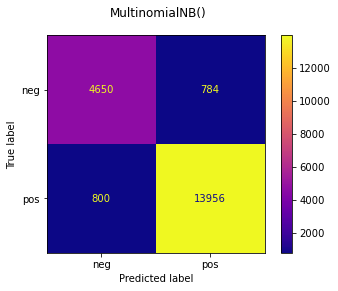

In [115]:
conf_matrix_plotter(mnb)

In [116]:
#%%time

#gnb = GaussianNB()
#gnb.fit(X_t_vec, y_t)
#gnb_pred = gnb.predict(X_val_vec)
#gnb_acc = accuracy_score(y_val, gnb_pred)
#gnb_acc

In [117]:
%%time

mnb = MultinomialNB(alpha = .1, fit_prior = False)
mnb.fit(X_t_vec, y_t)
mnb_pred = mnb.predict(X_val_vec)
mnb_acc = accuracy_score(y_val, mnb_pred)
mnb_acc

Wall time: 1.49 s


0.8839524517087667

In [118]:
%%time

bnb = BernoulliNB()
bnb.fit(X_t_vec, y_t)
bnb_pred = bnb.predict(X_val_vec)
#bnb.score(X_train, y_train), bnb.score(X_test, y_test)
bnb_acc = accuracy_score(y_val, bnb_pred)
bnb_acc

#conf_matrix_plotter(bnb)

Wall time: 1.45 s


0.8347696879643388

In [119]:
%%time

bnb = BernoulliNB(fit_prior = False)
bnb.fit(X_t_vec, y_t)
bnb_pred = bnb.predict(X_val_vec)
#bnb.score(X_train, y_train), bnb.score(X_test, y_test)
bnb_acc = accuracy_score(y_val, bnb_pred)
bnb_acc

Wall time: 1.52 s


0.8361069836552749

In [120]:
%%time

lr = LogisticRegression()
lr.fit(X_t_vec, y_t)
lr_pred = lr.predict(X_val_vec)
#lr.score(X_train, y_train), lr.score(X_test, y_test)
lr_acc = accuracy_score(y_val, lr_pred)
lr_acc

C:\Users\edwardsrk\anaconda3\envs\learn-env\lib\site-packages\sklearn\linear_model\_logistic.py:762: ConvergenceWarning: lbfgs failed to converge (status=1):
STOP: TOTAL NO. of ITERATIONS REACHED LIMIT.

Increase the number of iterations (max_iter) or scale the data as shown in:
    https://scikit-learn.org/stable/modules/preprocessing.html
Please also refer to the documentation for alternative solver options:
    https://scikit-learn.org/stable/modules/linear_model.html#logistic-regression
  n_iter_i = _check_optimize_result(


Wall time: 2 s


0.9356612184249629

In [121]:
%%time

lr = LogisticRegression(solver = 'liblinear')
lr.fit(X_t_vec, y_t)
lr_pred = lr.predict(X_val_vec)
#lr.score(X_train, y_train), lr.score(X_test, y_test)
lr_acc = accuracy_score(y_val, lr_pred)
lr_acc

Wall time: 2.17 s


0.9359583952451709

# FSM

In [122]:
%%time

#    'loss': ['hinge', 'log', 'modified_huber', 'perceptron', 'huber', 'squared_loss'],
#    'penalty': ['l2', 'l1', 'elasticnet'],
#    'alpha': [0.0001, 0.001, 0.01, 0.1],    


sgd = SGDClassifier()
sgd.fit(X_t_vec, y_t)
sgd_pred = sgd.predict(X_val_vec)
#sgd.score(X_train, y_train), sgd.score(X_test, y_test)
sgd_acc = accuracy_score(y_val, sgd_pred)
sgd_acc

#conf_matrix_plotter(sgd)

Wall time: 1.75 s


0.9282317979197623

In [123]:
sgd = SGDClassifier()
sgd.fit(X_t_vec, y_t)
sgd_pred = sgd.predict(X_val_vec)
#sgd.score(X_train, y_train), sgd.score(X_test, y_test)
sgd_acc = accuracy_score(y_val, sgd_pred)
sgd_acc

0.9264487369985142

# Grid Search

In [124]:
from xgboost import XGBClassifier
from sklearn.svm import SVC, LinearSVC, NuSVC
from sklearn.neighbors import KNeighborsClassifier
from sklearn.tree import DecisionTreeClassifier
from sklearn.ensemble import RandomForestClassifier

In [125]:
lr = LogisticRegression()
mnb = MultinomialNB()
bnb = BernoulliNB()
knn =  KNeighborsClassifier()
dtc = DecisionTreeClassifier()
rfc = RandomForestClassifier()
xgb = XGBClassifier()
sgd = SGDClassifier()

#lr_pipe = Pipeline(steps =[,('lr', LogisticRegression())])
#mnb_pipe = Pipeline(steps =[,('mnb', MultinomialNB())])
#bnb_pipe = Pipeline(steps =[,('bnb', BernoulliNB())])
#knn_pipe = Pipeline(steps =[,('knn', KNeighborsClassifier())])
#dtc_pipe = Pipeline(steps =[,('dtc', DecisionTreeClassifier())])
#rfc_pipe = Pipeline(steps =[,('rfc', RandomForestClassifier())])
#xgb_pipe = Pipeline(steps =[,('xgb', XGBClassifier())])
#sgd_pipe = Pipeline(steps =[,('sgd', SGDClassifier())])

In [126]:
##Logistic Regression Hyperparameters
lr_params = {
   'lr__C':[.1, .75],
   'lr__max_iter':[500],
   'lr__solver':['lbfgs', 'liblinear']
    
            }

##Multinomial Naive Bayes
mnb_params = {    
    'mnb__alpha': [1, .5, .1],
    'mnb__fit_prior': ['True', 'False']
}

##Bernoulli Naive Bayes Hyperparameters
bnb_params = {'bnb__alpha': list(np.linspace(.1, 1, 10))}

##K Nearest Neighbors
knn_params = {
    'knn__n_neighbors': [3, 7, 12], 
    'knn__weights':['uniform', 'distance'], 
    'knn__p':[1, 2, 3, 4]
             }

##Decision Tree
dtc_params = {
    'dtc__criterion':['gini', 'entropy'],  
    'dtc__max_depth': [10, 25, 40, 55],
    'dtc__min_samples_leaf':[1, 2, 3], 
    'dtc__max_features': ['auto', 'sqrt']
              } 

##Random Forest
rfc_params = {
    'rfc__n_estimators':[100, 125],
    'rfc__criterion':['gini', 'entropy'],
    'rfc__max_depth':[20, 40, None],
    'rfc__min_samples_leaf':[1, 2, 3], 
    'rfc__max_features': ['auto','sqrt', 'log2']
                }

##XGBoost
xgb_params = {
        'xgb__eta':[.7, .9, 1.1],
        'xgb__max_depth': [6, 10, 15, 20],
        'xgb__learning_rate': [0.001, 0.01, 0.1, 0.2, 0,3],
        'xgb__subsample': [0.5, 0.6, 0.7, 0.8, 0.9, 1.0],
        'xgb__colsample_bytree': [0.4, 0.5, 0.6, 0.7, 0.8, 0.9, 1.0],
        'xgb__colsample_bylevel': [0.4, 0.5, 0.6, 0.7, 0.8, 0.9, 1.0],
        'xgb__min_child_weight': [0.5, 1.0, 3.0, 5.0, 7.0, 10.0],
        'xgb__gamma': [0, 0.25, 0.5, 1.0],
        'xgb__reg_lambda': [0.1, 1.0, 5.0, 10.0, 50.0, 100.0],
        'xgb__n_estimators': [100, 120]
            }

##SGD Params
sgd_params ={
    'sgd__loss': ['hinge', 'log', 'modified_huber', 'perceptron', 'huber', 'squared_loss'],
    'sgd__penalty': ['l2', 'l1', 'elasticnet'],
    'sgd__alpha': [0.0001, 0.001, 0.01, 0.1],    
}

# Grid Search Test

In [127]:
#create smaller feature set to test if run time shortens
#small_X_t_vec = X_t_vec.iloc[:, 0:100]

In [128]:
#log_grid = GridSearchCV(estimator = LogisticRegression(), param_grid = lr_params, scoring = 'accuracy')
#log_grid.fit(small_X_t_vec, y_t)
#log_grid.best_params_

# Boost feature set to test gridsearch threshold

In [129]:
#tenk_X_t_vec = X_t_vec.iloc[:, 0:10000]

In [130]:
#log_grid = GridSearchCV(estimator = LogisticRegression(), param_grid = lr_params, scoring = 'accuracy')
#log_grid.fit(tenk_X_t_vec, y_t)
#log_grid.best_params_

In [131]:
from sklearn.pipeline import Pipeline

In [58]:
#lr_pipe = Pipeline(steps =[('tf', TfidfVectorizer(max_features =50)),('lr', LogisticRegression())])

In [59]:
#log_grid = GridSearchCV(estimator = lr_pipe, param_grid = lr_params, scoring = 'accuracy')
#log_grid.fit(X_train, y_train)
#log_grid.best_params_

In [60]:
#len(log_grid.best_estimator_.named_steps['tf'].get_feature_names())

# instantiate piplines

In [132]:
lr_pipe = Pipeline(steps =[('cv', CountVectorizer()),('lr', LogisticRegression())])
mnb_pipe = Pipeline(steps =[('cv', CountVectorizer()),('mnb', MultinomialNB())])
bnb_pipe = Pipeline(steps =[('cv', CountVectorizer()),('bnb', BernoulliNB())])
knn_pipe = Pipeline(steps =[('cv', CountVectorizer()),('knn', KNeighborsClassifier())])
dtc_pipe = Pipeline(steps =[('cv', CountVectorizer()),('dtc', DecisionTreeClassifier())])
rfc_pipe = Pipeline(steps =[('cv', CountVectorizer()),('rfc', RandomForestClassifier())])
xgb_pipe = Pipeline(steps =[('cv', CountVectorizer()),('xgb', XGBClassifier())])
sgd_pipe = Pipeline(steps =[('cv', CountVectorizer()),('sgd', SGDClassifier())])

In [133]:
log_grid = GridSearchCV(estimator = lr_pipe, param_grid = lr_params, scoring = 'accuracy')
log_grid.fit(X_train, y_train)
log_grid.best_params_

{'lr__C': 0.75, 'lr__max_iter': 500, 'lr__solver': 'liblinear'}

In [134]:
mnb_grid = GridSearchCV(estimator = mnb_pipe, param_grid = mnb_params, scoring = 'accuracy')
mnb_grid.fit(X_train, y_train)
mnb_grid.best_params_

{'mnb__alpha': 0.1, 'mnb__fit_prior': 'True'}

In [135]:
bnb_grid = GridSearchCV(estimator = bnb_pipe, param_grid = bnb_params, scoring = 'accuracy')
bnb_grid.fit(X_train, y_train)
bnb_grid.best_params_

{'bnb__alpha': 0.1}

In [136]:
knn_grid = GridSearchCV(estimator = knn_pipe, param_grid = knn_params, scoring = 'accuracy')
knn_grid.fit(X_train, y_train)
knn_grid.best_params_

C:\Users\edwardsrk\anaconda3\envs\learn-env\lib\site-packages\sklearn\model_selection\_validation.py:548: FitFailedWarning: Estimator fit failed. The score on this train-test partition for these parameters will be set to nan. Details: 
Traceback (most recent call last):
  File "C:\Users\edwardsrk\anaconda3\envs\learn-env\lib\site-packages\sklearn\model_selection\_validation.py", line 531, in _fit_and_score
    estimator.fit(X_train, y_train, **fit_params)
  File "C:\Users\edwardsrk\anaconda3\envs\learn-env\lib\site-packages\sklearn\pipeline.py", line 335, in fit
    self._final_estimator.fit(Xt, y, **fit_params_last_step)
  File "C:\Users\edwardsrk\anaconda3\envs\learn-env\lib\site-packages\sklearn\neighbors\_base.py", line 1157, in fit
    return self._fit(X)
  File "C:\Users\edwardsrk\anaconda3\envs\learn-env\lib\site-packages\sklearn\neighbors\_base.py", line 419, in _fit
    raise ValueError("Metric '%s' not valid for sparse input. "
ValueError: Metric 'minkowski' not valid for spa

C:\Users\edwardsrk\anaconda3\envs\learn-env\lib\site-packages\sklearn\model_selection\_validation.py:548: FitFailedWarning: Estimator fit failed. The score on this train-test partition for these parameters will be set to nan. Details: 
Traceback (most recent call last):
  File "C:\Users\edwardsrk\anaconda3\envs\learn-env\lib\site-packages\sklearn\model_selection\_validation.py", line 531, in _fit_and_score
    estimator.fit(X_train, y_train, **fit_params)
  File "C:\Users\edwardsrk\anaconda3\envs\learn-env\lib\site-packages\sklearn\pipeline.py", line 335, in fit
    self._final_estimator.fit(Xt, y, **fit_params_last_step)
  File "C:\Users\edwardsrk\anaconda3\envs\learn-env\lib\site-packages\sklearn\neighbors\_base.py", line 1157, in fit
    return self._fit(X)
  File "C:\Users\edwardsrk\anaconda3\envs\learn-env\lib\site-packages\sklearn\neighbors\_base.py", line 419, in _fit
    raise ValueError("Metric '%s' not valid for sparse input. "
ValueError: Metric 'minkowski' not valid for spa

C:\Users\edwardsrk\anaconda3\envs\learn-env\lib\site-packages\sklearn\model_selection\_validation.py:548: FitFailedWarning: Estimator fit failed. The score on this train-test partition for these parameters will be set to nan. Details: 
Traceback (most recent call last):
  File "C:\Users\edwardsrk\anaconda3\envs\learn-env\lib\site-packages\sklearn\model_selection\_validation.py", line 531, in _fit_and_score
    estimator.fit(X_train, y_train, **fit_params)
  File "C:\Users\edwardsrk\anaconda3\envs\learn-env\lib\site-packages\sklearn\pipeline.py", line 335, in fit
    self._final_estimator.fit(Xt, y, **fit_params_last_step)
  File "C:\Users\edwardsrk\anaconda3\envs\learn-env\lib\site-packages\sklearn\neighbors\_base.py", line 1157, in fit
    return self._fit(X)
  File "C:\Users\edwardsrk\anaconda3\envs\learn-env\lib\site-packages\sklearn\neighbors\_base.py", line 419, in _fit
    raise ValueError("Metric '%s' not valid for sparse input. "
ValueError: Metric 'minkowski' not valid for spa

C:\Users\edwardsrk\anaconda3\envs\learn-env\lib\site-packages\sklearn\model_selection\_validation.py:548: FitFailedWarning: Estimator fit failed. The score on this train-test partition for these parameters will be set to nan. Details: 
Traceback (most recent call last):
  File "C:\Users\edwardsrk\anaconda3\envs\learn-env\lib\site-packages\sklearn\model_selection\_validation.py", line 531, in _fit_and_score
    estimator.fit(X_train, y_train, **fit_params)
  File "C:\Users\edwardsrk\anaconda3\envs\learn-env\lib\site-packages\sklearn\pipeline.py", line 335, in fit
    self._final_estimator.fit(Xt, y, **fit_params_last_step)
  File "C:\Users\edwardsrk\anaconda3\envs\learn-env\lib\site-packages\sklearn\neighbors\_base.py", line 1157, in fit
    return self._fit(X)
  File "C:\Users\edwardsrk\anaconda3\envs\learn-env\lib\site-packages\sklearn\neighbors\_base.py", line 419, in _fit
    raise ValueError("Metric '%s' not valid for sparse input. "
ValueError: Metric 'minkowski' not valid for spa

C:\Users\edwardsrk\anaconda3\envs\learn-env\lib\site-packages\sklearn\model_selection\_validation.py:548: FitFailedWarning: Estimator fit failed. The score on this train-test partition for these parameters will be set to nan. Details: 
Traceback (most recent call last):
  File "C:\Users\edwardsrk\anaconda3\envs\learn-env\lib\site-packages\sklearn\model_selection\_validation.py", line 531, in _fit_and_score
    estimator.fit(X_train, y_train, **fit_params)
  File "C:\Users\edwardsrk\anaconda3\envs\learn-env\lib\site-packages\sklearn\pipeline.py", line 335, in fit
    self._final_estimator.fit(Xt, y, **fit_params_last_step)
  File "C:\Users\edwardsrk\anaconda3\envs\learn-env\lib\site-packages\sklearn\neighbors\_base.py", line 1157, in fit
    return self._fit(X)
  File "C:\Users\edwardsrk\anaconda3\envs\learn-env\lib\site-packages\sklearn\neighbors\_base.py", line 419, in _fit
    raise ValueError("Metric '%s' not valid for sparse input. "
ValueError: Metric 'minkowski' not valid for spa

C:\Users\edwardsrk\anaconda3\envs\learn-env\lib\site-packages\sklearn\model_selection\_validation.py:548: FitFailedWarning: Estimator fit failed. The score on this train-test partition for these parameters will be set to nan. Details: 
Traceback (most recent call last):
  File "C:\Users\edwardsrk\anaconda3\envs\learn-env\lib\site-packages\sklearn\model_selection\_validation.py", line 531, in _fit_and_score
    estimator.fit(X_train, y_train, **fit_params)
  File "C:\Users\edwardsrk\anaconda3\envs\learn-env\lib\site-packages\sklearn\pipeline.py", line 335, in fit
    self._final_estimator.fit(Xt, y, **fit_params_last_step)
  File "C:\Users\edwardsrk\anaconda3\envs\learn-env\lib\site-packages\sklearn\neighbors\_base.py", line 1157, in fit
    return self._fit(X)
  File "C:\Users\edwardsrk\anaconda3\envs\learn-env\lib\site-packages\sklearn\neighbors\_base.py", line 419, in _fit
    raise ValueError("Metric '%s' not valid for sparse input. "
ValueError: Metric 'minkowski' not valid for spa

C:\Users\edwardsrk\anaconda3\envs\learn-env\lib\site-packages\sklearn\model_selection\_validation.py:548: FitFailedWarning: Estimator fit failed. The score on this train-test partition for these parameters will be set to nan. Details: 
Traceback (most recent call last):
  File "C:\Users\edwardsrk\anaconda3\envs\learn-env\lib\site-packages\sklearn\model_selection\_validation.py", line 531, in _fit_and_score
    estimator.fit(X_train, y_train, **fit_params)
  File "C:\Users\edwardsrk\anaconda3\envs\learn-env\lib\site-packages\sklearn\pipeline.py", line 335, in fit
    self._final_estimator.fit(Xt, y, **fit_params_last_step)
  File "C:\Users\edwardsrk\anaconda3\envs\learn-env\lib\site-packages\sklearn\neighbors\_base.py", line 1157, in fit
    return self._fit(X)
  File "C:\Users\edwardsrk\anaconda3\envs\learn-env\lib\site-packages\sklearn\neighbors\_base.py", line 419, in _fit
    raise ValueError("Metric '%s' not valid for sparse input. "
ValueError: Metric 'minkowski' not valid for spa

C:\Users\edwardsrk\anaconda3\envs\learn-env\lib\site-packages\sklearn\model_selection\_validation.py:548: FitFailedWarning: Estimator fit failed. The score on this train-test partition for these parameters will be set to nan. Details: 
Traceback (most recent call last):
  File "C:\Users\edwardsrk\anaconda3\envs\learn-env\lib\site-packages\sklearn\model_selection\_validation.py", line 531, in _fit_and_score
    estimator.fit(X_train, y_train, **fit_params)
  File "C:\Users\edwardsrk\anaconda3\envs\learn-env\lib\site-packages\sklearn\pipeline.py", line 335, in fit
    self._final_estimator.fit(Xt, y, **fit_params_last_step)
  File "C:\Users\edwardsrk\anaconda3\envs\learn-env\lib\site-packages\sklearn\neighbors\_base.py", line 1157, in fit
    return self._fit(X)
  File "C:\Users\edwardsrk\anaconda3\envs\learn-env\lib\site-packages\sklearn\neighbors\_base.py", line 419, in _fit
    raise ValueError("Metric '%s' not valid for sparse input. "
ValueError: Metric 'minkowski' not valid for spa

C:\Users\edwardsrk\anaconda3\envs\learn-env\lib\site-packages\sklearn\model_selection\_validation.py:548: FitFailedWarning: Estimator fit failed. The score on this train-test partition for these parameters will be set to nan. Details: 
Traceback (most recent call last):
  File "C:\Users\edwardsrk\anaconda3\envs\learn-env\lib\site-packages\sklearn\model_selection\_validation.py", line 531, in _fit_and_score
    estimator.fit(X_train, y_train, **fit_params)
  File "C:\Users\edwardsrk\anaconda3\envs\learn-env\lib\site-packages\sklearn\pipeline.py", line 335, in fit
    self._final_estimator.fit(Xt, y, **fit_params_last_step)
  File "C:\Users\edwardsrk\anaconda3\envs\learn-env\lib\site-packages\sklearn\neighbors\_base.py", line 1157, in fit
    return self._fit(X)
  File "C:\Users\edwardsrk\anaconda3\envs\learn-env\lib\site-packages\sklearn\neighbors\_base.py", line 419, in _fit
    raise ValueError("Metric '%s' not valid for sparse input. "
ValueError: Metric 'minkowski' not valid for spa

{'knn__n_neighbors': 12, 'knn__p': 2, 'knn__weights': 'uniform'}

In [137]:
dtc_grid = GridSearchCV(estimator = dtc_pipe, param_grid = dtc_params, scoring = 'accuracy')
dtc_grid.fit(X_train, y_train)
dtc_grid.best_params_

{'dtc__criterion': 'gini',
 'dtc__max_depth': 40,
 'dtc__max_features': 'auto',
 'dtc__min_samples_leaf': 3}

In [138]:
rfc_grid = GridSearchCV(estimator = rfc_pipe, param_grid = rfc_params, scoring = 'accuracy')
rfc_grid.fit(X_train, y_train)
rfc_grid.best_params_

{'rfc__criterion': 'gini',
 'rfc__max_depth': None,
 'rfc__max_features': 'auto',
 'rfc__min_samples_leaf': 1,
 'rfc__n_estimators': 100}

In [69]:
xgb_grid = GridSearchCV(estimator = xgb_pipe, param_grid = xgb_params, scoring = 'accuracy')
xgb_grid.fit(X_train, y_train)
xgb_grid.best_params_

KeyboardInterrupt: 

In [139]:
sgd_grid = GridSearchCV(estimator = sgd_pipe, param_grid = sgd_params, scoring = 'accuracy')
sgd_grid.fit(X_train, y_train)
sgd_grid.best_params_

C:\Users\edwardsrk\anaconda3\envs\learn-env\lib\site-packages\sklearn\linear_model\_stochastic_gradient.py:570: ConvergenceWarning: Maximum number of iteration reached before convergence. Consider increasing max_iter to improve the fit.
  warnings.warn("Maximum number of iteration reached before "
C:\Users\edwardsrk\anaconda3\envs\learn-env\lib\site-packages\sklearn\linear_model\_stochastic_gradient.py:570: ConvergenceWarning: Maximum number of iteration reached before convergence. Consider increasing max_iter to improve the fit.
  warnings.warn("Maximum number of iteration reached before "
C:\Users\edwardsrk\anaconda3\envs\learn-env\lib\site-packages\sklearn\linear_model\_stochastic_gradient.py:570: ConvergenceWarning: Maximum number of iteration reached before convergence. Consider increasing max_iter to improve the fit.
  warnings.warn("Maximum number of iteration reached before "
C:\Users\edwardsrk\anaconda3\envs\learn-env\lib\site-packages\sklearn\linear_model\_stochastic_gradient

{'sgd__alpha': 0.0001, 'sgd__loss': 'modified_huber', 'sgd__penalty': 'l2'}

# Tuned models

In [169]:
lr_pipe_tuned = Pipeline(steps =[('cv', CountVectorizer()),
                                 ('lr', LogisticRegression(C = 0.75, max_iter = 500, solver = 'liblinear'))])
#{'lr__C': 0.75, 'lr__max_iter': 500, 'lr__solver': 'liblinear'}

mnb_pipe_tuned = Pipeline(steps =[('cv', CountVectorizer()),
                                  ('mnb', MultinomialNB(alpha = 0.1, fit_prior = True))])
#{'mnb__alpha': 0.1, 'mnb__fit_prior': 'True'}

bnb_pipe_tuned = Pipeline(steps =[('cv', CountVectorizer()),
                                  ('bnb', BernoulliNB(alpha = 0.1))])
#{'bnb__alpha': 0.1}

knn_pipe_tuned = Pipeline(steps =[('cv', CountVectorizer()),('knn', KNeighborsClassifier(n_neighbors = 12,
                                                                                         p = 2, weights = 'uniform'))])
#{'knn__n_neighbors': 12, 'knn__p': 2, 'knn__weights': 'uniform'}

dtc_pipe_tuned = Pipeline(steps =[('cv', CountVectorizer()),
                                  ('dtc', DecisionTreeClassifier(criterion = 'gini', max_depth = 40, max_features = 'auto',
                                                                 min_samples_leaf = 3))])
#{'dtc__criterion': 'gini','dtc__max_depth': 40,'dtc__max_features': 'auto','dtc__min_samples_leaf': 3}


rfc_pipe_tuned = Pipeline(steps =[('cv', CountVectorizer()),
                                  ('rfc', RandomForestClassifier(criterion = 'gini', max_depth = None, max_features = 'auto',
                                                                min_samples_leaf = 1, n_estimators = 100))])        
#{'rfc__criterion': 'gini','rfc__max_depth': None,'rfc__max_features': 'auto',
#'rfc__min_samples_leaf': 1,'rfc__n_estimators': 100}

xgb_pipe_tuned = Pipeline(steps =[('cv', CountVectorizer()),('xgb', XGBClassifier())])

sgd_pipe_tuned = Pipeline(steps =[('cv', CountVectorizer()),
                                  ('sgd', SGDClassifier(alpha = 0.0001, loss = 'modified_huber', penalty = 'l2'))])
#{'sgd__alpha': 0.0001, 'sgd__loss': 'modified_huber', 'sgd__penalty': 'l2'}


In [170]:
from sklearn.model_selection import train_test_split, cross_val_score, cross_validate, GridSearchCV, RandomizedSearchCV

Mean Accuracy: 0.9339895988112927


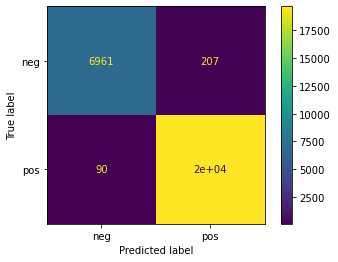

In [171]:
lr_pipe_tuned.fit(X_train, y_train);
plot_confusion_matrix(lr_pipe_tuned, X_train, y_train); 
print("Mean Accuracy:", cross_val_score(lr_pipe_tuned, X_train, y_train).mean())

Mean Accuracy: 0.8915676077265973


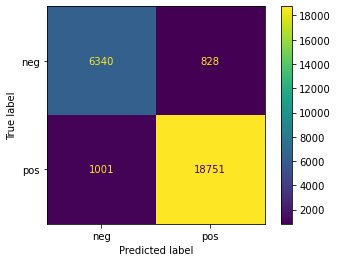

In [172]:
mnb_pipe_tuned.fit(X_train, y_train);
plot_confusion_matrix(mnb_pipe_tuned, X_train, y_train); 
print("Mean Accuracy:", cross_val_score(mnb_pipe_tuned, X_train, y_train).mean())

Mean Accuracy: 0.8521545319465081


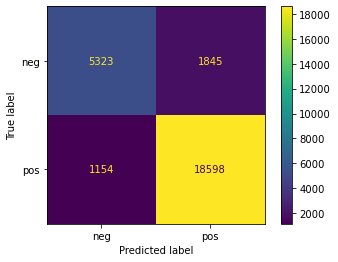

In [173]:
bnb_pipe_tuned.fit(X_train, y_train);
plot_confusion_matrix(bnb_pipe_tuned, X_train, y_train);
print("Mean Accuracy:", cross_val_score(bnb_pipe_tuned, X_train, y_train).mean())

Mean Accuracy: 0.7843610698365527


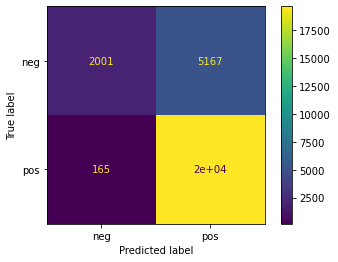

In [174]:
knn_pipe_tuned.fit(X_train, y_train);
plot_confusion_matrix(knn_pipe_tuned, X_train, y_train);
print("Mean Accuracy:", cross_val_score(knn_pipe_tuned, X_train, y_train).mean())

Mean Accuracy: 0.7805349182763744


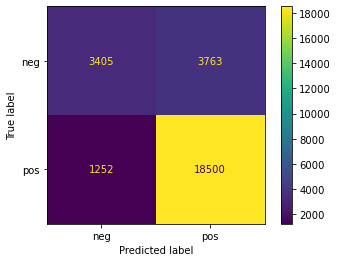

In [175]:
dtc_pipe_tuned.fit(X_train, y_train);
plot_confusion_matrix(dtc_pipe_tuned, X_train, y_train);
print("Mean Accuracy:", cross_val_score(dtc_pipe_tuned, X_train, y_train).mean())

Mean Accuracy: 0.8943536404160476


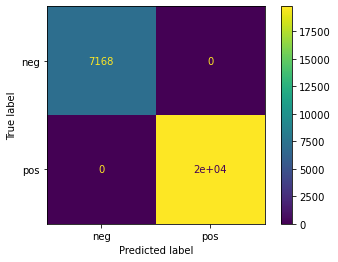

In [176]:
rfc_pipe_tuned.fit(X_train, y_train);
plot_confusion_matrix(rfc_pipe_tuned, X_train, y_train);
print("Mean Accuracy:", cross_val_score(rfc_pipe_tuned, X_train, y_train).mean())

Mean Accuracy: 0.9180163447251115


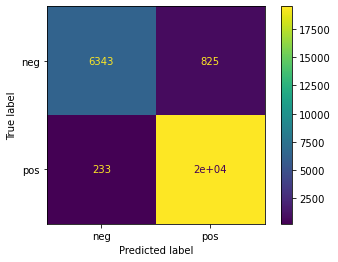

In [177]:
xgb_pipe_tuned.fit(X_train, y_train);
plot_confusion_matrix(xgb_pipe_tuned, X_train, y_train);
print("Mean Accuracy:", cross_val_score(xgb_pipe_tuned, X_train, y_train).mean())

Mean Accuracy: 0.9174962852897475


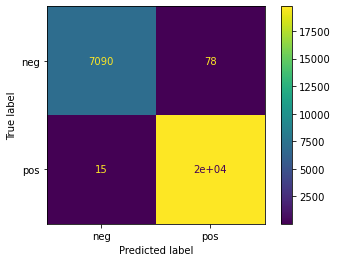

In [178]:
sgd_pipe_tuned.fit(X_train, y_train);
plot_confusion_matrix(sgd_pipe_tuned, X_train, y_train);
print("Mean Accuracy:", cross_val_score(sgd_pipe_tuned, X_train, y_train).mean())

# Vectorizer tuning

## Start with best three performing models, test diffreent number of features while looking for the smallest amount necessary.
## compare with 1000, 5000, 10000, 50000, 75000 feaures

In [179]:
lr_pipe_tuned = Pipeline(steps =[('cv', CountVectorizer(max_features = 1000)),
                                 ('lr', LogisticRegression(C = 0.75, max_iter = 500, solver = 'liblinear'))])
#Mean Accuracy: 0.8883250277592716

xgb_pipe_tuned = Pipeline(steps =[('cv', CountVectorizer(max_features = 1000)),('xgb', XGBClassifier())])
#Mean Accuracy: 0.8706019986675549

sgd_pipe_tuned = Pipeline(steps =[('cv', CountVectorizer(max_features = 1000)),
                                  ('sgd', SGDClassifier(alpha = 0.001, loss = 'modified_huber', penalty = 'L2'))])
#Mean Accuracy: 0.8965872529424829

Feature tracker chart

In [180]:

#1000, 5000, 10000, 50000, 75000

#1000:
#lr:Mean Accuracy: 0.8841932933599821
#xgb:Mean Accuracy: 0.8592737286253609
#sgd:Mean Accuracy: 0.8859269820119919

#5000:
#lr:Mean Accuracy: 0.8921896513435488
#xgb:Mean Accuracy: 0.8678034199422606
#sgd:Mean Accuracy: 0.8968536531201423

#10000:
#lr:Mean Accuracy: 0.8903240506329114
#xgb:Mean Accuracy: 0.8710026204752388
#sgd:Mean Accuracy: 0.8965873417721518

#50000:
#lr:Mean Accuracy: 0.8883250277592716
#xgb:Mean Accuracy: 0.8706019986675549
#sgd:Mean Accuracy: 0.8961875194314901

#75000:
#lr:Mean Accuracy: 0.8883250277592716
#xgb:Mean Accuracy: 0.8706019986675549
#sgd:Mean Accuracy: 0.8960541860981568


Mean Accuracy: 0.9222139673105498


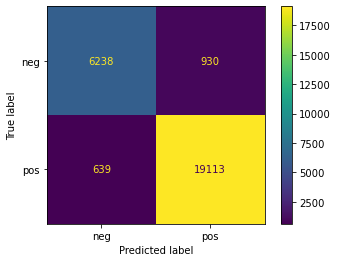

In [181]:
sgd_pipe_tuned.fit(X_train, y_train);
plot_confusion_matrix(sgd_pipe_tuned, X_train, y_train);
print("Mean Accuracy:", cross_val_score(sgd_pipe_tuned, X_train, y_train).mean())

Mean Accuracy: 0.9151560178306092


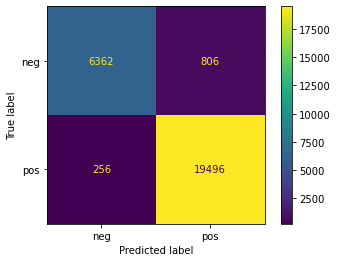

In [182]:
xgb_pipe_tuned.fit(X_train, y_train);
plot_confusion_matrix(xgb_pipe_tuned, X_train, y_train);
print("Mean Accuracy:", cross_val_score(xgb_pipe_tuned, X_train, y_train).mean())

Mean Accuracy: 0.924145616641902


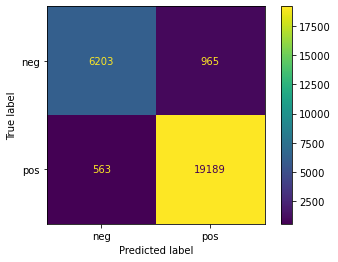

In [183]:
lr_pipe_tuned.fit(X_train, y_train);
plot_confusion_matrix(lr_pipe_tuned, X_train, y_train); 
print("Mean Accuracy:", cross_val_score(lr_pipe_tuned, X_train, y_train).mean())

Vectorizer tuning: other hyper parameters

Logistic Regression

In [184]:
lr_pipe_tuned = Pipeline(steps =[('cv', CountVectorizer(analyzer = 'word', max_features = 5000)),
                                 ('lr', LogisticRegression(C = 0.75, max_iter = 500, solver = 'liblinear'))])

In [187]:
tf_params = {
    'cv__max_df': (0.25, 0.5, 0.75),
    'cv__ngram_range': [(1, 1), (1, 2), (1, 3)],
}

In [188]:
log_grid = GridSearchCV(estimator = lr_pipe_tuned, param_grid = tf_params, scoring = 'accuracy')
log_grid.fit(X_train, y_train)
log_grid.best_params_

{'cv__max_df': 0.5, 'cv__ngram_range': (1, 3)}

In [191]:
lr_pipe_tuned = Pipeline(steps =[('cv', CountVectorizer(analyzer = 'word',max_df = 0.5, ngram_range = (1,3), max_features = 1000)),
                                 ('lr', LogisticRegression(C = 0.75, max_iter = 500, solver = 'liblinear'))])

Mean Accuracy: 0.9230312035661218


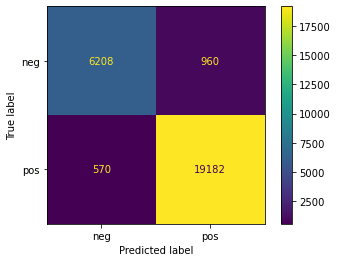

In [192]:
lr_pipe_tuned.fit(X_train, y_train);
plot_confusion_matrix(lr_pipe_tuned, X_train, y_train); 
print("Mean Accuracy:", cross_val_score(lr_pipe_tuned, X_train, y_train).mean())

XGB

In [189]:
xgb_pipe_tuned = Pipeline(steps =[('cv', CountVectorizer(analyzer = 'word', max_features = 5000)),('xgb', XGBClassifier())])

In [193]:
xgb_grid = GridSearchCV(estimator = xgb_pipe_tuned, param_grid = tf_params, scoring = 'accuracy')
xgb_grid.fit(X_train, y_train)
xgb_grid.best_params_

{'cv__max_df': 0.5, 'cv__ngram_range': (1, 2)}

In [194]:
xgb_pipe_tuned = Pipeline(steps =[('cv', CountVectorizer(analyzer = 'word',max_df = 0.5, 
                                                         ngram_range = (1,2), max_features = 1000)),('xgb', XGBClassifier())])

Mean Accuracy: 0.9164190193164933


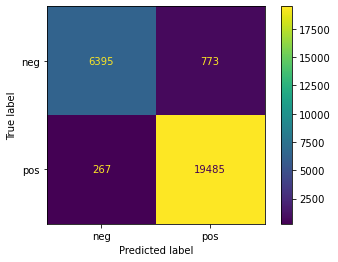

In [195]:
xgb_pipe_tuned.fit(X_train, y_train);
plot_confusion_matrix(xgb_pipe_tuned, X_train, y_train);
print("Mean Accuracy:", cross_val_score(xgb_pipe_tuned, X_train, y_train).mean())

SGD

In [200]:
sgd_pipe_tuned = Pipeline(steps =[('cv', CountVectorizer(max_features = 5000)),
                                  ('sgd', SGDClassifier(alpha = 0.001, loss = 'modified_huber', penalty = 'L2'))])

In [202]:
sgd_grid = GridSearchCV(estimator = sgd_pipe_tuned, param_grid = tf_params, scoring = 'accuracy')
sgd_grid.fit(X_train, y_train)
sgd_grid.best_params_

{'cv__max_df': 0.5, 'cv__ngram_range': (1, 3)}

In [203]:
sgd_pipe_tuned = Pipeline(steps =[('cv', CountVectorizer(max_df = 0.5, ngram_range = (1,3), max_features = 1000)),
                                  ('sgd', SGDClassifier(alpha = 0.001, loss = 'modified_huber', penalty = 'L2'))])

Mean Accuracy: 0.9228083209509658


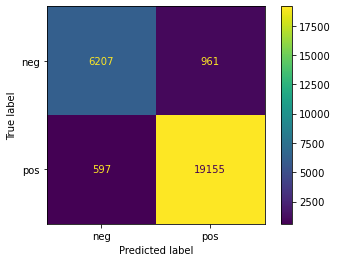

In [204]:
sgd_pipe_tuned.fit(X_train, y_train);
plot_confusion_matrix(sgd_pipe_tuned, X_train, y_train);
print("Mean Accuracy:", cross_val_score(sgd_pipe_tuned, X_train, y_train).mean())

In [ ]:
DONE